In [41]:
import numpy as np
import matplotlib.pyplot as plt
import json, sys, random
import pandas as pd
import numpy as np
from PIL import Image, ImageDraw 
from matplotlib import pyplot as plt
import keras.callbacks
from keras.utils import np_utils
import pickle
import matplotlib.patches as patches
from skimage.transform import resize

In [10]:
import json
import time
import numpy as np
from matplotlib import pyplot as plt
from keras.utils.np_utils import to_categorical

from keras.models import Sequential
from keras.layers.core import Flatten, Dense, Dropout, Lambda
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.optimizers import Adam, SGD

from keras import backend as K
K.tensorflow_backend._get_available_gpus()

f = open(r'shipsnet.json')
dataset = json.load(f)
f.close()

data = np.array(dataset['data']).astype('uint8')
labels = np.array(dataset['labels']).astype('uint8')

x = data / 255.
x = x.reshape([-1, 3, 80, 80]).transpose([0,2,3,1])

y = to_categorical(labels, num_classes=2)


model = Sequential()
print(type(model))
model.add(Conv2D(32, (3, 3), padding="same", input_shape=(80, 80, 3), activation='relu'))
model.add(Conv2D(32, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2))

model.add(Conv2D(64, (3, 3), padding="same", activation='relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2))

model.add(Conv2D(128, (3, 3), padding="same", activation='relu'))
model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
# model.add(Dropout(0.2))

model.add(Flatten())
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer=SGD(lr=0.01, momentum=0.9, nesterov=True), 
              metrics=['accuracy'])
    
history = model.fit(x, y, batch_size=64, epochs=50, validation_split=0.2)

<class 'keras.engine.sequential.Sequential'>
Train on 3200 samples, validate on 800 samples
Epoch 1/50
3200/3200 [==============================] - 2s 739us/step - loss: 0.6106 - acc: 0.7116 - val_loss: 0.4609 - val_acc: 1.0000
Epoch 2/50
3200/3200 [==============================] - 2s 489us/step - loss: 0.3776 - acc: 0.8269 - val_loss: 0.6221 - val_acc: 0.6925
Epoch 3/50
3200/3200 [==============================] - 2s 499us/step - loss: 0.1973 - acc: 0.9191 - val_loss: 0.7236 - val_acc: 0.6338
Epoch 4/50
3200/3200 [==============================] - 2s 504us/step - loss: 0.1363 - acc: 0.9453 - val_loss: 0.2530 - val_acc: 0.9012
Epoch 5/50
3200/3200 [==============================] - 2s 497us/step - loss: 0.0944 - acc: 0.9684 - val_loss: 0.4602 - val_acc: 0.8113
Epoch 6/50
3200/3200 [==============================] - 2s 520us/step - loss: 0.0761 - acc: 0.9716 - val_loss: 0.4074 - val_acc: 0.8500
Epoch 7/50
3200/3200 [==============================] - 2s 506us/step - loss: 0.0661 - acc: 

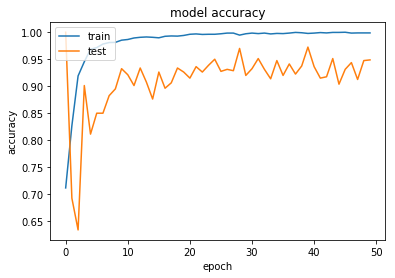

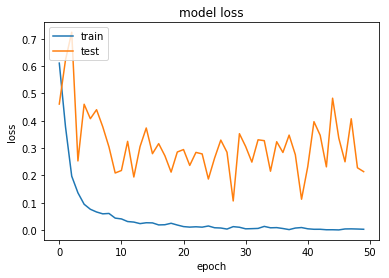

In [11]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [146]:
from PIL import Image


def sliding_window(image, stepSize, windowSize,scaler,loaded_model):
    cnt_all = 0
    cnt_ship = 0
    boxes = list()
    scores = list()
    for s in scaler:
        ws = np.array([0,0]);# new window size after rescaling
        ws[0] = int(windowSize[0] * s)
        ws[1] = int(windowSize[1] * s)
        # slide a window across the image
        for x in range(0, image.shape[0]-ws[0], stepSize):
            for y in range(0, image.shape[1]-ws[1], stepSize):
                cnt_all += 1
                snip = image[x:x+ws[0],y:y+ws[1]] #sniping a image in large image to classifiy
                im = resize(snip, (80, 80),anti_aliasing=True)
                im = im.reshape(1,80,80,3)
                # plt.imshow(snip.reshape(80,80,3))
                
                '''
                Code for image Classification, 
                input im, which is 80*80*3
                output c= 0 if not ship, c = 1 if is ship
                '''
                c = loaded_model.predict(im)[0]
                print(x, y, c)
                if c[1] > c[0]:
                    cnt_ship += 1
                    boxes.append([x,y,x+80*s,y+80*s])
                    scores.append(c[1])
    print(cnt_all, cnt_ship)
    return boxes, scores

def show_ship(image, boxes, indices):
    fig,ax = plt.subplots(1)
    fig.set_size_inches(30,20)
    ax.imshow(image)
    for i in indices:
        box = boxes[i]
        y_of_top_left = box[0]
        x_of_top_left = box[1]
        width = box[3] - box[1]
        height = box[2] - box[0]
        
        rect = patches.Rectangle((x_of_top_left,y_of_top_left),width,height,linewidth=3,edgecolor='r',facecolor='none')
        ax.add_patch(rect)
    plt.show()

def non_max_suppression(boxes, scores, threshold):
    boxes = np.array(boxes)
    scores = np.array(scores)
    
    # bottom-left origin
    ys1 = boxes[:, 0]
    xs1 = boxes[:, 1]
    # top-right target
    ys2 = boxes[:, 2]
    xs2 = boxes[:, 3]
    boxes = np.append(boxes, ys2.reshape(-1,1), 1)
    boxes = np.append(boxes, xs2.reshape(-1,1), 1)
    # box coordinate ranges are inclusive-inclusive
    areas = (ys2 - ys1) * (xs2 - xs1)
    scores_indexes = scores.argsort().tolist()
    boxes_keep_index = []
    while len(scores_indexes):
        index = scores_indexes.pop()
        boxes_keep_index.append(index)
        if not len(scores_indexes):
            break
        ious = compute_iou(boxes[index], boxes[scores_indexes], areas[index],
                           areas[scores_indexes])
        filtered_indexes = set((ious > threshold).nonzero()[0])
        # if there are no more scores_index
        # then we should pop it
        scores_indexes = [
            v for (i, v) in enumerate(scores_indexes)
            if i not in filtered_indexes
        ]
    return np.array(boxes_keep_index)


def compute_iou(box, boxes, box_area, boxes_area):
    # this is the iou of the box against all other boxes
    assert boxes.shape[0] == boxes_area.shape[0]
    # get all the origin-ys
    # push up all the lower origin-xs, while keeping the higher origin-xs
    ys1 = np.maximum(box[0], boxes[:, 0])
    # get all the origin-xs
    # push right all the lower origin-xs, while keeping higher origin-xs
    xs1 = np.maximum(box[1], boxes[:, 1])
    # get all the target-ys
    # pull down all the higher target-ys, while keeping lower origin-ys
    ys2 = np.minimum(box[2], boxes[:, 2])
    # get all the target-xs
    # pull left all the higher target-xs, while keeping lower target-xs
    xs2 = np.minimum(box[3], boxes[:, 3])
    # each intersection area is calculated by the
    # pulled target-x minus the pushed origin-x
    # multiplying
    # pulled target-y minus the pushed origin-y
    # we ignore areas where the intersection side would be negative
    # this is done by using maxing the side length by 0
    intersections = np.maximum(ys2 - ys1, 0) * np.maximum(xs2 - xs1, 0)
    # each union is then the box area
    # added to each other box area minusing their intersection calculated above
    unions = box_area + boxes_area - intersections
    # element wise division
    # if the intersection is 0, then their ratio is 0
    ious = intersections / unions
    return ious

(1254, 1848, 3)


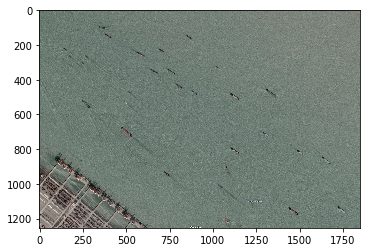

In [159]:
import cv2

image = plt.imread('basicCNN_test.png')

if len(image.shape) > 2 and image.shape[2] == 4:
    #convert the image from RGBA2RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGRA2BGR)

    
print(image.shape)
plt.imshow(image)

In [167]:
boxes, scores = sliding_window(image, 5, (80,80),[0.5,1],model)


0 0 [9.996848e-01 3.151928e-04]
0 5 [9.9921083e-01 7.8917982e-04]
0 10 [9.9981087e-01 1.8911473e-04]
0 15 [9.999471e-01 5.297895e-05]
0 20 [9.9996614e-01 3.3824752e-05]
0 25 [9.9993694e-01 6.3093314e-05]
0 30 [9.9994659e-01 5.3456046e-05]
0 35 [9.9966848e-01 3.3149502e-04]
0 40 [9.999087e-01 9.131087e-05]
0 45 [9.9995065e-01 4.9402668e-05]
0 50 [9.9985814e-01 1.4181064e-04]
0 55 [9.9971098e-01 2.8902886e-04]
0 60 [9.9994910e-01 5.0923274e-05]
0 65 [9.9995816e-01 4.1852032e-05]
0 70 [9.999281e-01 7.187651e-05]
0 75 [9.9980193e-01 1.9807974e-04]
0 80 [9.9994266e-01 5.7288733e-05]
0 85 [9.993724e-01 6.276581e-04]
0 90 [9.9992967e-01 7.0325383e-05]
0 95 [9.9977726e-01 2.2276145e-04]
0 100 [9.9962914e-01 3.7083740e-04]
0 105 [9.9997842e-01 2.1598964e-05]
0 110 [9.9994779e-01 5.2165382e-05]
0 115 [9.9993730e-01 6.2737476e-05]
0 120 [9.999622e-01 3.778490e-05]
0 125 [9.9998188e-01 1.8091994e-05]
0 130 [9.9997425e-01 2.5793506e-05]
0 135 [9.9969220e-01 3.0784783e-04]
0 140 [0.9974368  0.002563

0 1325 [9.999523e-01 4.766464e-05]
0 1330 [9.9998426e-01 1.5782787e-05]
0 1335 [9.9998415e-01 1.5895366e-05]
0 1340 [9.9999309e-01 6.9066855e-06]
0 1345 [9.9998736e-01 1.2647214e-05]
0 1350 [9.9997687e-01 2.3162947e-05]
0 1355 [9.9996138e-01 3.8648242e-05]
0 1360 [9.999981e-01 1.924958e-06]
0 1365 [9.9999869e-01 1.2864037e-06]
0 1370 [9.9999583e-01 4.2277497e-06]
0 1375 [9.9999428e-01 5.7621137e-06]
0 1380 [9.9997950e-01 2.0545589e-05]
0 1385 [9.9998283e-01 1.7136801e-05]
0 1390 [9.999902e-01 9.761850e-06]
0 1395 [9.9999738e-01 2.6052512e-06]
0 1400 [9.9998963e-01 1.0328622e-05]
0 1405 [9.9999499e-01 4.9526634e-06]
0 1410 [9.999933e-01 6.704094e-06]
0 1415 [9.999900e-01 9.999216e-06]
0 1420 [9.9999511e-01 4.8525003e-06]
0 1425 [9.9999702e-01 2.9325158e-06]
0 1430 [9.9999774e-01 2.2662036e-06]
0 1435 [9.9999750e-01 2.5341235e-06]
0 1440 [9.9999535e-01 4.6240366e-06]
0 1445 [9.9999762e-01 2.4319122e-06]
0 1450 [9.9992883e-01 7.1111761e-05]
0 1455 [9.9998558e-01 1.4401212e-05]
0 1460 [9.9

5 715 [9.9997091e-01 2.9062478e-05]
5 720 [9.9997985e-01 2.0149419e-05]
5 725 [9.9998116e-01 1.8823019e-05]
5 730 [9.9998689e-01 1.3094648e-05]
5 735 [9.9992394e-01 7.6079043e-05]
5 740 [9.9990904e-01 9.0895956e-05]
5 745 [9.9992085e-01 7.9125282e-05]
5 750 [9.9996805e-01 3.1992731e-05]
5 755 [9.999279e-01 7.206950e-05]
5 760 [9.9995589e-01 4.4157267e-05]
5 765 [9.9976164e-01 2.3832549e-04]
5 770 [9.9949324e-01 5.0669553e-04]
5 775 [9.9986482e-01 1.3517388e-04]
5 780 [9.9992383e-01 7.6176824e-05]
5 785 [9.9995244e-01 4.7558580e-05]
5 790 [9.9987864e-01 1.2139931e-04]
5 795 [9.9998283e-01 1.7141328e-05]
5 800 [9.9998057e-01 1.9435336e-05]
5 805 [0.9979685  0.00203153]
5 810 [9.992243e-01 7.757399e-04]
5 815 [9.9976021e-01 2.3980823e-04]
5 820 [9.9940133e-01 5.9862790e-04]
5 825 [9.998795e-01 1.205611e-04]
5 830 [9.9987662e-01 1.2332705e-04]
5 835 [9.997522e-01 2.478165e-04]
5 840 [9.9996853e-01 3.1505788e-05]
5 845 [9.9989510e-01 1.0492109e-04]
5 850 [9.9994540e-01 5.4650638e-05]
5 855 

10 165 [9.9965167e-01 3.4827786e-04]
10 170 [0.9989084  0.00109155]
10 175 [0.99642545 0.0035746 ]
10 180 [9.9959058e-01 4.0942384e-04]
10 185 [9.9941456e-01 5.8545370e-04]
10 190 [0.99660873 0.00339135]
10 195 [9.9969006e-01 3.0996473e-04]
10 200 [9.996086e-01 3.914551e-04]
10 205 [9.996842e-01 3.157498e-04]
10 210 [9.997806e-01 2.194481e-04]
10 215 [9.9977642e-01 2.2357596e-04]
10 220 [9.9967194e-01 3.2808437e-04]
10 225 [9.9974316e-01 2.5688126e-04]
10 230 [9.995197e-01 4.802480e-04]
10 235 [9.9959975e-01 4.0022231e-04]
10 240 [9.999385e-01 6.151741e-05]
10 245 [9.999032e-01 9.673110e-05]
10 250 [9.9985814e-01 1.4188234e-04]
10 255 [9.9946100e-01 5.3895614e-04]
10 260 [0.9944719  0.00552814]
10 265 [0.99814045 0.00185955]
10 270 [9.9987090e-01 1.2914152e-04]
10 275 [9.99889851e-01 1.10181776e-04]
10 280 [9.9932849e-01 6.7151745e-04]
10 285 [9.9958235e-01 4.1761342e-04]
10 290 [9.9993443e-01 6.5577857e-05]
10 295 [9.9995971e-01 4.0302813e-05]
10 300 [9.9953437e-01 4.6565916e-04]
10 3

10 1430 [9.9998665e-01 1.3294390e-05]
10 1435 [9.9999893e-01 1.0223403e-06]
10 1440 [9.9999869e-01 1.3606699e-06]
10 1445 [9.999778e-01 2.211398e-05]
10 1450 [9.9998534e-01 1.4717943e-05]
10 1455 [9.999958e-01 4.136897e-06]
10 1460 [9.9997914e-01 2.0869546e-05]
10 1465 [9.9999952e-01 4.2451683e-07]
10 1470 [9.999968e-01 3.220547e-06]
10 1475 [9.999778e-01 2.214266e-05]
10 1480 [9.9997413e-01 2.5891026e-05]
10 1485 [9.9997091e-01 2.9114797e-05]
10 1490 [9.9999464e-01 5.3886702e-06]
10 1495 [9.9999440e-01 5.5499977e-06]
10 1500 [9.9998045e-01 1.9508239e-05]
10 1505 [9.9999321e-01 6.7416318e-06]
10 1510 [9.9999392e-01 6.0702887e-06]
10 1515 [9.9999404e-01 5.9508470e-06]
10 1520 [9.9998367e-01 1.6281185e-05]
10 1525 [9.9987006e-01 1.2993343e-04]
10 1530 [9.9999595e-01 4.0847071e-06]
10 1535 [9.999924e-01 7.616857e-06]
10 1540 [9.999863e-01 1.373675e-05]
10 1545 [9.9998844e-01 1.1566435e-05]
10 1550 [9.9997497e-01 2.5041389e-05]
10 1555 [9.9999487e-01 5.1133043e-06]
10 1560 [9.9999750e-01 2

15 890 [9.9994957e-01 5.0374783e-05]
15 895 [9.9990344e-01 9.6530232e-05]
15 900 [9.9998534e-01 1.4664141e-05]
15 905 [9.9998760e-01 1.2387456e-05]
15 910 [9.9954778e-01 4.5216692e-04]
15 915 [9.999752e-01 2.482755e-05]
15 920 [9.9991417e-01 8.5819360e-05]
15 925 [9.9968457e-01 3.1541282e-04]
15 930 [9.9979168e-01 2.0835396e-04]
15 935 [9.9985480e-01 1.4518901e-04]
15 940 [9.9975997e-01 2.4006469e-04]
15 945 [9.9994648e-01 5.3485663e-05]
15 950 [9.999572e-01 4.284044e-05]
15 955 [9.9997938e-01 2.0663228e-05]
15 960 [9.9980718e-01 1.9290246e-04]
15 965 [9.9958616e-01 4.1387774e-04]
15 970 [9.9983346e-01 1.6648044e-04]
15 975 [9.999714e-01 2.862606e-05]
15 980 [9.9977809e-01 2.2187857e-04]
15 985 [9.999269e-01 7.306333e-05]
15 990 [9.9995077e-01 4.9182385e-05]
15 995 [9.999198e-01 8.025681e-05]
15 1000 [9.999479e-01 5.212019e-05]
15 1005 [9.999914e-01 8.592848e-06]
15 1010 [9.9990726e-01 9.2744784e-05]
15 1015 [9.9997520e-01 2.4764175e-05]
15 1020 [9.9976021e-01 2.3974353e-04]
15 1025 [9

20 365 [9.999125e-01 8.743801e-05]
20 370 [9.9919564e-01 8.0434413e-04]
20 375 [0.99763525 0.00236474]
20 380 [9.99890804e-01 1.09180866e-04]
20 385 [9.9967086e-01 3.2912666e-04]
20 390 [9.9975497e-01 2.4507349e-04]
20 395 [9.997032e-01 2.967581e-04]
20 400 [9.9994075e-01 5.9202725e-05]
20 405 [9.9994016e-01 5.9810187e-05]
20 410 [9.9995983e-01 4.0144005e-05]
20 415 [9.9986720e-01 1.3283266e-04]
20 420 [9.992592e-01 7.408338e-04]
20 425 [9.9998116e-01 1.8780900e-05]
20 430 [9.9999595e-01 4.0434916e-06]
20 435 [9.9999285e-01 7.1826576e-06]
20 440 [9.9984264e-01 1.5727511e-04]
20 445 [9.9994934e-01 5.0674618e-05]
20 450 [9.9989641e-01 1.0352416e-04]
20 455 [9.9984074e-01 1.5919855e-04]
20 460 [9.999839e-01 1.607916e-05]
20 465 [9.9991250e-01 8.7457614e-05]
20 470 [9.9998879e-01 1.1215134e-05]
20 475 [9.9995875e-01 4.1189487e-05]
20 480 [9.999341e-01 6.586797e-05]
20 485 [9.9997723e-01 2.2795062e-05]
20 490 [9.9990892e-01 9.1065136e-05]
20 495 [9.9988067e-01 1.1933748e-04]
20 500 [9.99547

20 1580 [9.9999869e-01 1.2559298e-06]
20 1585 [9.999957e-01 4.327933e-06]
20 1590 [9.9996662e-01 3.3336746e-05]
20 1595 [9.998920e-01 1.079721e-04]
20 1600 [9.9998987e-01 1.0103748e-05]
20 1605 [9.9999654e-01 3.4099874e-06]
20 1610 [9.9999273e-01 7.2782823e-06]
20 1615 [9.9999440e-01 5.5612722e-06]
20 1620 [9.9999595e-01 4.0708273e-06]
20 1625 [9.9999809e-01 1.8843463e-06]
20 1630 [9.9999857e-01 1.3782985e-06]
20 1635 [9.999962e-01 3.838626e-06]
20 1640 [9.9999487e-01 5.1446877e-06]
20 1645 [9.9998677e-01 1.3187436e-05]
20 1650 [9.9995923e-01 4.0795836e-05]
20 1655 [9.999902e-01 9.782652e-06]
20 1660 [9.999980e-01 2.075263e-06]
20 1665 [9.999914e-01 8.590782e-06]
20 1670 [9.9999821e-01 1.7676003e-06]
20 1675 [9.9999547e-01 4.5358934e-06]
20 1680 [9.9997711e-01 2.2878776e-05]
20 1685 [9.9999666e-01 3.3303984e-06]
20 1690 [9.9999678e-01 3.2752405e-06]
20 1695 [9.9999547e-01 4.5465599e-06]
20 1700 [9.9999487e-01 5.1264337e-06]
20 1705 [9.9995840e-01 4.1606694e-05]
20 1710 [9.9996066e-01 3

25 995 [9.9995148e-01 4.8553047e-05]
25 1000 [9.9995875e-01 4.1225016e-05]
25 1005 [9.9999619e-01 3.7971768e-06]
25 1010 [9.9999440e-01 5.5605824e-06]
25 1015 [9.9992085e-01 7.9151549e-05]
25 1020 [9.9960881e-01 3.9115478e-04]
25 1025 [9.9979013e-01 2.0988527e-04]
25 1030 [9.99893188e-01 1.06831016e-04]
25 1035 [9.9925894e-01 7.4105058e-04]
25 1040 [9.9910706e-01 8.9289458e-04]
25 1045 [9.9998260e-01 1.7411941e-05]
25 1050 [9.999689e-01 3.113569e-05]
25 1055 [9.9997282e-01 2.7184862e-05]
25 1060 [9.999355e-01 6.449741e-05]
25 1065 [9.9992335e-01 7.6597345e-05]
25 1070 [9.9995911e-01 4.0896524e-05]
25 1075 [9.9990904e-01 9.0935137e-05]
25 1080 [9.9997926e-01 2.0703466e-05]
25 1085 [9.999776e-01 2.236908e-05]
25 1090 [9.9992669e-01 7.3285235e-05]
25 1095 [9.9994993e-01 5.0036768e-05]
25 1100 [9.9996448e-01 3.5492183e-05]
25 1105 [9.9998844e-01 1.1572118e-05]
25 1110 [9.997590e-01 2.410229e-04]
25 1115 [9.9993336e-01 6.6590605e-05]
25 1120 [9.9997020e-01 2.9835077e-05]
25 1125 [9.9993134e

30 435 [9.9997079e-01 2.9247763e-05]
30 440 [9.9991727e-01 8.2780862e-05]
30 445 [9.9926263e-01 7.3732238e-04]
30 450 [0.99719465 0.00280527]
30 455 [9.991678e-01 8.321797e-04]
30 460 [9.999870e-01 1.296862e-05]
30 465 [9.9997759e-01 2.2419033e-05]
30 470 [9.9982005e-01 1.7998905e-04]
30 475 [9.999497e-01 5.033416e-05]
30 480 [9.9988687e-01 1.1310606e-04]
30 485 [9.9990690e-01 9.3104194e-05]
30 490 [9.9986827e-01 1.3170448e-04]
30 495 [9.9979573e-01 2.0427130e-04]
30 500 [9.9949527e-01 5.0468702e-04]
30 505 [9.9982244e-01 1.7754982e-04]
30 510 [9.9994600e-01 5.3984153e-05]
30 515 [9.9997807e-01 2.1916005e-05]
30 520 [9.9994957e-01 5.0421884e-05]
30 525 [9.9988747e-01 1.1251131e-04]
30 530 [9.995938e-01 4.062190e-04]
30 535 [9.9902797e-01 9.7199227e-04]
30 540 [9.991978e-01 8.022514e-04]
30 545 [0.9972662  0.00273381]
30 550 [9.9937648e-01 6.2359753e-04]
30 555 [9.9989295e-01 1.0701820e-04]
30 560 [9.99884248e-01 1.15684794e-04]
30 565 [9.9997950e-01 2.0549076e-05]
30 570 [9.9994767e-01

30 1780 [9.9999595e-01 4.0285804e-06]
30 1785 [9.9997818e-01 2.1868676e-05]
30 1790 [9.9999762e-01 2.3500197e-06]
30 1795 [9.9997783e-01 2.2195281e-05]
30 1800 [9.9998832e-01 1.1710993e-05]
30 1805 [9.9998724e-01 1.2781366e-05]
35 0 [9.9968672e-01 3.1335646e-04]
35 5 [9.99896288e-01 1.03654645e-04]
35 10 [9.9976116e-01 2.3879815e-04]
35 15 [9.999902e-01 9.793172e-06]
35 20 [9.9996376e-01 3.6233767e-05]
35 25 [9.99889374e-01 1.10632274e-04]
35 30 [9.9965882e-01 3.4117725e-04]
35 35 [9.9979979e-01 2.0021762e-04]
35 40 [9.9994135e-01 5.8599417e-05]
35 45 [9.996413e-01 3.587079e-04]
35 50 [9.9971241e-01 2.8762364e-04]
35 55 [9.998734e-01 1.266422e-04]
35 60 [9.9997115e-01 2.8876884e-05]
35 65 [9.999902e-01 9.833742e-06]
35 70 [9.9994993e-01 5.0059396e-05]
35 75 [9.998454e-01 1.546405e-04]
35 80 [9.991660e-01 8.340322e-04]
35 85 [0.9984402  0.00155981]
35 90 [9.992999e-01 7.000550e-04]
35 95 [9.9942076e-01 5.7926791e-04]
35 100 [9.994603e-01 5.396704e-04]
35 105 [9.9976832e-01 2.3174098e-04

35 1125 [9.9998188e-01 1.8077679e-05]
35 1130 [9.9996507e-01 3.4915174e-05]
35 1135 [9.998192e-01 1.808271e-04]
35 1140 [9.999887e-01 1.136427e-05]
35 1145 [9.9997377e-01 2.6255637e-05]
35 1150 [9.999622e-01 3.781334e-05]
35 1155 [9.9998629e-01 1.3746381e-05]
35 1160 [9.999201e-01 7.983523e-05]
35 1165 [9.9992657e-01 7.3456104e-05]
35 1170 [9.9974984e-01 2.5015432e-04]
35 1175 [9.999658e-01 3.424497e-05]
35 1180 [9.9999475e-01 5.2563578e-06]
35 1185 [9.9999607e-01 3.9072715e-06]
35 1190 [9.999937e-01 6.294211e-06]
35 1195 [9.9999833e-01 1.6148412e-06]
35 1200 [9.9997663e-01 2.3420473e-05]
35 1205 [9.9998629e-01 1.3732754e-05]
35 1210 [9.9999952e-01 4.6637572e-07]
35 1215 [9.9999988e-01 9.3369145e-08]
35 1220 [9.9999988e-01 1.6429924e-07]
35 1225 [9.999987e-01 1.309376e-06]
35 1230 [9.9999976e-01 2.6431050e-07]
35 1235 [9.9999940e-01 5.9962804e-07]
35 1240 [9.9999595e-01 4.0993878e-06]
35 1245 [9.9999809e-01 1.9655977e-06]
35 1250 [9.9999940e-01 6.2759614e-07]
35 1255 [9.9998260e-01 1.7

40 490 [9.9995255e-01 4.7426602e-05]
40 495 [9.999516e-01 4.840132e-05]
40 500 [9.9997592e-01 2.4103185e-05]
40 505 [9.9989223e-01 1.0777573e-04]
40 510 [9.9997485e-01 2.5126381e-05]
40 515 [9.9998403e-01 1.6027123e-05]
40 520 [9.9999714e-01 2.8243421e-06]
40 525 [9.999957e-01 4.245535e-06]
40 530 [9.999480e-01 5.191398e-05]
40 535 [9.9997354e-01 2.6443191e-05]
40 540 [9.9997807e-01 2.1984959e-05]
40 545 [9.99986172e-01 1.38643445e-05]
40 550 [9.9997878e-01 2.1274576e-05]
40 555 [9.9997604e-01 2.3977000e-05]
40 560 [9.9995756e-01 4.2402076e-05]
40 565 [9.9993014e-01 6.9886162e-05]
40 570 [9.9987459e-01 1.2535222e-04]
40 575 [9.9960548e-01 3.9454593e-04]
40 580 [9.9931943e-01 6.8058545e-04]
40 585 [9.99895334e-01 1.04695624e-04]
40 590 [9.9996948e-01 3.0479083e-05]
40 595 [9.9994612e-01 5.3934396e-05]
40 600 [9.9996567e-01 3.4339482e-05]
40 605 [9.9993634e-01 6.3709835e-05]
40 610 [9.9988484e-01 1.1514421e-04]
40 615 [9.996711e-01 3.288613e-04]
40 620 [9.9997342e-01 2.6546884e-05]
40 62

40 1725 [9.9999547e-01 4.4897915e-06]
40 1730 [9.999950e-01 4.967829e-06]
40 1735 [9.9998546e-01 1.4598409e-05]
40 1740 [9.9999154e-01 8.4316316e-06]
40 1745 [9.9999285e-01 7.1590093e-06]
40 1750 [9.9999785e-01 2.1417841e-06]
40 1755 [9.9999726e-01 2.7200686e-06]
40 1760 [9.9999714e-01 2.8888915e-06]
40 1765 [9.9999821e-01 1.7397748e-06]
40 1770 [9.9999547e-01 4.5006805e-06]
40 1775 [9.9995136e-01 4.8620925e-05]
40 1780 [9.999907e-01 9.262933e-06]
40 1785 [9.9999702e-01 2.9993196e-06]
40 1790 [9.999995e-01 5.179786e-07]
40 1795 [9.999993e-01 7.046993e-07]
40 1800 [9.9999952e-01 4.3074004e-07]
40 1805 [9.9999690e-01 3.0484264e-06]
45 0 [0.99622995 0.00376999]
45 5 [9.9999833e-01 1.7230025e-06]
45 10 [9.9990785e-01 9.2146569e-05]
45 15 [0.9988667  0.00113337]
45 20 [9.994543e-01 5.456223e-04]
45 25 [9.9924374e-01 7.5628684e-04]
45 30 [9.999980e-01 2.000792e-06]
45 35 [9.9999785e-01 2.1037540e-06]
45 40 [9.994419e-01 5.580468e-04]
45 45 [0.99616724 0.00383277]
45 50 [9.9974757e-01 2.52379

45 1070 [9.9998486e-01 1.5121444e-05]
45 1075 [9.9998176e-01 1.8292394e-05]
45 1080 [9.9999607e-01 3.9057254e-06]
45 1085 [9.9997437e-01 2.5590221e-05]
45 1090 [9.9996114e-01 3.8904353e-05]
45 1095 [9.9998832e-01 1.1724783e-05]
45 1100 [9.9996746e-01 3.2560805e-05]
45 1105 [9.9998522e-01 1.4795836e-05]
45 1110 [9.9999845e-01 1.5988996e-06]
45 1115 [9.9999678e-01 3.2718283e-06]
45 1120 [9.9999714e-01 2.8142304e-06]
45 1125 [9.9999487e-01 5.1180564e-06]
45 1130 [9.999380e-01 6.192836e-05]
45 1135 [9.9996436e-01 3.5665369e-05]
45 1140 [9.9996543e-01 3.4580356e-05]
45 1145 [9.9994969e-01 5.0278704e-05]
45 1150 [9.9995995e-01 4.0040391e-05]
45 1155 [9.9997735e-01 2.2702643e-05]
45 1160 [9.9997473e-01 2.5256928e-05]
45 1165 [9.9998331e-01 1.6682114e-05]
45 1170 [9.9998820e-01 1.1764901e-05]
45 1175 [9.9995506e-01 4.4912227e-05]
45 1180 [9.9994767e-01 5.2356318e-05]
45 1185 [9.9993837e-01 6.1600593e-05]
45 1190 [9.999639e-01 3.613280e-05]
45 1195 [9.9996436e-01 3.5678971e-05]
45 1200 [9.99848

50 510 [9.9958688e-01 4.1308408e-04]
50 515 [9.9928230e-01 7.1768626e-04]
50 520 [0.99724007 0.00275989]
50 525 [0.9956571  0.00434293]
50 530 [0.9975218  0.00247821]
50 535 [0.9946715  0.00532849]
50 540 [9.9983680e-01 1.6313317e-04]
50 545 [9.995919e-01 4.081624e-04]
50 550 [9.9926203e-01 7.3797163e-04]
50 555 [9.998130e-01 1.869618e-04]
50 560 [9.9992657e-01 7.3416879e-05]
50 565 [9.9998677e-01 1.3251050e-05]
50 570 [9.9992156e-01 7.8437210e-05]
50 575 [0.9944772  0.00552284]
50 580 [9.9960452e-01 3.9547283e-04]
50 585 [9.9978441e-01 2.1564242e-04]
50 590 [9.999262e-01 7.376629e-05]
50 595 [9.9963820e-01 3.6179557e-04]
50 600 [9.996836e-01 3.164333e-04]
50 605 [9.9996769e-01 3.2247088e-05]
50 610 [9.999275e-01 7.250614e-05]
50 615 [9.999502e-01 4.981799e-05]
50 620 [9.9985600e-01 1.4394273e-04]
50 625 [9.9921107e-01 7.8895397e-04]
50 630 [9.9997020e-01 2.9779758e-05]
50 635 [9.999436e-01 5.638576e-05]
50 640 [9.996824e-01 3.175890e-04]
50 645 [9.9994946e-01 5.0538431e-05]
50 650 [9.

50 1670 [9.9999976e-01 2.4186906e-07]
50 1675 [9.9999809e-01 1.8666784e-06]
50 1680 [9.9997163e-01 2.8321663e-05]
50 1685 [9.9999905e-01 9.6375982e-07]
50 1690 [9.9999988e-01 1.4451757e-07]
50 1695 [1.0000000e+00 2.2423949e-08]
50 1700 [9.9999988e-01 1.3749859e-07]
50 1705 [9.9999845e-01 1.5630472e-06]
50 1710 [9.9999893e-01 1.1136816e-06]
50 1715 [9.9999881e-01 1.1967331e-06]
50 1720 [9.999939e-01 6.040191e-06]
50 1725 [9.999920e-01 7.974284e-06]
50 1730 [9.9998546e-01 1.4593300e-05]
50 1735 [9.999101e-01 8.987350e-05]
50 1740 [9.9998713e-01 1.2862925e-05]
50 1745 [9.9998999e-01 1.0039194e-05]
50 1750 [9.9997568e-01 2.4343035e-05]
50 1755 [9.9993587e-01 6.4179854e-05]
50 1760 [9.9999678e-01 3.2171058e-06]
50 1765 [9.9999857e-01 1.4701211e-06]
50 1770 [9.9999261e-01 7.4229224e-06]
50 1775 [9.9998116e-01 1.8790124e-05]
50 1780 [9.9999094e-01 9.0623080e-06]
50 1785 [9.9998689e-01 1.3164869e-05]
50 1790 [9.9999797e-01 1.9701106e-06]
50 1795 [9.9999857e-01 1.4517748e-06]
50 1800 [9.999958e

55 1160 [9.9987221e-01 1.2776503e-04]
55 1165 [9.9998152e-01 1.8485627e-05]
55 1170 [9.9975473e-01 2.4533068e-04]
55 1175 [9.9995697e-01 4.3003914e-05]
55 1180 [9.999244e-01 7.552030e-05]
55 1185 [9.9987161e-01 1.2838042e-04]
55 1190 [9.9987149e-01 1.2851073e-04]
55 1195 [9.9996185e-01 3.8204547e-05]
55 1200 [9.9998653e-01 1.3518961e-05]
55 1205 [9.9996936e-01 3.0614687e-05]
55 1210 [9.999654e-01 3.454460e-05]
55 1215 [9.9992990e-01 7.0137794e-05]
55 1220 [9.9991596e-01 8.3990584e-05]
55 1225 [9.9999619e-01 3.7638742e-06]
55 1230 [9.9999726e-01 2.7818521e-06]
55 1235 [9.9997425e-01 2.5689811e-05]
55 1240 [9.9996889e-01 3.1106603e-05]
55 1245 [9.9998331e-01 1.6661143e-05]
55 1250 [9.9994624e-01 5.3766467e-05]
55 1255 [9.999676e-01 3.244881e-05]
55 1260 [9.9998665e-01 1.3385350e-05]
55 1265 [9.9998188e-01 1.8129127e-05]
55 1270 [9.999920e-01 8.017551e-06]
55 1275 [9.9999464e-01 5.3600911e-06]
55 1280 [9.9995565e-01 4.4385961e-05]
55 1285 [9.9999595e-01 4.0875439e-06]
55 1290 [9.9999976e-

60 685 [9.9989855e-01 1.0140012e-04]
60 690 [9.9998307e-01 1.6908607e-05]
60 695 [9.9995923e-01 4.0818333e-05]
60 700 [9.9999440e-01 5.6003964e-06]
60 705 [9.999100e-01 9.000927e-05]
60 710 [9.9975985e-01 2.4011548e-04]
60 715 [9.9989367e-01 1.0631830e-04]
60 720 [9.9997985e-01 2.0101781e-05]
60 725 [9.9997866e-01 2.1353626e-05]
60 730 [0.9989316  0.00106837]
60 735 [0.9975828  0.00241724]
60 740 [9.999764e-01 2.358802e-05]
60 745 [9.9994791e-01 5.2047173e-05]
60 750 [9.9995160e-01 4.8348684e-05]
60 755 [9.9977380e-01 2.2620671e-04]
60 760 [9.9955875e-01 4.4122367e-04]
60 765 [9.9996912e-01 3.0880994e-05]
60 770 [9.999920e-01 8.004334e-06]
60 775 [9.9981850e-01 1.8153957e-04]
60 780 [9.9995923e-01 4.0812807e-05]
60 785 [9.9995148e-01 4.8496822e-05]
60 790 [9.9990296e-01 9.7081524e-05]
60 795 [9.999919e-01 8.140950e-06]
60 800 [9.9992204e-01 7.7929421e-05]
60 805 [9.9998498e-01 1.4964003e-05]
60 810 [9.999747e-01 2.524520e-05]
60 815 [9.999505e-01 4.952819e-05]
60 820 [9.999943e-01 5.69

65 195 [9.9977416e-01 2.2580763e-04]
65 200 [9.9997389e-01 2.6093536e-05]
65 205 [9.9986553e-01 1.3441245e-04]
65 210 [9.999323e-01 6.764731e-05]
65 215 [9.9997211e-01 2.7836148e-05]
65 220 [9.9986708e-01 1.3285912e-04]
65 225 [9.9976212e-01 2.3788601e-04]
65 230 [9.997042e-01 2.958426e-04]
65 235 [9.9993026e-01 6.9715628e-05]
65 240 [9.992030e-01 7.970101e-04]
65 245 [9.9972433e-01 2.7565178e-04]
65 250 [0.9988796  0.00112042]
65 255 [9.9918646e-01 8.1353163e-04]
65 260 [9.9979812e-01 2.0187693e-04]
65 265 [9.994992e-01 5.008183e-04]
65 270 [9.9917299e-01 8.2702446e-04]
65 275 [9.9903274e-01 9.6732698e-04]
65 280 [9.9958974e-01 4.1025714e-04]
65 285 [9.9986398e-01 1.3603763e-04]
65 290 [9.9972194e-01 2.7799490e-04]
65 295 [9.9954385e-01 4.5617041e-04]
65 300 [9.9983323e-01 1.6676613e-04]
65 305 [0.998901   0.00109893]
65 310 [9.9976152e-01 2.3847417e-04]
65 315 [9.9992895e-01 7.1043112e-05]
65 320 [9.9990833e-01 9.1632035e-05]
65 325 [9.9977368e-01 2.2636121e-04]
65 330 [9.999100e-01 

65 1555 [9.9996746e-01 3.2584787e-05]
65 1560 [9.9992597e-01 7.4005286e-05]
65 1565 [9.9996269e-01 3.7276215e-05]
65 1570 [9.9995661e-01 4.3389817e-05]
65 1575 [9.999958e-01 4.183303e-06]
65 1580 [9.9999750e-01 2.4946978e-06]
65 1585 [9.999950e-01 5.044031e-06]
65 1590 [9.9999690e-01 3.0692606e-06]
65 1595 [9.9999440e-01 5.5829105e-06]
65 1600 [9.999347e-01 6.533062e-05]
65 1605 [9.9990308e-01 9.6924734e-05]
65 1610 [9.9996293e-01 3.7040143e-05]
65 1615 [9.9993896e-01 6.1017519e-05]
65 1620 [9.999962e-01 3.834872e-06]
65 1625 [9.99988675e-01 1.13833385e-05]
65 1630 [9.9979705e-01 2.0291573e-04]
65 1635 [9.9999416e-01 5.7907373e-06]
65 1640 [9.9999499e-01 4.9830896e-06]
65 1645 [9.9999547e-01 4.5005859e-06]
65 1650 [9.9998617e-01 1.3879532e-05]
65 1655 [9.9993515e-01 6.4886946e-05]
65 1660 [9.9999428e-01 5.7002812e-06]
65 1665 [9.9999905e-01 9.3692734e-07]
65 1670 [9.998771e-01 1.229430e-04]
65 1675 [9.9987626e-01 1.2367811e-04]
65 1680 [0.99611497 0.00388504]
65 1685 [0.9945905  0.0054

70 890 [9.999558e-01 4.427930e-05]
70 895 [9.9977154e-01 2.2847269e-04]
70 900 [9.9983466e-01 1.6526181e-04]
70 905 [9.999808e-01 1.922009e-05]
70 910 [9.9958867e-01 4.1132016e-04]
70 915 [9.9987876e-01 1.2119515e-04]
70 920 [9.9999642e-01 3.5206717e-06]
70 925 [9.9994314e-01 5.6870205e-05]
70 930 [9.9984455e-01 1.5540974e-04]
70 935 [9.9989069e-01 1.0935707e-04]
70 940 [9.9981838e-01 1.8165869e-04]
70 945 [9.9994552e-01 5.4422995e-05]
70 950 [9.9996138e-01 3.8662103e-05]
70 955 [9.9998105e-01 1.8945735e-05]
70 960 [9.9998057e-01 1.9422405e-05]
70 965 [9.9979478e-01 2.0527527e-04]
70 970 [9.9988258e-01 1.1741272e-04]
70 975 [9.999938e-01 6.166816e-06]
70 980 [9.9998331e-01 1.6716036e-05]
70 985 [9.9995291e-01 4.7131154e-05]
70 990 [9.9978620e-01 2.1387287e-04]
70 995 [9.9960905e-01 3.9096619e-04]
70 1000 [9.9958533e-01 4.1468337e-04]
70 1005 [9.9902582e-01 9.7421464e-04]
70 1010 [0.9970681  0.00293193]
70 1015 [0.9985153  0.00148474]
70 1020 [9.997074e-01 2.926111e-04]
70 1025 [9.99802

75 410 [9.9952543e-01 4.7458592e-04]
75 415 [0.9987307  0.00126933]
75 420 [0.9962541  0.00374588]
75 425 [9.9982268e-01 1.7738705e-04]
75 430 [9.9996436e-01 3.5664685e-05]
75 435 [9.9998200e-01 1.7982009e-05]
75 440 [9.9999881e-01 1.2131261e-06]
75 445 [9.9997926e-01 2.0757139e-05]
75 450 [9.9976820e-01 2.3176505e-04]
75 455 [9.9969137e-01 3.0870191e-04]
75 460 [9.995683e-01 4.316714e-04]
75 465 [9.9940181e-01 5.9818797e-04]
75 470 [0.9987595  0.00124051]
75 475 [9.997465e-01 2.534544e-04]
75 480 [9.9995327e-01 4.6722449e-05]
75 485 [9.9995172e-01 4.8292928e-05]
75 490 [9.9995184e-01 4.8128015e-05]
75 495 [9.9983692e-01 1.6302573e-04]
75 500 [9.9978596e-01 2.1400624e-04]
75 505 [9.99987245e-01 1.27866815e-05]
75 510 [9.9997592e-01 2.4070267e-05]
75 515 [9.9962926e-01 3.7074147e-04]
75 520 [9.9998283e-01 1.7129416e-05]
75 525 [9.9999344e-01 6.5383042e-06]
75 530 [9.993038e-01 6.961786e-04]
75 535 [9.9972695e-01 2.7301197e-04]
75 540 [9.9991155e-01 8.8440029e-05]
75 545 [9.9987864e-01 1

75 1540 [9.9997890e-01 2.1098413e-05]
75 1545 [9.999957e-01 4.307024e-06]
75 1550 [9.9991071e-01 8.9262896e-05]
75 1555 [9.9997604e-01 2.3963146e-05]
75 1560 [9.9998343e-01 1.6551930e-05]
75 1565 [9.9984980e-01 1.5014087e-04]
75 1570 [9.9998558e-01 1.4443243e-05]
75 1575 [9.9998808e-01 1.1951823e-05]
75 1580 [9.9998438e-01 1.5675672e-05]
75 1585 [9.9999344e-01 6.5965137e-06]
75 1590 [9.9999678e-01 3.1757709e-06]
75 1595 [9.9995148e-01 4.8561797e-05]
75 1600 [9.9997270e-01 2.7278093e-05]
75 1605 [9.9998116e-01 1.8875187e-05]
75 1610 [9.9998808e-01 1.1882146e-05]
75 1615 [9.9996686e-01 3.3120315e-05]
75 1620 [9.9999225e-01 7.8004905e-06]
75 1625 [9.9999368e-01 6.3224925e-06]
75 1630 [9.999907e-01 9.311577e-06]
75 1635 [9.999924e-01 7.639671e-06]
75 1640 [9.9997652e-01 2.3514016e-05]
75 1645 [9.9998796e-01 1.2095740e-05]
75 1650 [9.9999785e-01 2.1599021e-06]
75 1655 [9.9999583e-01 4.1618314e-06]
75 1660 [9.9999654e-01 3.4176282e-06]
75 1665 [9.999993e-01 7.340716e-07]
75 1670 [9.999937e-0

80 1125 [9.9991024e-01 8.9805653e-05]
80 1130 [9.9980897e-01 1.9100519e-04]
80 1135 [9.9997091e-01 2.9095758e-05]
80 1140 [9.9996758e-01 3.2376505e-05]
80 1145 [9.9997270e-01 2.7350769e-05]
80 1150 [9.9994302e-01 5.6953948e-05]
80 1155 [9.99985218e-01 1.48296685e-05]
80 1160 [9.9997211e-01 2.7889213e-05]
80 1165 [9.9988198e-01 1.1805623e-04]
80 1170 [9.9996841e-01 3.1614378e-05]
80 1175 [9.9998093e-01 1.9018615e-05]
80 1180 [9.9998128e-01 1.8767241e-05]
80 1185 [9.9999344e-01 6.5682525e-06]
80 1190 [9.9995089e-01 4.9081747e-05]
80 1195 [9.999819e-01 1.808549e-05]
80 1200 [9.9999034e-01 9.6562226e-06]
80 1205 [9.9997437e-01 2.5595151e-05]
80 1210 [9.9974471e-01 2.5532418e-04]
80 1215 [9.9994266e-01 5.7373698e-05]
80 1220 [9.9991810e-01 8.1945975e-05]
80 1225 [9.999684e-01 3.155278e-05]
80 1230 [9.9999285e-01 7.1372092e-06]
80 1235 [9.999752e-01 2.474149e-05]
80 1240 [9.9997246e-01 2.7479762e-05]
80 1245 [9.9997473e-01 2.5222123e-05]
80 1250 [9.9993980e-01 6.0215778e-05]
80 1255 [9.99990

85 705 [9.999318e-01 6.819397e-05]
85 710 [9.9999034e-01 9.6422827e-06]
85 715 [9.9995923e-01 4.0745370e-05]
85 720 [9.9977368e-01 2.2633292e-04]
85 725 [9.9996614e-01 3.3795826e-05]
85 730 [9.999573e-01 4.270876e-05]
85 735 [9.9977106e-01 2.2893782e-04]
85 740 [9.9997127e-01 2.8782939e-05]
85 745 [9.9994767e-01 5.2363106e-05]
85 750 [9.9996114e-01 3.8851926e-05]
85 755 [9.9926585e-01 7.3415961e-04]
85 760 [0.99836916 0.00163084]
85 765 [0.99001604 0.00998391]
85 770 [0.9828288  0.01717115]
85 775 [9.9907839e-01 9.2153496e-04]
85 780 [9.9975389e-01 2.4609859e-04]
85 785 [0.9988581  0.00114193]
85 790 [9.9950075e-01 4.9928972e-04]
85 795 [0.99684805 0.00315199]
85 800 [0.971787   0.02821302]
85 805 [9.9981958e-01 1.8047263e-04]
85 810 [9.9969506e-01 3.0493378e-04]
85 815 [0.9978946  0.00210542]
85 820 [9.9982220e-01 1.7778343e-04]
85 825 [9.9957281e-01 4.2720485e-04]
85 830 [9.9995625e-01 4.3736371e-05]
85 835 [9.9995947e-01 4.0522595e-05]
85 840 [9.9997318e-01 2.6765068e-05]
85 845 [9.

90 20 [9.999174e-01 8.260595e-05]
90 25 [9.9987507e-01 1.2489239e-04]
90 30 [9.9955958e-01 4.4044293e-04]
90 35 [9.9981910e-01 1.8089366e-04]
90 40 [9.996049e-01 3.951574e-04]
90 45 [9.990546e-01 9.453487e-04]
90 50 [9.9996924e-01 3.0727853e-05]
90 55 [9.9994957e-01 5.0480587e-05]
90 60 [9.9969053e-01 3.0951531e-04]
90 65 [9.993722e-01 6.277791e-04]
90 70 [0.9972516  0.00274839]
90 75 [9.9967134e-01 3.2863591e-04]
90 80 [9.999200e-01 7.999321e-05]
90 85 [9.995596e-01 4.403896e-04]
90 90 [0.9979954  0.00200469]
90 95 [9.9983299e-01 1.6695655e-04]
90 100 [0.998723   0.00127704]
90 105 [0.9985902  0.00140975]
90 110 [0.98490083 0.01509918]
90 115 [0.9956897  0.00431025]
90 120 [0.9985946  0.00140535]
90 125 [9.9984479e-01 1.5522033e-04]
90 130 [9.9940109e-01 5.9891475e-04]
90 135 [0.9939214  0.00607866]
90 140 [9.994824e-01 5.176089e-04]
90 145 [9.9982589e-01 1.7415782e-04]
90 150 [9.9988341e-01 1.1651411e-04]
90 155 [9.9999797e-01 2.0743964e-06]
90 160 [9.997855e-01 2.144996e-04]
90 165 

90 1370 [9.9999893e-01 1.0708345e-06]
90 1375 [9.9999809e-01 1.9012891e-06]
90 1380 [9.9999750e-01 2.5116062e-06]
90 1385 [9.99998e-01 1.98384e-06]
90 1390 [9.999945e-01 5.488091e-06]
90 1395 [9.999677e-01 3.231882e-05]
90 1400 [9.9999762e-01 2.3930356e-06]
90 1405 [9.99988794e-01 1.11783365e-05]
90 1410 [9.9999011e-01 9.8534365e-06]
90 1415 [9.9999404e-01 5.9696731e-06]
90 1420 [9.999949e-01 5.118666e-06]
90 1425 [9.9997783e-01 2.2137614e-05]
90 1430 [9.9999762e-01 2.4326196e-06]
90 1435 [9.9999452e-01 5.4750535e-06]
90 1440 [9.9999905e-01 8.9806599e-07]
90 1445 [9.9999785e-01 2.1682442e-06]
90 1450 [9.999920e-01 7.957867e-06]
90 1455 [9.9999714e-01 2.8149873e-06]
90 1460 [9.9999821e-01 1.7693138e-06]
90 1465 [9.99988914e-01 1.11147065e-05]
90 1470 [9.9999690e-01 3.1269676e-06]
90 1475 [9.999918e-01 8.283248e-06]
90 1480 [9.9998856e-01 1.1432392e-05]
90 1485 [9.999958e-01 4.185251e-06]
90 1490 [9.9999046e-01 9.5330015e-06]
90 1495 [9.9999833e-01 1.6538173e-06]
90 1500 [9.9998939e-01 1

95 745 [9.999552e-01 4.487704e-05]
95 750 [9.9995840e-01 4.1549916e-05]
95 755 [9.9998701e-01 1.2976575e-05]
95 760 [9.9994171e-01 5.8280315e-05]
95 765 [9.9996924e-01 3.0757205e-05]
95 770 [9.9998772e-01 1.2220357e-05]
95 775 [9.9999738e-01 2.6363784e-06]
95 780 [9.9998510e-01 1.4949313e-05]
95 785 [9.999919e-01 8.050059e-06]
95 790 [9.9983561e-01 1.6439037e-04]
95 795 [9.9991989e-01 8.0065925e-05]
95 800 [9.999306e-01 6.938368e-05]
95 805 [9.999926e-01 7.392334e-06]
95 810 [9.999237e-01 7.633514e-05]
95 815 [0.9979557  0.00204427]
95 820 [9.9978393e-01 2.1606742e-04]
95 825 [9.9976367e-01 2.3630247e-04]
95 830 [9.9998438e-01 1.5632468e-05]
95 835 [9.9999726e-01 2.7583408e-06]
95 840 [9.9994385e-01 5.6185610e-05]
95 845 [9.9995589e-01 4.4116896e-05]
95 850 [9.9998808e-01 1.1879721e-05]
95 855 [9.9996734e-01 3.2639298e-05]
95 860 [9.9990964e-01 9.0362992e-05]
95 865 [9.996290e-01 3.710066e-04]
95 870 [9.9997211e-01 2.7888493e-05]
95 875 [9.9987113e-01 1.2880933e-04]
95 880 [9.9989867e-

100 115 [9.999522e-01 4.779591e-05]
100 120 [9.9974757e-01 2.5239238e-04]
100 125 [9.9980408e-01 1.9592617e-04]
100 130 [9.994012e-01 5.988120e-04]
100 135 [0.99625444 0.00374551]
100 140 [0.99898976 0.00101021]
100 145 [9.9973518e-01 2.6486567e-04]
100 150 [9.998348e-01 1.651684e-04]
100 155 [9.9988401e-01 1.1595405e-04]
100 160 [9.9976236e-01 2.3769624e-04]
100 165 [9.9954271e-01 4.5731742e-04]
100 170 [9.993917e-01 6.083029e-04]
100 175 [9.9995434e-01 4.5709865e-05]
100 180 [9.9996400e-01 3.6057485e-05]
100 185 [9.9998474e-01 1.5271906e-05]
100 190 [9.999143e-01 8.570755e-05]
100 195 [9.9970990e-01 2.9008702e-04]
100 200 [9.9998105e-01 1.8981287e-05]
100 205 [9.999399e-01 6.008253e-05]
100 210 [9.9990606e-01 9.3951647e-05]
100 215 [0.99773574 0.00226419]
100 220 [0.99851817 0.00148187]
100 225 [9.9999237e-01 7.6873885e-06]
100 230 [9.9999607e-01 3.9745673e-06]
100 235 [9.999094e-01 9.063759e-05]
100 240 [9.9992585e-01 7.4144788e-05]
100 245 [9.9997413e-01 2.5857664e-05]
100 250 [9.9

100 1430 [9.999484e-01 5.159766e-05]
100 1435 [9.999958e-01 4.195921e-06]
100 1440 [9.9997330e-01 2.6692143e-05]
100 1445 [9.999919e-01 8.086152e-06]
100 1450 [9.999914e-01 8.600128e-06]
100 1455 [9.9998486e-01 1.5185422e-05]
100 1460 [9.9998772e-01 1.2284366e-05]
100 1465 [9.9999237e-01 7.5957337e-06]
100 1470 [9.9998808e-01 1.1878519e-05]
100 1475 [9.9998355e-01 1.6415359e-05]
100 1480 [9.9998629e-01 1.3709122e-05]
100 1485 [9.9999881e-01 1.2019099e-06]
100 1490 [9.9999595e-01 4.0348245e-06]
100 1495 [9.9997103e-01 2.8944651e-05]
100 1500 [9.9999237e-01 7.6143656e-06]
100 1505 [9.999950e-01 5.020927e-06]
100 1510 [9.9997914e-01 2.0893200e-05]
100 1515 [9.9998581e-01 1.4207911e-05]
100 1520 [9.9999905e-01 9.3633514e-07]
100 1525 [9.9999475e-01 5.2533110e-06]
100 1530 [9.9998486e-01 1.5148452e-05]
100 1535 [9.9994314e-01 5.6899396e-05]
100 1540 [9.9997127e-01 2.8676715e-05]
100 1545 [9.9999464e-01 5.3447575e-06]
100 1550 [9.9998593e-01 1.4081759e-05]
100 1555 [9.999931e-01 6.939632e-06

105 885 [9.9976224e-01 2.3776219e-04]
105 890 [9.9990034e-01 9.9607132e-05]
105 895 [9.9996161e-01 3.8398794e-05]
105 900 [9.9998832e-01 1.1645694e-05]
105 905 [9.9997377e-01 2.6187568e-05]
105 910 [9.999844e-01 1.563694e-05]
105 915 [9.999908e-01 9.174535e-06]
105 920 [9.999478e-01 5.221740e-05]
105 925 [9.9994874e-01 5.1237366e-05]
105 930 [9.9998820e-01 1.1799038e-05]
105 935 [9.999206e-01 7.938338e-05]
105 940 [9.9989927e-01 1.0073033e-04]
105 945 [9.999558e-01 4.421874e-05]
105 950 [9.9998593e-01 1.4026058e-05]
105 955 [9.999329e-01 6.712949e-05]
105 960 [9.99899626e-01 1.00322635e-04]
105 965 [9.9989593e-01 1.0409732e-04]
105 970 [9.9993956e-01 6.0480790e-05]
105 975 [9.9995208e-01 4.7970894e-05]
105 980 [9.9993634e-01 6.3680440e-05]
105 985 [9.999808e-01 1.923056e-05]
105 990 [9.9995816e-01 4.1827174e-05]
105 995 [9.9979466e-01 2.0539586e-04]
105 1000 [9.9976784e-01 2.3220878e-04]
105 1005 [9.9983501e-01 1.6494996e-04]
105 1010 [9.999492e-01 5.077935e-05]
105 1015 [9.9989724e-01

110 185 [9.9980444e-01 1.9559952e-04]
110 190 [9.9976403e-01 2.3599424e-04]
110 195 [9.997738e-01 2.262438e-04]
110 200 [9.9995303e-01 4.6925703e-05]
110 205 [9.9984157e-01 1.5838214e-04]
110 210 [9.999442e-01 5.583874e-05]
110 215 [9.9954033e-01 4.5963962e-04]
110 220 [9.9994886e-01 5.1099472e-05]
110 225 [9.9991083e-01 8.9162168e-05]
110 230 [9.9955648e-01 4.4352806e-04]
110 235 [9.991007e-01 8.992977e-04]
110 240 [0.99876785 0.00123216]
110 245 [9.999037e-01 9.627586e-05]
110 250 [9.9987400e-01 1.2600355e-04]
110 255 [9.9991882e-01 8.1168706e-05]
110 260 [9.9972314e-01 2.7685281e-04]
110 265 [9.9985695e-01 1.4301842e-04]
110 270 [9.9996901e-01 3.0945637e-05]
110 275 [0.998944   0.00105599]
110 280 [0.985688   0.01431199]
110 285 [9.999497e-01 5.035183e-05]
110 290 [9.99956e-01 4.39561e-05]
110 295 [9.999132e-01 8.679901e-05]
110 300 [9.9906164e-01 9.3835290e-04]
110 305 [9.999076e-01 9.238588e-05]
110 310 [9.9974269e-01 2.5728226e-04]
110 315 [0.9982992 0.0017008]
110 320 [0.9977789

110 1460 [9.9998534e-01 1.4624757e-05]
110 1465 [9.9999797e-01 2.0169075e-06]
110 1470 [9.9999464e-01 5.4068159e-06]
110 1475 [9.9998677e-01 1.3239252e-05]
110 1480 [9.9998665e-01 1.3312177e-05]
110 1485 [9.999932e-01 6.800458e-06]
110 1490 [9.9999404e-01 5.9242675e-06]
110 1495 [9.9999523e-01 4.7634448e-06]
110 1500 [9.9997032e-01 2.9632049e-05]
110 1505 [9.9999857e-01 1.3971331e-06]
110 1510 [9.9999714e-01 2.8161794e-06]
110 1515 [9.9999034e-01 9.6914919e-06]
110 1520 [9.9999726e-01 2.7746510e-06]
110 1525 [9.9999893e-01 1.0936651e-06]
110 1530 [9.999951e-01 4.876741e-06]
110 1535 [9.9998903e-01 1.0985762e-05]
110 1540 [9.9999881e-01 1.1434956e-06]
110 1545 [9.9998879e-01 1.1237231e-05]
110 1550 [9.9999714e-01 2.9119324e-06]
110 1555 [9.9999654e-01 3.4218126e-06]
110 1560 [9.9999785e-01 2.1125538e-06]
110 1565 [9.9999666e-01 3.3908029e-06]
110 1570 [9.9998665e-01 1.3408246e-05]
110 1575 [9.999918e-01 8.168417e-06]
110 1580 [9.9998581e-01 1.4184138e-05]
110 1585 [9.9999726e-01 2.75326

115 745 [9.9994397e-01 5.6060002e-05]
115 750 [9.9998426e-01 1.5756290e-05]
115 755 [9.9978489e-01 2.1511855e-04]
115 760 [9.9987781e-01 1.2213591e-04]
115 765 [9.9986327e-01 1.3676562e-04]
115 770 [9.9943918e-01 5.6085485e-04]
115 775 [9.999585e-01 4.144283e-05]
115 780 [9.9980778e-01 1.9230065e-04]
115 785 [9.9980313e-01 1.9685102e-04]
115 790 [9.9986255e-01 1.3743744e-04]
115 795 [9.9995935e-01 4.0704552e-05]
115 800 [9.9984574e-01 1.5429127e-04]
115 805 [9.999747e-01 2.522383e-05]
115 810 [9.9998295e-01 1.7051283e-05]
115 815 [9.9998128e-01 1.8658879e-05]
115 820 [9.999194e-01 8.053065e-05]
115 825 [9.9999785e-01 2.1098620e-06]
115 830 [9.9995899e-01 4.1038074e-05]
115 835 [0.99753016 0.00246985]
115 840 [9.9999654e-01 3.4395518e-06]
115 845 [9.9998558e-01 1.4408931e-05]
115 850 [9.9996984e-01 3.0148141e-05]
115 855 [9.9997044e-01 2.9534945e-05]
115 860 [9.999063e-01 9.372024e-05]
115 865 [9.9978334e-01 2.1663407e-04]
115 870 [9.9970621e-01 2.9377366e-04]
115 875 [9.9984479e-01 1.5

120 95 [9.9997938e-01 2.0565092e-05]
120 100 [9.9967849e-01 3.2154567e-04]
120 105 [9.9994266e-01 5.7358491e-05]
120 110 [9.9975950e-01 2.4053415e-04]
120 115 [0.9986998  0.00130014]
120 120 [9.9988329e-01 1.1672352e-04]
120 125 [9.9993956e-01 6.0477792e-05]
120 130 [9.9992657e-01 7.3434101e-05]
120 135 [9.9957651e-01 4.2348934e-04]
120 140 [9.9986351e-01 1.3649865e-04]
120 145 [9.998932e-01 1.068471e-04]
120 150 [9.9990869e-01 9.1350325e-05]
120 155 [9.99944e-01 5.60275e-05]
120 160 [9.9984860e-01 1.5142235e-04]
120 165 [9.99889016e-01 1.10987094e-04]
120 170 [9.9983513e-01 1.6482199e-04]
120 175 [9.9994266e-01 5.7350775e-05]
120 180 [9.9949396e-01 5.0597277e-04]
120 185 [9.9901867e-01 9.8135951e-04]
120 190 [9.999666e-01 3.336585e-05]
120 195 [9.9995625e-01 4.3725067e-05]
120 200 [9.9991155e-01 8.8439861e-05]
120 205 [9.999647e-01 3.529504e-05]
120 210 [9.9991465e-01 8.5322165e-05]
120 215 [9.9987912e-01 1.2085032e-04]
120 220 [9.9999261e-01 7.4494887e-06]
120 225 [9.9997723e-01 2.28

120 1280 [9.9994087e-01 5.9159498e-05]
120 1285 [9.9993944e-01 6.0540740e-05]
120 1290 [9.9998701e-01 1.2987693e-05]
120 1295 [9.9999511e-01 4.9219266e-06]
120 1300 [9.9998653e-01 1.3495916e-05]
120 1305 [9.999658e-01 3.419380e-05]
120 1310 [9.9943787e-01 5.6207896e-04]
120 1315 [9.9989307e-01 1.0696873e-04]
120 1320 [9.9999321e-01 6.8467393e-06]
120 1325 [9.999455e-01 5.448713e-05]
120 1330 [9.9995327e-01 4.6691577e-05]
120 1335 [9.9999094e-01 9.0349777e-06]
120 1340 [9.9999499e-01 5.0140848e-06]
120 1345 [9.999925e-01 7.526655e-06]
120 1350 [9.9997687e-01 2.3170038e-05]
120 1355 [9.9998093e-01 1.9088571e-05]
120 1360 [9.9999762e-01 2.3610137e-06]
120 1365 [9.9998629e-01 1.3673946e-05]
120 1370 [9.999924e-01 7.632476e-06]
120 1375 [9.9998713e-01 1.2923434e-05]
120 1380 [9.9999547e-01 4.5311808e-06]
120 1385 [9.999944e-01 5.593964e-06]
120 1390 [9.9999344e-01 6.5655909e-06]
120 1395 [9.999926e-01 7.349034e-06]
120 1400 [9.9998653e-01 1.3520754e-05]
120 1405 [9.9994779e-01 5.2157724e-05

125 565 [9.9982661e-01 1.7347731e-04]
125 570 [9.9966633e-01 3.3361570e-04]
125 575 [9.9982280e-01 1.7720478e-04]
125 580 [9.9987447e-01 1.2548988e-04]
125 585 [9.994684e-01 5.316650e-04]
125 590 [9.9992752e-01 7.2506555e-05]
125 595 [9.9965584e-01 3.4411671e-04]
125 600 [9.9971181e-01 2.8817312e-04]
125 605 [0.9984407  0.00155935]
125 610 [9.9992430e-01 7.5721495e-05]
125 615 [9.9977547e-01 2.2451009e-04]
125 620 [9.9995184e-01 4.8162405e-05]
125 625 [9.9993587e-01 6.4093118e-05]
125 630 [9.9995279e-01 4.7246223e-05]
125 635 [9.9996996e-01 3.0028603e-05]
125 640 [9.9994040e-01 5.9624374e-05]
125 645 [9.999690e-01 3.104473e-05]
125 650 [9.999231e-01 7.684155e-05]
125 655 [9.9994504e-01 5.4956523e-05]
125 660 [9.9977952e-01 2.2045097e-04]
125 665 [9.9998379e-01 1.6184697e-05]
125 670 [9.9993896e-01 6.1029103e-05]
125 675 [9.999931e-01 6.858292e-06]
125 680 [9.9997938e-01 2.0614692e-05]
125 685 [9.999708e-01 2.915514e-05]
125 690 [9.999417e-01 5.830122e-05]
125 695 [9.996494e-01 3.505709

125 1740 [9.9998641e-01 1.3549602e-05]
125 1745 [9.9999356e-01 6.4671003e-06]
125 1750 [9.9999368e-01 6.2928243e-06]
125 1755 [9.999697e-01 3.026088e-05]
125 1760 [9.9999106e-01 8.9351779e-06]
125 1765 [9.9998331e-01 1.6663065e-05]
125 1770 [9.9999404e-01 5.9963763e-06]
125 1775 [9.9999762e-01 2.3324903e-06]
125 1780 [9.9997246e-01 2.7591444e-05]
125 1785 [9.9998212e-01 1.7887376e-05]
125 1790 [9.999678e-01 3.222849e-05]
125 1795 [9.9998903e-01 1.0934169e-05]
125 1800 [9.9999750e-01 2.5560946e-06]
125 1805 [9.999833e-01 1.671299e-05]
130 0 [9.9987257e-01 1.2742254e-04]
130 5 [9.999523e-01 4.771303e-05]
130 10 [9.999268e-01 7.321440e-05]
130 15 [9.9967563e-01 3.2441667e-04]
130 20 [9.9961370e-01 3.8629828e-04]
130 25 [0.99838674 0.00161333]
130 30 [0.99884963 0.00115035]
130 35 [9.999223e-01 7.768279e-05]
130 40 [9.9982148e-01 1.7859388e-04]
130 45 [9.9991989e-01 8.0140955e-05]
130 50 [9.990651e-01 9.349519e-04]
130 55 [0.99286675 0.00713323]
130 60 [9.99880314e-01 1.19667595e-04]
130 6

130 1165 [9.9994743e-01 5.2608313e-05]
130 1170 [9.9989879e-01 1.0120615e-04]
130 1175 [9.9987817e-01 1.2181130e-04]
130 1180 [9.9984241e-01 1.5756783e-04]
130 1185 [9.9984312e-01 1.5683213e-04]
130 1190 [9.9978787e-01 2.1213965e-04]
130 1195 [9.9994624e-01 5.3726180e-05]
130 1200 [9.9999154e-01 8.4156454e-06]
130 1205 [9.999136e-01 8.646039e-05]
130 1210 [9.999273e-01 7.276783e-05]
130 1215 [9.9998164e-01 1.8329061e-05]
130 1220 [9.999807e-01 1.934401e-05]
130 1225 [9.9988973e-01 1.1026691e-04]
130 1230 [9.9990416e-01 9.5780000e-05]
130 1235 [9.999316e-01 6.846523e-05]
130 1240 [9.999846e-01 1.539007e-05]
130 1245 [9.9998510e-01 1.4866752e-05]
130 1250 [9.9991274e-01 8.7231892e-05]
130 1255 [9.999386e-01 6.137174e-05]
130 1260 [9.9993277e-01 6.7209810e-05]
130 1265 [9.999671e-01 3.287456e-05]
130 1270 [9.9999225e-01 7.7228933e-06]
130 1275 [9.9994671e-01 5.3225303e-05]
130 1280 [9.9999535e-01 4.6187788e-06]
130 1285 [9.9999666e-01 3.3816443e-06]
130 1290 [9.9981767e-01 1.8232921e-04]


135 515 [9.9985361e-01 1.4641426e-04]
135 520 [9.9968755e-01 3.1251513e-04]
135 525 [9.995839e-01 4.161010e-04]
135 530 [0.99790764 0.00209237]
135 535 [9.994956e-01 5.043441e-04]
135 540 [9.999409e-01 5.910057e-05]
135 545 [9.9990022e-01 9.9800236e-05]
135 550 [9.9997211e-01 2.7909648e-05]
135 555 [9.999273e-01 7.269015e-05]
135 560 [9.9926466e-01 7.3535275e-04]
135 565 [9.9973160e-01 2.6834055e-04]
135 570 [9.9970502e-01 2.9494613e-04]
135 575 [0.9985543  0.00144569]
135 580 [0.9968651  0.00313489]
135 585 [9.9963272e-01 3.6726013e-04]
135 590 [9.999311e-01 6.888928e-05]
135 595 [9.9980980e-01 1.9024184e-04]
135 600 [9.9998534e-01 1.4639856e-05]
135 605 [9.999609e-01 3.906954e-05]
135 610 [9.9976796e-01 2.3204100e-04]
135 615 [9.9990714e-01 9.2843540e-05]
135 620 [9.998241e-01 1.759743e-04]
135 625 [9.999207e-01 7.932217e-05]
135 630 [9.9997711e-01 2.2892133e-05]
135 635 [9.9996722e-01 3.2766828e-05]
135 640 [9.9978811e-01 2.1190515e-04]
135 645 [9.9994457e-01 5.5416691e-05]
135 650 

135 1780 [9.99989271e-01 1.06941425e-05]
135 1785 [9.999927e-01 7.216410e-06]
135 1790 [9.9999154e-01 8.4182384e-06]
135 1795 [9.9999285e-01 7.1112418e-06]
135 1800 [9.9999845e-01 1.5683092e-06]
135 1805 [9.9999821e-01 1.8454872e-06]
140 0 [9.997142e-01 2.857723e-04]
140 5 [0.9989944  0.00100563]
140 10 [9.9967539e-01 3.2459886e-04]
140 15 [9.9986970e-01 1.3025769e-04]
140 20 [9.9961984e-01 3.8013852e-04]
140 25 [9.9993908e-01 6.0881397e-05]
140 30 [9.999087e-01 9.131706e-05]
140 35 [0.99894494 0.00105507]
140 40 [9.9996948e-01 3.0521638e-05]
140 45 [9.9998939e-01 1.0628665e-05]
140 50 [9.999342e-01 6.584098e-05]
140 55 [9.9900776e-01 9.9227135e-04]
140 60 [0.98347247 0.0165275 ]
140 65 [9.9917114e-01 8.2885515e-04]
140 70 [9.9959439e-01 4.0562116e-04]
140 75 [9.9994326e-01 5.6687357e-05]
140 80 [9.9993265e-01 6.7384113e-05]
140 85 [9.999870e-01 1.295695e-05]
140 90 [0.998771   0.00122901]
140 95 [0.9955798  0.00442022]
140 100 [9.9934798e-01 6.5198116e-04]
140 105 [9.9963212e-01 3.679

140 1145 [9.9994802e-01 5.1922096e-05]
140 1150 [9.999639e-01 3.615293e-05]
140 1155 [9.999143e-01 8.576176e-05]
140 1160 [9.9995852e-01 4.1439904e-05]
140 1165 [9.9997771e-01 2.2278624e-05]
140 1170 [9.999819e-01 1.806134e-05]
140 1175 [9.999037e-01 9.626815e-05]
140 1180 [9.9986231e-01 1.3771883e-04]
140 1185 [9.9998319e-01 1.6800817e-05]
140 1190 [9.9999118e-01 8.7714625e-06]
140 1195 [9.997284e-01 2.716538e-04]
140 1200 [9.9934906e-01 6.5094524e-04]
140 1205 [0.9984585  0.00154145]
140 1210 [9.9995673e-01 4.3271142e-05]
140 1215 [9.9988258e-01 1.1735854e-04]
140 1220 [9.9996698e-01 3.3043718e-05]
140 1225 [9.9998188e-01 1.8113886e-05]
140 1230 [9.9996972e-01 3.0227742e-05]
140 1235 [9.999502e-01 4.978019e-05]
140 1240 [9.9998367e-01 1.6351174e-05]
140 1245 [9.9996507e-01 3.4937624e-05]
140 1250 [9.9999273e-01 7.2732587e-06]
140 1255 [9.999945e-01 5.492416e-06]
140 1260 [9.9992347e-01 7.6524047e-05]
140 1265 [9.9990714e-01 9.2832372e-05]
140 1270 [9.9998176e-01 1.8258354e-05]
140 12

145 610 [9.996327e-01 3.673258e-04]
145 615 [0.99735546 0.00264456]
145 620 [0.9983177  0.00168236]
145 625 [0.99889284 0.00110713]
145 630 [9.9907506e-01 9.2487177e-04]
145 635 [0.9989384 0.0010616]
145 640 [9.995751e-01 4.249164e-04]
145 645 [9.999380e-01 6.200838e-05]
145 650 [9.9976927e-01 2.3069624e-04]
145 655 [9.9989629e-01 1.0375394e-04]
145 660 [9.9987710e-01 1.2288755e-04]
145 665 [9.9936134e-01 6.3866982e-04]
145 670 [9.999789e-01 2.111792e-05]
145 675 [9.999467e-01 5.324084e-05]
145 680 [9.9957699e-01 4.2297132e-04]
145 685 [9.9984467e-01 1.5527214e-04]
145 690 [9.9998879e-01 1.1219306e-05]
145 695 [9.9995804e-01 4.1917498e-05]
145 700 [9.998790e-01 1.209399e-04]
145 705 [9.9993467e-01 6.5313114e-05]
145 710 [9.9969471e-01 3.0526685e-04]
145 715 [9.9978203e-01 2.1796298e-04]
145 720 [9.9998128e-01 1.8703222e-05]
145 725 [9.9997246e-01 2.7495436e-05]
145 730 [9.999341e-01 6.588757e-05]
145 735 [9.9981683e-01 1.8321471e-04]
145 740 [9.9920219e-01 7.9786347e-04]
145 745 [9.997

150 135 [9.9967587e-01 3.2410069e-04]
150 140 [9.9929714e-01 7.0283748e-04]
150 145 [9.9976355e-01 2.3648706e-04]
150 150 [9.9986160e-01 1.3836077e-04]
150 155 [9.9944466e-01 5.5532827e-04]
150 160 [9.9945086e-01 5.4913264e-04]
150 165 [0.9976502 0.0023498]
150 170 [9.9977583e-01 2.2415612e-04]
150 175 [9.9968803e-01 3.1204236e-04]
150 180 [9.9985087e-01 1.4913043e-04]
150 185 [9.999436e-01 5.637759e-05]
150 190 [9.9962330e-01 3.7665007e-04]
150 195 [0.99872535 0.00127458]
150 200 [0.9989126  0.00108744]
150 205 [9.9981171e-01 1.8826625e-04]
150 210 [9.9991381e-01 8.6187916e-05]
150 215 [9.9990034e-01 9.9705110e-05]
150 220 [9.99961e-01 3.90112e-05]
150 225 [9.9989843e-01 1.0152551e-04]
150 230 [9.9967837e-01 3.2164468e-04]
150 235 [9.9994361e-01 5.6435954e-05]
150 240 [9.9953020e-01 4.6981906e-04]
150 245 [9.9904937e-01 9.5057726e-04]
150 250 [0.99854314 0.00145694]
150 255 [0.9985328  0.00146719]
150 260 [9.997410e-01 2.589226e-04]
150 265 [0.99850285 0.00149712]
150 270 [9.9924856e-

150 1270 [9.9999034e-01 9.6865033e-06]
150 1275 [9.999963e-01 3.646128e-06]
150 1280 [9.999584e-01 4.163742e-05]
150 1285 [9.999906e-01 9.392898e-06]
150 1290 [9.9999547e-01 4.4785866e-06]
150 1295 [9.9995446e-01 4.5495206e-05]
150 1300 [9.9997592e-01 2.4116913e-05]
150 1305 [9.9995875e-01 4.1258132e-05]
150 1310 [9.9996412e-01 3.5862013e-05]
150 1315 [9.999130e-01 8.699117e-05]
150 1320 [9.9997318e-01 2.6813917e-05]
150 1325 [9.9998915e-01 1.0891064e-05]
150 1330 [9.999919e-01 8.116880e-06]
150 1335 [9.9998808e-01 1.1939234e-05]
150 1340 [9.9997854e-01 2.1415641e-05]
150 1345 [9.9999654e-01 3.4798109e-06]
150 1350 [9.9999523e-01 4.8255274e-06]
150 1355 [9.9998450e-01 1.5504604e-05]
150 1360 [9.999975e-01 2.541881e-06]
150 1365 [9.9999821e-01 1.7503008e-06]
150 1370 [9.9998343e-01 1.6545808e-05]
150 1375 [9.999900e-01 9.966741e-06]
150 1380 [9.9999678e-01 3.1970271e-06]
150 1385 [9.9999475e-01 5.1883367e-06]
150 1390 [9.9999774e-01 2.3164234e-06]
150 1395 [9.9999762e-01 2.4349406e-06]


155 575 [9.99888897e-01 1.11063106e-04]
155 580 [9.9998260e-01 1.7455737e-05]
155 585 [9.9993610e-01 6.3929656e-05]
155 590 [9.9987566e-01 1.2429658e-04]
155 595 [9.9986935e-01 1.3064903e-04]
155 600 [9.992656e-01 7.343818e-04]
155 605 [9.9917245e-01 8.2759681e-04]
155 610 [9.9991035e-01 8.9630608e-05]
155 615 [9.9986684e-01 1.3310323e-04]
155 620 [9.9995196e-01 4.8056150e-05]
155 625 [9.999770e-01 2.305351e-05]
155 630 [9.9991643e-01 8.3502957e-05]
155 635 [9.999291e-01 7.096944e-05]
155 640 [9.9995089e-01 4.9114897e-05]
155 645 [9.9931920e-01 6.8078365e-04]
155 650 [9.9949074e-01 5.0923665e-04]
155 655 [9.9981946e-01 1.8058073e-04]
155 660 [9.9954861e-01 4.5141802e-04]
155 665 [9.992817e-01 7.182562e-04]
155 670 [9.9985588e-01 1.4407703e-04]
155 675 [9.9991584e-01 8.4170591e-05]
155 680 [9.9975890e-01 2.4110379e-04]
155 685 [9.9907100e-01 9.2896266e-04]
155 690 [9.9974984e-01 2.5011905e-04]
155 695 [9.994460e-01 5.540214e-04]
155 700 [0.9986229  0.00137712]
155 705 [9.99895573e-01 1.

160 55 [9.999597e-01 4.024750e-05]
160 60 [9.9989295e-01 1.0706363e-04]
160 65 [9.9995887e-01 4.1082632e-05]
160 70 [9.9997866e-01 2.1280986e-05]
160 75 [9.9998307e-01 1.6966707e-05]
160 80 [9.9986470e-01 1.3523924e-04]
160 85 [0.9877367  0.01226331]
160 90 [0.99868876 0.00131126]
160 95 [9.999001e-01 9.991021e-05]
160 100 [9.9977773e-01 2.2224737e-04]
160 105 [9.9996424e-01 3.5757312e-05]
160 110 [0.99869126 0.00130876]
160 115 [0.9982591  0.00174086]
160 120 [0.99199283 0.00800718]
160 125 [9.9982637e-01 1.7365039e-04]
160 130 [9.99888062e-01 1.11930356e-04]
160 135 [9.993735e-01 6.265730e-04]
160 140 [9.9985385e-01 1.4608653e-04]
160 145 [9.999608e-01 3.918603e-05]
160 150 [9.99890327e-01 1.09681445e-04]
160 155 [9.9993145e-01 6.8599802e-05]
160 160 [9.9998379e-01 1.6254968e-05]
160 165 [0.99826354 0.00173644]
160 170 [9.9935585e-01 6.4409984e-04]
160 175 [9.997478e-01 2.521312e-04]
160 180 [0.9949803  0.00501971]
160 185 [9.9974483e-01 2.5520322e-04]
160 190 [9.9982053e-01 1.794687

160 1330 [9.9997342e-01 2.6613046e-05]
160 1335 [9.999918e-01 8.238224e-06]
160 1340 [9.9994576e-01 5.4187931e-05]
160 1345 [9.9996197e-01 3.8010996e-05]
160 1350 [9.9998772e-01 1.2264045e-05]
160 1355 [9.99931e-01 6.90495e-05]
160 1360 [9.999256e-01 7.440530e-05]
160 1365 [9.9998438e-01 1.5666317e-05]
160 1370 [9.9999309e-01 6.9275447e-06]
160 1375 [9.9999452e-01 5.5365385e-06]
160 1380 [9.999825e-01 1.748384e-05]
160 1385 [9.9998271e-01 1.7266675e-05]
160 1390 [9.9999392e-01 6.0282787e-06]
160 1395 [9.9999046e-01 9.5407049e-06]
160 1400 [9.9999642e-01 3.5595199e-06]
160 1405 [9.999907e-01 9.347245e-06]
160 1410 [9.9998963e-01 1.0364153e-05]
160 1415 [9.9998510e-01 1.4945093e-05]
160 1420 [9.9994111e-01 5.8930276e-05]
160 1425 [9.9998844e-01 1.1577173e-05]
160 1430 [9.9999964e-01 3.2474085e-07]
160 1435 [9.999995e-01 4.222952e-07]
160 1440 [9.9999905e-01 9.8415921e-07]
160 1445 [9.9999607e-01 3.9765428e-06]
160 1450 [9.9999285e-01 7.1596792e-06]
160 1455 [9.9999452e-01 5.5014857e-06]


165 790 [9.9981207e-01 1.8794413e-04]
165 795 [9.9981779e-01 1.8226283e-04]
165 800 [9.9975175e-01 2.4821682e-04]
165 805 [9.9949372e-01 5.0626684e-04]
165 810 [9.9984848e-01 1.5149429e-04]
165 815 [9.9995649e-01 4.3480493e-05]
165 820 [9.9995804e-01 4.1930165e-05]
165 825 [9.999255e-01 7.446251e-05]
165 830 [0.9983594  0.00164066]
165 835 [9.9993026e-01 6.9711503e-05]
165 840 [9.999906e-01 9.376082e-06]
165 845 [9.9998355e-01 1.6484824e-05]
165 850 [9.9995947e-01 4.0471885e-05]
165 855 [9.9982387e-01 1.7616164e-04]
165 860 [9.991285e-01 8.715347e-04]
165 865 [9.9987245e-01 1.2754921e-04]
165 870 [9.9991441e-01 8.5628075e-05]
165 875 [9.9997091e-01 2.9062754e-05]
165 880 [9.9998808e-01 1.1868588e-05]
165 885 [9.9995136e-01 4.8596816e-05]
165 890 [9.999212e-01 7.880797e-05]
165 895 [9.9998212e-01 1.7853938e-05]
165 900 [9.9995029e-01 4.9669085e-05]
165 905 [9.9997509e-01 2.4959423e-05]
165 910 [9.9995565e-01 4.4340610e-05]
165 915 [9.998771e-01 1.229314e-04]
165 920 [9.9993193e-01 6.804

170 250 [9.9967003e-01 3.2992553e-04]
170 255 [9.992866e-01 7.134665e-04]
170 260 [9.9970406e-01 2.9587076e-04]
170 265 [0.9981975  0.00180255]
170 270 [9.991806e-01 8.193885e-04]
170 275 [0.99565625 0.0043437 ]
170 280 [0.9933468  0.00665316]
170 285 [9.9955922e-01 4.4079154e-04]
170 290 [0.9989189  0.00108117]
170 295 [9.9993730e-01 6.2646424e-05]
170 300 [9.999269e-01 7.307874e-05]
170 305 [9.9997795e-01 2.2092630e-05]
170 310 [9.9998248e-01 1.7524606e-05]
170 315 [9.999876e-01 1.238898e-05]
170 320 [9.99894381e-01 1.05596584e-04]
170 325 [9.9957782e-01 4.2214995e-04]
170 330 [0.99876994 0.00123007]
170 335 [9.9989331e-01 1.0668187e-04]
170 340 [9.9993944e-01 6.0542126e-05]
170 345 [0.9988417  0.00115828]
170 350 [9.9976879e-01 2.3125032e-04]
170 355 [9.9972159e-01 2.7841082e-04]
170 360 [9.9953675e-01 4.6323746e-04]
170 365 [9.998604e-01 1.395956e-04]
170 370 [9.990754e-01 9.245842e-04]
170 375 [9.9978644e-01 2.1355538e-04]
170 380 [9.9992406e-01 7.5911776e-05]
170 385 [0.99704593 

170 1545 [9.9998748e-01 1.2565907e-05]
170 1550 [9.999844e-01 1.564719e-05]
170 1555 [9.999826e-01 1.741488e-05]
170 1560 [9.9998629e-01 1.3711005e-05]
170 1565 [9.9999583e-01 4.1917738e-06]
170 1570 [9.9998617e-01 1.3806711e-05]
170 1575 [9.999925e-01 7.484238e-06]
170 1580 [9.9988461e-01 1.1534422e-04]
170 1585 [9.9999690e-01 3.0876506e-06]
170 1590 [9.999988e-01 1.162281e-06]
170 1595 [9.9999917e-01 8.6719410e-07]
170 1600 [9.9999416e-01 5.8218066e-06]
170 1605 [9.9998665e-01 1.3365885e-05]
170 1610 [9.9998355e-01 1.6441005e-05]
170 1615 [9.9995542e-01 4.4595636e-05]
170 1620 [9.9999034e-01 9.6610038e-06]
170 1625 [9.9998200e-01 1.8014658e-05]
170 1630 [9.9999630e-01 3.6509227e-06]
170 1635 [9.999937e-01 6.294019e-06]
170 1640 [9.9999738e-01 2.6395483e-06]
170 1645 [9.9998975e-01 1.0265696e-05]
170 1650 [9.9999094e-01 9.0334352e-06]
170 1655 [9.9997187e-01 2.8087657e-05]
170 1660 [9.999908e-01 9.225054e-06]
170 1665 [9.9997377e-01 2.6227557e-05]
170 1670 [9.999908e-01 9.160407e-06]


175 885 [9.9995422e-01 4.5775472e-05]
175 890 [9.9995005e-01 4.9981929e-05]
175 895 [9.999161e-01 8.389517e-05]
175 900 [9.999094e-01 9.056121e-05]
175 905 [9.999180e-01 8.202243e-05]
175 910 [9.999324e-01 6.756621e-05]
175 915 [9.999901e-01 9.877004e-06]
175 920 [9.9997437e-01 2.5570853e-05]
175 925 [9.9994493e-01 5.5033823e-05]
175 930 [9.9994469e-01 5.5368146e-05]
175 935 [9.9998987e-01 1.0178284e-05]
175 940 [9.999906e-01 9.454198e-06]
175 945 [9.9997556e-01 2.4382505e-05]
175 950 [9.9997520e-01 2.4849365e-05]
175 955 [9.999378e-01 6.223065e-05]
175 960 [9.9936086e-01 6.3919782e-04]
175 965 [9.9981958e-01 1.8039347e-04]
175 970 [9.9997747e-01 2.2496497e-05]
175 975 [9.9979800e-01 2.0204678e-04]
175 980 [9.9992704e-01 7.2978110e-05]
175 985 [9.9988961e-01 1.1034433e-04]
175 990 [9.999145e-01 8.543990e-05]
175 995 [9.9915576e-01 8.4422721e-04]
175 1000 [9.997489e-01 2.510934e-04]
175 1005 [9.9995184e-01 4.8107642e-05]
175 1010 [9.9999285e-01 7.1455861e-06]
175 1015 [9.9997294e-01 2.7

180 240 [9.9969399e-01 3.0605425e-04]
180 245 [9.9986303e-01 1.3698605e-04]
180 250 [9.9983752e-01 1.6241767e-04]
180 255 [9.9970347e-01 2.9653669e-04]
180 260 [9.9967062e-01 3.2939788e-04]
180 265 [9.9984562e-01 1.5434808e-04]
180 270 [9.9954504e-01 4.5492087e-04]
180 275 [9.9986875e-01 1.3124049e-04]
180 280 [9.9989998e-01 9.9984456e-05]
180 285 [9.9981683e-01 1.8313556e-04]
180 290 [9.9974447e-01 2.5555235e-04]
180 295 [9.99896407e-01 1.03560305e-04]
180 300 [9.990025e-01 9.975177e-04]
180 305 [0.99794775 0.00205232]
180 310 [9.9973375e-01 2.6628689e-04]
180 315 [9.999511e-01 4.881493e-05]
180 320 [9.997547e-01 2.452453e-04]
180 325 [9.9981934e-01 1.8065872e-04]
180 330 [9.9997771e-01 2.2233287e-05]
180 335 [9.9992895e-01 7.1003415e-05]
180 340 [9.9998927e-01 1.0784978e-05]
180 345 [9.9999285e-01 7.2072776e-06]
180 350 [9.9962819e-01 3.7181212e-04]
180 355 [9.9981445e-01 1.8561629e-04]
180 360 [9.9973184e-01 2.6818889e-04]
180 365 [0.9982292  0.00177086]
180 370 [9.997483e-01 2.5166

180 1365 [9.999449e-01 5.502905e-05]
180 1370 [9.9998033e-01 1.9678988e-05]
180 1375 [9.9999571e-01 4.2840757e-06]
180 1380 [9.9998617e-01 1.3796681e-05]
180 1385 [9.9995518e-01 4.4872715e-05]
180 1390 [9.9999821e-01 1.8137592e-06]
180 1395 [9.9998677e-01 1.3227566e-05]
180 1400 [9.9995828e-01 4.1683463e-05]
180 1405 [9.999937e-01 6.288991e-06]
180 1410 [9.9998605e-01 1.3950406e-05]
180 1415 [9.9996686e-01 3.3122782e-05]
180 1420 [9.9999201e-01 7.9881975e-06]
180 1425 [9.9998415e-01 1.5838834e-05]
180 1430 [9.9998987e-01 1.0171404e-05]
180 1435 [9.9999833e-01 1.7177555e-06]
180 1440 [9.999778e-01 2.219509e-05]
180 1445 [9.9996972e-01 3.0295878e-05]
180 1450 [9.999863e-01 1.365759e-05]
180 1455 [9.9996090e-01 3.9047372e-05]
180 1460 [9.9986482e-01 1.3520147e-04]
180 1465 [9.9997914e-01 2.0908070e-05]
180 1470 [9.9999750e-01 2.5296565e-06]
180 1475 [9.9998975e-01 1.0302887e-05]
180 1480 [9.9999726e-01 2.7939388e-06]
180 1485 [9.9999857e-01 1.3866229e-06]
180 1490 [9.999969e-01 3.046607e-

185 815 [9.99889851e-01 1.10098066e-04]
185 820 [9.9997342e-01 2.6628839e-05]
185 825 [9.9997211e-01 2.7906055e-05]
185 830 [9.999330e-01 6.693439e-05]
185 835 [9.9981385e-01 1.8616060e-04]
185 840 [9.9994874e-01 5.1254669e-05]
185 845 [9.999652e-01 3.477693e-05]
185 850 [9.9999535e-01 4.6179771e-06]
185 855 [9.999951e-01 4.876615e-06]
185 860 [9.9999523e-01 4.8165066e-06]
185 865 [9.9999833e-01 1.7179899e-06]
185 870 [9.9994767e-01 5.2313688e-05]
185 875 [9.9997783e-01 2.2119506e-05]
185 880 [9.9993944e-01 6.0564995e-05]
185 885 [9.9983120e-01 1.6877065e-04]
185 890 [9.9975485e-01 2.4514805e-04]
185 895 [9.9994886e-01 5.1116040e-05]
185 900 [9.999622e-01 3.779603e-05]
185 905 [9.9979812e-01 2.0187347e-04]
185 910 [9.9991536e-01 8.4615545e-05]
185 915 [9.998442e-01 1.557918e-04]
185 920 [9.9981982e-01 1.8017413e-04]
185 925 [9.9978167e-01 2.1828929e-04]
185 930 [9.9994349e-01 5.6521265e-05]
185 935 [9.9997187e-01 2.8191675e-05]
185 940 [9.9994421e-01 5.5831126e-05]
185 945 [9.9985266e-

190 90 [9.99883533e-01 1.16507785e-04]
190 95 [9.9998260e-01 1.7459965e-05]
190 100 [9.99886036e-01 1.14001654e-04]
190 105 [9.9995625e-01 4.3795888e-05]
190 110 [9.998944e-01 1.056395e-04]
190 115 [9.9998522e-01 1.4737829e-05]
190 120 [9.9999523e-01 4.7801232e-06]
190 125 [9.9998927e-01 1.0778943e-05]
190 130 [0.9975095  0.00249049]
190 135 [9.995778e-01 4.221538e-04]
190 140 [9.999354e-01 6.459103e-05]
190 145 [9.9998784e-01 1.2207720e-05]
190 150 [9.9994516e-01 5.4876451e-05]
190 155 [9.9945325e-01 5.4679532e-04]
190 160 [9.991273e-01 8.726447e-04]
190 165 [9.9972016e-01 2.7978278e-04]
190 170 [9.9944693e-01 5.5304525e-04]
190 175 [9.9965978e-01 3.4025495e-04]
190 180 [9.9976236e-01 2.3766882e-04]
190 185 [9.9944764e-01 5.5233832e-04]
190 190 [9.9981254e-01 1.8746035e-04]
190 195 [9.9996686e-01 3.3085973e-05]
190 200 [9.999498e-01 5.017228e-05]
190 205 [9.9987817e-01 1.2179911e-04]
190 210 [9.9994993e-01 5.0095692e-05]
190 215 [9.9985254e-01 1.4738496e-04]
190 220 [0.9988153  0.0011

190 1320 [9.9997807e-01 2.1961678e-05]
190 1325 [9.999037e-01 9.635678e-05]
190 1330 [9.9995756e-01 4.2489879e-05]
190 1335 [9.9997485e-01 2.5112942e-05]
190 1340 [9.999052e-01 9.474516e-05]
190 1345 [9.9997461e-01 2.5400865e-05]
190 1350 [9.999963e-01 3.688629e-06]
190 1355 [9.9998593e-01 1.4053104e-05]
190 1360 [9.999926e-01 7.425351e-06]
190 1365 [9.999286e-01 7.136516e-05]
190 1370 [9.999566e-01 4.342223e-05]
190 1375 [9.999913e-01 8.758123e-06]
190 1380 [9.999629e-01 3.709101e-05]
190 1385 [9.9997115e-01 2.8861219e-05]
190 1390 [9.9997830e-01 2.1688873e-05]
190 1395 [9.9997044e-01 2.9553992e-05]
190 1400 [9.999244e-01 7.561341e-05]
190 1405 [9.9997258e-01 2.7451815e-05]
190 1410 [9.9999297e-01 7.0778328e-06]
190 1415 [9.9998510e-01 1.4907799e-05]
190 1420 [9.9999547e-01 4.5519705e-06]
190 1425 [9.9999785e-01 2.1994945e-06]
190 1430 [9.9999547e-01 4.4908879e-06]
190 1435 [9.9999952e-01 4.5857243e-07]
190 1440 [9.9999750e-01 2.4890132e-06]
190 1445 [9.9998641e-01 1.3587114e-05]
190 

195 780 [9.9996054e-01 3.9481576e-05]
195 785 [9.9989748e-01 1.0252094e-04]
195 790 [9.9997628e-01 2.3753078e-05]
195 795 [9.9998236e-01 1.7695096e-05]
195 800 [9.9996173e-01 3.8262813e-05]
195 805 [9.9997234e-01 2.7642747e-05]
195 810 [9.99884486e-01 1.15472416e-04]
195 815 [9.9998057e-01 1.9430832e-05]
195 820 [9.9997795e-01 2.2034325e-05]
195 825 [9.9999738e-01 2.6260902e-06]
195 830 [9.9998605e-01 1.3981800e-05]
195 835 [9.9997377e-01 2.6263899e-05]
195 840 [9.999510e-01 4.903988e-05]
195 845 [9.9969757e-01 3.0251159e-04]
195 850 [9.9998963e-01 1.0379396e-05]
195 855 [9.9996114e-01 3.8897379e-05]
195 860 [9.9989140e-01 1.0855084e-04]
195 865 [9.9996972e-01 3.0285482e-05]
195 870 [9.9996352e-01 3.6503978e-05]
195 875 [9.9998403e-01 1.5962418e-05]
195 880 [9.9993646e-01 6.3507709e-05]
195 885 [9.9997449e-01 2.5547064e-05]
195 890 [9.9986434e-01 1.3562421e-04]
195 895 [9.999236e-01 7.640840e-05]
195 900 [9.999809e-01 1.905167e-05]
195 905 [9.998098e-01 1.902814e-04]
195 910 [9.9926120

200 100 [0.99807334 0.00192665]
200 105 [9.992131e-01 7.868254e-04]
200 110 [0.9947318  0.00526827]
200 115 [0.99834096 0.00165897]
200 120 [9.9989390e-01 1.0610774e-04]
200 125 [9.9995399e-01 4.5962508e-05]
200 130 [9.9920613e-01 7.9392095e-04]
200 135 [9.9940693e-01 5.9312361e-04]
200 140 [9.9979323e-01 2.0679717e-04]
200 145 [9.9997425e-01 2.5782858e-05]
200 150 [9.999944e-01 5.601091e-06]
200 155 [9.999366e-01 6.345469e-05]
200 160 [9.9991167e-01 8.8302666e-05]
200 165 [9.9972075e-01 2.7917713e-04]
200 170 [0.9985751  0.00142493]
200 175 [0.9988275  0.00117244]
200 180 [0.99835026 0.00164977]
200 185 [0.9980763  0.00192365]
200 190 [0.9984999  0.00150019]
200 195 [9.9996626e-01 3.3744367e-05]
200 200 [9.9997842e-01 2.1580845e-05]
200 205 [9.9974746e-01 2.5259607e-04]
200 210 [9.9938118e-01 6.1879156e-04]
200 215 [9.9981564e-01 1.8444219e-04]
200 220 [0.9964252 0.0035748]
200 225 [0.9977646  0.00223536]
200 230 [9.9985456e-01 1.4540112e-04]
200 235 [0.99880886 0.00119111]
200 240 [9

200 1340 [9.9998510e-01 1.4901856e-05]
200 1345 [9.999198e-01 8.025781e-05]
200 1350 [9.999813e-01 1.865742e-05]
200 1355 [9.9996686e-01 3.3169439e-05]
200 1360 [9.99986887e-01 1.31539255e-05]
200 1365 [9.9999106e-01 8.9161449e-06]
200 1370 [9.999776e-01 2.239194e-05]
200 1375 [9.9998987e-01 1.0173917e-05]
200 1380 [9.9999857e-01 1.4257602e-06]
200 1385 [9.999957e-01 4.250477e-06]
200 1390 [9.9999666e-01 3.2871558e-06]
200 1395 [9.9999380e-01 6.2394847e-06]
200 1400 [9.9999034e-01 9.6094445e-06]
200 1405 [9.9999762e-01 2.3431496e-06]
200 1410 [9.9999285e-01 7.1790146e-06]
200 1415 [9.999548e-01 4.522770e-05]
200 1420 [9.999261e-01 7.389788e-05]
200 1425 [9.9999762e-01 2.4211608e-06]
200 1430 [9.9999797e-01 2.0494626e-06]
200 1435 [9.9999881e-01 1.1742793e-06]
200 1440 [9.999963e-01 3.657042e-06]
200 1445 [9.9996567e-01 3.4277513e-05]
200 1450 [9.9996769e-01 3.2315063e-05]
200 1455 [9.9994457e-01 5.5385255e-05]
200 1460 [9.999213e-01 7.869960e-05]
200 1465 [9.9999344e-01 6.5014015e-06]


205 760 [9.9994755e-01 5.2431558e-05]
205 765 [9.9992764e-01 7.2350311e-05]
205 770 [9.9967670e-01 3.2334335e-04]
205 775 [9.9990368e-01 9.6365606e-05]
205 780 [9.9977368e-01 2.2632665e-04]
205 785 [0.99781007 0.00218996]
205 790 [9.9986255e-01 1.3740532e-04]
205 795 [9.9998426e-01 1.5770736e-05]
205 800 [9.9997890e-01 2.1103102e-05]
205 805 [9.9998498e-01 1.4963275e-05]
205 810 [9.9998498e-01 1.5002813e-05]
205 815 [9.9997878e-01 2.1181673e-05]
205 820 [9.9998796e-01 1.2097436e-05]
205 825 [9.999578e-01 4.219471e-05]
205 830 [9.9995804e-01 4.1989835e-05]
205 835 [9.9993062e-01 6.9336915e-05]
205 840 [9.9954933e-01 4.5058865e-04]
205 845 [9.999577e-01 4.226123e-05]
205 850 [9.994393e-01 5.607429e-04]
205 855 [9.9910873e-01 8.9128129e-04]
205 860 [9.997868e-01 2.132514e-04]
205 865 [9.9984193e-01 1.5803968e-04]
205 870 [9.9985421e-01 1.4576483e-04]
205 875 [9.9990678e-01 9.3240844e-05]
205 880 [9.998821e-01 1.179273e-04]
205 885 [9.9979717e-01 2.0284823e-04]
205 890 [9.9947697e-01 5.230

210 205 [9.9996805e-01 3.1947304e-05]
210 210 [0.9989348  0.00106514]
210 215 [9.9976391e-01 2.3605386e-04]
210 220 [9.9986887e-01 1.3112003e-04]
210 225 [9.9997425e-01 2.5759804e-05]
210 230 [9.9996996e-01 3.0049432e-05]
210 235 [9.99897480e-01 1.02539525e-04]
210 240 [9.9945003e-01 5.4993713e-04]
210 245 [9.9980396e-01 1.9602913e-04]
210 250 [9.9984682e-01 1.5311236e-04]
210 255 [9.9980825e-01 1.9177824e-04]
210 260 [9.9962139e-01 3.7858574e-04]
210 265 [9.9953544e-01 4.6462254e-04]
210 270 [9.9961334e-01 3.8674401e-04]
210 275 [9.994068e-01 5.932444e-04]
210 280 [9.9967456e-01 3.2550289e-04]
210 285 [0.9984028  0.00159722]
210 290 [9.9976057e-01 2.3948401e-04]
210 295 [9.9981254e-01 1.8752867e-04]
210 300 [9.9932611e-01 6.7386765e-04]
210 305 [0.99797064 0.00202937]
210 310 [9.9993706e-01 6.2966792e-05]
210 315 [9.9986780e-01 1.3219114e-04]
210 320 [9.9987495e-01 1.2500498e-04]
210 325 [9.9988115e-01 1.1886570e-04]
210 330 [9.9956232e-01 4.3760898e-04]
210 335 [9.9987042e-01 1.29565

210 1565 [9.9999869e-01 1.3021075e-06]
210 1570 [9.9999571e-01 4.3489426e-06]
210 1575 [9.999945e-01 5.452257e-06]
210 1580 [9.9999750e-01 2.5501365e-06]
210 1585 [9.9985445e-01 1.4550932e-04]
210 1590 [9.999927e-01 7.248151e-06]
210 1595 [9.9997818e-01 2.1870052e-05]
210 1600 [9.9999094e-01 9.0308167e-06]
210 1605 [9.999939e-01 6.091438e-06]
210 1610 [9.9999559e-01 4.3651557e-06]
210 1615 [9.9996269e-01 3.7280624e-05]
210 1620 [9.9990737e-01 9.2594906e-05]
210 1625 [9.999919e-01 8.064173e-06]
210 1630 [9.9999225e-01 7.7723316e-06]
210 1635 [9.9999940e-01 6.2077913e-07]
210 1640 [9.999994e-01 6.450836e-07]
210 1645 [9.9998391e-01 1.6090848e-05]
210 1650 [9.9998081e-01 1.9172969e-05]
210 1655 [9.9999547e-01 4.5739280e-06]
210 1660 [9.9999821e-01 1.8217961e-06]
210 1665 [9.999976e-01 2.433179e-06]
210 1670 [9.999975e-01 2.493185e-06]
210 1675 [9.9999857e-01 1.3744053e-06]
210 1680 [9.9999857e-01 1.4500783e-06]
210 1685 [9.9999440e-01 5.5653786e-06]
210 1690 [9.9999869e-01 1.3232675e-06]


215 915 [9.9996114e-01 3.8876573e-05]
215 920 [9.99882579e-01 1.17395924e-04]
215 925 [9.9996281e-01 3.7166566e-05]
215 930 [9.9999166e-01 8.3355635e-06]
215 935 [9.999944e-01 5.655679e-06]
215 940 [9.9996054e-01 3.9416187e-05]
215 945 [9.9966323e-01 3.3681214e-04]
215 950 [9.9999213e-01 7.8408384e-06]
215 955 [9.999814e-01 1.856989e-05]
215 960 [9.9997914e-01 2.0827194e-05]
215 965 [9.9992716e-01 7.2884985e-05]
215 970 [9.9996245e-01 3.7604448e-05]
215 975 [9.9965286e-01 3.4710462e-04]
215 980 [9.9998426e-01 1.5711650e-05]
215 985 [9.9999785e-01 2.1437763e-06]
215 990 [9.999920e-01 7.944422e-06]
215 995 [9.9998271e-01 1.7251072e-05]
215 1000 [9.9997556e-01 2.4396881e-05]
215 1005 [9.9998569e-01 1.4339405e-05]
215 1010 [9.9990475e-01 9.5260635e-05]
215 1015 [9.9997926e-01 2.0690832e-05]
215 1020 [9.9997699e-01 2.3020599e-05]
215 1025 [9.9999034e-01 9.6890535e-06]
215 1030 [9.9997139e-01 2.8661843e-05]
215 1035 [9.9991047e-01 8.9537745e-05]
215 1040 [9.999348e-01 6.521335e-05]
215 1045 

220 410 [9.9992704e-01 7.2965435e-05]
220 415 [9.9992025e-01 7.9698766e-05]
220 420 [9.999410e-01 5.904447e-05]
220 425 [9.9997365e-01 2.6401771e-05]
220 430 [9.9997580e-01 2.4146897e-05]
220 435 [9.9998462e-01 1.5321766e-05]
220 440 [9.9988568e-01 1.1433838e-04]
220 445 [9.994098e-01 5.901980e-04]
220 450 [9.9925023e-01 7.4968743e-04]
220 455 [9.999192e-01 8.077060e-05]
220 460 [9.9979883e-01 2.0115888e-04]
220 465 [9.9998140e-01 1.8567516e-05]
220 470 [9.9988008e-01 1.1992004e-04]
220 475 [9.9989557e-01 1.0441814e-04]
220 480 [9.9988079e-01 1.1916463e-04]
220 485 [9.996666e-01 3.333782e-04]
220 490 [0.99869233 0.00130768]
220 495 [0.99855655 0.00144342]
220 500 [9.992768e-01 7.231870e-04]
220 505 [9.999286e-01 7.138973e-05]
220 510 [9.999645e-01 3.548173e-05]
220 515 [0.99736917 0.00263086]
220 520 [0.99698526 0.00301474]
220 525 [0.99704176 0.00295824]
220 530 [9.999124e-01 8.755341e-05]
220 535 [9.9999774e-01 2.2992626e-06]
220 540 [1.000000e+00 1.462545e-12]
220 545 [1.0000000e+00

220 1590 [9.9998665e-01 1.3385134e-05]
220 1595 [9.99995e-01 4.97636e-06]
220 1600 [9.9999785e-01 2.1448786e-06]
220 1605 [9.9998832e-01 1.1651759e-05]
220 1610 [9.999958e-01 4.194441e-06]
220 1615 [9.9998796e-01 1.2083277e-05]
220 1620 [9.9999344e-01 6.5709842e-06]
220 1625 [9.999925e-01 7.531537e-06]
220 1630 [9.9998438e-01 1.5602158e-05]
220 1635 [9.9998581e-01 1.4133167e-05]
220 1640 [9.9998176e-01 1.8208621e-05]
220 1645 [9.9996006e-01 3.9947176e-05]
220 1650 [9.9999094e-01 9.0726498e-06]
220 1655 [9.9999356e-01 6.4453288e-06]
220 1660 [9.9999714e-01 2.8334960e-06]
220 1665 [9.9999714e-01 2.8955610e-06]
220 1670 [9.9999607e-01 3.9107235e-06]
220 1675 [9.99989748e-01 1.02398635e-05]
220 1680 [9.999566e-01 4.343872e-05]
220 1685 [9.9995399e-01 4.5988774e-05]
220 1690 [9.999938e-01 6.218467e-06]
220 1695 [9.999752e-01 2.476009e-05]
220 1700 [9.9999607e-01 3.9477345e-06]
220 1705 [9.999902e-01 9.741381e-06]
220 1710 [9.9998343e-01 1.6575041e-05]
220 1715 [9.9998319e-01 1.6806585e-05]


225 1130 [9.999902e-01 9.716535e-06]
225 1135 [9.9998569e-01 1.4329808e-05]
225 1140 [9.9999118e-01 8.7680755e-06]
225 1145 [9.9982411e-01 1.7586928e-04]
225 1150 [9.9986994e-01 1.3002291e-04]
225 1155 [9.9998248e-01 1.7549593e-05]
225 1160 [9.9995506e-01 4.4915396e-05]
225 1165 [9.9995494e-01 4.5023891e-05]
225 1170 [9.999547e-01 4.524931e-05]
225 1175 [9.9931324e-01 6.8678835e-04]
225 1180 [9.9960703e-01 3.9295625e-04]
225 1185 [9.9994946e-01 5.0549806e-05]
225 1190 [9.9969709e-01 3.0292402e-04]
225 1195 [9.9952531e-01 4.7472777e-04]
225 1200 [9.9999297e-01 7.0258470e-06]
225 1205 [9.9997973e-01 2.0262181e-05]
225 1210 [9.999145e-01 8.548497e-05]
225 1215 [9.9996543e-01 3.4612163e-05]
225 1220 [9.999590e-01 4.096737e-05]
225 1225 [9.9993205e-01 6.7954163e-05]
225 1230 [9.999682e-01 3.188686e-05]
225 1235 [9.9995339e-01 4.6582663e-05]
225 1240 [9.9995875e-01 4.1209845e-05]
225 1245 [9.999752e-01 2.484863e-05]
225 1250 [9.9994445e-01 5.5506811e-05]
225 1255 [9.9999404e-01 5.9716203e-06

230 445 [9.9955815e-01 4.4187927e-04]
230 450 [9.9981159e-01 1.8848162e-04]
230 455 [9.9926525e-01 7.3475490e-04]
230 460 [9.994911e-01 5.088647e-04]
230 465 [9.9991322e-01 8.6748936e-05]
230 470 [9.9995708e-01 4.2868996e-05]
230 475 [9.9987435e-01 1.2559726e-04]
230 480 [9.9945730e-01 5.4264534e-04]
230 485 [9.9954957e-01 4.5038533e-04]
230 490 [9.9969172e-01 3.0826748e-04]
230 495 [9.9988437e-01 1.1556439e-04]
230 500 [0.9972639  0.00273607]
230 505 [0.99889237 0.00110767]
230 510 [0.9987425 0.0012575]
230 515 [9.9995780e-01 4.2237945e-05]
230 520 [9.9999857e-01 1.4372263e-06]
230 525 [9.9998474e-01 1.5306594e-05]
230 530 [9.9986959e-01 1.3037772e-04]
230 535 [9.9989164e-01 1.0831478e-04]
230 540 [9.9999809e-01 1.8485819e-06]
230 545 [9.9999976e-01 2.4156432e-07]
230 550 [1.0000000e+00 3.7846206e-08]
230 555 [9.9994707e-01 5.2947184e-05]
230 560 [9.999242e-01 7.584862e-05]
230 565 [1.000000e+00 4.365735e-09]
230 570 [1.000000e+00 2.919488e-13]
230 575 [1.0000000e+00 3.2196454e-08]
23

230 1540 [9.9999404e-01 6.0014336e-06]
230 1545 [9.9998224e-01 1.7750464e-05]
230 1550 [9.9999833e-01 1.7047325e-06]
230 1555 [9.9999833e-01 1.6638709e-06]
230 1560 [9.9999571e-01 4.2926968e-06]
230 1565 [9.999900e-01 9.960015e-06]
230 1570 [9.9997485e-01 2.5193014e-05]
230 1575 [9.9999785e-01 2.1758792e-06]
230 1580 [9.9999225e-01 7.7011600e-06]
230 1585 [9.9999905e-01 9.9066142e-07]
230 1590 [9.9997473e-01 2.5290963e-05]
230 1595 [9.9995255e-01 4.7486890e-05]
230 1600 [9.999907e-01 9.254660e-06]
230 1605 [9.9998009e-01 1.9874356e-05]
230 1610 [9.9999750e-01 2.4967947e-06]
230 1615 [9.9999166e-01 8.3850191e-06]
230 1620 [9.9999380e-01 6.2170025e-06]
230 1625 [9.9999690e-01 3.1268723e-06]
230 1630 [9.9999881e-01 1.1525301e-06]
230 1635 [9.9999702e-01 2.9303465e-06]
230 1640 [9.9999738e-01 2.5749728e-06]
230 1645 [9.9999416e-01 5.8336113e-06]
230 1650 [9.9999285e-01 7.1098784e-06]
230 1655 [9.999939e-01 6.092641e-06]
230 1660 [9.9999297e-01 7.0734668e-06]
230 1665 [9.9998331e-01 1.67315

235 935 [9.9994028e-01 5.9733928e-05]
235 940 [9.999906e-01 9.374616e-06]
235 945 [9.9995863e-01 4.1315965e-05]
235 950 [9.9985206e-01 1.4788273e-04]
235 955 [9.999287e-01 7.128946e-05]
235 960 [9.9998093e-01 1.9053507e-05]
235 965 [9.999678e-01 3.220640e-05]
235 970 [9.9952662e-01 4.7337214e-04]
235 975 [0.9979711  0.00202891]
235 980 [9.9997640e-01 2.3621087e-05]
235 985 [9.999572e-01 4.273479e-05]
235 990 [9.9996972e-01 3.0327014e-05]
235 995 [9.9998689e-01 1.3141488e-05]
235 1000 [9.9998128e-01 1.8671448e-05]
235 1005 [9.9986231e-01 1.3763679e-04]
235 1010 [9.992047e-01 7.952815e-04]
235 1015 [9.9956483e-01 4.3512628e-04]
235 1020 [9.9996686e-01 3.3167478e-05]
235 1025 [9.9994433e-01 5.5657558e-05]
235 1030 [9.9999285e-01 7.1783502e-06]
235 1035 [9.9995553e-01 4.4414752e-05]
235 1040 [9.99892473e-01 1.07574386e-04]
235 1045 [9.9997914e-01 2.0865406e-05]
235 1050 [9.9998903e-01 1.0967778e-05]
235 1055 [9.9997330e-01 2.6718146e-05]
235 1060 [9.9991357e-01 8.6369495e-05]
235 1065 [9.9

240 265 [9.9996114e-01 3.8913851e-05]
240 270 [9.9988365e-01 1.1639064e-04]
240 275 [0.9901748  0.00982528]
240 280 [9.9922097e-01 7.7902828e-04]
240 285 [9.9953008e-01 4.6993146e-04]
240 290 [9.9963403e-01 3.6590168e-04]
240 295 [0.9988802  0.00111975]
240 300 [0.9875728  0.01242727]
240 305 [0.9975744  0.00242562]
240 310 [9.996606e-01 3.393985e-04]
240 315 [0.998752   0.00124803]
240 320 [9.999777e-01 2.224930e-05]
240 325 [9.998939e-01 1.061298e-04]
240 330 [0.9988998  0.00110019]
240 335 [9.9988043e-01 1.1956927e-04]
240 340 [9.999113e-01 8.870609e-05]
240 345 [9.9998093e-01 1.9019448e-05]
240 350 [9.9998152e-01 1.8475757e-05]
240 355 [0.9972057  0.00279427]
240 360 [9.9990606e-01 9.3963114e-05]
240 365 [9.9970263e-01 2.9730666e-04]
240 370 [9.9999642e-01 3.6012107e-06]
240 375 [9.999907e-01 9.247443e-06]
240 380 [9.9986804e-01 1.3191790e-04]
240 385 [9.9990058e-01 9.9414036e-05]
240 390 [9.9948740e-01 5.1252916e-04]
240 395 [9.9975973e-01 2.4025839e-04]
240 400 [9.999213e-01 7.86

240 1575 [9.9995315e-01 4.6876779e-05]
240 1580 [9.9994314e-01 5.6841040e-05]
240 1585 [9.9998081e-01 1.9197045e-05]
240 1590 [9.999932e-01 6.809063e-06]
240 1595 [9.9996674e-01 3.3253622e-05]
240 1600 [9.9992907e-01 7.0923845e-05]
240 1605 [9.9999154e-01 8.4878238e-06]
240 1610 [9.9998701e-01 1.2953874e-05]
240 1615 [9.999757e-01 2.434668e-05]
240 1620 [9.9999714e-01 2.8562233e-06]
240 1625 [9.9999642e-01 3.6355382e-06]
240 1630 [9.9999726e-01 2.7336198e-06]
240 1635 [9.9999952e-01 4.6709994e-07]
240 1640 [9.9999726e-01 2.7889259e-06]
240 1645 [9.9999797e-01 2.0817945e-06]
240 1650 [9.9999154e-01 8.5125239e-06]
240 1655 [9.9999845e-01 1.5922925e-06]
240 1660 [9.9999440e-01 5.5467913e-06]
240 1665 [9.9998319e-01 1.6778673e-05]
240 1670 [9.9999547e-01 4.5601869e-06]
240 1675 [9.9999595e-01 4.0228829e-06]
240 1680 [9.9999535e-01 4.6783471e-06]
240 1685 [9.9999785e-01 2.1229328e-06]
240 1690 [9.9999213e-01 7.8347084e-06]
240 1695 [9.999963e-01 3.695058e-06]
240 1700 [9.9999356e-01 6.40959

245 895 [9.9986374e-01 1.3618481e-04]
245 900 [9.9996531e-01 3.4686047e-05]
245 905 [9.9991953e-01 8.0443606e-05]
245 910 [9.9999475e-01 5.1994321e-06]
245 915 [9.9999571e-01 4.2549427e-06]
245 920 [9.9998605e-01 1.3926998e-05]
245 925 [9.9999630e-01 3.6696783e-06]
245 930 [9.9998498e-01 1.5027356e-05]
245 935 [9.9996531e-01 3.4724177e-05]
245 940 [9.9996257e-01 3.7402908e-05]
245 945 [9.9992394e-01 7.6014418e-05]
245 950 [9.9998629e-01 1.3765299e-05]
245 955 [9.9998593e-01 1.4018274e-05]
245 960 [9.9999034e-01 9.6196318e-06]
245 965 [9.9995828e-01 4.1704898e-05]
245 970 [9.9987924e-01 1.2073170e-04]
245 975 [9.9944931e-01 5.5073184e-04]
245 980 [9.9991286e-01 8.7079301e-05]
245 985 [9.9995530e-01 4.4678727e-05]
245 990 [9.9997485e-01 2.5141073e-05]
245 995 [9.9997675e-01 2.3258703e-05]
245 1000 [9.9997413e-01 2.5861978e-05]
245 1005 [9.999398e-01 6.022887e-05]
245 1010 [9.9919933e-01 8.0066558e-04]
245 1015 [9.995270e-01 4.729815e-04]
245 1020 [9.9990380e-01 9.6162184e-05]
245 1025 [9

250 325 [0.9939207  0.00607935]
250 330 [0.9828774  0.01712259]
250 335 [0.9983448  0.00165525]
250 340 [9.9943453e-01 5.6543224e-04]
250 345 [9.9957913e-01 4.2083408e-04]
250 350 [9.999391e-01 6.090962e-05]
250 355 [0.9978326  0.00216735]
250 360 [0.9975     0.00249995]
250 365 [9.999924e-01 7.599690e-06]
250 370 [9.9994683e-01 5.3185227e-05]
250 375 [9.9987257e-01 1.2737613e-04]
250 380 [9.9998617e-01 1.3805684e-05]
250 385 [9.999130e-01 8.696048e-05]
250 390 [9.9984610e-01 1.5391276e-04]
250 395 [9.9912184e-01 8.7812892e-04]
250 400 [9.9967313e-01 3.2686492e-04]
250 405 [9.99250e-01 7.49963e-04]
250 410 [9.9977404e-01 2.2599782e-04]
250 415 [9.9993587e-01 6.4162588e-05]
250 420 [9.9988472e-01 1.1526824e-04]
250 425 [9.9997354e-01 2.6523050e-05]
250 430 [9.9970406e-01 2.9589221e-04]
250 435 [9.9993086e-01 6.9123547e-05]
250 440 [9.9990356e-01 9.6453863e-05]
250 445 [9.994735e-01 5.264969e-04]
250 450 [0.99897325 0.00102676]
250 455 [0.99737704 0.00262302]
250 460 [9.9959654e-01 4.035

250 1480 [9.999912e-01 8.860371e-06]
250 1485 [9.9999666e-01 3.3690005e-06]
250 1490 [9.9999309e-01 6.8631603e-06]
250 1495 [9.999944e-01 5.631331e-06]
250 1500 [9.9985576e-01 1.4420541e-04]
250 1505 [9.9994063e-01 5.9384343e-05]
250 1510 [9.99819e-01 1.81040e-04]
250 1515 [9.999484e-01 5.160219e-05]
250 1520 [9.999920e-01 7.932165e-06]
250 1525 [9.9999809e-01 1.9252188e-06]
250 1530 [9.9999726e-01 2.7531632e-06]
250 1535 [9.9999774e-01 2.2559957e-06]
250 1540 [9.9999845e-01 1.5508377e-06]
250 1545 [9.9999845e-01 1.5425450e-06]
250 1550 [9.999924e-01 7.606433e-06]
250 1555 [9.9990797e-01 9.2012226e-05]
250 1560 [9.9994135e-01 5.8661088e-05]
250 1565 [9.9998915e-01 1.0857733e-05]
250 1570 [9.9998832e-01 1.1647459e-05]
250 1575 [9.9998546e-01 1.4507336e-05]
250 1580 [9.9998975e-01 1.0267047e-05]
250 1585 [9.999962e-01 3.809284e-06]
250 1590 [9.9999809e-01 1.9063821e-06]
250 1595 [9.9999237e-01 7.5798143e-06]
250 1600 [9.9998236e-01 1.7665858e-05]
250 1605 [9.9999714e-01 2.9143857e-06]
25

255 1015 [9.9998784e-01 1.2192700e-05]
255 1020 [9.9996018e-01 3.9782113e-05]
255 1025 [9.9993885e-01 6.1115468e-05]
255 1030 [9.9974078e-01 2.5915774e-04]
255 1035 [9.9977452e-01 2.2550556e-04]
255 1040 [9.9980038e-01 1.9958404e-04]
255 1045 [9.9990225e-01 9.7738324e-05]
255 1050 [9.9996483e-01 3.5218251e-05]
255 1055 [9.9988627e-01 1.1370462e-04]
255 1060 [9.9987268e-01 1.2731626e-04]
255 1065 [9.9991167e-01 8.8359440e-05]
255 1070 [9.9992633e-01 7.3716226e-05]
255 1075 [9.9967659e-01 3.2341797e-04]
255 1080 [9.9980849e-01 1.9148733e-04]
255 1085 [9.9987471e-01 1.2522569e-04]
255 1090 [9.9987352e-01 1.2650195e-04]
255 1095 [9.9992764e-01 7.2317343e-05]
255 1100 [9.9992085e-01 7.9144906e-05]
255 1105 [9.999912e-01 8.842054e-06]
255 1110 [9.9997020e-01 2.9751172e-05]
255 1115 [9.999188e-01 8.117041e-05]
255 1120 [9.9964118e-01 3.5875815e-04]
255 1125 [9.9977750e-01 2.2247764e-04]
255 1130 [9.9991524e-01 8.4776431e-05]
255 1135 [9.9980646e-01 1.9354247e-04]
255 1140 [9.9991274e-01 8.723

260 385 [9.9997425e-01 2.5756219e-05]
260 390 [9.998921e-01 1.078476e-04]
260 395 [9.9979895e-01 2.0108698e-04]
260 400 [9.9987900e-01 1.2092998e-04]
260 405 [9.996679e-01 3.321328e-04]
260 410 [9.9978966e-01 2.1035509e-04]
260 415 [9.9919790e-01 8.0212264e-04]
260 420 [9.9957472e-01 4.2529003e-04]
260 425 [9.9970090e-01 2.9909576e-04]
260 430 [9.9976724e-01 2.3274473e-04]
260 435 [9.9995017e-01 4.9787453e-05]
260 440 [9.9971241e-01 2.8751118e-04]
260 445 [9.9985087e-01 1.4908832e-04]
260 450 [9.9995935e-01 4.0686118e-05]
260 455 [0.9966839 0.0033161]
260 460 [9.990747e-01 9.252349e-04]
260 465 [9.9997449e-01 2.5533423e-05]
260 470 [9.999019e-01 9.811858e-05]
260 475 [9.9989104e-01 1.0899665e-04]
260 480 [9.9975556e-01 2.4441452e-04]
260 485 [9.9985373e-01 1.4629563e-04]
260 490 [9.9997699e-01 2.2960348e-05]
260 495 [9.9999285e-01 7.1680961e-06]
260 500 [9.999244e-01 7.554824e-05]
260 505 [9.9995685e-01 4.3129752e-05]
260 510 [9.9986207e-01 1.3785624e-04]
260 515 [9.9998653e-01 1.34512

260 1560 [9.9993896e-01 6.1083258e-05]
260 1565 [9.9999428e-01 5.7240977e-06]
260 1570 [9.9999714e-01 2.8638115e-06]
260 1575 [9.9999917e-01 8.1530169e-07]
260 1580 [9.9999821e-01 1.8285131e-06]
260 1585 [9.999918e-01 8.200669e-06]
260 1590 [9.9999702e-01 2.9992254e-06]
260 1595 [9.9999356e-01 6.4043561e-06]
260 1600 [9.9995804e-01 4.1985550e-05]
260 1605 [9.9999285e-01 7.1986360e-06]
260 1610 [9.9999404e-01 5.9262620e-06]
260 1615 [9.999908e-01 9.181729e-06]
260 1620 [9.9999595e-01 4.0180325e-06]
260 1625 [9.9999797e-01 2.0026225e-06]
260 1630 [9.9994838e-01 5.1656745e-05]
260 1635 [9.999913e-01 8.731127e-06]
260 1640 [9.999919e-01 8.149409e-06]
260 1645 [9.999938e-01 6.218135e-06]
260 1650 [9.9995387e-01 4.6174177e-05]
260 1655 [9.9998903e-01 1.0947014e-05]
260 1660 [9.9995995e-01 4.0040122e-05]
260 1665 [9.9999714e-01 2.8120251e-06]
260 1670 [9.9986637e-01 1.3357708e-04]
260 1675 [9.9995124e-01 4.8733164e-05]
260 1680 [9.9995756e-01 4.2391119e-05]
260 1685 [9.9998271e-01 1.7342656e-

265 925 [9.9943036e-01 5.6967221e-04]
265 930 [9.9970835e-01 2.9163019e-04]
265 935 [9.9996936e-01 3.0651587e-05]
265 940 [9.999231e-01 7.693959e-05]
265 945 [9.9988425e-01 1.1573886e-04]
265 950 [9.9962521e-01 3.7475055e-04]
265 955 [0.9985122  0.00148778]
265 960 [9.9906343e-01 9.3659695e-04]
265 965 [9.999138e-01 8.616540e-05]
265 970 [9.9998164e-01 1.8366945e-05]
265 975 [9.999577e-01 4.233868e-05]
265 980 [9.9994016e-01 5.9807397e-05]
265 985 [9.9994969e-01 5.0311748e-05]
265 990 [9.9994886e-01 5.1114675e-05]
265 995 [9.9920803e-01 7.9205405e-04]
265 1000 [9.9977416e-01 2.2581406e-04]
265 1005 [9.9974781e-01 2.5217878e-04]
265 1010 [9.9980384e-01 1.9615385e-04]
265 1015 [9.9995434e-01 4.5680059e-05]
265 1020 [9.9997079e-01 2.9241517e-05]
265 1025 [9.9989867e-01 1.0127353e-04]
265 1030 [9.9976128e-01 2.3869844e-04]
265 1035 [9.999021e-01 9.791726e-05]
265 1040 [9.9987745e-01 1.2253616e-04]
265 1045 [9.99895096e-01 1.04840066e-04]
265 1050 [9.999914e-01 8.615306e-06]
265 1055 [9.999

270 375 [9.9997425e-01 2.5729752e-05]
270 380 [9.9973685e-01 2.6311935e-04]
270 385 [9.999168e-01 8.325657e-05]
270 390 [9.9976295e-01 2.3707451e-04]
270 395 [9.9985301e-01 1.4697334e-04]
270 400 [9.9987710e-01 1.2286857e-04]
270 405 [9.992939e-01 7.060896e-04]
270 410 [9.9988091e-01 1.1906058e-04]
270 415 [9.9995887e-01 4.1112104e-05]
270 420 [9.999181e-01 8.186255e-05]
270 425 [9.9986732e-01 1.3263154e-04]
270 430 [9.999006e-01 9.939137e-05]
270 435 [9.9968076e-01 3.1927877e-04]
270 440 [9.9964523e-01 3.5472281e-04]
270 445 [9.990483e-01 9.517124e-04]
270 450 [9.9975961e-01 2.4035279e-04]
270 455 [9.994135e-01 5.865790e-04]
270 460 [0.9675102  0.03248969]
270 465 [0.9929421  0.00705795]
270 470 [9.9994135e-01 5.8628542e-05]
270 475 [0.9987759  0.00122405]
270 480 [0.99607915 0.00392085]
270 485 [9.9930012e-01 6.9984916e-04]
270 490 [9.9968648e-01 3.1358597e-04]
270 495 [9.993911e-01 6.089128e-04]
270 500 [9.9911410e-01 8.8586647e-04]
270 505 [0.9986951  0.00130497]
270 510 [0.9988048

270 1590 [9.9997795e-01 2.2009501e-05]
270 1595 [9.9998152e-01 1.8447095e-05]
270 1600 [9.9998951e-01 1.0478324e-05]
270 1605 [9.9999559e-01 4.4633957e-06]
270 1610 [9.9999619e-01 3.8498006e-06]
270 1615 [9.9999726e-01 2.7644398e-06]
270 1620 [9.9999845e-01 1.5940672e-06]
270 1625 [9.9998224e-01 1.7796770e-05]
270 1630 [9.999933e-01 6.723904e-06]
270 1635 [9.999995e-01 4.610724e-07]
270 1640 [9.9999690e-01 3.1213604e-06]
270 1645 [9.9999928e-01 7.5639326e-07]
270 1650 [9.999919e-01 8.133974e-06]
270 1655 [9.999933e-01 6.648497e-06]
270 1660 [9.9999535e-01 4.6791947e-06]
270 1665 [9.9999845e-01 1.5661839e-06]
270 1670 [9.9999845e-01 1.5486489e-06]
270 1675 [9.9999833e-01 1.6940976e-06]
270 1680 [9.999902e-01 9.737769e-06]
270 1685 [9.999939e-01 6.036091e-06]
270 1690 [9.9999809e-01 1.8679516e-06]
270 1695 [9.9999905e-01 9.2236036e-07]
270 1700 [9.9998629e-01 1.3744913e-05]
270 1705 [9.9999630e-01 3.6375147e-06]
270 1710 [9.999994e-01 6.040757e-07]
270 1715 [9.9999821e-01 1.7290005e-06]


275 970 [9.9997485e-01 2.5116584e-05]
275 975 [9.999329e-01 6.710178e-05]
275 980 [9.9997032e-01 2.9677978e-05]
275 985 [9.9986136e-01 1.3864394e-04]
275 990 [9.9996734e-01 3.2677457e-05]
275 995 [9.9965084e-01 3.4916255e-04]
275 1000 [9.995617e-01 4.382939e-04]
275 1005 [9.998115e-01 1.885420e-04]
275 1010 [9.9992597e-01 7.4008814e-05]
275 1015 [9.9979752e-01 2.0244748e-04]
275 1020 [9.9996126e-01 3.8708215e-05]
275 1025 [9.9996817e-01 3.1842184e-05]
275 1030 [9.9986446e-01 1.3553308e-04]
275 1035 [9.993044e-01 6.956129e-04]
275 1040 [9.9984789e-01 1.5207869e-04]
275 1045 [9.997975e-01 2.024693e-04]
275 1050 [9.9987268e-01 1.2733121e-04]
275 1055 [9.9994564e-01 5.4339347e-05]
275 1060 [9.9998403e-01 1.6004335e-05]
275 1065 [9.9996376e-01 3.6187044e-05]
275 1070 [9.999666e-01 3.339396e-05]
275 1075 [9.9984729e-01 1.5265985e-04]
275 1080 [9.999355e-01 6.445352e-05]
275 1085 [9.9996185e-01 3.8165839e-05]
275 1090 [9.999573e-01 4.272343e-05]
275 1095 [9.9996746e-01 3.2552081e-05]
275 1100

280 335 [9.996259e-01 3.740464e-04]
280 340 [9.9962890e-01 3.7103964e-04]
280 345 [0.9985476  0.00145231]
280 350 [9.9980170e-01 1.9837364e-04]
280 355 [9.9971455e-01 2.8537828e-04]
280 360 [9.9989498e-01 1.0504282e-04]
280 365 [9.993832e-01 6.167496e-04]
280 370 [0.9983789  0.00162109]
280 375 [0.99883765 0.00116242]
280 380 [9.9993026e-01 6.9761787e-05]
280 385 [9.998965e-01 1.035144e-04]
280 390 [9.9996150e-01 3.8526436e-05]
280 395 [9.9989200e-01 1.0798796e-04]
280 400 [0.998468   0.00153201]
280 405 [0.9974021  0.00259797]
280 410 [9.9989343e-01 1.0654899e-04]
280 415 [9.9997115e-01 2.8797214e-05]
280 420 [9.99880552e-01 1.19379234e-04]
280 425 [9.9991035e-01 8.9672416e-05]
280 430 [9.9980503e-01 1.9501106e-04]
280 435 [9.994993e-01 5.006369e-04]
280 440 [9.9932516e-01 6.7481562e-04]
280 445 [9.9997520e-01 2.4815952e-05]
280 450 [9.999279e-01 7.214955e-05]
280 455 [9.999057e-01 9.428623e-05]
280 460 [9.9994707e-01 5.2873613e-05]
280 465 [9.99887228e-01 1.12741895e-04]
280 470 [9.9

280 1560 [9.9995875e-01 4.1278672e-05]
280 1565 [9.999082e-01 9.177720e-05]
280 1570 [9.999939e-01 6.102608e-06]
280 1575 [9.9998772e-01 1.2242217e-05]
280 1580 [9.9999142e-01 8.5586125e-06]
280 1585 [9.9997425e-01 2.5775778e-05]
280 1590 [9.9995673e-01 4.3212378e-05]
280 1595 [9.999907e-01 9.316435e-06]
280 1600 [9.9999499e-01 4.9509113e-06]
280 1605 [9.9997699e-01 2.2963546e-05]
280 1610 [9.9997401e-01 2.6027232e-05]
280 1615 [9.9996567e-01 3.4296670e-05]
280 1620 [9.9998128e-01 1.8701528e-05]
280 1625 [9.9999344e-01 6.5924510e-06]
280 1630 [9.9998116e-01 1.8873963e-05]
280 1635 [9.9999213e-01 7.8260910e-06]
280 1640 [9.9998748e-01 1.2493674e-05]
280 1645 [9.9998569e-01 1.4279333e-05]
280 1650 [9.9997342e-01 2.6630794e-05]
280 1655 [9.999962e-01 3.767674e-06]
280 1660 [9.9998760e-01 1.2390161e-05]
280 1665 [9.9998879e-01 1.1204635e-05]
280 1670 [9.9999762e-01 2.4208491e-06]
280 1675 [9.9999547e-01 4.5886782e-06]
280 1680 [9.9999619e-01 3.7606414e-06]
280 1685 [9.9999416e-01 5.8951300

285 875 [9.9999619e-01 3.7875852e-06]
285 880 [9.9995911e-01 4.0934105e-05]
285 885 [9.9997437e-01 2.5644409e-05]
285 890 [9.9922478e-01 7.7517674e-04]
285 895 [9.9941146e-01 5.8854511e-04]
285 900 [9.999560e-01 4.403548e-05]
285 905 [9.9990225e-01 9.7725002e-05]
285 910 [9.9993145e-01 6.8510228e-05]
285 915 [9.9986827e-01 1.3171516e-04]
285 920 [9.9991477e-01 8.5204272e-05]
285 925 [9.9995196e-01 4.7987087e-05]
285 930 [9.999912e-01 8.849308e-06]
285 935 [9.9993753e-01 6.2430474e-05]
285 940 [9.9992824e-01 7.1739618e-05]
285 945 [9.999578e-01 4.220650e-05]
285 950 [9.9977380e-01 2.2624058e-04]
285 955 [9.9974447e-01 2.5549045e-04]
285 960 [9.9982280e-01 1.7722913e-04]
285 965 [9.9981922e-01 1.8085161e-04]
285 970 [9.9995279e-01 4.7240002e-05]
285 975 [9.9990237e-01 9.7603559e-05]
285 980 [9.9997556e-01 2.4421322e-05]
285 985 [9.9997699e-01 2.2987559e-05]
285 990 [9.999044e-01 9.564703e-05]
285 995 [9.9996352e-01 3.6481284e-05]
285 1000 [9.9999750e-01 2.4606138e-06]
285 1005 [9.9988913

290 235 [9.9999630e-01 3.6680444e-06]
290 240 [9.9999988e-01 1.5627357e-07]
290 245 [1.0000000e+00 3.7447578e-10]
290 250 [1.00000e+00 5.40768e-08]
290 255 [9.999919e-01 8.102209e-06]
290 260 [9.999926e-01 7.412807e-06]
290 265 [9.9993992e-01 6.0040085e-05]
290 270 [9.999908e-01 9.210935e-06]
290 275 [9.999486e-01 5.142490e-05]
290 280 [9.9958116e-01 4.1881201e-04]
290 285 [9.9999607e-01 3.8989338e-06]
290 290 [9.999502e-01 4.977682e-05]
290 295 [9.9959153e-01 4.0853844e-04]
290 300 [9.9987590e-01 1.2402756e-04]
290 305 [9.999882e-01 1.180783e-05]
290 310 [9.9956185e-01 4.3808229e-04]
290 315 [9.9990320e-01 9.6797354e-05]
290 320 [9.9994874e-01 5.1227693e-05]
290 325 [9.9989605e-01 1.0395468e-04]
290 330 [9.9962592e-01 3.7402124e-04]
290 335 [9.9988103e-01 1.1890231e-04]
290 340 [9.9952531e-01 4.7471962e-04]
290 345 [0.9986249  0.00137504]
290 350 [9.999374e-01 6.252174e-05]
290 355 [0.9985275  0.00147248]
290 360 [0.9918739  0.00812605]
290 365 [9.9938178e-01 6.1823305e-04]
290 370 [0

290 1455 [9.9982798e-01 1.7197446e-04]
290 1460 [9.9982125e-01 1.7876134e-04]
290 1465 [9.9998784e-01 1.2163037e-05]
290 1470 [9.9993849e-01 6.1545055e-05]
290 1475 [9.9998784e-01 1.2214254e-05]
290 1480 [9.9999785e-01 2.1817159e-06]
290 1485 [9.9998021e-01 1.9801597e-05]
290 1490 [9.9997580e-01 2.4154382e-05]
290 1495 [9.9999213e-01 7.8680669e-06]
290 1500 [9.9999571e-01 4.2718116e-06]
290 1505 [9.9989283e-01 1.0712541e-04]
290 1510 [9.9995863e-01 4.1340441e-05]
290 1515 [9.9998701e-01 1.2938934e-05]
290 1520 [9.9999774e-01 2.2870029e-06]
290 1525 [9.9998319e-01 1.6773889e-05]
290 1530 [9.999912e-01 8.822756e-06]
290 1535 [9.999665e-01 3.348631e-05]
290 1540 [9.9999571e-01 4.3239065e-06]
290 1545 [9.9999642e-01 3.5926175e-06]
290 1550 [9.9998736e-01 1.2670599e-05]
290 1555 [9.9999475e-01 5.2442110e-06]
290 1560 [9.9999845e-01 1.5496506e-06]
290 1565 [9.9995565e-01 4.4294284e-05]
290 1570 [9.9999559e-01 4.3889286e-06]
290 1575 [9.999994e-01 6.476924e-07]
290 1580 [9.9999797e-01 2.00609

295 795 [9.9973887e-01 2.6108426e-04]
295 800 [9.9993145e-01 6.8583111e-05]
295 805 [9.9998808e-01 1.1893006e-05]
295 810 [9.998697e-01 1.302655e-04]
295 815 [9.9994934e-01 5.0617720e-05]
295 820 [9.9994290e-01 5.7085974e-05]
295 825 [9.9998188e-01 1.8105991e-05]
295 830 [9.9991345e-01 8.6569038e-05]
295 835 [9.9995923e-01 4.0766048e-05]
295 840 [9.9983585e-01 1.6415009e-04]
295 845 [9.9987245e-01 1.2754362e-04]
295 850 [9.9960917e-01 3.9084413e-04]
295 855 [9.999975e-01 2.512217e-06]
295 860 [9.999758e-01 2.413939e-05]
295 865 [9.999579e-01 4.205423e-05]
295 870 [9.9997711e-01 2.2877119e-05]
295 875 [9.9993765e-01 6.2326377e-05]
295 880 [9.9989343e-01 1.0660764e-04]
295 885 [9.994122e-01 5.877796e-04]
295 890 [0.99863964 0.00136035]
295 895 [9.991571e-01 8.428844e-04]
295 900 [9.998673e-01 1.326342e-04]
295 905 [9.9989581e-01 1.0419087e-04]
295 910 [9.9985504e-01 1.4499520e-04]
295 915 [9.994803e-01 5.197193e-04]
295 920 [9.999809e-01 1.908828e-05]
295 925 [9.9998784e-01 1.2175294e-05

300 180 [9.9957031e-01 4.2966017e-04]
300 185 [9.9960726e-01 3.9273567e-04]
300 190 [9.9996686e-01 3.3167667e-05]
300 195 [9.9945885e-01 5.4113276e-04]
300 200 [0.99841285 0.00158716]
300 205 [9.9983239e-01 1.6763483e-04]
300 210 [9.9937844e-01 6.2157854e-04]
300 215 [9.9997044e-01 2.9553485e-05]
300 220 [9.9999392e-01 6.0731086e-06]
300 225 [9.999993e-01 7.361088e-07]
300 230 [9.997303e-01 2.696557e-04]
300 235 [0.99857855 0.00142146]
300 240 [9.9996412e-01 3.5914112e-05]
300 245 [9.9999678e-01 3.2043345e-06]
300 250 [9.999999e-01 1.203273e-07]
300 255 [9.999993e-01 7.442036e-07]
300 260 [9.995901e-01 4.099552e-04]
300 265 [9.9995959e-01 4.0366853e-05]
300 270 [9.9999952e-01 4.7056997e-07]
300 275 [9.9996853e-01 3.1429354e-05]
300 280 [9.9988437e-01 1.1556659e-04]
300 285 [9.9999726e-01 2.6977502e-06]
300 290 [9.9997997e-01 1.9988498e-05]
300 295 [9.9986947e-01 1.3056111e-04]
300 300 [9.9988127e-01 1.1866615e-04]
300 305 [9.9986196e-01 1.3798199e-04]
300 310 [0.9960765  0.00392344]
30

300 1435 [9.99986887e-01 1.30538765e-05]
300 1440 [9.9996579e-01 3.4180302e-05]
300 1445 [9.9994814e-01 5.1893887e-05]
300 1450 [9.9991274e-01 8.7241875e-05]
300 1455 [9.9998045e-01 1.9602438e-05]
300 1460 [9.9998105e-01 1.8976581e-05]
300 1465 [9.9996781e-01 3.2212727e-05]
300 1470 [9.9997616e-01 2.3804665e-05]
300 1475 [9.9986911e-01 1.3092963e-04]
300 1480 [9.999176e-01 8.232113e-05]
300 1485 [9.999902e-01 9.817240e-06]
300 1490 [9.99987125e-01 1.28927195e-05]
300 1495 [9.9982750e-01 1.7244557e-04]
300 1500 [9.9986196e-01 1.3797500e-04]
300 1505 [9.999323e-01 6.766680e-05]
300 1510 [9.99989390e-01 1.06603775e-05]
300 1515 [9.999926e-01 7.381978e-06]
300 1520 [9.9999404e-01 5.9742465e-06]
300 1525 [9.999918e-01 8.281825e-06]
300 1530 [9.9998748e-01 1.2478742e-05]
300 1535 [9.9998713e-01 1.2831291e-05]
300 1540 [9.9998391e-01 1.6055546e-05]
300 1545 [9.999169e-01 8.311370e-05]
300 1550 [9.9985504e-01 1.4490203e-04]
300 1555 [9.998610e-01 1.389233e-04]
300 1560 [9.9998868e-01 1.1372715

305 795 [9.9980479e-01 1.9519895e-04]
305 800 [9.9996829e-01 3.1686242e-05]
305 805 [9.999908e-01 9.174028e-06]
305 810 [9.999976e-01 2.398478e-06]
305 815 [9.9999619e-01 3.8229537e-06]
305 820 [9.99987721e-01 1.22775955e-05]
305 825 [9.9999654e-01 3.4868401e-06]
305 830 [9.9992549e-01 7.4473865e-05]
305 835 [9.9997532e-01 2.4708717e-05]
305 840 [9.9998844e-01 1.1607497e-05]
305 845 [9.9996769e-01 3.2248383e-05]
305 850 [9.9989974e-01 1.0023801e-04]
305 855 [9.9985504e-01 1.4491889e-04]
305 860 [9.99989748e-01 1.02340255e-05]
305 865 [9.9998808e-01 1.1939394e-05]
305 870 [9.999690e-01 3.096734e-05]
305 875 [9.9996018e-01 3.9873004e-05]
305 880 [9.9977344e-01 2.2661861e-04]
305 885 [9.9973756e-01 2.6245543e-04]
305 890 [0.99891853 0.00108154]
305 895 [0.99878246 0.00121756]
305 900 [9.9957103e-01 4.2898348e-04]
305 905 [0.9981926  0.00180743]
305 910 [9.9993694e-01 6.3092899e-05]
305 915 [9.9986935e-01 1.3061089e-04]
305 920 [9.9985385e-01 1.4610757e-04]
305 925 [9.99891281e-01 1.086666

310 190 [9.9954540e-01 4.5455806e-04]
310 195 [9.9975294e-01 2.4709266e-04]
310 200 [9.9994659e-01 5.3396227e-05]
310 205 [9.9983752e-01 1.6245144e-04]
310 210 [9.999354e-01 6.460070e-05]
310 215 [9.9908173e-01 9.1827760e-04]
310 220 [9.9997032e-01 2.9650622e-05]
310 225 [9.9999642e-01 3.5571377e-06]
310 230 [9.9921536e-01 7.8461436e-04]
310 235 [9.999820e-01 1.802569e-05]
310 240 [9.9991798e-01 8.2005696e-05]
310 245 [9.9908805e-01 9.1191306e-04]
310 250 [9.994850e-01 5.148979e-04]
310 255 [9.999664e-01 3.366138e-05]
310 260 [9.997389e-01 2.610982e-04]
310 265 [9.9976319e-01 2.3679709e-04]
310 270 [9.9987781e-01 1.2215221e-04]
310 275 [9.9997878e-01 2.1232983e-05]
310 280 [9.9999785e-01 2.1173282e-06]
310 285 [9.9977821e-01 2.2179841e-04]
310 290 [9.9904686e-01 9.5309532e-04]
310 295 [9.9990964e-01 9.0343769e-05]
310 300 [9.999074e-01 9.256206e-05]
310 305 [9.9948883e-01 5.1110151e-04]
310 310 [9.9973720e-01 2.6282028e-04]
310 315 [9.9996817e-01 3.1853026e-05]
310 320 [9.9993694e-01 6

310 1320 [9.9998367e-01 1.6322991e-05]
310 1325 [9.9998534e-01 1.4631970e-05]
310 1330 [9.9997747e-01 2.2542778e-05]
310 1335 [9.9997485e-01 2.5138772e-05]
310 1340 [9.999596e-01 4.041257e-05]
310 1345 [9.9995923e-01 4.0728624e-05]
310 1350 [9.999045e-01 9.544430e-05]
310 1355 [9.999820e-01 1.805635e-05]
310 1360 [9.9998152e-01 1.8421533e-05]
310 1365 [9.9999523e-01 4.7346489e-06]
310 1370 [9.9998188e-01 1.8118913e-05]
310 1375 [9.999504e-01 4.959625e-05]
310 1380 [9.999237e-01 7.627430e-05]
310 1385 [9.9998903e-01 1.0919477e-05]
310 1390 [9.9998963e-01 1.0351993e-05]
310 1395 [9.9998045e-01 1.9577123e-05]
310 1400 [9.9998987e-01 1.0117565e-05]
310 1405 [9.9999666e-01 3.3282709e-06]
310 1410 [9.9998915e-01 1.0856677e-05]
310 1415 [9.9997044e-01 2.9536013e-05]
310 1420 [9.9998963e-01 1.0375082e-05]
310 1425 [9.9999726e-01 2.7802607e-06]
310 1430 [9.9995422e-01 4.5783243e-05]
310 1435 [9.9998844e-01 1.1593603e-05]
310 1440 [9.9994886e-01 5.1117942e-05]
310 1445 [9.9990594e-01 9.4048533e-

315 660 [9.999751e-01 2.490982e-05]
315 665 [9.9998021e-01 1.9828109e-05]
315 670 [9.997745e-01 2.255460e-04]
315 675 [0.99349993 0.00649998]
315 680 [0.9859449  0.01405509]
315 685 [9.992083e-01 7.917216e-04]
315 690 [9.991586e-01 8.414195e-04]
315 695 [0.9947818  0.00521815]
315 700 [0.99261826 0.00738171]
315 705 [9.9997497e-01 2.5009385e-05]
315 710 [9.9998689e-01 1.3064874e-05]
315 715 [9.999945e-01 5.436836e-06]
315 720 [9.9999964e-01 3.2720635e-07]
315 725 [9.9999702e-01 3.0350307e-06]
315 730 [9.9986637e-01 1.3358664e-04]
315 735 [9.9987233e-01 1.2764848e-04]
315 740 [9.9998367e-01 1.6344844e-05]
315 745 [9.999956e-01 4.352071e-06]
315 750 [9.9999464e-01 5.3451040e-06]
315 755 [9.9997222e-01 2.7821423e-05]
315 760 [9.9995685e-01 4.3160820e-05]
315 765 [9.999361e-01 6.383674e-05]
315 770 [0.99891114 0.00108884]
315 775 [9.995432e-01 4.568591e-04]
315 780 [9.9935490e-01 6.4508826e-04]
315 785 [9.9996817e-01 3.1817905e-05]
315 790 [9.999169e-01 8.308968e-05]
315 795 [9.9966776e-01

320 135 [9.992030e-01 7.969501e-04]
320 140 [9.9975675e-01 2.4325395e-04]
320 145 [9.999957e-01 4.295555e-06]
320 150 [9.9988687e-01 1.1309377e-04]
320 155 [9.9984229e-01 1.5774176e-04]
320 160 [9.999250e-01 7.496265e-05]
320 165 [9.992637e-01 7.362808e-04]
320 170 [9.9987292e-01 1.2707624e-04]
320 175 [9.990577e-01 9.423040e-04]
320 180 [9.9997997e-01 2.0024025e-05]
320 185 [9.9994600e-01 5.4018295e-05]
320 190 [9.9993598e-01 6.4052794e-05]
320 195 [9.9999905e-01 9.9682723e-07]
320 200 [9.998449e-01 1.550746e-04]
320 205 [9.9995899e-01 4.0986914e-05]
320 210 [9.9986827e-01 1.3175297e-04]
320 215 [0.99829584 0.00170417]
320 220 [9.999027e-01 9.729671e-05]
320 225 [9.999546e-01 4.546498e-05]
320 230 [9.9962831e-01 3.7170667e-04]
320 235 [9.9955207e-01 4.4793007e-04]
320 240 [9.9968886e-01 3.1118313e-04]
320 245 [9.999871e-01 1.290768e-05]
320 250 [9.999589e-01 4.114984e-05]
320 255 [9.9961996e-01 3.8003724e-04]
320 260 [9.9999249e-01 7.5236258e-06]
320 265 [9.9998081e-01 1.9176041e-05]


320 1455 [9.999924e-01 7.604816e-06]
320 1460 [9.9999332e-01 6.6371513e-06]
320 1465 [9.999963e-01 3.636984e-06]
320 1470 [9.9999559e-01 4.4567814e-06]
320 1475 [9.9998426e-01 1.5757643e-05]
320 1480 [9.9994671e-01 5.3338877e-05]
320 1485 [9.999809e-01 1.902431e-05]
320 1490 [9.9999797e-01 2.0529562e-06]
320 1495 [9.9998856e-01 1.1394438e-05]
320 1500 [9.9999261e-01 7.3770934e-06]
320 1505 [9.9999356e-01 6.4409046e-06]
320 1510 [9.9997306e-01 2.6896510e-05]
320 1515 [9.999765e-01 2.343421e-05]
320 1520 [9.9998939e-01 1.0614696e-05]
320 1525 [9.9997783e-01 2.2169495e-05]
320 1530 [9.9999297e-01 7.0784063e-06]
320 1535 [9.9997425e-01 2.5714642e-05]
320 1540 [9.9975365e-01 2.4629274e-04]
320 1545 [9.9998081e-01 1.9192468e-05]
320 1550 [9.9999690e-01 3.1330335e-06]
320 1555 [9.9997199e-01 2.8022085e-05]
320 1560 [9.9999332e-01 6.6320454e-06]
320 1565 [9.9998546e-01 1.4595221e-05]
320 1570 [9.9999428e-01 5.7073635e-06]
320 1575 [9.9999082e-01 9.1795755e-06]
320 1580 [9.9998987e-01 1.0075574

325 765 [9.9999034e-01 9.6962076e-06]
325 770 [0.99830973 0.00169023]
325 775 [0.99743855 0.00256138]
325 780 [0.9982322  0.00176786]
325 785 [9.9987233e-01 1.2761184e-04]
325 790 [0.9984296  0.00157034]
325 795 [9.9952686e-01 4.7317773e-04]
325 800 [9.9970776e-01 2.9216451e-04]
325 805 [9.9973804e-01 2.6196046e-04]
325 810 [9.9951196e-01 4.8798733e-04]
325 815 [9.9985147e-01 1.4850900e-04]
325 820 [9.9918169e-01 8.1834994e-04]
325 825 [9.998735e-01 1.264150e-04]
325 830 [9.9955481e-01 4.4516748e-04]
325 835 [9.9984384e-01 1.5614723e-04]
325 840 [9.999219e-01 7.803383e-05]
325 845 [9.999217e-01 7.827955e-05]
325 850 [9.9995720e-01 4.2819767e-05]
325 855 [9.999355e-01 6.443102e-05]
325 860 [9.9979442e-01 2.0564886e-04]
325 865 [9.9997818e-01 2.1871409e-05]
325 870 [9.9989235e-01 1.0764395e-04]
325 875 [9.9963593e-01 3.6403089e-04]
325 880 [9.9984264e-01 1.5729327e-04]
325 885 [9.9986339e-01 1.3657403e-04]
325 890 [9.9984825e-01 1.5173295e-04]
325 895 [0.9979734  0.00202665]
325 900 [0.9

330 110 [9.999696e-01 3.034318e-05]
330 115 [9.9987960e-01 1.2040025e-04]
330 120 [9.998035e-01 1.964979e-04]
330 125 [9.9997413e-01 2.5839496e-05]
330 130 [9.9979645e-01 2.0355055e-04]
330 135 [9.999912e-01 8.780845e-06]
330 140 [9.9982256e-01 1.7750041e-04]
330 145 [9.9988782e-01 1.1213771e-04]
330 150 [9.9998653e-01 1.3453137e-05]
330 155 [9.9996829e-01 3.1698455e-05]
330 160 [9.9995601e-01 4.3972745e-05]
330 165 [9.9913859e-01 8.6140155e-04]
330 170 [0.9944892  0.00551083]
330 175 [9.999349e-01 6.512982e-05]
330 180 [9.999914e-01 8.539550e-06]
330 185 [9.999361e-01 6.385459e-05]
330 190 [9.9976462e-01 2.3537179e-04]
330 195 [9.9995327e-01 4.6762121e-05]
330 200 [9.9997532e-01 2.4680761e-05]
330 205 [9.9997342e-01 2.6539597e-05]
330 210 [9.9994671e-01 5.3314718e-05]
330 215 [9.9998510e-01 1.4954403e-05]
330 220 [9.995801e-01 4.199042e-04]
330 225 [9.99989390e-01 1.06087755e-05]
330 230 [9.999920e-01 8.002304e-06]
330 235 [9.9947447e-01 5.2555779e-04]
330 240 [9.9978238e-01 2.1764358

330 1285 [9.999372e-01 6.277973e-05]
330 1290 [9.9997497e-01 2.4994817e-05]
330 1295 [9.9993443e-01 6.5586552e-05]
330 1300 [9.9990642e-01 9.3525974e-05]
330 1305 [9.9997270e-01 2.7342317e-05]
330 1310 [9.9996161e-01 3.8403407e-05]
330 1315 [9.999794e-01 2.057027e-05]
330 1320 [9.9997401e-01 2.5932735e-05]
330 1325 [9.9992585e-01 7.4168129e-05]
330 1330 [9.9994230e-01 5.7717665e-05]
330 1335 [9.9998295e-01 1.7078428e-05]
330 1340 [9.9999654e-01 3.4298826e-06]
330 1345 [9.9998760e-01 1.2340492e-05]
330 1350 [9.9999559e-01 4.4618805e-06]
330 1355 [9.9998891e-01 1.1116337e-05]
330 1360 [9.9998343e-01 1.6593149e-05]
330 1365 [9.999962e-01 3.844312e-06]
330 1370 [9.999963e-01 3.716893e-06]
330 1375 [9.9998820e-01 1.1751021e-05]
330 1380 [9.9998164e-01 1.8308672e-05]
330 1385 [9.9998820e-01 1.1819321e-05]
330 1390 [9.9999714e-01 2.8218435e-06]
330 1395 [9.9998820e-01 1.1752947e-05]
330 1400 [9.9998093e-01 1.9099607e-05]
330 1405 [9.9998355e-01 1.6483567e-05]
330 1410 [9.998000e-01 1.999591e-

335 670 [9.9995959e-01 4.0455143e-05]
335 675 [9.99992e-01 7.92883e-06]
335 680 [9.9999976e-01 2.5459732e-07]
335 685 [9.9996984e-01 3.0190320e-05]
335 690 [9.999540e-01 4.604776e-05]
335 695 [9.9999273e-01 7.2383423e-06]
335 700 [9.9996805e-01 3.1907082e-05]
335 705 [9.9999750e-01 2.4737262e-06]
335 710 [9.9998438e-01 1.5603513e-05]
335 715 [9.9988663e-01 1.1339452e-04]
335 720 [9.9937266e-01 6.2737218e-04]
335 725 [9.999994e-01 5.416133e-07]
335 730 [0.9986559  0.00134401]
335 735 [9.9988675e-01 1.1319270e-04]
335 740 [0.98080933 0.01919068]
335 745 [0.9978957  0.00210422]
335 750 [9.990275e-01 9.725319e-04]
335 755 [1.0000000e+00 2.0701643e-09]
335 760 [9.99987483e-01 1.25405395e-05]
335 765 [9.999999e-01 1.128972e-07]
335 770 [9.9998510e-01 1.4860941e-05]
335 775 [9.999640e-01 3.602453e-05]
335 780 [9.9990761e-01 9.2391696e-05]
335 785 [9.9994886e-01 5.1164865e-05]
335 790 [9.9952948e-01 4.7056263e-04]
335 795 [9.9975818e-01 2.4185068e-04]
335 800 [9.9934334e-01 6.5664371e-04]
335 

340 130 [9.9985862e-01 1.4136202e-04]
340 135 [9.999186e-01 8.140109e-05]
340 140 [9.9987471e-01 1.2525162e-04]
340 145 [9.9982810e-01 1.7187757e-04]
340 150 [9.9998569e-01 1.4323906e-05]
340 155 [9.9997401e-01 2.5927815e-05]
340 160 [9.9949753e-01 5.0241046e-04]
340 165 [0.99402124 0.00597873]
340 170 [0.9979049  0.00209514]
340 175 [0.9985518 0.0014482]
340 180 [0.9980153  0.00198467]
340 185 [0.99652004 0.00348002]
340 190 [9.9998021e-01 1.9806603e-05]
340 195 [9.9995267e-01 4.7371148e-05]
340 200 [9.9936908e-01 6.3096674e-04]
340 205 [9.9998343e-01 1.6619630e-05]
340 210 [9.9999332e-01 6.6434077e-06]
340 215 [9.999914e-01 8.594068e-06]
340 220 [9.9996245e-01 3.7530284e-05]
340 225 [9.9991155e-01 8.8408146e-05]
340 230 [9.9992025e-01 7.9784768e-05]
340 235 [9.991716e-01 8.284185e-04]
340 240 [9.9987316e-01 1.2686267e-04]
340 245 [9.9965262e-01 3.4737494e-04]
340 250 [0.996696   0.00330405]
340 255 [9.9964654e-01 3.5348797e-04]
340 260 [9.9997342e-01 2.6546177e-05]
340 265 [9.9982893

340 1245 [9.999738e-01 2.620076e-05]
340 1250 [9.9999249e-01 7.5325142e-06]
340 1255 [9.9999046e-01 9.5774531e-06]
340 1260 [9.999943e-01 5.731401e-06]
340 1265 [9.9997580e-01 2.4161778e-05]
340 1270 [9.999858e-01 1.413973e-05]
340 1275 [9.9998188e-01 1.8127674e-05]
340 1280 [9.9998152e-01 1.8468798e-05]
340 1285 [9.9993289e-01 6.7070105e-05]
340 1290 [9.9996865e-01 3.1334184e-05]
340 1295 [9.9987400e-01 1.2603878e-04]
340 1300 [9.9996686e-01 3.3166150e-05]
340 1305 [9.999610e-01 3.901678e-05]
340 1310 [9.9998856e-01 1.1446378e-05]
340 1315 [9.9998927e-01 1.0775335e-05]
340 1320 [9.9994171e-01 5.8263588e-05]
340 1325 [9.9994695e-01 5.3086067e-05]
340 1330 [9.9995661e-01 4.3424676e-05]
340 1335 [9.9993193e-01 6.8057408e-05]
340 1340 [9.9993813e-01 6.1868865e-05]
340 1345 [9.9998677e-01 1.3228424e-05]
340 1350 [9.9997008e-01 2.9879433e-05]
340 1355 [9.9999774e-01 2.2194104e-06]
340 1360 [9.9995089e-01 4.9150043e-05]
340 1365 [9.999913e-01 8.658704e-06]
340 1370 [9.9999738e-01 2.6207285e-

345 605 [9.9997330e-01 2.6733058e-05]
345 610 [9.999951e-01 4.842954e-06]
345 615 [9.9999285e-01 7.1680274e-06]
345 620 [9.9999964e-01 3.3775532e-07]
345 625 [9.9999988e-01 1.1255298e-07]
345 630 [1.0000000e+00 2.0853236e-08]
345 635 [1.0000000e+00 2.5085098e-08]
345 640 [1.000000e+00 4.936387e-08]
345 645 [9.999590e-01 4.102571e-05]
345 650 [1.000000e+00 9.631387e-09]
345 655 [9.9970227e-01 2.9764045e-04]
345 660 [0.9971794  0.00282057]
345 665 [0.98991466 0.01008541]
345 670 [9.9998629e-01 1.3760258e-05]
345 675 [9.999994e-01 5.807444e-07]
345 680 [9.9999619e-01 3.7963005e-06]
345 685 [9.9994850e-01 5.1464973e-05]
345 690 [9.999894e-01 1.057411e-05]
345 695 [9.9991632e-01 8.3694445e-05]
345 700 [9.9998355e-01 1.6412134e-05]
345 705 [9.9999833e-01 1.7104599e-06]
345 710 [9.9997008e-01 2.9923236e-05]
345 715 [9.999981e-01 1.949786e-06]
345 720 [9.9999857e-01 1.4390873e-06]
345 725 [9.9999821e-01 1.7506313e-06]
345 730 [9.9999952e-01 5.3408877e-07]
345 735 [1.0000000e+00 3.2104815e-13]


345 1695 [9.9998605e-01 1.3953693e-05]
345 1700 [9.9999154e-01 8.4635985e-06]
345 1705 [9.999950e-01 5.023303e-06]
345 1710 [9.9997115e-01 2.8825541e-05]
345 1715 [9.9998391e-01 1.6112945e-05]
345 1720 [9.999926e-01 7.404907e-06]
345 1725 [9.9999738e-01 2.6088537e-06]
345 1730 [9.9999726e-01 2.7462877e-06]
345 1735 [9.9999356e-01 6.3975622e-06]
345 1740 [9.9997580e-01 2.4202182e-05]
345 1745 [9.999137e-01 8.627977e-05]
345 1750 [9.9993324e-01 6.6757697e-05]
345 1755 [9.9997604e-01 2.3956451e-05]
345 1760 [9.9964428e-01 3.5577136e-04]
345 1765 [9.999398e-01 6.016572e-05]
345 1770 [9.9995697e-01 4.2983418e-05]
345 1775 [9.999901e-01 9.893388e-06]
345 1780 [9.9998784e-01 1.2215849e-05]
345 1785 [9.9999285e-01 7.1129643e-06]
345 1790 [9.9998510e-01 1.4889894e-05]
345 1795 [9.9988103e-01 1.1896594e-04]
345 1800 [9.9994850e-01 5.1517472e-05]
345 1805 [9.9999118e-01 8.8064235e-06]
350 0 [9.999070e-01 9.302113e-05]
350 5 [9.999746e-01 2.535590e-05]
350 10 [9.9998641e-01 1.3616742e-05]
350 15 [

350 1230 [9.9983525e-01 1.6466866e-04]
350 1235 [9.9997234e-01 2.7691243e-05]
350 1240 [9.9988759e-01 1.1236527e-04]
350 1245 [9.9994314e-01 5.6868688e-05]
350 1250 [9.9996531e-01 3.4654604e-05]
350 1255 [9.9987268e-01 1.2728409e-04]
350 1260 [9.9997270e-01 2.7239199e-05]
350 1265 [9.9999046e-01 9.5237228e-06]
350 1270 [9.9995482e-01 4.5160465e-05]
350 1275 [9.9982387e-01 1.7615627e-04]
350 1280 [9.9998438e-01 1.5671158e-05]
350 1285 [9.999149e-01 8.512444e-05]
350 1290 [9.9994671e-01 5.3305514e-05]
350 1295 [9.999441e-01 5.589846e-05]
350 1300 [0.99850684 0.00149309]
350 1305 [9.9985790e-01 1.4202551e-04]
350 1310 [9.9989641e-01 1.0355645e-04]
350 1315 [9.9996626e-01 3.3759596e-05]
350 1320 [9.999763e-01 2.377776e-05]
350 1325 [9.9998415e-01 1.5815815e-05]
350 1330 [9.9997211e-01 2.7859707e-05]
350 1335 [9.9997747e-01 2.2525543e-05]
350 1340 [9.9987555e-01 1.2440732e-04]
350 1345 [0.9985928  0.00140715]
350 1350 [9.9980336e-01 1.9663172e-04]
350 1355 [9.9990535e-01 9.4672279e-05]
350 

355 760 [9.9969971e-01 3.0026058e-04]
355 765 [9.9999988e-01 6.6255005e-08]
355 770 [9.9999988e-01 9.6907065e-08]
355 775 [9.999218e-01 7.815752e-05]
355 780 [9.9994588e-01 5.4094842e-05]
355 785 [9.99886513e-01 1.13436145e-04]
355 790 [0.99770373 0.00229634]
355 795 [9.9977070e-01 2.2925256e-04]
355 800 [9.999126e-01 8.734094e-05]
355 805 [9.9993539e-01 6.4601074e-05]
355 810 [9.9977106e-01 2.2893191e-04]
355 815 [9.9995196e-01 4.7992169e-05]
355 820 [9.992274e-01 7.726303e-04]
355 825 [9.993963e-01 6.036996e-04]
355 830 [0.99846613 0.00153391]
355 835 [0.9982578  0.00174212]
355 840 [0.9964269  0.00357315]
355 845 [0.99705184 0.00294811]
355 850 [9.993616e-01 6.384246e-04]
355 855 [9.996866e-01 3.134538e-04]
355 860 [9.99884844e-01 1.15190116e-04]
355 865 [9.998816e-01 1.183626e-04]
355 870 [9.9971277e-01 2.8716054e-04]
355 875 [9.9903971e-01 9.6025085e-04]
355 880 [0.9989868  0.00101315]
355 885 [9.9992609e-01 7.3872376e-05]
355 890 [9.9988592e-01 1.1409768e-04]
355 895 [9.9970031e-

360 35 [9.9997211e-01 2.7853117e-05]
360 40 [9.9992824e-01 7.1722592e-05]
360 45 [9.9993432e-01 6.5681306e-05]
360 50 [9.9972874e-01 2.7124616e-04]
360 55 [0.998792   0.00120804]
360 60 [0.9989685  0.00103155]
360 65 [9.995140e-01 4.859792e-04]
360 70 [9.994904e-01 5.095600e-04]
360 75 [9.999677e-01 3.226508e-05]
360 80 [9.9974161e-01 2.5841608e-04]
360 85 [9.9988556e-01 1.1448382e-04]
360 90 [9.9986935e-01 1.3069327e-04]
360 95 [9.9991703e-01 8.2939667e-05]
360 100 [0.9960699  0.00393008]
360 105 [9.9964285e-01 3.5719568e-04]
360 110 [9.9911684e-01 8.8311941e-04]
360 115 [0.9985489  0.00145101]
360 120 [0.9984787  0.00152128]
360 125 [9.9965894e-01 3.4103481e-04]
360 130 [0.9988865  0.00111351]
360 135 [0.9983386  0.00166136]
360 140 [9.999280e-01 7.201317e-05]
360 145 [9.9990344e-01 9.6537500e-05]
360 150 [9.9982125e-01 1.7882684e-04]
360 155 [9.9965227e-01 3.4771938e-04]
360 160 [9.9959594e-01 4.0409647e-04]
360 165 [9.9986351e-01 1.3647549e-04]
360 170 [9.9998331e-01 1.6664066e-05]

360 1320 [9.9990463e-01 9.5376708e-05]
360 1325 [9.9984479e-01 1.5514603e-04]
360 1330 [9.9992895e-01 7.1003895e-05]
360 1335 [9.9997890e-01 2.1143715e-05]
360 1340 [9.9996996e-01 3.0019384e-05]
360 1345 [9.999225e-01 7.747698e-05]
360 1350 [9.9991202e-01 8.7917004e-05]
360 1355 [9.9998605e-01 1.3958060e-05]
360 1360 [9.999776e-01 2.238276e-05]
360 1365 [9.9983549e-01 1.6447033e-04]
360 1370 [9.999479e-01 5.212387e-05]
360 1375 [9.9995577e-01 4.4179287e-05]
360 1380 [9.9995446e-01 4.5569417e-05]
360 1385 [9.9995887e-01 4.1112104e-05]
360 1390 [9.9998188e-01 1.8154698e-05]
360 1395 [9.9997723e-01 2.2773918e-05]
360 1400 [9.9998844e-01 1.1610243e-05]
360 1405 [9.9997723e-01 2.2816963e-05]
360 1410 [9.999293e-01 7.067060e-05]
360 1415 [9.9987733e-01 1.2260408e-04]
360 1420 [9.9993515e-01 6.4803578e-05]
360 1425 [9.9998498e-01 1.4999236e-05]
360 1430 [9.9995875e-01 4.1279538e-05]
360 1435 [9.9998367e-01 1.6289183e-05]
360 1440 [9.9997258e-01 2.7454618e-05]
360 1445 [9.9984014e-01 1.5980643

365 710 [9.999398e-01 6.015861e-05]
365 715 [9.9981493e-01 1.8508715e-04]
365 720 [9.9978882e-01 2.1124288e-04]
365 725 [9.9988735e-01 1.1258546e-04]
365 730 [9.9995601e-01 4.3988177e-05]
365 735 [9.9988675e-01 1.1322250e-04]
365 740 [9.9994755e-01 5.2407460e-05]
365 745 [9.9999535e-01 4.6829759e-06]
365 750 [9.9997079e-01 2.9171719e-05]
365 755 [9.9994969e-01 5.0251376e-05]
365 760 [9.9998224e-01 1.7817523e-05]
365 765 [9.9914169e-01 8.5833203e-04]
365 770 [9.9965596e-01 3.4405850e-04]
365 775 [9.9997675e-01 2.3289042e-05]
365 780 [9.9997091e-01 2.9057766e-05]
365 785 [9.9964154e-01 3.5850928e-04]
365 790 [9.9988234e-01 1.1761262e-04]
365 795 [9.9973100e-01 2.6892833e-04]
365 800 [9.9921119e-01 7.8874786e-04]
365 805 [9.995757e-01 4.243072e-04]
365 810 [9.9998641e-01 1.3638848e-05]
365 815 [9.9999356e-01 6.4545743e-06]
365 820 [9.9990773e-01 9.2218470e-05]
365 825 [9.9998558e-01 1.4369985e-05]
365 830 [9.9979621e-01 2.0376591e-04]
365 835 [9.9970847e-01 2.9155042e-04]
365 840 [9.99828

370 150 [9.993905e-01 6.095489e-04]
370 155 [9.9936432e-01 6.3566264e-04]
370 160 [9.9993920e-01 6.0768638e-05]
370 165 [9.9977130e-01 2.2866772e-04]
370 170 [9.9998057e-01 1.9473446e-05]
370 175 [9.9985945e-01 1.4050183e-04]
370 180 [9.9985337e-01 1.4656888e-04]
370 185 [9.9995553e-01 4.4450218e-05]
370 190 [9.999107e-01 8.932608e-05]
370 195 [0.9982368  0.00176321]
370 200 [0.9758995 0.0241005]
370 205 [9.9961746e-01 3.8254529e-04]
370 210 [9.999101e-01 8.987916e-05]
370 215 [9.999553e-01 4.474772e-05]
370 220 [9.9999309e-01 6.8948725e-06]
370 225 [9.9997306e-01 2.6910440e-05]
370 230 [9.9988079e-01 1.1921396e-04]
370 235 [9.9946266e-01 5.3734856e-04]
370 240 [9.9982208e-01 1.7790127e-04]
370 245 [0.9983273  0.00167267]
370 250 [9.9976081e-01 2.3920127e-04]
370 255 [9.9984431e-01 1.5570967e-04]
370 260 [9.999056e-01 9.444550e-05]
370 265 [9.9995995e-01 4.0087656e-05]
370 270 [9.999043e-01 9.576102e-05]
370 275 [9.9973160e-01 2.6834695e-04]
370 280 [0.99872017 0.00127988]
370 285 [0.9

370 1265 [9.9989235e-01 1.0768564e-04]
370 1270 [9.9986386e-01 1.3610264e-04]
370 1275 [9.9993014e-01 6.9902562e-05]
370 1280 [9.9988854e-01 1.1145236e-04]
370 1285 [9.9992955e-01 7.0443857e-05]
370 1290 [9.9989128e-01 1.0867087e-04]
370 1295 [9.9997962e-01 2.0334151e-05]
370 1300 [9.9981493e-01 1.8509473e-04]
370 1305 [9.999213e-01 7.862398e-05]
370 1310 [9.9995911e-01 4.0853454e-05]
370 1315 [9.9998534e-01 1.4621996e-05]
370 1320 [9.999274e-01 7.256867e-05]
370 1325 [9.9976164e-01 2.3834573e-04]
370 1330 [9.9995005e-01 4.9968778e-05]
370 1335 [9.999641e-01 3.590918e-05]
370 1340 [9.999360e-01 6.403155e-05]
370 1345 [9.9998534e-01 1.4647104e-05]
370 1350 [9.9998903e-01 1.1003796e-05]
370 1355 [9.999634e-01 3.661034e-05]
370 1360 [9.9999392e-01 6.1291694e-06]
370 1365 [9.9996769e-01 3.2320917e-05]
370 1370 [9.9998057e-01 1.9483030e-05]
370 1375 [9.9997854e-01 2.1423750e-05]
370 1380 [9.9966455e-01 3.3546300e-04]
370 1385 [9.9971443e-01 2.8557156e-04]
370 1390 [9.999045e-01 9.550421e-05

375 570 [9.9981183e-01 1.8820916e-04]
375 575 [9.9987900e-01 1.2092998e-04]
375 580 [0.9987877  0.00121227]
375 585 [9.9957997e-01 4.1999444e-04]
375 590 [9.9991834e-01 8.1595615e-05]
375 595 [9.9996758e-01 3.2435564e-05]
375 600 [9.9957007e-01 4.2994905e-04]
375 605 [9.999981e-01 1.909763e-06]
375 610 [9.999913e-01 8.760337e-06]
375 615 [9.999237e-01 7.633791e-05]
375 620 [0.998944   0.00105607]
375 625 [9.9913186e-01 8.6822087e-04]
375 630 [9.9996400e-01 3.5975052e-05]
375 635 [9.9994230e-01 5.7740785e-05]
375 640 [9.9989653e-01 1.0345095e-04]
375 645 [9.9993384e-01 6.6214605e-05]
375 650 [0.99859077 0.00140925]
375 655 [0.9985253  0.00147471]
375 660 [9.9983466e-01 1.6532723e-04]
375 665 [9.9992955e-01 7.0483911e-05]
375 670 [9.9971300e-01 2.8701493e-04]
375 675 [9.9987435e-01 1.2559126e-04]
375 680 [9.990722e-01 9.277472e-04]
375 685 [9.9965167e-01 3.4826872e-04]
375 690 [9.9998677e-01 1.3272146e-05]
375 695 [9.9964952e-01 3.5051146e-04]
375 700 [0.9979274  0.00207252]
375 705 [0.9

375 1720 [9.9999619e-01 3.8497856e-06]
375 1725 [9.9999630e-01 3.6416175e-06]
375 1730 [9.9998736e-01 1.2645767e-05]
375 1735 [9.9997771e-01 2.2310302e-05]
375 1740 [9.9998403e-01 1.5924405e-05]
375 1745 [9.999937e-01 6.306083e-06]
375 1750 [9.9998832e-01 1.1724637e-05]
375 1755 [9.9993861e-01 6.1394225e-05]
375 1760 [9.9998486e-01 1.5095266e-05]
375 1765 [9.9999213e-01 7.8247031e-06]
375 1770 [9.9999237e-01 7.6237316e-06]
375 1775 [9.9999869e-01 1.3692509e-06]
375 1780 [9.9999595e-01 4.0615014e-06]
375 1785 [9.9999595e-01 4.0296982e-06]
375 1790 [9.9997532e-01 2.4691497e-05]
375 1795 [9.9997401e-01 2.5929645e-05]
375 1800 [9.9999547e-01 4.5282950e-06]
375 1805 [9.9999630e-01 3.6686845e-06]
380 0 [9.9986708e-01 1.3288167e-04]
380 5 [9.997466e-01 2.534237e-04]
380 10 [9.994917e-01 5.082384e-04]
380 15 [9.990952e-01 9.048532e-04]
380 20 [0.9974866  0.00251336]
380 25 [9.9976283e-01 2.3712218e-04]
380 30 [9.9990535e-01 9.4665702e-05]
380 35 [9.9990582e-01 9.4143106e-05]
380 40 [9.9998605e

380 1045 [9.999105e-01 8.956251e-05]
380 1050 [9.9989223e-01 1.0771182e-04]
380 1055 [9.9916792e-01 8.3208014e-04]
380 1060 [9.9976701e-01 2.3298453e-04]
380 1065 [9.9987507e-01 1.2493717e-04]
380 1070 [9.9981815e-01 1.8189789e-04]
380 1075 [9.9977750e-01 2.2251392e-04]
380 1080 [9.999378e-01 6.219866e-05]
380 1085 [9.9931085e-01 6.8913121e-04]
380 1090 [9.9993336e-01 6.6578861e-05]
380 1095 [9.9998462e-01 1.5435267e-05]
380 1100 [9.9998510e-01 1.4858688e-05]
380 1105 [9.9998724e-01 1.2763850e-05]
380 1110 [9.999006e-01 9.946125e-05]
380 1115 [9.995383e-01 4.617676e-04]
380 1120 [9.9921775e-01 7.8227802e-04]
380 1125 [0.99618983 0.00381016]
380 1130 [9.9955684e-01 4.4308428e-04]
380 1135 [9.999331e-01 6.693000e-05]
380 1140 [9.9946839e-01 5.3159345e-04]
380 1145 [9.9993050e-01 6.9475114e-05]
380 1150 [0.998154   0.00184605]
380 1155 [0.977553   0.02244698]
380 1160 [9.994455e-01 5.545481e-04]
380 1165 [0.9954958  0.00450415]
380 1170 [9.9997294e-01 2.7012517e-05]
380 1175 [9.9948138e-0

385 375 [9.9919921e-01 8.0085744e-04]
385 380 [9.9949074e-01 5.0927396e-04]
385 385 [9.990090e-01 9.909293e-04]
385 390 [9.992663e-01 7.337057e-04]
385 395 [9.9975866e-01 2.4128774e-04]
385 400 [9.9971038e-01 2.8957415e-04]
385 405 [9.9986756e-01 1.3241368e-04]
385 410 [9.9900705e-01 9.9297869e-04]
385 415 [0.9990004  0.00099963]
385 420 [9.9903935e-01 9.6060958e-04]
385 425 [0.9989471  0.00105292]
385 430 [0.9989575  0.00104252]
385 435 [9.9950957e-01 4.9041776e-04]
385 440 [9.999739e-01 2.615106e-05]
385 445 [9.9998999e-01 1.0015317e-05]
385 450 [9.999957e-01 4.338802e-06]
385 455 [9.9994147e-01 5.8492111e-05]
385 460 [9.9903286e-01 9.6720993e-04]
385 465 [9.9984038e-01 1.5955536e-04]
385 470 [9.999769e-01 2.314974e-05]
385 475 [0.998198   0.00180204]
385 480 [0.9942379 0.0057621]
385 485 [9.993905e-01 6.095190e-04]
385 490 [9.999602e-01 3.976201e-05]
385 495 [9.9998498e-01 1.4992742e-05]
385 500 [9.9996316e-01 3.6815574e-05]
385 505 [9.9992275e-01 7.7206299e-05]
385 510 [0.9975684 0

385 1695 [9.9987602e-01 1.2399945e-04]
385 1700 [9.9993706e-01 6.2896579e-05]
385 1705 [9.9996519e-01 3.4859942e-05]
385 1710 [9.9998045e-01 1.9528119e-05]
385 1715 [9.9998748e-01 1.2573999e-05]
385 1720 [9.9999726e-01 2.6953353e-06]
385 1725 [9.9999452e-01 5.5257146e-06]
385 1730 [9.9999332e-01 6.6870257e-06]
385 1735 [9.999920e-01 8.006854e-06]
385 1740 [9.9999154e-01 8.4226795e-06]
385 1745 [9.9999058e-01 9.3902745e-06]
385 1750 [9.9998939e-01 1.0631078e-05]
385 1755 [9.999778e-01 2.220375e-05]
385 1760 [9.9998379e-01 1.6167416e-05]
385 1765 [9.9998367e-01 1.6281760e-05]
385 1770 [9.9997818e-01 2.1762882e-05]
385 1775 [9.9998355e-01 1.6419006e-05]
385 1780 [9.99987364e-01 1.25904135e-05]
385 1785 [9.999846e-01 1.532574e-05]
385 1790 [9.9995470e-01 4.5245386e-05]
385 1795 [9.9995387e-01 4.6126250e-05]
385 1800 [9.9995303e-01 4.6955163e-05]
385 1805 [9.9997103e-01 2.8919405e-05]
390 0 [9.997482e-01 2.518328e-04]
390 5 [9.9994564e-01 5.4386888e-05]
390 10 [9.9994814e-01 5.1822226e-05]


390 1205 [9.999846e-01 1.533637e-05]
390 1210 [9.999900e-01 9.982266e-06]
390 1215 [9.999913e-01 8.717733e-06]
390 1220 [9.9996936e-01 3.0597756e-05]
390 1225 [9.9997127e-01 2.8698574e-05]
390 1230 [9.9996960e-01 3.0341733e-05]
390 1235 [9.9996817e-01 3.1769992e-05]
390 1240 [9.999914e-01 8.525702e-06]
390 1245 [9.999305e-01 6.951595e-05]
390 1250 [9.9975199e-01 2.4805102e-04]
390 1255 [9.999150e-01 8.496661e-05]
390 1260 [9.9975222e-01 2.4777727e-04]
390 1265 [9.9988925e-01 1.1072378e-04]
390 1270 [9.9983728e-01 1.6272477e-04]
390 1275 [9.9994946e-01 5.0532406e-05]
390 1280 [9.9997926e-01 2.0723219e-05]
390 1285 [9.9999619e-01 3.8567823e-06]
390 1290 [9.9997437e-01 2.5686557e-05]
390 1295 [9.999312e-01 6.882074e-05]
390 1300 [9.9955338e-01 4.4662753e-04]
390 1305 [9.9963641e-01 3.6352887e-04]
390 1310 [9.999044e-01 9.559951e-05]
390 1315 [9.9983370e-01 1.6627707e-04]
390 1320 [9.9984813e-01 1.5180834e-04]
390 1325 [9.9995458e-01 4.5418656e-05]
390 1330 [9.9997807e-01 2.1934469e-05]
39

395 590 [9.9987185e-01 1.2807618e-04]
395 595 [9.9998295e-01 1.7035092e-05]
395 600 [9.9999905e-01 9.8540079e-07]
395 605 [9.9998212e-01 1.7864617e-05]
395 610 [9.99989867e-01 1.01469695e-05]
395 615 [9.9999666e-01 3.3535434e-06]
395 620 [9.9993074e-01 6.9206188e-05]
395 625 [9.9997401e-01 2.6024056e-05]
395 630 [9.9978405e-01 2.1590163e-04]
395 635 [9.9948394e-01 5.1606691e-04]
395 640 [9.9916375e-01 8.3623530e-04]
395 645 [0.99847525 0.00152468]
395 650 [9.9966681e-01 3.3313993e-04]
395 655 [9.9998641e-01 1.3575652e-05]
395 660 [9.995592e-01 4.408142e-04]
395 665 [9.9999285e-01 7.1467448e-06]
395 670 [9.9973601e-01 2.6402913e-04]
395 675 [0.99735546 0.00264455]
395 680 [9.9957067e-01 4.2931768e-04]
395 685 [9.9968588e-01 3.1417518e-04]
395 690 [9.9984252e-01 1.5743566e-04]
395 695 [0.99882835 0.00117168]
395 700 [9.9921620e-01 7.8382035e-04]
395 705 [0.9961522  0.00384771]
395 710 [9.9921286e-01 7.8708329e-04]
395 715 [9.9987829e-01 1.2172666e-04]
395 720 [0.9985532  0.00144679]
395 

395 1695 [9.9998760e-01 1.2391603e-05]
395 1700 [9.9999380e-01 6.1922756e-06]
395 1705 [9.9998200e-01 1.8021085e-05]
395 1710 [9.9996972e-01 3.0279589e-05]
395 1715 [9.9998343e-01 1.6593167e-05]
395 1720 [9.9996686e-01 3.3185326e-05]
395 1725 [9.9998140e-01 1.8633737e-05]
395 1730 [9.999461e-01 5.393913e-05]
395 1735 [9.9999726e-01 2.7218198e-06]
395 1740 [9.9999714e-01 2.8377879e-06]
395 1745 [9.9999404e-01 5.9230642e-06]
395 1750 [9.999964e-01 3.604746e-06]
395 1755 [9.9997640e-01 2.3599114e-05]
395 1760 [9.9997616e-01 2.3846973e-05]
395 1765 [9.9999356e-01 6.4965247e-06]
395 1770 [9.9998724e-01 1.2800248e-05]
395 1775 [9.9999809e-01 1.8668546e-06]
395 1780 [9.9998844e-01 1.1596755e-05]
395 1785 [9.9999309e-01 6.8548266e-06]
395 1790 [9.9999738e-01 2.5678291e-06]
395 1795 [9.9997044e-01 2.9597371e-05]
395 1800 [9.9996734e-01 3.2689299e-05]
395 1805 [9.9999642e-01 3.5759163e-06]
400 0 [0.9853705  0.01462949]
400 5 [0.99782974 0.00217024]
400 10 [9.998374e-01 1.625799e-04]
400 15 [9.99

400 1150 [9.9999583e-01 4.1698804e-06]
400 1155 [9.9997139e-01 2.8589253e-05]
400 1160 [9.9998391e-01 1.6135164e-05]
400 1165 [9.9999964e-01 3.6301503e-07]
400 1170 [9.999999e-01 8.080813e-08]
400 1175 [9.9999714e-01 2.8830154e-06]
400 1180 [9.9998152e-01 1.8519066e-05]
400 1185 [9.9954516e-01 4.5477995e-04]
400 1190 [9.9965763e-01 3.4236946e-04]
400 1195 [9.9990010e-01 9.9921745e-05]
400 1200 [9.9997270e-01 2.7250531e-05]
400 1205 [9.998306e-01 1.693870e-04]
400 1210 [9.9997330e-01 2.6759508e-05]
400 1215 [9.999634e-01 3.655229e-05]
400 1220 [9.9941790e-01 5.8207277e-04]
400 1225 [9.9989593e-01 1.0404850e-04]
400 1230 [9.9995518e-01 4.4821307e-05]
400 1235 [9.9996543e-01 3.4533496e-05]
400 1240 [9.9997699e-01 2.3048497e-05]
400 1245 [9.99881625e-01 1.18342294e-04]
400 1250 [9.995296e-01 4.704323e-04]
400 1255 [9.9987578e-01 1.2417443e-04]
400 1260 [9.995178e-01 4.821752e-04]
400 1265 [0.9982652  0.00173488]
400 1270 [9.990169e-01 9.830779e-04]
400 1275 [9.9979323e-01 2.0683720e-04]
40

405 620 [9.9975985e-01 2.4011001e-04]
405 625 [9.9998748e-01 1.2513159e-05]
405 630 [9.9997616e-01 2.3839608e-05]
405 635 [9.9987745e-01 1.2253090e-04]
405 640 [9.9933678e-01 6.6322845e-04]
405 645 [9.999274e-01 7.254756e-05]
405 650 [9.999479e-01 5.206147e-05]
405 655 [9.999336e-01 6.635138e-05]
405 660 [9.9974352e-01 2.5650338e-04]
405 665 [9.991923e-01 8.076983e-04]
405 670 [0.99878436 0.00121568]
405 675 [9.9989569e-01 1.0430768e-04]
405 680 [9.997483e-01 2.517500e-04]
405 685 [9.9983692e-01 1.6304456e-04]
405 690 [9.999180e-01 8.196503e-05]
405 695 [9.9996924e-01 3.0797797e-05]
405 700 [9.9996293e-01 3.7051414e-05]
405 705 [9.999466e-01 5.343321e-05]
405 710 [9.9969804e-01 3.0192695e-04]
405 715 [9.999800e-01 2.008335e-05]
405 720 [9.9997926e-01 2.0797484e-05]
405 725 [9.9968493e-01 3.1514597e-04]
405 730 [9.9980754e-01 1.9248060e-04]
405 735 [9.999658e-01 3.418601e-05]
405 740 [9.9982893e-01 1.7104507e-04]
405 745 [9.9921119e-01 7.8883744e-04]
405 750 [9.9959499e-01 4.0506767e-04

410 90 [0.9931999  0.00680012]
410 95 [9.994130e-01 5.870406e-04]
410 100 [0.9874271  0.01257294]
410 105 [9.9970990e-01 2.9002756e-04]
410 110 [9.9982196e-01 1.7808017e-04]
410 115 [9.9980205e-01 1.9794173e-04]
410 120 [9.9995089e-01 4.9133403e-05]
410 125 [9.9977654e-01 2.2351714e-04]
410 130 [9.9973363e-01 2.6632522e-04]
410 135 [0.9976051  0.00239484]
410 140 [0.9989887  0.00101131]
410 145 [9.9928826e-01 7.1181415e-04]
410 150 [9.9954838e-01 4.5161942e-04]
410 155 [9.9930048e-01 6.9950614e-04]
410 160 [9.9962807e-01 3.7188531e-04]
410 165 [9.9959809e-01 4.0191872e-04]
410 170 [9.9998379e-01 1.6264396e-05]
410 175 [9.999293e-01 7.068381e-05]
410 180 [0.9985806  0.00141942]
410 185 [9.9915457e-01 8.4537751e-04]
410 190 [9.999138e-01 8.619392e-05]
410 195 [9.9989593e-01 1.0410288e-04]
410 200 [9.9996698e-01 3.2965283e-05]
410 205 [9.991234e-01 8.765782e-04]
410 210 [9.9997544e-01 2.4513631e-05]
410 215 [9.9998569e-01 1.4332432e-05]
410 220 [9.9928182e-01 7.1816595e-04]
410 225 [9.998

410 1445 [9.9995685e-01 4.3177410e-05]
410 1450 [9.9981362e-01 1.8645426e-04]
410 1455 [9.9978584e-01 2.1417528e-04]
410 1460 [9.99896049e-01 1.03893435e-04]
410 1465 [9.9985576e-01 1.4420183e-04]
410 1470 [9.9994016e-01 5.9822458e-05]
410 1475 [9.9999845e-01 1.5967266e-06]
410 1480 [9.999918e-01 8.178090e-06]
410 1485 [9.9999690e-01 3.0974954e-06]
410 1490 [9.9999213e-01 7.8371895e-06]
410 1495 [9.999943e-01 5.673522e-06]
410 1500 [9.9999607e-01 3.9395545e-06]
410 1505 [9.9996841e-01 3.1563344e-05]
410 1510 [9.9997616e-01 2.3820312e-05]
410 1515 [9.9999523e-01 4.7335066e-06]
410 1520 [9.9997985e-01 2.0144154e-05]
410 1525 [9.9999642e-01 3.5348116e-06]
410 1530 [9.9998486e-01 1.5149996e-05]
410 1535 [9.9999642e-01 3.5780824e-06]
410 1540 [9.9999774e-01 2.2230668e-06]
410 1545 [9.9996352e-01 3.6490368e-05]
410 1550 [9.9998021e-01 1.9841653e-05]
410 1555 [9.9999774e-01 2.2989316e-06]
410 1560 [9.9999440e-01 5.6537865e-06]
410 1565 [9.9999857e-01 1.4617666e-06]
410 1570 [9.9976724e-01 2.3

415 930 [0.9934198  0.00658018]
415 935 [9.9939251e-01 6.0742337e-04]
415 940 [9.990922e-01 9.077948e-04]
415 945 [9.9969697e-01 3.0309678e-04]
415 950 [9.999927e-01 7.245967e-06]
415 955 [9.9995565e-01 4.4397562e-05]
415 960 [9.9996305e-01 3.7007841e-05]
415 965 [9.9990928e-01 9.0662055e-05]
415 970 [9.9976796e-01 2.3209944e-04]
415 975 [0.99287134 0.0071287 ]
415 980 [0.9988141  0.00118592]
415 985 [9.9996555e-01 3.4393030e-05]
415 990 [9.9991393e-01 8.6038213e-05]
415 995 [9.999633e-01 3.668310e-05]
415 1000 [9.9994934e-01 5.0680756e-05]
415 1005 [9.9945647e-01 5.4357375e-04]
415 1010 [9.9989605e-01 1.0392652e-04]
415 1015 [9.9995708e-01 4.2958833e-05]
415 1020 [9.9998760e-01 1.2363084e-05]
415 1025 [9.9994636e-01 5.3636395e-05]
415 1030 [0.9977581  0.00224189]
415 1035 [0.98438466 0.0156154 ]
415 1040 [9.999088e-01 9.117983e-05]
415 1045 [9.9989867e-01 1.0132415e-04]
415 1050 [9.999726e-01 2.738276e-05]
415 1055 [9.9979275e-01 2.0729484e-04]
415 1060 [0.9986523 0.0013478]
415 1065 

420 320 [9.9918669e-01 8.1327744e-04]
420 325 [9.9994576e-01 5.4198066e-05]
420 330 [9.9997997e-01 2.0059651e-05]
420 335 [0.99630016 0.00369985]
420 340 [9.998388e-01 1.611197e-04]
420 345 [9.9993324e-01 6.6748282e-05]
420 350 [9.9997926e-01 2.0729467e-05]
420 355 [9.9997985e-01 2.0201598e-05]
420 360 [9.9966705e-01 3.3294247e-04]
420 365 [9.9993587e-01 6.4153057e-05]
420 370 [9.9994993e-01 5.0009530e-05]
420 375 [9.996835e-01 3.164761e-04]
420 380 [9.9924111e-01 7.5893005e-04]
420 385 [9.9990726e-01 9.2791670e-05]
420 390 [0.9988128  0.00118727]
420 395 [0.9920988  0.00790126]
420 400 [9.990056e-01 9.943751e-04]
420 405 [9.9937207e-01 6.2795752e-04]
420 410 [9.9985313e-01 1.4679994e-04]
420 415 [9.999697e-01 3.024040e-05]
420 420 [9.9999034e-01 9.6466974e-06]
420 425 [9.9975497e-01 2.4506813e-04]
420 430 [9.996699e-01 3.300816e-04]
420 435 [9.990246e-01 9.753537e-04]
420 440 [9.9969053e-01 3.0945006e-04]
420 445 [9.9973863e-01 2.6137318e-04]
420 450 [9.9984241e-01 1.5755912e-04]
420 

420 1460 [9.998554e-01 1.446017e-04]
420 1465 [9.9988115e-01 1.1889428e-04]
420 1470 [9.999713e-01 2.869685e-05]
420 1475 [9.9998474e-01 1.5242760e-05]
420 1480 [9.9998212e-01 1.7836222e-05]
420 1485 [9.9995923e-01 4.0792103e-05]
420 1490 [9.9974293e-01 2.5709346e-04]
420 1495 [9.9998045e-01 1.9557268e-05]
420 1500 [9.9998176e-01 1.8247283e-05]
420 1505 [9.999751e-01 2.497333e-05]
420 1510 [9.9995506e-01 4.4992823e-05]
420 1515 [9.9996436e-01 3.5673049e-05]
420 1520 [9.999938e-01 6.180181e-06]
420 1525 [9.999927e-01 7.251193e-06]
420 1530 [9.999944e-01 5.611260e-06]
420 1535 [9.9999726e-01 2.6888376e-06]
420 1540 [9.99989271e-01 1.07276055e-05]
420 1545 [9.9997211e-01 2.7921442e-05]
420 1550 [9.998745e-01 1.255193e-04]
420 1555 [9.9999321e-01 6.7749083e-06]
420 1560 [9.9998915e-01 1.0902070e-05]
420 1565 [9.9999511e-01 4.8990732e-06]
420 1570 [9.9996448e-01 3.5551133e-05]
420 1575 [9.9999595e-01 4.0207578e-06]
420 1580 [9.9999690e-01 3.0971999e-06]
420 1585 [9.9999630e-01 3.7539771e-06

425 845 [9.9997425e-01 2.5757397e-05]
425 850 [9.9996936e-01 3.0599451e-05]
425 855 [0.9989292  0.00107079]
425 860 [0.99874073 0.00125933]
425 865 [9.999589e-01 4.114780e-05]
425 870 [9.9977869e-01 2.2129691e-04]
425 875 [9.995326e-01 4.674151e-04]
425 880 [9.9967515e-01 3.2481461e-04]
425 885 [0.99723756 0.00276242]
425 890 [9.990792e-01 9.208062e-04]
425 895 [9.9926299e-01 7.3698943e-04]
425 900 [9.9995387e-01 4.6190915e-05]
425 905 [9.9980837e-01 1.9165686e-04]
425 910 [9.9985707e-01 1.4292599e-04]
425 915 [9.9993849e-01 6.1520346e-05]
425 920 [9.9996710e-01 3.2929656e-05]
425 925 [9.9974471e-01 2.5526134e-04]
425 930 [9.999912e-01 8.852642e-06]
425 935 [9.9995816e-01 4.1799176e-05]
425 940 [9.9986935e-01 1.3068243e-04]
425 945 [0.99709165 0.00290829]
425 950 [9.9959201e-01 4.0797095e-04]
425 955 [9.9962175e-01 3.7818388e-04]
425 960 [9.994098e-01 5.902472e-04]
425 965 [0.9966544 0.0033456]
425 970 [9.996947e-01 3.053236e-04]
425 975 [9.993223e-01 6.777308e-04]
425 980 [9.994554e-0

430 290 [9.9997437e-01 2.5610289e-05]
430 295 [9.999597e-01 4.033026e-05]
430 300 [9.9996185e-01 3.8159396e-05]
430 305 [9.9999475e-01 5.2705636e-06]
430 310 [9.9979860e-01 2.0147813e-04]
430 315 [9.9987340e-01 1.2654152e-04]
430 320 [9.9996066e-01 3.9320679e-05]
430 325 [9.9952102e-01 4.7904305e-04]
430 330 [9.999776e-01 2.244481e-05]
430 335 [9.9931824e-01 6.8175199e-04]
430 340 [0.99523264 0.00476737]
430 345 [9.999131e-01 8.686615e-05]
430 350 [9.9956542e-01 4.3453893e-04]
430 355 [9.9993658e-01 6.3387364e-05]
430 360 [9.9971539e-01 2.8455025e-04]
430 365 [9.99879241e-01 1.20776254e-04]
430 370 [9.9995506e-01 4.4906359e-05]
430 375 [9.9989855e-01 1.0141424e-04]
430 380 [0.9989837  0.00101625]
430 385 [9.9976367e-01 2.3635948e-04]
430 390 [9.9962294e-01 3.7700156e-04]
430 395 [0.9915371  0.00846295]
430 400 [9.9970406e-01 2.9591704e-04]
430 405 [9.9921298e-01 7.8699784e-04]
430 410 [9.999006e-01 9.944266e-05]
430 415 [9.9978083e-01 2.1921223e-04]
430 420 [9.999597e-01 4.025675e-05]


430 1565 [9.9995363e-01 4.6376997e-05]
430 1570 [9.9980873e-01 1.9129153e-04]
430 1575 [9.9994397e-01 5.5988727e-05]
430 1580 [9.9996674e-01 3.3310465e-05]
430 1585 [9.9998796e-01 1.1980523e-05]
430 1590 [9.99881864e-01 1.18094285e-04]
430 1595 [9.9975759e-01 2.4242808e-04]
430 1600 [9.9994659e-01 5.3353524e-05]
430 1605 [9.9992871e-01 7.1311755e-05]
430 1610 [9.9999893e-01 1.0679778e-06]
430 1615 [9.9999821e-01 1.7743307e-06]
430 1620 [9.9998343e-01 1.6622167e-05]
430 1625 [9.9997795e-01 2.2022539e-05]
430 1630 [9.9998844e-01 1.1506497e-05]
430 1635 [9.9995768e-01 4.2328433e-05]
430 1640 [9.999757e-01 2.433201e-05]
430 1645 [9.9998128e-01 1.8705865e-05]
430 1650 [9.999181e-01 8.186700e-05]
430 1655 [9.9994767e-01 5.2296731e-05]
430 1660 [9.9999547e-01 4.5814281e-06]
430 1665 [9.9994516e-01 5.4873046e-05]
430 1670 [9.9972898e-01 2.7105046e-04]
430 1675 [9.9998677e-01 1.3212386e-05]
430 1680 [9.9999404e-01 6.0189159e-06]
430 1685 [9.9997199e-01 2.8058266e-05]
430 1690 [9.9988055e-01 1.1

435 1015 [9.99885321e-01 1.14639915e-04]
435 1020 [9.9985182e-01 1.4811869e-04]
435 1025 [9.9995494e-01 4.5087916e-05]
435 1030 [9.9997997e-01 2.0082602e-05]
435 1035 [9.9983239e-01 1.6757779e-04]
435 1040 [9.9961531e-01 3.8463788e-04]
435 1045 [9.9996376e-01 3.6202677e-05]
435 1050 [9.9995077e-01 4.9278919e-05]
435 1055 [9.9998116e-01 1.8835948e-05]
435 1060 [9.9997127e-01 2.8785218e-05]
435 1065 [9.998652e-01 1.348033e-04]
435 1070 [9.9993074e-01 6.9253394e-05]
435 1075 [9.9998212e-01 1.7882481e-05]
435 1080 [9.9998176e-01 1.8188352e-05]
435 1085 [9.9986589e-01 1.3405572e-04]
435 1090 [9.9998462e-01 1.5330857e-05]
435 1095 [9.998313e-01 1.686616e-04]
435 1100 [9.9994862e-01 5.1387542e-05]
435 1105 [9.9986041e-01 1.3956352e-04]
435 1110 [9.998042e-01 1.958313e-04]
435 1115 [9.9999285e-01 7.0977990e-06]
435 1120 [9.99984860e-01 1.51257855e-05]
435 1125 [9.9989843e-01 1.0153500e-04]
435 1130 [9.9983108e-01 1.6891105e-04]
435 1135 [9.9991596e-01 8.4062704e-05]
435 1140 [9.999373e-01 6.27

440 415 [9.9997914e-01 2.0896090e-05]
440 420 [9.9995518e-01 4.4819342e-05]
440 425 [9.990182e-01 9.817648e-04]
440 430 [9.9919564e-01 8.0434186e-04]
440 435 [0.9965803  0.00341968]
440 440 [0.9985065  0.00149351]
440 445 [9.9937004e-01 6.2992604e-04]
440 450 [9.999920e-01 7.990308e-06]
440 455 [9.9998331e-01 1.6652119e-05]
440 460 [9.9972337e-01 2.7665411e-04]
440 465 [9.990546e-01 9.453537e-04]
440 470 [9.993216e-01 6.784694e-04]
440 475 [9.9998796e-01 1.2046803e-05]
440 480 [9.9985456e-01 1.4545243e-04]
440 485 [9.9997044e-01 2.9572486e-05]
440 490 [9.999337e-01 6.627588e-05]
440 495 [0.99890924 0.00109072]
440 500 [0.98744476 0.01255525]
440 505 [9.9978656e-01 2.1340598e-04]
440 510 [9.9999988e-01 7.6628375e-08]
440 515 [9.9999166e-01 8.3408822e-06]
440 520 [0.998264   0.00173595]
440 525 [9.9977988e-01 2.2013547e-04]
440 530 [0.9888649  0.01113511]
440 535 [0.9898279  0.01017209]
440 540 [9.9982738e-01 1.7255344e-04]
440 545 [0.9954051  0.00459496]
440 550 [9.9938869e-01 6.1132107

440 1680 [9.9999285e-01 7.1251789e-06]
440 1685 [9.9999666e-01 3.3903632e-06]
440 1690 [9.9986160e-01 1.3840129e-04]
440 1695 [9.9971455e-01 2.8539082e-04]
440 1700 [9.9997854e-01 2.1495338e-05]
440 1705 [9.9996209e-01 3.7961876e-05]
440 1710 [9.9997914e-01 2.0848060e-05]
440 1715 [9.9998248e-01 1.7504963e-05]
440 1720 [9.999503e-01 4.967065e-05]
440 1725 [9.9995553e-01 4.4441949e-05]
440 1730 [9.9999666e-01 3.3651406e-06]
440 1735 [9.9996841e-01 3.1544838e-05]
440 1740 [9.9999678e-01 3.2093074e-06]
440 1745 [9.9998868e-01 1.1296713e-05]
440 1750 [9.999933e-01 6.693744e-06]
440 1755 [9.9999774e-01 2.3004602e-06]
440 1760 [9.9994791e-01 5.2110943e-05]
440 1765 [9.9995339e-01 4.6555746e-05]
440 1770 [9.9999166e-01 8.3467075e-06]
440 1775 [9.9998164e-01 1.8379176e-05]
440 1780 [9.999846e-01 1.543041e-05]
440 1785 [9.999920e-01 7.984542e-06]
440 1790 [9.9999487e-01 5.1255347e-06]
440 1795 [9.9998355e-01 1.6497785e-05]
440 1800 [9.9998355e-01 1.6445254e-05]
440 1805 [9.9998355e-01 1.6472914

445 1080 [9.9994290e-01 5.7093646e-05]
445 1085 [9.9971730e-01 2.8268207e-04]
445 1090 [9.9988604e-01 1.1393644e-04]
445 1095 [9.9999225e-01 7.7370178e-06]
445 1100 [9.9975032e-01 2.4963872e-04]
445 1105 [9.9979967e-01 2.0033143e-04]
445 1110 [9.9976653e-01 2.3349735e-04]
445 1115 [9.9998879e-01 1.1202327e-05]
445 1120 [9.9999785e-01 2.1075816e-06]
445 1125 [9.9998307e-01 1.6909831e-05]
445 1130 [9.9995029e-01 4.9739807e-05]
445 1135 [9.9962771e-01 3.7225246e-04]
445 1140 [9.9959773e-01 4.0227923e-04]
445 1145 [9.9989080e-01 1.0913684e-04]
445 1150 [0.99896574 0.00103426]
445 1155 [9.999331e-01 6.686550e-05]
445 1160 [9.999169e-01 8.304517e-05]
445 1165 [9.9975818e-01 2.4182347e-04]
445 1170 [9.9974459e-01 2.5543568e-04]
445 1175 [9.9977714e-01 2.2286660e-04]
445 1180 [0.9986388 0.0013612]
445 1185 [9.9969912e-01 3.0093064e-04]
445 1190 [9.9921429e-01 7.8566256e-04]
445 1195 [9.9992085e-01 7.9162644e-05]
445 1200 [9.9995029e-01 4.9739763e-05]
445 1205 [9.999902e-01 9.825436e-06]
445 12

450 430 [9.9989343e-01 1.0657928e-04]
450 435 [9.9989796e-01 1.0200392e-04]
450 440 [9.9995852e-01 4.1515144e-05]
450 445 [9.999665e-01 3.352299e-05]
450 450 [9.9995148e-01 4.8566522e-05]
450 455 [9.9998093e-01 1.9038029e-05]
450 460 [9.9990046e-01 9.9581026e-05]
450 465 [9.9970031e-01 2.9977466e-04]
450 470 [9.9901927e-01 9.8070595e-04]
450 475 [0.996572   0.00342795]
450 480 [9.9999166e-01 8.3512696e-06]
450 485 [9.9996996e-01 3.0065197e-05]
450 490 [9.999937e-01 6.359683e-06]
450 495 [9.9982160e-01 1.7841959e-04]
450 500 [0.9984855  0.00151451]
450 505 [9.9999833e-01 1.6932205e-06]
450 510 [9.9999905e-01 9.8610121e-07]
450 515 [9.999944e-01 5.630896e-06]
450 520 [9.9999893e-01 1.0927622e-06]
450 525 [9.998357e-01 1.642531e-04]
450 530 [9.9954718e-01 4.5281783e-04]
450 535 [9.9960798e-01 3.9206722e-04]
450 540 [0.9975351  0.00246488]
450 545 [9.9994361e-01 5.6328256e-05]
450 550 [9.9993289e-01 6.7068635e-05]
450 555 [9.9971241e-01 2.8760714e-04]
450 560 [9.9996996e-01 3.0060351e-05]


450 1720 [9.999201e-01 7.992047e-05]
450 1725 [9.9997246e-01 2.7595366e-05]
450 1730 [9.999913e-01 8.671448e-06]
450 1735 [9.9998093e-01 1.9068593e-05]
450 1740 [9.9996316e-01 3.6865884e-05]
450 1745 [9.9999869e-01 1.3246841e-06]
450 1750 [9.9999845e-01 1.5333518e-06]
450 1755 [9.9999249e-01 7.5223347e-06]
450 1760 [9.9998641e-01 1.3610342e-05]
450 1765 [9.9998081e-01 1.9142914e-05]
450 1770 [9.99987483e-01 1.25637625e-05]
450 1775 [9.999945e-01 5.542815e-06]
450 1780 [9.9999440e-01 5.5502887e-06]
450 1785 [9.9998844e-01 1.1522507e-05]
450 1790 [9.9998081e-01 1.9161891e-05]
450 1795 [9.9998569e-01 1.4302516e-05]
450 1800 [9.9999619e-01 3.7860036e-06]
450 1805 [9.9999571e-01 4.2977763e-06]
455 0 [0.99780256 0.00219738]
455 5 [9.9981612e-01 1.8391604e-04]
455 10 [9.9998355e-01 1.6436834e-05]
455 15 [9.9999976e-01 1.8413947e-07]
455 20 [9.9999726e-01 2.7120723e-06]
455 25 [9.9998200e-01 1.7977209e-05]
455 30 [9.9995482e-01 4.5182092e-05]
455 35 [9.9980408e-01 1.9592019e-04]
455 40 [9.9998

455 1290 [9.9999261e-01 7.3384585e-06]
455 1295 [9.9998510e-01 1.4906462e-05]
455 1300 [1.0000000e+00 5.3250602e-08]
455 1305 [1.0000000e+00 1.4669111e-09]
455 1310 [1.0000000e+00 2.6903477e-10]
455 1315 [1.0000000e+00 4.1269703e-11]
455 1320 [9.99999881e-01 1.01579815e-07]
455 1325 [9.9998760e-01 1.2404314e-05]
455 1330 [9.9963140e-01 3.6863532e-04]
455 1335 [9.9966788e-01 3.3212136e-04]
455 1340 [9.9999714e-01 2.8923098e-06]
455 1345 [9.9998736e-01 1.2646973e-05]
455 1350 [9.9989593e-01 1.0405177e-04]
455 1355 [9.998010e-01 1.990973e-04]
455 1360 [9.9985754e-01 1.4242601e-04]
455 1365 [9.9976236e-01 2.3769079e-04]
455 1370 [9.9990141e-01 9.8580844e-05]
455 1375 [9.999291e-01 7.088935e-05]
455 1380 [9.9996734e-01 3.2689393e-05]
455 1385 [9.999827e-01 1.729067e-05]
455 1390 [9.999548e-01 4.521265e-05]
455 1395 [9.999962e-01 3.759892e-06]
455 1400 [9.999815e-01 1.845600e-05]
455 1405 [9.9994791e-01 5.2124964e-05]
455 1410 [9.9995327e-01 4.6707926e-05]
455 1415 [9.99887943e-01 1.11986395

460 805 [9.9945086e-01 5.4915901e-04]
460 810 [9.999379e-01 6.214756e-05]
460 815 [9.9996877e-01 3.1185667e-05]
460 820 [9.9997365e-01 2.6375921e-05]
460 825 [9.999716e-01 2.840809e-05]
460 830 [9.9968565e-01 3.1439331e-04]
460 835 [9.9998498e-01 1.5072539e-05]
460 840 [9.9997807e-01 2.1977999e-05]
460 845 [9.9996686e-01 3.3155429e-05]
460 850 [9.9999917e-01 8.6685179e-07]
460 855 [1.0000000e+00 2.0488159e-08]
460 860 [9.999144e-01 8.552834e-05]
460 865 [9.9997914e-01 2.0837406e-05]
460 870 [0.9970143  0.00298573]
460 875 [9.999999e-01 6.178450e-08]
460 880 [9.9999988e-01 7.2238635e-08]
460 885 [9.999044e-01 9.565260e-05]
460 890 [9.9999940e-01 5.4362215e-07]
460 895 [9.9991727e-01 8.2668193e-05]
460 900 [9.999949e-01 5.161052e-06]
460 905 [9.9998069e-01 1.9259833e-05]
460 910 [9.9979109e-01 2.0893528e-04]
460 915 [9.993771e-01 6.229945e-04]
460 920 [9.9983907e-01 1.6089324e-04]
460 925 [9.9983978e-01 1.6019166e-04]
460 930 [9.999449e-01 5.509437e-05]
460 935 [9.999105e-01 8.947168e-05

465 180 [9.9998879e-01 1.1233245e-05]
465 185 [0.99798226 0.00201777]
465 190 [0.997335   0.00266494]
465 195 [9.9956828e-01 4.3166173e-04]
465 200 [9.9997032e-01 2.9726076e-05]
465 205 [9.9994004e-01 6.0010785e-05]
465 210 [9.9972755e-01 2.7244643e-04]
465 215 [9.9928904e-01 7.1091519e-04]
465 220 [9.999232e-01 7.673479e-05]
465 225 [9.9955446e-01 4.4552685e-04]
465 230 [9.9930644e-01 6.9360679e-04]
465 235 [9.9982470e-01 1.7528032e-04]
465 240 [0.9984195 0.0015805]
465 245 [9.9980491e-01 1.9506592e-04]
465 250 [9.9979049e-01 2.0952716e-04]
465 255 [9.9975950e-01 2.4049814e-04]
465 260 [9.9980778e-01 1.9219927e-04]
465 265 [9.9949670e-01 5.0332746e-04]
465 270 [9.992424e-01 7.576163e-04]
465 275 [9.9967337e-01 3.2667612e-04]
465 280 [9.9935871e-01 6.4127543e-04]
465 285 [9.9993587e-01 6.4184685e-05]
465 290 [9.9998093e-01 1.9028754e-05]
465 295 [9.9928421e-01 7.1579154e-04]
465 300 [0.99667114 0.00332893]
465 305 [9.9950206e-01 4.9789593e-04]
465 310 [9.9968743e-01 3.1254964e-04]
465 

465 1305 [9.9999225e-01 7.7135965e-06]
465 1310 [9.9998558e-01 1.4364697e-05]
465 1315 [9.9999952e-01 4.8922806e-07]
465 1320 [1.0000000e+00 4.0472305e-08]
465 1325 [9.999962e-01 3.853900e-06]
465 1330 [9.9999988e-01 6.4657904e-08]
465 1335 [1.0000000e+00 2.4761362e-09]
465 1340 [9.9999237e-01 7.6116576e-06]
465 1345 [9.9961877e-01 3.8124595e-04]
465 1350 [9.99986768e-01 1.31729685e-05]
465 1355 [9.9972910e-01 2.7092567e-04]
465 1360 [9.9997628e-01 2.3710598e-05]
465 1365 [9.999771e-01 2.283934e-05]
465 1370 [9.999670e-01 3.303112e-05]
465 1375 [9.9993825e-01 6.1702529e-05]
465 1380 [9.9963224e-01 3.6772239e-04]
465 1385 [9.9995840e-01 4.1618485e-05]
465 1390 [9.999974e-01 2.630755e-06]
465 1395 [9.9999917e-01 8.2093806e-07]
465 1400 [9.9999499e-01 4.9887813e-06]
465 1405 [9.9994576e-01 5.4207212e-05]
465 1410 [9.9995112e-01 4.8833837e-05]
465 1415 [9.9998605e-01 1.3957075e-05]
465 1420 [9.9998498e-01 1.4994945e-05]
465 1425 [9.9999630e-01 3.7541631e-06]
465 1430 [9.9997449e-01 2.55127

470 625 [0.998602   0.00139805]
470 630 [9.9995279e-01 4.7219284e-05]
470 635 [9.9998784e-01 1.2185980e-05]
470 640 [9.999404e-01 5.958595e-05]
470 645 [9.9947375e-01 5.2625703e-04]
470 650 [0.9978981  0.00210194]
470 655 [9.9974686e-01 2.5318124e-04]
470 660 [9.9999404e-01 5.9066779e-06]
470 665 [9.9999559e-01 4.3814052e-06]
470 670 [9.9999499e-01 5.0418957e-06]
470 675 [9.9998045e-01 1.9570665e-05]
470 680 [9.9987853e-01 1.2148315e-04]
470 685 [0.9986689  0.00133114]
470 690 [0.9989586  0.00104142]
470 695 [9.993843e-01 6.156974e-04]
470 700 [9.9935406e-01 6.4597733e-04]
470 705 [9.9968386e-01 3.1620532e-04]
470 710 [9.9979991e-01 2.0013154e-04]
470 715 [9.9991965e-01 8.0392696e-05]
470 720 [9.999349e-01 6.510331e-05]
470 725 [9.9996614e-01 3.3803113e-05]
470 730 [9.9946147e-01 5.3850526e-04]
470 735 [9.996667e-01 3.332816e-04]
470 740 [0.9988337  0.00116635]
470 745 [9.9928254e-01 7.1744696e-04]
470 750 [9.9990916e-01 9.0847258e-05]
470 755 [9.9995518e-01 4.4861034e-05]
470 760 [9.9

470 1770 [9.9999893e-01 1.0779062e-06]
470 1775 [9.999920e-01 8.012583e-06]
470 1780 [9.9999666e-01 3.3718998e-06]
470 1785 [9.9999166e-01 8.2858060e-06]
470 1790 [9.9996936e-01 3.0647145e-05]
470 1795 [9.999161e-01 8.390765e-05]
470 1800 [9.999274e-01 7.255026e-05]
470 1805 [9.99986172e-01 1.38871055e-05]
475 0 [9.9916947e-01 8.3050190e-04]
475 5 [0.9984902 0.0015098]
475 10 [9.9986327e-01 1.3665792e-04]
475 15 [9.9970883e-01 2.9119401e-04]
475 20 [9.9987042e-01 1.2955928e-04]
475 25 [9.9956137e-01 4.3866236e-04]
475 30 [9.9968600e-01 3.1397483e-04]
475 35 [9.9996006e-01 3.9979343e-05]
475 40 [0.9989505  0.00104946]
475 45 [9.9957317e-01 4.2679513e-04]
475 50 [0.99638176 0.00361821]
475 55 [9.9994934e-01 5.0657662e-05]
475 60 [9.9962234e-01 3.7758678e-04]
475 65 [9.9985945e-01 1.4049646e-04]
475 70 [9.9982518e-01 1.7483166e-04]
475 75 [9.9988449e-01 1.1548696e-04]
475 80 [9.9991107e-01 8.8895591e-05]
475 85 [9.9996090e-01 3.9072333e-05]
475 90 [9.9995697e-01 4.3017328e-05]
475 95 [9.9

475 1125 [1.000000e+00 6.205821e-10]
475 1130 [1.0000000e+00 1.1799474e-08]
475 1135 [1.0000000e+00 3.7414882e-10]
475 1140 [1.0000000e+00 1.7752816e-08]
475 1145 [9.9955910e-01 4.4093592e-04]
475 1150 [9.994991e-01 5.008763e-04]
475 1155 [9.9991333e-01 8.6665932e-05]
475 1160 [9.992842e-01 7.158400e-04]
475 1165 [9.9967277e-01 3.2720756e-04]
475 1170 [9.9982280e-01 1.7725094e-04]
475 1175 [9.9996758e-01 3.2443146e-05]
475 1180 [9.9987388e-01 1.2613855e-04]
475 1185 [9.9996686e-01 3.3132637e-05]
475 1190 [9.9998677e-01 1.3280250e-05]
475 1195 [9.9981350e-01 1.8652556e-04]
475 1200 [9.9972755e-01 2.7244305e-04]
475 1205 [9.998024e-01 1.976053e-04]
475 1210 [9.9998283e-01 1.7134627e-05]
475 1215 [9.9995291e-01 4.7064186e-05]
475 1220 [9.9987662e-01 1.2335599e-04]
475 1225 [9.9975699e-01 2.4300777e-04]
475 1230 [9.9984550e-01 1.5443788e-04]
475 1235 [9.9984801e-01 1.5200577e-04]
475 1240 [9.9995613e-01 4.3883476e-05]
475 1245 [9.9987745e-01 1.2257414e-04]
475 1250 [9.9993610e-01 6.3876636

480 595 [9.9967301e-01 3.2699705e-04]
480 600 [9.9951947e-01 4.8054362e-04]
480 605 [9.9973494e-01 2.6499497e-04]
480 610 [9.9973124e-01 2.6875921e-04]
480 615 [9.999709e-01 2.906697e-05]
480 620 [9.999856e-01 1.446472e-05]
480 625 [9.9996293e-01 3.7102825e-05]
480 630 [9.999181e-01 8.186052e-05]
480 635 [9.9995804e-01 4.2002088e-05]
480 640 [9.994849e-01 5.151020e-04]
480 645 [0.9978607  0.00213931]
480 650 [9.9935704e-01 6.4291613e-04]
480 655 [0.99541414 0.00458584]
480 660 [0.99332654 0.00667341]
480 665 [9.9997234e-01 2.7599230e-05]
480 670 [9.9997234e-01 2.7619057e-05]
480 675 [9.9990106e-01 9.8884753e-05]
480 680 [9.993772e-01 6.228315e-04]
480 685 [9.990701e-01 9.299723e-04]
480 690 [9.9952686e-01 4.7309854e-04]
480 695 [9.9981242e-01 1.8757748e-04]
480 700 [9.9946564e-01 5.3433416e-04]
480 705 [0.9988192  0.00118078]
480 710 [9.9943513e-01 5.6486204e-04]
480 715 [9.9987853e-01 1.2151385e-04]
480 720 [9.9986815e-01 1.3184319e-04]
480 725 [9.999472e-01 5.276451e-05]
480 730 [9.9

485 5 [9.9997234e-01 2.7694598e-05]
485 10 [9.999753e-01 2.469941e-05]
485 15 [9.9997902e-01 2.0944508e-05]
485 20 [0.995237   0.00476299]
485 25 [0.99887913 0.00112088]
485 30 [9.992693e-01 7.307446e-04]
485 35 [9.9994016e-01 5.9795933e-05]
485 40 [9.9998319e-01 1.6799375e-05]
485 45 [9.9996150e-01 3.8504288e-05]
485 50 [9.9941492e-01 5.8503926e-04]
485 55 [9.9950147e-01 4.9846980e-04]
485 60 [9.9997830e-01 2.1658614e-05]
485 65 [9.9972624e-01 2.7377464e-04]
485 70 [9.9983287e-01 1.6714037e-04]
485 75 [9.999223e-01 7.775795e-05]
485 80 [9.9989438e-01 1.0564564e-04]
485 85 [9.9935991e-01 6.4008357e-04]
485 90 [9.9992263e-01 7.7398414e-05]
485 95 [9.9999762e-01 2.3292696e-06]
485 100 [9.9999642e-01 3.6178092e-06]
485 105 [9.9997365e-01 2.6324231e-05]
485 110 [9.99989390e-01 1.06341095e-05]
485 115 [9.9999678e-01 3.2703497e-06]
485 120 [9.9997687e-01 2.3106375e-05]
485 125 [9.9999368e-01 6.2608947e-06]
485 130 [9.9997866e-01 2.1302305e-05]
485 135 [9.9920017e-01 7.9983467e-04]
485 140 [9

485 1360 [9.9997926e-01 2.0699814e-05]
485 1365 [9.999956e-01 4.410760e-06]
485 1370 [9.9989831e-01 1.0167781e-04]
485 1375 [9.999938e-01 6.194679e-06]
485 1380 [9.9999166e-01 8.3656741e-06]
485 1385 [9.9997985e-01 2.0176109e-05]
485 1390 [9.9999571e-01 4.3238238e-06]
485 1395 [9.9993443e-01 6.5619213e-05]
485 1400 [9.9990642e-01 9.3533556e-05]
485 1405 [9.999591e-01 4.093840e-05]
485 1410 [9.99985456e-01 1.45023705e-05]
485 1415 [9.9996614e-01 3.3902968e-05]
485 1420 [9.99885917e-01 1.14041555e-04]
485 1425 [9.998574e-01 1.425540e-04]
485 1430 [9.9988759e-01 1.1239014e-04]
485 1435 [9.9989390e-01 1.0603986e-04]
485 1440 [9.9997222e-01 2.7799064e-05]
485 1445 [9.99926e-01 7.40792e-05]
485 1450 [9.9997509e-01 2.4888164e-05]
485 1455 [9.9987996e-01 1.1997528e-04]
485 1460 [9.9997222e-01 2.7716445e-05]
485 1465 [9.9996662e-01 3.3356908e-05]
485 1470 [9.9996674e-01 3.3207416e-05]
485 1475 [9.999268e-01 7.315641e-05]
485 1480 [9.9994624e-01 5.3786778e-05]
485 1485 [9.999218e-01 7.815320e-05

490 715 [9.9998033e-01 1.9619249e-05]
490 720 [9.9975067e-01 2.4932477e-04]
490 725 [9.9940670e-01 5.9331587e-04]
490 730 [9.9996901e-01 3.0938205e-05]
490 735 [9.9991846e-01 8.1589948e-05]
490 740 [9.999119e-01 8.803630e-05]
490 745 [9.9903214e-01 9.6782827e-04]
490 750 [0.99839276 0.00160725]
490 755 [9.9995875e-01 4.1280407e-05]
490 760 [9.99896646e-01 1.03367325e-04]
490 765 [9.9981564e-01 1.8432649e-04]
490 770 [9.9997628e-01 2.3708222e-05]
490 775 [9.9987054e-01 1.2943888e-04]
490 780 [9.9985790e-01 1.4206862e-04]
490 785 [9.9997663e-01 2.3330454e-05]
490 790 [9.9966836e-01 3.3168975e-04]
490 795 [9.9923015e-01 7.6985947e-04]
490 800 [0.997141   0.00285905]
490 805 [9.9962425e-01 3.7570152e-04]
490 810 [9.998733e-01 1.266829e-04]
490 815 [9.9998891e-01 1.1089549e-05]
490 820 [9.9998581e-01 1.4173807e-05]
490 825 [9.9923325e-01 7.6671195e-04]
490 830 [9.995745e-01 4.255715e-04]
490 835 [9.9986112e-01 1.3887124e-04]
490 840 [9.9984872e-01 1.5126492e-04]
490 845 [0.99598336 0.004016

495 180 [9.9993694e-01 6.3079780e-05]
495 185 [0.99881625 0.00118378]
495 190 [0.9971125  0.00288749]
495 195 [9.9912518e-01 8.7480346e-04]
495 200 [9.999218e-01 7.815431e-05]
495 205 [9.9980408e-01 1.9589685e-04]
495 210 [0.9970783  0.00292173]
495 215 [9.9979705e-01 2.0294070e-04]
495 220 [9.9998486e-01 1.5186407e-05]
495 225 [9.9976569e-01 2.3426041e-04]
495 230 [9.9998248e-01 1.7520795e-05]
495 235 [9.9993587e-01 6.4184016e-05]
495 240 [9.9977666e-01 2.2330774e-04]
495 245 [9.9999976e-01 2.6712939e-07]
495 250 [9.9999583e-01 4.2072206e-06]
495 255 [9.999316e-01 6.837636e-05]
495 260 [9.9977404e-01 2.2602153e-04]
495 265 [9.9990773e-01 9.2276532e-05]
495 270 [9.9954671e-01 4.5326824e-04]
495 275 [0.99565226 0.00434776]
495 280 [0.99813914 0.00186087]
495 285 [9.9904889e-01 9.5106376e-04]
495 290 [9.9968696e-01 3.1303751e-04]
495 295 [9.9983716e-01 1.6283606e-04]
495 300 [9.9985981e-01 1.4017572e-04]
495 305 [9.9997866e-01 2.1335365e-05]
495 310 [9.9977285e-01 2.2710981e-04]
495 315 

495 1450 [9.996600e-01 3.399297e-04]
495 1455 [9.9995661e-01 4.3352633e-05]
495 1460 [9.9998379e-01 1.6238637e-05]
495 1465 [9.9999559e-01 4.4403123e-06]
495 1470 [9.999943e-01 5.730527e-06]
495 1475 [9.9994147e-01 5.8500704e-05]
495 1480 [9.9997962e-01 2.0418274e-05]
495 1485 [9.9997556e-01 2.4495615e-05]
495 1490 [9.9998891e-01 1.1132921e-05]
495 1495 [9.9995327e-01 4.6776884e-05]
495 1500 [9.999763e-01 2.377123e-05]
495 1505 [9.9995136e-01 4.8623289e-05]
495 1510 [9.9996948e-01 3.0479723e-05]
495 1515 [9.9997127e-01 2.8773966e-05]
495 1520 [9.9977690e-01 2.2312194e-04]
495 1525 [9.9997044e-01 2.9600928e-05]
495 1530 [9.9939430e-01 6.0566684e-04]
495 1535 [9.994116e-01 5.884217e-04]
495 1540 [9.9998379e-01 1.6184587e-05]
495 1545 [9.999944e-01 5.595826e-06]
495 1550 [9.9998748e-01 1.2572045e-05]
495 1555 [9.9990880e-01 9.1178175e-05]
495 1560 [9.9992156e-01 7.8434889e-05]
495 1565 [9.9998343e-01 1.6537193e-05]
495 1570 [9.9998784e-01 1.2105744e-05]
495 1575 [9.9997234e-01 2.7714255e-

500 925 [9.9993479e-01 6.5148204e-05]
500 930 [9.9985039e-01 1.4961512e-04]
500 935 [9.998636e-01 1.363761e-04]
500 940 [9.9991953e-01 8.0509773e-05]
500 945 [9.9992621e-01 7.3833704e-05]
500 950 [9.999753e-01 2.466088e-05]
500 955 [9.9998999e-01 1.0056779e-05]
500 960 [9.9994469e-01 5.5311677e-05]
500 965 [9.9991786e-01 8.2068895e-05]
500 970 [9.9997377e-01 2.6226207e-05]
500 975 [9.9968946e-01 3.1054032e-04]
500 980 [9.9977738e-01 2.2265463e-04]
500 985 [9.9986947e-01 1.3056907e-04]
500 990 [9.9987233e-01 1.2767529e-04]
500 995 [9.9963558e-01 3.6438918e-04]
500 1000 [9.9997151e-01 2.8442217e-05]
500 1005 [9.9991906e-01 8.0888916e-05]
500 1010 [9.9989915e-01 1.0081806e-04]
500 1015 [9.9946886e-01 5.3117971e-04]
500 1020 [9.9973053e-01 2.6945965e-04]
500 1025 [9.9956971e-01 4.3022924e-04]
500 1030 [9.999125e-01 8.746145e-05]
500 1035 [9.9970943e-01 2.9055175e-04]
500 1040 [9.9958867e-01 4.1138861e-04]
500 1045 [9.9977022e-01 2.2979201e-04]
500 1050 [9.994435e-01 5.565226e-04]
500 1055 

505 365 [9.9992895e-01 7.1014656e-05]
505 370 [9.9989641e-01 1.0362897e-04]
505 375 [9.999224e-01 7.761038e-05]
505 380 [9.999337e-01 6.630838e-05]
505 385 [9.9985647e-01 1.4352142e-04]
505 390 [9.9998391e-01 1.6110624e-05]
505 395 [9.9981576e-01 1.8426815e-04]
505 400 [9.9996805e-01 3.1955926e-05]
505 405 [9.9995530e-01 4.4738506e-05]
505 410 [9.9986267e-01 1.3728144e-04]
505 415 [9.996940e-01 3.060709e-04]
505 420 [9.9947625e-01 5.2378763e-04]
505 425 [9.9996924e-01 3.0757114e-05]
505 430 [9.996847e-01 3.153431e-04]
505 435 [9.9979347e-01 2.0655872e-04]
505 440 [0.99866474 0.00133532]
505 445 [9.9952114e-01 4.7892984e-04]
505 450 [9.9983215e-01 1.6785813e-04]
505 455 [9.999826e-01 1.736793e-05]
505 460 [1.000000e+00 9.709606e-14]
505 465 [1.0000000e+00 1.1259176e-16]
505 470 [1.000000e+00 2.118832e-13]
505 475 [1.0000000e+00 3.4074192e-09]
505 480 [1.0000000e+00 1.8634731e-08]
505 485 [1.0000000e+00 4.9600546e-09]
505 490 [1.0000000e+00 2.9348784e-11]
505 495 [1.0000000e+00 1.8379969

505 1580 [9.9999046e-01 9.5024661e-06]
505 1585 [9.999908e-01 9.217921e-06]
505 1590 [9.9997663e-01 2.3360890e-05]
505 1595 [9.9995136e-01 4.8578888e-05]
505 1600 [9.9996209e-01 3.7853137e-05]
505 1605 [9.9996912e-01 3.0849114e-05]
505 1610 [9.9997628e-01 2.3677132e-05]
505 1615 [9.9997783e-01 2.2153074e-05]
505 1620 [9.9990177e-01 9.8178294e-05]
505 1625 [9.9992657e-01 7.3394753e-05]
505 1630 [9.9990106e-01 9.8973629e-05]
505 1635 [9.9985433e-01 1.4564757e-04]
505 1640 [9.999912e-01 8.844314e-06]
505 1645 [9.9997354e-01 2.6449496e-05]
505 1650 [9.9997318e-01 2.6855196e-05]
505 1655 [9.9988210e-01 1.1788323e-04]
505 1660 [9.999249e-01 7.513885e-05]
505 1665 [9.9999237e-01 7.5699027e-06]
505 1670 [9.9997568e-01 2.4300194e-05]
505 1675 [9.9998856e-01 1.1423140e-05]
505 1680 [9.999541e-01 4.589865e-05]
505 1685 [9.9996209e-01 3.7930102e-05]
505 1690 [9.999913e-01 8.642996e-06]
505 1695 [9.9995303e-01 4.7007044e-05]
505 1700 [0.9989793  0.00102075]
505 1705 [9.9994636e-01 5.3661926e-05]
50

510 995 [9.9998164e-01 1.8358207e-05]
510 1000 [9.9999785e-01 2.1897476e-06]
510 1005 [9.9999559e-01 4.4316694e-06]
510 1010 [9.999690e-01 3.094092e-05]
510 1015 [9.9998999e-01 1.0002897e-05]
510 1020 [9.9998558e-01 1.4388307e-05]
510 1025 [9.9995947e-01 4.0500458e-05]
510 1030 [9.9997914e-01 2.0870461e-05]
510 1035 [9.9997437e-01 2.5625437e-05]
510 1040 [9.9998486e-01 1.5155011e-05]
510 1045 [9.9975890e-01 2.4109047e-04]
510 1050 [9.992874e-01 7.126531e-04]
510 1055 [9.999082e-01 9.180101e-05]
510 1060 [9.9996185e-01 3.8195223e-05]
510 1065 [9.99899030e-01 1.00933205e-04]
510 1070 [9.9994683e-01 5.3109703e-05]
510 1075 [9.9982786e-01 1.7216019e-04]
510 1080 [9.995022e-01 4.978058e-04]
510 1085 [9.9987829e-01 1.2165784e-04]
510 1090 [9.9982661e-01 1.7339642e-04]
510 1095 [9.994198e-01 5.801609e-04]
510 1100 [9.9988532e-01 1.1471473e-04]
510 1105 [9.9975830e-01 2.4166281e-04]
510 1110 [9.9999988e-01 1.4262291e-07]
510 1115 [9.999994e-01 5.635767e-07]
510 1120 [1.0000000e+00 2.9650638e-0

515 500 [9.9999845e-01 1.5321925e-06]
515 505 [9.9998844e-01 1.1589601e-05]
515 510 [9.9961483e-01 3.8509650e-04]
515 515 [0.9988894  0.00111066]
515 520 [9.9993992e-01 6.0136073e-05]
515 525 [9.9990702e-01 9.2959766e-05]
515 530 [0.9977763  0.00222364]
515 535 [0.99836177 0.00163817]
515 540 [0.9808131  0.01918685]
515 545 [9.9968636e-01 3.1363737e-04]
515 550 [9.9976271e-01 2.3726714e-04]
515 555 [9.9984670e-01 1.5322452e-04]
515 560 [9.9995065e-01 4.9291364e-05]
515 565 [9.998330e-01 1.670083e-04]
515 570 [9.9970299e-01 2.9696358e-04]
515 575 [9.999285e-01 7.154158e-05]
515 580 [9.9996674e-01 3.3261931e-05]
515 585 [9.9986565e-01 1.3437914e-04]
515 590 [9.9962175e-01 3.7817145e-04]
515 595 [9.9996150e-01 3.8515635e-05]
515 600 [9.9981028e-01 1.8975342e-04]
515 605 [9.9983990e-01 1.6002294e-04]
515 610 [9.9997568e-01 2.4363751e-05]
515 615 [9.9992800e-01 7.1966766e-05]
515 620 [9.999945e-01 5.434581e-06]
515 625 [9.9991727e-01 8.2724662e-05]
515 630 [9.999658e-01 3.426650e-05]
515 63

515 1715 [9.9995625e-01 4.3742170e-05]
515 1720 [9.9984765e-01 1.5238470e-04]
515 1725 [9.9997079e-01 2.9152332e-05]
515 1730 [9.999825e-01 1.754243e-05]
515 1735 [9.999819e-01 1.808844e-05]
515 1740 [9.9998903e-01 1.1000953e-05]
515 1745 [9.9999416e-01 5.7989664e-06]
515 1750 [9.9996579e-01 3.4267418e-05]
515 1755 [9.9997795e-01 2.2064647e-05]
515 1760 [9.999676e-01 3.245246e-05]
515 1765 [9.9998271e-01 1.7287322e-05]
515 1770 [9.9998832e-01 1.1710312e-05]
515 1775 [9.9995494e-01 4.5105895e-05]
515 1780 [9.9999034e-01 9.6351669e-06]
515 1785 [9.999980e-01 2.015917e-06]
515 1790 [9.9999881e-01 1.2158063e-06]
515 1795 [9.999932e-01 6.853939e-06]
515 1800 [9.999114e-01 8.858503e-05]
515 1805 [9.9997127e-01 2.8766613e-05]
520 0 [9.9978071e-01 2.1932763e-04]
520 5 [9.9981338e-01 1.8666076e-04]
520 10 [9.9925023e-01 7.4979616e-04]
520 15 [0.99883145 0.00116854]
520 20 [9.9998665e-01 1.3354341e-05]
520 25 [9.9996543e-01 3.4616918e-05]
520 30 [9.999039e-01 9.605349e-05]
520 35 [9.9984598e-01 

520 1290 [9.9994314e-01 5.6825971e-05]
520 1295 [9.9997389e-01 2.6118534e-05]
520 1300 [9.9996316e-01 3.6842583e-05]
520 1305 [0.99843985 0.00156015]
520 1310 [9.997004e-01 2.995749e-04]
520 1315 [9.9992526e-01 7.4753785e-05]
520 1320 [9.999504e-01 4.964172e-05]
520 1325 [9.9998057e-01 1.9424313e-05]
520 1330 [9.9997401e-01 2.6003363e-05]
520 1335 [9.994810e-01 5.189738e-04]
520 1340 [9.9963570e-01 3.6425097e-04]
520 1345 [9.9904412e-01 9.5587765e-04]
520 1350 [9.9990404e-01 9.5990676e-05]
520 1355 [9.9998295e-01 1.7025819e-05]
520 1360 [9.998198e-01 1.802506e-04]
520 1365 [9.997265e-01 2.734514e-04]
520 1370 [9.9982685e-01 1.7316826e-04]
520 1375 [9.999130e-01 8.705017e-05]
520 1380 [9.992617e-01 7.383300e-04]
520 1385 [0.9985008  0.00149916]
520 1390 [9.999615e-01 3.851843e-05]
520 1395 [9.999213e-01 7.866748e-05]
520 1400 [9.9985623e-01 1.4375427e-04]
520 1405 [9.999428e-01 5.723566e-05]
520 1410 [9.9981648e-01 1.8357931e-04]
520 1415 [9.9915540e-01 8.4457436e-04]
520 1420 [0.998960

525 580 [9.9992442e-01 7.5613694e-05]
525 585 [9.9966013e-01 3.3988032e-04]
525 590 [9.9989474e-01 1.0522317e-04]
525 595 [9.996450e-01 3.550441e-04]
525 600 [0.99877805 0.00122198]
525 605 [9.9963784e-01 3.6214787e-04]
525 610 [0.99875855 0.00124144]
525 615 [9.991897e-01 8.102839e-04]
525 620 [9.9994123e-01 5.8782720e-05]
525 625 [9.999682e-01 3.183927e-05]
525 630 [9.9995971e-01 4.0248575e-05]
525 635 [9.999043e-01 9.576924e-05]
525 640 [9.9943775e-01 5.6222203e-04]
525 645 [9.9979109e-01 2.0890718e-04]
525 650 [9.9993467e-01 6.5360095e-05]
525 655 [9.9994719e-01 5.2834403e-05]
525 660 [9.9995387e-01 4.6072790e-05]
525 665 [9.998197e-01 1.803658e-04]
525 670 [9.9968886e-01 3.1117306e-04]
525 675 [9.9910045e-01 8.9960796e-04]
525 680 [9.9989092e-01 1.0910885e-04]
525 685 [9.992231e-01 7.768695e-04]
525 690 [9.994899e-01 5.100571e-04]
525 695 [0.9989334  0.00106666]
525 700 [0.9945562  0.00544381]
525 705 [9.9953175e-01 4.6829641e-04]
525 710 [9.9993527e-01 6.4709464e-05]
525 715 [9.9

530 65 [9.9998844e-01 1.1557481e-05]
530 70 [9.9994516e-01 5.4816508e-05]
530 75 [0.99595094 0.004049  ]
530 80 [9.991744e-01 8.255737e-04]
530 85 [9.9967158e-01 3.2839918e-04]
530 90 [9.999169e-01 8.310411e-05]
530 95 [9.999498e-01 5.013287e-05]
530 100 [9.997147e-01 2.853378e-04]
530 105 [9.9979442e-01 2.0554317e-04]
530 110 [9.9987459e-01 1.2539884e-04]
530 115 [9.9984980e-01 1.5019774e-04]
530 120 [9.9989438e-01 1.0563829e-04]
530 125 [0.9975222  0.00247776]
530 130 [9.9977702e-01 2.2295436e-04]
530 135 [0.9988716  0.00112839]
530 140 [0.9989079  0.00109208]
530 145 [0.99888974 0.00111027]
530 150 [9.9974567e-01 2.5429431e-04]
530 155 [9.9989319e-01 1.0681756e-04]
530 160 [0.9960444  0.00395565]
530 165 [0.9983638  0.00163622]
530 170 [9.9949956e-01 5.0045300e-04]
530 175 [9.999529e-01 4.710289e-05]
530 180 [9.9993265e-01 6.7359120e-05]
530 185 [9.997292e-01 2.708087e-04]
530 190 [0.99206513 0.00793485]
530 195 [0.9989845  0.00101549]
530 200 [9.9988914e-01 1.1080975e-04]
530 205 [

530 1240 [9.999627e-01 3.734941e-05]
530 1245 [9.999603e-01 3.968863e-05]
530 1250 [9.9989963e-01 1.0038091e-04]
530 1255 [9.9951446e-01 4.8555879e-04]
530 1260 [9.9950755e-01 4.9249746e-04]
530 1265 [9.998939e-01 1.060517e-04]
530 1270 [9.9913567e-01 8.6439156e-04]
530 1275 [9.9991894e-01 8.1021775e-05]
530 1280 [9.9983227e-01 1.6765161e-04]
530 1285 [9.99882817e-01 1.17207004e-04]
530 1290 [9.994727e-01 5.273450e-04]
530 1295 [0.99796593 0.00203414]
530 1300 [9.9955207e-01 4.4790364e-04]
530 1305 [0.99743646 0.00256358]
530 1310 [0.9981402  0.00185977]
530 1315 [9.9941885e-01 5.8116810e-04]
530 1320 [9.9983454e-01 1.6539596e-04]
530 1325 [9.9993134e-01 6.8664187e-05]
530 1330 [9.9998176e-01 1.8188577e-05]
530 1335 [9.999126e-01 8.731961e-05]
530 1340 [9.9972409e-01 2.7593263e-04]
530 1345 [9.998764e-01 1.236504e-04]
530 1350 [9.999838e-01 1.625554e-05]
530 1355 [9.99900e-01 9.99835e-05]
530 1360 [9.9983680e-01 1.6318687e-04]
530 1365 [9.9989426e-01 1.0567656e-04]
530 1370 [9.9996090e

535 565 [9.999336e-01 6.635486e-05]
535 570 [9.9938154e-01 6.1845873e-04]
535 575 [0.9978231  0.00217689]
535 580 [9.9941027e-01 5.8973214e-04]
535 585 [0.9989675  0.00103248]
535 590 [0.99591076 0.00408928]
535 595 [0.99783057 0.00216937]
535 600 [9.992822e-01 7.178806e-04]
535 605 [9.9974519e-01 2.5484237e-04]
535 610 [9.9917102e-01 8.2906603e-04]
535 615 [0.9987219 0.0012781]
535 620 [9.9986601e-01 1.3401445e-04]
535 625 [9.9992955e-01 7.0423899e-05]
535 630 [9.999013e-01 9.871499e-05]
535 635 [9.9984300e-01 1.5703357e-04]
535 640 [9.9989057e-01 1.0947475e-04]
535 645 [9.9920899e-01 7.9099275e-04]
535 650 [9.9969220e-01 3.0787985e-04]
535 655 [9.9995697e-01 4.3063916e-05]
535 660 [9.9983752e-01 1.6245004e-04]
535 665 [9.9967301e-01 3.2705194e-04]
535 670 [0.9988996  0.00110035]
535 675 [0.9984053  0.00159478]
535 680 [0.9986405  0.00135946]
535 685 [9.9927527e-01 7.2475156e-04]
535 690 [9.996828e-01 3.172637e-04]
535 695 [0.99742174 0.00257823]
535 700 [0.99756265 0.00243734]
535 70

535 1750 [9.9979764e-01 2.0241681e-04]
535 1755 [9.9998641e-01 1.3640071e-05]
535 1760 [9.9998271e-01 1.7319433e-05]
535 1765 [9.9998069e-01 1.9281959e-05]
535 1770 [9.9996734e-01 3.2682005e-05]
535 1775 [9.998423e-01 1.577022e-04]
535 1780 [9.999379e-01 6.206523e-05]
535 1785 [9.999355e-01 6.446298e-05]
535 1790 [9.998312e-01 1.687763e-04]
535 1795 [9.9997139e-01 2.8626715e-05]
535 1800 [9.999324e-01 6.759270e-05]
535 1805 [9.9997687e-01 2.3167362e-05]
540 0 [9.999267e-01 7.327678e-05]
540 5 [0.99356836 0.00643173]
540 10 [9.996164e-01 3.835568e-04]
540 15 [9.9982470e-01 1.7537698e-04]
540 20 [0.99883753 0.00116245]
540 25 [9.999906e-01 9.401798e-06]
540 30 [9.999839e-01 1.613755e-05]
540 35 [0.9923557  0.00764435]
540 40 [9.9931860e-01 6.8137556e-04]
540 45 [9.9952304e-01 4.7695509e-04]
540 50 [9.99885321e-01 1.14710674e-04]
540 55 [9.999727e-01 2.723889e-05]
540 60 [9.9998188e-01 1.8172039e-05]
540 65 [9.9998796e-01 1.2071885e-05]
540 70 [9.999392e-01 6.075392e-05]
540 75 [9.9997997

540 1145 [9.999521e-01 4.793843e-05]
540 1150 [9.9907768e-01 9.2231506e-04]
540 1155 [9.99361e-01 6.38973e-04]
540 1160 [9.9997818e-01 2.1764148e-05]
540 1165 [9.9995184e-01 4.8127509e-05]
540 1170 [9.9990046e-01 9.9472054e-05]
540 1175 [9.9981576e-01 1.8421932e-04]
540 1180 [9.9980301e-01 1.9696797e-04]
540 1185 [9.9991465e-01 8.5357569e-05]
540 1190 [9.9911886e-01 8.8112743e-04]
540 1195 [0.99661165 0.00338829]
540 1200 [9.994660e-01 5.340587e-04]
540 1205 [9.99887586e-01 1.12452966e-04]
540 1210 [9.998338e-01 1.661094e-04]
540 1215 [9.9997151e-01 2.8534318e-05]
540 1220 [9.9998891e-01 1.1140684e-05]
540 1225 [0.9975643 0.0024357]
540 1230 [9.994400e-01 5.599323e-04]
540 1235 [9.999676e-01 3.240610e-05]
540 1240 [9.9979681e-01 2.0315462e-04]
540 1245 [9.9994290e-01 5.7105033e-05]
540 1250 [9.999155e-01 8.446898e-05]
540 1255 [9.9984646e-01 1.5357032e-04]
540 1260 [9.9937075e-01 6.2922522e-04]
540 1265 [9.9991453e-01 8.5489046e-05]
540 1270 [9.9995816e-01 4.1813211e-05]
540 1275 [9.99

545 500 [9.9995732e-01 4.2706724e-05]
545 505 [9.9983418e-01 1.6577459e-04]
545 510 [9.9996042e-01 3.9599785e-05]
545 515 [9.99985337e-01 1.46168095e-05]
545 520 [9.999918e-01 8.198808e-06]
545 525 [9.9998426e-01 1.5775371e-05]
545 530 [9.9995363e-01 4.6404028e-05]
545 535 [9.9987710e-01 1.2292425e-04]
545 540 [9.9997139e-01 2.8577262e-05]
545 545 [9.999492e-01 5.075911e-05]
545 550 [9.99885798e-01 1.14154165e-04]
545 555 [0.9976301  0.00236988]
545 560 [9.9966276e-01 3.3726051e-04]
545 565 [9.9986756e-01 1.3243049e-04]
545 570 [9.9992776e-01 7.2227063e-05]
545 575 [9.999051e-01 9.491499e-05]
545 580 [9.9945253e-01 5.4752134e-04]
545 585 [9.9995029e-01 4.9706145e-05]
545 590 [9.996020e-01 3.980106e-04]
545 595 [9.9956983e-01 4.3017900e-04]
545 600 [9.9998391e-01 1.6141768e-05]
545 605 [9.994497e-01 5.502795e-04]
545 610 [9.999088e-01 9.112933e-05]
545 615 [9.9996257e-01 3.7424066e-05]
545 620 [9.996780e-01 3.220095e-04]
545 625 [9.9964464e-01 3.5534325e-04]
545 630 [9.999951e-01 4.9452

545 1655 [9.9997771e-01 2.2325625e-05]
545 1660 [9.9998546e-01 1.4521041e-05]
545 1665 [9.999144e-01 8.553780e-05]
545 1670 [9.9998903e-01 1.0961755e-05]
545 1675 [9.9998391e-01 1.6048136e-05]
545 1680 [9.999912e-01 8.786281e-06]
545 1685 [9.9998367e-01 1.6300606e-05]
545 1690 [9.9998426e-01 1.5695654e-05]
545 1695 [9.999770e-01 2.299361e-05]
545 1700 [9.999943e-01 5.764521e-06]
545 1705 [9.9997818e-01 2.1790296e-05]
545 1710 [9.9998546e-01 1.4499259e-05]
545 1715 [9.999169e-01 8.302750e-05]
545 1720 [9.99885559e-01 1.14450195e-04]
545 1725 [9.9996233e-01 3.7643513e-05]
545 1730 [9.99987721e-01 1.22292995e-05]
545 1735 [9.9999654e-01 3.5119297e-06]
545 1740 [9.9999475e-01 5.2638975e-06]
545 1745 [9.99988794e-01 1.12083435e-05]
545 1750 [9.9997652e-01 2.3471763e-05]
545 1755 [9.99986649e-01 1.33570675e-05]
545 1760 [9.9996173e-01 3.8261900e-05]
545 1765 [9.999831e-01 1.691151e-05]
545 1770 [9.9995935e-01 4.0671417e-05]
545 1775 [9.9987090e-01 1.2914535e-04]
545 1780 [9.9991167e-01 8.830

550 980 [0.99793243 0.00206755]
550 985 [9.9995553e-01 4.4465145e-05]
550 990 [9.9995863e-01 4.1393421e-05]
550 995 [9.9995589e-01 4.4113574e-05]
550 1000 [9.9992371e-01 7.6289136e-05]
550 1005 [9.9989986e-01 1.0010504e-04]
550 1010 [0.9970782  0.00292186]
550 1015 [9.992755e-01 7.245492e-04]
550 1020 [9.9985433e-01 1.4566618e-04]
550 1025 [9.997421e-01 2.579597e-04]
550 1030 [0.9941195  0.00588051]
550 1035 [0.99874806 0.00125195]
550 1040 [9.9987626e-01 1.2377133e-04]
550 1045 [9.9923944e-01 7.6060649e-04]
550 1050 [9.9986041e-01 1.3959855e-04]
550 1055 [9.9985766e-01 1.4236465e-04]
550 1060 [9.9991369e-01 8.6285116e-05]
550 1065 [9.990716e-01 9.283756e-04]
550 1070 [0.9983543  0.00164575]
550 1075 [9.997620e-01 2.379949e-04]
550 1080 [9.9988508e-01 1.1487135e-04]
550 1085 [9.9998415e-01 1.5893243e-05]
550 1090 [9.998772e-01 1.227353e-04]
550 1095 [9.99883890e-01 1.16050614e-04]
550 1100 [9.9982709e-01 1.7293723e-04]
550 1105 [9.9985313e-01 1.4679476e-04]
550 1110 [9.9994469e-01 5.53

555 295 [9.999727e-01 2.733945e-05]
555 300 [9.9993718e-01 6.2813386e-05]
555 305 [0.99885774 0.00114227]
555 310 [9.9996376e-01 3.6279129e-05]
555 315 [9.999945e-01 5.498370e-06]
555 320 [9.9973446e-01 2.6549975e-04]
555 325 [0.99610716 0.0038928 ]
555 330 [9.9992406e-01 7.5879354e-05]
555 335 [9.9965632e-01 3.4373588e-04]
555 340 [9.9986565e-01 1.3434340e-04]
555 345 [9.9987733e-01 1.2263142e-04]
555 350 [0.99325436 0.00674561]
555 355 [0.996718   0.00328195]
555 360 [9.9983716e-01 1.6284896e-04]
555 365 [9.9995565e-01 4.4306620e-05]
555 370 [9.9998915e-01 1.0873401e-05]
555 375 [9.9996161e-01 3.8325623e-05]
555 380 [9.999938e-01 6.185694e-06]
555 385 [9.9999952e-01 4.5530717e-07]
555 390 [9.9999976e-01 2.2538980e-07]
555 395 [9.9996817e-01 3.1770418e-05]
555 400 [9.9997497e-01 2.5027091e-05]
555 405 [9.99880433e-01 1.19527205e-04]
555 410 [9.9976045e-01 2.3954407e-04]
555 415 [9.999912e-01 8.877693e-06]
555 420 [9.9996245e-01 3.7599391e-05]
555 425 [9.9978834e-01 2.1169352e-04]
555 

555 1515 [9.9995005e-01 4.9961054e-05]
555 1520 [9.999287e-01 7.127818e-05]
555 1525 [9.9998510e-01 1.4957813e-05]
555 1530 [9.9995029e-01 4.9765906e-05]
555 1535 [9.9982661e-01 1.7340021e-04]
555 1540 [9.9995804e-01 4.1901465e-05]
555 1545 [9.9999344e-01 6.6046719e-06]
555 1550 [9.99988794e-01 1.11615045e-05]
555 1555 [9.999670e-01 3.303263e-05]
555 1560 [9.9995911e-01 4.0855248e-05]
555 1565 [9.9987650e-01 1.2351324e-04]
555 1570 [9.9995959e-01 4.0355113e-05]
555 1575 [9.999496e-01 5.040626e-05]
555 1580 [9.999225e-01 7.750329e-05]
555 1585 [9.999244e-01 7.563086e-05]
555 1590 [9.9999166e-01 8.3713558e-06]
555 1595 [9.9998224e-01 1.7819630e-05]
555 1600 [9.9997008e-01 2.9932598e-05]
555 1605 [9.9985564e-01 1.4431737e-04]
555 1610 [9.9987948e-01 1.2048983e-04]
555 1615 [9.99988198e-01 1.17832715e-05]
555 1620 [9.9998879e-01 1.1192204e-05]
555 1625 [9.999671e-01 3.294706e-05]
555 1630 [9.999244e-01 7.551425e-05]
555 1635 [9.9997950e-01 2.0551486e-05]
555 1640 [9.9995399e-01 4.6026114e-

560 840 [9.9991000e-01 8.9996734e-05]
560 845 [9.9999475e-01 5.2849437e-06]
560 850 [9.9993336e-01 6.6658329e-05]
560 855 [9.9974436e-01 2.5566982e-04]
560 860 [9.9998367e-01 1.6281061e-05]
560 865 [9.9991024e-01 8.9810877e-05]
560 870 [9.9995744e-01 4.2573105e-05]
560 875 [9.9958271e-01 4.1726403e-04]
560 880 [0.99517584 0.00482415]
560 885 [0.99895847 0.00104158]
560 890 [0.99873966 0.00126033]
560 895 [9.9960989e-01 3.9013926e-04]
560 900 [9.9991715e-01 8.2858562e-05]
560 905 [9.9959177e-01 4.0822031e-04]
560 910 [9.9974853e-01 2.5151894e-04]
560 915 [9.9994826e-01 5.1728908e-05]
560 920 [9.9996316e-01 3.6775713e-05]
560 925 [9.9996567e-01 3.4360084e-05]
560 930 [9.9975592e-01 2.4407543e-04]
560 935 [9.999478e-01 5.221187e-05]
560 940 [9.9969876e-01 3.0122255e-04]
560 945 [9.9985862e-01 1.4138628e-04]
560 950 [9.9994624e-01 5.3756012e-05]
560 955 [9.9969101e-01 3.0902494e-04]
560 960 [9.9997056e-01 2.9403394e-05]
560 965 [9.9991894e-01 8.1033671e-05]
560 970 [0.9982665  0.00173351]


565 195 [9.9959534e-01 4.0471603e-04]
565 200 [9.9988234e-01 1.1763641e-04]
565 205 [9.9960536e-01 3.9470731e-04]
565 210 [9.9972910e-01 2.7090887e-04]
565 215 [9.9953640e-01 4.6359966e-04]
565 220 [0.9982888  0.00171115]
565 225 [9.997824e-01 2.176357e-04]
565 230 [9.99986768e-01 1.32437735e-05]
565 235 [9.9986792e-01 1.3205582e-04]
565 240 [9.9993837e-01 6.1660605e-05]
565 245 [9.9999762e-01 2.3361904e-06]
565 250 [9.999949e-01 5.157937e-06]
565 255 [9.9996126e-01 3.8727747e-05]
565 260 [9.9999797e-01 2.0243438e-06]
565 265 [1.0000000e+00 8.8773267e-11]
565 270 [9.9999583e-01 4.1960657e-06]
565 275 [9.999999e-01 6.371779e-08]
565 280 [9.9999928e-01 6.5593116e-07]
565 285 [9.9995315e-01 4.6894529e-05]
565 290 [1.0000000e+00 6.5859514e-12]
565 295 [1.0000000e+00 3.6227952e-09]
565 300 [9.9995029e-01 4.9723592e-05]
565 305 [1.0000000e+00 5.1739008e-08]
565 310 [9.9999917e-01 8.4148547e-07]
565 315 [9.9999309e-01 6.9551884e-06]
565 320 [9.9966073e-01 3.3921603e-04]
565 325 [9.9939513e-01

565 1490 [9.9997866e-01 2.1288253e-05]
565 1495 [9.999918e-01 8.189728e-06]
565 1500 [9.9999654e-01 3.4476211e-06]
565 1505 [9.9954349e-01 4.5650866e-04]
565 1510 [0.99879754 0.00120245]
565 1515 [9.9995363e-01 4.6406993e-05]
565 1520 [9.9998617e-01 1.3796496e-05]
565 1525 [9.9999726e-01 2.7596984e-06]
565 1530 [9.9991035e-01 8.9641973e-05]
565 1535 [9.9977893e-01 2.2111407e-04]
565 1540 [9.9993646e-01 6.3528067e-05]
565 1545 [9.999919e-01 8.048638e-06]
565 1550 [9.9998808e-01 1.1881692e-05]
565 1555 [9.9991405e-01 8.5978099e-05]
565 1560 [9.9984121e-01 1.5877272e-04]
565 1565 [9.9995351e-01 4.6463894e-05]
565 1570 [9.9990094e-01 9.9074190e-05]
565 1575 [9.9995363e-01 4.6364792e-05]
565 1580 [9.9987268e-01 1.2735318e-04]
565 1585 [9.99889612e-01 1.10363166e-04]
565 1590 [9.998785e-01 1.214463e-04]
565 1595 [0.99887353 0.00112651]
565 1600 [9.9971205e-01 2.8790481e-04]
565 1605 [9.9941242e-01 5.8761804e-04]
565 1610 [9.999521e-01 4.794620e-05]
565 1615 [9.9994123e-01 5.8802962e-05]
565 

570 795 [9.9981314e-01 1.8682671e-04]
570 800 [9.9993718e-01 6.2789426e-05]
570 805 [9.9971944e-01 2.8054646e-04]
570 810 [9.992792e-01 7.208047e-04]
570 815 [9.9921644e-01 7.8351347e-04]
570 820 [9.9957794e-01 4.2210871e-04]
570 825 [9.9995792e-01 4.2132386e-05]
570 830 [9.9995089e-01 4.9094295e-05]
570 835 [9.999747e-01 2.522460e-05]
570 840 [9.999980e-01 2.028857e-06]
570 845 [9.9998534e-01 1.4697968e-05]
570 850 [9.9994290e-01 5.7156954e-05]
570 855 [9.9968469e-01 3.1532775e-04]
570 860 [9.999025e-01 9.751276e-05]
570 865 [9.9988997e-01 1.0998160e-04]
570 870 [9.9998426e-01 1.5783495e-05]
570 875 [9.9998963e-01 1.0402357e-05]
570 880 [9.9900526e-01 9.9479011e-04]
570 885 [9.99892831e-01 1.07122134e-04]
570 890 [9.999417e-01 5.823759e-05]
570 895 [9.999249e-01 7.512811e-05]
570 900 [9.999659e-01 3.403718e-05]
570 905 [9.997019e-01 2.980832e-04]
570 910 [0.9987488  0.00125126]
570 915 [9.996804e-01 3.196665e-04]
570 920 [9.9987018e-01 1.2980784e-04]
570 925 [9.9997640e-01 2.3645587e-

575 75 [0.99619067 0.00380934]
575 80 [9.9997973e-01 2.0220255e-05]
575 85 [9.9996793e-01 3.2091582e-05]
575 90 [9.999914e-01 8.570668e-06]
575 95 [9.999995e-01 4.638987e-07]
575 100 [9.9999738e-01 2.6357347e-06]
575 105 [9.9999845e-01 1.5390316e-06]
575 110 [9.9999833e-01 1.7152117e-06]
575 115 [9.9998105e-01 1.8911634e-05]
575 120 [1.0000000e+00 4.0892402e-08]
575 125 [9.9979526e-01 2.0474006e-04]
575 130 [0.99436086 0.00563915]
575 135 [9.9986565e-01 1.3427460e-04]
575 140 [9.9940157e-01 5.9838436e-04]
575 145 [9.9911326e-01 8.8668300e-04]
575 150 [9.999120e-01 8.792389e-05]
575 155 [9.9917930e-01 8.2064763e-04]
575 160 [0.9954875  0.00451242]
575 165 [9.9973363e-01 2.6640677e-04]
575 170 [0.99896824 0.0010318 ]
575 175 [9.995372e-01 4.627793e-04]
575 180 [9.9987626e-01 1.2371126e-04]
575 185 [9.999037e-01 9.633712e-05]
575 190 [9.9981529e-01 1.8478016e-04]
575 195 [9.9993026e-01 6.9775357e-05]
575 200 [9.9978465e-01 2.1531615e-04]
575 205 [9.9989378e-01 1.0625121e-04]
575 210 [9.99

575 1280 [9.99890327e-01 1.09679764e-04]
575 1285 [9.997801e-01 2.198892e-04]
575 1290 [9.9995458e-01 4.5408604e-05]
575 1295 [9.999213e-01 7.863891e-05]
575 1300 [9.9997866e-01 2.1327065e-05]
575 1305 [9.9952626e-01 4.7378341e-04]
575 1310 [9.9969697e-01 3.0305196e-04]
575 1315 [9.999676e-01 3.244024e-05]
575 1320 [9.9945754e-01 5.4248382e-04]
575 1325 [9.9990487e-01 9.5063624e-05]
575 1330 [9.9998927e-01 1.0729999e-05]
575 1335 [9.9983048e-01 1.6945905e-04]
575 1340 [9.9974877e-01 2.5121911e-04]
575 1345 [9.9986112e-01 1.3891867e-04]
575 1350 [9.9995673e-01 4.3330074e-05]
575 1355 [9.999403e-01 5.966157e-05]
575 1360 [9.9998033e-01 1.9653555e-05]
575 1365 [9.999802e-01 1.977578e-05]
575 1370 [9.9993086e-01 6.9148737e-05]
575 1375 [9.9998462e-01 1.5387384e-05]
575 1380 [9.9952686e-01 4.7315989e-04]
575 1385 [9.9978191e-01 2.1816218e-04]
575 1390 [9.999465e-01 5.347944e-05]
575 1395 [9.9992657e-01 7.3416457e-05]
575 1400 [9.9995160e-01 4.8350714e-05]
575 1405 [9.9989986e-01 1.0014304e-

580 660 [9.999174e-01 8.263755e-05]
580 665 [9.994892e-01 5.107754e-04]
580 670 [9.9989843e-01 1.0153655e-04]
580 675 [9.999174e-01 8.261753e-05]
580 680 [9.9975461e-01 2.4540082e-04]
580 685 [9.9956888e-01 4.3108768e-04]
580 690 [9.9983883e-01 1.6114242e-04]
580 695 [9.9984336e-01 1.5662950e-04]
580 700 [9.9967206e-01 3.2790267e-04]
580 705 [9.9997771e-01 2.2333334e-05]
580 710 [0.9943808  0.00561922]
580 715 [9.9983275e-01 1.6720030e-04]
580 720 [9.9990237e-01 9.7677490e-05]
580 725 [9.999316e-01 6.838073e-05]
580 730 [9.9999285e-01 7.1631684e-06]
580 735 [9.9978608e-01 2.1390384e-04]
580 740 [0.9931465  0.00685344]
580 745 [9.9933136e-01 6.6871411e-04]
580 750 [0.99870527 0.0012947 ]
580 755 [9.9994493e-01 5.5039964e-05]
580 760 [9.99989152e-01 1.08313825e-05]
580 765 [9.9976343e-01 2.3654276e-04]
580 770 [9.9988413e-01 1.1580819e-04]
580 775 [9.998597e-01 1.402586e-04]
580 780 [9.9972934e-01 2.7061044e-04]
580 785 [9.9965477e-01 3.4518473e-04]
580 790 [9.9991441e-01 8.5610925e-05]


585 20 [9.991370e-01 8.630949e-04]
585 25 [9.995915e-01 4.084502e-04]
585 30 [9.9962389e-01 3.7612068e-04]
585 35 [9.991990e-01 8.010017e-04]
585 40 [9.9997592e-01 2.4021492e-05]
585 45 [9.999311e-01 6.885605e-05]
585 50 [9.9942636e-01 5.7365542e-04]
585 55 [9.9993896e-01 6.1061532e-05]
585 60 [9.9999309e-01 6.8812487e-06]
585 65 [9.9984300e-01 1.5697457e-04]
585 70 [9.9943274e-01 5.6728406e-04]
585 75 [0.99861634 0.00138366]
585 80 [0.99874324 0.00125677]
585 85 [0.9987853  0.00121467]
585 90 [9.999460e-01 5.401103e-05]
585 95 [9.995914e-01 4.086294e-04]
585 100 [9.9999094e-01 9.1079410e-06]
585 105 [0.99380505 0.00619494]
585 110 [9.9930680e-01 6.9318776e-04]
585 115 [9.9995339e-01 4.6626395e-05]
585 120 [9.9993384e-01 6.6103188e-05]
585 125 [9.9999440e-01 5.6572703e-06]
585 130 [9.9999416e-01 5.8484848e-06]
585 135 [9.997209e-01 2.791252e-04]
585 140 [9.9998641e-01 1.3568803e-05]
585 145 [9.9997640e-01 2.3600194e-05]
585 150 [9.9994814e-01 5.1871029e-05]
585 155 [9.999765e-01 2.3539

585 1335 [9.9984813e-01 1.5181601e-04]
585 1340 [0.99853384 0.00146621]
585 1345 [9.9945551e-01 5.4446096e-04]
585 1350 [9.9991965e-01 8.0383346e-05]
585 1355 [9.9982965e-01 1.7035626e-04]
585 1360 [9.999479e-01 5.207587e-05]
585 1365 [9.999776e-01 2.238391e-05]
585 1370 [9.9998820e-01 1.1761581e-05]
585 1375 [9.9998224e-01 1.7801352e-05]
585 1380 [9.999263e-01 7.372276e-05]
585 1385 [9.999691e-01 3.088438e-05]
585 1390 [9.9999642e-01 3.5599987e-06]
585 1395 [9.9998546e-01 1.4487731e-05]
585 1400 [9.999689e-01 3.108276e-05]
585 1405 [9.999763e-01 2.377123e-05]
585 1410 [9.9996614e-01 3.3862740e-05]
585 1415 [9.9997318e-01 2.6856143e-05]
585 1420 [9.9996233e-01 3.7651269e-05]
585 1425 [9.9993408e-01 6.5954395e-05]
585 1430 [9.9993694e-01 6.3074483e-05]
585 1435 [9.9991667e-01 8.3284904e-05]
585 1440 [9.999198e-01 8.019614e-05]
585 1445 [9.9992859e-01 7.1393675e-05]
585 1450 [9.9994755e-01 5.2466326e-05]
585 1455 [9.998338e-01 1.661780e-04]
585 1460 [9.997013e-01 2.986880e-04]
585 1465 [

590 785 [9.993765e-01 6.235030e-04]
590 790 [9.9993634e-01 6.3648011e-05]
590 795 [0.99842477 0.00157527]
590 800 [9.9996567e-01 3.4293695e-05]
590 805 [9.999777e-01 2.234109e-05]
590 810 [0.99876875 0.00123128]
590 815 [9.9993813e-01 6.1894243e-05]
590 820 [9.9998868e-01 1.1304817e-05]
590 825 [9.9991155e-01 8.8491484e-05]
590 830 [9.99985576e-01 1.44029145e-05]
590 835 [9.9942243e-01 5.7755667e-04]
590 840 [9.9961144e-01 3.8854510e-04]
590 845 [9.9975544e-01 2.4457302e-04]
590 850 [9.9979132e-01 2.0866828e-04]
590 855 [9.9995387e-01 4.6184923e-05]
590 860 [0.998689   0.00131095]
590 865 [9.9988186e-01 1.1814746e-04]
590 870 [9.999062e-01 9.381359e-05]
590 875 [9.9979168e-01 2.0837126e-04]
590 880 [9.9985361e-01 1.4638103e-04]
590 885 [9.9947244e-01 5.2757980e-04]
590 890 [9.9984920e-01 1.5072484e-04]
590 895 [9.999652e-01 3.476894e-05]
590 900 [9.9979883e-01 2.0119976e-04]
590 905 [9.999018e-01 9.819299e-05]
590 910 [0.99675554 0.00324443]
590 915 [9.9979597e-01 2.0403361e-04]
590 92

595 215 [9.9988806e-01 1.1188414e-04]
595 220 [9.9987662e-01 1.2338893e-04]
595 225 [9.996879e-01 3.120679e-04]
595 230 [9.9971110e-01 2.8883765e-04]
595 235 [9.9993753e-01 6.2452389e-05]
595 240 [9.9968565e-01 3.1441639e-04]
595 245 [9.9988818e-01 1.1180778e-04]
595 250 [9.9998629e-01 1.3757779e-05]
595 255 [9.9998009e-01 1.9901385e-05]
595 260 [9.9992335e-01 7.6652883e-05]
595 265 [9.9988306e-01 1.1696195e-04]
595 270 [9.9935132e-01 6.4868503e-04]
595 275 [0.99799085 0.0020092 ]
595 280 [9.999069e-01 9.303585e-05]
595 285 [9.9999380e-01 6.1453343e-06]
595 290 [0.9986842  0.00131573]
595 295 [0.9986117  0.00138826]
595 300 [0.9985765  0.00142343]
595 305 [9.9966919e-01 3.3084655e-04]
595 310 [9.9999940e-01 5.6335955e-07]
595 315 [9.9999976e-01 2.7478964e-07]
595 320 [9.999999e-01 6.501852e-08]
595 325 [9.9999964e-01 3.6403046e-07]
595 330 [9.9998426e-01 1.5714257e-05]
595 335 [9.999058e-01 9.422035e-05]
595 340 [9.999006e-01 9.941460e-05]
595 345 [9.9998403e-01 1.6012762e-05]
595 350 

595 1410 [9.9998009e-01 1.9851646e-05]
595 1415 [9.9977309e-01 2.2692088e-04]
595 1420 [9.9996936e-01 3.0628587e-05]
595 1425 [9.9998510e-01 1.4857228e-05]
595 1430 [9.9996114e-01 3.8908063e-05]
595 1435 [9.9997652e-01 2.3451916e-05]
595 1440 [9.9998939e-01 1.0600756e-05]
595 1445 [9.996772e-01 3.228887e-04]
595 1450 [0.99705964 0.00294038]
595 1455 [0.9987451  0.00125487]
595 1460 [9.9946207e-01 5.3788559e-04]
595 1465 [9.9917668e-01 8.2332763e-04]
595 1470 [9.999422e-01 5.775603e-05]
595 1475 [9.999472e-01 5.278238e-05]
595 1480 [9.9999475e-01 5.2706641e-06]
595 1485 [9.9998307e-01 1.6981845e-05]
595 1490 [9.9990582e-01 9.4149036e-05]
595 1495 [9.9998248e-01 1.7497836e-05]
595 1500 [9.999951e-01 4.851899e-06]
595 1505 [9.9996781e-01 3.2219396e-05]
595 1510 [9.9993420e-01 6.5790824e-05]
595 1515 [9.9980205e-01 1.9802216e-04]
595 1520 [0.9981223  0.00187771]
595 1525 [9.9996746e-01 3.2494852e-05]
595 1530 [9.9999464e-01 5.3063509e-06]
595 1535 [9.9986243e-01 1.3758981e-04]
595 1540 [9.

600 705 [9.9977809e-01 2.2197295e-04]
600 710 [9.999248e-01 7.516623e-05]
600 715 [9.991436e-01 8.564072e-04]
600 720 [9.9936002e-01 6.4000214e-04]
600 725 [9.999553e-01 4.465389e-05]
600 730 [9.9997795e-01 2.2106266e-05]
600 735 [9.9998152e-01 1.8421008e-05]
600 740 [9.995148e-01 4.852340e-04]
600 745 [9.9965453e-01 3.4544346e-04]
600 750 [9.9961203e-01 3.8803523e-04]
600 755 [9.9948382e-01 5.1616825e-04]
600 760 [9.993395e-01 6.604266e-04]
600 765 [0.988618   0.01138197]
600 770 [0.9901569  0.00984307]
600 775 [9.992760e-01 7.240701e-04]
600 780 [9.9994731e-01 5.2718744e-05]
600 785 [9.9981362e-01 1.8644109e-04]
600 790 [9.9969935e-01 3.0062665e-04]
600 795 [9.9986231e-01 1.3766382e-04]
600 800 [9.9973732e-01 2.6270378e-04]
600 805 [9.9995232e-01 4.7719677e-05]
600 810 [9.9997795e-01 2.2029661e-05]
600 815 [9.998586e-01 1.413476e-04]
600 820 [9.999293e-01 7.071867e-05]
600 825 [9.9992394e-01 7.6044220e-05]
600 830 [9.9995697e-01 4.3060958e-05]
600 835 [9.9998200e-01 1.7973078e-05]
60

605 145 [0.97887665 0.02112333]
605 150 [9.992735e-01 7.265519e-04]
605 155 [9.9950707e-01 4.9289502e-04]
605 160 [9.9989736e-01 1.0262041e-04]
605 165 [9.9961382e-01 3.8615378e-04]
605 170 [9.9997115e-01 2.8903058e-05]
605 175 [9.9993980e-01 6.0183855e-05]
605 180 [9.9991989e-01 8.0125355e-05]
605 185 [9.99338e-01 6.62015e-04]
605 190 [9.9979526e-01 2.0479299e-04]
605 195 [9.9963820e-01 3.6177726e-04]
605 200 [9.999757e-01 2.435750e-05]
605 205 [9.9985909e-01 1.4085112e-04]
605 210 [9.9997699e-01 2.2973707e-05]
605 215 [9.99885201e-01 1.14816714e-04]
605 220 [9.9996936e-01 3.0621228e-05]
605 225 [9.9963367e-01 3.6632683e-04]
605 230 [9.996635e-01 3.365085e-04]
605 235 [9.9969590e-01 3.0415537e-04]
605 240 [9.9995530e-01 4.4719993e-05]
605 245 [9.9960703e-01 3.9294385e-04]
605 250 [9.9992442e-01 7.5608936e-05]
605 255 [9.9999332e-01 6.6648568e-06]
605 260 [9.9998558e-01 1.4468251e-05]
605 265 [9.9992430e-01 7.5689735e-05]
605 270 [9.9938726e-01 6.1267545e-04]
605 275 [0.99808925 0.0019

605 1420 [9.999161e-01 8.394039e-05]
605 1425 [9.9998713e-01 1.2875543e-05]
605 1430 [9.999372e-01 6.277278e-05]
605 1435 [9.9986577e-01 1.3418795e-04]
605 1440 [9.9998474e-01 1.5239490e-05]
605 1445 [9.9995089e-01 4.9059472e-05]
605 1450 [9.9997699e-01 2.3042541e-05]
605 1455 [9.9979895e-01 2.0108141e-04]
605 1460 [9.999293e-01 7.068118e-05]
605 1465 [9.9997842e-01 2.1519723e-05]
605 1470 [9.9999106e-01 8.9966916e-06]
605 1475 [9.999236e-01 7.645315e-05]
605 1480 [9.9996495e-01 3.5058041e-05]
605 1485 [9.9993551e-01 6.4454376e-05]
605 1490 [9.999002e-01 9.974733e-05]
605 1495 [9.9945086e-01 5.4915459e-04]
605 1500 [9.9983311e-01 1.6681223e-04]
605 1505 [9.999455e-01 5.447674e-05]
605 1510 [9.9979085e-01 2.0911563e-04]
605 1515 [0.9971943  0.00280571]
605 1520 [9.9995244e-01 4.7546517e-05]
605 1525 [9.999641e-01 3.585422e-05]
605 1530 [9.9999344e-01 6.5354616e-06]
605 1535 [9.9999106e-01 8.8824445e-06]
605 1540 [9.9997103e-01 2.8936813e-05]
605 1545 [9.9993706e-01 6.2937499e-05]
605 15

610 795 [0.99869555 0.00130444]
610 800 [9.9929464e-01 7.0529029e-04]
610 805 [0.9982899  0.00171008]
610 810 [9.999225e-01 7.753567e-05]
610 815 [9.9995697e-01 4.3075044e-05]
610 820 [9.991887e-01 8.113324e-04]
610 825 [9.9984658e-01 1.5335064e-04]
610 830 [9.9999154e-01 8.4699368e-06]
610 835 [9.9984705e-01 1.5295330e-04]
610 840 [0.9980488  0.00195121]
610 845 [9.9933159e-01 6.6846464e-04]
610 850 [9.9967492e-01 3.2510463e-04]
610 855 [9.9986696e-01 1.3297446e-04]
610 860 [9.999305e-01 6.949420e-05]
610 865 [9.9974972e-01 2.5021823e-04]
610 870 [9.9972075e-01 2.7924741e-04]
610 875 [9.9987519e-01 1.2477122e-04]
610 880 [9.9989939e-01 1.0065198e-04]
610 885 [9.9990988e-01 9.0159425e-05]
610 890 [9.995548e-01 4.451781e-04]
610 895 [9.9962246e-01 3.7748943e-04]
610 900 [9.991365e-01 8.635684e-04]
610 905 [0.9989748 0.0010252]
610 910 [9.9973589e-01 2.6407893e-04]
610 915 [9.9987209e-01 1.2794584e-04]
610 920 [9.9988484e-01 1.1513159e-04]
610 925 [9.999460e-01 5.398137e-05]
610 930 [9.9

615 140 [9.999994e-01 6.153142e-07]
615 145 [9.9997640e-01 2.3647639e-05]
615 150 [9.9985683e-01 1.4313056e-04]
615 155 [9.9998343e-01 1.6515729e-05]
615 160 [9.9986494e-01 1.3505585e-04]
615 165 [9.999275e-01 7.248457e-05]
615 170 [9.9974185e-01 2.5812897e-04]
615 175 [9.9998510e-01 1.4851944e-05]
615 180 [9.9946445e-01 5.3551811e-04]
615 185 [0.99882156 0.00117841]
615 190 [9.9974257e-01 2.5743686e-04]
615 195 [9.992156e-01 7.843236e-04]
615 200 [9.9996257e-01 3.7387683e-05]
615 205 [9.9997818e-01 2.1863214e-05]
615 210 [9.9954766e-01 4.5230353e-04]
615 215 [9.990476e-01 9.523514e-04]
615 220 [9.9960130e-01 3.9866066e-04]
615 225 [9.9908507e-01 9.1492140e-04]
615 230 [0.99394155 0.00605854]
615 235 [9.9965942e-01 3.4060594e-04]
615 240 [0.99656963 0.00343032]
615 245 [9.9967289e-01 3.2708558e-04]
615 250 [9.9996364e-01 3.6326830e-05]
615 255 [9.9996185e-01 3.8201670e-05]
615 260 [9.999901e-01 9.857667e-06]
615 265 [9.9973625e-01 2.6377497e-04]
615 270 [9.9971718e-01 2.8277235e-04]
61

615 1435 [9.9995339e-01 4.6608035e-05]
615 1440 [9.9990845e-01 9.1535439e-05]
615 1445 [9.9994528e-01 5.4697346e-05]
615 1450 [9.999975e-01 2.498064e-06]
615 1455 [9.9997663e-01 2.3333481e-05]
615 1460 [9.9997556e-01 2.4431432e-05]
615 1465 [9.9997973e-01 2.0253563e-05]
615 1470 [9.999827e-01 1.730489e-05]
615 1475 [9.9998593e-01 1.4010469e-05]
615 1480 [9.998673e-01 1.326041e-04]
615 1485 [9.9997008e-01 2.9914903e-05]
615 1490 [9.9996579e-01 3.4206652e-05]
615 1495 [9.9983442e-01 1.6551556e-04]
615 1500 [9.9998224e-01 1.7727220e-05]
615 1505 [9.996427e-01 3.572946e-04]
615 1510 [9.9998772e-01 1.2326637e-05]
615 1515 [9.9998713e-01 1.2915893e-05]
615 1520 [9.9999297e-01 7.0610722e-06]
615 1525 [9.9998152e-01 1.8535657e-05]
615 1530 [9.9998045e-01 1.9567735e-05]
615 1535 [9.9998987e-01 1.0170667e-05]
615 1540 [9.9999452e-01 5.4336847e-06]
615 1545 [9.9999094e-01 9.1052407e-06]
615 1550 [9.9998105e-01 1.8901375e-05]
615 1555 [9.99987602e-01 1.24145035e-05]
615 1560 [9.9996591e-01 3.40844

620 940 [9.9998260e-01 1.7378881e-05]
620 945 [9.9947232e-01 5.2769115e-04]
620 950 [9.9988401e-01 1.1594487e-04]
620 955 [9.9994457e-01 5.5372682e-05]
620 960 [9.9989855e-01 1.0144336e-04]
620 965 [9.9994421e-01 5.5787266e-05]
620 970 [9.9971074e-01 2.8921408e-04]
620 975 [9.9987960e-01 1.2035087e-04]
620 980 [9.996153e-01 3.846445e-04]
620 985 [9.99988317e-01 1.17095415e-05]
620 990 [9.9996233e-01 3.7705388e-05]
620 995 [9.9970824e-01 2.9173866e-04]
620 1000 [0.9975641  0.00243598]
620 1005 [0.99806565 0.00193438]
620 1010 [9.9984825e-01 1.5176840e-04]
620 1015 [9.9995744e-01 4.2605112e-05]
620 1020 [9.990527e-01 9.472855e-04]
620 1025 [9.9964404e-01 3.5599121e-04]
620 1030 [9.9992144e-01 7.8520956e-05]
620 1035 [9.9956340e-01 4.3655426e-04]
620 1040 [9.9905592e-01 9.4402477e-04]
620 1045 [9.9979955e-01 2.0045335e-04]
620 1050 [9.9980849e-01 1.9153957e-04]
620 1055 [9.9998903e-01 1.1016333e-05]
620 1060 [9.9974531e-01 2.5463614e-04]
620 1065 [9.9998045e-01 1.9510548e-05]
620 1070 [9.

625 405 [9.998542e-01 1.457173e-04]
625 410 [9.9962974e-01 3.7019135e-04]
625 415 [9.9997938e-01 2.0623029e-05]
625 420 [9.9999094e-01 9.0180620e-06]
625 425 [9.9999595e-01 4.0332970e-06]
625 430 [0.9947417  0.00525835]
625 435 [0.9907607  0.00923934]
625 440 [9.9997866e-01 2.1304439e-05]
625 445 [9.9999893e-01 1.0414865e-06]
625 450 [9.9999416e-01 5.8151813e-06]
625 455 [9.9999344e-01 6.5257332e-06]
625 460 [9.9999678e-01 3.1808297e-06]
625 465 [9.9997008e-01 2.9908742e-05]
625 470 [9.99886155e-01 1.13830676e-04]
625 475 [9.9987721e-01 1.2281236e-04]
625 480 [9.9988270e-01 1.1727229e-04]
625 485 [9.9977714e-01 2.2285001e-04]
625 490 [9.9978012e-01 2.1986761e-04]
625 495 [9.9932182e-01 6.7821244e-04]
625 500 [0.99748164 0.00251842]
625 505 [9.990706e-01 9.293955e-04]
625 510 [9.9992096e-01 7.9031939e-05]
625 515 [9.9985862e-01 1.4136174e-04]
625 520 [9.9986196e-01 1.3796605e-04]
625 525 [9.9998057e-01 1.9448909e-05]
625 530 [9.9995708e-01 4.2863972e-05]
625 535 [9.9999857e-01 1.4900429

625 1510 [9.9997067e-01 2.9354087e-05]
625 1515 [9.9999166e-01 8.3051409e-06]
625 1520 [9.9995816e-01 4.1798619e-05]
625 1525 [9.9997497e-01 2.5010699e-05]
625 1530 [9.9987864e-01 1.2137396e-04]
625 1535 [9.9976093e-01 2.3905832e-04]
625 1540 [9.99881625e-01 1.18325814e-04]
625 1545 [9.9975353e-01 2.4647478e-04]
625 1550 [9.992442e-01 7.558593e-04]
625 1555 [9.9951792e-01 4.8203938e-04]
625 1560 [9.9957842e-01 4.2153004e-04]
625 1565 [9.990220e-01 9.779694e-04]
625 1570 [9.9995708e-01 4.2901353e-05]
625 1575 [9.9995542e-01 4.4634653e-05]
625 1580 [9.9999702e-01 2.9212808e-06]
625 1585 [9.9997187e-01 2.8097034e-05]
625 1590 [9.9999535e-01 4.6037912e-06]
625 1595 [9.99987721e-01 1.23149575e-05]
625 1600 [9.999088e-01 9.119949e-05]
625 1605 [9.9998879e-01 1.1192801e-05]
625 1610 [9.9998724e-01 1.2739041e-05]
625 1615 [9.9996901e-01 3.0977117e-05]
625 1620 [9.9981111e-01 1.8895433e-04]
625 1625 [9.9983919e-01 1.6078203e-04]
625 1630 [9.9960572e-01 3.9431374e-04]
625 1635 [9.9983859e-01 1.6

630 925 [9.999163e-01 8.365335e-05]
630 930 [0.99876285 0.00123716]
630 935 [0.9977639  0.00223616]
630 940 [9.9966323e-01 3.3680187e-04]
630 945 [9.997558e-01 2.441448e-04]
630 950 [9.9998426e-01 1.5734982e-05]
630 955 [9.9996531e-01 3.4681318e-05]
630 960 [9.999491e-01 5.090988e-05]
630 965 [9.999218e-01 7.821777e-05]
630 970 [9.9967706e-01 3.2293054e-04]
630 975 [9.9935180e-01 6.4823823e-04]
630 980 [9.9985540e-01 1.4459838e-04]
630 985 [9.9999630e-01 3.7236052e-06]
630 990 [9.9999166e-01 8.3813738e-06]
630 995 [9.9997866e-01 2.1290669e-05]
630 1000 [9.9987447e-01 1.2550662e-04]
630 1005 [9.9962854e-01 3.7144282e-04]
630 1010 [9.9964631e-01 3.5373407e-04]
630 1015 [9.9979490e-01 2.0510268e-04]
630 1020 [9.9996364e-01 3.6412919e-05]
630 1025 [9.999174e-01 8.265024e-05]
630 1030 [9.9980563e-01 1.9441548e-04]
630 1035 [9.9960345e-01 3.9659260e-04]
630 1040 [0.99898285 0.00101717]
630 1045 [9.9921846e-01 7.8157953e-04]
630 1050 [9.9960870e-01 3.9132376e-04]
630 1055 [9.9993837e-01 6.157

635 360 [9.9998844e-01 1.1589468e-05]
635 365 [9.9993145e-01 6.8577690e-05]
635 370 [9.998461e-01 1.539104e-04]
635 375 [9.9985552e-01 1.4443081e-04]
635 380 [9.9995744e-01 4.2547857e-05]
635 385 [9.9995244e-01 4.7514699e-05]
635 390 [9.9996793e-01 3.2076128e-05]
635 395 [9.9961406e-01 3.8602113e-04]
635 400 [0.9988171  0.00118293]
635 405 [9.9999499e-01 5.0100216e-06]
635 410 [9.9969387e-01 3.0610093e-04]
635 415 [9.9994063e-01 5.9325586e-05]
635 420 [9.9995565e-01 4.4370303e-05]
635 425 [9.9994183e-01 5.8189187e-05]
635 430 [9.994531e-01 5.469194e-04]
635 435 [0.9744387  0.02556122]
635 440 [0.9958787  0.00412134]
635 445 [9.9998784e-01 1.2207080e-05]
635 450 [9.9955422e-01 4.4573838e-04]
635 455 [9.9990797e-01 9.2000635e-05]
635 460 [9.9999392e-01 6.0363554e-06]
635 465 [9.9999952e-01 4.3058233e-07]
635 470 [9.9999940e-01 5.4931417e-07]
635 475 [9.9997616e-01 2.3886716e-05]
635 480 [9.9979335e-01 2.0665170e-04]
635 485 [9.9997294e-01 2.7038213e-05]
635 490 [9.999951e-01 4.831928e-06

635 1600 [9.9978715e-01 2.1290420e-04]
635 1605 [9.9978524e-01 2.1478019e-04]
635 1610 [9.9999094e-01 9.0489566e-06]
635 1615 [9.9944371e-01 5.5624364e-04]
635 1620 [0.9979012  0.00209876]
635 1625 [9.9981433e-01 1.8568586e-04]
635 1630 [0.9968009  0.00319913]
635 1635 [0.9880349  0.01196509]
635 1640 [0.99738616 0.00261379]
635 1645 [9.994242e-01 5.757734e-04]
635 1650 [0.9977604  0.00223951]
635 1655 [9.9971968e-01 2.8031252e-04]
635 1660 [0.9986738 0.0013262]
635 1665 [9.9973732e-01 2.6268652e-04]
635 1670 [0.9988205  0.00117952]
635 1675 [0.99542314 0.00457681]
635 1680 [0.99796    0.00204002]
635 1685 [9.9978822e-01 2.1180254e-04]
635 1690 [9.9998581e-01 1.4209645e-05]
635 1695 [9.999906e-01 9.448411e-06]
635 1700 [9.999944e-01 5.585738e-06]
635 1705 [9.9998391e-01 1.6087672e-05]
635 1710 [9.99912e-01 8.80254e-05]
635 1715 [9.9964571e-01 3.5432368e-04]
635 1720 [9.9994922e-01 5.0796352e-05]
635 1725 [9.9966621e-01 3.3375985e-04]
635 1730 [9.9955291e-01 4.4712506e-04]
635 1735 [9.9

640 1080 [0.99308187 0.00691816]
640 1085 [9.9971682e-01 2.8321918e-04]
640 1090 [9.9998379e-01 1.6213135e-05]
640 1095 [9.9998534e-01 1.4626584e-05]
640 1100 [9.99506e-01 4.94014e-04]
640 1105 [0.9981     0.00190002]
640 1110 [9.9976116e-01 2.3889338e-04]
640 1115 [9.9967253e-01 3.2747030e-04]
640 1120 [9.9952662e-01 4.7338658e-04]
640 1125 [9.9968970e-01 3.1030324e-04]
640 1130 [9.9968278e-01 3.1720378e-04]
640 1135 [9.9992406e-01 7.5918731e-05]
640 1140 [9.9947447e-01 5.2555674e-04]
640 1145 [9.9941969e-01 5.8035605e-04]
640 1150 [9.994260e-01 5.739655e-04]
640 1155 [0.99669397 0.00330602]
640 1160 [9.993655e-01 6.344787e-04]
640 1165 [9.9947864e-01 5.2133057e-04]
640 1170 [9.9974519e-01 2.5483363e-04]
640 1175 [9.9945706e-01 5.4293871e-04]
640 1180 [9.9982446e-01 1.7550743e-04]
640 1185 [9.999480e-01 5.198943e-05]
640 1190 [9.999199e-01 8.012689e-05]
640 1195 [9.9994695e-01 5.3031519e-05]
640 1200 [9.99895334e-01 1.04668456e-04]
640 1205 [9.9997723e-01 2.2738870e-05]
640 1210 [9.99

645 410 [9.999838e-01 1.622260e-05]
645 415 [9.9995089e-01 4.9165323e-05]
645 420 [9.9994636e-01 5.3616961e-05]
645 425 [9.9999833e-01 1.6380437e-06]
645 430 [1.0000000e+00 1.2768352e-08]
645 435 [9.9998045e-01 1.9545781e-05]
645 440 [9.9979848e-01 2.0149616e-04]
645 445 [9.9999964e-01 3.4670867e-07]
645 450 [9.9995768e-01 4.2339732e-05]
645 455 [0.9940341  0.00596592]
645 460 [9.9989283e-01 1.0717997e-04]
645 465 [9.9998176e-01 1.8281109e-05]
645 470 [9.9993420e-01 6.5803564e-05]
645 475 [9.99988198e-01 1.18556945e-05]
645 480 [9.999908e-01 9.130082e-06]
645 485 [9.9999714e-01 2.8038203e-06]
645 490 [9.9996006e-01 3.9942228e-05]
645 495 [9.9991083e-01 8.9112102e-05]
645 500 [9.999844e-01 1.556214e-05]
645 505 [9.9905974e-01 9.4030937e-04]
645 510 [9.9985039e-01 1.4958001e-04]
645 515 [9.998510e-01 1.490467e-04]
645 520 [9.9979216e-01 2.0783037e-04]
645 525 [0.9947976  0.00520237]
645 530 [9.9989951e-01 1.0048147e-04]
645 535 [9.9993074e-01 6.9239461e-05]
645 540 [9.9997771e-01 2.23033

645 1725 [9.9997509e-01 2.4938674e-05]
645 1730 [9.9996424e-01 3.5754249e-05]
645 1735 [9.9998820e-01 1.1789161e-05]
645 1740 [9.9998915e-01 1.0899397e-05]
645 1745 [9.9995017e-01 4.9824885e-05]
645 1750 [9.998253e-01 1.747470e-04]
645 1755 [9.9998200e-01 1.7993898e-05]
645 1760 [9.9996328e-01 3.6715228e-05]
645 1765 [9.9997485e-01 2.5155823e-05]
645 1770 [9.9997604e-01 2.3923418e-05]
645 1775 [9.9995255e-01 4.7464026e-05]
645 1780 [9.9997723e-01 2.2792583e-05]
645 1785 [9.9998927e-01 1.0775459e-05]
645 1790 [9.9996519e-01 3.4772424e-05]
645 1795 [9.9987769e-01 1.2235147e-04]
645 1800 [9.999279e-01 7.214694e-05]
645 1805 [9.999883e-01 1.167876e-05]
650 0 [9.9996126e-01 3.8789363e-05]
650 5 [9.9996758e-01 3.2390897e-05]
650 10 [9.9988770e-01 1.1226203e-04]
650 15 [9.9991417e-01 8.5857988e-05]
650 20 [9.9998665e-01 1.3387571e-05]
650 25 [9.998970e-01 1.029955e-04]
650 30 [0.992816   0.00718407]
650 35 [0.998565   0.00143497]
650 40 [9.999001e-01 9.993090e-05]
650 45 [9.9979228e-01 2.0775

650 1255 [9.9997735e-01 2.2594690e-05]
650 1260 [9.999945e-01 5.530797e-06]
650 1265 [9.999306e-01 6.939434e-05]
650 1270 [9.9997711e-01 2.2843806e-05]
650 1275 [9.9985921e-01 1.4075686e-04]
650 1280 [9.9957114e-01 4.2882992e-04]
650 1285 [9.9993098e-01 6.9074726e-05]
650 1290 [9.9987066e-01 1.2935855e-04]
650 1295 [0.99827075 0.00172929]
650 1300 [9.999633e-01 3.668933e-05]
650 1305 [9.9996388e-01 3.6067457e-05]
650 1310 [9.9945778e-01 5.4228294e-04]
650 1315 [9.999547e-01 4.526299e-05]
650 1320 [9.9999571e-01 4.2680654e-06]
650 1325 [9.9999595e-01 4.0918344e-06]
650 1330 [9.999937e-01 6.269923e-06]
650 1335 [9.9994314e-01 5.6873356e-05]
650 1340 [0.99866664 0.00133338]
650 1345 [9.9998915e-01 1.0890213e-05]
650 1350 [9.9994373e-01 5.6306882e-05]
650 1355 [9.999453e-01 5.475434e-05]
650 1360 [9.9972016e-01 2.7988444e-04]
650 1365 [9.9965560e-01 3.4435742e-04]
650 1370 [9.9956530e-01 4.3468064e-04]
650 1375 [9.9994302e-01 5.6978126e-05]
650 1380 [9.999620e-01 3.802075e-05]
650 1385 [9.

655 555 [9.9996877e-01 3.1201675e-05]
655 560 [9.9963367e-01 3.6625573e-04]
655 565 [9.9995553e-01 4.4449920e-05]
655 570 [9.999703e-01 2.967198e-05]
655 575 [9.9956042e-01 4.3954403e-04]
655 580 [9.9995339e-01 4.6644185e-05]
655 585 [9.9999857e-01 1.4140079e-06]
655 590 [9.9998343e-01 1.6591630e-05]
655 595 [9.9999249e-01 7.5271573e-06]
655 600 [9.9991655e-01 8.3448045e-05]
655 605 [9.997358e-01 2.642210e-04]
655 610 [9.9998057e-01 1.9373490e-05]
655 615 [9.999225e-01 7.743170e-05]
655 620 [9.9979669e-01 2.0336064e-04]
655 625 [9.992349e-01 7.650377e-04]
655 630 [9.99893188e-01 1.06781714e-04]
655 635 [9.9967563e-01 3.2441295e-04]
655 640 [9.9994802e-01 5.1921354e-05]
655 645 [9.993149e-01 6.851432e-04]
655 650 [0.99883    0.00117001]
655 655 [9.9975473e-01 2.4529183e-04]
655 660 [0.99900097 0.00099909]
655 665 [9.9980325e-01 1.9677389e-04]
655 670 [9.9978322e-01 2.1680395e-04]
655 675 [9.9959487e-01 4.0520611e-04]
655 680 [9.9994624e-01 5.3707023e-05]
655 685 [9.9999034e-01 9.7070506

655 1785 [9.9966145e-01 3.3858960e-04]
655 1790 [9.9996793e-01 3.2072243e-05]
655 1795 [9.9997234e-01 2.7669834e-05]
655 1800 [9.9998200e-01 1.7998824e-05]
655 1805 [9.9999607e-01 3.8753674e-06]
660 0 [9.9998498e-01 1.5055413e-05]
660 5 [9.9999547e-01 4.5092211e-06]
660 10 [9.9998760e-01 1.2416598e-05]
660 15 [9.999653e-01 3.464017e-05]
660 20 [9.999056e-01 9.437257e-05]
660 25 [9.9985957e-01 1.4038611e-04]
660 30 [0.99882966 0.00117036]
660 35 [0.99688584 0.00311411]
660 40 [9.9995613e-01 4.3826556e-05]
660 45 [9.999250e-01 7.500077e-05]
660 50 [9.9998713e-01 1.2911989e-05]
660 55 [9.9994719e-01 5.2798292e-05]
660 60 [9.999032e-01 9.681878e-05]
660 65 [9.9994481e-01 5.5164815e-05]
660 70 [9.994849e-01 5.151049e-04]
660 75 [0.9986468  0.00135318]
660 80 [9.994242e-01 5.758182e-04]
660 85 [9.997173e-01 2.826392e-04]
660 90 [9.9982303e-01 1.7694746e-04]
660 95 [9.9990034e-01 9.9701880e-05]
660 100 [9.9993765e-01 6.2383348e-05]
660 105 [9.9997711e-01 2.2837816e-05]
660 110 [9.9949431e-01 

660 1235 [9.992508e-01 7.491597e-04]
660 1240 [9.995185e-01 4.814431e-04]
660 1245 [9.992330e-01 7.669773e-04]
660 1250 [9.9948716e-01 5.1282166e-04]
660 1255 [9.9980026e-01 1.9972473e-04]
660 1260 [9.9994957e-01 5.0404575e-05]
660 1265 [9.9989367e-01 1.0627177e-04]
660 1270 [9.9996221e-01 3.7782916e-05]
660 1275 [0.9983968  0.00160312]
660 1280 [0.99838066 0.00161936]
660 1285 [9.9980289e-01 1.9714348e-04]
660 1290 [9.999161e-01 8.390813e-05]
660 1295 [9.9983418e-01 1.6577302e-04]
660 1300 [9.9986637e-01 1.3365966e-04]
660 1305 [9.9918205e-01 8.1791374e-04]
660 1310 [9.990233e-01 9.766294e-04]
660 1315 [9.9959093e-01 4.0912343e-04]
660 1320 [9.9990225e-01 9.7782613e-05]
660 1325 [9.999521e-01 4.796257e-05]
660 1330 [9.999536e-01 4.633332e-05]
660 1335 [9.9947804e-01 5.2194064e-04]
660 1340 [0.9985001  0.00149984]
660 1345 [9.993149e-01 6.851324e-04]
660 1350 [9.9996054e-01 3.9513816e-05]
660 1355 [9.999584e-01 4.163226e-05]
660 1360 [9.9982566e-01 1.7440609e-04]
660 1365 [9.993794e-01

665 675 [9.9986148e-01 1.3850519e-04]
665 680 [0.9989078  0.00109218]
665 685 [9.9988246e-01 1.1756554e-04]
665 690 [9.9997854e-01 2.1500258e-05]
665 695 [9.9997258e-01 2.7361382e-05]
665 700 [9.9998677e-01 1.3266185e-05]
665 705 [9.999074e-01 9.255818e-05]
665 710 [9.9991834e-01 8.1606275e-05]
665 715 [9.9946910e-01 5.3092133e-04]
665 720 [9.9987400e-01 1.2594636e-04]
665 725 [9.997271e-01 2.728587e-04]
665 730 [0.99846065 0.00153934]
665 735 [9.9959844e-01 4.0155434e-04]
665 740 [9.9983335e-01 1.6658619e-04]
665 745 [9.9985659e-01 1.4344208e-04]
665 750 [0.99648994 0.00351006]
665 755 [9.9945217e-01 5.4781884e-04]
665 760 [0.99828523 0.00171478]
665 765 [9.9971622e-01 2.8374998e-04]
665 770 [9.999578e-01 4.215678e-05]
665 775 [0.99807453 0.00192545]
665 780 [0.9956306  0.00436943]
665 785 [0.9969867  0.00301327]
665 790 [0.9866288  0.01337124]
665 795 [9.9956840e-01 4.3153952e-04]
665 800 [0.9925175  0.00748252]
665 805 [9.9997842e-01 2.1586011e-05]
665 810 [9.9999368e-01 6.3043153e-

670 145 [9.999459e-01 5.414971e-05]
670 150 [9.999956e-01 4.375117e-06]
670 155 [9.9999738e-01 2.6649886e-06]
670 160 [9.999993e-01 6.708268e-07]
670 165 [9.9993253e-01 6.7440305e-05]
670 170 [9.9983609e-01 1.6393796e-04]
670 175 [9.9986589e-01 1.3403769e-04]
670 180 [9.9996638e-01 3.3605444e-05]
670 185 [9.9986577e-01 1.3418707e-04]
670 190 [9.998827e-01 1.173111e-04]
670 195 [9.9997258e-01 2.7392738e-05]
670 200 [9.999919e-01 8.055803e-06]
670 205 [9.9972254e-01 2.7738756e-04]
670 210 [9.9997473e-01 2.5231144e-05]
670 215 [9.9993849e-01 6.1489256e-05]
670 220 [9.9988711e-01 1.1284783e-04]
670 225 [9.994092e-01 5.908368e-04]
670 230 [9.993950e-01 6.049593e-04]
670 235 [9.9968588e-01 3.1414372e-04]
670 240 [9.999014e-01 9.853178e-05]
670 245 [9.9980801e-01 1.9195733e-04]
670 250 [9.9992156e-01 7.8487123e-05]
670 255 [9.9991405e-01 8.5954416e-05]
670 260 [9.9982589e-01 1.7413888e-04]
670 265 [9.9971062e-01 2.8941434e-04]
670 270 [9.999279e-01 7.207528e-05]
670 275 [9.9997890e-01 2.11546

670 1405 [9.9981838e-01 1.8163548e-04]
670 1410 [9.9991226e-01 8.7739216e-05]
670 1415 [9.9996543e-01 3.4526976e-05]
670 1420 [9.999968e-01 3.193663e-06]
670 1425 [9.9997866e-01 2.1302631e-05]
670 1430 [9.9998868e-01 1.1267179e-05]
670 1435 [9.9997461e-01 2.5371186e-05]
670 1440 [9.999237e-01 7.628594e-05]
670 1445 [9.999900e-01 9.964223e-06]
670 1450 [9.9998403e-01 1.5920154e-05]
670 1455 [9.9998891e-01 1.1093823e-05]
670 1460 [9.999980e-01 2.050313e-06]
670 1465 [9.9999738e-01 2.6592256e-06]
670 1470 [9.9999857e-01 1.4791425e-06]
670 1475 [9.9999130e-01 8.6995105e-06]
670 1480 [9.9990606e-01 9.3875606e-05]
670 1485 [9.9995804e-01 4.1925086e-05]
670 1490 [9.999144e-01 8.557713e-05]
670 1495 [0.9977059  0.00229421]
670 1500 [9.999720e-01 2.807031e-05]
670 1505 [9.9998748e-01 1.2510222e-05]
670 1510 [9.9997222e-01 2.7829225e-05]
670 1515 [9.9994707e-01 5.2974352e-05]
670 1520 [9.999908e-01 9.192016e-06]
670 1525 [9.9993813e-01 6.1848099e-05]
670 1530 [9.999306e-01 6.938719e-05]
670 1535

675 825 [9.9986744e-01 1.3255719e-04]
675 830 [0.9988858  0.00111419]
675 835 [9.9990296e-01 9.7063014e-05]
675 840 [9.9912304e-01 8.7692740e-04]
675 845 [9.9955505e-01 4.4497021e-04]
675 850 [9.9997020e-01 2.9781688e-05]
675 855 [9.9997926e-01 2.0688820e-05]
675 860 [9.9995852e-01 4.1449548e-05]
675 865 [9.9995339e-01 4.6634177e-05]
675 870 [9.990428e-01 9.571384e-04]
675 875 [9.9944443e-01 5.5561104e-04]
675 880 [9.9997067e-01 2.9272736e-05]
675 885 [9.9992263e-01 7.7324345e-05]
675 890 [9.9986160e-01 1.3834533e-04]
675 895 [9.9994349e-01 5.6536257e-05]
675 900 [9.9987960e-01 1.2038004e-04]
675 905 [9.9994123e-01 5.8809357e-05]
675 910 [9.9996173e-01 3.8241873e-05]
675 915 [9.9997926e-01 2.0737414e-05]
675 920 [9.9997473e-01 2.5283029e-05]
675 925 [9.997867e-01 2.133356e-04]
675 930 [9.9973184e-01 2.6814517e-04]
675 935 [9.9989116e-01 1.0885850e-04]
675 940 [9.999902e-01 9.752648e-06]
675 945 [9.9999213e-01 7.8443827e-06]
675 950 [9.9996150e-01 3.8546725e-05]
675 955 [9.9995971e-01 4

680 115 [9.9983966e-01 1.6028470e-04]
680 120 [9.9991810e-01 8.1931124e-05]
680 125 [9.9969018e-01 3.0982084e-04]
680 130 [0.9977448  0.00225527]
680 135 [9.9930024e-01 6.9972209e-04]
680 140 [9.9987829e-01 1.2171203e-04]
680 145 [9.9959034e-01 4.0966159e-04]
680 150 [9.9979812e-01 2.0194396e-04]
680 155 [9.9989498e-01 1.0502219e-04]
680 160 [9.9981326e-01 1.8676510e-04]
680 165 [0.9979873  0.00201277]
680 170 [9.9936014e-01 6.3984632e-04]
680 175 [0.998575   0.00142499]
680 180 [9.9982435e-01 1.7569080e-04]
680 185 [9.9911493e-01 8.8505400e-04]
680 190 [9.996099e-01 3.901480e-04]
680 195 [9.9995923e-01 4.0790470e-05]
680 200 [9.9998415e-01 1.5827327e-05]
680 205 [9.9984503e-01 1.5493936e-04]
680 210 [9.999316e-01 6.846105e-05]
680 215 [9.9975568e-01 2.4430643e-04]
680 220 [9.9995470e-01 4.5295983e-05]
680 225 [9.9970955e-01 2.9042986e-04]
680 230 [9.9912721e-01 8.7281776e-04]
680 235 [9.9982041e-01 1.7955912e-04]
680 240 [9.999074e-01 9.258731e-05]
680 245 [9.9967265e-01 3.2739664e-04

680 1405 [0.9988194  0.00118056]
680 1410 [9.9944788e-01 5.5212254e-04]
680 1415 [0.9983156  0.00168445]
680 1420 [9.9998987e-01 1.0074748e-05]
680 1425 [9.9998844e-01 1.1511502e-05]
680 1430 [9.9997425e-01 2.5738540e-05]
680 1435 [9.999826e-01 1.742204e-05]
680 1440 [9.9995911e-01 4.0833314e-05]
680 1445 [9.9988389e-01 1.1606777e-04]
680 1450 [9.9975222e-01 2.4778792e-04]
680 1455 [9.9951899e-01 4.8104546e-04]
680 1460 [9.9998271e-01 1.7269971e-05]
680 1465 [9.999380e-01 6.198532e-05]
680 1470 [9.9996483e-01 3.5109832e-05]
680 1475 [9.9997425e-01 2.5717145e-05]
680 1480 [9.9987936e-01 1.2062192e-04]
680 1485 [9.9976689e-01 2.3313453e-04]
680 1490 [9.9987423e-01 1.2574260e-04]
680 1495 [9.9969840e-01 3.0168556e-04]
680 1500 [9.9977213e-01 2.2785181e-04]
680 1505 [9.99905e-01 9.50281e-05]
680 1510 [9.9991477e-01 8.5236934e-05]
680 1515 [9.999685e-01 3.147240e-05]
680 1520 [9.9990332e-01 9.6612916e-05]
680 1525 [9.9998116e-01 1.8864281e-05]
680 1530 [9.9998271e-01 1.7268143e-05]
680 1535

685 840 [9.9979264e-01 2.0742118e-04]
685 845 [9.9978000e-01 2.1997727e-04]
685 850 [9.9994648e-01 5.3462514e-05]
685 855 [9.9991763e-01 8.2418854e-05]
685 860 [9.9992704e-01 7.2949653e-05]
685 865 [9.9984932e-01 1.5060502e-04]
685 870 [9.9998307e-01 1.6961094e-05]
685 875 [9.999547e-01 4.533363e-05]
685 880 [9.9927777e-01 7.2219153e-04]
685 885 [9.9999273e-01 7.2124058e-06]
685 890 [9.999585e-01 4.144453e-05]
685 895 [9.9997056e-01 2.9450288e-05]
685 900 [9.9979371e-01 2.0626446e-04]
685 905 [9.9992585e-01 7.4152282e-05]
685 910 [9.999287e-01 7.124664e-05]
685 915 [9.9988496e-01 1.1498292e-04]
685 920 [9.994584e-01 5.416163e-04]
685 925 [0.9894406  0.01055942]
685 930 [0.99456066 0.00543937]
685 935 [9.996240e-01 3.759959e-04]
685 940 [9.9999094e-01 9.0881413e-06]
685 945 [9.9999213e-01 7.9241890e-06]
685 950 [9.9997675e-01 2.3267843e-05]
685 955 [9.9998200e-01 1.8059105e-05]
685 960 [9.9994719e-01 5.2826945e-05]
685 965 [9.999907e-01 9.318888e-06]
685 970 [9.9999332e-01 6.6638527e-06

690 330 [9.9981529e-01 1.8471568e-04]
690 335 [9.9959093e-01 4.0909240e-04]
690 340 [9.991574e-01 8.425893e-04]
690 345 [9.9933845e-01 6.6156470e-04]
690 350 [9.9984622e-01 1.5370594e-04]
690 355 [9.9988151e-01 1.1846174e-04]
690 360 [9.9998236e-01 1.7674032e-05]
690 365 [9.9999356e-01 6.4063474e-06]
690 370 [9.9994826e-01 5.1790910e-05]
690 375 [9.9986744e-01 1.3258691e-04]
690 380 [9.996278e-01 3.722074e-04]
690 385 [9.9959320e-01 4.0681657e-04]
690 390 [9.9964178e-01 3.5824245e-04]
690 395 [9.995453e-01 4.547015e-04]
690 400 [9.9981481e-01 1.8522433e-04]
690 405 [0.99836904 0.00163095]
690 410 [9.999126e-01 8.736034e-05]
690 415 [9.9994302e-01 5.6992743e-05]
690 420 [9.999201e-01 7.984209e-05]
690 425 [9.9989676e-01 1.0321819e-04]
690 430 [9.9995923e-01 4.0739811e-05]
690 435 [9.999646e-01 3.540369e-05]
690 440 [0.99566597 0.0043341 ]
690 445 [9.9985647e-01 1.4345958e-04]
690 450 [1.0000000e+00 2.9326333e-08]
690 455 [1.00000000e+00 1.01704915e-10]
690 460 [1.0000000e+00 1.9337214e-

690 1455 [9.9930537e-01 6.9466548e-04]
690 1460 [9.9977416e-01 2.2584379e-04]
690 1465 [9.9979752e-01 2.0254307e-04]
690 1470 [9.999064e-01 9.354470e-05]
690 1475 [9.9997127e-01 2.8730832e-05]
690 1480 [9.9995327e-01 4.6751731e-05]
690 1485 [9.99895573e-01 1.04400126e-04]
690 1490 [9.9996960e-01 3.0398445e-05]
690 1495 [9.9986291e-01 1.3705085e-04]
690 1500 [9.9986994e-01 1.3000579e-04]
690 1505 [9.999583e-01 4.176655e-05]
690 1510 [9.995536e-01 4.464132e-04]
690 1515 [9.9986613e-01 1.3380987e-04]
690 1520 [9.9997950e-01 2.0475933e-05]
690 1525 [9.999690e-01 3.097883e-05]
690 1530 [9.9961472e-01 3.8523605e-04]
690 1535 [9.9971765e-01 2.8231443e-04]
690 1540 [9.9968040e-01 3.1965674e-04]
690 1545 [9.9966514e-01 3.3485462e-04]
690 1550 [9.9987435e-01 1.2565572e-04]
690 1555 [9.9951184e-01 4.8812598e-04]
690 1560 [9.999521e-01 4.789702e-05]
690 1565 [9.9988663e-01 1.1333267e-04]
690 1570 [9.9982941e-01 1.7059749e-04]
690 1575 [9.9988818e-01 1.1185855e-04]
690 1580 [9.9987864e-01 1.2139305

695 945 [9.9995768e-01 4.2345062e-05]
695 950 [9.999263e-01 7.365445e-05]
695 955 [9.9929476e-01 7.0519617e-04]
695 960 [9.9976891e-01 2.3112116e-04]
695 965 [9.9985087e-01 1.4906742e-04]
695 970 [9.9996185e-01 3.8118222e-05]
695 975 [9.9998248e-01 1.7506398e-05]
695 980 [9.9993694e-01 6.3087660e-05]
695 985 [9.9988139e-01 1.1855213e-04]
695 990 [9.9992836e-01 7.1584967e-05]
695 995 [9.995683e-01 4.317029e-04]
695 1000 [9.9953663e-01 4.6341281e-04]
695 1005 [9.9976951e-01 2.3051485e-04]
695 1010 [9.999292e-01 7.083152e-05]
695 1015 [9.9965644e-01 3.4353440e-04]
695 1020 [9.9987054e-01 1.2939902e-04]
695 1025 [9.9919003e-01 8.0993259e-04]
695 1030 [9.993230e-01 6.770619e-04]
695 1035 [0.9984963  0.00150366]
695 1040 [0.9985103  0.00148966]
695 1045 [0.98995066 0.01004937]
695 1050 [0.99770737 0.00229262]
695 1055 [9.9928290e-01 7.1706995e-04]
695 1060 [9.9918944e-01 8.1058772e-04]
695 1065 [9.9994242e-01 5.7597856e-05]
695 1070 [9.9987876e-01 1.2127736e-04]
695 1075 [9.9950063e-01 4.993

700 435 [9.9998844e-01 1.1614795e-05]
700 440 [9.9988902e-01 1.1091472e-04]
700 445 [9.990815e-01 9.185161e-04]
700 450 [9.9962389e-01 3.7612533e-04]
700 455 [9.9994671e-01 5.3330583e-05]
700 460 [9.9999809e-01 1.9596869e-06]
700 465 [1.0000000e+00 1.8038325e-09]
700 470 [1.0000000e+00 7.5209405e-10]
700 475 [1.0000000e+00 3.9942938e-11]
700 480 [1.0000000e+00 2.8566724e-12]
700 485 [1.0000000e+00 2.2490873e-14]
700 490 [9.9999976e-01 2.4398562e-07]
700 495 [9.9999976e-01 1.7968991e-07]
700 500 [0.86393577 0.13606428]
700 505 [9.9999666e-01 3.3429037e-06]
700 510 [9.9999964e-01 3.6085291e-07]
700 515 [1.0000000e+00 1.1455124e-09]
700 520 [1.000000e+00 8.085234e-09]
700 525 [9.999999e-01 1.433407e-07]
700 530 [9.9994719e-01 5.2800755e-05]
700 535 [9.9994886e-01 5.1138763e-05]
700 540 [0.9979254  0.00207459]
700 545 [9.9986339e-01 1.3657495e-04]
700 550 [9.999076e-01 9.233127e-05]
700 555 [9.9961841e-01 3.8161848e-04]
700 560 [9.9951375e-01 4.8629340e-04]
700 565 [9.9999523e-01 4.7528579

700 1700 [9.9998164e-01 1.8386150e-05]
700 1705 [9.9997795e-01 2.2009375e-05]
700 1710 [9.999138e-01 8.620724e-05]
700 1715 [9.9987793e-01 1.2205838e-04]
700 1720 [9.9997759e-01 2.2354046e-05]
700 1725 [9.9997807e-01 2.1962202e-05]
700 1730 [9.9996293e-01 3.7116984e-05]
700 1735 [9.9996614e-01 3.3835655e-05]
700 1740 [9.9998033e-01 1.9717236e-05]
700 1745 [9.9989951e-01 1.0051406e-04]
700 1750 [9.9995553e-01 4.4472519e-05]
700 1755 [9.9997842e-01 2.1586691e-05]
700 1760 [9.9997950e-01 2.0484391e-05]
700 1765 [9.9998331e-01 1.6684324e-05]
700 1770 [9.9995935e-01 4.0650593e-05]
700 1775 [9.9997282e-01 2.7149677e-05]
700 1780 [9.999914e-01 8.620903e-06]
700 1785 [9.9997830e-01 2.1643376e-05]
700 1790 [9.9994338e-01 5.6565914e-05]
700 1795 [9.9998152e-01 1.8518165e-05]
700 1800 [9.9997008e-01 2.9890893e-05]
700 1805 [9.999924e-01 7.680617e-06]
705 0 [9.9997842e-01 2.1546459e-05]
705 5 [9.999362e-01 6.372222e-05]
705 10 [9.999106e-01 8.942972e-05]
705 15 [0.99895537 0.00104461]
705 20 [9.99

705 1055 [9.999379e-01 6.207878e-05]
705 1060 [9.9966645e-01 3.3360653e-04]
705 1065 [9.9976915e-01 2.3080582e-04]
705 1070 [0.99774337 0.00225664]
705 1075 [0.99470586 0.00529413]
705 1080 [0.99529546 0.00470451]
705 1085 [9.9950373e-01 4.9624540e-04]
705 1090 [9.9978334e-01 2.1670868e-04]
705 1095 [9.997162e-01 2.837930e-04]
705 1100 [9.9931610e-01 6.8392657e-04]
705 1105 [9.9968171e-01 3.1829134e-04]
705 1110 [9.9978310e-01 2.1686121e-04]
705 1115 [9.9969518e-01 3.0483524e-04]
705 1120 [9.9901617e-01 9.8376756e-04]
705 1125 [9.9994946e-01 5.0549566e-05]
705 1130 [9.993160e-01 6.840707e-04]
705 1135 [9.991270e-01 8.730107e-04]
705 1140 [9.9984133e-01 1.5865239e-04]
705 1145 [9.999130e-01 8.705008e-05]
705 1150 [9.9999392e-01 6.0516995e-06]
705 1155 [9.9993145e-01 6.8496251e-05]
705 1160 [9.9991715e-01 8.2852799e-05]
705 1165 [9.9977797e-01 2.2199895e-04]
705 1170 [9.9989021e-01 1.0982681e-04]
705 1175 [9.996922e-01 3.078029e-04]
705 1180 [9.9961901e-01 3.8097182e-04]
705 1185 [9.9997

710 345 [9.9992406e-01 7.5892451e-05]
710 350 [0.99110174 0.00889822]
710 355 [0.9913483  0.00865168]
710 360 [9.990343e-01 9.657182e-04]
710 365 [9.9977142e-01 2.2863441e-04]
710 370 [9.9999833e-01 1.7255446e-06]
710 375 [9.9998462e-01 1.5399452e-05]
710 380 [9.9985504e-01 1.4490714e-04]
710 385 [9.9997818e-01 2.1832187e-05]
710 390 [0.998678   0.00132194]
710 395 [9.990728e-01 9.271782e-04]
710 400 [9.9997318e-01 2.6761927e-05]
710 405 [9.9950087e-01 4.9906404e-04]
710 410 [9.9985754e-01 1.4239858e-04]
710 415 [9.9998951e-01 1.0453461e-05]
710 420 [9.999411e-01 5.886877e-05]
710 425 [0.99589974 0.00410027]
710 430 [9.9957472e-01 4.2521945e-04]
710 435 [9.9986625e-01 1.3379252e-04]
710 440 [9.9992943e-01 7.0615366e-05]
710 445 [9.9999213e-01 7.9068132e-06]
710 450 [9.999461e-01 5.383506e-05]
710 455 [9.9981254e-01 1.8747305e-04]
710 460 [9.9994147e-01 5.8471531e-05]
710 465 [9.999691e-01 3.087022e-05]
710 470 [9.999814e-01 1.863722e-05]
710 475 [1.0000000e+00 6.8803896e-10]
710 480 [1

710 1525 [9.9998093e-01 1.9086789e-05]
710 1530 [9.999565e-01 4.348750e-05]
710 1535 [9.990821e-01 9.179447e-04]
710 1540 [9.9934536e-01 6.5456744e-04]
710 1545 [9.9982738e-01 1.7259821e-04]
710 1550 [9.9995637e-01 4.3597367e-05]
710 1555 [9.9997914e-01 2.0902648e-05]
710 1560 [9.9998069e-01 1.9272398e-05]
710 1565 [9.9969351e-01 3.0651563e-04]
710 1570 [9.9997616e-01 2.3805846e-05]
710 1575 [9.9997532e-01 2.4657165e-05]
710 1580 [9.9996996e-01 2.9999437e-05]
710 1585 [9.9986970e-01 1.3022625e-04]
710 1590 [9.9991000e-01 8.9953486e-05]
710 1595 [9.9998438e-01 1.5613188e-05]
710 1600 [9.99892592e-01 1.07443375e-04]
710 1605 [9.9986506e-01 1.3498067e-04]
710 1610 [9.999037e-01 9.625668e-05]
710 1615 [0.99741036 0.00258963]
710 1620 [0.99887556 0.00112441]
710 1625 [9.999312e-01 6.879325e-05]
710 1630 [9.9989009e-01 1.0992456e-04]
710 1635 [0.9989504 0.0010496]
710 1640 [9.99890804e-01 1.09182845e-04]
710 1645 [9.9998188e-01 1.8144763e-05]
710 1650 [9.9999487e-01 5.1268153e-06]
710 1655 [

715 1010 [9.9991262e-01 8.7367676e-05]
715 1015 [9.9999571e-01 4.2401452e-06]
715 1020 [9.9998450e-01 1.5530844e-05]
715 1025 [9.999542e-01 4.576805e-05]
715 1030 [9.9994016e-01 5.9836151e-05]
715 1035 [9.9994659e-01 5.3397347e-05]
715 1040 [9.9982303e-01 1.7699524e-04]
715 1045 [9.999132e-01 8.678444e-05]
715 1050 [9.9980766e-01 1.9233383e-04]
715 1055 [9.9982530e-01 1.7472134e-04]
715 1060 [9.9917716e-01 8.2282763e-04]
715 1065 [0.9974064  0.00259354]
715 1070 [9.9994409e-01 5.5858065e-05]
715 1075 [9.9984896e-01 1.5101314e-04]
715 1080 [9.9995255e-01 4.7494952e-05]
715 1085 [9.999372e-01 6.276434e-05]
715 1090 [9.9992025e-01 7.9797632e-05]
715 1095 [0.9988839  0.00111614]
715 1100 [0.9974281  0.00257189]
715 1105 [9.999112e-01 8.884594e-05]
715 1110 [9.9978048e-01 2.1952888e-04]
715 1115 [9.9937111e-01 6.2891346e-04]
715 1120 [9.994217e-01 5.782631e-04]
715 1125 [9.9966812e-01 3.3189918e-04]
715 1130 [9.9943143e-01 5.6856504e-04]
715 1135 [0.99815184 0.00184814]
715 1140 [9.990951e-

720 290 [0.99805367 0.00194636]
720 295 [9.9984980e-01 1.5018313e-04]
720 300 [9.999405e-01 5.947173e-05]
720 305 [9.9995434e-01 4.5672394e-05]
720 310 [9.999938e-01 6.257666e-06]
720 315 [9.999360e-01 6.397075e-05]
720 320 [9.999659e-01 3.407518e-05]
720 325 [9.9959558e-01 4.0439318e-04]
720 330 [0.9892755  0.01072446]
720 335 [9.9974710e-01 2.5294404e-04]
720 340 [9.9989522e-01 1.0472048e-04]
720 345 [9.9999416e-01 5.8435785e-06]
720 350 [9.9975604e-01 2.4395352e-04]
720 355 [9.9973816e-01 2.6188628e-04]
720 360 [9.9992526e-01 7.4773183e-05]
720 365 [9.9999523e-01 4.7786916e-06]
720 370 [9.9999642e-01 3.5749242e-06]
720 375 [9.9999905e-01 9.0239985e-07]
720 380 [9.9999714e-01 2.8062891e-06]
720 385 [0.9984079  0.00159214]
720 390 [9.999305e-01 6.951071e-05]
720 395 [9.999336e-01 6.638537e-05]
720 400 [0.99897075 0.00102926]
720 405 [9.9986768e-01 1.3226602e-04]
720 410 [0.99741274 0.00258725]
720 415 [9.9972481e-01 2.7519304e-04]
720 420 [9.9993014e-01 6.9867776e-05]
720 425 [9.99920

720 1545 [9.9999416e-01 5.8350470e-06]
720 1550 [9.9999917e-01 8.4998737e-07]
720 1555 [9.9998856e-01 1.1444883e-05]
720 1560 [9.9988079e-01 1.1917576e-04]
720 1565 [9.995103e-01 4.897668e-04]
720 1570 [9.999938e-01 6.251421e-06]
720 1575 [9.9999249e-01 7.4984687e-06]
720 1580 [9.9995375e-01 4.6297544e-05]
720 1585 [9.9995458e-01 4.5395267e-05]
720 1590 [9.9995923e-01 4.0710023e-05]
720 1595 [9.9994373e-01 5.6221888e-05]
720 1600 [9.9999905e-01 9.2686440e-07]
720 1605 [9.9985552e-01 1.4447559e-04]
720 1610 [9.9991274e-01 8.7253786e-05]
720 1615 [9.99986410e-01 1.35826185e-05]
720 1620 [9.999939e-01 6.022251e-06]
720 1625 [9.9997997e-01 1.9999843e-05]
720 1630 [9.9996436e-01 3.5656249e-05]
720 1635 [9.9947757e-01 5.2242790e-04]
720 1640 [9.9966049e-01 3.3947357e-04]
720 1645 [9.9999368e-01 6.3367024e-06]
720 1650 [9.9998915e-01 1.0833903e-05]
720 1655 [9.9997962e-01 2.0428695e-05]
720 1660 [9.9987066e-01 1.2930356e-04]
720 1665 [9.9996245e-01 3.7553378e-05]
720 1670 [9.9963021e-01 3.697

725 960 [9.9912125e-01 8.7876513e-04]
725 965 [9.9906486e-01 9.3520584e-04]
725 970 [9.9998128e-01 1.8700923e-05]
725 975 [9.9997902e-01 2.1033786e-05]
725 980 [9.9977010e-01 2.2985534e-04]
725 985 [0.99853957 0.00146046]
725 990 [9.9946123e-01 5.3882442e-04]
725 995 [0.99804926 0.00195072]
725 1000 [9.9985206e-01 1.4790543e-04]
725 1005 [9.995396e-01 4.603919e-04]
725 1010 [9.9985123e-01 1.4873249e-04]
725 1015 [9.9999297e-01 6.9955204e-06]
725 1020 [9.9998629e-01 1.3687032e-05]
725 1025 [9.999089e-01 9.103387e-05]
725 1030 [9.999025e-01 9.745772e-05]
725 1035 [9.9993074e-01 6.9233647e-05]
725 1040 [9.999031e-01 9.686587e-05]
725 1045 [9.999081e-01 9.193847e-05]
725 1050 [9.9996889e-01 3.1143885e-05]
725 1055 [9.9975723e-01 2.4271924e-04]
725 1060 [0.99836224 0.00163776]
725 1065 [9.9900347e-01 9.9657930e-04]
725 1070 [9.9922919e-01 7.7086233e-04]
725 1075 [9.9975401e-01 2.4603293e-04]
725 1080 [9.9988914e-01 1.1082359e-04]
725 1085 [9.9978155e-01 2.1851859e-04]
725 1090 [9.999913e-01

730 240 [0.9981341  0.00186589]
730 245 [0.99843067 0.00156931]
730 250 [9.9988949e-01 1.1048489e-04]
730 255 [9.999074e-01 9.263395e-05]
730 260 [9.999167e-01 8.329571e-05]
730 265 [9.9984157e-01 1.5843305e-04]
730 270 [9.997321e-01 2.678674e-04]
730 275 [9.9984789e-01 1.5203592e-04]
730 280 [9.997359e-01 2.640875e-04]
730 285 [9.997429e-01 2.571106e-04]
730 290 [9.999515e-01 4.846663e-05]
730 295 [9.9981290e-01 1.8715639e-04]
730 300 [9.999368e-01 6.316171e-05]
730 305 [9.9987066e-01 1.2934141e-04]
730 310 [9.9982351e-01 1.7656643e-04]
730 315 [0.9988134  0.00118659]
730 320 [9.992661e-01 7.339676e-04]
730 325 [0.9989116  0.00108844]
730 330 [0.99713993 0.00286007]
730 335 [9.9972028e-01 2.7969424e-04]
730 340 [9.997323e-01 2.676989e-04]
730 345 [9.9959475e-01 4.0531447e-04]
730 350 [9.9982256e-01 1.7744592e-04]
730 355 [9.9983227e-01 1.6771813e-04]
730 360 [0.99849904 0.00150099]
730 365 [9.9952245e-01 4.7758062e-04]
730 370 [9.9998176e-01 1.8286060e-05]
730 375 [9.9999666e-01 3.361

730 1410 [9.9929976e-01 7.0027326e-04]
730 1415 [0.9989716  0.00102842]
730 1420 [9.9994195e-01 5.8012101e-05]
730 1425 [9.9999702e-01 2.9721073e-06]
730 1430 [9.9993289e-01 6.7138266e-05]
730 1435 [9.999316e-01 6.839547e-05]
730 1440 [9.9993944e-01 6.0593997e-05]
730 1445 [9.9994659e-01 5.3348384e-05]
730 1450 [9.999914e-01 8.570063e-06]
730 1455 [9.99895096e-01 1.04904175e-04]
730 1460 [9.9990106e-01 9.8910219e-05]
730 1465 [9.9964285e-01 3.5714355e-04]
730 1470 [9.9983931e-01 1.6063616e-04]
730 1475 [9.9976069e-01 2.3929823e-04]
730 1480 [9.9977070e-01 2.2928011e-04]
730 1485 [9.9970704e-01 2.9292452e-04]
730 1490 [9.9967599e-01 3.2400465e-04]
730 1495 [9.9997401e-01 2.6036814e-05]
730 1500 [9.9986494e-01 1.3501529e-04]
730 1505 [9.9973589e-01 2.6413737e-04]
730 1510 [9.9998271e-01 1.7342558e-05]
730 1515 [0.9985654 0.0014346]
730 1520 [9.999931e-01 6.916546e-06]
730 1525 [9.9999285e-01 7.1363647e-06]
730 1530 [9.9997222e-01 2.7750853e-05]
730 1535 [9.9999750e-01 2.5568504e-06]
730 

735 740 [9.9993634e-01 6.3666470e-05]
735 745 [9.999901e-01 9.890803e-06]
735 750 [9.999912e-01 8.768218e-06]
735 755 [9.9957818e-01 4.2187906e-04]
735 760 [0.9989459  0.00105412]
735 765 [9.9981207e-01 1.8796510e-04]
735 770 [9.9998772e-01 1.2219506e-05]
735 775 [9.9999571e-01 4.3359723e-06]
735 780 [9.9998105e-01 1.8955816e-05]
735 785 [9.9989748e-01 1.0252231e-04]
735 790 [9.9998939e-01 1.0658538e-05]
735 795 [9.9996150e-01 3.8466704e-05]
735 800 [9.9926335e-01 7.3665206e-04]
735 805 [9.9903286e-01 9.6718641e-04]
735 810 [9.9930954e-01 6.9043279e-04]
735 815 [9.9997842e-01 2.1524322e-05]
735 820 [9.9999917e-01 8.4700230e-07]
735 825 [9.9996293e-01 3.7022663e-05]
735 830 [9.9971455e-01 2.8543928e-04]
735 835 [9.9914694e-01 8.5304817e-04]
735 840 [9.9963641e-01 3.6360376e-04]
735 845 [9.9999034e-01 9.6137437e-06]
735 850 [9.9999464e-01 5.3977637e-06]
735 855 [9.9998200e-01 1.8033445e-05]
735 860 [9.9998415e-01 1.5796881e-05]
735 865 [9.9996305e-01 3.6895599e-05]
735 870 [9.999964e-01 

740 115 [0.9989912  0.00100877]
740 120 [9.9997187e-01 2.8191136e-05]
740 125 [9.9996102e-01 3.9000373e-05]
740 130 [9.9998474e-01 1.5268119e-05]
740 135 [0.9988121  0.00118797]
740 140 [9.9989974e-01 1.0026019e-04]
740 145 [9.9998701e-01 1.2957581e-05]
740 150 [9.9981445e-01 1.8554673e-04]
740 155 [9.9997759e-01 2.2415998e-05]
740 160 [9.9982470e-01 1.7532865e-04]
740 165 [0.9966234  0.00337656]
740 170 [0.99773884 0.00226111]
740 175 [9.993419e-01 6.581349e-04]
740 180 [9.9911684e-01 8.8309747e-04]
740 185 [9.999336e-01 6.637353e-05]
740 190 [9.999317e-01 6.833184e-05]
740 195 [9.9977404e-01 2.2599459e-04]
740 200 [9.9961960e-01 3.8039262e-04]
740 205 [9.9976581e-01 2.3413938e-04]
740 210 [9.9980122e-01 1.9881445e-04]
740 215 [9.9982244e-01 1.7760790e-04]
740 220 [9.9963164e-01 3.6830985e-04]
740 225 [0.9950825  0.00491748]
740 230 [9.999646e-01 3.538570e-05]
740 235 [9.9990475e-01 9.5253185e-05]
740 240 [9.9985707e-01 1.4285813e-04]
740 245 [0.9989955  0.00100449]
740 250 [9.993749e

740 1465 [9.9985945e-01 1.4054954e-04]
740 1470 [9.9913365e-01 8.6639571e-04]
740 1475 [9.9968052e-01 3.1944408e-04]
740 1480 [9.9999547e-01 4.5765983e-06]
740 1485 [9.9997532e-01 2.4673773e-05]
740 1490 [9.9999332e-01 6.6197294e-06]
740 1495 [9.9998355e-01 1.6446900e-05]
740 1500 [9.9990976e-01 9.0197253e-05]
740 1505 [9.9960703e-01 3.9297927e-04]
740 1510 [9.9955684e-01 4.4314621e-04]
740 1515 [0.9987375  0.00126246]
740 1520 [9.999125e-01 8.751135e-05]
740 1525 [9.9990153e-01 9.8409895e-05]
740 1530 [9.9998462e-01 1.5326004e-05]
740 1535 [9.9999416e-01 5.8895557e-06]
740 1540 [9.9998915e-01 1.0802394e-05]
740 1545 [9.9996185e-01 3.8109138e-05]
740 1550 [9.9997306e-01 2.6980259e-05]
740 1555 [9.9991965e-01 8.0318365e-05]
740 1560 [9.9996245e-01 3.7562295e-05]
740 1565 [9.9995434e-01 4.5627985e-05]
740 1570 [9.992194e-01 7.805612e-04]
740 1575 [9.9982685e-01 1.7321846e-04]
740 1580 [9.9989104e-01 1.0900268e-04]
740 1585 [9.9923897e-01 7.6101680e-04]
740 1590 [9.9999452e-01 5.5096025e-

745 830 [0.9969981  0.00300197]
745 835 [0.9950897  0.00491036]
745 840 [9.9980944e-01 1.9059841e-04]
745 845 [9.99898076e-01 1.01970276e-04]
745 850 [9.9925965e-01 7.4028148e-04]
745 855 [9.9993014e-01 6.9796377e-05]
745 860 [9.9997866e-01 2.1388985e-05]
745 865 [9.999603e-01 3.973540e-05]
745 870 [9.998605e-01 1.394482e-04]
745 875 [9.9974066e-01 2.5932337e-04]
745 880 [9.9949074e-01 5.0921377e-04]
745 885 [9.9978048e-01 2.1955484e-04]
745 890 [9.9989510e-01 1.0491248e-04]
745 895 [9.9998939e-01 1.0556368e-05]
745 900 [9.9998605e-01 1.3960030e-05]
745 905 [9.9994707e-01 5.2928805e-05]
745 910 [9.9907100e-01 9.2901627e-04]
745 915 [0.99812466 0.00187532]
745 920 [9.993974e-01 6.026255e-04]
745 925 [9.9968648e-01 3.1349895e-04]
745 930 [9.9954766e-01 4.5232341e-04]
745 935 [9.9993646e-01 6.3489308e-05]
745 940 [9.999920e-01 7.984116e-06]
745 945 [9.9995112e-01 4.8926235e-05]
745 950 [9.999075e-01 9.252218e-05]
745 955 [9.9971980e-01 2.8019148e-04]
745 960 [0.99683493 0.00316508]
745 96

750 145 [9.999336e-01 6.644599e-05]
750 150 [9.9998760e-01 1.2395634e-05]
750 155 [9.9998498e-01 1.5014206e-05]
750 160 [9.9993384e-01 6.6121975e-05]
750 165 [9.9983525e-01 1.6470540e-04]
750 170 [0.9982267  0.00177332]
750 175 [9.9938416e-01 6.1586534e-04]
750 180 [9.9991596e-01 8.4008534e-05]
750 185 [9.9959439e-01 4.0556447e-04]
750 190 [0.99872965 0.00127034]
750 195 [0.9978397  0.00216031]
750 200 [0.97091347 0.02908654]
750 205 [9.9980241e-01 1.9766939e-04]
750 210 [9.996890e-01 3.110479e-04]
750 215 [9.997658e-01 2.342372e-04]
750 220 [9.9983001e-01 1.6994838e-04]
750 225 [9.9995804e-01 4.1973897e-05]
750 230 [9.9996948e-01 3.0493153e-05]
750 235 [9.9993920e-01 6.0743838e-05]
750 240 [9.9977535e-01 2.2465443e-04]
750 245 [0.9970289  0.00297114]
750 250 [0.9956657  0.00433434]
750 255 [0.99798113 0.00201885]
750 260 [9.997569e-01 2.431844e-04]
750 265 [9.999324e-01 6.761094e-05]
750 270 [9.999070e-01 9.299949e-05]
750 275 [9.9984908e-01 1.5085308e-04]
750 280 [9.9996340e-01 3.656

750 1520 [9.995048e-01 4.951853e-04]
750 1525 [9.9997020e-01 2.9848878e-05]
750 1530 [9.9997318e-01 2.6817166e-05]
750 1535 [9.9997592e-01 2.4083929e-05]
750 1540 [9.9991941e-01 8.0541475e-05]
750 1545 [9.9976581e-01 2.3415702e-04]
750 1550 [9.9960238e-01 3.9758568e-04]
750 1555 [9.9984324e-01 1.5672362e-04]
750 1560 [9.9998450e-01 1.5511054e-05]
750 1565 [9.9999106e-01 8.9851083e-06]
750 1570 [9.9993885e-01 6.1153420e-05]
750 1575 [9.999130e-01 8.700618e-05]
750 1580 [9.9996626e-01 3.3774118e-05]
750 1585 [9.9998474e-01 1.5203649e-05]
750 1590 [9.999615e-01 3.849856e-05]
750 1595 [9.9996161e-01 3.8365662e-05]
750 1600 [9.9993324e-01 6.6749235e-05]
750 1605 [9.9988520e-01 1.1473101e-04]
750 1610 [9.9969363e-01 3.0637920e-04]
750 1615 [9.9998140e-01 1.8595358e-05]
750 1620 [9.9999392e-01 6.1383594e-06]
750 1625 [9.999927e-01 7.328151e-06]
750 1630 [9.9998307e-01 1.6928016e-05]
750 1635 [9.99882221e-01 1.17774915e-04]
750 1640 [9.9993312e-01 6.6883484e-05]
750 1645 [9.999924e-01 7.586026

755 870 [9.997403e-01 2.597292e-04]
755 875 [9.9997854e-01 2.1484251e-05]
755 880 [9.9996305e-01 3.6895919e-05]
755 885 [9.9988687e-01 1.1314631e-04]
755 890 [9.9996698e-01 3.2961416e-05]
755 895 [9.9989986e-01 1.0017341e-04]
755 900 [9.99899030e-01 1.01008016e-04]
755 905 [9.999254e-01 7.460138e-05]
755 910 [9.999014e-01 9.856243e-05]
755 915 [9.9970609e-01 2.9390026e-04]
755 920 [9.996811e-01 3.189137e-04]
755 925 [0.9980044  0.00199563]
755 930 [9.993512e-01 6.487657e-04]
755 935 [9.9969053e-01 3.0944828e-04]
755 940 [9.995846e-01 4.154330e-04]
755 945 [9.9985313e-01 1.4687935e-04]
755 950 [9.998319e-01 1.680245e-04]
755 955 [9.9977821e-01 2.2182272e-04]
755 960 [9.9958247e-01 4.1748624e-04]
755 965 [9.997228e-01 2.772213e-04]
755 970 [9.9981958e-01 1.8048089e-04]
755 975 [9.9999464e-01 5.3743006e-06]
755 980 [9.999920e-01 7.960341e-06]
755 985 [0.9989201  0.00107992]
755 990 [9.9992955e-01 7.0483373e-05]
755 995 [9.999230e-01 7.703158e-05]
755 1000 [9.999063e-01 9.368040e-05]
755 1

760 380 [9.9985600e-01 1.4402841e-04]
760 385 [0.98386174 0.01613829]
760 390 [9.9936694e-01 6.3303096e-04]
760 395 [9.9999440e-01 5.5604446e-06]
760 400 [9.999827e-01 1.731679e-05]
760 405 [9.9985635e-01 1.4367781e-04]
760 410 [9.9982661e-01 1.7339428e-04]
760 415 [0.9983165  0.00168349]
760 420 [9.9995708e-01 4.2899796e-05]
760 425 [9.9993455e-01 6.5465392e-05]
760 430 [9.99898195e-01 1.01798316e-04]
760 435 [9.9998069e-01 1.9311827e-05]
760 440 [9.992931e-01 7.068732e-04]
760 445 [0.9982608  0.00173919]
760 450 [9.998535e-01 1.464634e-04]
760 455 [9.9995911e-01 4.0882842e-05]
760 460 [9.999993e-01 6.697146e-07]
760 465 [9.998498e-01 1.501986e-04]
760 470 [0.9864158  0.01358428]
760 475 [9.99896765e-01 1.03243394e-04]
760 480 [9.9999332e-01 6.6680104e-06]
760 485 [9.9999785e-01 2.1001097e-06]
760 490 [9.9994195e-01 5.8039772e-05]
760 495 [9.9999499e-01 5.0109966e-06]
760 500 [9.9998295e-01 1.7013177e-05]
760 505 [9.9999845e-01 1.5336487e-06]
760 510 [9.9999988e-01 1.3261956e-07]
760 

760 1575 [9.9997473e-01 2.5279893e-05]
760 1580 [9.9998605e-01 1.3983935e-05]
760 1585 [9.9997044e-01 2.9622193e-05]
760 1590 [9.9981636e-01 1.8372326e-04]
760 1595 [9.9997151e-01 2.8522429e-05]
760 1600 [9.9997401e-01 2.6027132e-05]
760 1605 [9.999193e-01 8.069931e-05]
760 1610 [9.9991846e-01 8.1504084e-05]
760 1615 [9.9992204e-01 7.7942423e-05]
760 1620 [9.9997807e-01 2.1964674e-05]
760 1625 [9.9999452e-01 5.5337623e-06]
760 1630 [9.9996102e-01 3.9027127e-05]
760 1635 [9.9970478e-01 2.9523426e-04]
760 1640 [9.9993730e-01 6.2690706e-05]
760 1645 [9.9994826e-01 5.1700998e-05]
760 1650 [9.999392e-01 6.084518e-05]
760 1655 [9.9985886e-01 1.4114127e-04]
760 1660 [9.9991715e-01 8.2806982e-05]
760 1665 [9.9999034e-01 9.6944514e-06]
760 1670 [9.9997294e-01 2.7018263e-05]
760 1675 [9.9997640e-01 2.3576686e-05]
760 1680 [9.9998522e-01 1.4748853e-05]
760 1685 [9.9962723e-01 3.7273928e-04]
760 1690 [9.9976546e-01 2.3450801e-04]
760 1695 [9.9900764e-01 9.9235214e-04]
760 1700 [9.9996960e-01 3.038

765 940 [9.9959606e-01 4.0398477e-04]
765 945 [9.999045e-01 9.553418e-05]
765 950 [9.9963689e-01 3.6309872e-04]
765 955 [0.9928705  0.00712952]
765 960 [9.9973863e-01 2.6140385e-04]
765 965 [9.9986529e-01 1.3465158e-04]
765 970 [9.9989164e-01 1.0840417e-04]
765 975 [9.9999714e-01 2.8178342e-06]
765 980 [9.997334e-01 2.666220e-04]
765 985 [9.997094e-01 2.905667e-04]
765 990 [9.9965203e-01 3.4795262e-04]
765 995 [9.999279e-01 7.209810e-05]
765 1000 [9.9939573e-01 6.0421333e-04]
765 1005 [9.9971706e-01 2.8288559e-04]
765 1010 [9.9967968e-01 3.2033827e-04]
765 1015 [9.9967825e-01 3.2171613e-04]
765 1020 [9.9997211e-01 2.7884265e-05]
765 1025 [9.998988e-01 1.012075e-04]
765 1030 [9.999163e-01 8.371967e-05]
765 1035 [9.9991560e-01 8.4364656e-05]
765 1040 [9.999629e-01 3.710909e-05]
765 1045 [9.9994171e-01 5.8258585e-05]
765 1050 [9.9986684e-01 1.3308074e-04]
765 1055 [9.9997807e-01 2.1990747e-05]
765 1060 [9.9963188e-01 3.6814384e-04]
765 1065 [9.9952316e-01 4.7688853e-04]
765 1070 [9.999955

770 325 [9.9987555e-01 1.2443046e-04]
770 330 [9.9991417e-01 8.5794316e-05]
770 335 [9.9971908e-01 2.8091183e-04]
770 340 [9.9972993e-01 2.7004190e-04]
770 345 [9.9997103e-01 2.8928203e-05]
770 350 [9.999920e-01 7.988533e-06]
770 355 [9.999268e-01 7.317427e-05]
770 360 [9.9969232e-01 3.0770994e-04]
770 365 [0.9977254  0.00227455]
770 370 [9.9991643e-01 8.3602084e-05]
770 375 [9.9987543e-01 1.2459418e-04]
770 380 [9.999976e-01 2.409356e-06]
770 385 [9.999907e-01 9.338336e-06]
770 390 [9.9999833e-01 1.6739599e-06]
770 395 [9.9994338e-01 5.6596884e-05]
770 400 [9.9984896e-01 1.5096906e-04]
770 405 [9.9994230e-01 5.7747948e-05]
770 410 [0.99297225 0.0070277 ]
770 415 [9.9997187e-01 2.8144317e-05]
770 420 [9.9978191e-01 2.1805671e-04]
770 425 [9.9989665e-01 1.0330494e-04]
770 430 [9.9999535e-01 4.7074241e-06]
770 435 [9.990773e-01 9.227141e-04]
770 440 [9.9991095e-01 8.9048313e-05]
770 445 [9.9988377e-01 1.1616941e-04]
770 450 [9.9994469e-01 5.5263696e-05]
770 455 [9.9999857e-01 1.4847152e-

770 1495 [9.999937e-01 6.373004e-06]
770 1500 [9.999758e-01 2.418317e-05]
770 1505 [9.9996996e-01 3.0013744e-05]
770 1510 [9.9997377e-01 2.6252132e-05]
770 1515 [9.9997914e-01 2.0858242e-05]
770 1520 [9.9974531e-01 2.5473064e-04]
770 1525 [9.9919301e-01 8.0700056e-04]
770 1530 [9.9999535e-01 4.6641444e-06]
770 1535 [9.999522e-01 4.776948e-05]
770 1540 [9.9979466e-01 2.0530265e-04]
770 1545 [9.994222e-01 5.778113e-04]
770 1550 [9.9980384e-01 1.9619350e-04]
770 1555 [9.9948835e-01 5.1167252e-04]
770 1560 [0.9989975 0.0010025]
770 1565 [9.9989414e-01 1.0583328e-04]
770 1570 [9.9998021e-01 1.9829075e-05]
770 1575 [9.9999154e-01 8.5162101e-06]
770 1580 [9.9998164e-01 1.8409417e-05]
770 1585 [9.9997699e-01 2.3006027e-05]
770 1590 [9.9995720e-01 4.2821073e-05]
770 1595 [9.9987113e-01 1.2883465e-04]
770 1600 [9.9995804e-01 4.2016349e-05]
770 1605 [9.9998546e-01 1.4601542e-05]
770 1610 [9.9996686e-01 3.3084805e-05]
770 1615 [9.9997878e-01 2.1159243e-05]
770 1620 [9.9993753e-01 6.2458224e-05]
77

775 785 [9.9985039e-01 1.4961255e-04]
775 790 [9.9987638e-01 1.2359075e-04]
775 795 [9.9981374e-01 1.8630869e-04]
775 800 [9.9991584e-01 8.4096857e-05]
775 805 [9.9995708e-01 4.2937492e-05]
775 810 [9.9974269e-01 2.5734506e-04]
775 815 [9.9918574e-01 8.1430428e-04]
775 820 [9.9989283e-01 1.0711590e-04]
775 825 [9.9999523e-01 4.7883404e-06]
775 830 [9.9997544e-01 2.4518120e-05]
775 835 [9.9999595e-01 4.0318700e-06]
775 840 [9.999944e-01 5.658787e-06]
775 845 [9.9998069e-01 1.9308936e-05]
775 850 [9.9998713e-01 1.2857357e-05]
775 855 [9.9997807e-01 2.1941016e-05]
775 860 [9.9999547e-01 4.5575216e-06]
775 865 [9.994985e-01 5.015157e-04]
775 870 [9.9981743e-01 1.8254718e-04]
775 875 [9.9986136e-01 1.3858604e-04]
775 880 [9.9998963e-01 1.0417138e-05]
775 885 [9.9994862e-01 5.1369858e-05]
775 890 [9.9986589e-01 1.3413437e-04]
775 895 [9.9990463e-01 9.5354873e-05]
775 900 [9.9941623e-01 5.8378797e-04]
775 905 [0.9988495  0.00115042]
775 910 [9.9996471e-01 3.5343914e-05]
775 915 [9.993075e-01 

780 300 [9.996588e-01 3.412178e-04]
780 305 [9.9956185e-01 4.3816396e-04]
780 310 [0.99848074 0.00151928]
780 315 [9.994356e-01 5.643664e-04]
780 320 [9.9973077e-01 2.6917100e-04]
780 325 [9.9915147e-01 8.4850751e-04]
780 330 [9.999474e-01 5.253476e-05]
780 335 [9.990074e-01 9.926774e-04]
780 340 [0.9967585  0.00324154]
780 345 [9.9974376e-01 2.5621275e-04]
780 350 [9.9998844e-01 1.1576169e-05]
780 355 [9.9998808e-01 1.1935945e-05]
780 360 [0.9979139  0.00208609]
780 365 [0.99781066 0.00218931]
780 370 [9.9980837e-01 1.9159837e-04]
780 375 [9.9987638e-01 1.2363319e-04]
780 380 [9.9974126e-01 2.5873139e-04]
780 385 [9.9998140e-01 1.8537845e-05]
780 390 [9.993591e-01 6.409593e-04]
780 395 [9.9967730e-01 3.2267912e-04]
780 400 [9.9949551e-01 5.0445035e-04]
780 405 [0.9853963  0.01460367]
780 410 [9.9914014e-01 8.5978600e-04]
780 415 [0.99152654 0.00847343]
780 420 [0.9989774  0.00102262]
780 425 [9.998272e-01 1.727800e-04]
780 430 [9.9997103e-01 2.8931239e-05]
780 435 [9.999902e-01 9.7389

780 1495 [9.9999034e-01 9.6638232e-06]
780 1500 [9.9958807e-01 4.1190538e-04]
780 1505 [9.9980384e-01 1.9615477e-04]
780 1510 [9.9947661e-01 5.2342983e-04]
780 1515 [9.9975139e-01 2.4858845e-04]
780 1520 [9.995159e-01 4.841090e-04]
780 1525 [9.9987710e-01 1.2294688e-04]
780 1530 [9.9998546e-01 1.4519919e-05]
780 1535 [9.9995065e-01 4.9389950e-05]
780 1540 [9.9999213e-01 7.8698449e-06]
780 1545 [9.999908e-01 9.220699e-06]
780 1550 [9.9989128e-01 1.0866196e-04]
780 1555 [9.9995935e-01 4.0694653e-05]
780 1560 [9.9959689e-01 4.0311285e-04]
780 1565 [9.990087e-01 9.912640e-04]
780 1570 [9.9970251e-01 2.9742855e-04]
780 1575 [9.9994397e-01 5.6063207e-05]
780 1580 [9.999914e-01 8.640788e-06]
780 1585 [9.9999654e-01 3.4642912e-06]
780 1590 [9.9998307e-01 1.6877868e-05]
780 1595 [9.9985671e-01 1.4331807e-04]
780 1600 [9.9987650e-01 1.2345305e-04]
780 1605 [9.9994099e-01 5.9040864e-05]
780 1610 [9.9994302e-01 5.7020796e-05]
780 1615 [9.9992085e-01 7.9108082e-05]
780 1620 [9.9964941e-01 3.5059798

785 855 [9.9994421e-01 5.5835917e-05]
785 860 [9.999460e-01 5.399913e-05]
785 865 [9.9999094e-01 9.1158054e-06]
785 870 [9.9999166e-01 8.4034882e-06]
785 875 [9.9998081e-01 1.9170373e-05]
785 880 [9.9998260e-01 1.7350596e-05]
785 885 [9.99888301e-01 1.11745336e-04]
785 890 [9.9998856e-01 1.1424577e-05]
785 895 [9.9996638e-01 3.3574437e-05]
785 900 [9.9997950e-01 2.0534992e-05]
785 905 [9.9998939e-01 1.0596672e-05]
785 910 [9.999366e-01 6.345929e-05]
785 915 [9.999492e-01 5.082092e-05]
785 920 [9.9997735e-01 2.2664375e-05]
785 925 [9.9993992e-01 6.0068494e-05]
785 930 [9.9985552e-01 1.4441152e-04]
785 935 [9.9996531e-01 3.4681252e-05]
785 940 [9.9999654e-01 3.4684401e-06]
785 945 [9.9999857e-01 1.4162780e-06]
785 950 [9.9985826e-01 1.4175521e-04]
785 955 [9.9987078e-01 1.2915063e-04]
785 960 [9.995623e-01 4.376104e-04]
785 965 [9.9952877e-01 4.7124445e-04]
785 970 [9.9998331e-01 1.6663684e-05]
785 975 [9.9979311e-01 2.0694273e-04]
785 980 [9.9958807e-01 4.1190637e-04]
785 985 [9.993154e

790 315 [9.995078e-01 4.922061e-04]
790 320 [9.997930e-01 2.070266e-04]
790 325 [9.9953449e-01 4.6556199e-04]
790 330 [9.9982423e-01 1.7575058e-04]
790 335 [9.9992144e-01 7.8528443e-05]
790 340 [9.9955314e-01 4.4684217e-04]
790 345 [9.9985921e-01 1.4073029e-04]
790 350 [9.9997509e-01 2.4919182e-05]
790 355 [9.9990463e-01 9.5385170e-05]
790 360 [9.998944e-01 1.056407e-04]
790 365 [0.99766916 0.0023308 ]
790 370 [9.991454e-01 8.546175e-04]
790 375 [0.9989773  0.00102276]
790 380 [9.9921918e-01 7.8080676e-04]
790 385 [9.990232e-01 9.768301e-04]
790 390 [9.997216e-01 2.783508e-04]
790 395 [9.9998748e-01 1.2480706e-05]
790 400 [9.999368e-01 6.314261e-05]
790 405 [9.999913e-01 8.677114e-06]
790 410 [9.9995220e-01 4.7804304e-05]
790 415 [9.9937052e-01 6.2953297e-04]
790 420 [9.9998665e-01 1.3375601e-05]
790 425 [9.9988806e-01 1.1190803e-04]
790 430 [9.9992025e-01 7.9703852e-05]
790 435 [9.9981123e-01 1.8877639e-04]
790 440 [9.9967742e-01 3.2257792e-04]
790 445 [9.9964941e-01 3.5058128e-04]
79

790 1520 [9.9985957e-01 1.4041156e-04]
790 1525 [9.9995530e-01 4.4691173e-05]
790 1530 [9.9979395e-01 2.0604157e-04]
790 1535 [9.9991214e-01 8.7835557e-05]
790 1540 [9.9997008e-01 2.9947216e-05]
790 1545 [9.9999344e-01 6.5864560e-06]
790 1550 [9.9994814e-01 5.1831521e-05]
790 1555 [9.9981600e-01 1.8406236e-04]
790 1560 [9.99882817e-01 1.17171134e-04]
790 1565 [9.9978012e-01 2.1994331e-04]
790 1570 [9.9998176e-01 1.8202023e-05]
790 1575 [9.999249e-01 7.504862e-05]
790 1580 [9.9996555e-01 3.4393226e-05]
790 1585 [9.9999249e-01 7.5023527e-06]
790 1590 [9.9995852e-01 4.1457537e-05]
790 1595 [9.9987578e-01 1.2425486e-04]
790 1600 [9.9965549e-01 3.4452902e-04]
790 1605 [9.9996901e-01 3.0972627e-05]
790 1610 [9.9979454e-01 2.0547087e-04]
790 1615 [9.9988973e-01 1.1028364e-04]
790 1620 [9.9984169e-01 1.5823708e-04]
790 1625 [9.99897838e-01 1.02197475e-04]
790 1630 [9.9996758e-01 3.2365766e-05]
790 1635 [9.9998152e-01 1.8485398e-05]
790 1640 [9.9998856e-01 1.1413447e-05]
790 1645 [9.9997103e-01

795 970 [9.999683e-01 3.172549e-05]
795 975 [9.9977595e-01 2.2410847e-04]
795 980 [9.9996817e-01 3.1790423e-05]
795 985 [9.9989343e-01 1.0660531e-04]
795 990 [9.999287e-01 7.125894e-05]
795 995 [9.9969018e-01 3.0989235e-04]
795 1000 [9.9970406e-01 2.9586937e-04]
795 1005 [9.9915457e-01 8.4543065e-04]
795 1010 [0.9867041  0.01329584]
795 1015 [0.9963648  0.00363522]
795 1020 [9.9997211e-01 2.7907756e-05]
795 1025 [9.9997723e-01 2.2731238e-05]
795 1030 [9.999958e-01 4.201928e-06]
795 1035 [9.999311e-01 6.888219e-05]
795 1040 [9.9961877e-01 3.8119723e-04]
795 1045 [9.9993932e-01 6.0690807e-05]
795 1050 [9.999443e-01 5.564302e-05]
795 1055 [9.9971658e-01 2.8336336e-04]
795 1060 [9.998845e-01 1.155481e-04]
795 1065 [9.99985099e-01 1.49126045e-05]
795 1070 [9.9944705e-01 5.5298203e-04]
795 1075 [0.99703836 0.0029616 ]
795 1080 [9.9999893e-01 1.0172217e-06]
795 1085 [1.0000000e+00 2.7825203e-08]
795 1090 [9.9999988e-01 1.0336423e-07]
795 1095 [1.00000e+00 3.31159e-10]
795 1100 [9.9999881e-01 

800 405 [9.9997473e-01 2.5318159e-05]
800 410 [9.9971110e-01 2.8883078e-04]
800 415 [9.9994087e-01 5.9077185e-05]
800 420 [0.9977665  0.00223355]
800 425 [9.999809e-01 1.904969e-05]
800 430 [0.99824905 0.00175099]
800 435 [9.999311e-01 6.889217e-05]
800 440 [9.9999475e-01 5.2564083e-06]
800 445 [9.999031e-01 9.692889e-05]
800 450 [9.9998498e-01 1.5008136e-05]
800 455 [9.9967587e-01 3.2409700e-04]
800 460 [9.999815e-01 1.842452e-05]
800 465 [9.9993038e-01 6.9559304e-05]
800 470 [9.99989748e-01 1.02096155e-05]
800 475 [9.9999368e-01 6.3131592e-06]
800 480 [0.9966426  0.00335741]
800 485 [9.9992812e-01 7.1923336e-05]
800 490 [9.9960798e-01 3.9204047e-04]
800 495 [9.9994409e-01 5.5906563e-05]
800 500 [9.999902e-01 9.833996e-06]
800 505 [9.9999619e-01 3.7841085e-06]
800 510 [9.9968505e-01 3.1495639e-04]
800 515 [9.9914050e-01 8.5947855e-04]
800 520 [9.9998498e-01 1.5041723e-05]
800 525 [9.9980170e-01 1.9833316e-04]
800 530 [0.98804593 0.01195399]
800 535 [9.9975830e-01 2.4175755e-04]
800 54

800 1660 [9.9991488e-01 8.5139705e-05]
800 1665 [9.9994743e-01 5.2615087e-05]
800 1670 [9.9956971e-01 4.3030066e-04]
800 1675 [9.9973053e-01 2.6951334e-04]
800 1680 [9.993788e-01 6.211266e-04]
800 1685 [9.999924e-01 7.684992e-06]
800 1690 [9.9998367e-01 1.6319300e-05]
800 1695 [0.99821544 0.00178461]
800 1700 [9.990428e-01 9.571512e-04]
800 1705 [0.9987274 0.0012726]
800 1710 [9.9968040e-01 3.1965488e-04]
800 1715 [9.9968207e-01 3.1791526e-04]
800 1720 [9.992804e-01 7.196149e-04]
800 1725 [0.9989485  0.00105151]
800 1730 [9.9966407e-01 3.3596068e-04]
800 1735 [9.9994767e-01 5.2322870e-05]
800 1740 [9.9961841e-01 3.8151332e-04]
800 1745 [9.994923e-01 5.076731e-04]
800 1750 [9.9994373e-01 5.6273388e-05]
800 1755 [9.9949622e-01 5.0381396e-04]
800 1760 [9.9929786e-01 7.0210721e-04]
800 1765 [9.997358e-01 2.642079e-04]
800 1770 [9.9996388e-01 3.6172416e-05]
800 1775 [9.9998403e-01 1.5986961e-05]
800 1780 [9.9989128e-01 1.0866258e-04]
800 1785 [9.9995565e-01 4.4328557e-05]
800 1790 [9.997258

805 1015 [9.9981838e-01 1.8166979e-04]
805 1020 [9.9966216e-01 3.3782399e-04]
805 1025 [9.9978644e-01 2.1363076e-04]
805 1030 [9.9994910e-01 5.0922838e-05]
805 1035 [9.9970680e-01 2.9321684e-04]
805 1040 [0.9888206 0.0111794]
805 1045 [9.9942017e-01 5.7985209e-04]
805 1050 [0.9989759  0.00102417]
805 1055 [9.9975914e-01 2.4086898e-04]
805 1060 [9.9997699e-01 2.3019304e-05]
805 1065 [9.9989545e-01 1.0455106e-04]
805 1070 [0.9965228  0.00347721]
805 1075 [9.9969029e-01 3.0976263e-04]
805 1080 [9.9993968e-01 6.0324175e-05]
805 1085 [9.9999964e-01 3.3803568e-07]
805 1090 [1.000000e+00 4.632194e-09]
805 1095 [1.000000e+00 8.215989e-09]
805 1100 [9.9999988e-01 1.5774607e-07]
805 1105 [1.0000000e+00 3.4600237e-12]
805 1110 [1.000000e+00 5.521293e-12]
805 1115 [1.0000000e+00 1.6760768e-09]
805 1120 [9.9987531e-01 1.2470497e-04]
805 1125 [9.999999e-01 6.262306e-08]
805 1130 [1.0000000e+00 2.4697462e-08]
805 1135 [9.9999547e-01 4.4947269e-06]
805 1140 [9.9999654e-01 3.4338887e-06]
805 1145 [0.99

810 415 [0.9975828  0.00241723]
810 420 [9.9920815e-01 7.9191750e-04]
810 425 [0.9982444  0.00175559]
810 430 [9.9982065e-01 1.7942771e-04]
810 435 [9.99880075e-01 1.19931705e-04]
810 440 [9.994561e-01 5.439244e-04]
810 445 [9.9998152e-01 1.8502824e-05]
810 450 [0.9989255  0.00107447]
810 455 [9.993691e-01 6.309274e-04]
810 460 [0.9973375  0.00266249]
810 465 [9.9998987e-01 1.0082505e-05]
810 470 [9.999943e-01 5.672797e-06]
810 475 [9.9967170e-01 3.2836257e-04]
810 480 [9.999622e-01 3.774240e-05]
810 485 [0.9971463  0.00285373]
810 490 [9.999958e-01 4.201455e-06]
810 495 [9.9998033e-01 1.9706671e-05]
810 500 [9.9953485e-01 4.6515962e-04]
810 505 [9.9905699e-01 9.4301614e-04]
810 510 [9.9938393e-01 6.1602524e-04]
810 515 [9.9992573e-01 7.4215663e-05]
810 520 [9.9999154e-01 8.4500898e-06]
810 525 [9.999951e-01 4.878327e-06]
810 530 [9.9998486e-01 1.5152713e-05]
810 535 [9.9966145e-01 3.3850854e-04]
810 540 [9.999950e-01 5.032442e-06]
810 545 [9.9999619e-01 3.7774923e-06]
810 550 [9.99977

810 1680 [9.999962e-01 3.843509e-06]
810 1685 [9.9999392e-01 6.0327297e-06]
810 1690 [9.999912e-01 8.850811e-06]
810 1695 [9.999486e-01 5.138813e-05]
810 1700 [9.9998581e-01 1.4218891e-05]
810 1705 [9.9998927e-01 1.0771226e-05]
810 1710 [9.9995935e-01 4.0594106e-05]
810 1715 [9.9998820e-01 1.1828873e-05]
810 1720 [9.9995005e-01 4.9920764e-05]
810 1725 [9.9999416e-01 5.8948717e-06]
810 1730 [9.999943e-01 5.751480e-06]
810 1735 [9.9996567e-01 3.4327695e-05]
810 1740 [9.997136e-01 2.863674e-04]
810 1745 [9.9999428e-01 5.6992917e-06]
810 1750 [9.9999046e-01 9.5027553e-06]
810 1755 [9.9997616e-01 2.3785060e-05]
810 1760 [9.9997902e-01 2.0923946e-05]
810 1765 [9.999529e-01 4.704583e-05]
810 1770 [9.9996066e-01 3.9376519e-05]
810 1775 [9.9999344e-01 6.5365525e-06]
810 1780 [9.999646e-01 3.536829e-05]
810 1785 [9.9969137e-01 3.0866015e-04]
810 1790 [9.996644e-01 3.355807e-04]
810 1795 [9.999068e-01 9.324955e-05]
810 1800 [9.99893188e-01 1.06796884e-04]
810 1805 [9.9994349e-01 5.6461628e-05]
81

815 1055 [9.9964368e-01 3.5630932e-04]
815 1060 [9.9985135e-01 1.4863766e-04]
815 1065 [9.9998128e-01 1.8720584e-05]
815 1070 [9.9999440e-01 5.5878963e-06]
815 1075 [9.9999869e-01 1.3675309e-06]
815 1080 [9.9997199e-01 2.7963753e-05]
815 1085 [9.9999976e-01 1.9225605e-07]
815 1090 [9.999968e-01 3.261759e-06]
815 1095 [9.999260e-01 7.404347e-05]
815 1100 [9.9969375e-01 3.0628571e-04]
815 1105 [9.9999976e-01 2.2068389e-07]
815 1110 [1.0000000e+00 2.3774026e-08]
815 1115 [9.999994e-01 6.273089e-07]
815 1120 [1.00000e+00 9.37338e-10]
815 1125 [9.9997330e-01 2.6713511e-05]
815 1130 [9.9999976e-01 1.9729862e-07]
815 1135 [1.0000000e+00 5.4900497e-09]
815 1140 [1.000000e+00 4.395354e-09]
815 1145 [9.9999356e-01 6.4182050e-06]
815 1150 [0.9988813  0.00111877]
815 1155 [9.9925202e-01 7.4792316e-04]
815 1160 [9.9998295e-01 1.7006201e-05]
815 1165 [9.9986887e-01 1.3111305e-04]
815 1170 [9.9980956e-01 1.9047724e-04]
815 1175 [9.999647e-01 3.531204e-05]
815 1180 [9.9996185e-01 3.8175014e-05]
815 11

820 395 [0.9974565  0.00254355]
820 400 [9.9985838e-01 1.4163417e-04]
820 405 [9.9999237e-01 7.5745097e-06]
820 410 [9.9990809e-01 9.1939524e-05]
820 415 [0.99804485 0.00195511]
820 420 [9.9980229e-01 1.9769123e-04]
820 425 [9.9979144e-01 2.0861020e-04]
820 430 [9.9996543e-01 3.4530927e-05]
820 435 [9.9980026e-01 1.9980514e-04]
820 440 [9.9996126e-01 3.8732735e-05]
820 445 [9.9961370e-01 3.8635154e-04]
820 450 [9.9989629e-01 1.0365811e-04]
820 455 [0.99876827 0.00123171]
820 460 [9.9952722e-01 4.7281518e-04]
820 465 [9.998246e-01 1.754007e-04]
820 470 [9.9986804e-01 1.3197753e-04]
820 475 [9.9976522e-01 2.3476843e-04]
820 480 [9.9967873e-01 3.2127355e-04]
820 485 [9.9965823e-01 3.4182452e-04]
820 490 [9.999317e-01 6.835394e-05]
820 495 [9.9999106e-01 8.9750274e-06]
820 500 [9.999993e-01 7.352732e-07]
820 505 [9.9984491e-01 1.5502241e-04]
820 510 [9.9984765e-01 1.5232773e-04]
820 515 [9.9961156e-01 3.8842601e-04]
820 520 [9.9986017e-01 1.3980528e-04]
820 525 [9.9986434e-01 1.3562705e-04

820 1525 [9.9997854e-01 2.1452783e-05]
820 1530 [9.9994528e-01 5.4681233e-05]
820 1535 [0.99834144 0.00165859]
820 1540 [9.9985671e-01 1.4321807e-04]
820 1545 [0.9988171  0.00118297]
820 1550 [9.9973935e-01 2.6061916e-04]
820 1555 [9.9980575e-01 1.9431651e-04]
820 1560 [9.999318e-01 6.822806e-05]
820 1565 [9.9995697e-01 4.2995140e-05]
820 1570 [9.999604e-01 3.957777e-05]
820 1575 [9.9998593e-01 1.4039025e-05]
820 1580 [9.9998045e-01 1.9579289e-05]
820 1585 [9.9964166e-01 3.5833209e-04]
820 1590 [9.9976677e-01 2.3324636e-04]
820 1595 [9.9999166e-01 8.3364939e-06]
820 1600 [9.999919e-01 8.112770e-06]
820 1605 [1.0000000e+00 4.0729404e-08]
820 1610 [1.0000000e+00 5.4757354e-08]
820 1615 [9.9917430e-01 8.2572515e-04]
820 1620 [9.9942744e-01 5.7260826e-04]
820 1625 [9.9999869e-01 1.3346653e-06]
820 1630 [9.999993e-01 6.832147e-07]
820 1635 [9.999994e-01 6.397431e-07]
820 1640 [9.9998951e-01 1.0481192e-05]
820 1645 [9.9997985e-01 2.0136451e-05]
820 1650 [9.9986768e-01 1.3234149e-04]
820 1655

825 980 [9.9986482e-01 1.3515067e-04]
825 985 [9.9994230e-01 5.7747504e-05]
825 990 [9.9988258e-01 1.1743982e-04]
825 995 [9.997813e-01 2.186999e-04]
825 1000 [9.9979264e-01 2.0735650e-04]
825 1005 [9.999074e-01 9.266186e-05]
825 1010 [9.9988735e-01 1.1264958e-04]
825 1015 [9.999372e-01 6.282765e-05]
825 1020 [9.998889e-01 1.110433e-04]
825 1025 [9.9998987e-01 1.0096505e-05]
825 1030 [9.999900e-01 9.972104e-06]
825 1035 [9.9998736e-01 1.2603243e-05]
825 1040 [9.999957e-01 4.307369e-06]
825 1045 [9.9998963e-01 1.0343782e-05]
825 1050 [9.999535e-01 4.649834e-05]
825 1055 [9.9965477e-01 3.4522440e-04]
825 1060 [0.99815494 0.00184511]
825 1065 [9.9966812e-01 3.3186338e-04]
825 1070 [9.999565e-01 4.348410e-05]
825 1075 [9.9986696e-01 1.3297140e-04]
825 1080 [0.99808514 0.00191486]
825 1085 [9.9992466e-01 7.5323733e-05]
825 1090 [0.99887663 0.00112336]
825 1095 [9.994487e-01 5.512181e-04]
825 1100 [0.9989378  0.00106226]
825 1105 [9.9990654e-01 9.3429349e-05]
825 1110 [9.9997997e-01 1.999568

830 270 [9.999958e-01 4.170974e-06]
830 275 [9.9989533e-01 1.0463055e-04]
830 280 [0.9984731  0.00152686]
830 285 [0.99764556 0.00235441]
830 290 [9.9954212e-01 4.5788908e-04]
830 295 [9.9997342e-01 2.6541165e-05]
830 300 [9.9994385e-01 5.6117227e-05]
830 305 [9.9994850e-01 5.1472536e-05]
830 310 [9.9978465e-01 2.1540816e-04]
830 315 [9.9996245e-01 3.7515936e-05]
830 320 [9.9995756e-01 4.2429707e-05]
830 325 [9.9965131e-01 3.4865076e-04]
830 330 [9.9950421e-01 4.9579365e-04]
830 335 [9.9998438e-01 1.5666214e-05]
830 340 [9.9997735e-01 2.2613141e-05]
830 345 [9.9972242e-01 2.7756137e-04]
830 350 [9.9982363e-01 1.7638417e-04]
830 355 [0.9974752  0.00252481]
830 360 [9.9998474e-01 1.5296744e-05]
830 365 [9.9999738e-01 2.6075727e-06]
830 370 [9.999931e-01 6.910606e-06]
830 375 [9.999801e-01 1.985225e-05]
830 380 [9.999908e-01 9.171736e-06]
830 385 [9.999851e-01 1.491875e-05]
830 390 [9.999995e-01 5.258326e-07]
830 395 [9.9992096e-01 7.8971352e-05]
830 400 [0.9966365  0.00336352]
830 405 [9

830 1425 [9.9999654e-01 3.4703987e-06]
830 1430 [9.9987149e-01 1.2848781e-04]
830 1435 [9.996582e-01 3.417391e-04]
830 1440 [9.9986017e-01 1.3981303e-04]
830 1445 [9.9979717e-01 2.0287513e-04]
830 1450 [9.9990904e-01 9.0963935e-05]
830 1455 [9.9994171e-01 5.8337813e-05]
830 1460 [9.9997902e-01 2.0934067e-05]
830 1465 [9.999659e-01 3.415170e-05]
830 1470 [9.9996448e-01 3.5522837e-05]
830 1475 [9.998716e-01 1.283175e-04]
830 1480 [9.9972063e-01 2.7936380e-04]
830 1485 [9.9990308e-01 9.6928154e-05]
830 1490 [9.9963892e-01 3.6102097e-04]
830 1495 [9.9995267e-01 4.7378377e-05]
830 1500 [9.9995065e-01 4.9375398e-05]
830 1505 [9.9994183e-01 5.8224825e-05]
830 1510 [0.9988675  0.00113247]
830 1515 [9.9976939e-01 2.3067293e-04]
830 1520 [9.999218e-01 7.821710e-05]
830 1525 [9.9996960e-01 3.0441262e-05]
830 1530 [9.9999607e-01 3.9705551e-06]
830 1535 [9.9998260e-01 1.7413055e-05]
830 1540 [9.9997401e-01 2.5965202e-05]
830 1545 [9.9988151e-01 1.1846163e-04]
830 1550 [9.9998963e-01 1.0348637e-05]


835 860 [0.9977221 0.0022779]
835 865 [9.9989438e-01 1.0560303e-04]
835 870 [9.9998319e-01 1.6816335e-05]
835 875 [9.99980e-01 2.00377e-05]
835 880 [9.9991906e-01 8.0947015e-05]
835 885 [9.9962091e-01 3.7910294e-04]
835 890 [9.999695e-01 3.057160e-05]
835 895 [9.9999595e-01 3.9942420e-06]
835 900 [9.9999106e-01 8.9199466e-06]
835 905 [9.999745e-01 2.546650e-05]
835 910 [9.9996567e-01 3.4313944e-05]
835 915 [9.9993074e-01 6.9237940e-05]
835 920 [9.999782e-01 2.186511e-05]
835 925 [9.9997580e-01 2.4182016e-05]
835 930 [9.9993134e-01 6.8632369e-05]
835 935 [9.9997532e-01 2.4709094e-05]
835 940 [9.999665e-01 3.349870e-05]
835 945 [9.997322e-01 2.678401e-04]
835 950 [0.99871933 0.00128067]
835 955 [9.999862e-01 1.386281e-05]
835 960 [9.9999344e-01 6.5327199e-06]
835 965 [9.9996316e-01 3.6829057e-05]
835 970 [9.9991286e-01 8.7113360e-05]
835 975 [9.999788e-01 2.119586e-05]
835 980 [9.9989796e-01 1.0204965e-04]
835 985 [9.9997461e-01 2.5357107e-05]
835 990 [9.9995899e-01 4.1027663e-05]
835 99

840 305 [9.9980873e-01 1.9127145e-04]
840 310 [9.9961793e-01 3.8204654e-04]
840 315 [9.9979526e-01 2.0476856e-04]
840 320 [9.999380e-01 6.197007e-05]
840 325 [9.9937975e-01 6.2017015e-04]
840 330 [9.9958283e-01 4.1720518e-04]
840 335 [9.9996960e-01 3.0360203e-05]
840 340 [9.9998510e-01 1.4893984e-05]
840 345 [9.9992526e-01 7.4771473e-05]
840 350 [0.9989969  0.00100304]
840 355 [9.998652e-01 1.348636e-04]
840 360 [9.9979728e-01 2.0278616e-04]
840 365 [9.9992406e-01 7.5925534e-05]
840 370 [0.9948891  0.00511093]
840 375 [0.99648774 0.00351222]
840 380 [0.99542    0.00458007]
840 385 [0.98909515 0.01090484]
840 390 [9.9983275e-01 1.6727574e-04]
840 395 [9.9967170e-01 3.2837162e-04]
840 400 [0.9986619  0.00133812]
840 405 [9.9996877e-01 3.1192747e-05]
840 410 [9.999964e-01 3.554296e-06]
840 415 [9.9996591e-01 3.4090655e-05]
840 420 [9.999565e-01 4.346577e-05]
840 425 [9.9971098e-01 2.8896713e-04]
840 430 [9.9913353e-01 8.6655014e-04]
840 435 [9.9999869e-01 1.2767886e-06]
840 440 [9.999919e

840 1525 [9.9989450e-01 1.0551567e-04]
840 1530 [9.9996436e-01 3.5646866e-05]
840 1535 [9.9996412e-01 3.5879806e-05]
840 1540 [9.9994671e-01 5.3343047e-05]
840 1545 [9.9985135e-01 1.4861001e-04]
840 1550 [9.9995720e-01 4.2814376e-05]
840 1555 [9.9995339e-01 4.6552155e-05]
840 1560 [9.9988270e-01 1.1734076e-04]
840 1565 [9.9994552e-01 5.4444852e-05]
840 1570 [9.9998713e-01 1.2891516e-05]
840 1575 [9.999436e-01 5.638856e-05]
840 1580 [9.9991167e-01 8.8314366e-05]
840 1585 [9.9997866e-01 2.1314581e-05]
840 1590 [9.9983275e-01 1.6720683e-04]
840 1595 [9.9965417e-01 3.4583345e-04]
840 1600 [9.9999523e-01 4.7214148e-06]
840 1605 [9.9999988e-01 1.5341591e-07]
840 1610 [9.9988925e-01 1.1076802e-04]
840 1615 [9.9991393e-01 8.6102984e-05]
840 1620 [0.99871016 0.00128989]
840 1625 [0.79389125 0.20610878]
840 1630 [0.5186503  0.48134974]
840 1635 [9.9942636e-01 5.7366857e-04]
840 1640 [1.000000e+00 7.756363e-11]
840 1645 [1.0000000e+00 1.6375004e-09]
840 1650 [1.0000000e+00 2.4114122e-08]
840 1655

845 850 [9.9997091e-01 2.9094315e-05]
845 855 [9.9993682e-01 6.3157306e-05]
845 860 [9.999236e-01 7.640111e-05]
845 865 [9.9919516e-01 8.0479647e-04]
845 870 [9.9997234e-01 2.7683824e-05]
845 875 [9.999312e-01 6.880144e-05]
845 880 [9.9991715e-01 8.2823804e-05]
845 885 [9.9978298e-01 2.1708486e-04]
845 890 [9.9979395e-01 2.0601760e-04]
845 895 [9.9986756e-01 1.3244944e-04]
845 900 [9.9974328e-01 2.5674145e-04]
845 905 [9.9997723e-01 2.2728183e-05]
845 910 [9.998503e-01 1.497350e-04]
845 915 [9.9997175e-01 2.8300716e-05]
845 920 [9.999063e-01 9.370076e-05]
845 925 [9.994981e-01 5.018186e-04]
845 930 [9.9978524e-01 2.1482403e-04]
845 935 [9.9984753e-01 1.5243527e-04]
845 940 [9.9982446e-01 1.7556937e-04]
845 945 [9.9995661e-01 4.3360575e-05]
845 950 [9.9985683e-01 1.4318297e-04]
845 955 [9.9999356e-01 6.4570741e-06]
845 960 [9.9989092e-01 1.0900984e-04]
845 965 [9.9957877e-01 4.2118243e-04]
845 970 [9.9978012e-01 2.1988711e-04]
845 975 [9.9957365e-01 4.2638992e-04]
845 980 [9.9996912e-01

850 350 [9.9986517e-01 1.3477862e-04]
850 355 [9.999279e-01 7.216525e-05]
850 360 [9.9993443e-01 6.5541775e-05]
850 365 [9.999087e-01 9.126682e-05]
850 370 [9.9979728e-01 2.0269472e-04]
850 375 [9.9999738e-01 2.6106381e-06]
850 380 [9.9971205e-01 2.8792431e-04]
850 385 [0.9774305 0.0225694]
850 390 [9.9975103e-01 2.4894305e-04]
850 395 [9.999008e-01 9.919009e-05]
850 400 [9.9975592e-01 2.4412968e-04]
850 405 [0.9971631  0.00283688]
850 410 [9.999261e-01 7.389929e-05]
850 415 [9.996455e-01 3.545619e-04]
850 420 [9.9993682e-01 6.3209605e-05]
850 425 [0.99894124 0.00105873]
850 430 [0.99862456 0.00137551]
850 435 [0.9987956 0.0012044]
850 440 [9.9989271e-01 1.0730187e-04]
850 445 [0.99856144 0.00143858]
850 450 [0.9989004  0.00109955]
850 455 [9.9958581e-01 4.1422035e-04]
850 460 [9.9994981e-01 5.0178645e-05]
850 465 [9.9983621e-01 1.6374612e-04]
850 470 [9.9982750e-01 1.7251595e-04]
850 475 [0.99619955 0.00380043]
850 480 [0.99542505 0.00457494]
850 485 [9.991610e-01 8.389673e-04]
850 49

850 1565 [9.9984980e-01 1.5022595e-04]
850 1570 [9.9990153e-01 9.8440687e-05]
850 1575 [9.999678e-01 3.219295e-05]
850 1580 [9.9995625e-01 4.3758693e-05]
850 1585 [9.999752e-01 2.480192e-05]
850 1590 [9.999168e-01 8.315207e-05]
850 1595 [9.9997354e-01 2.6499638e-05]
850 1600 [9.9999833e-01 1.7212485e-06]
850 1605 [9.9999976e-01 2.1956937e-07]
850 1610 [9.9999905e-01 9.9929809e-07]
850 1615 [1.00000e+00 5.60394e-09]
850 1620 [1.000000e+00 9.572451e-13]
850 1625 [1.0000000e+00 1.0360365e-11]
850 1630 [9.9999976e-01 2.9603095e-07]
850 1635 [0.9967834  0.00321665]
850 1640 [0.00822573 0.99177426]
850 1645 [0.8686327  0.13136731]
850 1650 [9.9985182e-01 1.4818381e-04]
850 1655 [9.9999988e-01 7.5249226e-08]
850 1660 [9.9999976e-01 1.9998980e-07]
850 1665 [1.0000000e+00 1.2117081e-09]
850 1670 [9.9999619e-01 3.8093856e-06]
850 1675 [9.9998999e-01 1.0054582e-05]
850 1680 [9.9959129e-01 4.0867666e-04]
850 1685 [9.9988317e-01 1.1679498e-04]
850 1690 [9.9997520e-01 2.4779107e-05]
850 1695 [0.9985

855 1045 [0.99596775 0.00403228]
855 1050 [9.9984181e-01 1.5822366e-04]
855 1055 [0.99822646 0.0017736 ]
855 1060 [0.9953739  0.00462612]
855 1065 [9.9996281e-01 3.7248676e-05]
855 1070 [9.9954623e-01 4.5378701e-04]
855 1075 [9.999093e-01 9.067036e-05]
855 1080 [0.9986878  0.00131226]
855 1085 [0.99520004 0.00479996]
855 1090 [9.9934787e-01 6.5206655e-04]
855 1095 [9.99891043e-01 1.08905624e-04]
855 1100 [9.9961168e-01 3.8833477e-04]
855 1105 [0.9927053  0.00729474]
855 1110 [0.99165803 0.00834195]
855 1115 [9.9932480e-01 6.7519775e-04]
855 1120 [9.9958020e-01 4.1984156e-04]
855 1125 [9.999962e-01 3.814315e-06]
855 1130 [9.9998415e-01 1.5886850e-05]
855 1135 [9.995338e-01 4.662639e-04]
855 1140 [9.9972683e-01 2.7312027e-04]
855 1145 [9.999621e-01 3.788018e-05]
855 1150 [9.9994695e-01 5.3011139e-05]
855 1155 [9.9983227e-01 1.6773574e-04]
855 1160 [0.9985715  0.00142852]
855 1165 [9.9978703e-01 2.1304045e-04]
855 1170 [9.9909186e-01 9.0819848e-04]
855 1175 [9.9959010e-01 4.0996532e-04]
8

860 565 [9.9997735e-01 2.2590726e-05]
860 570 [9.9998987e-01 1.0105019e-05]
860 575 [9.9999774e-01 2.2321251e-06]
860 580 [9.999926e-01 7.412093e-06]
860 585 [9.9998784e-01 1.2189386e-05]
860 590 [9.9923396e-01 7.6607446e-04]
860 595 [0.99703383 0.00296611]
860 600 [9.9955088e-01 4.4910389e-04]
860 605 [0.99682885 0.00317118]
860 610 [9.9995661e-01 4.3354416e-05]
860 615 [9.9995196e-01 4.8067242e-05]
860 620 [9.996840e-01 3.160317e-04]
860 625 [9.9980372e-01 1.9633948e-04]
860 630 [9.9992883e-01 7.1156406e-05]
860 635 [9.9999166e-01 8.3190125e-06]
860 640 [9.999813e-01 1.872587e-05]
860 645 [0.9966614  0.00333862]
860 650 [0.9984805  0.00151953]
860 655 [0.998307   0.00169305]
860 660 [9.9974400e-01 2.5599523e-04]
860 665 [9.9997663e-01 2.3402810e-05]
860 670 [9.9971825e-01 2.8171157e-04]
860 675 [9.9985611e-01 1.4390952e-04]
860 680 [0.9989968  0.00100325]
860 685 [9.99885440e-01 1.14605726e-04]
860 690 [9.999995e-01 4.321880e-07]
860 695 [9.9992871e-01 7.1327944e-05]
860 700 [9.99765

865 115 [1.0000000e+00 3.2157138e-14]
865 120 [1.000000e+00 5.745969e-12]
865 125 [1.000000e+00 9.420906e-15]
865 130 [1.000000e+00 2.167084e-18]
865 135 [1.0000000e+00 1.8217651e-11]
865 140 [1.0000000e+00 4.9646447e-13]
865 145 [1.000000e+00 5.743654e-09]
865 150 [1.000000e+00 3.000218e-10]
865 155 [1.000000e+00 1.980221e-15]
865 160 [1.00000e+00 4.41254e-09]
865 165 [0.9987348  0.00126527]
865 170 [0.99421716 0.00578277]
865 175 [9.99892831e-01 1.07133375e-04]
865 180 [9.9998796e-01 1.2002503e-05]
865 185 [9.9997401e-01 2.5963593e-05]
865 190 [9.9952734e-01 4.7266271e-04]
865 195 [9.9985886e-01 1.4108085e-04]
865 200 [9.9991405e-01 8.5990810e-05]
865 205 [0.9980762  0.00192378]
865 210 [9.993475e-01 6.524747e-04]
865 215 [0.9988224  0.00117758]
865 220 [9.9993157e-01 6.8471956e-05]
865 225 [9.9981803e-01 1.8198186e-04]
865 230 [9.9993503e-01 6.5006039e-05]
865 235 [9.9917114e-01 8.2887727e-04]
865 240 [9.9962246e-01 3.7754272e-04]
865 245 [9.997485e-01 2.514204e-04]
865 250 [9.99493

865 1400 [9.999428e-01 5.724287e-05]
865 1405 [9.9988317e-01 1.1681804e-04]
865 1410 [9.9964952e-01 3.5052278e-04]
865 1415 [9.9997520e-01 2.4786055e-05]
865 1420 [9.9997938e-01 2.0623265e-05]
865 1425 [0.9957867  0.00421329]
865 1430 [9.9979752e-01 2.0250447e-04]
865 1435 [9.9995160e-01 4.8397582e-05]
865 1440 [9.999517e-01 4.825509e-05]
865 1445 [9.9997318e-01 2.6778982e-05]
865 1450 [9.9999297e-01 7.0803035e-06]
865 1455 [9.9996686e-01 3.3150845e-05]
865 1460 [9.999136e-01 8.640492e-05]
865 1465 [9.9992955e-01 7.0390597e-05]
865 1470 [9.9998903e-01 1.0990383e-05]
865 1475 [9.9979526e-01 2.0475352e-04]
865 1480 [9.997789e-01 2.211322e-04]
865 1485 [9.9979740e-01 2.0260777e-04]
865 1490 [9.9984109e-01 1.5887266e-04]
865 1495 [9.999262e-01 7.375018e-05]
865 1500 [9.99881864e-01 1.18139564e-04]
865 1505 [9.9997532e-01 2.4636105e-05]
865 1510 [9.999051e-01 9.483519e-05]
865 1515 [9.9980205e-01 1.9796852e-04]
865 1520 [9.9996305e-01 3.6951413e-05]
865 1525 [9.9969125e-01 3.0876373e-04]
86

870 865 [9.9995971e-01 4.0311883e-05]
870 870 [0.9935268  0.00647317]
870 875 [9.9988043e-01 1.1957269e-04]
870 880 [9.9944514e-01 5.5483088e-04]
870 885 [9.9995959e-01 4.0438943e-05]
870 890 [9.999877e-01 1.223456e-05]
870 895 [9.9998689e-01 1.3100945e-05]
870 900 [9.9975044e-01 2.4956945e-04]
870 905 [9.9996173e-01 3.8322851e-05]
870 910 [9.9995565e-01 4.4290315e-05]
870 915 [9.999280e-01 7.200905e-05]
870 920 [9.9979848e-01 2.0157747e-04]
870 925 [9.999920e-01 8.011704e-06]
870 930 [9.997242e-01 2.757267e-04]
870 935 [9.999157e-01 8.427565e-05]
870 940 [9.9955612e-01 4.4391298e-04]
870 945 [0.99874026 0.00125975]
870 950 [9.9979907e-01 2.0090069e-04]
870 955 [9.9996996e-01 3.0038485e-05]
870 960 [9.998499e-01 1.500583e-04]
870 965 [9.9985242e-01 1.4761055e-04]
870 970 [9.995875e-01 4.125432e-04]
870 975 [9.9958402e-01 4.1596178e-04]
870 980 [9.9975926e-01 2.4074774e-04]
870 985 [9.9910307e-01 8.9700252e-04]
870 990 [0.99671364 0.00328637]
870 995 [0.9978696  0.00213037]
870 1000 [0.

875 265 [9.9999595e-01 4.0572122e-06]
875 270 [9.9998164e-01 1.8391271e-05]
875 275 [9.9999154e-01 8.5060155e-06]
875 280 [9.9997795e-01 2.2082666e-05]
875 285 [9.9985218e-01 1.4784947e-04]
875 290 [0.99894637 0.00105362]
875 295 [0.99781346 0.0021865 ]
875 300 [0.9917161  0.00828397]
875 305 [9.996443e-01 3.557045e-04]
875 310 [9.9999547e-01 4.5473885e-06]
875 315 [9.9995184e-01 4.8140322e-05]
875 320 [9.9999714e-01 2.8330746e-06]
875 325 [9.9947006e-01 5.2993261e-04]
875 330 [9.9998820e-01 1.1816165e-05]
875 335 [9.9994814e-01 5.1805921e-05]
875 340 [9.999602e-01 3.984484e-05]
875 345 [9.9971396e-01 2.8603370e-04]
875 350 [9.9979001e-01 2.1006007e-04]
875 355 [9.9990034e-01 9.9699217e-05]
875 360 [0.9984157  0.00158424]
875 365 [0.9879232  0.01207683]
875 370 [9.9939489e-01 6.0515216e-04]
875 375 [9.9950087e-01 4.9916527e-04]
875 380 [9.999906e-01 9.469900e-06]
875 385 [9.9962485e-01 3.7518347e-04]
875 390 [9.9994624e-01 5.3817774e-05]
875 395 [9.999199e-01 8.013514e-05]
875 400 [0.9

875 1515 [0.99890137 0.00109864]
875 1520 [9.995733e-01 4.266499e-04]
875 1525 [9.997305e-01 2.695144e-04]
875 1530 [9.9997008e-01 2.9975849e-05]
875 1535 [9.9989820e-01 1.0184394e-04]
875 1540 [9.999815e-01 1.850616e-05]
875 1545 [9.9998116e-01 1.8852679e-05]
875 1550 [9.9996495e-01 3.5007928e-05]
875 1555 [9.9982953e-01 1.7045943e-04]
875 1560 [9.9996674e-01 3.3286367e-05]
875 1565 [9.999144e-01 8.561501e-05]
875 1570 [9.993906e-01 6.093917e-04]
875 1575 [9.9920923e-01 7.9080707e-04]
875 1580 [9.9987197e-01 1.2806716e-04]
875 1585 [9.9998677e-01 1.3250216e-05]
875 1590 [9.9998581e-01 1.4190755e-05]
875 1595 [9.9996781e-01 3.2212913e-05]
875 1600 [9.9995577e-01 4.4280398e-05]
875 1605 [9.9992752e-01 7.2486226e-05]
875 1610 [9.9992740e-01 7.2541545e-05]
875 1615 [9.9997091e-01 2.9067163e-05]
875 1620 [9.9994886e-01 5.1183550e-05]
875 1625 [9.9986708e-01 1.3286798e-04]
875 1630 [9.9999583e-01 4.1378007e-06]
875 1635 [9.999999e-01 8.245884e-08]
875 1640 [1.0000000e+00 4.2384528e-08]
875 

880 990 [9.9980789e-01 1.9215146e-04]
880 995 [9.9977404e-01 2.2593986e-04]
880 1000 [9.9978095e-01 2.1907681e-04]
880 1005 [9.9933004e-01 6.7000592e-04]
880 1010 [9.9997401e-01 2.5957503e-05]
880 1015 [9.9996412e-01 3.5866735e-05]
880 1020 [9.9967015e-01 3.2988339e-04]
880 1025 [9.9933285e-01 6.6712912e-04]
880 1030 [9.998473e-01 1.527114e-04]
880 1035 [9.9998569e-01 1.4293912e-05]
880 1040 [9.999080e-01 9.201424e-05]
880 1045 [9.9999332e-01 6.7094024e-06]
880 1050 [9.999912e-01 8.829313e-06]
880 1055 [9.9998474e-01 1.5296848e-05]
880 1060 [9.998658e-01 1.342585e-04]
880 1065 [9.9994922e-01 5.0742852e-05]
880 1070 [9.9999738e-01 2.6788712e-06]
880 1075 [9.9999690e-01 3.1191373e-06]
880 1080 [9.9996662e-01 3.3372246e-05]
880 1085 [9.9994183e-01 5.8158286e-05]
880 1090 [9.9981147e-01 1.8851018e-04]
880 1095 [9.9983680e-01 1.6317877e-04]
880 1100 [9.9989235e-01 1.0759880e-04]
880 1105 [9.998354e-01 1.646327e-04]
880 1110 [9.992895e-01 7.104378e-04]
880 1115 [9.9985909e-01 1.4088712e-04]


885 420 [9.9998331e-01 1.6634802e-05]
885 425 [9.999740e-01 2.597558e-05]
885 430 [9.9960417e-01 3.9586527e-04]
885 435 [9.9979359e-01 2.0643152e-04]
885 440 [9.9961782e-01 3.8212736e-04]
885 445 [9.994025e-01 5.974455e-04]
885 450 [9.9927145e-01 7.2856364e-04]
885 455 [9.9994087e-01 5.9149064e-05]
885 460 [9.9990296e-01 9.6978263e-05]
885 465 [9.995939e-01 4.061561e-04]
885 470 [9.9988639e-01 1.1358195e-04]
885 475 [9.9939764e-01 6.0240034e-04]
885 480 [9.9963200e-01 3.6800522e-04]
885 485 [9.9990368e-01 9.6310854e-05]
885 490 [9.9925405e-01 7.4590236e-04]
885 495 [9.9931169e-01 6.8827305e-04]
885 500 [9.9995065e-01 4.9405684e-05]
885 505 [9.9994445e-01 5.5598412e-05]
885 510 [9.9980754e-01 1.9251567e-04]
885 515 [9.9994552e-01 5.4437478e-05]
885 520 [9.9999380e-01 6.1710816e-06]
885 525 [9.9990535e-01 9.4669660e-05]
885 530 [0.9977422  0.00225779]
885 535 [0.9984068  0.00159316]
885 540 [9.9934095e-01 6.5904623e-04]
885 545 [0.99752074 0.00247925]
885 550 [9.99896884e-01 1.03163395e-

885 1670 [9.996207e-01 3.792833e-04]
885 1675 [9.9997687e-01 2.3138726e-05]
885 1680 [9.9999869e-01 1.3466334e-06]
885 1685 [9.9998033e-01 1.9628962e-05]
885 1690 [9.9997842e-01 2.1594227e-05]
885 1695 [9.9972111e-01 2.7892386e-04]
885 1700 [9.9977833e-01 2.2172842e-04]
885 1705 [9.9998081e-01 1.9195691e-05]
885 1710 [9.9999809e-01 1.9539111e-06]
885 1715 [9.9996555e-01 3.4489989e-05]
885 1720 [9.9961710e-01 3.8287963e-04]
885 1725 [9.9920100e-01 7.9903944e-04]
885 1730 [9.9975580e-01 2.4417578e-04]
885 1735 [9.9998391e-01 1.6106462e-05]
885 1740 [9.9998343e-01 1.6551647e-05]
885 1745 [9.9994075e-01 5.9197642e-05]
885 1750 [9.999870e-01 1.302237e-05]
885 1755 [9.9997735e-01 2.2612063e-05]
885 1760 [9.9997485e-01 2.5200030e-05]
885 1765 [9.99895573e-01 1.04364975e-04]
885 1770 [9.9996889e-01 3.1100433e-05]
885 1775 [9.9988770e-01 1.1231707e-04]
885 1780 [9.9984586e-01 1.5408984e-04]
885 1785 [9.9984312e-01 1.5688554e-04]
885 1790 [9.9998629e-01 1.3667766e-05]
885 1795 [9.999279e-01 7.20

890 975 [9.9926037e-01 7.3965511e-04]
890 980 [9.9922645e-01 7.7352196e-04]
890 985 [9.9915063e-01 8.4932812e-04]
890 990 [9.9969757e-01 3.0243892e-04]
890 995 [9.9987125e-01 1.2871996e-04]
890 1000 [9.999136e-01 8.644959e-05]
890 1005 [0.99844354 0.00155642]
890 1010 [9.9992156e-01 7.8422854e-05]
890 1015 [9.9995983e-01 4.0184794e-05]
890 1020 [0.9974861  0.00251392]
890 1025 [0.9967127  0.00328731]
890 1030 [9.9985147e-01 1.4848096e-04]
890 1035 [9.9984574e-01 1.5421036e-04]
890 1040 [9.992481e-01 7.518287e-04]
890 1045 [9.9992979e-01 7.0257556e-05]
890 1050 [9.9998569e-01 1.4318948e-05]
890 1055 [9.9966526e-01 3.3479877e-04]
890 1060 [0.9926779  0.00732205]
890 1065 [0.9925591  0.00744088]
890 1070 [9.9996138e-01 3.8605212e-05]
890 1075 [9.9999917e-01 8.0220326e-07]
890 1080 [9.9999964e-01 3.8176017e-07]
890 1085 [9.9988186e-01 1.1816120e-04]
890 1090 [9.9996436e-01 3.5670400e-05]
890 1095 [9.998729e-01 1.270680e-04]
890 1100 [9.99878168e-01 1.21762634e-04]
890 1105 [9.9985671e-01 1

895 300 [9.9998212e-01 1.7881492e-05]
895 305 [9.9973184e-01 2.6820321e-04]
895 310 [9.9930310e-01 6.9694204e-04]
895 315 [9.9975890e-01 2.4114059e-04]
895 320 [9.996424e-01 3.576110e-04]
895 325 [0.99821293 0.00178709]
895 330 [9.9988914e-01 1.1087962e-04]
895 335 [9.9988890e-01 1.1108122e-04]
895 340 [9.9970537e-01 2.9458615e-04]
895 345 [9.9939692e-01 6.0302555e-04]
895 350 [9.9991953e-01 8.0419071e-05]
895 355 [9.9989665e-01 1.0333637e-04]
895 360 [9.999281e-01 7.187027e-05]
895 365 [9.9985003e-01 1.4993401e-04]
895 370 [9.994579e-01 5.421377e-04]
895 375 [9.9995983e-01 4.0122803e-05]
895 380 [9.9986649e-01 1.3349432e-04]
895 385 [9.9927109e-01 7.2886224e-04]
895 390 [9.9987280e-01 1.2721226e-04]
895 395 [9.9991953e-01 8.0498561e-05]
895 400 [9.999937e-01 6.333216e-06]
895 405 [9.9998713e-01 1.2924259e-05]
895 410 [9.9997818e-01 2.1786971e-05]
895 415 [0.9953738  0.00462626]
895 420 [9.9988699e-01 1.1303048e-04]
895 425 [9.9999845e-01 1.5448961e-06]
895 430 [9.9989581e-01 1.0421194

895 1435 [9.9945134e-01 5.4861250e-04]
895 1440 [9.9996364e-01 3.6321984e-05]
895 1445 [9.9990344e-01 9.6509153e-05]
895 1450 [9.9962759e-01 3.7244664e-04]
895 1455 [9.9974281e-01 2.5721063e-04]
895 1460 [9.9997520e-01 2.4852352e-05]
895 1465 [9.9998510e-01 1.4929182e-05]
895 1470 [9.9975652e-01 2.4343027e-04]
895 1475 [9.9958950e-01 4.1045508e-04]
895 1480 [9.9996817e-01 3.1791333e-05]
895 1485 [9.9982339e-01 1.7658122e-04]
895 1490 [9.9965322e-01 3.4680893e-04]
895 1495 [9.999323e-01 6.771231e-05]
895 1500 [9.9990356e-01 9.6436015e-05]
895 1505 [9.9961251e-01 3.8754303e-04]
895 1510 [9.9996948e-01 3.0509267e-05]
895 1515 [9.99987125e-01 1.28865495e-05]
895 1520 [9.9998868e-01 1.1308139e-05]
895 1525 [9.9992144e-01 7.8578640e-05]
895 1530 [9.9954885e-01 4.5109709e-04]
895 1535 [9.9984026e-01 1.5968840e-04]
895 1540 [9.9997580e-01 2.4210953e-05]
895 1545 [9.9996519e-01 3.4802877e-05]
895 1550 [9.9994278e-01 5.7257548e-05]
895 1555 [9.9999499e-01 4.9550636e-06]
895 1560 [9.999647e-01 3.

900 900 [9.9992836e-01 7.1601360e-05]
900 905 [9.9967289e-01 3.2708934e-04]
900 910 [0.99886936 0.00113066]
900 915 [9.9958235e-01 4.1766919e-04]
900 920 [9.9962878e-01 3.7125376e-04]
900 925 [0.99822396 0.00177601]
900 930 [9.9948800e-01 5.1200116e-04]
900 935 [9.999877e-01 1.224112e-05]
900 940 [9.9983203e-01 1.6787859e-04]
900 945 [9.9917006e-01 8.2998059e-04]
900 950 [9.9996555e-01 3.4432971e-05]
900 955 [9.9983847e-01 1.6147127e-04]
900 960 [9.996275e-01 3.724764e-04]
900 965 [9.9931717e-01 6.8278750e-04]
900 970 [9.9975580e-01 2.4414388e-04]
900 975 [9.9975437e-01 2.4568086e-04]
900 980 [9.9998927e-01 1.0673957e-05]
900 985 [9.9989235e-01 1.0758854e-04]
900 990 [0.99819994 0.00180006]
900 995 [9.9912041e-01 8.7963097e-04]
900 1000 [9.9985564e-01 1.4429232e-04]
900 1005 [9.9957424e-01 4.2576867e-04]
900 1010 [9.9970007e-01 2.9990525e-04]
900 1015 [9.9931049e-01 6.8952836e-04]
900 1020 [9.9982858e-01 1.7136111e-04]
900 1025 [9.9993956e-01 6.0435301e-05]
900 1030 [9.9987853e-01 1.21

905 380 [9.999901e-01 9.845443e-06]
905 385 [9.9998784e-01 1.2201738e-05]
905 390 [9.993137e-01 6.862423e-04]
905 395 [9.9991024e-01 8.9795292e-05]
905 400 [9.9998569e-01 1.4306131e-05]
905 405 [9.996326e-01 3.673976e-04]
905 410 [9.9998784e-01 1.2173865e-05]
905 415 [9.994604e-01 5.395624e-04]
905 420 [0.99876815 0.00123179]
905 425 [0.9985531  0.00144685]
905 430 [9.998698e-01 1.301205e-04]
905 435 [9.9979550e-01 2.0447669e-04]
905 440 [9.994300e-01 5.700076e-04]
905 445 [0.9979393  0.00206069]
905 450 [9.9983275e-01 1.6725183e-04]
905 455 [9.9998331e-01 1.6741256e-05]
905 460 [9.9975091e-01 2.4905865e-04]
905 465 [9.9993527e-01 6.4692867e-05]
905 470 [0.9974874  0.00251256]
905 475 [9.9988508e-01 1.1494784e-04]
905 480 [9.9996066e-01 3.9291968e-05]
905 485 [9.9998486e-01 1.5185827e-05]
905 490 [9.9998450e-01 1.5477126e-05]
905 495 [9.9981934e-01 1.8072440e-04]
905 500 [0.9952272  0.00477278]
905 505 [9.9997056e-01 2.9399609e-05]
905 510 [9.9983418e-01 1.6577459e-04]
905 515 [9.99962

905 1600 [9.9997115e-01 2.8881870e-05]
905 1605 [9.9982762e-01 1.7233098e-04]
905 1610 [9.9989700e-01 1.0294139e-04]
905 1615 [9.9986255e-01 1.3742669e-04]
905 1620 [9.99897718e-01 1.02255384e-04]
905 1625 [9.9976593e-01 2.3405234e-04]
905 1630 [9.9954140e-01 4.5859892e-04]
905 1635 [9.991911e-01 8.088767e-04]
905 1640 [9.9999797e-01 2.0069149e-06]
905 1645 [9.9997413e-01 2.5837255e-05]
905 1650 [0.99624866 0.00375137]
905 1655 [0.9986683  0.00133173]
905 1660 [9.9933189e-01 6.6804234e-04]
905 1665 [0.9978522  0.00214788]
905 1670 [0.99891853 0.00108143]
905 1675 [9.994630e-01 5.370209e-04]
905 1680 [9.9986029e-01 1.3964939e-04]
905 1685 [9.9994147e-01 5.8495574e-05]
905 1690 [9.9957961e-01 4.2040064e-04]
905 1695 [0.9987375  0.00126249]
905 1700 [9.9998569e-01 1.4322158e-05]
905 1705 [9.999132e-01 8.675216e-05]
905 1710 [9.9991500e-01 8.4947256e-05]
905 1715 [9.9997890e-01 2.1093987e-05]
905 1720 [9.999089e-01 9.105124e-05]
905 1725 [9.9980873e-01 1.9128314e-04]
905 1730 [9.996939e-01

910 985 [0.99811137 0.0018886 ]
910 990 [9.9960738e-01 3.9258273e-04]
910 995 [0.99877053 0.00122939]
910 1000 [0.99861634 0.00138365]
910 1005 [9.9983847e-01 1.6147218e-04]
910 1010 [9.9951386e-01 4.8617311e-04]
910 1015 [0.9963277  0.00367231]
910 1020 [9.9981469e-01 1.8535754e-04]
910 1025 [0.9987696 0.0012304]
910 1030 [0.98892576 0.01107426]
910 1035 [9.9961627e-01 3.8375120e-04]
910 1040 [0.99897695 0.00102309]
910 1045 [9.9990201e-01 9.7974225e-05]
910 1050 [9.9996305e-01 3.6981310e-05]
910 1055 [9.9958938e-01 4.1060243e-04]
910 1060 [9.9994791e-01 5.2052634e-05]
910 1065 [9.9996626e-01 3.3755601e-05]
910 1070 [9.9999928e-01 7.4223743e-07]
910 1075 [9.999132e-01 8.676309e-05]
910 1080 [9.9999404e-01 5.9053204e-06]
910 1085 [9.999995e-01 4.804652e-07]
910 1090 [9.9993908e-01 6.0861832e-05]
910 1095 [9.999360e-01 6.403686e-05]
910 1100 [9.9951673e-01 4.8323855e-04]
910 1105 [9.9995577e-01 4.4248103e-05]
910 1110 [9.9926394e-01 7.3610444e-04]
910 1115 [9.9957377e-01 4.2617167e-04]


915 275 [9.9924386e-01 7.5617450e-04]
915 280 [9.9966764e-01 3.3234400e-04]
915 285 [9.9986398e-01 1.3605424e-04]
915 290 [9.9928159e-01 7.1839185e-04]
915 295 [9.999347e-01 6.533753e-05]
915 300 [9.9983108e-01 1.6888062e-04]
915 305 [9.9999547e-01 4.4992130e-06]
915 310 [9.99989390e-01 1.05695035e-05]
915 315 [9.9987471e-01 1.2528063e-04]
915 320 [9.9997592e-01 2.4125056e-05]
915 325 [9.9952614e-01 4.7384526e-04]
915 330 [9.9971408e-01 2.8595247e-04]
915 335 [9.999577e-01 4.232278e-05]
915 340 [9.999069e-01 9.306371e-05]
915 345 [9.9987936e-01 1.2065355e-04]
915 350 [9.9984694e-01 1.5306113e-04]
915 355 [9.9983013e-01 1.6990124e-04]
915 360 [9.9964273e-01 3.5732082e-04]
915 365 [9.9972075e-01 2.7916991e-04]
915 370 [9.9986005e-01 1.3990502e-04]
915 375 [9.9969435e-01 3.0570081e-04]
915 380 [9.9983597e-01 1.6399080e-04]
915 385 [9.9998081e-01 1.9172749e-05]
915 390 [9.9972886e-01 2.7114505e-04]
915 395 [9.9994934e-01 5.0677954e-05]
915 400 [9.9999309e-01 6.9494536e-06]
915 405 [9.99758

915 1610 [9.995321e-01 4.678908e-04]
915 1615 [0.99384004 0.00615999]
915 1620 [9.9995804e-01 4.1984869e-05]
915 1625 [9.99881744e-01 1.18251606e-04]
915 1630 [9.999356e-01 6.437808e-05]
915 1635 [9.9969184e-01 3.0819845e-04]
915 1640 [9.9996948e-01 3.0475887e-05]
915 1645 [9.9999285e-01 7.0994038e-06]
915 1650 [9.9989974e-01 1.0027233e-04]
915 1655 [9.9946886e-01 5.3112477e-04]
915 1660 [9.999300e-01 6.996638e-05]
915 1665 [9.9998569e-01 1.4363823e-05]
915 1670 [9.999939e-01 6.028077e-06]
915 1675 [9.9999809e-01 1.8881616e-06]
915 1680 [9.9999249e-01 7.5422754e-06]
915 1685 [9.9998248e-01 1.7549593e-05]
915 1690 [9.9998641e-01 1.3588229e-05]
915 1695 [9.9994302e-01 5.7003504e-05]
915 1700 [9.9992192e-01 7.8102916e-05]
915 1705 [9.9998200e-01 1.8014794e-05]
915 1710 [9.9997199e-01 2.8021843e-05]
915 1715 [9.9998152e-01 1.8507855e-05]
915 1720 [9.9999392e-01 6.0258353e-06]
915 1725 [9.9998486e-01 1.5187565e-05]
915 1730 [9.9983811e-01 1.6191066e-04]
915 1735 [9.999690e-01 3.095157e-05]


920 1000 [0.9989785  0.00102149]
920 1005 [9.9928039e-01 7.1957917e-04]
920 1010 [9.9991298e-01 8.7061875e-05]
920 1015 [9.998481e-01 1.518609e-04]
920 1020 [9.9978048e-01 2.1948661e-04]
920 1025 [9.9947196e-01 5.2802771e-04]
920 1030 [0.99736804 0.00263196]
920 1035 [0.9972019  0.00279814]
920 1040 [9.996724e-01 3.276574e-04]
920 1045 [9.996561e-01 3.439327e-04]
920 1050 [9.997141e-01 2.859200e-04]
920 1055 [9.9949360e-01 5.0641794e-04]
920 1060 [9.9999845e-01 1.5373608e-06]
920 1065 [0.9988838 0.0011162]
920 1070 [9.998852e-01 1.148235e-04]
920 1075 [9.9999964e-01 3.0916792e-07]
920 1080 [9.999993e-01 7.542467e-07]
920 1085 [9.9999797e-01 1.9788968e-06]
920 1090 [9.9999654e-01 3.5009514e-06]
920 1095 [9.9997520e-01 2.4776908e-05]
920 1100 [9.9958700e-01 4.1303033e-04]
920 1105 [9.996245e-01 3.754989e-04]
920 1110 [9.9985230e-01 1.4768263e-04]
920 1115 [9.9997103e-01 2.8998278e-05]
920 1120 [9.9992299e-01 7.7005134e-05]
920 1125 [9.9999213e-01 7.8954790e-06]
920 1130 [9.9960929e-01 3.

925 365 [9.9997735e-01 2.2707949e-05]
925 370 [9.9991536e-01 8.4670195e-05]
925 375 [9.9994695e-01 5.3083531e-05]
925 380 [9.990434e-01 9.566206e-04]
925 385 [9.994407e-01 5.591987e-04]
925 390 [9.9983501e-01 1.6495184e-04]
925 395 [9.9963224e-01 3.6769448e-04]
925 400 [9.9994373e-01 5.6230576e-05]
925 405 [9.9998426e-01 1.5716521e-05]
925 410 [9.9999034e-01 9.6513440e-06]
925 415 [9.999496e-01 5.036854e-05]
925 420 [9.9959844e-01 4.0161735e-04]
925 425 [9.9999821e-01 1.7824086e-06]
925 430 [9.998280e-01 1.719564e-04]
925 435 [0.9981653  0.00183467]
925 440 [9.9985039e-01 1.4961326e-04]
925 445 [9.9978298e-01 2.1708755e-04]
925 450 [9.9960011e-01 3.9991818e-04]
925 455 [0.99815196 0.00184803]
925 460 [9.990607e-01 9.392800e-04]
925 465 [9.994642e-01 5.358132e-04]
925 470 [9.9987626e-01 1.2370441e-04]
925 475 [9.9963379e-01 3.6624723e-04]
925 480 [9.9983513e-01 1.6484618e-04]
925 485 [9.9984598e-01 1.5397072e-04]
925 490 [9.994848e-01 5.152340e-04]
925 495 [0.998946   0.00105402]
925 50

925 1520 [9.999995e-01 4.953052e-07]
925 1525 [9.999931e-01 6.929335e-06]
925 1530 [9.9961096e-01 3.8903375e-04]
925 1535 [9.9988604e-01 1.1392754e-04]
925 1540 [9.9996483e-01 3.5117064e-05]
925 1545 [9.9997103e-01 2.8997671e-05]
925 1550 [9.9999392e-01 6.0377374e-06]
925 1555 [9.9999845e-01 1.5627925e-06]
925 1560 [9.999980e-01 2.033269e-06]
925 1565 [9.9996555e-01 3.4394045e-05]
925 1570 [9.9937385e-01 6.2620250e-04]
925 1575 [0.9974139  0.00258614]
925 1580 [9.999298e-01 7.019455e-05]
925 1585 [9.999379e-01 6.208187e-05]
925 1590 [9.9925834e-01 7.4163801e-04]
925 1595 [9.9962926e-01 3.7073420e-04]
925 1600 [9.9997258e-01 2.7399583e-05]
925 1605 [9.9979430e-01 2.0574004e-04]
925 1610 [9.9989569e-01 1.0429773e-04]
925 1615 [0.9972191  0.00278087]
925 1620 [9.9977177e-01 2.2821665e-04]
925 1625 [9.992866e-01 7.133893e-04]
925 1630 [9.9953938e-01 4.6066893e-04]
925 1635 [0.9988392  0.00116079]
925 1640 [9.9993074e-01 6.9224341e-05]
925 1645 [9.9998808e-01 1.1898009e-05]
925 1650 [9.9999

930 905 [9.9996066e-01 3.9392067e-05]
930 910 [9.9994564e-01 5.4299562e-05]
930 915 [9.9974495e-01 2.5501155e-04]
930 920 [9.9956614e-01 4.3382536e-04]
930 925 [9.9972814e-01 2.7187687e-04]
930 930 [9.999722e-01 2.782288e-05]
930 935 [9.999317e-01 6.826670e-05]
930 940 [0.9973538  0.00264621]
930 945 [9.993444e-01 6.555901e-04]
930 950 [9.9924123e-01 7.5879548e-04]
930 955 [9.9992597e-01 7.3990675e-05]
930 960 [9.999459e-01 5.407669e-05]
930 965 [9.9988341e-01 1.1662661e-04]
930 970 [9.9955064e-01 4.4932507e-04]
930 975 [9.99892354e-01 1.07650114e-04]
930 980 [9.9987924e-01 1.2071017e-04]
930 985 [0.9984987  0.00150128]
930 990 [9.9992144e-01 7.8501187e-05]
930 995 [9.9993777e-01 6.2279505e-05]
930 1000 [9.9967396e-01 3.2606284e-04]
930 1005 [0.99897254 0.00102748]
930 1010 [9.9995005e-01 4.9991704e-05]
930 1015 [9.9987245e-01 1.2750007e-04]
930 1020 [9.9970490e-01 2.9505644e-04]
930 1025 [0.99688256 0.00311745]
930 1030 [9.9989331e-01 1.0662136e-04]
930 1035 [9.996190e-01 3.809558e-04

935 335 [9.993511e-01 6.488832e-04]
935 340 [0.9965513  0.00344868]
935 345 [9.9995708e-01 4.2893986e-05]
935 350 [9.999076e-01 9.232564e-05]
935 355 [9.9992657e-01 7.3459181e-05]
935 360 [9.999119e-01 8.809114e-05]
935 365 [0.99896646 0.00103353]
935 370 [9.9959403e-01 4.0602661e-04]
935 375 [0.99885964 0.00114036]
935 380 [9.995097e-01 4.902986e-04]
935 385 [9.9985111e-01 1.4883507e-04]
935 390 [9.9992156e-01 7.8389283e-05]
935 395 [9.9997783e-01 2.2166303e-05]
935 400 [9.9985433e-01 1.4567132e-04]
935 405 [9.9983978e-01 1.6018585e-04]
935 410 [9.9986196e-01 1.3806767e-04]
935 415 [9.9990463e-01 9.5312331e-05]
935 420 [9.9994636e-01 5.3637672e-05]
935 425 [9.9998021e-01 1.9805244e-05]
935 430 [9.9967980e-01 3.2020087e-04]
935 435 [9.9986160e-01 1.3833701e-04]
935 440 [9.9988794e-01 1.1201770e-04]
935 445 [9.9996066e-01 3.9298448e-05]
935 450 [9.999175e-01 8.244816e-05]
935 455 [9.9996865e-01 3.1310381e-05]
935 460 [9.9990559e-01 9.4371855e-05]
935 465 [9.9969757e-01 3.0250035e-04]
93

935 1595 [9.9994135e-01 5.8686048e-05]
935 1600 [9.9990785e-01 9.2177688e-05]
935 1605 [9.9994695e-01 5.3059186e-05]
935 1610 [9.9988353e-01 1.1650311e-04]
935 1615 [9.9998081e-01 1.9212906e-05]
935 1620 [9.994276e-01 5.723810e-04]
935 1625 [9.9984550e-01 1.5443697e-04]
935 1630 [9.99887228e-01 1.12748006e-04]
935 1635 [9.995857e-01 4.143321e-04]
935 1640 [9.999380e-01 6.197456e-05]
935 1645 [9.9994349e-01 5.6484412e-05]
935 1650 [9.9995816e-01 4.1887048e-05]
935 1655 [0.9982699  0.00173005]
935 1660 [0.9886607  0.01133929]
935 1665 [0.99821293 0.0017871 ]
935 1670 [9.9987113e-01 1.2889203e-04]
935 1675 [9.9996245e-01 3.7564016e-05]
935 1680 [9.9924099e-01 7.5905985e-04]
935 1685 [9.9986506e-01 1.3497270e-04]
935 1690 [9.999201e-01 7.981307e-05]
935 1695 [9.99897957e-01 1.02024445e-04]
935 1700 [9.9993205e-01 6.7937712e-05]
935 1705 [9.9988425e-01 1.1574107e-04]
935 1710 [9.998691e-01 1.308751e-04]
935 1715 [9.9987984e-01 1.2017933e-04]
935 1720 [9.9976677e-01 2.3321922e-04]
935 1725 [

940 1035 [9.9906665e-01 9.3336176e-04]
940 1040 [9.9977893e-01 2.2103396e-04]
940 1045 [0.99854493 0.00145514]
940 1050 [9.992101e-01 7.898668e-04]
940 1055 [9.999776e-01 2.243086e-05]
940 1060 [9.9978358e-01 2.1647326e-04]
940 1065 [9.999685e-01 3.143175e-05]
940 1070 [9.9999619e-01 3.7646892e-06]
940 1075 [9.9983573e-01 1.6427583e-04]
940 1080 [9.9996293e-01 3.7064736e-05]
940 1085 [9.9998653e-01 1.3415496e-05]
940 1090 [9.999958e-01 4.194513e-06]
940 1095 [9.9976784e-01 2.3210782e-04]
940 1100 [9.9990106e-01 9.8962024e-05]
940 1105 [9.999045e-01 9.546815e-05]
940 1110 [0.9985806  0.00141941]
940 1115 [0.99527043 0.00472958]
940 1120 [0.9951852  0.00481478]
940 1125 [0.9988412  0.00115878]
940 1130 [9.9980658e-01 1.9346796e-04]
940 1135 [9.996792e-01 3.208579e-04]
940 1140 [9.9986148e-01 1.3849027e-04]
940 1145 [9.9998021e-01 1.9798048e-05]
940 1150 [9.996500e-01 3.500309e-04]
940 1155 [9.9955136e-01 4.4857163e-04]
940 1160 [9.9975866e-01 2.4138765e-04]
940 1165 [9.9981338e-01 1.8663

945 440 [9.9997687e-01 2.3136983e-05]
945 445 [9.9994540e-01 5.4631513e-05]
945 450 [9.9975544e-01 2.4461036e-04]
945 455 [9.9996603e-01 3.3971744e-05]
945 460 [9.9996316e-01 3.6875452e-05]
945 465 [9.9957913e-01 4.2090009e-04]
945 470 [9.9998701e-01 1.2980536e-05]
945 475 [9.9999845e-01 1.5934348e-06]
945 480 [9.999958e-01 4.151081e-06]
945 485 [1.000000e+00 5.225731e-08]
945 490 [9.9999905e-01 9.5293512e-07]
945 495 [9.9997056e-01 2.9444840e-05]
945 500 [9.9997413e-01 2.5838042e-05]
945 505 [9.9999774e-01 2.3240796e-06]
945 510 [9.999745e-01 2.548567e-05]
945 515 [9.9976605e-01 2.3400951e-04]
945 520 [0.9988342  0.00116584]
945 525 [9.9995410e-01 4.5836885e-05]
945 530 [9.9943489e-01 5.6506076e-04]
945 535 [9.9997723e-01 2.2753686e-05]
945 540 [9.996865e-01 3.135124e-04]
945 545 [9.9999821e-01 1.8054928e-06]
945 550 [9.999858e-01 1.415981e-05]
945 555 [9.9999261e-01 7.3438214e-06]
945 560 [9.99985456e-01 1.45513995e-05]
945 565 [9.9995279e-01 4.7249556e-05]
945 570 [9.9972898e-01 2.7

945 1570 [9.9997330e-01 2.6662785e-05]
945 1575 [9.9993622e-01 6.3770734e-05]
945 1580 [9.9998927e-01 1.0732753e-05]
945 1585 [9.9998379e-01 1.6260286e-05]
945 1590 [9.9997747e-01 2.2567448e-05]
945 1595 [9.9999499e-01 4.9523705e-06]
945 1600 [9.999578e-01 4.224246e-05]
945 1605 [9.9925739e-01 7.4254285e-04]
945 1610 [9.9983680e-01 1.6322966e-04]
945 1615 [9.9984562e-01 1.5434071e-04]
945 1620 [9.9998057e-01 1.9405001e-05]
945 1625 [9.9999237e-01 7.5909397e-06]
945 1630 [9.9993277e-01 6.7195964e-05]
945 1635 [9.999181e-01 8.188761e-05]
945 1640 [9.9955553e-01 4.4445746e-04]
945 1645 [9.9994123e-01 5.8812442e-05]
945 1650 [9.9998760e-01 1.2429004e-05]
945 1655 [9.9993813e-01 6.1871579e-05]
945 1660 [9.9938953e-01 6.1051024e-04]
945 1665 [9.9999094e-01 9.0243593e-06]
945 1670 [9.9980015e-01 1.9993111e-04]
945 1675 [9.9999344e-01 6.5980994e-06]
945 1680 [9.9997163e-01 2.8405382e-05]
945 1685 [9.9984694e-01 1.5304565e-04]
945 1690 [9.9997544e-01 2.4521976e-05]
945 1695 [9.999378e-01 6.2272

950 935 [9.9996758e-01 3.2409127e-05]
950 940 [9.9991703e-01 8.2947896e-05]
950 945 [9.9981958e-01 1.8048639e-04]
950 950 [9.9939382e-01 6.0618774e-04]
950 955 [9.9920076e-01 7.9925038e-04]
950 960 [9.9997735e-01 2.2691474e-05]
950 965 [9.9994016e-01 5.9795417e-05]
950 970 [9.9990618e-01 9.3794275e-05]
950 975 [9.9996078e-01 3.9194474e-05]
950 980 [9.9971360e-01 2.8641467e-04]
950 985 [9.9996352e-01 3.6517034e-05]
950 990 [9.9992573e-01 7.4241296e-05]
950 995 [9.999064e-01 9.359271e-05]
950 1000 [0.9985556  0.00144442]
950 1005 [9.99883175e-01 1.16774936e-04]
950 1010 [9.9994016e-01 5.9817776e-05]
950 1015 [9.9994147e-01 5.8570095e-05]
950 1020 [9.9999845e-01 1.5088410e-06]
950 1025 [9.9999535e-01 4.6974860e-06]
950 1030 [9.9990857e-01 9.1404087e-05]
950 1035 [0.99813735 0.00186258]
950 1040 [0.9984332  0.00156679]
950 1045 [9.9985206e-01 1.4786962e-04]
950 1050 [9.9946386e-01 5.3621019e-04]
950 1055 [9.9978846e-01 2.1160977e-04]
950 1060 [9.9991965e-01 8.0316371e-05]
950 1065 [9.99989

955 400 [9.9972636e-01 2.7358625e-04]
955 405 [9.9938059e-01 6.1934936e-04]
955 410 [9.9973971e-01 2.6029142e-04]
955 415 [9.9992764e-01 7.2345974e-05]
955 420 [0.99743396 0.00256608]
955 425 [9.999635e-01 3.642771e-05]
955 430 [9.9999976e-01 2.8605911e-07]
955 435 [9.9998820e-01 1.1755178e-05]
955 440 [9.9999905e-01 1.0081640e-06]
955 445 [9.9999678e-01 3.1717302e-06]
955 450 [9.990056e-01 9.943865e-04]
955 455 [9.9998379e-01 1.6210046e-05]
955 460 [0.9975974  0.00240256]
955 465 [0.9955454  0.00445453]
955 470 [0.99822575 0.00177421]
955 475 [9.9980015e-01 1.9982169e-04]
955 480 [0.9988864  0.00111356]
955 485 [9.999542e-01 4.571736e-05]
955 490 [0.99817026 0.0018297 ]
955 495 [9.9970442e-01 2.9558208e-04]
955 500 [9.9957162e-01 4.2838234e-04]
955 505 [9.999385e-01 6.148069e-05]
955 510 [9.9995255e-01 4.7453388e-05]
955 515 [9.9999750e-01 2.5098605e-06]
955 520 [9.9999750e-01 2.5269896e-06]
955 525 [9.9998486e-01 1.5142673e-05]
955 530 [9.9999392e-01 6.0582074e-06]
955 535 [9.9998569

955 1640 [9.9982280e-01 1.7717658e-04]
955 1645 [9.9917597e-01 8.2406000e-04]
955 1650 [9.999685e-01 3.142246e-05]
955 1655 [9.9999607e-01 3.9099850e-06]
955 1660 [9.9997938e-01 2.0624877e-05]
955 1665 [9.9995136e-01 4.8691221e-05]
955 1670 [9.9997866e-01 2.1342670e-05]
955 1675 [9.999908e-01 9.206789e-06]
955 1680 [9.9993646e-01 6.3480467e-05]
955 1685 [9.9994934e-01 5.0705079e-05]
955 1690 [9.9965227e-01 3.4778868e-04]
955 1695 [9.996338e-01 3.662095e-04]
955 1700 [9.998449e-01 1.550440e-04]
955 1705 [9.9983084e-01 1.6914733e-04]
955 1710 [9.9994278e-01 5.7187863e-05]
955 1715 [9.9966562e-01 3.3436238e-04]
955 1720 [9.9982989e-01 1.7013485e-04]
955 1725 [9.999298e-01 7.026868e-05]
955 1730 [9.9981254e-01 1.8747555e-04]
955 1735 [9.9995947e-01 4.0584786e-05]
955 1740 [9.9963784e-01 3.6215945e-04]
955 1745 [9.9993074e-01 6.9230809e-05]
955 1750 [9.9997461e-01 2.5344778e-05]
955 1755 [9.9989414e-01 1.0580362e-04]
955 1760 [9.993988e-01 6.011858e-04]
955 1765 [9.996624e-01 3.376387e-04]


960 1060 [9.9981230e-01 1.8771202e-04]
960 1065 [9.9949872e-01 5.0123205e-04]
960 1070 [9.99181e-01 8.18974e-04]
960 1075 [0.9915086  0.00849142]
960 1080 [9.9952972e-01 4.7025224e-04]
960 1085 [9.9921536e-01 7.8459195e-04]
960 1090 [9.9981874e-01 1.8130639e-04]
960 1095 [9.999182e-01 8.176597e-05]
960 1100 [9.9993837e-01 6.1645784e-05]
960 1105 [9.9996984e-01 3.0164363e-05]
960 1110 [9.9999154e-01 8.5186557e-06]
960 1115 [9.999913e-01 8.654074e-06]
960 1120 [9.999924e-01 7.579619e-06]
960 1125 [0.9985139  0.00148609]
960 1130 [9.995047e-01 4.952611e-04]
960 1135 [9.999304e-01 6.957695e-05]
960 1140 [9.9975592e-01 2.4406613e-04]
960 1145 [0.998418   0.00158208]
960 1150 [9.997538e-01 2.462225e-04]
960 1155 [9.999424e-01 5.755618e-05]
960 1160 [9.9997926e-01 2.0748394e-05]
960 1165 [9.9988413e-01 1.1580145e-04]
960 1170 [9.9986887e-01 1.3106404e-04]
960 1175 [9.9924040e-01 7.5965683e-04]
960 1180 [9.9993455e-01 6.5492684e-05]
960 1185 [9.9998224e-01 1.7799794e-05]
960 1190 [9.9960035e-0

965 400 [9.9993956e-01 6.0436570e-05]
965 405 [9.99878526e-01 1.21488236e-04]
965 410 [9.9996090e-01 3.9115585e-05]
965 415 [9.9971467e-01 2.8530785e-04]
965 420 [9.9994969e-01 5.0308056e-05]
965 425 [9.999913e-01 8.664206e-06]
965 430 [9.999330e-01 6.694895e-05]
965 435 [9.9960536e-01 3.9468703e-04]
965 440 [9.9997687e-01 2.3097782e-05]
965 445 [9.9997413e-01 2.5924330e-05]
965 450 [0.9974063  0.00259369]
965 455 [9.9996650e-01 3.3525805e-05]
965 460 [9.9998140e-01 1.8618639e-05]
965 465 [9.999620e-01 3.808393e-05]
965 470 [9.9999094e-01 9.0648491e-06]
965 475 [9.9997902e-01 2.0985337e-05]
965 480 [0.99575716 0.00424276]
965 485 [0.99742234 0.0025777 ]
965 490 [0.99897146 0.0010286 ]
965 495 [0.9914472  0.00855279]
965 500 [0.9978229  0.00217711]
965 505 [9.9954957e-01 4.5042334e-04]
965 510 [9.9980527e-01 1.9470636e-04]
965 515 [9.9996674e-01 3.3298053e-05]
965 520 [9.999924e-01 7.683087e-06]
965 525 [9.9999499e-01 4.9817254e-06]
965 530 [9.999980e-01 2.042304e-06]
965 535 [9.998752e

965 1595 [0.99309146 0.0069085 ]
965 1600 [9.9960059e-01 3.9942018e-04]
965 1605 [9.9999654e-01 3.4947902e-06]
965 1610 [9.9997818e-01 2.1764417e-05]
965 1615 [9.9997151e-01 2.8481383e-05]
965 1620 [9.994412e-01 5.587280e-04]
965 1625 [9.9940956e-01 5.9041794e-04]
965 1630 [0.99888676 0.00111325]
965 1635 [0.9976629  0.00233715]
965 1640 [9.9941766e-01 5.8240944e-04]
965 1645 [0.9941103  0.00588971]
965 1650 [9.9995756e-01 4.2456908e-05]
965 1655 [9.9999630e-01 3.6428924e-06]
965 1660 [9.9993992e-01 6.0023427e-05]
965 1665 [9.9966466e-01 3.3529286e-04]
965 1670 [9.9993026e-01 6.9751608e-05]
965 1675 [9.9996936e-01 3.0601695e-05]
965 1680 [9.9996257e-01 3.7400521e-05]
965 1685 [9.9987280e-01 1.2714387e-04]
965 1690 [9.9986935e-01 1.3062946e-04]
965 1695 [9.999244e-01 7.554478e-05]
965 1700 [9.9996161e-01 3.8354763e-05]
965 1705 [9.996747e-01 3.253052e-04]
965 1710 [9.9962628e-01 3.7364278e-04]
965 1715 [9.9983275e-01 1.6722629e-04]
965 1720 [9.9992585e-01 7.4128810e-05]
965 1725 [9.9996

970 1110 [9.9998569e-01 1.4356481e-05]
970 1115 [9.995554e-01 4.445759e-04]
970 1120 [9.9995816e-01 4.1795749e-05]
970 1125 [0.9974361  0.00256387]
970 1130 [0.9982351  0.00176492]
970 1135 [9.9997282e-01 2.7148797e-05]
970 1140 [0.9979406  0.00205936]
970 1145 [9.9963498e-01 3.6496978e-04]
970 1150 [9.996557e-01 3.442332e-04]
970 1155 [0.9970432  0.00295674]
970 1160 [9.9986470e-01 1.3533949e-04]
970 1165 [9.998223e-01 1.776887e-04]
970 1170 [0.99763846 0.00236152]
970 1175 [9.9969733e-01 3.0266738e-04]
970 1180 [9.9993634e-01 6.3647160e-05]
970 1185 [9.9973792e-01 2.6202112e-04]
970 1190 [9.9972385e-01 2.7614788e-04]
970 1195 [9.9956185e-01 4.3811343e-04]
970 1200 [9.9993956e-01 6.0420894e-05]
970 1205 [9.9967515e-01 3.2489642e-04]
970 1210 [9.9980313e-01 1.9694696e-04]
970 1215 [9.9951077e-01 4.8922084e-04]
970 1220 [9.9980170e-01 1.9828211e-04]
970 1225 [9.9993265e-01 6.7327594e-05]
970 1230 [9.9999642e-01 3.6211297e-06]
970 1235 [9.9998188e-01 1.8099414e-05]
970 1240 [9.9995494e-0

975 640 [9.9991155e-01 8.8459768e-05]
975 645 [0.99227166 0.00772837]
975 650 [9.9992371e-01 7.6321165e-05]
975 655 [9.9956554e-01 4.3450436e-04]
975 660 [9.999260e-01 7.405999e-05]
975 665 [9.9964678e-01 3.5322184e-04]
975 670 [9.9975723e-01 2.4274910e-04]
975 675 [9.9997663e-01 2.3341092e-05]
975 680 [9.9997294e-01 2.7036329e-05]
975 685 [9.9993646e-01 6.3548367e-05]
975 690 [9.9980968e-01 1.9031366e-04]
975 695 [0.99895144 0.0010485 ]
975 700 [9.9970978e-01 2.9017025e-04]
975 705 [9.999293e-01 7.072474e-05]
975 710 [0.9982957  0.00170431]
975 715 [9.996094e-01 3.905869e-04]
975 720 [9.9996996e-01 2.9996147e-05]
975 725 [9.9999690e-01 3.0732965e-06]
975 730 [9.9999464e-01 5.3488980e-06]
975 735 [9.9995792e-01 4.2025964e-05]
975 740 [9.9985301e-01 1.4701062e-04]
975 745 [9.9994755e-01 5.2452062e-05]
975 750 [9.9994159e-01 5.8408226e-05]
975 755 [9.991210e-01 8.789669e-04]
975 760 [9.993480e-01 6.519852e-04]
975 765 [9.9995244e-01 4.7548423e-05]
975 770 [9.9956936e-01 4.3064595e-04]
97

980 15 [1.0000000e+00 1.2256043e-15]
980 20 [1.0000000e+00 7.3327363e-13]
980 25 [1.000000e+00 7.853123e-11]
980 30 [1.0000000e+00 1.5846947e-08]
980 35 [1.000000e+00 7.310128e-09]
980 40 [1.0000000e+00 2.7672877e-12]
980 45 [1.0000000e+00 3.0547277e-17]
980 50 [1.00000000e+00 1.00620453e-19]
980 55 [1.00000e+00 2.43518e-18]
980 60 [1.0000000e+00 1.0940445e-16]
980 65 [1.0000000e+00 1.2618383e-17]
980 70 [1.000000e+00 8.348291e-19]
980 75 [1.0000000e+00 2.6324474e-16]
980 80 [1.0000000e+00 5.5109004e-11]
980 85 [0.14202042 0.8579796 ]
980 90 [0.25338647 0.74661356]
980 95 [1.0000000e+00 1.2646112e-10]
980 100 [1.00000e+00 7.82685e-22]
980 105 [1.0000000e+00 1.4571213e-19]
980 110 [1.00000000e+00 1.03491766e-13]
980 115 [1.0000000e+00 4.6767375e-11]
980 120 [9.9987566e-01 1.2430605e-04]
980 125 [0.9963588  0.00364119]
980 130 [1.0000000e+00 3.4756434e-10]
980 135 [1.0000000e+00 5.7954236e-15]
980 140 [1.0000000e+00 2.6101805e-11]
980 145 [1.000000e+00 5.753037e-10]
980 150 [1.000000e+00

980 1250 [9.9993837e-01 6.1590486e-05]
980 1255 [9.9966407e-01 3.3591405e-04]
980 1260 [0.9984888  0.00151117]
980 1265 [9.9930656e-01 6.9344713e-04]
980 1270 [9.9970406e-01 2.9596587e-04]
980 1275 [0.99882025 0.00117977]
980 1280 [9.9993694e-01 6.3107698e-05]
980 1285 [9.9962044e-01 3.7951098e-04]
980 1290 [0.9981597  0.00184031]
980 1295 [9.993262e-01 6.738289e-04]
980 1300 [9.9974662e-01 2.5332777e-04]
980 1305 [9.994992e-01 5.008283e-04]
980 1310 [9.9981385e-01 1.8621919e-04]
980 1315 [9.9996650e-01 3.3532328e-05]
980 1320 [9.999900e-01 9.958447e-06]
980 1325 [9.9998665e-01 1.3327305e-05]
980 1330 [9.9999750e-01 2.5613385e-06]
980 1335 [9.9998510e-01 1.4945321e-05]
980 1340 [9.9984229e-01 1.5766372e-04]
980 1345 [9.9966073e-01 3.3928882e-04]
980 1350 [9.9993896e-01 6.1015540e-05]
980 1355 [9.999902e-01 9.789063e-06]
980 1360 [9.9993777e-01 6.2232844e-05]
980 1365 [9.9997807e-01 2.1988797e-05]
980 1370 [0.99893945 0.00106059]
980 1375 [9.9994624e-01 5.3709071e-05]
980 1380 [9.999674

985 620 [9.998982e-01 1.018523e-04]
985 625 [9.9968505e-01 3.1491858e-04]
985 630 [9.9908006e-01 9.1990374e-04]
985 635 [9.994192e-01 5.807788e-04]
985 640 [9.9909127e-01 9.0874336e-04]
985 645 [9.996340e-01 3.660123e-04]
985 650 [9.9982482e-01 1.7515836e-04]
985 655 [9.9965525e-01 3.4472218e-04]
985 660 [9.9984503e-01 1.5492635e-04]
985 665 [9.9971670e-01 2.8330315e-04]
985 670 [9.9988055e-01 1.1938709e-04]
985 675 [9.9998975e-01 1.0257476e-05]
985 680 [9.9997544e-01 2.4556870e-05]
985 685 [9.9996817e-01 3.1785206e-05]
985 690 [9.9997902e-01 2.0933248e-05]
985 695 [9.9985373e-01 1.4627918e-04]
985 700 [9.9998426e-01 1.5746871e-05]
985 705 [9.9996650e-01 3.3455093e-05]
985 710 [9.9996221e-01 3.7774847e-05]
985 715 [9.9987698e-01 1.2301464e-04]
985 720 [9.9952078e-01 4.7922664e-04]
985 725 [9.9988198e-01 1.1802844e-04]
985 730 [9.9998510e-01 1.4842344e-05]
985 735 [9.999654e-01 3.452431e-05]
985 740 [9.9964952e-01 3.5041285e-04]
985 745 [9.9993956e-01 6.0396815e-05]
985 750 [9.9998677e-

990 130 [1.000000e+00 9.292485e-15]
990 135 [1.0000000e+00 1.3751059e-08]
990 140 [1.0000000e+00 2.4195808e-08]
990 145 [1.0000000e+00 1.4960559e-11]
990 150 [1.0000000e+00 1.3376346e-08]
990 155 [9.9999988e-01 1.3913848e-07]
990 160 [9.9999905e-01 9.1435282e-07]
990 165 [9.9999976e-01 2.2422286e-07]
990 170 [1.0000000e+00 2.2942455e-08]
990 175 [1.0000000e+00 1.8446966e-10]
990 180 [1.0000000e+00 1.0541421e-14]
990 185 [1.0000000e+00 3.4420418e-15]
990 190 [1.000000e+00 8.275146e-11]
990 195 [9.9997222e-01 2.7760014e-05]
990 200 [0.39723855 0.60276145]
990 205 [0.97448856 0.0255114 ]
990 210 [9.9999976e-01 2.4909698e-07]
990 215 [1.00000e+00 2.82271e-10]
990 220 [1.000000e+00 1.023688e-13]
990 225 [1.0000000e+00 4.2819195e-18]
990 230 [1.0000000e+00 2.2564314e-17]
990 235 [1.0000000e+00 1.7681131e-13]
990 240 [9.999404e-01 5.964917e-05]
990 245 [9.9999988e-01 1.2144487e-07]
990 250 [1.0000000e+00 1.9196558e-14]
990 255 [1.000000e+00 8.139144e-12]
990 260 [9.9999988e-01 1.7876711e-07]


990 1340 [9.9968636e-01 3.1370021e-04]
990 1345 [9.9959952e-01 4.0046312e-04]
990 1350 [9.9995327e-01 4.6764799e-05]
990 1355 [9.9998713e-01 1.2820357e-05]
990 1360 [9.9994910e-01 5.0898227e-05]
990 1365 [9.9997759e-01 2.2376655e-05]
990 1370 [9.999918e-01 8.247004e-06]
990 1375 [9.995888e-01 4.112292e-04]
990 1380 [9.9998868e-01 1.1322146e-05]
990 1385 [9.999907e-01 9.348029e-06]
990 1390 [9.9987638e-01 1.2359205e-04]
990 1395 [9.9998212e-01 1.7856646e-05]
990 1400 [9.9996626e-01 3.3708988e-05]
990 1405 [9.9990988e-01 9.0106565e-05]
990 1410 [9.994118e-01 5.881859e-04]
990 1415 [9.9962449e-01 3.7550053e-04]
990 1420 [9.9973780e-01 2.6213532e-04]
990 1425 [9.9993885e-01 6.1172854e-05]
990 1430 [0.9978982  0.00210181]
990 1435 [9.999354e-01 6.460736e-05]
990 1440 [9.9978977e-01 2.1029494e-04]
990 1445 [9.9947244e-01 5.2761316e-04]
990 1450 [9.994848e-01 5.152168e-04]
990 1455 [9.999219e-01 7.803665e-05]
990 1460 [9.9987853e-01 1.2141435e-04]
990 1465 [9.9997413e-01 2.5897694e-05]
990 14

995 780 [9.9990904e-01 9.0891270e-05]
995 785 [9.999684e-01 3.162704e-05]
995 790 [9.9997950e-01 2.0453468e-05]
995 795 [9.9998939e-01 1.0625412e-05]
995 800 [9.999013e-01 9.874625e-05]
995 805 [9.999912e-01 8.769547e-06]
995 810 [9.9999368e-01 6.2704257e-06]
995 815 [9.9997735e-01 2.2614760e-05]
995 820 [9.99987006e-01 1.30015105e-05]
995 825 [9.9999189e-01 8.1228345e-06]
995 830 [9.99985099e-01 1.49522775e-05]
995 835 [9.9989653e-01 1.0343742e-04]
995 840 [9.9988914e-01 1.1087656e-04]
995 845 [9.9991155e-01 8.8448127e-05]
995 850 [9.9999595e-01 4.0273972e-06]
995 855 [9.9994683e-01 5.3144158e-05]
995 860 [9.9985993e-01 1.4000645e-04]
995 865 [0.99643075 0.00356926]
995 870 [9.9904722e-01 9.5277524e-04]
995 875 [9.9980921e-01 1.9084847e-04]
995 880 [9.9999964e-01 3.4406304e-07]
995 885 [9.9994147e-01 5.8558810e-05]
995 890 [9.9991155e-01 8.8407643e-05]
995 895 [9.9988508e-01 1.1489228e-04]
995 900 [0.9953135 0.0046865]
995 905 [9.9983442e-01 1.6551651e-04]
995 910 [9.9996328e-01 3.675

1000 95 [1.0000000e+00 1.2997552e-16]
1000 100 [1.0000000e+00 6.9221226e-12]
1000 105 [1.00000e+00 6.37173e-16]
1000 110 [1.0000000e+00 7.4122345e-15]
1000 115 [1.000000e+00 2.618337e-12]
1000 120 [9.999999e-01 8.395426e-08]
1000 125 [1.0000000e+00 3.3020767e-11]
1000 130 [1.000000e+00 5.679971e-15]
1000 135 [1.000000e+00 3.785988e-14]
1000 140 [1.000000e+00 8.712327e-20]
1000 145 [1.0000000e+00 5.5985706e-15]
1000 150 [9.9999988e-01 1.5566329e-07]
1000 155 [9.9997294e-01 2.7018208e-05]
1000 160 [9.9991775e-01 8.2265098e-05]
1000 165 [0.998874   0.00112594]
1000 170 [9.999913e-01 8.753614e-06]
1000 175 [1.0000000e+00 1.0350411e-11]
1000 180 [1.000000e+00 4.487395e-11]
1000 185 [1.0000000e+00 2.6687326e-11]
1000 190 [1.000000e+00 5.793757e-18]
1000 195 [1.000000e+00 5.008688e-18]
1000 200 [1.0000000e+00 3.6600396e-11]
1000 205 [1.0000000e+00 1.4836994e-08]
1000 210 [9.9999321e-01 6.7854803e-06]
1000 215 [1.0000000e+00 2.6993712e-08]
1000 220 [1.0000000e+00 6.7026704e-11]
1000 225 [1.000

1000 1240 [0.99807346 0.00192651]
1000 1245 [9.9904567e-01 9.5429790e-04]
1000 1250 [9.999542e-01 4.574475e-05]
1000 1255 [9.9965024e-01 3.4972787e-04]
1000 1260 [0.9989925  0.00100749]
1000 1265 [9.997011e-01 2.988609e-04]
1000 1270 [9.9998403e-01 1.5989843e-05]
1000 1275 [9.9998868e-01 1.1275596e-05]
1000 1280 [9.999629e-01 3.703057e-05]
1000 1285 [9.993247e-01 6.753838e-04]
1000 1290 [9.9976701e-01 2.3301652e-04]
1000 1295 [9.9994004e-01 5.9901406e-05]
1000 1300 [9.9975330e-01 2.4670424e-04]
1000 1305 [9.9990940e-01 9.0633876e-05]
1000 1310 [9.9983370e-01 1.6626994e-04]
1000 1315 [9.9979728e-01 2.0275716e-04]
1000 1320 [9.999907e-01 9.257485e-06]
1000 1325 [9.999380e-01 6.202719e-05]
1000 1330 [9.9997270e-01 2.7291544e-05]
1000 1335 [9.9997604e-01 2.3938890e-05]
1000 1340 [9.999112e-01 8.885034e-05]
1000 1345 [9.9986959e-01 1.3042908e-04]
1000 1350 [9.9998689e-01 1.3148482e-05]
1000 1355 [9.9984062e-01 1.5932032e-04]
1000 1360 [9.9997365e-01 2.6331714e-05]
1000 1365 [9.999286e-01 7.

1005 545 [9.9987674e-01 1.2321785e-04]
1005 550 [9.999443e-01 5.567301e-05]
1005 555 [9.9965799e-01 3.4204635e-04]
1005 560 [9.9997544e-01 2.4581192e-05]
1005 565 [9.999318e-01 6.816581e-05]
1005 570 [9.9993980e-01 6.0213424e-05]
1005 575 [9.999279e-01 7.210085e-05]
1005 580 [9.9995029e-01 4.9649345e-05]
1005 585 [9.9999297e-01 6.9940988e-06]
1005 590 [9.9996912e-01 3.0912845e-05]
1005 595 [9.9997747e-01 2.2542670e-05]
1005 600 [9.9998581e-01 1.4196047e-05]
1005 605 [9.9998319e-01 1.6829024e-05]
1005 610 [9.9992406e-01 7.5967611e-05]
1005 615 [9.9992085e-01 7.9128607e-05]
1005 620 [9.999572e-01 4.274184e-05]
1005 625 [9.9994373e-01 5.6272100e-05]
1005 630 [9.9966931e-01 3.3073174e-04]
1005 635 [9.9995565e-01 4.4341919e-05]
1005 640 [9.9980408e-01 1.9599943e-04]
1005 645 [9.993380e-01 6.619569e-04]
1005 650 [9.9996698e-01 3.3038174e-05]
1005 655 [0.9988311  0.00116886]
1005 660 [9.999449e-01 5.509374e-05]
1005 665 [9.9996984e-01 3.0196597e-05]
1005 670 [9.9998033e-01 1.9660136e-05]
1005

1005 1650 [9.999454e-01 5.454270e-05]
1005 1655 [9.9977380e-01 2.2622247e-04]
1005 1660 [9.9965227e-01 3.4768353e-04]
1005 1665 [9.999045e-01 9.546478e-05]
1005 1670 [9.9991906e-01 8.0970880e-05]
1005 1675 [9.9904722e-01 9.5275755e-04]
1005 1680 [9.9994373e-01 5.6255838e-05]
1005 1685 [9.9986398e-01 1.3594166e-04]
1005 1690 [9.9926037e-01 7.3959224e-04]
1005 1695 [9.9959928e-01 4.0068247e-04]
1005 1700 [9.9997854e-01 2.1470383e-05]
1005 1705 [9.999913e-01 8.670918e-06]
1005 1710 [9.9996829e-01 3.1682495e-05]
1005 1715 [9.9995756e-01 4.2417647e-05]
1005 1720 [9.9998975e-01 1.0274139e-05]
1005 1725 [9.9997044e-01 2.9571360e-05]
1005 1730 [9.9995410e-01 4.5952915e-05]
1005 1735 [9.9985766e-01 1.4235353e-04]
1005 1740 [9.999945e-01 5.463370e-06]
1005 1745 [9.9991417e-01 8.5860775e-05]
1005 1750 [0.9975586  0.00244134]
1005 1755 [9.9979347e-01 2.0650336e-04]
1005 1760 [9.999924e-01 7.636991e-06]
1005 1765 [9.9999642e-01 3.6060906e-06]
1005 1770 [9.9998593e-01 1.4049325e-05]
1005 1775 [0.998

1010 945 [9.9988222e-01 1.1771428e-04]
1010 950 [9.999920e-01 7.965497e-06]
1010 955 [9.999511e-01 4.889652e-05]
1010 960 [0.99882    0.00117996]
1010 965 [9.9998367e-01 1.6288981e-05]
1010 970 [9.9999559e-01 4.3905443e-06]
1010 975 [9.9995542e-01 4.4624143e-05]
1010 980 [9.9986017e-01 1.3985996e-04]
1010 985 [9.9910742e-01 8.9250156e-04]
1010 990 [9.9972826e-01 2.7170038e-04]
1010 995 [9.9967420e-01 3.2578752e-04]
1010 1000 [0.991888   0.00811202]
1010 1005 [9.999025e-01 9.745401e-05]
1010 1010 [9.9931884e-01 6.8119442e-04]
1010 1015 [9.9900585e-01 9.9418173e-04]
1010 1020 [9.999919e-01 8.131306e-06]
1010 1025 [9.9984312e-01 1.5683049e-04]
1010 1030 [0.9799668  0.02003324]
1010 1035 [9.9996364e-01 3.6346515e-05]
1010 1040 [9.9999642e-01 3.5256746e-06]
1010 1045 [9.9999893e-01 1.1013948e-06]
1010 1050 [1.000000e+00 2.377602e-08]
1010 1055 [9.9999619e-01 3.7645168e-06]
1010 1060 [9.9989855e-01 1.0137913e-04]
1010 1065 [9.9995983e-01 4.0145154e-05]
1010 1070 [9.9976557e-01 2.3445571e-04]

1015 245 [1.0000000e+00 2.1023834e-09]
1015 250 [1.000000e+00 9.365519e-13]
1015 255 [1.0000000e+00 2.5359187e-10]
1015 260 [9.9999857e-01 1.4536922e-06]
1015 265 [1.0000000e+00 3.4866424e-08]
1015 270 [1.0000000e+00 1.6168247e-09]
1015 275 [0.9976705  0.00232949]
1015 280 [0.2805678 0.7194322]
1015 285 [0.00126905 0.99873096]
1015 290 [1.000000e+00 5.372805e-16]
1015 295 [1.0000000e+00 4.2623145e-18]
1015 300 [1.0000000e+00 1.7869334e-16]
1015 305 [1.0000000e+00 1.5546695e-19]
1015 310 [1.0000000e+00 3.1603073e-22]
1015 315 [1.000000e+00 9.453509e-18]
1015 320 [1.0000000e+00 3.0460736e-15]
1015 325 [1.000000e+00 7.849162e-13]
1015 330 [9.9993253e-01 6.7421526e-05]
1015 335 [9.9999821e-01 1.7571462e-06]
1015 340 [9.9921846e-01 7.8154559e-04]
1015 345 [1.0000000e+00 5.3905826e-09]
1015 350 [9.999999e-01 9.481744e-08]
1015 355 [9.9999917e-01 8.1047671e-07]
1015 360 [9.9999869e-01 1.3293844e-06]
1015 365 [9.9999714e-01 2.8950915e-06]
1015 370 [9.9996352e-01 3.6524212e-05]
1015 375 [9.9999

1015 1385 [9.9998617e-01 1.3828929e-05]
1015 1390 [0.9969811  0.00301895]
1015 1395 [9.9997103e-01 2.8928038e-05]
1015 1400 [9.9995351e-01 4.6466062e-05]
1015 1405 [9.9988520e-01 1.1482044e-04]
1015 1410 [9.9994433e-01 5.5615907e-05]
1015 1415 [9.9998355e-01 1.6495331e-05]
1015 1420 [9.9980754e-01 1.9252319e-04]
1015 1425 [9.9986851e-01 1.3151046e-04]
1015 1430 [9.9996102e-01 3.9000115e-05]
1015 1435 [9.9997067e-01 2.9354143e-05]
1015 1440 [9.9997997e-01 1.9977408e-05]
1015 1445 [9.9962747e-01 3.7249207e-04]
1015 1450 [9.9967372e-01 3.2625376e-04]
1015 1455 [9.9996436e-01 3.5656929e-05]
1015 1460 [9.9993765e-01 6.2401734e-05]
1015 1465 [9.9997008e-01 2.9905406e-05]
1015 1470 [9.9994099e-01 5.9063557e-05]
1015 1475 [0.9964574  0.00354257]
1015 1480 [9.9988914e-01 1.1091071e-04]
1015 1485 [9.999360e-01 6.401402e-05]
1015 1490 [9.9995196e-01 4.8017624e-05]
1015 1495 [9.9997008e-01 2.9906205e-05]
1015 1500 [9.9994278e-01 5.7206136e-05]
1015 1505 [9.9945480e-01 5.4519327e-04]
1015 1510 [9.9

1020 710 [9.9940145e-01 5.9849420e-04]
1020 715 [9.999255e-01 7.453071e-05]
1020 720 [9.999800e-01 1.998419e-05]
1020 725 [9.99923e-01 7.69638e-05]
1020 730 [9.9999285e-01 7.1952732e-06]
1020 735 [9.9998438e-01 1.5633019e-05]
1020 740 [9.9961483e-01 3.8510788e-04]
1020 745 [9.9940097e-01 5.9903436e-04]
1020 750 [9.9980897e-01 1.9102741e-04]
1020 755 [9.9972826e-01 2.7171930e-04]
1020 760 [9.9997699e-01 2.2989796e-05]
1020 765 [9.99878168e-01 1.21794685e-04]
1020 770 [9.9995780e-01 4.2239157e-05]
1020 775 [9.999229e-01 7.709323e-05]
1020 780 [9.999629e-01 3.708758e-05]
1020 785 [9.9987316e-01 1.2677971e-04]
1020 790 [9.9999034e-01 9.6077410e-06]
1020 795 [9.9997628e-01 2.3750405e-05]
1020 800 [9.999076e-01 9.236351e-05]
1020 805 [9.998741e-01 1.258448e-04]
1020 810 [9.997633e-01 2.366472e-04]
1020 815 [9.9982518e-01 1.7490136e-04]
1020 820 [9.9995017e-01 4.9823506e-05]
1020 825 [9.999337e-01 6.623254e-05]
1020 830 [9.9957663e-01 4.2339106e-04]
1020 835 [9.993888e-01 6.111798e-04]
1020 8

1025 115 [1.0000000e+00 4.3905515e-21]
1025 120 [1.0000000e+00 2.4176417e-24]
1025 125 [1.0000000e+00 1.6124159e-15]
1025 130 [1.000000e+00 6.265845e-15]
1025 135 [1.0000000e+00 3.0853035e-11]
1025 140 [9.9999893e-01 1.0558908e-06]
1025 145 [0.99588674 0.00411327]
1025 150 [1.000000e+00 9.375672e-13]
1025 155 [1.0000000e+00 2.1827503e-16]
1025 160 [1.0000000e+00 8.1033305e-12]
1025 165 [1.000000e+00 4.214163e-09]
1025 170 [1.000000e+00 3.965299e-10]
1025 175 [9.999901e-01 9.904925e-06]
1025 180 [9.9999630e-01 3.6536956e-06]
1025 185 [1.000000e+00 7.217119e-11]
1025 190 [1.0000000e+00 1.6638787e-15]
1025 195 [1.0000000e+00 5.1251516e-13]
1025 200 [1.0000000e+00 1.1636969e-11]
1025 205 [1.0000000e+00 1.1248879e-15]
1025 210 [9.9999869e-01 1.3395926e-06]
1025 215 [0.67624485 0.32375517]
1025 220 [1.000000e+00 6.111873e-09]
1025 225 [1.0000000e+00 1.9497768e-19]
1025 230 [1.0000000e+00 1.0398598e-14]
1025 235 [0.9933595  0.00664051]
1025 240 [0.9975903  0.00240975]
1025 245 [9.999999e-01 6

1025 1410 [9.998196e-01 1.805005e-04]
1025 1415 [9.9939203e-01 6.0791074e-04]
1025 1420 [0.99729544 0.00270451]
1025 1425 [0.99790335 0.00209664]
1025 1430 [9.9906760e-01 9.3238364e-04]
1025 1435 [0.998326   0.00167404]
1025 1440 [9.9998081e-01 1.9241364e-05]
1025 1445 [9.9971491e-01 2.8504955e-04]
1025 1450 [9.9963713e-01 3.6281394e-04]
1025 1455 [0.99880385 0.00119616]
1025 1460 [9.9976104e-01 2.3889881e-04]
1025 1465 [9.9988830e-01 1.1163392e-04]
1025 1470 [9.9993527e-01 6.4721506e-05]
1025 1475 [9.9997079e-01 2.9175444e-05]
1025 1480 [9.9999726e-01 2.7179058e-06]
1025 1485 [9.999248e-01 7.524368e-05]
1025 1490 [9.9989164e-01 1.0839683e-04]
1025 1495 [9.9981433e-01 1.8568231e-04]
1025 1500 [9.998629e-01 1.370498e-04]
1025 1505 [9.9921918e-01 7.8085734e-04]
1025 1510 [0.99767095 0.002329  ]
1025 1515 [0.9877679  0.01223209]
1025 1520 [0.99063057 0.00936949]
1025 1525 [9.995241e-01 4.759537e-04]
1025 1530 [9.999870e-01 1.299287e-05]
1025 1535 [9.9954528e-01 4.5471886e-04]
1025 1540 [9

1030 745 [0.9975598  0.00244017]
1030 750 [0.99896145 0.00103859]
1030 755 [9.9967813e-01 3.2186462e-04]
1030 760 [9.9939191e-01 6.0809444e-04]
1030 765 [9.9974138e-01 2.5861422e-04]
1030 770 [9.999852e-01 1.474902e-05]
1030 775 [9.9995995e-01 4.0019433e-05]
1030 780 [9.999504e-01 4.962497e-05]
1030 785 [9.9979478e-01 2.0518796e-04]
1030 790 [0.9979437  0.00205634]
1030 795 [9.9909997e-01 9.0000150e-04]
1030 800 [9.9938309e-01 6.1687746e-04]
1030 805 [0.99451256 0.00548743]
1030 810 [0.99897325 0.00102682]
1030 815 [9.995448e-01 4.551551e-04]
1030 820 [0.9983852  0.00161477]
1030 825 [0.9968346  0.00316543]
1030 830 [0.99615544 0.00384455]
1030 835 [0.995275   0.00472496]
1030 840 [0.99898416 0.00101584]
1030 845 [9.9987698e-01 1.2297394e-04]
1030 850 [9.9994767e-01 5.2363455e-05]
1030 855 [9.999404e-01 5.964064e-05]
1030 860 [9.999193e-01 8.064761e-05]
1030 865 [9.9959594e-01 4.0401940e-04]
1030 870 [9.9988246e-01 1.1750703e-04]
1030 875 [9.9996781e-01 3.2149415e-05]
1030 880 [9.99695

1035 155 [0.9864871  0.01351294]
1035 160 [9.9999714e-01 2.8889247e-06]
1035 165 [1.000000e+00 2.131933e-14]
1035 170 [1.00000e+00 5.32114e-16]
1035 175 [1.000000e+00 7.862299e-10]
1035 180 [1.0000000e+00 2.0511022e-09]
1035 185 [1.0000000e+00 4.7434523e-10]
1035 190 [9.9998927e-01 1.0681473e-05]
1035 195 [1.0000000e+00 9.1826236e-09]
1035 200 [1.000000e+00 8.937712e-10]
1035 205 [0.9865479  0.01345207]
1035 210 [0.9867656  0.01323439]
1035 215 [1.0000000e+00 2.7709632e-16]
1035 220 [1.0000000e+00 4.2434916e-27]
1035 225 [1.0000000e+00 1.8762996e-18]
1035 230 [1.00000000e+00 1.13382614e-17]
1035 235 [1.000000e+00 1.159051e-16]
1035 240 [9.9999857e-01 1.4849899e-06]
1035 245 [9.9996150e-01 3.8517177e-05]
1035 250 [9.999790e-01 2.095354e-05]
1035 255 [1.0000000e+00 3.1857226e-09]
1035 260 [1.000000e+00 3.037922e-11]
1035 265 [1.0000000e+00 7.1876275e-14]
1035 270 [1.0000000e+00 1.0005174e-18]
1035 275 [1.0000000e+00 3.1683876e-19]
1035 280 [1.0000000e+00 4.9932447e-22]
1035 285 [1.000000

1035 1425 [9.999677e-01 3.234164e-05]
1035 1430 [9.9998236e-01 1.7645940e-05]
1035 1435 [9.9986303e-01 1.3697978e-04]
1035 1440 [9.9991024e-01 8.9801630e-05]
1035 1445 [9.9991596e-01 8.4050364e-05]
1035 1450 [9.9978429e-01 2.1575883e-04]
1035 1455 [0.9963546  0.00364544]
1035 1460 [9.9977750e-01 2.2257377e-04]
1035 1465 [9.997483e-01 2.517452e-04]
1035 1470 [9.9959904e-01 4.0095265e-04]
1035 1475 [9.9991632e-01 8.3662686e-05]
1035 1480 [9.9995732e-01 4.2679687e-05]
1035 1485 [9.999163e-01 8.362384e-05]
1035 1490 [9.9999332e-01 6.6380126e-06]
1035 1495 [9.99985576e-01 1.44004425e-05]
1035 1500 [9.999229e-01 7.707978e-05]
1035 1505 [9.9998522e-01 1.4833911e-05]
1035 1510 [9.9995005e-01 4.9898630e-05]
1035 1515 [9.9997616e-01 2.3891636e-05]
1035 1520 [9.9997461e-01 2.5378687e-05]
1035 1525 [9.999393e-01 6.071813e-05]
1035 1530 [9.9979061e-01 2.0938656e-04]
1035 1535 [9.9998677e-01 1.3251088e-05]
1035 1540 [9.998223e-01 1.777470e-04]
1035 1545 [9.9971002e-01 2.8996146e-04]
1035 1550 [9.999

1040 800 [9.9981064e-01 1.8944213e-04]
1040 805 [9.9995017e-01 4.9819086e-05]
1040 810 [9.9999785e-01 2.1514693e-06]
1040 815 [9.9999595e-01 4.0660939e-06]
1040 820 [9.9999344e-01 6.5836048e-06]
1040 825 [9.9993026e-01 6.9712834e-05]
1040 830 [9.9995494e-01 4.5095483e-05]
1040 835 [9.998530e-01 1.469746e-04]
1040 840 [0.9981419  0.00185817]
1040 845 [9.9997771e-01 2.2347887e-05]
1040 850 [9.999368e-01 6.313527e-05]
1040 855 [9.9973220e-01 2.6777905e-04]
1040 860 [9.999795e-01 2.045663e-05]
1040 865 [9.9995112e-01 4.8823036e-05]
1040 870 [9.9996543e-01 3.4627352e-05]
1040 875 [9.9999464e-01 5.4016255e-06]
1040 880 [9.9982232e-01 1.7774463e-04]
1040 885 [0.9985001  0.00149986]
1040 890 [9.9994302e-01 5.6941677e-05]
1040 895 [9.9996054e-01 3.9418595e-05]
1040 900 [9.999244e-01 7.553167e-05]
1040 905 [9.9996936e-01 3.0647785e-05]
1040 910 [0.9989963  0.00100372]
1040 915 [0.99816483 0.00183525]
1040 920 [9.9997878e-01 2.1255028e-05]
1040 925 [9.9984658e-01 1.5341224e-04]
1040 930 [9.999679

1045 195 [1.0000000e+00 6.1441794e-09]
1045 200 [9.9954969e-01 4.5034845e-04]
1045 205 [9.9999726e-01 2.7492515e-06]
1045 210 [1.000000e+00 6.573313e-16]
1045 215 [1.0000000e+00 5.6809864e-16]
1045 220 [1.000000e+00 5.099531e-11]
1045 225 [1.0000000e+00 1.5065566e-18]
1045 230 [1.0000000e+00 3.5180016e-14]
1045 235 [0.64449805 0.35550195]
1045 240 [9.999914e-01 8.532476e-06]
1045 245 [1.0000000e+00 8.0064414e-14]
1045 250 [1.0000000e+00 9.0470903e-13]
1045 255 [9.9999940e-01 6.4647793e-07]
1045 260 [0.94158924 0.05841075]
1045 265 [9.9971801e-01 2.8194752e-04]
1045 270 [1.0000000e+00 1.7493791e-08]
1045 275 [1.0000000e+00 1.3624582e-10]
1045 280 [1.0000000e+00 8.1155114e-14]
1045 285 [1.000000e+00 1.151689e-19]
1045 290 [1.00000e+00 5.97308e-21]
1045 295 [1.0000000e+00 1.5923407e-17]
1045 300 [1.0000000e+00 1.3030619e-23]
1045 305 [1.0000000e+00 1.2429438e-32]
1045 310 [1.0000000e+00 4.9593937e-31]
1045 315 [9.999995e-01 4.802678e-07]
1045 320 [0.30183357 0.69816643]
1045 325 [0.983618

1045 1285 [9.9967253e-01 3.2749373e-04]
1045 1290 [9.991291e-01 8.708722e-04]
1045 1295 [9.9987185e-01 1.2817050e-04]
1045 1300 [9.9978262e-01 2.1743077e-04]
1045 1305 [9.9975568e-01 2.4432247e-04]
1045 1310 [9.9989963e-01 1.0038934e-04]
1045 1315 [9.9986386e-01 1.3614092e-04]
1045 1320 [9.9990726e-01 9.2777693e-05]
1045 1325 [9.9973243e-01 2.6752258e-04]
1045 1330 [9.9945623e-01 5.4377824e-04]
1045 1335 [9.996824e-01 3.176020e-04]
1045 1340 [9.999559e-01 4.412451e-05]
1045 1345 [9.9985218e-01 1.4779845e-04]
1045 1350 [9.999051e-01 9.486305e-05]
1045 1355 [9.9974030e-01 2.5968952e-04]
1045 1360 [9.9972934e-01 2.7061198e-04]
1045 1365 [9.9997211e-01 2.7933453e-05]
1045 1370 [9.9997497e-01 2.4998488e-05]
1045 1375 [9.9983251e-01 1.6751899e-04]
1045 1380 [9.9995840e-01 4.1645402e-05]
1045 1385 [9.9970692e-01 2.9306952e-04]
1045 1390 [9.9980325e-01 1.9682043e-04]
1045 1395 [9.999937e-01 6.333047e-06]
1045 1400 [9.9998856e-01 1.1397242e-05]
1045 1405 [9.9981600e-01 1.8404708e-04]
1045 1410 

1050 575 [9.9966204e-01 3.3796782e-04]
1050 580 [9.9956125e-01 4.3877884e-04]
1050 585 [9.9999094e-01 9.0611493e-06]
1050 590 [9.9992919e-01 7.0752925e-05]
1050 595 [0.99862707 0.00137297]
1050 600 [9.9961382e-01 3.8626703e-04]
1050 605 [9.9977356e-01 2.2650025e-04]
1050 610 [9.9995840e-01 4.1626663e-05]
1050 615 [9.9912053e-01 8.7942847e-04]
1050 620 [9.9981815e-01 1.8182989e-04]
1050 625 [9.999479e-01 5.204648e-05]
1050 630 [9.998180e-01 1.819652e-04]
1050 635 [0.99720144 0.00279863]
1050 640 [9.9970883e-01 2.9111959e-04]
1050 645 [9.9941123e-01 5.8881496e-04]
1050 650 [9.999194e-01 8.060917e-05]
1050 655 [9.9997473e-01 2.5275987e-05]
1050 660 [9.9996233e-01 3.7657268e-05]
1050 665 [9.9999464e-01 5.4168645e-06]
1050 670 [9.9998128e-01 1.8686731e-05]
1050 675 [9.9996567e-01 3.4390378e-05]
1050 680 [9.9971277e-01 2.8715562e-04]
1050 685 [0.9983121  0.00168794]
1050 690 [9.9949026e-01 5.0967099e-04]
1050 695 [9.9986577e-01 1.3416735e-04]
1050 700 [9.9982363e-01 1.7645468e-04]
1050 705 [

1055 0 [1.000000e+00 3.298763e-20]
1055 5 [1.0000000e+00 6.4269415e-18]
1055 10 [1.0000000e+00 3.5107112e-20]
1055 15 [1.00000e+00 6.81632e-10]
1055 20 [0.37410176 0.62589824]
1055 25 [0.99467057 0.00532943]
1055 30 [9.9999964e-01 3.8428715e-07]
1055 35 [1.0000000e+00 2.8969981e-11]
1055 40 [1.0000000e+00 4.9811027e-16]
1055 45 [1.0000000e+00 4.0682503e-16]
1055 50 [1.000000e+00 6.486455e-16]
1055 55 [1.00000e+00 4.55865e-12]
1055 60 [9.9998832e-01 1.1728943e-05]
1055 65 [9.9999881e-01 1.1421911e-06]
1055 70 [1.0000000e+00 6.5591705e-13]
1055 75 [1.0000000e+00 3.6099746e-19]
1055 80 [1.0000000e+00 1.8204337e-16]
1055 85 [1.0000000e+00 3.1332874e-14]
1055 90 [1.0000000e+00 1.4161467e-13]
1055 95 [1.0000000e+00 2.2471738e-15]
1055 100 [1.0000000e+00 4.1626073e-19]
1055 105 [1.0000000e+00 3.3113987e-11]
1055 110 [9.9999774e-01 2.2302866e-06]
1055 115 [9.9999976e-01 1.9405908e-07]
1055 120 [9.9999833e-01 1.6482120e-06]
1055 125 [1.0000000e+00 4.1394754e-10]
1055 130 [1.0000000e+00 2.168094

1055 1155 [9.9997973e-01 2.0260519e-05]
1055 1160 [9.9986732e-01 1.3265279e-04]
1055 1165 [9.9970812e-01 2.9190225e-04]
1055 1170 [9.9994636e-01 5.3697808e-05]
1055 1175 [9.999956e-01 4.436858e-06]
1055 1180 [9.9902797e-01 9.7207562e-04]
1055 1185 [9.9982458e-01 1.7548303e-04]
1055 1190 [9.9997985e-01 2.0205471e-05]
1055 1195 [9.9909055e-01 9.0945535e-04]
1055 1200 [9.993500e-01 6.499973e-04]
1055 1205 [0.99584275 0.00415726]
1055 1210 [9.9951315e-01 4.8690685e-04]
1055 1215 [9.9992728e-01 7.2756935e-05]
1055 1220 [9.9985600e-01 1.4397992e-04]
1055 1225 [9.9986219e-01 1.3773472e-04]
1055 1230 [9.994814e-01 5.186131e-04]
1055 1235 [9.9988151e-01 1.1851847e-04]
1055 1240 [9.9999428e-01 5.6640447e-06]
1055 1245 [9.9994683e-01 5.3149834e-05]
1055 1250 [9.9998951e-01 1.0538322e-05]
1055 1255 [9.9996984e-01 3.0159817e-05]
1055 1260 [9.999920e-01 7.936229e-06]
1055 1265 [9.9978524e-01 2.1472939e-04]
1055 1270 [9.9985588e-01 1.4405587e-04]
1055 1275 [9.9995339e-01 4.6630845e-05]
1055 1280 [9.9

1060 495 [9.9997258e-01 2.7437445e-05]
1060 500 [9.9964392e-01 3.5608062e-04]
1060 505 [9.9994469e-01 5.5346343e-05]
1060 510 [9.9999392e-01 6.0365746e-06]
1060 515 [9.9999595e-01 4.0971754e-06]
1060 520 [9.9999988e-01 1.1327272e-07]
1060 525 [9.9974006e-01 2.5994098e-04]
1060 530 [9.996884e-01 3.116380e-04]
1060 535 [0.9976587  0.00234128]
1060 540 [9.998479e-01 1.520610e-04]
1060 545 [0.99810743 0.00189253]
1060 550 [9.9999630e-01 3.7479172e-06]
1060 555 [9.9997520e-01 2.4768167e-05]
1060 560 [9.9997520e-01 2.4752913e-05]
1060 565 [9.999757e-01 2.430856e-05]
1060 570 [9.9998677e-01 1.3185827e-05]
1060 575 [9.9997449e-01 2.5452515e-05]
1060 580 [9.999409e-01 5.917417e-05]
1060 585 [9.999956e-01 4.431124e-06]
1060 590 [9.9995267e-01 4.7301808e-05]
1060 595 [9.9976152e-01 2.3845142e-04]
1060 600 [0.9986725  0.00132753]
1060 605 [9.9993837e-01 6.1646548e-05]
1060 610 [9.9996376e-01 3.6285463e-05]
1060 615 [9.999169e-01 8.306108e-05]
1060 620 [9.9967229e-01 3.2776422e-04]
1060 625 [9.9998

1060 1595 [9.9999797e-01 2.0855261e-06]
1060 1600 [9.9987864e-01 1.2137222e-04]
1060 1605 [0.9920189  0.00798113]
1060 1610 [0.9988985  0.00110151]
1060 1615 [9.9999499e-01 5.0385793e-06]
1060 1620 [9.9999833e-01 1.6185739e-06]
1060 1625 [9.9999750e-01 2.4692315e-06]
1060 1630 [9.9997663e-01 2.3385343e-05]
1060 1635 [9.990682e-01 9.318490e-04]
1060 1640 [0.9986972  0.00130286]
1060 1645 [9.9986839e-01 1.3158497e-04]
1060 1650 [9.994760e-01 5.240056e-04]
1060 1655 [0.99595416 0.00404581]
1060 1660 [0.9989417  0.00105833]
1060 1665 [9.9967301e-01 3.2694527e-04]
1060 1670 [9.9912900e-01 8.7102776e-04]
1060 1675 [0.99880075 0.00119928]
1060 1680 [9.9957293e-01 4.2711751e-04]
1060 1685 [9.9958104e-01 4.1892962e-04]
1060 1690 [9.9961460e-01 3.8533486e-04]
1060 1695 [9.9992287e-01 7.7106684e-05]
1060 1700 [9.999572e-01 4.274388e-05]
1060 1705 [9.999155e-01 8.455481e-05]
1060 1710 [9.9997342e-01 2.6558586e-05]
1060 1715 [9.9993277e-01 6.7211608e-05]
1060 1720 [9.999473e-01 5.265433e-05]
1060 1

1065 1005 [0.9979279  0.00207204]
1065 1010 [9.992767e-01 7.233715e-04]
1065 1015 [9.9967790e-01 3.2217285e-04]
1065 1020 [9.9997103e-01 2.8984427e-05]
1065 1025 [9.999056e-01 9.435440e-05]
1065 1030 [9.9997699e-01 2.2960348e-05]
1065 1035 [9.9982280e-01 1.7721088e-04]
1065 1040 [9.992280e-01 7.720032e-04]
1065 1045 [9.9977547e-01 2.2453193e-04]
1065 1050 [9.9996507e-01 3.4925164e-05]
1065 1055 [9.999472e-01 5.280121e-05]
1065 1060 [0.9989656  0.00103432]
1065 1065 [9.9973792e-01 2.6207435e-04]
1065 1070 [9.999126e-01 8.743052e-05]
1065 1075 [9.9991465e-01 8.5371816e-05]
1065 1080 [9.9999809e-01 1.9624379e-06]
1065 1085 [9.999831e-01 1.693877e-05]
1065 1090 [9.995010e-01 4.990099e-04]
1065 1095 [9.9997985e-01 2.0164374e-05]
1065 1100 [9.9999583e-01 4.1482754e-06]
1065 1105 [9.999999e-01 8.641563e-08]
1065 1110 [9.9999607e-01 3.9016304e-06]
1065 1115 [9.999999e-01 9.220852e-08]
1065 1120 [9.9999964e-01 3.5804541e-07]
1065 1125 [9.9997997e-01 2.0067859e-05]
1065 1130 [9.9976808e-01 2.319

1070 415 [1.0000000e+00 2.8628513e-09]
1070 420 [1.0000000e+00 3.0421536e-08]
1070 425 [9.999999e-01 1.339154e-07]
1070 430 [9.999665e-01 3.351973e-05]
1070 435 [9.9999475e-01 5.2786622e-06]
1070 440 [9.999610e-01 3.896658e-05]
1070 445 [9.9950147e-01 4.9858179e-04]
1070 450 [9.99989390e-01 1.05992185e-05]
1070 455 [9.999597e-01 4.030335e-05]
1070 460 [9.9993014e-01 6.9884300e-05]
1070 465 [9.9998331e-01 1.6736962e-05]
1070 470 [9.9966049e-01 3.3954397e-04]
1070 475 [9.997166e-01 2.833466e-04]
1070 480 [9.996625e-01 3.375256e-04]
1070 485 [9.999198e-01 8.022781e-05]
1070 490 [9.9999964e-01 3.1037266e-07]
1070 495 [9.9999738e-01 2.6589569e-06]
1070 500 [9.9998546e-01 1.4526512e-05]
1070 505 [9.9997711e-01 2.2844373e-05]
1070 510 [9.9980944e-01 1.9052954e-04]
1070 515 [9.9997139e-01 2.8581431e-05]
1070 520 [9.9999821e-01 1.7347185e-06]
1070 525 [9.9982125e-01 1.7879714e-04]
1070 530 [9.999181e-01 8.190238e-05]
1070 535 [9.9988854e-01 1.1143429e-04]
1070 540 [9.9913067e-01 8.6939894e-04]


1070 1490 [9.9999619e-01 3.7679613e-06]
1070 1495 [9.9989450e-01 1.0548247e-04]
1070 1500 [0.9987839  0.00121616]
1070 1505 [9.9986029e-01 1.3966723e-04]
1070 1510 [9.997936e-01 2.064646e-04]
1070 1515 [9.9977821e-01 2.2175672e-04]
1070 1520 [9.9999785e-01 2.0958660e-06]
1070 1525 [9.9997187e-01 2.8157552e-05]
1070 1530 [9.9972564e-01 2.7432255e-04]
1070 1535 [9.9986541e-01 1.3459817e-04]
1070 1540 [9.9997592e-01 2.4031713e-05]
1070 1545 [9.999962e-01 3.853099e-06]
1070 1550 [9.999995e-01 5.188952e-07]
1070 1555 [9.9999154e-01 8.4411731e-06]
1070 1560 [9.9998355e-01 1.6462453e-05]
1070 1565 [9.999651e-01 3.495175e-05]
1070 1570 [9.9971145e-01 2.8847548e-04]
1070 1575 [0.9988279  0.00117214]
1070 1580 [0.99808925 0.00191073]
1070 1585 [9.9993896e-01 6.1037426e-05]
1070 1590 [9.997452e-01 2.547476e-04]
1070 1595 [9.9989414e-01 1.0581955e-04]
1070 1600 [9.998778e-01 1.221408e-04]
1070 1605 [0.9969572  0.00304281]
1070 1610 [9.9995172e-01 4.8230148e-05]
1070 1615 [9.9999392e-01 6.0647685e-

1075 850 [9.9984860e-01 1.5137499e-04]
1075 855 [9.9999034e-01 9.6187514e-06]
1075 860 [9.9974984e-01 2.5016529e-04]
1075 865 [0.9966922  0.00330783]
1075 870 [9.9956816e-01 4.3185274e-04]
1075 875 [9.9997509e-01 2.4881303e-05]
1075 880 [9.9997663e-01 2.3335171e-05]
1075 885 [9.9999440e-01 5.5474893e-06]
1075 890 [9.9953294e-01 4.6711206e-04]
1075 895 [9.9953926e-01 4.6078401e-04]
1075 900 [9.9970180e-01 2.9822136e-04]
1075 905 [9.9975556e-01 2.4445250e-04]
1075 910 [9.9997604e-01 2.3924147e-05]
1075 915 [9.9996078e-01 3.9216087e-05]
1075 920 [9.9996603e-01 3.4008503e-05]
1075 925 [9.9984670e-01 1.5329906e-04]
1075 930 [9.9944896e-01 5.5103662e-04]
1075 935 [9.9998653e-01 1.3443325e-05]
1075 940 [9.9999797e-01 1.9705878e-06]
1075 945 [0.9978496  0.00215044]
1075 950 [9.990810e-01 9.190308e-04]
1075 955 [9.9997902e-01 2.1033344e-05]
1075 960 [9.9990964e-01 9.0315858e-05]
1075 965 [9.9965620e-01 3.4384997e-04]
1075 970 [0.99308723 0.0069128 ]
1075 975 [9.999180e-01 8.206781e-05]
1075 980

1080 275 [9.9999988e-01 1.6106765e-07]
1080 280 [9.9999893e-01 1.0891436e-06]
1080 285 [9.9999893e-01 1.0185021e-06]
1080 290 [9.9999952e-01 4.3361854e-07]
1080 295 [9.9998021e-01 1.9780515e-05]
1080 300 [0.90289015 0.09710981]
1080 305 [0.9979151  0.00208487]
1080 310 [1.000000e+00 4.657592e-10]
1080 315 [1.0000000e+00 3.4513507e-15]
1080 320 [1.0000000e+00 1.2019499e-14]
1080 325 [1.0000000e+00 1.0738722e-13]
1080 330 [1.000000e+00 8.072195e-21]
1080 335 [1.0000000e+00 2.9752988e-13]
1080 340 [9.9999964e-01 3.5902676e-07]
1080 345 [1.0000000e+00 1.3938279e-08]
1080 350 [1.00000e+00 4.85485e-09]
1080 355 [1.0000000e+00 1.6103627e-15]
1080 360 [1.000000e+00 5.607747e-20]
1080 365 [1.0000000e+00 1.3344657e-10]
1080 370 [1.000000e+00 2.012571e-08]
1080 375 [9.999999e-01 7.657972e-08]
1080 380 [1.0000000e+00 1.6665684e-08]
1080 385 [1.0000000e+00 3.3314365e-11]
1080 390 [1.0000000e+00 2.5929558e-12]
1080 395 [1.0000000e+00 5.0142455e-09]
1080 400 [9.9993134e-01 6.8614441e-05]
1080 405 [9.

1080 1370 [9.998573e-01 1.426300e-04]
1080 1375 [9.999629e-01 3.705830e-05]
1080 1380 [9.9997234e-01 2.7700462e-05]
1080 1385 [9.9988854e-01 1.1145289e-04]
1080 1390 [9.9997890e-01 2.1065802e-05]
1080 1395 [9.9967420e-01 3.2583973e-04]
1080 1400 [9.9997163e-01 2.8394034e-05]
1080 1405 [9.9997282e-01 2.7132337e-05]
1080 1410 [9.9973208e-01 2.6788117e-04]
1080 1415 [9.9982750e-01 1.7242318e-04]
1080 1420 [9.9969745e-01 3.0258312e-04]
1080 1425 [9.9995601e-01 4.3994303e-05]
1080 1430 [9.9975580e-01 2.4424982e-04]
1080 1435 [9.9953008e-01 4.6998257e-04]
1080 1440 [0.9984906  0.00150946]
1080 1445 [9.9998438e-01 1.5605106e-05]
1080 1450 [9.9991477e-01 8.5226784e-05]
1080 1455 [9.9999404e-01 6.0142906e-06]
1080 1460 [9.9983263e-01 1.6734019e-04]
1080 1465 [0.99831885 0.00168107]
1080 1470 [9.9910164e-01 8.9837663e-04]
1080 1475 [0.9986143  0.00138569]
1080 1480 [9.992574e-01 7.425792e-04]
1080 1485 [9.999844e-01 1.563053e-05]
1080 1490 [9.9991405e-01 8.5953347e-05]
1080 1495 [0.99894696 0.00

1085 630 [9.999912e-01 8.858969e-06]
1085 635 [9.9981350e-01 1.8654956e-04]
1085 640 [9.9989939e-01 1.0058741e-04]
1085 645 [9.9992049e-01 7.9550555e-05]
1085 650 [9.9995923e-01 4.0726565e-05]
1085 655 [9.9999535e-01 4.6389350e-06]
1085 660 [9.9998200e-01 1.8059207e-05]
1085 665 [9.9997723e-01 2.2784847e-05]
1085 670 [9.9997783e-01 2.2134911e-05]
1085 675 [9.9950182e-01 4.9814355e-04]
1085 680 [9.9997437e-01 2.5655758e-05]
1085 685 [9.9996650e-01 3.3525164e-05]
1085 690 [9.9997854e-01 2.1468686e-05]
1085 695 [9.9999094e-01 9.0407002e-06]
1085 700 [9.9998224e-01 1.7794802e-05]
1085 705 [9.9999559e-01 4.4099697e-06]
1085 710 [9.9997222e-01 2.7766422e-05]
1085 715 [9.99888182e-01 1.11802874e-04]
1085 720 [9.999223e-01 7.773645e-05]
1085 725 [9.9996495e-01 3.5104345e-05]
1085 730 [0.9989466  0.00105338]
1085 735 [9.9995005e-01 4.9961247e-05]
1085 740 [9.9966574e-01 3.3427059e-04]
1085 745 [9.997503e-01 2.496911e-04]
1085 750 [9.999924e-01 7.674138e-06]
1085 755 [9.9999583e-01 4.2071406e-06

1090 50 [1.0000000e+00 1.2477919e-13]
1090 55 [9.9999940e-01 6.3782966e-07]
1090 60 [9.999678e-01 3.216539e-05]
1090 65 [1.00000e+00 7.12622e-12]
1090 70 [1.0000000e+00 5.2993417e-13]
1090 75 [1.000000e+00 7.979238e-12]
1090 80 [1.000000e+00 3.928248e-17]
1090 85 [1.0000000e+00 6.4258384e-18]
1090 90 [1.0000000e+00 1.9294058e-21]
1090 95 [1.0000000e+00 1.4830397e-20]
1090 100 [1.0000000e+00 2.3700982e-13]
1090 105 [1.000000e+00 1.385643e-15]
1090 110 [1.0000000e+00 2.7241302e-12]
1090 115 [1.00000000e+00 1.20109656e-08]
1090 120 [0.99631715 0.00368288]
1090 125 [9.9975735e-01 2.4263548e-04]
1090 130 [1.0000000e+00 4.3893007e-11]
1090 135 [1.0000000e+00 1.3067454e-12]
1090 140 [1.0000000e+00 1.3431094e-10]
1090 145 [9.9999464e-01 5.3902068e-06]
1090 150 [9.9997020e-01 2.9764198e-05]
1090 155 [1.0000000e+00 1.3727896e-15]
1090 160 [1.0000000e+00 1.1430594e-16]
1090 165 [1.0000000e+00 2.3146124e-20]
1090 170 [1.0000000e+00 8.4595146e-23]
1090 175 [1.0000000e+00 1.9981169e-08]
1090 180 [1.

1090 1305 [9.9924254e-01 7.5752108e-04]
1090 1310 [9.9994206e-01 5.7939458e-05]
1090 1315 [9.9988401e-01 1.1599243e-04]
1090 1320 [9.9954861e-01 4.5133536e-04]
1090 1325 [0.99517703 0.0048229 ]
1090 1330 [0.9971517  0.00284834]
1090 1335 [9.9995506e-01 4.4907858e-05]
1090 1340 [9.9970204e-01 2.9795247e-04]
1090 1345 [9.9959856e-01 4.0140506e-04]
1090 1350 [9.9972957e-01 2.7039743e-04]
1090 1355 [9.9989629e-01 1.0373831e-04]
1090 1360 [9.9995649e-01 4.3502103e-05]
1090 1365 [9.9939346e-01 6.0648279e-04]
1090 1370 [0.9623995  0.03760047]
1090 1375 [9.9925715e-01 7.4287661e-04]
1090 1380 [9.999044e-01 9.554539e-05]
1090 1385 [9.9987960e-01 1.2036626e-04]
1090 1390 [9.9999297e-01 6.9950402e-06]
1090 1395 [9.9999678e-01 3.2053676e-06]
1090 1400 [9.999751e-01 2.494762e-05]
1090 1405 [9.9997282e-01 2.7124315e-05]
1090 1410 [9.9997067e-01 2.9312823e-05]
1090 1415 [9.9996006e-01 3.9882048e-05]
1090 1420 [9.9997354e-01 2.6467007e-05]
1090 1425 [9.9951851e-01 4.8154805e-04]
1090 1430 [9.9973756e-

1095 785 [9.994153e-01 5.847006e-04]
1095 790 [9.99315e-01 6.84931e-04]
1095 795 [9.999193e-01 8.068700e-05]
1095 800 [9.9996877e-01 3.1270425e-05]
1095 805 [9.9999499e-01 5.0073845e-06]
1095 810 [9.9982160e-01 1.7844273e-04]
1095 815 [9.9987984e-01 1.2009375e-04]
1095 820 [9.9925429e-01 7.4564724e-04]
1095 825 [9.9959546e-01 4.0449842e-04]
1095 830 [9.9957651e-01 4.2344874e-04]
1095 835 [9.9966466e-01 3.3533029e-04]
1095 840 [9.995018e-01 4.982036e-04]
1095 845 [0.99870074 0.00129928]
1095 850 [9.999769e-01 2.316418e-05]
1095 855 [9.9997938e-01 2.0647194e-05]
1095 860 [9.9999714e-01 2.9016312e-06]
1095 865 [9.9998915e-01 1.0892082e-05]
1095 870 [9.9996555e-01 3.4399949e-05]
1095 875 [9.997452e-01 2.547996e-04]
1095 880 [9.9989522e-01 1.0472397e-04]
1095 885 [9.9970561e-01 2.9438516e-04]
1095 890 [9.9999261e-01 7.3723254e-06]
1095 895 [9.999765e-01 2.345328e-05]
1095 900 [9.9999774e-01 2.3242171e-06]
1095 905 [9.9999917e-01 8.8945058e-07]
1095 910 [9.9989915e-01 1.0080047e-04]
1095 915

1100 195 [9.9999297e-01 7.0135166e-06]
1100 200 [1.0000000e+00 1.7077836e-11]
1100 205 [1.0000000e+00 2.5134943e-09]
1100 210 [9.9998665e-01 1.3396370e-05]
1100 215 [1.0000000e+00 1.8260643e-12]
1100 220 [1.000000e+00 3.776333e-17]
1100 225 [1.0000000e+00 5.2486243e-16]
1100 230 [1.0000000e+00 1.5352863e-11]
1100 235 [9.9997902e-01 2.0935346e-05]
1100 240 [9.999999e-01 8.164940e-08]
1100 245 [1.0000000e+00 2.9740362e-15]
1100 250 [1.000000e+00 2.005041e-13]
1100 255 [1.0000000e+00 2.2247073e-15]
1100 260 [1.0000000e+00 1.3741282e-19]
1100 265 [1.000000e+00 7.540529e-11]
1100 270 [9.9999964e-01 3.9825966e-07]
1100 275 [1.0000000e+00 5.8324128e-09]
1100 280 [1.0000e+00 2.9238e-10]
1100 285 [9.9999976e-01 2.8843166e-07]
1100 290 [1.0000000e+00 3.0443537e-08]
1100 295 [1.0000000e+00 7.0155886e-09]
1100 300 [1.000000e+00 1.691551e-08]
1100 305 [1.0000000e+00 2.2778744e-10]
1100 310 [1.0000000e+00 2.1511966e-10]
1100 315 [1.000000e+00 8.135245e-09]
1100 320 [9.9999619e-01 3.8032256e-06]
1100

1100 1415 [9.9996793e-01 3.2038468e-05]
1100 1420 [9.9909341e-01 9.0654753e-04]
1100 1425 [9.996137e-01 3.863239e-04]
1100 1430 [9.9983191e-01 1.6808155e-04]
1100 1435 [9.9987471e-01 1.2532342e-04]
1100 1440 [9.9997830e-01 2.1670103e-05]
1100 1445 [9.9994302e-01 5.6945802e-05]
1100 1450 [9.9997354e-01 2.6427488e-05]
1100 1455 [9.9996936e-01 3.0625841e-05]
1100 1460 [9.9996233e-01 3.7618825e-05]
1100 1465 [9.9987423e-01 1.2574620e-04]
1100 1470 [9.9991083e-01 8.9204528e-05]
1100 1475 [9.9996316e-01 3.6825335e-05]
1100 1480 [0.99878377 0.00121623]
1100 1485 [9.9910337e-01 8.9664321e-04]
1100 1490 [9.9961001e-01 3.9001505e-04]
1100 1495 [9.9984586e-01 1.5410072e-04]
1100 1500 [9.9999344e-01 6.6034499e-06]
1100 1505 [9.9998379e-01 1.6175421e-05]
1100 1510 [9.999925e-01 7.493129e-06]
1100 1515 [9.9995220e-01 4.7764563e-05]
1100 1520 [9.9930775e-01 6.9228333e-04]
1100 1525 [9.9998391e-01 1.6109994e-05]
1100 1530 [9.999080e-01 9.206795e-05]
1100 1535 [0.99215746 0.00784258]
1100 1540 [0.98436

1105 825 [9.999360e-01 6.397844e-05]
1105 830 [9.9999917e-01 8.4234222e-07]
1105 835 [9.9997711e-01 2.2936581e-05]
1105 840 [9.99884725e-01 1.15252304e-04]
1105 845 [9.9998617e-01 1.3877005e-05]
1105 850 [9.999126e-01 8.737251e-05]
1105 855 [9.9995875e-01 4.1223564e-05]
1105 860 [9.9992704e-01 7.2930103e-05]
1105 865 [9.997341e-01 2.658389e-04]
1105 870 [9.9998772e-01 1.2234898e-05]
1105 875 [9.999523e-01 4.762475e-05]
1105 880 [0.99888784 0.00111215]
1105 885 [9.997981e-01 2.019524e-04]
1105 890 [9.9971324e-01 2.8674552e-04]
1105 895 [9.99879122e-01 1.20867044e-04]
1105 900 [9.999927e-01 7.309954e-06]
1105 905 [9.9964166e-01 3.5839310e-04]
1105 910 [9.9985027e-01 1.4968988e-04]
1105 915 [0.9941744  0.00582556]
1105 920 [0.99601656 0.0039834 ]
1105 925 [9.9995875e-01 4.1250889e-05]
1105 930 [9.9997354e-01 2.6413602e-05]
1105 935 [9.9998546e-01 1.4535283e-05]
1105 940 [9.9995565e-01 4.4332239e-05]
1105 945 [0.9962119  0.00378812]
1105 950 [9.9984837e-01 1.5161349e-04]
1105 955 [9.999376

1110 245 [0.9963116  0.00368836]
1110 250 [0.9981489  0.00185106]
1110 255 [1.0000000e+00 6.3986702e-12]
1110 260 [1.0000000e+00 3.4388104e-13]
1110 265 [1.0000000e+00 5.8911658e-09]
1110 270 [1.000000e+00 4.121904e-11]
1110 275 [1.000000e+00 6.631841e-14]
1110 280 [9.999994e-01 6.086446e-07]
1110 285 [9.9999821e-01 1.7979926e-06]
1110 290 [1.0000000e+00 2.1719604e-09]
1110 295 [9.9999976e-01 2.9158127e-07]
1110 300 [1.00000e+00 9.04014e-09]
1110 305 [1.0000000e+00 1.8299737e-11]
1110 310 [1.0000000e+00 2.2226581e-08]
1110 315 [9.9999619e-01 3.8710323e-06]
1110 320 [9.9999988e-01 7.6372594e-08]
1110 325 [1.0000000e+00 1.4885969e-09]
1110 330 [9.999999e-01 7.200615e-08]
1110 335 [0.86936235 0.13063762]
1110 340 [9.9977535e-01 2.2469170e-04]
1110 345 [1.000000e+00 3.470346e-09]
1110 350 [1.000000e+00 1.226365e-10]
1110 355 [1.000000e+00 5.983607e-09]
1110 360 [9.9999976e-01 2.1227739e-07]
1110 365 [9.9999893e-01 1.1194861e-06]
1110 370 [1.0000000e+00 2.0562521e-10]
1110 375 [1.0000000e+0

1110 1470 [9.999143e-01 8.564889e-05]
1110 1475 [9.9995947e-01 4.0524374e-05]
1110 1480 [9.9977618e-01 2.2382531e-04]
1110 1485 [0.9981877  0.00181227]
1110 1490 [9.992268e-01 7.732276e-04]
1110 1495 [0.9988159  0.00118415]
1110 1500 [0.9981633  0.00183673]
1110 1505 [9.9996758e-01 3.2415126e-05]
1110 1510 [9.9992907e-01 7.0936694e-05]
1110 1515 [9.9994671e-01 5.3305466e-05]
1110 1520 [9.9945813e-01 5.4185867e-04]
1110 1525 [9.9999595e-01 4.0019095e-06]
1110 1530 [9.9997699e-01 2.2993063e-05]
1110 1535 [9.9953115e-01 4.6883791e-04]
1110 1540 [9.9977130e-01 2.2866597e-04]
1110 1545 [9.9997962e-01 2.0347692e-05]
1110 1550 [9.9972254e-01 2.7747964e-04]
1110 1555 [9.9996650e-01 3.3521872e-05]
1110 1560 [9.9992585e-01 7.4151932e-05]
1110 1565 [9.9991894e-01 8.1057093e-05]
1110 1570 [9.9989545e-01 1.0455834e-04]
1110 1575 [9.99892592e-01 1.07415915e-04]
1110 1580 [9.9988937e-01 1.1065042e-04]
1110 1585 [9.999771e-01 2.289388e-05]
1110 1590 [9.9999166e-01 8.3336245e-06]
1110 1595 [9.9994576e-

1115 775 [9.9996758e-01 3.2400076e-05]
1115 780 [9.9989700e-01 1.0298136e-04]
1115 785 [9.9906296e-01 9.3700195e-04]
1115 790 [9.9979085e-01 2.0917706e-04]
1115 795 [9.9989843e-01 1.0150885e-04]
1115 800 [9.9994051e-01 5.9524617e-05]
1115 805 [9.9980944e-01 1.9063769e-04]
1115 810 [9.9999452e-01 5.4423404e-06]
1115 815 [9.9998975e-01 1.0251657e-05]
1115 820 [9.999920e-01 7.988609e-06]
1115 825 [9.9998963e-01 1.0374389e-05]
1115 830 [9.9997652e-01 2.3458133e-05]
1115 835 [9.9967468e-01 3.2536604e-04]
1115 840 [9.999325e-01 6.745072e-05]
1115 845 [9.9972564e-01 2.7437072e-04]
1115 850 [9.9932122e-01 6.7874126e-04]
1115 855 [9.9961495e-01 3.8498142e-04]
1115 860 [9.991333e-01 8.667611e-04]
1115 865 [0.99619496 0.00380504]
1115 870 [0.9977774  0.00222261]
1115 875 [9.9966431e-01 3.3573032e-04]
1115 880 [9.9975139e-01 2.4857468e-04]
1115 885 [9.9991214e-01 8.7872424e-05]
1115 890 [9.999237e-01 7.629293e-05]
1115 895 [9.9916196e-01 8.3800411e-04]
1115 900 [9.9985588e-01 1.4405353e-04]
1115 9

1120 85 [1.0000000e+00 1.5960237e-20]
1120 90 [1.000000e+00 9.484797e-09]
1120 95 [9.9999976e-01 2.7875541e-07]
1120 100 [1.0000000e+00 3.2100198e-11]
1120 105 [1.00000e+00 6.93143e-14]
1120 110 [1.000000e+00 9.489415e-12]
1120 115 [1.000000e+00 1.723301e-10]
1120 120 [9.9999976e-01 2.6011998e-07]
1120 125 [1.0000000e+00 5.1469115e-12]
1120 130 [1.000000e+00 5.106279e-10]
1120 135 [9.999999e-01 1.548476e-07]
1120 140 [1.000000e+00 3.832431e-09]
1120 145 [1.0000000e+00 1.8041065e-14]
1120 150 [1.000000e+00 2.692887e-19]
1120 155 [1.0000000e+00 6.3917605e-10]
1120 160 [1.00000e+00 9.52966e-09]
1120 165 [1.000000e+00 1.114317e-12]
1120 170 [9.9999976e-01 1.9802476e-07]
1120 175 [9.9998963e-01 1.0398795e-05]
1120 180 [1.0000000e+00 3.3315717e-10]
1120 185 [1.0000000e+00 1.1284257e-14]
1120 190 [1.0000000e+00 4.6607856e-16]
1120 195 [1.000000e+00 4.779333e-14]
1120 200 [1.0000000e+00 9.1855445e-10]
1120 205 [1.0000000e+00 1.3342016e-09]
1120 210 [1.000000e+00 2.252363e-14]
1120 215 [1.00000

1120 1170 [9.9995494e-01 4.5111356e-05]
1120 1175 [9.9999750e-01 2.4804779e-06]
1120 1180 [9.9998033e-01 1.9622261e-05]
1120 1185 [9.9993277e-01 6.7245724e-05]
1120 1190 [9.9998796e-01 1.2010278e-05]
1120 1195 [9.9966693e-01 3.3307137e-04]
1120 1200 [9.995778e-01 4.221997e-04]
1120 1205 [9.9964368e-01 3.5632463e-04]
1120 1210 [9.9998093e-01 1.9024419e-05]
1120 1215 [9.99987721e-01 1.23051195e-05]
1120 1220 [9.999628e-01 3.715317e-05]
1120 1225 [9.9967718e-01 3.2278863e-04]
1120 1230 [9.999348e-01 6.517020e-05]
1120 1235 [9.993087e-01 6.912427e-04]
1120 1240 [9.9999809e-01 1.8561178e-06]
1120 1245 [9.9997985e-01 2.0177878e-05]
1120 1250 [9.999424e-01 5.759110e-05]
1120 1255 [0.9982693  0.00173062]
1120 1260 [9.9980229e-01 1.9770481e-04]
1120 1265 [9.9983084e-01 1.6915798e-04]
1120 1270 [9.9956506e-01 4.3496891e-04]
1120 1275 [9.9922049e-01 7.7947555e-04]
1120 1280 [9.9963677e-01 3.6326115e-04]
1120 1285 [9.9987698e-01 1.2296127e-04]
1120 1290 [9.9997389e-01 2.6129495e-05]
1120 1295 [9.9

1125 555 [9.9992096e-01 7.9049496e-05]
1125 560 [9.9987972e-01 1.2024994e-04]
1125 565 [9.9999094e-01 9.0871617e-06]
1125 570 [9.9998379e-01 1.6202903e-05]
1125 575 [9.9994791e-01 5.2067575e-05]
1125 580 [9.9993861e-01 6.1342835e-05]
1125 585 [9.9998569e-01 1.4355441e-05]
1125 590 [9.999908e-01 9.130474e-06]
1125 595 [9.9996722e-01 3.2796648e-05]
1125 600 [9.999372e-01 6.287332e-05]
1125 605 [9.9959701e-01 4.0300813e-04]
1125 610 [9.9980694e-01 1.9312956e-04]
1125 615 [9.9993575e-01 6.4269203e-05]
1125 620 [9.999931e-01 6.931715e-06]
1125 625 [9.9997830e-01 2.1671465e-05]
1125 630 [9.999045e-01 9.546069e-05]
1125 635 [9.9924135e-01 7.5866748e-04]
1125 640 [9.999689e-01 3.110874e-05]
1125 645 [9.9999940e-01 5.8429765e-07]
1125 650 [9.9999642e-01 3.5181981e-06]
1125 655 [9.9997318e-01 2.6843954e-05]
1125 660 [9.9974400e-01 2.5596004e-04]
1125 665 [9.9907660e-01 9.2337985e-04]
1125 670 [9.9996829e-01 3.1755277e-05]
1125 675 [9.999329e-01 6.707695e-05]
1125 680 [9.999944e-01 5.569244e-06]


1125 1755 [9.9997342e-01 2.6564461e-05]
1125 1760 [0.99794096 0.00205905]
1125 1765 [9.9970537e-01 2.9464628e-04]
1125 1770 [9.999031e-01 9.695829e-05]
1125 1775 [9.999832e-01 1.680883e-05]
1125 1780 [9.9988997e-01 1.1003216e-04]
1125 1785 [9.9930334e-01 6.9659395e-04]
1125 1790 [9.999212e-01 7.879256e-05]
1125 1795 [9.9986148e-01 1.3855261e-04]
1125 1800 [9.9994314e-01 5.6833935e-05]
1125 1805 [9.9975687e-01 2.4312503e-04]
1130 0 [9.9997985e-01 2.0157491e-05]
1130 5 [1.0000000e+00 1.6437902e-09]
1130 10 [1.0000000e+00 5.8463148e-12]
1130 15 [1.000000e+00 7.519349e-10]
1130 20 [9.999999e-01 7.388616e-08]
1130 25 [1.000000e+00 8.780423e-09]
1130 30 [1.0000000e+00 1.1737721e-12]
1130 35 [1.000000e+00 6.784353e-16]
1130 40 [1.0000000e+00 1.7541578e-15]
1130 45 [1.0000e+00 4.6918e-19]
1130 50 [1.000000e+00 3.351898e-21]
1130 55 [1.0000000e+00 1.3533727e-17]
1130 60 [1.0000000e+00 1.2065883e-09]
1130 65 [0.88276255 0.11723743]
1130 70 [0.4558282  0.54417175]
1130 75 [1.000000e+00 2.834543e-

1130 1085 [9.9994743e-01 5.2625874e-05]
1130 1090 [9.999299e-01 7.008986e-05]
1130 1095 [9.9996161e-01 3.8431797e-05]
1130 1100 [9.9995279e-01 4.7158483e-05]
1130 1105 [9.9983108e-01 1.6886531e-04]
1130 1110 [9.9965525e-01 3.4477498e-04]
1130 1115 [9.994466e-01 5.533846e-04]
1130 1120 [0.99703133 0.00296866]
1130 1125 [0.9976356 0.0023644]
1130 1130 [0.9986971  0.00130288]
1130 1135 [0.9759124  0.02408758]
1130 1140 [0.99545044 0.00454959]
1130 1145 [0.99085695 0.00914298]
1130 1150 [0.9987722  0.00122772]
1130 1155 [0.99889344 0.00110661]
1130 1160 [0.99782    0.00217998]
1130 1165 [0.99831605 0.00168397]
1130 1170 [0.97474164 0.02525841]
1130 1175 [0.99365425 0.00634575]
1130 1180 [0.99808025 0.00191973]
1130 1185 [0.9927804  0.00721957]
1130 1190 [0.99620974 0.00379024]
1130 1195 [0.99857175 0.0014282 ]
1130 1200 [9.9979573e-01 2.0433441e-04]
1130 1205 [9.993930e-01 6.070003e-04]
1130 1210 [9.9982554e-01 1.7447659e-04]
1130 1215 [9.9975926e-01 2.4072868e-04]
1130 1220 [9.9997056e-01

1135 425 [1.0000000e+00 2.5709924e-19]
1135 430 [1.0000000e+00 3.2704375e-10]
1135 435 [1.0000000e+00 3.4257585e-08]
1135 440 [1.0000000e+00 2.4856675e-08]
1135 445 [1.000000e+00 2.127042e-11]
1135 450 [1.00000000e+00 1.11658505e-08]
1135 455 [9.9999475e-01 5.2915152e-06]
1135 460 [1.000000e+00 8.467937e-09]
1135 465 [1.0000000e+00 9.4141165e-15]
1135 470 [1.000000e+00 6.539845e-17]
1135 475 [1.0000000e+00 2.5670087e-15]
1135 480 [1.00000000e+00 1.11004196e-13]
1135 485 [1.0000000e+00 5.4679576e-09]
1135 490 [9.999410e-01 5.897767e-05]
1135 495 [0.9931184  0.00688164]
1135 500 [9.9967015e-01 3.2980289e-04]
1135 505 [9.999913e-01 8.723305e-06]
1135 510 [9.9997175e-01 2.8209690e-05]
1135 515 [9.9964380e-01 3.5616837e-04]
1135 520 [0.9988508  0.00114913]
1135 525 [9.9951530e-01 4.8471344e-04]
1135 530 [9.9992466e-01 7.5315758e-05]
1135 535 [9.9999690e-01 3.1217176e-06]
1135 540 [9.9998379e-01 1.6225664e-05]
1135 545 [9.9996960e-01 3.0395604e-05]
1135 550 [9.999981e-01 1.894014e-06]
1135 5

1135 1560 [9.9994051e-01 5.9523823e-05]
1135 1565 [9.9994874e-01 5.1206884e-05]
1135 1570 [9.9996996e-01 3.0014204e-05]
1135 1575 [9.9976748e-01 2.3251162e-04]
1135 1580 [0.9989434  0.00105663]
1135 1585 [9.9981409e-01 1.8593353e-04]
1135 1590 [9.9999666e-01 3.2927628e-06]
1135 1595 [9.999902e-01 9.771100e-06]
1135 1600 [9.997092e-01 2.908081e-04]
1135 1605 [9.9991047e-01 8.9465364e-05]
1135 1610 [9.9998426e-01 1.5726475e-05]
1135 1615 [9.9994445e-01 5.5543718e-05]
1135 1620 [9.9992883e-01 7.1202638e-05]
1135 1625 [9.9999976e-01 2.3778748e-07]
1135 1630 [9.9999869e-01 1.2939275e-06]
1135 1635 [9.9998355e-01 1.6509526e-05]
1135 1640 [9.9971312e-01 2.8686476e-04]
1135 1645 [0.9988285  0.00117157]
1135 1650 [9.994099e-01 5.901083e-04]
1135 1655 [9.9966884e-01 3.3114187e-04]
1135 1660 [0.99760085 0.00239913]
1135 1665 [9.995067e-01 4.932240e-04]
1135 1670 [9.9993813e-01 6.1891413e-05]
1135 1675 [9.9998724e-01 1.2812107e-05]
1135 1680 [9.9999034e-01 9.6435506e-06]
1135 1685 [9.9999809e-01 1

1140 900 [9.9967766e-01 3.2231541e-04]
1140 905 [9.999863e-01 1.373675e-05]
1140 910 [9.9969041e-01 3.0957488e-04]
1140 915 [9.9994040e-01 5.9641665e-05]
1140 920 [9.9997902e-01 2.1016262e-05]
1140 925 [9.9927968e-01 7.2036247e-04]
1140 930 [9.9996972e-01 3.0307323e-05]
1140 935 [9.999902e-01 9.738056e-06]
1140 940 [9.9998951e-01 1.0484001e-05]
1140 945 [9.9996269e-01 3.7260823e-05]
1140 950 [9.997123e-01 2.877023e-04]
1140 955 [9.9969506e-01 3.0502016e-04]
1140 960 [9.9999547e-01 4.5889801e-06]
1140 965 [9.9995804e-01 4.1927127e-05]
1140 970 [9.9991632e-01 8.3715684e-05]
1140 975 [9.9984443e-01 1.5558086e-04]
1140 980 [9.9988234e-01 1.1760454e-04]
1140 985 [9.9982482e-01 1.7519745e-04]
1140 990 [9.999157e-01 8.430097e-05]
1140 995 [0.9869976  0.01300242]
1140 1000 [0.99795854 0.00204146]
1140 1005 [9.9980932e-01 1.9075442e-04]
1140 1010 [9.9991655e-01 8.3474464e-05]
1140 1015 [9.9931490e-01 6.8514125e-04]
1140 1020 [9.999460e-01 5.403602e-05]
1140 1025 [9.9981123e-01 1.8876631e-04]
11

1145 275 [1.0000000e+00 1.9764839e-09]
1145 280 [1.0000000e+00 1.2342026e-10]
1145 285 [9.9999797e-01 1.9762056e-06]
1145 290 [9.999914e-01 8.639585e-06]
1145 295 [9.9999857e-01 1.4151182e-06]
1145 300 [1.000000e+00 1.246883e-13]
1145 305 [1.00000000e+00 1.18505915e-14]
1145 310 [1.0000000e+00 3.5718265e-11]
1145 315 [1.0000000e+00 3.8214466e-16]
1145 320 [1.000000e+00 2.442224e-13]
1145 325 [1.0000000e+00 4.3514234e-11]
1145 330 [1.0000000e+00 4.4991168e-08]
1145 335 [1.0000000e+00 1.0754573e-08]
1145 340 [1.00000e+00 5.82063e-10]
1145 345 [1.000000e+00 7.763408e-11]
1145 350 [1.0000000e+00 1.5467382e-10]
1145 355 [1.0000000e+00 1.3836724e-08]
1145 360 [9.9996066e-01 3.9292489e-05]
1145 365 [9.9999762e-01 2.3814998e-06]
1145 370 [9.9987352e-01 1.2640547e-04]
1145 375 [0.8594459  0.14055413]
1145 380 [9.9919921e-01 8.0080744e-04]
1145 385 [9.9999988e-01 1.5847225e-07]
1145 390 [1.0000000e+00 1.1623892e-09]
1145 395 [1.0000000e+00 1.2077872e-10]
1145 400 [1.0000000e+00 1.7297099e-09]
11

1145 1500 [9.9994898e-01 5.1007846e-05]
1145 1505 [9.999331e-01 6.691372e-05]
1145 1510 [0.9950702  0.00492985]
1145 1515 [9.9951839e-01 4.8157532e-04]
1145 1520 [9.9991095e-01 8.9073961e-05]
1145 1525 [9.9995005e-01 4.9975544e-05]
1145 1530 [9.9996674e-01 3.3204058e-05]
1145 1535 [9.999559e-01 4.411757e-05]
1145 1540 [9.9984860e-01 1.5135277e-04]
1145 1545 [9.9996293e-01 3.7102684e-05]
1145 1550 [9.999509e-01 4.908549e-05]
1145 1555 [9.992447e-01 7.553632e-04]
1145 1560 [9.9916327e-01 8.3674869e-04]
1145 1565 [9.993973e-01 6.026952e-04]
1145 1570 [9.9980980e-01 1.9021372e-04]
1145 1575 [9.9979681e-01 2.0319977e-04]
1145 1580 [9.9991417e-01 8.5776643e-05]
1145 1585 [9.9977928e-01 2.2070545e-04]
1145 1590 [9.9988282e-01 1.1716421e-04]
1145 1595 [9.9997663e-01 2.3375174e-05]
1145 1600 [9.999943e-01 5.721609e-06]
1145 1605 [9.999933e-01 6.678524e-06]
1145 1610 [9.9999535e-01 4.6154055e-06]
1145 1615 [9.9982822e-01 1.7180615e-04]
1145 1620 [9.9945301e-01 5.4702733e-04]
1145 1625 [9.9998712

1150 770 [9.9986839e-01 1.3160304e-04]
1150 775 [9.999951e-01 4.883699e-06]
1150 780 [9.9998999e-01 1.0024892e-05]
1150 785 [9.999225e-01 7.752384e-05]
1150 790 [0.9987109  0.00128919]
1150 795 [9.999064e-01 9.353204e-05]
1150 800 [9.9997330e-01 2.6679927e-05]
1150 805 [9.9997497e-01 2.5041007e-05]
1150 810 [9.9990475e-01 9.5295887e-05]
1150 815 [9.9977297e-01 2.2707996e-04]
1150 820 [9.9995255e-01 4.7386096e-05]
1150 825 [9.9985671e-01 1.4322257e-04]
1150 830 [9.9972457e-01 2.7539986e-04]
1150 835 [9.9981779e-01 1.8226456e-04]
1150 840 [9.9996901e-01 3.1001055e-05]
1150 845 [9.99989629e-01 1.03834645e-05]
1150 850 [9.9989974e-01 1.0028697e-04]
1150 855 [9.9927157e-01 7.2840287e-04]
1150 860 [9.999347e-01 6.531885e-05]
1150 865 [9.9956554e-01 4.3447435e-04]
1150 870 [0.9981128  0.00188716]
1150 875 [9.9993384e-01 6.6157103e-05]
1150 880 [9.9989164e-01 1.0835383e-04]
1150 885 [9.9996102e-01 3.9038892e-05]
1150 890 [9.9963045e-01 3.6957851e-04]
1150 895 [9.9990475e-01 9.5216863e-05]
1150

1155 140 [1.0000000e+00 4.0562024e-12]
1155 145 [1.0000000e+00 6.1824844e-11]
1155 150 [1.0000000e+00 1.3356281e-08]
1155 155 [1.0000000e+00 1.4887659e-11]
1155 160 [1.000000e+00 5.910639e-12]
1155 165 [1.0000000e+00 1.8591728e-09]
1155 170 [1.00000e+00 9.14276e-09]
1155 175 [1.0000000e+00 3.6633358e-15]
1155 180 [1.0000000e+00 8.9302686e-13]
1155 185 [1.0000000e+00 1.4268619e-09]
1155 190 [1.0000000e+00 1.8319292e-15]
1155 195 [1.0000000e+00 1.2112948e-20]
1155 200 [1.0000000e+00 1.5509776e-21]
1155 205 [1.000000e+00 4.390538e-12]
1155 210 [9.9988616e-01 1.1385413e-04]
1155 215 [1.000000e+00 3.833533e-10]
1155 220 [1.0000000e+00 1.0118626e-12]
1155 225 [1.000000e+00 2.482822e-10]
1155 230 [1.0000000e+00 2.5685612e-19]
1155 235 [1.0000000e+00 3.0677627e-23]
1155 240 [1.00000e+00 6.79394e-11]
1155 245 [9.9999976e-01 2.2035748e-07]
1155 250 [1.0000000e+00 1.8209314e-11]
1155 255 [1.0000000e+00 1.3369831e-17]
1155 260 [1.000000e+00 5.173347e-16]
1155 265 [1.000000e+00 8.865037e-12]
1155 2

1155 1415 [9.9998283e-01 1.7143780e-05]
1155 1420 [9.9997127e-01 2.8764802e-05]
1155 1425 [9.999994e-01 6.107075e-07]
1155 1430 [1.000000e+00 4.295655e-10]
1155 1435 [1.000000e+00 5.284346e-08]
1155 1440 [1.000000e+00 1.146759e-08]
1155 1445 [1.000000e+00 7.322303e-15]
1155 1450 [1.000000e+00 4.420009e-14]
1155 1455 [1.000000e+00 5.001506e-08]
1155 1460 [9.9987137e-01 1.2855361e-04]
1155 1465 [1.0000000e+00 4.2276156e-09]
1155 1470 [1.000000e+00 9.892848e-09]
1155 1475 [1.0000000e+00 5.1271687e-08]
1155 1480 [1.000000e+00 1.853413e-08]
1155 1485 [9.9999559e-01 4.4035773e-06]
1155 1490 [9.9998128e-01 1.8697214e-05]
1155 1495 [9.9998474e-01 1.5249013e-05]
1155 1500 [9.9999285e-01 7.1230652e-06]
1155 1505 [9.9998641e-01 1.3557538e-05]
1155 1510 [9.9980098e-01 1.9903258e-04]
1155 1515 [9.9940181e-01 5.9824786e-04]
1155 1520 [0.9951998  0.00480012]
1155 1525 [9.9995363e-01 4.6409692e-05]
1155 1530 [9.9990249e-01 9.7517965e-05]
1155 1535 [9.9997377e-01 2.6272117e-05]
1155 1540 [9.9998796e-01

1160 860 [9.999176e-01 8.235631e-05]
1160 865 [9.9982953e-01 1.7047489e-04]
1160 870 [9.9998260e-01 1.7427308e-05]
1160 875 [9.9996865e-01 3.1399904e-05]
1160 880 [9.9995720e-01 4.2767042e-05]
1160 885 [9.9997437e-01 2.5681218e-05]
1160 890 [9.9962771e-01 3.7232344e-04]
1160 895 [9.999238e-01 7.614589e-05]
1160 900 [9.9999213e-01 7.8465227e-06]
1160 905 [9.990742e-01 9.257455e-04]
1160 910 [9.9988687e-01 1.1308439e-04]
1160 915 [9.9997163e-01 2.8334523e-05]
1160 920 [9.9998343e-01 1.6589891e-05]
1160 925 [9.9985504e-01 1.4497431e-04]
1160 930 [0.9860994  0.01390056]
1160 935 [9.9976689e-01 2.3307605e-04]
1160 940 [9.999925e-01 7.460479e-06]
1160 945 [9.9992096e-01 7.9018515e-05]
1160 950 [9.9989843e-01 1.0151428e-04]
1160 955 [9.9992645e-01 7.3589799e-05]
1160 960 [9.9984920e-01 1.5078954e-04]
1160 965 [9.9998927e-01 1.0765803e-05]
1160 970 [9.9983346e-01 1.6650379e-04]
1160 975 [9.9969983e-01 3.0018587e-04]
1160 980 [9.9999595e-01 4.0497207e-06]
1160 985 [9.9999404e-01 5.9810304e-06]


1165 310 [9.9999809e-01 1.9035588e-06]
1165 315 [9.9999595e-01 4.0851746e-06]
1165 320 [1.0000000e+00 1.3608018e-09]
1165 325 [1.000000e+00 1.147476e-13]
1165 330 [1.0000000e+00 1.6584071e-11]
1165 335 [1.0000000e+00 1.2305996e-09]
1165 340 [1.0000000e+00 1.5777676e-11]
1165 345 [1.000000e+00 5.011886e-08]
1165 350 [9.9999917e-01 8.5166698e-07]
1165 355 [9.999994e-01 5.546551e-07]
1165 360 [1.0000000e+00 2.9539884e-12]
1165 365 [1.0000000e+00 4.0548723e-08]
1165 370 [1.000000e+00 2.600994e-09]
1165 375 [9.9999988e-01 7.8642266e-08]
1165 380 [9.999999e-01 6.390559e-08]
1165 385 [9.9999905e-01 9.9618387e-07]
1165 390 [9.9980503e-01 1.9504511e-04]
1165 395 [1.0000000e+00 4.7750106e-08]
1165 400 [9.999502e-01 4.986058e-05]
1165 405 [0.91460013 0.08539988]
1165 410 [9.9999988e-01 1.4441534e-07]
1165 415 [1.000000e+00 8.711789e-14]
1165 420 [1.0000000e+00 6.5581953e-13]
1165 425 [1.0000e+00 7.1958e-11]
1165 430 [1.0000000e+00 2.4086297e-09]
1165 435 [1.000000e+00 9.653686e-11]
1165 440 [1.00

1165 1550 [9.9976033e-01 2.3970376e-04]
1165 1555 [9.9978727e-01 2.1275545e-04]
1165 1560 [9.9995923e-01 4.0796731e-05]
1165 1565 [9.9997747e-01 2.2491711e-05]
1165 1570 [9.996853e-01 3.147679e-04]
1165 1575 [9.9906188e-01 9.3807845e-04]
1165 1580 [9.9998760e-01 1.2401912e-05]
1165 1585 [9.9956936e-01 4.3066256e-04]
1165 1590 [9.9976343e-01 2.3656216e-04]
1165 1595 [9.9995124e-01 4.8724567e-05]
1165 1600 [9.9994135e-01 5.8620208e-05]
1165 1605 [9.9998939e-01 1.0618017e-05]
1165 1610 [9.9989426e-01 1.0568675e-04]
1165 1615 [9.9996734e-01 3.2694283e-05]
1165 1620 [9.9989247e-01 1.0747595e-04]
1165 1625 [9.9990714e-01 9.2869042e-05]
1165 1630 [0.9989411 0.0010589]
1165 1635 [9.9988532e-01 1.1467656e-04]
1165 1640 [9.9999034e-01 9.7063476e-06]
1165 1645 [9.999628e-01 3.718167e-05]
1165 1650 [9.9992216e-01 7.7868957e-05]
1165 1655 [9.99884725e-01 1.15265495e-04]
1165 1660 [9.9950707e-01 4.9287389e-04]
1165 1665 [9.996282e-01 3.717414e-04]
1165 1670 [9.9974841e-01 2.5152948e-04]
1165 1675 [9

1170 845 [9.9983847e-01 1.6149743e-04]
1170 850 [9.9980026e-01 1.9981257e-04]
1170 855 [9.9949956e-01 5.0047040e-04]
1170 860 [9.9921048e-01 7.8944984e-04]
1170 865 [9.9926823e-01 7.3179830e-04]
1170 870 [9.9994862e-01 5.1430445e-05]
1170 875 [9.999732e-01 2.687313e-05]
1170 880 [9.9995065e-01 4.9299124e-05]
1170 885 [9.9993682e-01 6.3187304e-05]
1170 890 [9.9979383e-01 2.0622398e-04]
1170 895 [0.9987532 0.0012468]
1170 900 [9.999132e-01 8.679892e-05]
1170 905 [9.9988067e-01 1.1937322e-04]
1170 910 [9.9996245e-01 3.7566377e-05]
1170 915 [9.9999845e-01 1.6086731e-06]
1170 920 [9.999776e-01 2.245299e-05]
1170 925 [9.9997795e-01 2.2104326e-05]
1170 930 [9.9990237e-01 9.7605043e-05]
1170 935 [9.9995601e-01 4.3990905e-05]
1170 940 [9.9999821e-01 1.8198391e-06]
1170 945 [9.9997628e-01 2.3662706e-05]
1170 950 [9.99895811e-01 1.04213126e-04]
1170 955 [9.9939525e-01 6.0469384e-04]
1170 960 [9.9995053e-01 4.9481216e-05]
1170 965 [9.9990487e-01 9.5135634e-05]
1170 970 [9.999373e-01 6.269776e-05]


1175 270 [1.0000000e+00 4.9389957e-08]
1175 275 [1.0000000e+00 2.9638416e-16]
1175 280 [1.0000000e+00 1.3877092e-14]
1175 285 [1.0000000e+00 3.5878516e-15]
1175 290 [1.0000000e+00 2.5064716e-16]
1175 295 [1.000000e+00 3.617663e-10]
1175 300 [0.99364376 0.00635621]
1175 305 [1.000000e+00 4.053146e-09]
1175 310 [1.0000000e+00 2.0313762e-15]
1175 315 [1.000000e+00 3.898485e-15]
1175 320 [1.0000000e+00 3.8422862e-11]
1175 325 [9.9995232e-01 4.7686146e-05]
1175 330 [9.9995041e-01 4.9594644e-05]
1175 335 [1.0000000e+00 2.0949822e-09]
1175 340 [1.0000000e+00 1.4516028e-13]
1175 345 [1.000000e+00 4.148921e-14]
1175 350 [1.0000000e+00 1.6247679e-11]
1175 355 [9.999529e-01 4.713471e-05]
1175 360 [9.9961734e-01 3.8265745e-04]
1175 365 [0.9989973  0.00100268]
1175 370 [9.9999988e-01 1.0166277e-07]
1175 375 [1.0000000e+00 1.0851095e-10]
1175 380 [1.0000000e+00 2.2004147e-09]
1175 385 [1.0000000e+00 1.0046093e-11]
1175 390 [1.0000000e+00 1.2336995e-09]
1175 395 [9.9999249e-01 7.4517543e-06]
1175 400

1175 1425 [9.9918312e-01 8.1688294e-04]
1175 1430 [0.9984457 0.0015543]
1175 1435 [9.9984169e-01 1.5831238e-04]
1175 1440 [9.9979109e-01 2.0887409e-04]
1175 1445 [9.9902666e-01 9.7335508e-04]
1175 1450 [9.9984002e-01 1.5990886e-04]
1175 1455 [9.991591e-01 8.409675e-04]
1175 1460 [9.9996626e-01 3.3696389e-05]
1175 1465 [9.9995708e-01 4.2923857e-05]
1175 1470 [9.9998832e-01 1.1703558e-05]
1175 1475 [9.9996817e-01 3.1850235e-05]
1175 1480 [9.9987078e-01 1.2916923e-04]
1175 1485 [0.9981949  0.00180517]
1175 1490 [9.9990535e-01 9.4645744e-05]
1175 1495 [9.9996054e-01 3.9471561e-05]
1175 1500 [9.999491e-01 5.085965e-05]
1175 1505 [9.9998307e-01 1.6938593e-05]
1175 1510 [9.999912e-01 8.778500e-06]
1175 1515 [9.9994886e-01 5.1133105e-05]
1175 1520 [9.9988008e-01 1.1990998e-04]
1175 1525 [9.996878e-01 3.122393e-04]
1175 1530 [9.999919e-01 8.157815e-06]
1175 1535 [9.9996841e-01 3.1551757e-05]
1175 1540 [9.999013e-01 9.871772e-05]
1175 1545 [9.9998295e-01 1.6992843e-05]
1175 1550 [9.999136e-01 8.

1180 805 [9.9998796e-01 1.2049652e-05]
1180 810 [9.9975163e-01 2.4832643e-04]
1180 815 [9.9904567e-01 9.5428608e-04]
1180 820 [9.9991548e-01 8.4485255e-05]
1180 825 [9.9994552e-01 5.4449418e-05]
1180 830 [9.9976891e-01 2.3112733e-04]
1180 835 [0.99866676 0.00133328]
1180 840 [0.9987816  0.00121844]
1180 845 [0.9989513  0.00104868]
1180 850 [9.9985993e-01 1.4007564e-04]
1180 855 [9.9994373e-01 5.6220066e-05]
1180 860 [9.9999297e-01 7.0449423e-06]
1180 865 [9.9962628e-01 3.7368195e-04]
1180 870 [9.9950397e-01 4.9601088e-04]
1180 875 [9.9978548e-01 2.1454685e-04]
1180 880 [9.9982041e-01 1.7963568e-04]
1180 885 [9.9980098e-01 1.9905649e-04]
1180 890 [9.9995911e-01 4.0835457e-05]
1180 895 [9.9954021e-01 4.5983974e-04]
1180 900 [0.99772924 0.00227083]
1180 905 [9.9994385e-01 5.6173016e-05]
1180 910 [9.9977535e-01 2.2468183e-04]
1180 915 [9.9995136e-01 4.8576941e-05]
1180 920 [9.9995947e-01 4.0528274e-05]
1180 925 [9.9982613e-01 1.7392001e-04]
1180 930 [9.9968028e-01 3.1973718e-04]
1180 935 [

1185 140 [1.000000e+00 7.632046e-23]
1185 145 [1.000000e+00 3.526678e-16]
1185 150 [1.000000e+00 4.148367e-14]
1185 155 [1.0000000e+00 1.2032676e-20]
1185 160 [1.000000e+00 8.602163e-19]
1185 165 [1.0000000e+00 2.1249787e-14]
1185 170 [1.0000000e+00 5.5379226e-13]
1185 175 [9.9999321e-01 6.8153972e-06]
1185 180 [9.9962544e-01 3.7453897e-04]
1185 185 [1.0000000e+00 5.4421485e-11]
1185 190 [1.000000e+00 9.789167e-12]
1185 195 [1.0000000e+00 5.5985554e-09]
1185 200 [1.00000e+00 4.63783e-11]
1185 205 [1.0000000e+00 1.1055183e-09]
1185 210 [1.0000000e+00 3.0428496e-12]
1185 215 [1.000000e+00 8.109504e-15]
1185 220 [1.000000e+00 8.907829e-17]
1185 225 [1.0000000e+00 2.1414164e-14]
1185 230 [1.0000000e+00 7.0198646e-11]
1185 235 [1.0000000e+00 2.8481024e-09]
1185 240 [9.9999559e-01 4.3953996e-06]
1185 245 [9.9998617e-01 1.3887211e-05]
1185 250 [9.9987566e-01 1.2434470e-04]
1185 255 [9.9994862e-01 5.1377203e-05]
1185 260 [9.9999726e-01 2.7952767e-06]
1185 265 [1.0000000e+00 1.4284868e-10]
1185

1185 1425 [9.9986815e-01 1.3179115e-04]
1185 1430 [9.9998307e-01 1.6904381e-05]
1185 1435 [9.9992430e-01 7.5745906e-05]
1185 1440 [9.9976629e-01 2.3370358e-04]
1185 1445 [9.9990726e-01 9.2749739e-05]
1185 1450 [9.9994969e-01 5.0293715e-05]
1185 1455 [9.9923444e-01 7.6556252e-04]
1185 1460 [9.999703e-01 2.962301e-05]
1185 1465 [9.9975759e-01 2.4245835e-04]
1185 1470 [9.9998391e-01 1.6082304e-05]
1185 1475 [9.9988914e-01 1.1082021e-04]
1185 1480 [9.999393e-01 6.061734e-05]
1185 1485 [9.9944085e-01 5.5913290e-04]
1185 1490 [9.9972874e-01 2.7123190e-04]
1185 1495 [9.9982494e-01 1.7510394e-04]
1185 1500 [9.9987602e-01 1.2396277e-04]
1185 1505 [9.9977702e-01 2.2298965e-04]
1185 1510 [0.9973054  0.00269462]
1185 1515 [0.9972276  0.00277238]
1185 1520 [9.9953747e-01 4.6254293e-04]
1185 1525 [9.9992454e-01 7.5475516e-05]
1185 1530 [9.9928904e-01 7.1087724e-04]
1185 1535 [0.99799097 0.00200901]
1185 1540 [0.998806   0.00119404]
1185 1545 [9.993635e-01 6.365387e-04]
1185 1550 [0.9986355 0.0013645

1190 740 [9.9995458e-01 4.5445515e-05]
1190 745 [9.9994516e-01 5.4776428e-05]
1190 750 [9.9991453e-01 8.5427426e-05]
1190 755 [9.9987185e-01 1.2816685e-04]
1190 760 [9.9986255e-01 1.3740729e-04]
1190 765 [9.999263e-01 7.364981e-05]
1190 770 [9.9993455e-01 6.5457585e-05]
1190 775 [9.9991703e-01 8.2967919e-05]
1190 780 [9.9986291e-01 1.3704642e-04]
1190 785 [0.9984816  0.00151842]
1190 790 [9.9993837e-01 6.1603525e-05]
1190 795 [9.999789e-01 2.114202e-05]
1190 800 [9.999920e-01 7.953967e-06]
1190 805 [9.999138e-01 8.616047e-05]
1190 810 [9.996288e-01 3.712401e-04]
1190 815 [9.9969625e-01 3.0380586e-04]
1190 820 [9.9989605e-01 1.0399473e-04]
1190 825 [9.9970067e-01 2.9935251e-04]
1190 830 [9.999008e-01 9.921743e-05]
1190 835 [9.9986935e-01 1.3060044e-04]
1190 840 [9.9940085e-01 5.9914222e-04]
1190 845 [0.9969303  0.00306969]
1190 850 [9.993161e-01 6.839484e-04]
1190 855 [9.9950564e-01 4.9431220e-04]
1190 860 [9.9998069e-01 1.9278557e-05]
1190 865 [9.999355e-01 6.452541e-05]
1190 870 [9.99

1195 70 [9.999999e-01 8.918001e-08]
1195 75 [0.9834538  0.01654617]
1195 80 [1.000000e+00 4.532372e-08]
1195 85 [1.000000e+00 4.873241e-15]
1195 90 [1.000000e+00 7.262233e-18]
1195 95 [1.000000e+00 8.789202e-13]
1195 100 [1.0000000e+00 3.2753659e-12]
1195 105 [1.0000000e+00 5.3269065e-09]
1195 110 [1.0000000e+00 1.3204938e-11]
1195 115 [1.0000000e+00 1.3225923e-09]
1195 120 [1.00000000e+00 1.03585134e-10]
1195 125 [1.0000000e+00 6.5373854e-14]
1195 130 [1.0000000e+00 4.8125204e-14]
1195 135 [9.9999988e-01 1.6435659e-07]
1195 140 [1.0000000e+00 2.4876476e-10]
1195 145 [9.999994e-01 6.479185e-07]
1195 150 [1.0000000e+00 1.5425148e-12]
1195 155 [1.00000000e+00 1.10175446e-13]
1195 160 [1.000000e+00 5.066224e-13]
1195 165 [1.0000000e+00 9.9448345e-17]
1195 170 [1.0000000e+00 2.6979908e-16]
1195 175 [1.0000000e+00 7.5863056e-14]
1195 180 [1.00000e+00 9.45168e-16]
1195 185 [1.0000000e+00 1.7847426e-13]
1195 190 [9.999275e-01 7.251776e-05]
1195 195 [1.000000e+00 3.988061e-10]
1195 200 [1.0000

1195 1330 [9.995560e-01 4.439707e-04]
1195 1335 [0.99718237 0.00281768]
1195 1340 [9.9988616e-01 1.1380397e-04]
1195 1345 [9.9996781e-01 3.2192795e-05]
1195 1350 [9.9982834e-01 1.7158675e-04]
1195 1355 [9.997758e-01 2.242410e-04]
1195 1360 [9.9904937e-01 9.5057004e-04]
1195 1365 [9.999329e-01 6.708060e-05]
1195 1370 [9.999536e-01 4.636674e-05]
1195 1375 [9.9985838e-01 1.4154773e-04]
1195 1380 [9.9984479e-01 1.5523928e-04]
1195 1385 [9.9993265e-01 6.7296263e-05]
1195 1390 [9.999217e-01 7.834243e-05]
1195 1395 [0.9969607  0.00303924]
1195 1400 [0.9977303  0.00226965]
1195 1405 [0.99448377 0.00551619]
1195 1410 [0.997884   0.00211603]
1195 1415 [0.99886024 0.00113983]
1195 1420 [9.9993312e-01 6.6825596e-05]
1195 1425 [9.9986756e-01 1.3248340e-04]
1195 1430 [9.9996305e-01 3.7009569e-05]
1195 1435 [9.999174e-01 8.255429e-05]
1195 1440 [9.9937820e-01 6.2171684e-04]
1195 1445 [9.9992800e-01 7.1994364e-05]
1195 1450 [9.9994731e-01 5.2715826e-05]
1195 1455 [9.9975508e-01 2.4497398e-04]
1195 146

1200 815 [9.9999440e-01 5.5726864e-06]
1200 820 [9.9997973e-01 2.0269255e-05]
1200 825 [9.999993e-01 7.470151e-07]
1200 830 [9.999919e-01 8.091313e-06]
1200 835 [9.999721e-01 2.789549e-05]
1200 840 [9.9996960e-01 3.0394936e-05]
1200 845 [9.9905473e-01 9.4525417e-04]
1200 850 [9.9999416e-01 5.8540763e-06]
1200 855 [9.9997473e-01 2.5308913e-05]
1200 860 [9.9998713e-01 1.2827216e-05]
1200 865 [9.9998879e-01 1.1259865e-05]
1200 870 [9.9997830e-01 2.1692225e-05]
1200 875 [9.9999619e-01 3.7682557e-06]
1200 880 [9.999645e-01 3.550583e-05]
1200 885 [9.9967730e-01 3.2272958e-04]
1200 890 [9.9998295e-01 1.6989845e-05]
1200 895 [9.9979550e-01 2.0447063e-04]
1200 900 [9.9981159e-01 1.8842214e-04]
1200 905 [9.999231e-01 7.684565e-05]
1200 910 [9.9990976e-01 9.0247682e-05]
1200 915 [9.9952745e-01 4.7250433e-04]
1200 920 [9.9983430e-01 1.6565814e-04]
1200 925 [9.9973327e-01 2.6666292e-04]
1200 930 [9.99468e-01 5.31929e-04]
1200 935 [9.9979013e-01 2.0993153e-04]
1200 940 [9.9980766e-01 1.9232741e-04]


1205 90 [1.0000000e+00 1.8948063e-18]
1205 95 [1.000000e+00 9.575467e-16]
1205 100 [1.0000000e+00 2.8055915e-11]
1205 105 [9.9999940e-01 6.4074635e-07]
1205 110 [9.9999857e-01 1.4056384e-06]
1205 115 [1.0000000e+00 3.8091067e-15]
1205 120 [1.0000000e+00 1.2107679e-13]
1205 125 [9.9997914e-01 2.0810794e-05]
1205 130 [9.9999964e-01 3.4171191e-07]
1205 135 [1.00000000e+00 1.33014195e-08]
1205 140 [9.9999976e-01 2.4534782e-07]
1205 145 [1.0000000e+00 7.5899145e-09]
1205 150 [9.9999988e-01 1.6179861e-07]
1205 155 [1.000000e+00 2.186822e-12]
1205 160 [1.000000e+00 9.991161e-22]
1205 165 [1.000000e+00 5.571986e-13]
1205 170 [1.0000000e+00 3.1113484e-10]
1205 175 [1.0000000e+00 1.4264174e-14]
1205 180 [1.0000000e+00 3.9270445e-12]
1205 185 [1.0000000e+00 3.8371836e-10]
1205 190 [1.000000e+00 2.071401e-16]
1205 195 [1.0000000e+00 4.0605198e-13]
1205 200 [9.9999213e-01 7.8433814e-06]
1205 205 [9.9993503e-01 6.4936954e-05]
1205 210 [1.0000000e+00 1.1602749e-11]
1205 215 [1.0000000e+00 3.3437823e-

1205 1290 [9.9994695e-01 5.2988795e-05]
1205 1295 [9.9981457e-01 1.8548306e-04]
1205 1300 [9.9998486e-01 1.5139367e-05]
1205 1305 [9.9996305e-01 3.6958922e-05]
1205 1310 [9.999789e-01 2.113174e-05]
1205 1315 [9.9996281e-01 3.7164937e-05]
1205 1320 [9.999871e-01 1.282307e-05]
1205 1325 [9.9989748e-01 1.0245556e-04]
1205 1330 [0.99812454 0.00187544]
1205 1335 [0.99737453 0.0026255 ]
1205 1340 [9.9994564e-01 5.4316915e-05]
1205 1345 [9.999939e-01 6.126020e-06]
1205 1350 [9.9999428e-01 5.7623724e-06]
1205 1355 [9.9964845e-01 3.5151601e-04]
1205 1360 [0.99121886 0.00878117]
1205 1365 [9.9993014e-01 6.9854308e-05]
1205 1370 [9.9988937e-01 1.1065834e-04]
1205 1375 [9.9994290e-01 5.7049077e-05]
1205 1380 [9.999722e-01 2.776192e-05]
1205 1385 [9.9982905e-01 1.7085990e-04]
1205 1390 [9.9999225e-01 7.7014538e-06]
1205 1395 [0.9986959  0.00130408]
1205 1400 [9.9988937e-01 1.1063966e-04]
1205 1405 [9.9961013e-01 3.8990055e-04]
1205 1410 [9.99987483e-01 1.25046045e-05]
1205 1415 [9.9998784e-01 1.212

1210 605 [9.999951e-01 4.904019e-06]
1210 610 [9.9972600e-01 2.7395482e-04]
1210 615 [9.999182e-01 8.172706e-05]
1210 620 [9.9987876e-01 1.2119850e-04]
1210 625 [9.9973851e-01 2.6143223e-04]
1210 630 [9.9999464e-01 5.3210670e-06]
1210 635 [9.9994075e-01 5.9227405e-05]
1210 640 [9.995115e-01 4.884925e-04]
1210 645 [9.9999726e-01 2.7317044e-06]
1210 650 [9.9994922e-01 5.0836472e-05]
1210 655 [9.9999809e-01 1.9225108e-06]
1210 660 [9.999914e-01 8.585418e-06]
1210 665 [9.9972576e-01 2.7428308e-04]
1210 670 [9.999114e-01 8.860193e-05]
1210 675 [9.9994230e-01 5.7727568e-05]
1210 680 [9.9973840e-01 2.6157385e-04]
1210 685 [9.999906e-01 9.428249e-06]
1210 690 [9.9998415e-01 1.5804761e-05]
1210 695 [9.9999654e-01 3.4848988e-06]
1210 700 [9.9964070e-01 3.5927136e-04]
1210 705 [9.9998963e-01 1.0391024e-05]
1210 710 [9.9999857e-01 1.3984114e-06]
1210 715 [9.9999845e-01 1.5094887e-06]
1210 720 [9.9996054e-01 3.9458613e-05]
1210 725 [9.999888e-01 1.124231e-05]
1210 730 [9.9996769e-01 3.2300548e-05]


0 15 [9.993783e-01 6.216111e-04]
0 20 [9.992415e-01 7.585291e-04]
0 25 [9.991874e-01 8.125900e-04]
0 30 [0.9988464  0.00115358]
0 35 [0.99885786 0.00114218]
0 40 [9.9902356e-01 9.7646669e-04]
0 45 [9.9920267e-01 7.9734321e-04]
0 50 [9.9958056e-01 4.1945450e-04]
0 55 [9.9959201e-01 4.0797718e-04]
0 60 [9.993824e-01 6.176397e-04]
0 65 [9.9923515e-01 7.6489971e-04]
0 70 [0.99875665 0.00124336]
0 75 [0.9989901  0.00100989]
0 80 [9.994992e-01 5.008113e-04]
0 85 [9.9975234e-01 2.4768448e-04]
0 90 [9.996290e-01 3.710066e-04]
0 95 [9.9940956e-01 5.9041852e-04]
0 100 [9.991290e-01 8.710631e-04]
0 105 [9.9958163e-01 4.1840182e-04]
0 110 [9.9975127e-01 2.4878146e-04]
0 115 [9.996791e-01 3.209325e-04]
0 120 [9.996873e-01 3.126772e-04]
0 125 [9.9972540e-01 2.7459132e-04]
0 130 [9.9962115e-01 3.7879168e-04]
0 135 [9.9968576e-01 3.1421590e-04]
0 140 [9.9986792e-01 1.3208455e-04]
0 145 [9.9986577e-01 1.3425093e-04]
0 150 [9.99882460e-01 1.17479016e-04]
0 155 [9.9978405e-01 2.1592840e-04]
0 160 [9.9946

0 1260 [9.9999535e-01 4.6086234e-06]
0 1265 [9.9999750e-01 2.4485394e-06]
0 1270 [9.9998927e-01 1.0732589e-05]
0 1275 [9.9997509e-01 2.4960947e-05]
0 1280 [9.999808e-01 1.918442e-05]
0 1285 [9.99984860e-01 1.50990945e-05]
0 1290 [9.9998689e-01 1.3139634e-05]
0 1295 [9.999906e-01 9.476730e-06]
0 1300 [9.9999094e-01 9.0586527e-06]
0 1305 [9.9999166e-01 8.3425775e-06]
0 1310 [9.999907e-01 9.284088e-06]
0 1315 [9.999957e-01 4.272541e-06]
0 1320 [9.999945e-01 5.491756e-06]
0 1325 [9.9999344e-01 6.4992873e-06]
0 1330 [9.9998891e-01 1.1093231e-05]
0 1335 [9.9998951e-01 1.0480173e-05]
0 1340 [9.999901e-01 9.855306e-06]
0 1345 [9.9999368e-01 6.3284465e-06]
0 1350 [9.9999475e-01 5.1923062e-06]
0 1355 [9.9999380e-01 6.2229287e-06]
0 1360 [9.9999154e-01 8.5058691e-06]
0 1365 [9.999926e-01 7.334576e-06]
0 1370 [9.999912e-01 8.791017e-06]
0 1375 [9.9998653e-01 1.3501503e-05]
0 1380 [9.9998486e-01 1.5187913e-05]
0 1385 [9.9999487e-01 5.1702295e-06]
0 1390 [9.999913e-01 8.758332e-06]
0 1395 [9.999918e

5 790 [9.9993396e-01 6.6042390e-05]
5 795 [9.9982053e-01 1.7946224e-04]
5 800 [9.9957305e-01 4.2691152e-04]
5 805 [9.9980301e-01 1.9705742e-04]
5 810 [9.9971491e-01 2.8506288e-04]
5 815 [9.998778e-01 1.222289e-04]
5 820 [9.9996412e-01 3.5831352e-05]
5 825 [9.9995995e-01 4.0091440e-05]
5 830 [9.999454e-01 5.459292e-05]
5 835 [9.9995220e-01 4.7844525e-05]
5 840 [9.9994898e-01 5.0970888e-05]
5 845 [9.9986362e-01 1.3632851e-04]
5 850 [9.9985635e-01 1.4366055e-04]
5 855 [9.9994779e-01 5.2260246e-05]
5 860 [9.9996674e-01 3.3295895e-05]
5 865 [9.9995995e-01 4.0055671e-05]
5 870 [9.9995363e-01 4.6332258e-05]
5 875 [9.999218e-01 7.821754e-05]
5 880 [9.9987006e-01 1.2993094e-04]
5 885 [9.99879718e-01 1.20243625e-04]
5 890 [9.9986935e-01 1.3062423e-04]
5 895 [9.9989283e-01 1.0713767e-04]
5 900 [9.999182e-01 8.171147e-05]
5 905 [9.9996412e-01 3.5914418e-05]
5 910 [9.9996316e-01 3.6849855e-05]
5 915 [9.9991930e-01 8.0732876e-05]
5 920 [9.9995255e-01 4.7428504e-05]
5 925 [9.999616e-01 3.838012e-05]


10 155 [9.9977261e-01 2.2739822e-04]
10 160 [9.9963713e-01 3.6289232e-04]
10 165 [9.9927646e-01 7.2361040e-04]
10 170 [9.9931931e-01 6.8069535e-04]
10 175 [9.992975e-01 7.025392e-04]
10 180 [9.9959677e-01 4.0329064e-04]
10 185 [9.9970466e-01 2.9532966e-04]
10 190 [9.9977535e-01 2.2465915e-04]
10 195 [9.9945599e-01 5.4400216e-04]
10 200 [9.994199e-01 5.801473e-04]
10 205 [9.9976796e-01 2.3208416e-04]
10 210 [9.9979514e-01 2.0488027e-04]
10 215 [9.9970144e-01 2.9855163e-04]
10 220 [9.994400e-01 5.599655e-04]
10 225 [9.9964941e-01 3.5054685e-04]
10 230 [9.998147e-01 1.852819e-04]
10 235 [9.996729e-01 3.270912e-04]
10 240 [9.993730e-01 6.270488e-04]
10 245 [9.993407e-01 6.592535e-04]
10 250 [9.9964559e-01 3.5440814e-04]
10 255 [9.9966204e-01 3.3796910e-04]
10 260 [9.9957269e-01 4.2730605e-04]
10 265 [9.9973017e-01 2.6985223e-04]
10 270 [9.9981517e-01 1.8486792e-04]
10 275 [9.998024e-01 1.976396e-04]
10 280 [9.995029e-01 4.970530e-04]
10 285 [0.9989083  0.00109173]
10 290 [0.99806625 0.0019

10 1340 [9.9997151e-01 2.8506249e-05]
10 1345 [9.9995279e-01 4.7234775e-05]
10 1350 [9.9997926e-01 2.0795482e-05]
10 1355 [9.9997199e-01 2.8031625e-05]
10 1360 [9.999174e-01 8.264141e-05]
10 1365 [9.999027e-01 9.725238e-05]
10 1370 [9.999156e-01 8.442985e-05]
10 1375 [9.999430e-01 5.694439e-05]
10 1380 [9.9996364e-01 3.6390007e-05]
10 1385 [9.9997890e-01 2.1046866e-05]
10 1390 [9.999701e-01 2.992820e-05]
10 1395 [9.9996150e-01 3.8557093e-05]
10 1400 [9.9994814e-01 5.1825391e-05]
10 1405 [9.9994767e-01 5.2366304e-05]
10 1410 [9.9995768e-01 4.2285905e-05]
10 1415 [9.9997044e-01 2.9510338e-05]
10 1420 [9.99988556e-01 1.14677505e-05]
10 1425 [9.999964e-01 3.537152e-06]
10 1430 [9.9999762e-01 2.3508583e-06]
10 1435 [9.9999750e-01 2.4836902e-06]
10 1440 [9.9999750e-01 2.4630813e-06]
10 1445 [9.9999666e-01 3.2808548e-06]
10 1450 [9.999913e-01 8.679216e-06]
10 1455 [9.9999046e-01 9.4908191e-06]
10 1460 [9.9998987e-01 1.0090998e-05]
10 1465 [9.9999535e-01 4.6688533e-06]
10 1470 [9.9999523e-01 4

15 715 [9.9992776e-01 7.2257237e-05]
15 720 [9.9994516e-01 5.4806369e-05]
15 725 [9.998877e-01 1.122448e-04]
15 730 [9.9993575e-01 6.4286491e-05]
15 735 [9.9995017e-01 4.9786595e-05]
15 740 [9.9995661e-01 4.3373104e-05]
15 745 [9.9990618e-01 9.3847775e-05]
15 750 [9.9976498e-01 2.3504034e-04]
15 755 [9.998103e-01 1.897965e-04]
15 760 [9.9994850e-01 5.1471063e-05]
15 765 [9.9996877e-01 3.1210246e-05]
15 770 [9.9995303e-01 4.6967434e-05]
15 775 [9.999695e-01 3.054974e-05]
15 780 [9.999460e-01 5.403272e-05]
15 785 [9.9994850e-01 5.1473813e-05]
15 790 [9.9992967e-01 7.0383227e-05]
15 795 [9.9981111e-01 1.8889847e-04]
15 800 [9.9971813e-01 2.8183838e-04]
15 805 [9.9989974e-01 1.0030294e-04]
15 810 [9.9986875e-01 1.3120334e-04]
15 815 [9.9987864e-01 1.2137477e-04]
15 820 [9.9995184e-01 4.8151476e-05]
15 825 [9.9993515e-01 6.4888925e-05]
15 830 [9.9992275e-01 7.7256394e-05]
15 835 [9.9991441e-01 8.5623826e-05]
15 840 [9.9994838e-01 5.1666695e-05]
15 845 [9.9993312e-01 6.6915956e-05]
15 850 [9

20 145 [9.9961495e-01 3.8506903e-04]
20 150 [9.995092e-01 4.907587e-04]
20 155 [9.9975592e-01 2.4411455e-04]
20 160 [9.9960798e-01 3.9209318e-04]
20 165 [9.994036e-01 5.963734e-04]
20 170 [9.9956805e-01 4.3196161e-04]
20 175 [9.996402e-01 3.597457e-04]
20 180 [9.9978524e-01 2.1471218e-04]
20 185 [9.9978286e-01 2.1714943e-04]
20 190 [9.9985206e-01 1.4789570e-04]
20 195 [9.996526e-01 3.473665e-04]
20 200 [9.9953997e-01 4.6011052e-04]
20 205 [9.9977583e-01 2.2419885e-04]
20 210 [9.993974e-01 6.025412e-04]
20 215 [0.9985837  0.00141633]
20 220 [9.991326e-01 8.673972e-04]
20 225 [0.9988249  0.00117504]
20 230 [9.9962747e-01 3.7247536e-04]
20 235 [9.9978095e-01 2.1909311e-04]
20 240 [9.997192e-01 2.807450e-04]
20 245 [9.9963248e-01 3.6755856e-04]
20 250 [9.9965000e-01 3.4996952e-04]
20 255 [9.9967241e-01 3.2757744e-04]
20 260 [9.9975222e-01 2.4774796e-04]
20 265 [9.9987900e-01 1.2097934e-04]
20 270 [9.9976498e-01 2.3504079e-04]
20 275 [9.9973983e-01 2.6018076e-04]
20 280 [9.9985790e-01 1.420

20 1405 [9.9977785e-01 2.2212198e-04]
20 1410 [9.99883294e-01 1.16750896e-04]
20 1415 [9.9994826e-01 5.1775405e-05]
20 1420 [9.9997139e-01 2.8552116e-05]
20 1425 [9.9997532e-01 2.4670902e-05]
20 1430 [9.9998605e-01 1.3959258e-05]
20 1435 [9.9998927e-01 1.0736664e-05]
20 1440 [9.9999285e-01 7.1347731e-06]
20 1445 [9.999962e-01 3.801496e-06]
20 1450 [9.999939e-01 6.092757e-06]
20 1455 [9.999957e-01 4.302939e-06]
20 1460 [9.999962e-01 3.798988e-06]
20 1465 [9.999968e-01 3.237132e-06]
20 1470 [9.9999356e-01 6.4392834e-06]
20 1475 [9.999945e-01 5.540458e-06]
20 1480 [9.999919e-01 8.089038e-06]
20 1485 [9.9998999e-01 9.9844465e-06]
20 1490 [9.9999416e-01 5.7816815e-06]
20 1495 [9.999943e-01 5.700455e-06]
20 1500 [9.9999297e-01 7.0784877e-06]
20 1505 [9.9999642e-01 3.5919809e-06]
20 1510 [9.9999905e-01 9.0873442e-07]
20 1515 [9.9999809e-01 1.8567198e-06]
20 1520 [9.999950e-01 5.016629e-06]
20 1525 [9.9998713e-01 1.2847724e-05]
20 1530 [9.9998283e-01 1.7222570e-05]
20 1535 [9.9999094e-01 9.038

25 910 [9.999503e-01 4.974204e-05]
25 915 [9.999769e-01 2.311925e-05]
25 920 [9.9998724e-01 1.2728160e-05]
25 925 [9.9998474e-01 1.5313866e-05]
25 930 [9.9994075e-01 5.9202950e-05]
25 935 [9.99897361e-01 1.02686296e-04]
25 940 [9.9984980e-01 1.5017137e-04]
25 945 [9.9994230e-01 5.7682337e-05]
25 950 [9.9997497e-01 2.4986928e-05]
25 955 [9.9997091e-01 2.9141635e-05]
25 960 [9.9995375e-01 4.6195579e-05]
25 965 [9.9995124e-01 4.8798509e-05]
25 970 [9.9992883e-01 7.1212271e-05]
25 975 [9.9993908e-01 6.0865605e-05]
25 980 [9.9986863e-01 1.3134805e-04]
25 985 [9.9981815e-01 1.8193087e-04]
25 990 [9.9992943e-01 7.0582166e-05]
25 995 [9.999554e-01 4.461261e-05]
25 1000 [9.9996948e-01 3.0463565e-05]
25 1005 [9.9998200e-01 1.8050065e-05]
25 1010 [9.99989152e-01 1.08415925e-05]
25 1015 [9.9999261e-01 7.3843576e-06]
25 1020 [9.9999666e-01 3.3619522e-06]
25 1025 [9.9999666e-01 3.2949147e-06]
25 1030 [9.9999285e-01 7.1197105e-06]
25 1035 [9.9998569e-01 1.4282411e-05]
25 1040 [9.9998021e-01 1.9781723

30 425 [9.9997211e-01 2.7879132e-05]
30 430 [9.9997425e-01 2.5777792e-05]
30 435 [9.999670e-01 3.305904e-05]
30 440 [9.999107e-01 8.923225e-05]
30 445 [9.9983180e-01 1.6822106e-04]
30 450 [9.9982172e-01 1.7826977e-04]
30 455 [9.9961758e-01 3.8239616e-04]
30 460 [9.992023e-01 7.976989e-04]
30 465 [0.9988003 0.0011997]
30 470 [0.99857557 0.00142444]
30 475 [0.99897027 0.00102979]
30 480 [0.9970988  0.00290121]
30 485 [0.9978611  0.00213897]
30 490 [0.9988918 0.0011082]
30 495 [0.99814343 0.00185655]
30 500 [0.9974492  0.00255073]
30 505 [0.9937962  0.00620379]
30 510 [0.9958549 0.0041451]
30 515 [9.9901974e-01 9.8025345e-04]
30 520 [9.9934906e-01 6.5095176e-04]
30 525 [9.9935693e-01 6.4306904e-04]
30 530 [9.9979192e-01 2.0809588e-04]
30 535 [9.9979573e-01 2.0424441e-04]
30 540 [9.9969399e-01 3.0605542e-04]
30 545 [9.9971861e-01 2.8134492e-04]
30 550 [9.9975210e-01 2.4784956e-04]
30 555 [9.9982339e-01 1.7661238e-04]
30 560 [9.9989772e-01 1.0223022e-04]
30 565 [9.999385e-01 6.144968e-05]
3

30 1685 [9.9999356e-01 6.4729561e-06]
30 1690 [9.999918e-01 8.172524e-06]
30 1695 [9.9999154e-01 8.4108315e-06]
30 1700 [9.9998355e-01 1.6452910e-05]
30 1705 [9.999546e-01 4.546121e-05]
30 1710 [9.9996793e-01 3.2039385e-05]
30 1715 [9.9998760e-01 1.2388578e-05]
30 1720 [9.9998784e-01 1.2130510e-05]
30 1725 [9.9999273e-01 7.2648154e-06]
30 1730 [9.9999654e-01 3.4943403e-06]
30 1735 [9.9999857e-01 1.4631669e-06]
30 1740 [9.9999797e-01 2.0370073e-06]
30 1745 [9.9999809e-01 1.8780617e-06]
30 1750 [9.99998e-01 1.98080e-06]
30 1755 [9.9999821e-01 1.8085585e-06]
30 1760 [9.9999833e-01 1.6522897e-06]
30 1765 [9.9999857e-01 1.3965335e-06]
35 0 [9.993573e-01 6.427522e-04]
35 5 [9.9971086e-01 2.8908229e-04]
35 10 [9.999112e-01 8.883959e-05]
35 15 [9.9983895e-01 1.6103260e-04]
35 20 [9.9955386e-01 4.4617584e-04]
35 25 [9.9959272e-01 4.0726413e-04]
35 30 [9.9971944e-01 2.8048095e-04]
35 35 [9.9962795e-01 3.7199951e-04]
35 40 [9.9962568e-01 3.7427788e-04]
35 45 [9.9959153e-01 4.0854156e-04]
35 50 [9

35 1145 [9.999938e-01 6.141093e-06]
35 1150 [9.9999166e-01 8.3041514e-06]
35 1155 [9.9998224e-01 1.7811168e-05]
35 1160 [9.9998677e-01 1.3279539e-05]
35 1165 [9.9999416e-01 5.8708602e-06]
35 1170 [9.999925e-01 7.555356e-06]
35 1175 [9.9998975e-01 1.0298507e-05]
35 1180 [9.9999285e-01 7.1478626e-06]
35 1185 [9.9999690e-01 3.0994931e-06]
35 1190 [9.999987e-01 1.318824e-06]
35 1195 [9.9999905e-01 9.4344762e-07]
35 1200 [9.9999881e-01 1.1987366e-06]
35 1205 [9.999988e-01 1.230112e-06]
35 1210 [9.999980e-01 1.966966e-06]
35 1215 [9.9999893e-01 1.0940959e-06]
35 1220 [9.9999750e-01 2.5068966e-06]
35 1225 [9.9999595e-01 4.0317591e-06]
35 1230 [9.9999440e-01 5.6071462e-06]
35 1235 [9.9999690e-01 3.1212235e-06]
35 1240 [9.9999774e-01 2.2797060e-06]
35 1245 [9.9999774e-01 2.2757547e-06]
35 1250 [9.9999690e-01 3.1230636e-06]
35 1255 [9.9999619e-01 3.7757493e-06]
35 1260 [9.9999595e-01 4.0750651e-06]
35 1265 [9.9999630e-01 3.6631257e-06]
35 1270 [9.9999547e-01 4.5298889e-06]
35 1275 [9.9999380e-01

40 560 [9.999505e-01 4.943938e-05]
40 565 [9.999572e-01 4.277430e-05]
40 570 [9.9989879e-01 1.0125655e-04]
40 575 [9.99882698e-01 1.17314914e-04]
40 580 [9.9995565e-01 4.4340857e-05]
40 585 [9.9996936e-01 3.0684754e-05]
40 590 [9.9996340e-01 3.6558147e-05]
40 595 [9.9991226e-01 8.7705492e-05]
40 600 [9.9972671e-01 2.7323072e-04]
40 605 [9.9918109e-01 8.1886235e-04]
40 610 [9.990922e-01 9.077620e-04]
40 615 [0.9985875  0.00141251]
40 620 [0.9984976  0.00150245]
40 625 [9.9929416e-01 7.0577068e-04]
40 630 [9.997068e-01 2.931844e-04]
40 635 [9.9978060e-01 2.1946382e-04]
40 640 [9.9979073e-01 2.0925465e-04]
40 645 [9.9988949e-01 1.1053411e-04]
40 650 [9.9986196e-01 1.3800002e-04]
40 655 [9.9994326e-01 5.6691624e-05]
40 660 [9.9996173e-01 3.8216789e-05]
40 665 [9.999598e-01 4.019948e-05]
40 670 [9.999517e-01 4.822270e-05]
40 675 [9.999287e-01 7.124678e-05]
40 680 [9.9995065e-01 4.9401631e-05]
40 685 [9.999453e-01 5.468832e-05]
40 690 [9.9989903e-01 1.0093474e-04]
40 695 [9.9989676e-01 1.032

45 70 [9.998280e-01 1.719651e-04]
45 75 [9.996929e-01 3.070974e-04]
45 80 [9.996716e-01 3.283954e-04]
45 85 [9.9972373e-01 2.7628563e-04]
45 90 [9.9978286e-01 2.1712790e-04]
45 95 [9.9988019e-01 1.1980883e-04]
45 100 [9.9987519e-01 1.2481131e-04]
45 105 [9.9987483e-01 1.2518295e-04]
45 110 [9.9992573e-01 7.4269898e-05]
45 115 [9.9994385e-01 5.6111232e-05]
45 120 [9.9995291e-01 4.7072896e-05]
45 125 [9.9993145e-01 6.8516762e-05]
45 130 [9.9986887e-01 1.3111117e-04]
45 135 [9.9990344e-01 9.6606018e-05]
45 140 [9.9979240e-01 2.0760202e-04]
45 145 [9.9980325e-01 1.9673409e-04]
45 150 [9.9976784e-01 2.3214146e-04]
45 155 [9.9962711e-01 3.7282193e-04]
45 160 [9.992405e-01 7.594425e-04]
45 165 [0.99889576 0.00110415]
45 170 [9.9940324e-01 5.9671653e-04]
45 175 [9.996885e-01 3.115376e-04]
45 180 [9.9982673e-01 1.7324256e-04]
45 185 [9.9981564e-01 1.8443727e-04]
45 190 [9.9989736e-01 1.0259116e-04]
45 195 [9.99887228e-01 1.12803835e-04]
45 200 [9.9983156e-01 1.6836352e-04]
45 205 [9.9980217e-01

45 1285 [9.9997556e-01 2.4482886e-05]
45 1290 [9.9997377e-01 2.6251331e-05]
45 1295 [9.999888e-01 1.115727e-05]
45 1300 [9.999964e-01 3.613437e-06]
45 1305 [9.999957e-01 4.260241e-06]
45 1310 [9.9999094e-01 9.0898402e-06]
45 1315 [9.9999297e-01 6.9808980e-06]
45 1320 [9.9999094e-01 9.0241274e-06]
45 1325 [9.999902e-01 9.720465e-06]
45 1330 [9.9998832e-01 1.1706962e-05]
45 1335 [9.9998856e-01 1.1398709e-05]
45 1340 [9.9999106e-01 8.9880132e-06]
45 1345 [9.999969e-01 3.068084e-06]
45 1350 [9.9999726e-01 2.7012231e-06]
45 1355 [9.9999619e-01 3.8270314e-06]
45 1360 [9.999943e-01 5.760087e-06]
45 1365 [9.9999726e-01 2.7396120e-06]
45 1370 [9.9999893e-01 1.1312736e-06]
45 1375 [9.9999905e-01 8.9831099e-07]
45 1380 [9.9999917e-01 8.2766792e-07]
45 1385 [9.9999809e-01 1.8493225e-06]
45 1390 [9.9999690e-01 3.0999454e-06]
45 1395 [9.9999845e-01 1.5324293e-06]
45 1400 [9.9999869e-01 1.3065868e-06]
45 1405 [9.9999630e-01 3.7380116e-06]
45 1410 [9.9999297e-01 7.0323499e-06]
45 1415 [9.99997e-01 2.9

50 810 [9.9991596e-01 8.4018793e-05]
50 815 [9.999002e-01 9.974333e-05]
50 820 [9.9995053e-01 4.9460126e-05]
50 825 [9.999747e-01 2.531065e-05]
50 830 [9.9995065e-01 4.9386559e-05]
50 835 [9.9988556e-01 1.1438429e-04]
50 840 [9.9978703e-01 2.1299598e-04]
50 845 [9.9986577e-01 1.3418731e-04]
50 850 [9.9992800e-01 7.2035844e-05]
50 855 [9.9994779e-01 5.2168023e-05]
50 860 [9.9991763e-01 8.2402104e-05]
50 865 [9.9985790e-01 1.4205235e-04]
50 870 [9.9983025e-01 1.6973008e-04]
50 875 [9.9981779e-01 1.8229586e-04]
50 880 [9.9990380e-01 9.6187134e-05]
50 885 [9.999380e-01 6.203204e-05]
50 890 [9.9996912e-01 3.0893218e-05]
50 895 [9.999522e-01 4.777085e-05]
50 900 [9.9994040e-01 5.9573846e-05]
50 905 [9.9996495e-01 3.5082961e-05]
50 910 [9.9998724e-01 1.2792622e-05]
50 915 [9.9999106e-01 8.9036112e-06]
50 920 [9.99984980e-01 1.49690695e-05]
50 925 [9.999261e-01 7.395400e-05]
50 930 [9.99888897e-01 1.11072215e-04]
50 935 [9.9987555e-01 1.2445348e-04]
50 940 [9.9995410e-01 4.5841694e-05]
50 945 

55 185 [0.99836737 0.00163269]
55 190 [0.99891317 0.00108679]
55 195 [9.9945694e-01 5.4301706e-04]
55 200 [9.9968338e-01 3.1668952e-04]
55 205 [9.9976021e-01 2.3980845e-04]
55 210 [9.9977273e-01 2.2723393e-04]
55 215 [9.9974328e-01 2.5668024e-04]
55 220 [9.9945050e-01 5.4949074e-04]
55 225 [9.9946195e-01 5.3810101e-04]
55 230 [9.9922144e-01 7.7859563e-04]
55 235 [9.990625e-01 9.374941e-04]
55 240 [9.9967957e-01 3.2043847e-04]
55 245 [9.9934930e-01 6.5073284e-04]
55 250 [9.9931324e-01 6.8674382e-04]
55 255 [9.992355e-01 7.645488e-04]
55 260 [9.9970478e-01 2.9518895e-04]
55 265 [9.9987805e-01 1.2193076e-04]
55 270 [9.9993992e-01 6.0133145e-05]
55 275 [9.9997532e-01 2.4709707e-05]
55 280 [9.9993873e-01 6.1230974e-05]
55 285 [9.998598e-01 1.401483e-04]
55 290 [9.999095e-01 9.046187e-05]
55 295 [9.998105e-01 1.895144e-04]
55 300 [9.9978954e-01 2.1049676e-04]
55 305 [9.996220e-01 3.779682e-04]
55 310 [9.9987257e-01 1.2736738e-04]
55 315 [9.9998653e-01 1.3484054e-05]
55 320 [9.999981e-01 1.93

55 1405 [9.999937e-01 6.370731e-06]
55 1410 [9.9999559e-01 4.4670874e-06]
55 1415 [9.9999630e-01 3.6509439e-06]
55 1420 [9.999962e-01 3.800963e-06]
55 1425 [9.9999833e-01 1.7071567e-06]
55 1430 [9.999958e-01 4.221593e-06]
55 1435 [9.999901e-01 9.883110e-06]
55 1440 [9.9999130e-01 8.6501295e-06]
55 1445 [9.9998724e-01 1.2708367e-05]
55 1450 [9.9998891e-01 1.1085235e-05]
55 1455 [9.9999285e-01 7.1744016e-06]
55 1460 [9.9999356e-01 6.4044784e-06]
55 1465 [9.9999285e-01 7.1022951e-06]
55 1470 [9.999912e-01 8.844541e-06]
55 1475 [9.9999154e-01 8.4733219e-06]
55 1480 [9.999908e-01 9.169182e-06]
55 1485 [9.9999344e-01 6.5029208e-06]
55 1490 [9.9999619e-01 3.8651337e-06]
55 1495 [9.9999726e-01 2.6947985e-06]
55 1500 [9.9999309e-01 6.8871973e-06]
55 1505 [9.9999046e-01 9.4800735e-06]
55 1510 [9.9999475e-01 5.2547639e-06]
55 1515 [9.9999654e-01 3.4884899e-06]
55 1520 [9.999962e-01 3.829452e-06]
55 1525 [9.9999404e-01 5.9811446e-06]
55 1530 [9.9998367e-01 1.6311056e-05]
55 1535 [9.9995577e-01 4.4

60 990 [9.9993503e-01 6.4976724e-05]
60 995 [9.9995494e-01 4.5115572e-05]
60 1000 [9.9997199e-01 2.8047136e-05]
60 1005 [9.9998510e-01 1.4954361e-05]
60 1010 [9.9998868e-01 1.1351229e-05]
60 1015 [9.9997878e-01 2.1176646e-05]
60 1020 [9.9997962e-01 2.0394804e-05]
60 1025 [9.9998677e-01 1.3185172e-05]
60 1030 [9.999840e-01 1.597332e-05]
60 1035 [9.9998307e-01 1.6967015e-05]
60 1040 [9.999256e-01 7.440686e-05]
60 1045 [9.9966049e-01 3.3955905e-04]
60 1050 [9.9971169e-01 2.8825062e-04]
60 1055 [9.9993241e-01 6.7641326e-05]
60 1060 [9.9996805e-01 3.1927964e-05]
60 1065 [9.9991477e-01 8.5221902e-05]
60 1070 [9.999136e-01 8.636109e-05]
60 1075 [9.9991035e-01 8.9607529e-05]
60 1080 [9.9983430e-01 1.6565104e-04]
60 1085 [9.9977094e-01 2.2904894e-04]
60 1090 [9.994325e-01 5.675218e-04]
60 1095 [9.9960893e-01 3.9112536e-04]
60 1100 [9.9983490e-01 1.6508637e-04]
60 1105 [9.9993336e-01 6.6636094e-05]
60 1110 [9.9994707e-01 5.2918203e-05]
60 1115 [9.9994302e-01 5.6964214e-05]
60 1120 [9.999317e-01 

65 425 [9.9957782e-01 4.2212923e-04]
65 430 [9.9982435e-01 1.7565778e-04]
65 435 [9.9992716e-01 7.2844123e-05]
65 440 [9.9986696e-01 1.3296836e-04]
65 445 [9.9975342e-01 2.4659513e-04]
65 450 [9.9963105e-01 3.6895086e-04]
65 455 [9.9988854e-01 1.1144683e-04]
65 460 [9.998822e-01 1.177538e-04]
65 465 [9.9987638e-01 1.2360349e-04]
65 470 [9.9998021e-01 1.9757777e-05]
65 475 [9.9997628e-01 2.3704944e-05]
65 480 [9.9998116e-01 1.8801131e-05]
65 485 [9.9998903e-01 1.0991358e-05]
65 490 [9.9998534e-01 1.4706311e-05]
65 495 [9.9997246e-01 2.7531411e-05]
65 500 [9.9996173e-01 3.8281498e-05]
65 505 [9.9995196e-01 4.7992628e-05]
65 510 [9.9982697e-01 1.7303687e-04]
65 515 [9.9982232e-01 1.7771106e-04]
65 520 [9.9974912e-01 2.5091346e-04]
65 525 [9.9970418e-01 2.9575994e-04]
65 530 [9.9995303e-01 4.6983696e-05]
65 535 [9.9994981e-01 5.0171035e-05]
65 540 [9.9992967e-01 7.0378330e-05]
65 545 [9.9998176e-01 1.8231489e-05]
65 550 [9.9997985e-01 2.0094514e-05]
65 555 [9.9994183e-01 5.8180143e-05]
65 

65 1585 [9.9999261e-01 7.3927777e-06]
65 1590 [9.9999261e-01 7.3499596e-06]
65 1595 [9.9998295e-01 1.6990720e-05]
65 1600 [9.9998605e-01 1.3925086e-05]
65 1605 [9.9997950e-01 2.0526435e-05]
65 1610 [9.9998796e-01 1.2059883e-05]
65 1615 [9.9998915e-01 1.0841086e-05]
65 1620 [9.9998939e-01 1.0576239e-05]
65 1625 [9.9998951e-01 1.0455953e-05]
65 1630 [9.9998760e-01 1.2400919e-05]
65 1635 [9.9999392e-01 6.0813154e-06]
65 1640 [9.9999785e-01 2.1157516e-06]
65 1645 [9.9999726e-01 2.7024419e-06]
65 1650 [9.9999821e-01 1.7704649e-06]
65 1655 [9.9999762e-01 2.3398716e-06]
65 1660 [9.9999881e-01 1.2046777e-06]
65 1665 [9.999993e-01 7.105779e-07]
65 1670 [9.9999928e-01 7.6850256e-07]
65 1675 [9.9999833e-01 1.6558974e-06]
65 1680 [9.9999845e-01 1.5707280e-06]
65 1685 [9.9999881e-01 1.2450918e-06]
65 1690 [9.9999964e-01 3.9217159e-07]
65 1695 [9.999995e-01 4.468330e-07]
65 1700 [9.9999893e-01 1.1016984e-06]
65 1705 [9.9999595e-01 4.0472960e-06]
65 1710 [9.9999702e-01 2.9295331e-06]
65 1715 [9.99998

70 1190 [9.9997175e-01 2.8224977e-05]
70 1195 [9.9997139e-01 2.8595743e-05]
70 1200 [9.9998295e-01 1.7080220e-05]
70 1205 [9.9998569e-01 1.4252925e-05]
70 1210 [9.9998105e-01 1.8983244e-05]
70 1215 [9.9998355e-01 1.6400054e-05]
70 1220 [9.99988675e-01 1.13567085e-05]
70 1225 [9.9998522e-01 1.4800336e-05]
70 1230 [9.99984e-01 1.59389e-05]
70 1235 [9.9998415e-01 1.5886500e-05]
70 1240 [9.9997270e-01 2.7264801e-05]
70 1245 [9.9996090e-01 3.9145172e-05]
70 1250 [9.9997103e-01 2.8930825e-05]
70 1255 [9.9997532e-01 2.4653333e-05]
70 1260 [9.9997246e-01 2.7590049e-05]
70 1265 [9.9998367e-01 1.6313483e-05]
70 1270 [9.9998331e-01 1.6723034e-05]
70 1275 [9.9998665e-01 1.3356341e-05]
70 1280 [9.9998772e-01 1.2255078e-05]
70 1285 [9.9998713e-01 1.2869123e-05]
70 1290 [9.9998438e-01 1.5620664e-05]
70 1295 [9.999881e-01 1.196560e-05]
70 1300 [9.9999321e-01 6.8411327e-06]
70 1305 [9.999906e-01 9.390149e-06]
70 1310 [9.9998891e-01 1.1032924e-05]
70 1315 [9.9999595e-01 4.0489094e-06]
70 1320 [9.999943e

75 590 [9.999343e-01 6.567367e-05]
75 595 [9.9990094e-01 9.9077217e-05]
75 600 [9.9992156e-01 7.8473131e-05]
75 605 [9.999572e-01 4.274979e-05]
75 610 [9.9996305e-01 3.6938309e-05]
75 615 [9.9997187e-01 2.8076411e-05]
75 620 [9.999409e-01 5.913795e-05]
75 625 [9.9992061e-01 7.9409816e-05]
75 630 [9.999124e-01 8.764322e-05]
75 635 [9.9985278e-01 1.4723283e-04]
75 640 [9.9983013e-01 1.6978607e-04]
75 645 [9.99896288e-01 1.03644365e-04]
75 650 [9.999424e-01 5.753340e-05]
75 655 [9.9994326e-01 5.6724883e-05]
75 660 [9.999411e-01 5.886810e-05]
75 665 [9.9994588e-01 5.4151205e-05]
75 670 [9.9992526e-01 7.4683885e-05]
75 675 [9.9993086e-01 6.9176771e-05]
75 680 [9.999647e-01 3.530285e-05]
75 685 [9.9997842e-01 2.1592023e-05]
75 690 [9.9991345e-01 8.6521170e-05]
75 695 [9.9989760e-01 1.0235429e-04]
75 700 [9.99891996e-01 1.07942345e-04]
75 705 [9.9994099e-01 5.8987567e-05]
75 710 [9.9990165e-01 9.8305973e-05]
75 715 [9.9979132e-01 2.0867863e-04]
75 720 [9.9981242e-01 1.8754385e-04]
75 725 [9.9

75 1695 [9.9999833e-01 1.7004166e-06]
75 1700 [9.999964e-01 3.538201e-06]
75 1705 [9.999918e-01 8.236009e-06]
75 1710 [9.9999225e-01 7.7628638e-06]
75 1715 [9.9998915e-01 1.0902423e-05]
75 1720 [9.9998796e-01 1.2057917e-05]
75 1725 [9.9999297e-01 7.0064434e-06]
75 1730 [9.9999785e-01 2.0940179e-06]
75 1735 [9.9999785e-01 2.1971969e-06]
75 1740 [9.9999666e-01 3.2828952e-06]
75 1745 [9.999926e-01 7.442018e-06]
75 1750 [9.9996471e-01 3.5327335e-05]
75 1755 [9.9996114e-01 3.8808743e-05]
75 1760 [9.9996984e-01 3.0139461e-05]
75 1765 [9.9998200e-01 1.7961409e-05]
80 0 [9.9985039e-01 1.4955905e-04]
80 5 [9.9990976e-01 9.0197689e-05]
80 10 [9.9992239e-01 7.7550074e-05]
80 15 [9.9976271e-01 2.3724859e-04]
80 20 [9.9927217e-01 7.2783319e-04]
80 25 [9.9962759e-01 3.7243473e-04]
80 30 [9.9982905e-01 1.7096520e-04]
80 35 [9.9974698e-01 2.5300676e-04]
80 40 [9.9980086e-01 1.9921637e-04]
80 45 [9.9944574e-01 5.5424584e-04]
80 50 [9.9928099e-01 7.1900553e-04]
80 55 [9.9956566e-01 4.3427179e-04]
80 60 

80 1060 [9.99989748e-01 1.02168615e-05]
80 1065 [9.9998474e-01 1.5246046e-05]
80 1070 [9.9999356e-01 6.4896012e-06]
80 1075 [9.999957e-01 4.266202e-06]
80 1080 [9.9999464e-01 5.3102335e-06]
80 1085 [9.999732e-01 2.679076e-05]
80 1090 [9.999058e-01 9.414831e-05]
80 1095 [9.9988794e-01 1.1207368e-04]
80 1100 [9.9996698e-01 3.3011278e-05]
80 1105 [9.9997663e-01 2.3387664e-05]
80 1110 [9.9996865e-01 3.1408024e-05]
80 1115 [9.9996352e-01 3.6470607e-05]
80 1120 [9.9994910e-01 5.0881386e-05]
80 1125 [9.9995458e-01 4.5364934e-05]
80 1130 [9.9989080e-01 1.0917556e-04]
80 1135 [9.9989390e-01 1.0608578e-04]
80 1140 [9.9992120e-01 7.8839315e-05]
80 1145 [9.9983215e-01 1.6781890e-04]
80 1150 [9.9982494e-01 1.7505350e-04]
80 1155 [9.9991810e-01 8.1904014e-05]
80 1160 [9.9996817e-01 3.1826312e-05]
80 1165 [9.9998260e-01 1.7374407e-05]
80 1170 [9.9998367e-01 1.6334203e-05]
80 1175 [9.9997962e-01 2.0439686e-05]
80 1180 [9.9997616e-01 2.3825765e-05]
80 1185 [9.999627e-01 3.734560e-05]
80 1190 [9.9996197

85 505 [9.9994969e-01 5.0295923e-05]
85 510 [9.999194e-01 8.054048e-05]
85 515 [9.9990356e-01 9.6424250e-05]
85 520 [9.9982709e-01 1.7289106e-04]
85 525 [9.9961782e-01 3.8214523e-04]
85 530 [9.9985015e-01 1.4984055e-04]
85 535 [9.9974245e-01 2.5759818e-04]
85 540 [9.9969363e-01 3.0635667e-04]
85 545 [9.997762e-01 2.238727e-04]
85 550 [9.997845e-01 2.154254e-04]
85 555 [9.9966347e-01 3.3648958e-04]
85 560 [9.9976856e-01 2.3143295e-04]
85 565 [9.9989963e-01 1.0042228e-04]
85 570 [9.999250e-01 7.498668e-05]
85 575 [9.99897242e-01 1.02791906e-04]
85 580 [9.9980623e-01 1.9379769e-04]
85 585 [9.9968302e-01 3.1700367e-04]
85 590 [9.9971265e-01 2.8728816e-04]
85 595 [9.996915e-01 3.085807e-04]
85 600 [9.9981576e-01 1.8421949e-04]
85 605 [9.9983478e-01 1.6517186e-04]
85 610 [9.999137e-01 8.633796e-05]
85 615 [9.99881029e-01 1.18938144e-04]
85 620 [9.9987411e-01 1.2591036e-04]
85 625 [9.997427e-01 2.572997e-04]
85 630 [9.99703e-01 2.96950e-04]
85 635 [9.9961001e-01 3.9004796e-04]
85 640 [9.99507

85 1690 [9.9999905e-01 9.0704776e-07]
85 1695 [9.9999893e-01 1.0680674e-06]
85 1700 [9.9999821e-01 1.7348855e-06]
85 1705 [9.9999833e-01 1.6653568e-06]
85 1710 [9.9999857e-01 1.4705248e-06]
85 1715 [9.9999702e-01 2.9648995e-06]
85 1720 [9.9999630e-01 3.6807612e-06]
85 1725 [9.999976e-01 2.411915e-06]
85 1730 [9.9999881e-01 1.1723625e-06]
85 1735 [9.9999833e-01 1.6410770e-06]
85 1740 [9.9999833e-01 1.6147580e-06]
85 1745 [9.9999845e-01 1.5184303e-06]
85 1750 [9.999976e-01 2.441137e-06]
85 1755 [9.999963e-01 3.692282e-06]
85 1760 [9.9999285e-01 7.0994101e-06]
85 1765 [9.9999130e-01 8.7194285e-06]
90 0 [9.996804e-01 3.196720e-04]
90 5 [9.9958676e-01 4.1323138e-04]
90 10 [9.9957138e-01 4.2864954e-04]
90 15 [9.9948835e-01 5.1156792e-04]
90 20 [9.9944943e-01 5.5050821e-04]
90 25 [9.9960250e-01 3.9750704e-04]
90 30 [9.9976784e-01 2.3212354e-04]
90 35 [9.9970180e-01 2.9813207e-04]
90 40 [9.997043e-01 2.956418e-04]
90 45 [9.9970055e-01 2.9948924e-04]
90 50 [9.995875e-01 4.125597e-04]
90 55 [9.9

90 1275 [9.9997640e-01 2.3654542e-05]
90 1280 [9.9998772e-01 1.2256095e-05]
90 1285 [9.9999034e-01 9.6937483e-06]
90 1290 [9.9998868e-01 1.1325396e-05]
90 1295 [9.9998772e-01 1.2298233e-05]
90 1300 [9.999945e-01 5.489400e-06]
90 1305 [9.9999309e-01 6.9565485e-06]
90 1310 [9.9998987e-01 1.0089075e-05]
90 1315 [9.999902e-01 9.726120e-06]
90 1320 [9.9999285e-01 7.1820691e-06]
90 1325 [9.9999523e-01 4.7289086e-06]
90 1330 [9.9999309e-01 6.9685207e-06]
90 1335 [9.999901e-01 9.945646e-06]
90 1340 [9.9998915e-01 1.0850105e-05]
90 1345 [9.9999464e-01 5.3117838e-06]
90 1350 [9.9999380e-01 6.1584997e-06]
90 1355 [9.9999511e-01 4.9378887e-06]
90 1360 [9.9999642e-01 3.5451185e-06]
90 1365 [9.999976e-01 2.428114e-06]
90 1370 [9.9999368e-01 6.2672807e-06]
90 1375 [9.9999404e-01 5.9732947e-06]
90 1380 [9.9999475e-01 5.2338287e-06]
90 1385 [9.9999583e-01 4.2076417e-06]
90 1390 [9.999908e-01 9.202558e-06]
90 1395 [9.99986053e-01 1.39028725e-05]
90 1400 [9.9998105e-01 1.8931250e-05]
90 1405 [9.999937e-0

95 640 [9.9979883e-01 2.0121972e-04]
95 645 [9.9992776e-01 7.2225273e-05]
95 650 [9.9995410e-01 4.5839424e-05]
95 655 [9.9991405e-01 8.5952284e-05]
95 660 [9.99891758e-01 1.08206696e-04]
95 665 [9.9993193e-01 6.8048583e-05]
95 670 [9.9988294e-01 1.1701281e-04]
95 675 [9.9983072e-01 1.6928368e-04]
95 680 [9.9971896e-01 2.8102673e-04]
95 685 [9.9985921e-01 1.4081165e-04]
95 690 [9.9986649e-01 1.3355291e-04]
95 695 [9.9991155e-01 8.8474946e-05]
95 700 [9.9995017e-01 4.9819373e-05]
95 705 [9.9993658e-01 6.3466796e-05]
95 710 [9.9992692e-01 7.3089825e-05]
95 715 [9.9994493e-01 5.5064847e-05]
95 720 [9.9998641e-01 1.3552379e-05]
95 725 [9.9999046e-01 9.5750684e-06]
95 730 [9.999832e-01 1.678586e-05]
95 735 [9.9995816e-01 4.1834552e-05]
95 740 [9.999627e-01 3.728802e-05]
95 745 [9.9998152e-01 1.8447237e-05]
95 750 [9.9999106e-01 8.8884008e-06]
95 755 [9.9997556e-01 2.4414825e-05]
95 760 [9.9992645e-01 7.3562078e-05]
95 765 [9.9993277e-01 6.7176297e-05]
95 770 [9.9996829e-01 3.1754185e-05]
95 

100 90 [9.9973804e-01 2.6191049e-04]
100 95 [9.9966669e-01 3.3327812e-04]
100 100 [9.9931896e-01 6.8102073e-04]
100 105 [0.9989322 0.0010678]
100 110 [9.9925464e-01 7.4531691e-04]
100 115 [9.991536e-01 8.464165e-04]
100 120 [9.9922943e-01 7.7053293e-04]
100 125 [9.9965405e-01 3.4590781e-04]
100 130 [9.9969852e-01 3.0151763e-04]
100 135 [9.9974960e-01 2.5041442e-04]
100 140 [9.9972254e-01 2.7741323e-04]
100 145 [9.9976188e-01 2.3814992e-04]
100 150 [9.9973243e-01 2.6756444e-04]
100 155 [9.9969149e-01 3.0849598e-04]
100 160 [9.9953282e-01 4.6723182e-04]
100 165 [9.990396e-01 9.604347e-04]
100 170 [9.9912351e-01 8.7654026e-04]
100 175 [0.99879587 0.00120409]
100 180 [0.99886876 0.00113123]
100 185 [9.995400e-01 4.601039e-04]
100 190 [9.9948943e-01 5.1050604e-04]
100 195 [9.9928623e-01 7.1382523e-04]
100 200 [9.996369e-01 3.630809e-04]
100 205 [9.9973780e-01 2.6222985e-04]
100 210 [9.999174e-01 8.266308e-05]
100 215 [9.9992335e-01 7.6651420e-05]
100 220 [9.9976450e-01 2.3553726e-04]
100 22

100 1295 [9.9998581e-01 1.4147231e-05]
100 1300 [9.9999106e-01 8.9598907e-06]
100 1305 [9.999950e-01 5.051136e-06]
100 1310 [9.9999273e-01 7.3029723e-06]
100 1315 [9.999932e-01 6.837643e-06]
100 1320 [9.9999380e-01 6.1578185e-06]
100 1325 [9.999943e-01 5.732686e-06]
100 1330 [9.9998784e-01 1.2159558e-05]
100 1335 [9.9998236e-01 1.7601045e-05]
100 1340 [9.9998605e-01 1.3951937e-05]
100 1345 [9.9999154e-01 8.5112579e-06]
100 1350 [9.9999666e-01 3.2987380e-06]
100 1355 [9.9999690e-01 3.0542694e-06]
100 1360 [9.9999452e-01 5.4642455e-06]
100 1365 [9.9999583e-01 4.1683775e-06]
100 1370 [9.999912e-01 8.858360e-06]
100 1375 [9.9998701e-01 1.3033962e-05]
100 1380 [9.999901e-01 9.908439e-06]
100 1385 [9.9999452e-01 5.4834613e-06]
100 1390 [9.999958e-01 4.187295e-06]
100 1395 [9.9999690e-01 3.1374168e-06]
100 1400 [9.9999571e-01 4.2711113e-06]
100 1405 [9.9999583e-01 4.1669623e-06]
100 1410 [9.9999535e-01 4.6537612e-06]
100 1415 [9.9999714e-01 2.8173881e-06]
100 1420 [9.9999762e-01 2.3360635e-06

105 685 [9.9998009e-01 1.9959662e-05]
105 690 [9.9994886e-01 5.1120089e-05]
105 695 [9.999267e-01 7.329977e-05]
105 700 [9.999174e-01 8.264393e-05]
105 705 [9.9995124e-01 4.8741073e-05]
105 710 [9.9994302e-01 5.6987144e-05]
105 715 [9.9992704e-01 7.2930037e-05]
105 720 [9.9994183e-01 5.8160447e-05]
105 725 [9.9995458e-01 4.5433382e-05]
105 730 [9.9995255e-01 4.7477290e-05]
105 735 [9.999567e-01 4.329616e-05]
105 740 [9.9995518e-01 4.4863773e-05]
105 745 [9.9996686e-01 3.3188204e-05]
105 750 [9.9997604e-01 2.4007526e-05]
105 755 [9.9995553e-01 4.4506593e-05]
105 760 [9.9992585e-01 7.4121745e-05]
105 765 [9.9992144e-01 7.8500139e-05]
105 770 [9.9991715e-01 8.2818668e-05]
105 775 [9.9981385e-01 1.8620498e-04]
105 780 [9.9984050e-01 1.5941773e-04]
105 785 [9.9989688e-01 1.0306072e-04]
105 790 [9.9994504e-01 5.4999517e-05]
105 795 [9.999299e-01 7.008772e-05]
105 800 [9.9983966e-01 1.6033041e-04]
105 805 [9.9937588e-01 6.2410615e-04]
105 810 [0.99701214 0.00298781]
105 815 [0.9854278  0.0145

110 15 [9.9960631e-01 3.9371106e-04]
110 20 [9.995184e-01 4.815611e-04]
110 25 [9.9963605e-01 3.6390356e-04]
110 30 [9.9930406e-01 6.9596164e-04]
110 35 [9.9942756e-01 5.7241501e-04]
110 40 [9.9943453e-01 5.6542869e-04]
110 45 [9.9957770e-01 4.2228017e-04]
110 50 [9.9969935e-01 3.0070377e-04]
110 55 [9.9950314e-01 4.9679633e-04]
110 60 [9.997185e-01 2.815038e-04]
110 65 [9.9965322e-01 3.4679438e-04]
110 70 [9.9985254e-01 1.4740814e-04]
110 75 [9.9984992e-01 1.5000995e-04]
110 80 [9.9957627e-01 4.2377488e-04]
110 85 [9.995167e-01 4.832957e-04]
110 90 [9.997484e-01 2.515362e-04]
110 95 [9.9988353e-01 1.1645713e-04]
110 100 [9.9987566e-01 1.2433404e-04]
110 105 [9.9954081e-01 4.5922797e-04]
110 110 [9.993538e-01 6.462058e-04]
110 115 [0.9989864  0.00101362]
110 120 [9.9967504e-01 3.2493420e-04]
110 125 [9.996369e-01 3.631060e-04]
110 130 [9.9964392e-01 3.5606112e-04]
110 135 [9.9973065e-01 2.6931529e-04]
110 140 [9.9970019e-01 2.9989326e-04]
110 145 [9.9985564e-01 1.4429206e-04]
110 150 [

110 1200 [9.9996805e-01 3.1926320e-05]
110 1205 [9.9995768e-01 4.2315838e-05]
110 1210 [9.9996758e-01 3.2418466e-05]
110 1215 [9.9998295e-01 1.7008180e-05]
110 1220 [9.9998820e-01 1.1784283e-05]
110 1225 [9.9998569e-01 1.4334347e-05]
110 1230 [9.9999094e-01 9.0532885e-06]
110 1235 [9.9999368e-01 6.3634084e-06]
110 1240 [9.999908e-01 9.208775e-06]
110 1245 [9.9999213e-01 7.8212261e-06]
110 1250 [9.9998641e-01 1.3635324e-05]
110 1255 [9.99989390e-01 1.05729105e-05]
110 1260 [9.9998760e-01 1.2387208e-05]
110 1265 [9.9998963e-01 1.0339877e-05]
110 1270 [9.9998355e-01 1.6436834e-05]
110 1275 [9.9995291e-01 4.7134974e-05]
110 1280 [9.9994564e-01 5.4304743e-05]
110 1285 [9.9992073e-01 7.9302656e-05]
110 1290 [9.9995804e-01 4.2012660e-05]
110 1295 [9.999752e-01 2.482947e-05]
110 1300 [9.9998760e-01 1.2372946e-05]
110 1305 [9.9999225e-01 7.7100813e-06]
110 1310 [9.9998987e-01 1.0134995e-05]
110 1315 [9.9998903e-01 1.0943319e-05]
110 1320 [9.9999225e-01 7.7513087e-06]
110 1325 [9.9999368e-01 6.2

115 585 [9.9985087e-01 1.4909984e-04]
115 590 [9.9986017e-01 1.3978261e-04]
115 595 [9.9983275e-01 1.6716443e-04]
115 600 [9.9985933e-01 1.4059790e-04]
115 605 [9.999106e-01 8.945121e-05]
115 610 [9.9993443e-01 6.5591681e-05]
115 615 [9.9987602e-01 1.2397495e-04]
115 620 [9.9985361e-01 1.4634321e-04]
115 625 [9.9972600e-01 2.7396603e-04]
115 630 [9.9982256e-01 1.7743542e-04]
115 635 [9.9986184e-01 1.3817067e-04]
115 640 [9.9988866e-01 1.1133265e-04]
115 645 [9.9994361e-01 5.6339642e-05]
115 650 [9.9995100e-01 4.8950777e-05]
115 655 [9.999521e-01 4.795937e-05]
115 660 [9.9996197e-01 3.8061196e-05]
115 665 [9.9998319e-01 1.6772608e-05]
115 670 [9.9996424e-01 3.5816902e-05]
115 675 [9.999182e-01 8.172456e-05]
115 680 [9.9991095e-01 8.9043722e-05]
115 685 [9.9989581e-01 1.0412273e-04]
115 690 [9.9988008e-01 1.1990872e-04]
115 695 [9.9988389e-01 1.1605339e-04]
115 700 [9.9991858e-01 8.1439764e-05]
115 705 [9.9995613e-01 4.3909346e-05]
115 710 [9.9995565e-01 4.4298216e-05]
115 715 [9.9992335

115 1680 [9.9998903e-01 1.0955171e-05]
115 1685 [9.9999106e-01 8.9323585e-06]
115 1690 [9.9999249e-01 7.5188273e-06]
115 1695 [9.999932e-01 6.821666e-06]
115 1700 [9.9998522e-01 1.4805362e-05]
115 1705 [9.9998069e-01 1.9265894e-05]
115 1710 [9.999846e-01 1.540972e-05]
115 1715 [9.999901e-01 9.902969e-06]
115 1720 [9.999937e-01 6.318960e-06]
115 1725 [9.9999452e-01 5.4905204e-06]
115 1730 [9.9999237e-01 7.6071437e-06]
115 1735 [9.9998736e-01 1.2643018e-05]
115 1740 [9.999920e-01 8.031594e-06]
115 1745 [9.999924e-01 7.614823e-06]
115 1750 [9.9999321e-01 6.8302784e-06]
115 1755 [9.9999475e-01 5.2111818e-06]
115 1760 [9.9999475e-01 5.2985338e-06]
115 1765 [9.9999321e-01 6.8441536e-06]
120 0 [9.9956793e-01 4.3201185e-04]
120 5 [9.9982148e-01 1.7851469e-04]
120 10 [9.99896646e-01 1.03287704e-04]
120 15 [9.9994540e-01 5.4635628e-05]
120 20 [9.9991655e-01 8.3484505e-05]
120 25 [9.9987638e-01 1.2358202e-04]
120 30 [9.9968040e-01 3.1965613e-04]
120 35 [9.9948680e-01 5.1320385e-04]
120 40 [9.9962

120 1250 [9.9999166e-01 8.2951674e-06]
120 1255 [9.9999464e-01 5.4187249e-06]
120 1260 [9.9999547e-01 4.5098191e-06]
120 1265 [9.999907e-01 9.327887e-06]
120 1270 [9.99987125e-01 1.28286965e-05]
120 1275 [9.999844e-01 1.559875e-05]
120 1280 [9.9998510e-01 1.4850357e-05]
120 1285 [9.999268e-01 7.315104e-05]
120 1290 [9.9989641e-01 1.0359843e-04]
120 1295 [9.999138e-01 8.617394e-05]
120 1300 [9.9993277e-01 6.7255598e-05]
120 1305 [9.999671e-01 3.293625e-05]
120 1310 [9.9997556e-01 2.4389623e-05]
120 1315 [9.9997640e-01 2.3661176e-05]
120 1320 [9.999789e-01 2.105789e-05]
120 1325 [9.9998605e-01 1.3973523e-05]
120 1330 [9.9997807e-01 2.1889100e-05]
120 1335 [9.9998426e-01 1.5703290e-05]
120 1340 [9.9998736e-01 1.2589092e-05]
120 1345 [9.999893e-01 1.068881e-05]
120 1350 [9.999902e-01 9.805115e-06]
120 1355 [9.9999356e-01 6.4747901e-06]
120 1360 [9.9999034e-01 9.6689027e-06]
120 1365 [9.999901e-01 9.896077e-06]
120 1370 [9.999901e-01 9.921393e-06]
120 1375 [9.999907e-01 9.351811e-06]
120 13

125 695 [9.9985075e-01 1.4923071e-04]
125 700 [9.9972743e-01 2.7261142e-04]
125 705 [9.9973136e-01 2.6862856e-04]
125 710 [9.9975044e-01 2.4957469e-04]
125 715 [9.9971253e-01 2.8741334e-04]
125 720 [9.9986899e-01 1.3099532e-04]
125 725 [9.9991906e-01 8.0961072e-05]
125 730 [9.999354e-01 6.466469e-05]
125 735 [9.999652e-01 3.486626e-05]
125 740 [9.999502e-01 4.977644e-05]
125 745 [9.999310e-01 6.897013e-05]
125 750 [9.999727e-01 2.725864e-05]
125 755 [9.9998009e-01 1.9884688e-05]
125 760 [9.9997091e-01 2.9104807e-05]
125 765 [9.9996340e-01 3.6596237e-05]
125 770 [9.9997604e-01 2.3926201e-05]
125 775 [9.9997902e-01 2.0970972e-05]
125 780 [9.9999154e-01 8.4133344e-06]
125 785 [9.9999905e-01 1.0059896e-06]
125 790 [9.999995e-01 5.107453e-07]
125 795 [9.9999893e-01 1.1019085e-06]
125 800 [9.9998188e-01 1.8106371e-05]
125 805 [9.999379e-01 6.212101e-05]
125 810 [9.9995744e-01 4.2502965e-05]
125 815 [9.9986696e-01 1.3299246e-04]
125 820 [9.9951780e-01 4.8218854e-04]
125 825 [0.9983901  0.0016

130 35 [9.9975044e-01 2.4955711e-04]
130 40 [9.9979609e-01 2.0390662e-04]
130 45 [9.9968266e-01 3.1730361e-04]
130 50 [9.999013e-01 9.875293e-05]
130 55 [9.9985349e-01 1.4643547e-04]
130 60 [9.9977154e-01 2.2843217e-04]
130 65 [9.9956185e-01 4.3810927e-04]
130 70 [9.9937576e-01 6.2422093e-04]
130 75 [9.9982220e-01 1.7780972e-04]
130 80 [9.9985003e-01 1.4993358e-04]
130 85 [9.9985540e-01 1.4453771e-04]
130 90 [9.9984705e-01 1.5290460e-04]
130 95 [9.996518e-01 3.482638e-04]
130 100 [9.9965620e-01 3.4376734e-04]
130 105 [9.994708e-01 5.292390e-04]
130 110 [9.9926704e-01 7.3298963e-04]
130 115 [9.9925381e-01 7.4622314e-04]
130 120 [9.9965334e-01 3.4663259e-04]
130 125 [9.9972540e-01 2.7461827e-04]
130 130 [9.9966097e-01 3.3904859e-04]
130 135 [9.996209e-01 3.790254e-04]
130 140 [9.9909341e-01 9.0655615e-04]
130 145 [9.992968e-01 7.031980e-04]
130 150 [9.9940336e-01 5.9664348e-04]
130 155 [9.9965274e-01 3.4719746e-04]
130 160 [9.9958533e-01 4.1472609e-04]
130 165 [9.9924207e-01 7.5799873e-0

130 1260 [9.9998927e-01 1.0700488e-05]
130 1265 [9.9998391e-01 1.6100596e-05]
130 1270 [9.9997652e-01 2.3470531e-05]
130 1275 [9.9997699e-01 2.3006814e-05]
130 1280 [9.9998939e-01 1.0574827e-05]
130 1285 [9.9998796e-01 1.2087069e-05]
130 1290 [9.999685e-01 3.142420e-05]
130 1295 [9.9997258e-01 2.7451893e-05]
130 1300 [9.9998200e-01 1.8009538e-05]
130 1305 [9.9998903e-01 1.1005727e-05]
130 1310 [9.9998927e-01 1.0778819e-05]
130 1315 [9.9998832e-01 1.1624734e-05]
130 1320 [9.9998879e-01 1.1167532e-05]
130 1325 [9.999914e-01 8.537270e-06]
130 1330 [9.9999106e-01 8.9475079e-06]
130 1335 [9.9999189e-01 8.0923555e-06]
130 1340 [9.99986291e-01 1.36596345e-05]
130 1345 [9.9999034e-01 9.6674366e-06]
130 1350 [9.9999321e-01 6.8368736e-06]
130 1355 [9.9999452e-01 5.5260093e-06]
130 1360 [9.999932e-01 6.738411e-06]
130 1365 [9.9999475e-01 5.2369642e-06]
130 1370 [9.9999499e-01 5.0223925e-06]
130 1375 [9.9999404e-01 5.9379277e-06]
130 1380 [9.999907e-01 9.251554e-06]
130 1385 [9.9998295e-01 1.70233

135 630 [9.9980801e-01 1.9203113e-04]
135 635 [9.9970776e-01 2.9221186e-04]
135 640 [9.9968159e-01 3.1837507e-04]
135 645 [9.9977463e-01 2.2538861e-04]
135 650 [9.9986184e-01 1.3819807e-04]
135 655 [9.9981815e-01 1.8191038e-04]
135 660 [9.9989593e-01 1.0407667e-04]
135 665 [9.9996340e-01 3.6650374e-05]
135 670 [9.9995589e-01 4.4094264e-05]
135 675 [9.9990416e-01 9.5803021e-05]
135 680 [9.999217e-01 7.825858e-05]
135 685 [9.9975199e-01 2.4796205e-04]
135 690 [9.9962008e-01 3.7991424e-04]
135 695 [9.9987459e-01 1.2542935e-04]
135 700 [9.9991345e-01 8.6532476e-05]
135 705 [9.999460e-01 5.395044e-05]
135 710 [9.9993443e-01 6.5560409e-05]
135 715 [9.99885082e-01 1.14938644e-04]
135 720 [9.999068e-01 9.325427e-05]
135 725 [9.9994600e-01 5.3980242e-05]
135 730 [9.9996686e-01 3.3097174e-05]
135 735 [9.9994910e-01 5.0914296e-05]
135 740 [9.9990594e-01 9.4097784e-05]
135 745 [9.9979490e-01 2.0516725e-04]
135 750 [9.9981850e-01 1.8154822e-04]
135 755 [9.999553e-01 4.464576e-05]
135 760 [9.9996877

140 65 [9.9961925e-01 3.8069332e-04]
140 70 [9.9958938e-01 4.1062475e-04]
140 75 [9.994617e-01 5.383201e-04]
140 80 [9.9978811e-01 2.1191787e-04]
140 85 [9.9986541e-01 1.3461191e-04]
140 90 [9.999459e-01 5.408184e-05]
140 95 [9.9993813e-01 6.1918858e-05]
140 100 [9.998142e-01 1.858008e-04]
140 105 [9.9960369e-01 3.9631897e-04]
140 110 [9.995596e-01 4.403606e-04]
140 115 [9.9965096e-01 3.4902326e-04]
140 120 [9.996172e-01 3.826977e-04]
140 125 [9.9969506e-01 3.0491082e-04]
140 130 [9.996511e-01 3.488642e-04]
140 135 [9.9973851e-01 2.6150479e-04]
140 140 [9.9973851e-01 2.6152426e-04]
140 145 [9.9981493e-01 1.8510409e-04]
140 150 [9.996270e-01 3.729881e-04]
140 155 [9.9967408e-01 3.2591147e-04]
140 160 [9.9968731e-01 3.1274938e-04]
140 165 [9.9955970e-01 4.4025757e-04]
140 170 [9.9973780e-01 2.6223608e-04]
140 175 [9.992126e-01 7.873110e-04]
140 180 [9.9948967e-01 5.1035400e-04]
140 185 [9.9947196e-01 5.2809599e-04]
140 190 [9.9980873e-01 1.9128989e-04]
140 195 [9.9991465e-01 8.5370841e-0

140 1350 [9.9998951e-01 1.0542896e-05]
140 1355 [9.9999225e-01 7.7499853e-06]
140 1360 [9.9998844e-01 1.1574512e-05]
140 1365 [9.999902e-01 9.794592e-06]
140 1370 [9.999944e-01 5.638677e-06]
140 1375 [9.9999285e-01 7.2031544e-06]
140 1380 [9.9998045e-01 1.9596493e-05]
140 1385 [9.9997163e-01 2.8410881e-05]
140 1390 [9.9998474e-01 1.5214208e-05]
140 1395 [9.9998760e-01 1.2364334e-05]
140 1400 [9.9999094e-01 9.0567346e-06]
140 1405 [9.999931e-01 6.962841e-06]
140 1410 [9.9999547e-01 4.5484248e-06]
140 1415 [9.9999774e-01 2.2747847e-06]
140 1420 [9.9999547e-01 4.5153579e-06]
140 1425 [9.999914e-01 8.572859e-06]
140 1430 [9.9999285e-01 7.1480872e-06]
140 1435 [9.999901e-01 9.882365e-06]
140 1440 [9.9998879e-01 1.1154972e-05]
140 1445 [9.9999166e-01 8.3073119e-06]
140 1450 [9.999913e-01 8.679795e-06]
140 1455 [9.9999690e-01 3.0942476e-06]
140 1460 [9.999963e-01 3.649802e-06]
140 1465 [9.9999189e-01 8.0945465e-06]
140 1470 [9.9999166e-01 8.3228706e-06]
140 1475 [9.9999332e-01 6.7053024e-06]


145 810 [9.9999988e-01 1.5856295e-07]
145 815 [9.9999833e-01 1.7216523e-06]
145 820 [9.9998188e-01 1.8062341e-05]
145 825 [9.9975294e-01 2.4700409e-04]
145 830 [9.9977487e-01 2.2517105e-04]
145 835 [9.999727e-01 2.734117e-05]
145 840 [9.9999166e-01 8.3771301e-06]
145 845 [9.9999523e-01 4.7220319e-06]
145 850 [9.999962e-01 3.791991e-06]
145 855 [9.9999714e-01 2.8356262e-06]
145 860 [9.999957e-01 4.264676e-06]
145 865 [9.9998689e-01 1.3164405e-05]
145 870 [9.9994195e-01 5.8053727e-05]
145 875 [9.9996579e-01 3.4192362e-05]
145 880 [9.9997222e-01 2.7749822e-05]
145 885 [9.999238e-01 7.622232e-05]
145 890 [9.9986064e-01 1.3939051e-04]
145 895 [9.9995160e-01 4.8361042e-05]
145 900 [9.9997175e-01 2.8192289e-05]
145 905 [9.9996841e-01 3.1537496e-05]
145 910 [9.999579e-01 4.206895e-05]
145 915 [9.9997401e-01 2.5935802e-05]
145 920 [9.999906e-01 9.437506e-06]
145 925 [9.9999225e-01 7.7975737e-06]
145 930 [9.9996853e-01 3.1493502e-05]
145 935 [9.9996543e-01 3.4578905e-05]
145 940 [9.9994445e-01 5

150 155 [9.995480e-01 4.519122e-04]
150 160 [9.9951482e-01 4.8516435e-04]
150 165 [9.9972183e-01 2.7817284e-04]
150 170 [9.9990678e-01 9.3244664e-05]
150 175 [9.9985564e-01 1.4433514e-04]
150 180 [9.9978381e-01 2.1617438e-04]
150 185 [9.9982774e-01 1.7223506e-04]
150 190 [9.9978298e-01 2.1705669e-04]
150 195 [9.9982077e-01 1.7926232e-04]
150 200 [9.9980325e-01 1.9677934e-04]
150 205 [9.9978179e-01 2.1823084e-04]
150 210 [9.9977058e-01 2.2937413e-04]
150 215 [9.9987757e-01 1.2238295e-04]
150 220 [9.999007e-01 9.927032e-05]
150 225 [9.9985516e-01 1.4487235e-04]
150 230 [9.9979395e-01 2.0608518e-04]
150 235 [9.9971300e-01 2.8697797e-04]
150 240 [9.9973696e-01 2.6302683e-04]
150 245 [9.9983823e-01 1.6171469e-04]
150 250 [9.996840e-01 3.160094e-04]
150 255 [9.997240e-01 2.760671e-04]
150 260 [9.9971348e-01 2.8645914e-04]
150 265 [9.9953485e-01 4.6521486e-04]
150 270 [9.9964345e-01 3.5649960e-04]
150 275 [9.9964213e-01 3.5787292e-04]
150 280 [9.9974591e-01 2.5411742e-04]
150 285 [9.9965572e-

150 1325 [9.9998569e-01 1.4287097e-05]
150 1330 [9.9997711e-01 2.2910479e-05]
150 1335 [9.9998140e-01 1.8547997e-05]
150 1340 [9.9998844e-01 1.1532026e-05]
150 1345 [9.999902e-01 9.802666e-06]
150 1350 [9.9999535e-01 4.6277160e-06]
150 1355 [9.9999642e-01 3.5615742e-06]
150 1360 [9.9999166e-01 8.3089044e-06]
150 1365 [9.999914e-01 8.639446e-06]
150 1370 [9.9999332e-01 6.6540033e-06]
150 1375 [9.999924e-01 7.667773e-06]
150 1380 [9.999901e-01 9.903196e-06]
150 1385 [9.9998331e-01 1.6676197e-05]
150 1390 [9.9997854e-01 2.1498925e-05]
150 1395 [9.9998713e-01 1.2818205e-05]
150 1400 [9.9999356e-01 6.4600736e-06]
150 1405 [9.9999487e-01 5.1371326e-06]
150 1410 [9.999975e-01 2.550640e-06]
150 1415 [9.9999845e-01 1.5218618e-06]
150 1420 [9.9999535e-01 4.6254081e-06]
150 1425 [9.999920e-01 7.966721e-06]
150 1430 [9.9999642e-01 3.5652954e-06]
150 1435 [9.9999499e-01 5.0106905e-06]
150 1440 [9.9999344e-01 6.5093550e-06]
150 1445 [9.9997306e-01 2.6924379e-05]
150 1450 [9.999645e-01 3.547324e-05]


155 675 [9.9986351e-01 1.3646195e-04]
155 680 [9.9980456e-01 1.9551786e-04]
155 685 [9.9991345e-01 8.6578373e-05]
155 690 [9.9987364e-01 1.2633391e-04]
155 695 [9.9974424e-01 2.5571222e-04]
155 700 [9.9915183e-01 8.4821414e-04]
155 705 [9.996147e-01 3.852599e-04]
155 710 [9.999045e-01 9.549092e-05]
155 715 [9.9993455e-01 6.5409913e-05]
155 720 [9.999125e-01 8.751118e-05]
155 725 [9.9989653e-01 1.0344088e-04]
155 730 [9.998275e-01 1.724972e-04]
155 735 [9.9983501e-01 1.6496476e-04]
155 740 [9.9987745e-01 1.2248407e-04]
155 745 [9.9985778e-01 1.4222557e-04]
155 750 [9.9986768e-01 1.3230425e-04]
155 755 [9.999242e-01 7.575276e-05]
155 760 [9.9990296e-01 9.6975295e-05]
155 765 [9.9981004e-01 1.8995944e-04]
155 770 [9.9994302e-01 5.7010464e-05]
155 775 [9.999329e-01 6.716388e-05]
155 780 [9.999299e-01 7.010764e-05]
155 785 [9.9991822e-01 8.1763785e-05]
155 790 [9.9994242e-01 5.7541798e-05]
155 795 [9.9998116e-01 1.8811677e-05]
155 800 [9.9998271e-01 1.7281107e-05]
155 805 [9.9994218e-01 5.7

160 120 [9.9955493e-01 4.4503171e-04]
160 125 [9.9995136e-01 4.8637063e-05]
160 130 [9.999883e-01 1.165715e-05]
160 135 [9.9996996e-01 3.0082550e-05]
160 140 [9.9989271e-01 1.0732356e-04]
160 145 [9.993481e-01 6.518457e-04]
160 150 [9.993290e-01 6.710776e-04]
160 155 [9.9968636e-01 3.1369031e-04]
160 160 [9.9979895e-01 2.0101528e-04]
160 165 [9.997155e-01 2.844656e-04]
160 170 [9.9983025e-01 1.6968735e-04]
160 175 [9.998895e-01 1.104359e-04]
160 180 [9.9986780e-01 1.3218283e-04]
160 185 [9.9983692e-01 1.6304626e-04]
160 190 [9.9961483e-01 3.8507997e-04]
160 195 [9.9938250e-01 6.1749836e-04]
160 200 [9.994822e-01 5.178072e-04]
160 205 [9.9981683e-01 1.8324336e-04]
160 210 [9.9980265e-01 1.9740342e-04]
160 215 [9.9986672e-01 1.3331346e-04]
160 220 [9.9987102e-01 1.2900135e-04]
160 225 [9.9988377e-01 1.1627228e-04]
160 230 [9.9987590e-01 1.2406909e-04]
160 235 [9.9970359e-01 2.9636934e-04]
160 240 [9.9964273e-01 3.5723855e-04]
160 245 [9.9978930e-01 2.1067122e-04]
160 250 [9.9983585e-01 1

160 1345 [9.9999285e-01 7.1931463e-06]
160 1350 [9.999931e-01 6.927723e-06]
160 1355 [9.9999738e-01 2.6318266e-06]
160 1360 [9.9999607e-01 3.8758999e-06]
160 1365 [9.9999702e-01 2.9328123e-06]
160 1370 [9.9999821e-01 1.7786102e-06]
160 1375 [9.999938e-01 6.252226e-06]
160 1380 [9.999907e-01 9.277017e-06]
160 1385 [9.9998569e-01 1.4324534e-05]
160 1390 [9.9998534e-01 1.4694240e-05]
160 1395 [9.9999416e-01 5.8195087e-06]
160 1400 [9.9999809e-01 1.9121358e-06]
160 1405 [9.9999785e-01 2.1856938e-06]
160 1410 [9.9999857e-01 1.4489449e-06]
160 1415 [9.9999845e-01 1.5725341e-06]
160 1420 [9.9999726e-01 2.7473668e-06]
160 1425 [9.999969e-01 3.076534e-06]
160 1430 [9.9999821e-01 1.8467776e-06]
160 1435 [9.9999774e-01 2.3132422e-06]
160 1440 [9.9999559e-01 4.4375265e-06]
160 1445 [9.9999285e-01 7.2000507e-06]
160 1450 [9.9999034e-01 9.6416570e-06]
160 1455 [9.9999285e-01 7.1645418e-06]
160 1460 [9.9999714e-01 2.8055695e-06]
160 1465 [9.9999738e-01 2.5757488e-06]
160 1470 [9.9999607e-01 3.9545057

165 835 [9.99882936e-01 1.17002324e-04]
165 840 [9.9983799e-01 1.6195173e-04]
165 845 [9.9980479e-01 1.9526579e-04]
165 850 [9.999219e-01 7.809986e-05]
165 855 [9.9995184e-01 4.8204132e-05]
165 860 [9.9997580e-01 2.4243807e-05]
165 865 [9.9994731e-01 5.2636056e-05]
165 870 [9.9994040e-01 5.9618913e-05]
165 875 [9.999305e-01 6.951700e-05]
165 880 [9.9986017e-01 1.3987062e-04]
165 885 [9.9978822e-01 2.1177588e-04]
165 890 [9.9948162e-01 5.1836745e-04]
165 895 [9.9968016e-01 3.1987377e-04]
165 900 [9.99887109e-01 1.12908325e-04]
165 905 [9.999368e-01 6.313490e-05]
165 910 [9.9992108e-01 7.8857425e-05]
165 915 [9.9994385e-01 5.6179771e-05]
165 920 [9.9996901e-01 3.0944106e-05]
165 925 [9.9996376e-01 3.6224505e-05]
165 930 [9.9996793e-01 3.2019529e-05]
165 935 [9.999778e-01 2.214133e-05]
165 940 [9.9994624e-01 5.3792115e-05]
165 945 [9.9979395e-01 2.0605276e-04]
165 950 [9.9989569e-01 1.0432031e-04]
165 955 [9.999280e-01 7.205151e-05]
165 960 [9.9998128e-01 1.8696946e-05]
165 965 [9.9998927

170 215 [9.9951577e-01 4.8421771e-04]
170 220 [9.9949908e-01 5.0088105e-04]
170 225 [9.9971050e-01 2.8947892e-04]
170 230 [9.9981970e-01 1.8036424e-04]
170 235 [9.9952710e-01 4.7294525e-04]
170 240 [9.9937266e-01 6.2740187e-04]
170 245 [9.9980146e-01 1.9853807e-04]
170 250 [9.9988806e-01 1.1197317e-04]
170 255 [9.999049e-01 9.512538e-05]
170 260 [9.9979633e-01 2.0374185e-04]
170 265 [9.996854e-01 3.145795e-04]
170 270 [9.9933547e-01 6.6454767e-04]
170 275 [0.9986351  0.00136491]
170 280 [0.99833137 0.0016686 ]
170 285 [9.995432e-01 4.568312e-04]
170 290 [9.9985015e-01 1.4979710e-04]
170 295 [9.9987686e-01 1.2313505e-04]
170 300 [9.9956745e-01 4.3248752e-04]
170 305 [9.995049e-01 4.950534e-04]
170 310 [9.9972159e-01 2.7844534e-04]
170 315 [9.9970597e-01 2.9395657e-04]
170 320 [9.9946696e-01 5.3310744e-04]
170 325 [0.9990004  0.00099959]
170 330 [0.99885035 0.00114969]
170 335 [9.9946982e-01 5.3018477e-04]
170 340 [9.9961627e-01 3.8373179e-04]
170 345 [9.9964476e-01 3.5522401e-04]
170 35

170 1415 [9.999969e-01 3.052400e-06]
170 1420 [9.9999607e-01 3.9904503e-06]
170 1425 [9.9999714e-01 2.8236204e-06]
170 1430 [9.9999881e-01 1.2033343e-06]
170 1435 [9.9999714e-01 2.8082625e-06]
170 1440 [9.999944e-01 5.594167e-06]
170 1445 [9.9999094e-01 9.0968733e-06]
170 1450 [9.999901e-01 9.861060e-06]
170 1455 [9.9998677e-01 1.3278704e-05]
170 1460 [9.9998939e-01 1.0568052e-05]
170 1465 [9.9998581e-01 1.4197685e-05]
170 1470 [9.9999201e-01 8.0346035e-06]
170 1475 [9.9999225e-01 7.8005942e-06]
170 1480 [9.9999356e-01 6.4228648e-06]
170 1485 [9.9998784e-01 1.2134930e-05]
170 1490 [9.9998546e-01 1.4551969e-05]
170 1495 [9.9997771e-01 2.2342667e-05]
170 1500 [9.9998975e-01 1.0242794e-05]
170 1505 [9.9998891e-01 1.1033239e-05]
170 1510 [9.9997699e-01 2.2965976e-05]
170 1515 [9.9998260e-01 1.7454855e-05]
170 1520 [9.9998546e-01 1.4488546e-05]
170 1525 [9.9998319e-01 1.6801363e-05]
170 1530 [9.9997675e-01 2.3267976e-05]
170 1535 [9.999590e-01 4.096671e-05]
170 1540 [9.999800e-01 2.000568e-

175 775 [9.9995232e-01 4.7705755e-05]
175 780 [9.9992037e-01 7.9639583e-05]
175 785 [9.9993336e-01 6.6652239e-05]
175 790 [9.9995553e-01 4.4497341e-05]
175 795 [9.9998474e-01 1.5206868e-05]
175 800 [9.999820e-01 1.794759e-05]
175 805 [9.9997294e-01 2.7074517e-05]
175 810 [9.9996686e-01 3.3171971e-05]
175 815 [9.999502e-01 4.986871e-05]
175 820 [9.9994826e-01 5.1790958e-05]
175 825 [9.9988985e-01 1.1013871e-04]
175 830 [9.9994624e-01 5.3741558e-05]
175 835 [9.9995232e-01 4.7731417e-05]
175 840 [9.9995506e-01 4.4964429e-05]
175 845 [9.9994445e-01 5.5505487e-05]
175 850 [9.9996328e-01 3.6669462e-05]
175 855 [9.9997544e-01 2.4599976e-05]
175 860 [9.999908e-01 9.203401e-06]
175 865 [9.999802e-01 1.983800e-05]
175 870 [9.9997663e-01 2.3367640e-05]
175 875 [9.9996603e-01 3.3942077e-05]
175 880 [9.9987340e-01 1.2661165e-04]
175 885 [9.9966562e-01 3.3434166e-04]
175 890 [9.9961346e-01 3.8654677e-04]
175 895 [9.999194e-01 8.055638e-05]
175 900 [9.9994445e-01 5.5570847e-05]
175 905 [9.9995506e-01

180 85 [9.9994040e-01 5.9570495e-05]
180 90 [9.9993885e-01 6.1184284e-05]
180 95 [9.9983907e-01 1.6091057e-04]
180 100 [9.994942e-01 5.057754e-04]
180 105 [0.9986842  0.00131572]
180 110 [9.9905998e-01 9.4004505e-04]
180 115 [9.9969375e-01 3.0627547e-04]
180 120 [9.9986398e-01 1.3601195e-04]
180 125 [9.999238e-01 7.622268e-05]
180 130 [9.9991024e-01 8.9718422e-05]
180 135 [9.9993980e-01 6.0221173e-05]
180 140 [9.9996960e-01 3.0352328e-05]
180 145 [9.9998248e-01 1.7579492e-05]
180 150 [9.9997795e-01 2.2059914e-05]
180 155 [9.9994099e-01 5.9016656e-05]
180 160 [9.9984264e-01 1.5733048e-04]
180 165 [9.9923038e-01 7.6967396e-04]
180 170 [9.9957222e-01 4.2782145e-04]
180 175 [9.9966502e-01 3.3492997e-04]
180 180 [9.9976343e-01 2.3652517e-04]
180 185 [9.997987e-01 2.013410e-04]
180 190 [9.991411e-01 8.588662e-04]
180 195 [0.9981186  0.00188141]
180 200 [0.998329   0.00167103]
180 205 [0.9988102  0.00118981]
180 210 [9.990138e-01 9.861928e-04]
180 215 [9.990870e-01 9.129916e-04]
180 220 [9.99

180 1335 [9.9998927e-01 1.0771349e-05]
180 1340 [9.9998856e-01 1.1438117e-05]
180 1345 [9.9999011e-01 9.9025065e-06]
180 1350 [9.999931e-01 6.947770e-06]
180 1355 [9.9999607e-01 3.8750204e-06]
180 1360 [9.9999344e-01 6.5458598e-06]
180 1365 [9.9999285e-01 7.1768650e-06]
180 1370 [9.9999440e-01 5.6218173e-06]
180 1375 [9.99986053e-01 1.39301055e-05]
180 1380 [9.9997926e-01 2.0766287e-05]
180 1385 [9.9996316e-01 3.6883470e-05]
180 1390 [9.9996710e-01 3.2948188e-05]
180 1395 [9.9996984e-01 3.0124922e-05]
180 1400 [9.9996364e-01 3.6349011e-05]
180 1405 [9.9996877e-01 3.1255819e-05]
180 1410 [9.9998915e-01 1.0881700e-05]
180 1415 [9.999902e-01 9.738214e-06]
180 1420 [9.9997830e-01 2.1687612e-05]
180 1425 [9.9998128e-01 1.8694931e-05]
180 1430 [9.9998415e-01 1.5875916e-05]
180 1435 [9.9998069e-01 1.9269459e-05]
180 1440 [9.999906e-01 9.385700e-06]
180 1445 [9.9998868e-01 1.1306025e-05]
180 1450 [9.9998367e-01 1.6307697e-05]
180 1455 [9.9996448e-01 3.5569446e-05]
180 1460 [9.9997425e-01 2.575

185 705 [9.9996972e-01 3.0319321e-05]
185 710 [9.9994767e-01 5.2296036e-05]
185 715 [9.9988532e-01 1.1462734e-04]
185 720 [9.9989021e-01 1.0974096e-04]
185 725 [9.9993980e-01 6.0164573e-05]
185 730 [9.9995005e-01 4.9991177e-05]
185 735 [9.999199e-01 8.008601e-05]
185 740 [9.9991083e-01 8.9148220e-05]
185 745 [9.9994552e-01 5.4422475e-05]
185 750 [9.9992704e-01 7.2997180e-05]
185 755 [9.9987233e-01 1.2765556e-04]
185 760 [9.996835e-01 3.165214e-04]
185 765 [0.9989844 0.0010156]
185 770 [9.9962914e-01 3.7084767e-04]
185 775 [9.9979502e-01 2.0498656e-04]
185 780 [9.9988210e-01 1.1791088e-04]
185 785 [9.9993289e-01 6.7137946e-05]
185 790 [9.9991477e-01 8.5189567e-05]
185 795 [9.9996245e-01 3.7598456e-05]
185 800 [9.999659e-01 3.407531e-05]
185 805 [9.9996352e-01 3.6449084e-05]
185 810 [9.9992347e-01 7.6518576e-05]
185 815 [9.9958545e-01 4.1452903e-04]
185 820 [9.9974114e-01 2.5887796e-04]
185 825 [9.996306e-01 3.694221e-04]
185 830 [9.9981040e-01 1.8968542e-04]
185 835 [9.9983692e-01 1.631

190 80 [9.9985409e-01 1.4585159e-04]
190 85 [9.9987411e-01 1.2582322e-04]
190 90 [9.9986124e-01 1.3878176e-04]
190 95 [9.9942124e-01 5.7874143e-04]
190 100 [0.998906   0.00109395]
190 105 [0.9984951  0.00150486]
190 110 [0.9970757 0.0029243]
190 115 [0.9979164 0.0020836]
190 120 [9.9907035e-01 9.2966831e-04]
190 125 [9.9976999e-01 2.3006956e-04]
190 130 [9.9993908e-01 6.0961458e-05]
190 135 [9.999298e-01 7.020806e-05]
190 140 [9.9989998e-01 9.9953846e-05]
190 145 [9.9971002e-01 2.8997113e-04]
190 150 [9.998367e-01 1.632446e-04]
190 155 [9.9974245e-01 2.5758563e-04]
190 160 [9.9981958e-01 1.8049327e-04]
190 165 [9.9942029e-01 5.7975453e-04]
190 170 [9.9968421e-01 3.1578654e-04]
190 175 [9.998529e-01 1.471412e-04]
190 180 [9.9943310e-01 5.6687027e-04]
190 185 [9.9906164e-01 9.3835738e-04]
190 190 [0.99865746 0.00134252]
190 195 [0.9965823  0.00341772]
190 200 [9.993280e-01 6.720566e-04]
190 205 [9.9980766e-01 1.9237382e-04]
190 210 [9.9981576e-01 1.8423583e-04]
190 215 [9.993111e-01 6.88

190 1300 [9.9997544e-01 2.4515992e-05]
190 1305 [9.9997926e-01 2.0702320e-05]
190 1310 [9.9998808e-01 1.1912985e-05]
190 1315 [9.9998367e-01 1.6318398e-05]
190 1320 [9.9997663e-01 2.3393062e-05]
190 1325 [9.9997330e-01 2.6761576e-05]
190 1330 [9.9996555e-01 3.4490316e-05]
190 1335 [9.9998164e-01 1.8317964e-05]
190 1340 [9.9998319e-01 1.6837033e-05]
190 1345 [9.9997938e-01 2.0580257e-05]
190 1350 [9.9998009e-01 1.9924571e-05]
190 1355 [9.9998593e-01 1.4097790e-05]
190 1360 [9.999821e-01 1.789625e-05]
190 1365 [9.9998105e-01 1.8994289e-05]
190 1370 [9.9996042e-01 3.9532097e-05]
190 1375 [9.999075e-01 9.249236e-05]
190 1380 [9.9990654e-01 9.3425871e-05]
190 1385 [9.999014e-01 9.862335e-05]
190 1390 [9.9984014e-01 1.5983067e-04]
190 1395 [9.9986863e-01 1.3140141e-04]
190 1400 [9.99898314e-01 1.01687896e-04]
190 1405 [9.9988306e-01 1.1692893e-04]
190 1410 [9.999069e-01 9.307676e-05]
190 1415 [9.9985540e-01 1.4459727e-04]
190 1420 [9.997861e-01 2.139573e-04]
190 1425 [9.99888420e-01 1.115521

195 795 [9.9995923e-01 4.0809071e-05]
195 800 [9.9988437e-01 1.1556505e-04]
195 805 [9.999124e-01 8.755408e-05]
195 810 [9.9995303e-01 4.6931073e-05]
195 815 [9.9993455e-01 6.5416585e-05]
195 820 [9.9995935e-01 4.0652336e-05]
195 825 [9.9972981e-01 2.7023355e-04]
195 830 [9.993868e-01 6.131720e-04]
195 835 [9.997298e-01 2.702186e-04]
195 840 [9.9985790e-01 1.4206293e-04]
195 845 [9.9996305e-01 3.6904115e-05]
195 850 [9.9996126e-01 3.8703562e-05]
195 855 [9.9995863e-01 4.1365722e-05]
195 860 [9.999629e-01 3.707895e-05]
195 865 [9.999528e-01 4.715102e-05]
195 870 [9.999651e-01 3.494352e-05]
195 875 [9.9995708e-01 4.2869364e-05]
195 880 [9.9993086e-01 6.9103771e-05]
195 885 [9.999145e-01 8.541000e-05]
195 890 [9.9987721e-01 1.2276153e-04]
195 895 [9.9980968e-01 1.9028537e-04]
195 900 [9.9976426e-01 2.3574327e-04]
195 905 [9.9981111e-01 1.8892405e-04]
195 910 [9.9965394e-01 3.4604719e-04]
195 915 [9.9977773e-01 2.2222832e-04]
195 920 [9.9988508e-01 1.1491704e-04]
195 925 [9.9995422e-01 4.5

200 155 [9.9979490e-01 2.0512538e-04]
200 160 [9.9981529e-01 1.8476817e-04]
200 165 [9.9975687e-01 2.4310972e-04]
200 170 [9.9957234e-01 4.2770526e-04]
200 175 [9.9950337e-01 4.9661787e-04]
200 180 [9.9923539e-01 7.6461944e-04]
200 185 [0.9989999  0.00100016]
200 190 [9.9939263e-01 6.0730934e-04]
200 195 [9.9928814e-01 7.1184599e-04]
200 200 [9.9970514e-01 2.9487954e-04]
200 205 [9.99898911e-01 1.01104575e-04]
200 210 [9.9993145e-01 6.8529567e-05]
200 215 [9.9982005e-01 1.7999898e-04]
200 220 [9.9970323e-01 2.9671908e-04]
200 225 [9.9972886e-01 2.7108274e-04]
200 230 [9.9960285e-01 3.9714968e-04]
200 235 [9.9937123e-01 6.2881788e-04]
200 240 [9.9985993e-01 1.4004171e-04]
200 245 [9.999820e-01 1.802105e-05]
200 250 [9.9999487e-01 5.1732823e-06]
200 255 [9.9998343e-01 1.6594860e-05]
200 260 [9.9995315e-01 4.6797624e-05]
200 265 [9.9981409e-01 1.8592716e-04]
200 270 [9.9981147e-01 1.8855908e-04]
200 275 [9.9959439e-01 4.0568327e-04]
200 280 [9.9965656e-01 3.4338541e-04]
200 285 [9.9979764

200 1385 [9.9999416e-01 5.8770725e-06]
200 1390 [9.9998832e-01 1.1675163e-05]
200 1395 [9.9996436e-01 3.5659890e-05]
200 1400 [9.999703e-01 2.967464e-05]
200 1405 [9.9998128e-01 1.8675863e-05]
200 1410 [9.9998224e-01 1.7756305e-05]
200 1415 [9.9997139e-01 2.8653125e-05]
200 1420 [9.9994838e-01 5.1638617e-05]
200 1425 [9.9995720e-01 4.2776504e-05]
200 1430 [9.999871e-01 1.284792e-05]
200 1435 [9.9997973e-01 2.0221181e-05]
200 1440 [9.9998307e-01 1.6973068e-05]
200 1445 [9.9999583e-01 4.1793637e-06]
200 1450 [9.9999738e-01 2.6255543e-06]
200 1455 [9.9999094e-01 9.0181484e-06]
200 1460 [9.9997425e-01 2.5744455e-05]
200 1465 [9.9996662e-01 3.3347143e-05]
200 1470 [9.9998748e-01 1.2563355e-05]
200 1475 [9.999976e-01 2.372421e-06]
200 1480 [9.9999797e-01 2.0557736e-06]
200 1485 [9.999974e-01 2.571179e-06]
200 1490 [9.999974e-01 2.633951e-06]
200 1495 [9.9999714e-01 2.8794516e-06]
200 1500 [9.9999857e-01 1.4102048e-06]
200 1505 [9.9999678e-01 3.1995924e-06]
200 1510 [9.999964e-01 3.562420e-06

205 815 [9.999125e-01 8.748765e-05]
205 820 [9.999329e-01 6.713205e-05]
205 825 [9.9986708e-01 1.3288928e-04]
205 830 [9.9972051e-01 2.7945807e-04]
205 835 [9.998179e-01 1.821777e-04]
205 840 [9.997228e-01 2.772099e-04]
205 845 [9.9979848e-01 2.0160149e-04]
205 850 [9.999411e-01 5.894343e-05]
205 855 [9.9994481e-01 5.5212655e-05]
205 860 [9.9997604e-01 2.3920313e-05]
205 865 [9.9996436e-01 3.5594821e-05]
205 870 [9.9991632e-01 8.3694606e-05]
205 875 [9.9993753e-01 6.2427258e-05]
205 880 [9.9976653e-01 2.3346706e-04]
205 885 [9.9950433e-01 4.9567106e-04]
205 890 [9.9908876e-01 9.1120350e-04]
205 895 [0.99589694 0.00410303]
205 900 [0.99567974 0.00432018]
205 905 [0.99882466 0.00117531]
205 910 [9.9960047e-01 3.9949859e-04]
205 915 [9.9972957e-01 2.7037575e-04]
205 920 [9.998683e-01 1.317301e-04]
205 925 [9.999039e-01 9.609674e-05]
205 930 [9.9966621e-01 3.3374073e-04]
205 935 [9.9939322e-01 6.0674985e-04]
205 940 [0.998934 0.001066]
205 945 [0.9985598  0.00144019]
205 950 [9.9908614e-01

210 190 [9.9927992e-01 7.2005804e-04]
210 195 [9.993911e-01 6.089534e-04]
210 200 [9.9983418e-01 1.6577174e-04]
210 205 [9.9992383e-01 7.6144795e-05]
210 210 [9.9988437e-01 1.1562414e-04]
210 215 [9.991190e-01 8.809914e-04]
210 220 [0.9978186  0.00218142]
210 225 [0.9982272  0.00177288]
210 230 [0.9978714  0.00212859]
210 235 [0.99598724 0.00401275]
210 240 [0.99683195 0.00316807]
210 245 [0.99862504 0.00137499]
210 250 [9.9988210e-01 1.1790919e-04]
210 255 [9.999317e-01 6.826580e-05]
210 260 [9.9998271e-01 1.7232098e-05]
210 265 [9.9998820e-01 1.1800567e-05]
210 270 [9.999404e-01 5.961687e-05]
210 275 [9.997280e-01 2.719352e-04]
210 280 [0.99876    0.00124003]
210 285 [0.9988096  0.00119047]
210 290 [9.9947959e-01 5.2042725e-04]
210 295 [9.9986255e-01 1.3743063e-04]
210 300 [9.9988198e-01 1.1804892e-04]
210 305 [9.9990773e-01 9.2235699e-05]
210 310 [9.9988317e-01 1.1686183e-04]
210 315 [9.9984443e-01 1.5552001e-04]
210 320 [9.9984646e-01 1.5354555e-04]
210 325 [9.9934894e-01 6.5101282

210 1475 [9.9998343e-01 1.6542146e-05]
210 1480 [9.999919e-01 8.122044e-06]
210 1485 [9.999906e-01 9.414736e-06]
210 1490 [9.9999559e-01 4.4567305e-06]
210 1495 [9.9999428e-01 5.7804255e-06]
210 1500 [9.9999487e-01 5.1093025e-06]
210 1505 [9.999956e-01 4.392701e-06]
210 1510 [9.9999595e-01 3.9967149e-06]
210 1515 [9.9999666e-01 3.3637932e-06]
210 1520 [9.9999821e-01 1.8146363e-06]
210 1525 [9.9999857e-01 1.4546408e-06]
210 1530 [9.9999845e-01 1.5342163e-06]
210 1535 [9.9999726e-01 2.7202370e-06]
210 1540 [9.9999750e-01 2.5294394e-06]
210 1545 [9.9999726e-01 2.7426338e-06]
210 1550 [9.9999702e-01 2.9586515e-06]
210 1555 [9.9999559e-01 4.3784353e-06]
210 1560 [9.9999332e-01 6.6302114e-06]
210 1565 [9.9998558e-01 1.4455797e-05]
210 1570 [9.9998701e-01 1.2959867e-05]
210 1575 [9.9997830e-01 2.1694625e-05]
210 1580 [9.9998939e-01 1.0621419e-05]
210 1585 [9.9999356e-01 6.4239553e-06]
210 1590 [9.9999475e-01 5.2894366e-06]
210 1595 [9.9999166e-01 8.3016175e-06]
210 1600 [9.9999106e-01 8.91432

215 905 [9.9975044e-01 2.4957684e-04]
215 910 [9.9992979e-01 7.0228685e-05]
215 915 [9.998919e-01 1.081248e-04]
215 920 [9.9977821e-01 2.2185192e-04]
215 925 [9.9987304e-01 1.2695124e-04]
215 930 [9.9985611e-01 1.4389635e-04]
215 935 [9.9985671e-01 1.4330524e-04]
215 940 [9.9972504e-01 2.7491059e-04]
215 945 [9.9958557e-01 4.1443598e-04]
215 950 [9.9960643e-01 3.9358420e-04]
215 955 [9.997876e-01 2.124364e-04]
215 960 [9.9993956e-01 6.0468163e-05]
215 965 [9.999678e-01 3.216278e-05]
215 970 [9.999573e-01 4.262071e-05]
215 975 [9.999279e-01 7.216194e-05]
215 980 [9.9987781e-01 1.2222938e-04]
215 985 [9.9988604e-01 1.1397481e-04]
215 990 [9.9988759e-01 1.1243603e-04]
215 995 [9.9975544e-01 2.4460521e-04]
215 1000 [9.9976712e-01 2.3284284e-04]
215 1005 [9.9990141e-01 9.8618926e-05]
215 1010 [9.9995840e-01 4.1583135e-05]
215 1015 [9.9996340e-01 3.6578513e-05]
215 1020 [9.9994993e-01 5.0062165e-05]
215 1025 [9.9995637e-01 4.3571556e-05]
215 1030 [9.999536e-01 4.637399e-05]
215 1035 [9.99938

220 225 [0.9932961  0.00670388]
220 230 [0.9933385  0.00666139]
220 235 [0.9914449  0.00855511]
220 240 [0.9905876  0.00941235]
220 245 [0.9927879  0.00721206]
220 250 [0.9969874  0.00301267]
220 255 [0.9975132  0.00248685]
220 260 [9.9951112e-01 4.8886077e-04]
220 265 [9.9979037e-01 2.0967468e-04]
220 270 [9.9983895e-01 1.6099866e-04]
220 275 [9.998764e-01 1.235871e-04]
220 280 [0.9987596  0.00124035]
220 285 [0.99693537 0.00306461]
220 290 [0.9972657  0.00273433]
220 295 [0.9980367  0.00196339]
220 300 [0.9987262  0.00127374]
220 305 [9.9951994e-01 4.8002120e-04]
220 310 [9.9968779e-01 3.1221609e-04]
220 315 [9.9926454e-01 7.3546037e-04]
220 320 [9.9959391e-01 4.0611735e-04]
220 325 [9.9968266e-01 3.1731449e-04]
220 330 [9.992687e-01 7.312716e-04]
220 335 [9.9922132e-01 7.7868166e-04]
220 340 [9.9901557e-01 9.8442473e-04]
220 345 [9.9974388e-01 2.5612462e-04]
220 350 [9.9984324e-01 1.5671032e-04]
220 355 [9.998801e-01 1.198847e-04]
220 360 [9.9980718e-01 1.9279616e-04]
220 365 [9.996

220 1440 [9.999919e-01 8.131958e-06]
220 1445 [9.9998868e-01 1.1322037e-05]
220 1450 [9.9998796e-01 1.2086481e-05]
220 1455 [9.9998498e-01 1.5005646e-05]
220 1460 [9.9999571e-01 4.3346868e-06]
220 1465 [9.9999261e-01 7.3348206e-06]
220 1470 [9.9998915e-01 1.0892499e-05]
220 1475 [9.9997735e-01 2.2597018e-05]
220 1480 [9.9995744e-01 4.2544045e-05]
220 1485 [9.9994516e-01 5.4791733e-05]
220 1490 [9.999764e-01 2.355648e-05]
220 1495 [9.9998736e-01 1.2583847e-05]
220 1500 [9.9998903e-01 1.0958954e-05]
220 1505 [9.9998832e-01 1.1628471e-05]
220 1510 [9.9998796e-01 1.2008021e-05]
220 1515 [9.9998856e-01 1.1487989e-05]
220 1520 [9.999957e-01 4.338322e-06]
220 1525 [9.999974e-01 2.611161e-06]
220 1530 [9.9999762e-01 2.3459042e-06]
220 1535 [9.9999213e-01 7.8990270e-06]
220 1540 [9.9999285e-01 7.1338131e-06]
220 1545 [9.9998605e-01 1.3908151e-05]
220 1550 [9.999881e-01 1.193705e-05]
220 1555 [9.9999404e-01 5.9033100e-06]
220 1560 [9.9999309e-01 6.9162697e-06]
220 1565 [9.9998271e-01 1.7268421e-

225 900 [9.999089e-01 9.103180e-05]
225 905 [9.9990571e-01 9.4295756e-05]
225 910 [9.9995422e-01 4.5723376e-05]
225 915 [9.9997067e-01 2.9320594e-05]
225 920 [9.9995553e-01 4.4469169e-05]
225 925 [9.9997437e-01 2.5572266e-05]
225 930 [9.9996364e-01 3.6379461e-05]
225 935 [9.9997520e-01 2.4795156e-05]
225 940 [9.9998260e-01 1.7436187e-05]
225 945 [9.9996853e-01 3.1501793e-05]
225 950 [9.9991262e-01 8.7389264e-05]
225 955 [9.999341e-01 6.587224e-05]
225 960 [9.9995375e-01 4.6195230e-05]
225 965 [9.9994898e-01 5.0992472e-05]
225 970 [9.999269e-01 7.305170e-05]
225 975 [9.9992895e-01 7.0988797e-05]
225 980 [9.9994123e-01 5.8822650e-05]
225 985 [9.999629e-01 3.702895e-05]
225 990 [9.9994862e-01 5.1409257e-05]
225 995 [9.9992168e-01 7.8315614e-05]
225 1000 [9.999119e-01 8.806057e-05]
225 1005 [9.9995124e-01 4.8796275e-05]
225 1010 [9.9998426e-01 1.5697467e-05]
225 1015 [9.9998045e-01 1.9515572e-05]
225 1020 [9.9997282e-01 2.7209113e-05]
225 1025 [9.9997354e-01 2.6501153e-05]
225 1030 [9.9997

230 255 [9.9996269e-01 3.7363447e-05]
230 260 [9.9997044e-01 2.9528750e-05]
230 265 [9.9982637e-01 1.7367426e-04]
230 270 [9.9980026e-01 1.9977102e-04]
230 275 [9.9986839e-01 1.3163016e-04]
230 280 [9.997514e-01 2.486290e-04]
230 285 [9.99488e-01 5.12030e-04]
230 290 [9.995005e-01 4.994391e-04]
230 295 [9.9926776e-01 7.3218427e-04]
230 300 [9.9945313e-01 5.4684374e-04]
230 305 [9.9936074e-01 6.3927978e-04]
230 310 [9.9937648e-01 6.2353385e-04]
230 315 [9.995913e-01 4.087665e-04]
230 320 [9.9966228e-01 3.3775976e-04]
230 325 [9.9959046e-01 4.0955612e-04]
230 330 [9.994906e-01 5.093613e-04]
230 335 [9.994531e-01 5.468944e-04]
230 340 [9.993754e-01 6.246689e-04]
230 345 [9.9964011e-01 3.5994197e-04]
230 350 [9.9964941e-01 3.5062406e-04]
230 355 [9.998412e-01 1.587644e-04]
230 360 [9.9979132e-01 2.0868103e-04]
230 365 [9.9957746e-01 4.2252196e-04]
230 370 [9.990626e-01 9.374503e-04]
230 375 [0.9984711  0.00152887]
230 380 [9.992173e-01 7.826888e-04]
230 385 [9.995048e-01 4.951422e-04]
230 

230 1395 [9.9998653e-01 1.3415944e-05]
230 1400 [9.999926e-01 7.369907e-06]
230 1405 [9.9999428e-01 5.7159696e-06]
230 1410 [9.9998748e-01 1.2499658e-05]
230 1415 [9.9999130e-01 8.6697355e-06]
230 1420 [9.999913e-01 8.710220e-06]
230 1425 [9.9998343e-01 1.6554646e-05]
230 1430 [9.9998856e-01 1.1417824e-05]
230 1435 [9.9997008e-01 2.9865334e-05]
230 1440 [9.9993837e-01 6.1674131e-05]
230 1445 [9.9997604e-01 2.3985967e-05]
230 1450 [9.9998713e-01 1.2839725e-05]
230 1455 [9.9998558e-01 1.4435147e-05]
230 1460 [9.999931e-01 6.952132e-06]
230 1465 [9.999901e-01 9.836199e-06]
230 1470 [9.9998939e-01 1.0602757e-05]
230 1475 [9.9997985e-01 2.0090798e-05]
230 1480 [9.9997902e-01 2.1015037e-05]
230 1485 [9.9993753e-01 6.2489868e-05]
230 1490 [9.9994528e-01 5.4717748e-05]
230 1495 [9.999919e-01 8.060698e-06]
230 1500 [9.999957e-01 4.307690e-06]
230 1505 [9.9999511e-01 4.8492207e-06]
230 1510 [9.9999523e-01 4.7397539e-06]
230 1515 [9.9999344e-01 6.4969699e-06]
230 1520 [9.9999523e-01 4.7211988e-06

235 795 [9.999579e-01 4.213492e-05]
235 800 [9.9998617e-01 1.3816537e-05]
235 805 [9.999819e-01 1.816457e-05]
235 810 [9.9995375e-01 4.6285233e-05]
235 815 [9.999026e-01 9.733225e-05]
235 820 [9.999362e-01 6.379184e-05]
235 825 [9.999145e-01 8.542841e-05]
235 830 [9.999080e-01 9.196529e-05]
235 835 [9.9987483e-01 1.2515478e-04]
235 840 [9.9980265e-01 1.9734867e-04]
235 845 [9.9979037e-01 2.0963028e-04]
235 850 [9.999150e-01 8.502142e-05]
235 855 [9.9996054e-01 3.9458500e-05]
235 860 [9.9994886e-01 5.1085924e-05]
235 865 [9.9997246e-01 2.7565802e-05]
235 870 [9.9995565e-01 4.4315922e-05]
235 875 [9.9996436e-01 3.5608882e-05]
235 880 [9.9998629e-01 1.3763501e-05]
235 885 [9.9997282e-01 2.7227621e-05]
235 890 [9.9994314e-01 5.6822013e-05]
235 895 [9.9997091e-01 2.9065555e-05]
235 900 [9.9997246e-01 2.7569955e-05]
235 905 [9.9998152e-01 1.8418652e-05]
235 910 [9.9998724e-01 1.2814796e-05]
235 915 [9.9997604e-01 2.3972405e-05]
235 920 [9.9997485e-01 2.5199022e-05]
235 925 [9.9999166e-01 8.2

240 230 [9.9994314e-01 5.6863919e-05]
240 235 [9.9995565e-01 4.4294033e-05]
240 240 [9.9987721e-01 1.2274338e-04]
240 245 [9.9984825e-01 1.5177883e-04]
240 250 [9.9982601e-01 1.7396627e-04]
240 255 [9.9988496e-01 1.1498490e-04]
240 260 [9.99987841e-01 1.21790445e-05]
240 265 [9.9998057e-01 1.9402447e-05]
240 270 [9.9995697e-01 4.3081658e-05]
240 275 [9.9990439e-01 9.5574454e-05]
240 280 [9.999229e-01 7.709610e-05]
240 285 [9.999169e-01 8.311116e-05]
240 290 [9.9982518e-01 1.7482048e-04]
240 295 [9.9944860e-01 5.5144407e-04]
240 300 [9.9981779e-01 1.8218115e-04]
240 305 [9.9983096e-01 1.6898144e-04]
240 310 [9.9986708e-01 1.3295824e-04]
240 315 [9.9991846e-01 8.1547703e-05]
240 320 [9.9993956e-01 6.0419741e-05]
240 325 [9.9994087e-01 5.9129663e-05]
240 330 [9.9989080e-01 1.0914704e-04]
240 335 [9.9960893e-01 3.9107612e-04]
240 340 [9.9969816e-01 3.0189994e-04]
240 345 [9.9987113e-01 1.2883414e-04]
240 350 [9.9981469e-01 1.8529287e-04]
240 355 [9.9992466e-01 7.5388692e-05]
240 360 [9.999

240 1465 [9.9999511e-01 4.8865636e-06]
240 1470 [9.9999106e-01 8.9452724e-06]
240 1475 [9.9998045e-01 1.9536204e-05]
240 1480 [9.9998260e-01 1.7426379e-05]
240 1485 [9.9998081e-01 1.9209188e-05]
240 1490 [9.999758e-01 2.424464e-05]
240 1495 [9.9998987e-01 1.0111565e-05]
240 1500 [9.9999523e-01 4.8094566e-06]
240 1505 [9.999951e-01 4.833804e-06]
240 1510 [9.999943e-01 5.766924e-06]
240 1515 [9.9999368e-01 6.3083626e-06]
240 1520 [9.9999571e-01 4.2340957e-06]
240 1525 [9.999912e-01 8.850540e-06]
240 1530 [9.999900e-01 9.964157e-06]
240 1535 [9.9998856e-01 1.1395731e-05]
240 1540 [9.9999440e-01 5.5939427e-06]
240 1545 [9.9999356e-01 6.4455198e-06]
240 1550 [9.9999404e-01 5.9375370e-06]
240 1555 [9.9999428e-01 5.7382103e-06]
240 1560 [9.9998915e-01 1.0830411e-05]
240 1565 [9.999933e-01 6.640684e-06]
240 1570 [9.999950e-01 5.049412e-06]
240 1575 [9.999901e-01 9.838910e-06]
240 1580 [9.9999034e-01 9.6518506e-06]
240 1585 [9.999683e-01 3.172537e-05]
240 1590 [9.9994802e-01 5.1992854e-05]
240 

245 970 [9.998233e-01 1.767249e-04]
245 975 [9.9988270e-01 1.1733841e-04]
245 980 [9.9993467e-01 6.5322645e-05]
245 985 [9.999200e-01 8.002617e-05]
245 990 [9.9992335e-01 7.6674522e-05]
245 995 [9.999260e-01 7.400415e-05]
245 1000 [9.9988043e-01 1.1953439e-04]
245 1005 [9.999391e-01 6.085313e-05]
245 1010 [9.9992013e-01 7.9853955e-05]
245 1015 [9.9987447e-01 1.2556792e-04]
245 1020 [9.999491e-01 5.086741e-05]
245 1025 [9.9995852e-01 4.1495434e-05]
245 1030 [9.999404e-01 5.965566e-05]
245 1035 [9.9990356e-01 9.6374053e-05]
245 1040 [9.9993336e-01 6.6631517e-05]
245 1045 [9.9994564e-01 5.4338259e-05]
245 1050 [9.9993634e-01 6.3624699e-05]
245 1055 [9.9992573e-01 7.4253898e-05]
245 1060 [9.999225e-01 7.742712e-05]
245 1065 [9.9996161e-01 3.8431725e-05]
245 1070 [9.9998796e-01 1.2086861e-05]
245 1075 [9.9998903e-01 1.0989964e-05]
245 1080 [9.9998033e-01 1.9633098e-05]
245 1085 [9.9994206e-01 5.7921286e-05]
245 1090 [9.9994326e-01 5.6799374e-05]
245 1095 [9.999347e-01 6.537100e-05]
245 1100

250 325 [9.9992263e-01 7.7357086e-05]
250 330 [9.997336e-01 2.663293e-04]
250 335 [0.99841964 0.00158039]
250 340 [0.99888545 0.00111452]
250 345 [9.9940288e-01 5.9716176e-04]
250 350 [9.9919719e-01 8.0277136e-04]
250 355 [9.996326e-01 3.674037e-04]
250 360 [9.997619e-01 2.380902e-04]
250 365 [9.9987006e-01 1.2990517e-04]
250 370 [9.9983847e-01 1.6155567e-04]
250 375 [9.999007e-01 9.930262e-05]
250 380 [9.9990976e-01 9.0255257e-05]
250 385 [9.9968803e-01 3.1201405e-04]
250 390 [9.9983656e-01 1.6346345e-04]
250 395 [9.9981517e-01 1.8490529e-04]
250 400 [9.9983990e-01 1.6004387e-04]
250 405 [9.9993217e-01 6.7851863e-05]
250 410 [9.9992454e-01 7.5481272e-05]
250 415 [9.9980551e-01 1.9455548e-04]
250 420 [9.998037e-01 1.963213e-04]
250 425 [9.9975139e-01 2.4855477e-04]
250 430 [9.9952030e-01 4.7973168e-04]
250 435 [0.9962399  0.00376012]
250 440 [0.9984774  0.00152262]
250 445 [9.993937e-01 6.062473e-04]
250 450 [9.9966466e-01 3.3538064e-04]
250 455 [9.9985421e-01 1.4572869e-04]
250 460 [9

250 1545 [9.9999344e-01 6.5452109e-06]
250 1550 [9.9999547e-01 4.4996286e-06]
250 1555 [9.9999619e-01 3.8266994e-06]
250 1560 [9.999933e-01 6.682474e-06]
250 1565 [9.9999368e-01 6.3555485e-06]
250 1570 [9.9999261e-01 7.3525116e-06]
250 1575 [9.9998569e-01 1.4317009e-05]
250 1580 [9.9999166e-01 8.3833165e-06]
250 1585 [9.9999356e-01 6.4594637e-06]
250 1590 [9.9998796e-01 1.2097701e-05]
250 1595 [9.9998260e-01 1.7355676e-05]
250 1600 [9.999937e-01 6.276259e-06]
250 1605 [9.999918e-01 8.283089e-06]
250 1610 [9.999931e-01 6.868255e-06]
250 1615 [9.9999547e-01 4.4894914e-06]
250 1620 [9.9999535e-01 4.6641317e-06]
250 1625 [9.9999380e-01 6.1559394e-06]
250 1630 [9.9999380e-01 6.2314625e-06]
250 1635 [9.999938e-01 6.170611e-06]
250 1640 [9.9999678e-01 3.2730861e-06]
250 1645 [9.9999464e-01 5.3384201e-06]
250 1650 [9.9999475e-01 5.1971069e-06]
250 1655 [9.999956e-01 4.375693e-06]
250 1660 [9.9999809e-01 1.9205884e-06]
250 1665 [9.9999511e-01 4.9274972e-06]
250 1670 [9.9996495e-01 3.5056102e-05

255 880 [9.9986541e-01 1.3457751e-04]
255 885 [9.9987936e-01 1.2063537e-04]
255 890 [9.9987900e-01 1.2096123e-04]
255 895 [9.9991846e-01 8.1570572e-05]
255 900 [9.9989057e-01 1.0937875e-04]
255 905 [9.9984741e-01 1.5262376e-04]
255 910 [9.9984396e-01 1.5605734e-04]
255 915 [9.9993765e-01 6.2380961e-05]
255 920 [9.9995053e-01 4.9448765e-05]
255 925 [9.999361e-01 6.385989e-05]
255 930 [9.99887824e-01 1.12199756e-04]
255 935 [9.999217e-01 7.837359e-05]
255 940 [9.9997151e-01 2.8468892e-05]
255 945 [9.9998558e-01 1.4407091e-05]
255 950 [9.99987721e-01 1.23286245e-05]
255 955 [9.9997985e-01 2.0093155e-05]
255 960 [9.9997616e-01 2.3821129e-05]
255 965 [9.9994469e-01 5.5332042e-05]
255 970 [9.9990654e-01 9.3415183e-05]
255 975 [9.9985194e-01 1.4804061e-04]
255 980 [9.9982053e-01 1.7953826e-04]
255 985 [9.9993646e-01 6.3531581e-05]
255 990 [9.9998665e-01 1.3303114e-05]
255 995 [9.9999523e-01 4.7823210e-06]
255 1000 [9.9996543e-01 3.4608172e-05]
255 1005 [9.9989247e-01 1.0755305e-04]
255 1010 [

260 230 [9.9998522e-01 1.4808695e-05]
260 235 [9.9994326e-01 5.6770237e-05]
260 240 [9.9995279e-01 4.7216763e-05]
260 245 [9.9997771e-01 2.2300559e-05]
260 250 [9.9999440e-01 5.5959063e-06]
260 255 [9.999764e-01 2.363276e-05]
260 260 [9.999386e-01 6.143142e-05]
260 265 [9.9984097e-01 1.5901649e-04]
260 270 [9.997116e-01 2.884326e-04]
260 275 [9.9980611e-01 1.9394243e-04]
260 280 [9.998429e-01 1.570722e-04]
260 285 [9.9980432e-01 1.9565212e-04]
260 290 [9.997433e-01 2.567324e-04]
260 295 [9.9972004e-01 2.7998080e-04]
260 300 [9.9949682e-01 5.0313893e-04]
260 305 [0.99894625 0.00105381]
260 310 [9.9945968e-01 5.4031046e-04]
260 315 [9.9958867e-01 4.1134036e-04]
260 320 [9.9966168e-01 3.3837176e-04]
260 325 [9.9975008e-01 2.4994332e-04]
260 330 [9.9961567e-01 3.8431369e-04]
260 335 [0.9982126  0.00178741]
260 340 [0.99774265 0.00225737]
260 345 [0.9955669  0.00443309]
260 350 [0.9904626  0.00953736]
260 355 [0.9964317  0.00356833]
260 360 [0.9987     0.00129991]
260 365 [9.996470e-01 3.52

260 1325 [9.9999535e-01 4.6879982e-06]
260 1330 [9.9998415e-01 1.5905905e-05]
260 1335 [9.9997509e-01 2.4863159e-05]
260 1340 [9.999814e-01 1.863324e-05]
260 1345 [9.9996948e-01 3.0559007e-05]
260 1350 [9.9998546e-01 1.4542658e-05]
260 1355 [9.9998617e-01 1.3809134e-05]
260 1360 [9.9996555e-01 3.4441215e-05]
260 1365 [9.9997187e-01 2.8101320e-05]
260 1370 [9.9998868e-01 1.1382318e-05]
260 1375 [9.9997950e-01 2.0518566e-05]
260 1380 [9.9998152e-01 1.8470859e-05]
260 1385 [9.9998891e-01 1.1123443e-05]
260 1390 [9.999913e-01 8.708168e-06]
260 1395 [9.9998808e-01 1.1939611e-05]
260 1400 [9.99988317e-01 1.16270185e-05]
260 1405 [9.9997568e-01 2.4371071e-05]
260 1410 [9.9997187e-01 2.8132830e-05]
260 1415 [9.9998701e-01 1.3034659e-05]
260 1420 [9.9999106e-01 8.9436526e-06]
260 1425 [9.9998629e-01 1.3756847e-05]
260 1430 [9.9997878e-01 2.1273683e-05]
260 1435 [9.9998987e-01 1.0152526e-05]
260 1440 [9.9999678e-01 3.2728176e-06]
260 1445 [9.9999857e-01 1.4181579e-06]
260 1450 [9.9999857e-01 1.3

265 660 [9.9966168e-01 3.3830694e-04]
265 665 [9.9984789e-01 1.5213004e-04]
265 670 [9.9989128e-01 1.0868673e-04]
265 675 [9.9986470e-01 1.3531806e-04]
265 680 [9.999635e-01 3.642028e-05]
265 685 [9.9997187e-01 2.8181836e-05]
265 690 [9.9996114e-01 3.8802380e-05]
265 695 [9.9990845e-01 9.1579721e-05]
265 700 [9.9982482e-01 1.7518307e-04]
265 705 [9.9982160e-01 1.7844119e-04]
265 710 [9.9996042e-01 3.9614668e-05]
265 715 [9.9992883e-01 7.1169845e-05]
265 720 [9.9985969e-01 1.4027531e-04]
265 725 [9.9989259e-01 1.0737208e-04]
265 730 [9.999275e-01 7.248284e-05]
265 735 [9.9996877e-01 3.1274958e-05]
265 740 [9.9994171e-01 5.8257534e-05]
265 745 [9.999645e-01 3.549029e-05]
265 750 [9.9997413e-01 2.5833608e-05]
265 755 [9.999163e-01 8.370099e-05]
265 760 [9.9979454e-01 2.0552457e-04]
265 765 [9.994349e-01 5.651157e-04]
265 770 [9.9915934e-01 8.4061245e-04]
265 775 [0.9988783  0.00112164]
265 780 [9.9941492e-01 5.8509724e-04]
265 785 [9.994804e-01 5.196431e-04]
265 790 [9.9920148e-01 7.98529

265 1765 [9.9997926e-01 2.0742082e-05]
270 0 [9.99897957e-01 1.02045946e-04]
270 5 [9.999107e-01 8.929729e-05]
270 10 [9.9987507e-01 1.2497090e-04]
270 15 [9.9986553e-01 1.3450593e-04]
270 20 [9.9979514e-01 2.0490763e-04]
270 25 [9.9977738e-01 2.2258968e-04]
270 30 [9.9965477e-01 3.4524710e-04]
270 35 [9.9980217e-01 1.9785434e-04]
270 40 [9.997900e-01 2.100054e-04]
270 45 [9.999372e-01 6.279703e-05]
270 50 [9.9997962e-01 2.0395833e-05]
270 55 [9.9997342e-01 2.6548154e-05]
270 60 [9.9993455e-01 6.5421889e-05]
270 65 [9.9995506e-01 4.4884822e-05]
270 70 [9.9997437e-01 2.5624851e-05]
270 75 [9.999920e-01 7.928785e-06]
270 80 [9.99985099e-01 1.49096895e-05]
270 85 [9.9995506e-01 4.4972487e-05]
270 90 [9.9979001e-01 2.0997375e-04]
270 95 [9.9951816e-01 4.8180445e-04]
270 100 [0.9989672  0.00103279]
270 105 [0.9985195  0.00148047]
270 110 [9.9961394e-01 3.8613964e-04]
270 115 [9.9987924e-01 1.2076406e-04]
270 120 [9.9976641e-01 2.3355255e-04]
270 125 [0.99845004 0.00154999]
270 130 [0.992436

270 1165 [9.9998212e-01 1.7886165e-05]
270 1170 [9.9999046e-01 9.4902853e-06]
270 1175 [9.999943e-01 5.774447e-06]
270 1180 [9.9997604e-01 2.3956154e-05]
270 1185 [9.9992454e-01 7.5464573e-05]
270 1190 [9.999342e-01 6.576115e-05]
270 1195 [9.9986494e-01 1.3510378e-04]
270 1200 [9.998073e-01 1.927300e-04]
270 1205 [9.9992824e-01 7.1759736e-05]
270 1210 [9.9998665e-01 1.3312304e-05]
270 1215 [9.9999535e-01 4.6830519e-06]
270 1220 [9.999949e-01 5.183584e-06]
270 1225 [9.9999046e-01 9.5939804e-06]
270 1230 [9.9998713e-01 1.2861662e-05]
270 1235 [9.9999487e-01 5.1592756e-06]
270 1240 [9.9999571e-01 4.2519528e-06]
270 1245 [9.9998558e-01 1.4467782e-05]
270 1250 [9.9998426e-01 1.5701195e-05]
270 1255 [9.9998939e-01 1.0586209e-05]
270 1260 [9.9998677e-01 1.3276640e-05]
270 1265 [9.9994552e-01 5.4497887e-05]
270 1270 [9.9995422e-01 4.5832952e-05]
270 1275 [9.9995279e-01 4.7171437e-05]
270 1280 [9.9997056e-01 2.9438381e-05]
270 1285 [9.9997616e-01 2.3820608e-05]
270 1290 [9.9996591e-01 3.4145054

275 630 [9.9998248e-01 1.7504977e-05]
275 635 [9.998136e-01 1.864370e-04]
275 640 [9.9964750e-01 3.5254902e-04]
275 645 [9.9954683e-01 4.5309018e-04]
275 650 [9.9984145e-01 1.5851947e-04]
275 655 [9.9995291e-01 4.7128593e-05]
275 660 [9.9995410e-01 4.5838107e-05]
275 665 [9.999325e-01 6.750246e-05]
275 670 [9.9985087e-01 1.4914024e-04]
275 675 [9.999107e-01 8.924349e-05]
275 680 [9.9998760e-01 1.2386511e-05]
275 685 [9.9999762e-01 2.4101053e-06]
275 690 [9.9999046e-01 9.5618097e-06]
275 695 [9.999442e-01 5.574722e-05]
275 700 [9.9979025e-01 2.0981928e-04]
275 705 [9.9970931e-01 2.9063757e-04]
275 710 [9.999615e-01 3.845647e-05]
275 715 [9.9999094e-01 9.0196363e-06]
275 720 [9.9999249e-01 7.5377025e-06]
275 725 [9.9998140e-01 1.8637716e-05]
275 730 [9.999702e-01 2.976837e-05]
275 735 [9.9986279e-01 1.3723526e-04]
275 740 [9.9976486e-01 2.3518830e-04]
275 745 [9.9978620e-01 2.1380965e-04]
275 750 [9.99888659e-01 1.11334986e-04]
275 755 [9.9980992e-01 1.9012905e-04]
275 760 [9.9961168e-01

280 10 [9.9984241e-01 1.5761425e-04]
280 15 [9.997403e-01 2.596383e-04]
280 20 [9.9959642e-01 4.0365182e-04]
280 25 [9.9907696e-01 9.2307117e-04]
280 30 [0.99672204 0.00327797]
280 35 [0.9951794 0.0048206]
280 40 [0.9942899  0.00571017]
280 45 [9.9974364e-01 2.5634395e-04]
280 50 [9.9990225e-01 9.7763783e-05]
280 55 [9.9992895e-01 7.1078211e-05]
280 60 [9.9995148e-01 4.8490576e-05]
280 65 [9.999186e-01 8.144116e-05]
280 70 [9.9978191e-01 2.1809332e-04]
280 75 [9.9976546e-01 2.3457312e-04]
280 80 [9.9990964e-01 9.0342910e-05]
280 85 [9.999138e-01 8.616753e-05]
280 90 [9.9978167e-01 2.1828742e-04]
280 95 [9.9981529e-01 1.8476817e-04]
280 100 [9.9964261e-01 3.5743785e-04]
280 105 [0.9984485  0.00155154]
280 110 [0.9989507  0.00104921]
280 115 [9.9949515e-01 5.0488190e-04]
280 120 [9.996561e-01 3.438906e-04]
280 125 [9.9979585e-01 2.0414667e-04]
280 130 [9.9943465e-01 5.6536333e-04]
280 135 [0.99817705 0.00182294]
280 140 [9.9968266e-01 3.1739619e-04]
280 145 [9.999633e-01 3.674788e-05]
28

280 1315 [9.9998522e-01 1.4728892e-05]
280 1320 [9.9998343e-01 1.6581635e-05]
280 1325 [9.9997830e-01 2.1714373e-05]
280 1330 [9.9998438e-01 1.5674625e-05]
280 1335 [9.9997640e-01 2.3565266e-05]
280 1340 [9.9995530e-01 4.4641973e-05]
280 1345 [9.999443e-01 5.571289e-05]
280 1350 [9.999695e-01 3.055714e-05]
280 1355 [9.999709e-01 2.913427e-05]
280 1360 [9.9997365e-01 2.6398095e-05]
280 1365 [9.9997556e-01 2.4408053e-05]
280 1370 [9.9998474e-01 1.5219694e-05]
280 1375 [9.9997425e-01 2.5704787e-05]
280 1380 [9.9998212e-01 1.7903812e-05]
280 1385 [9.9998009e-01 1.9903928e-05]
280 1390 [9.9998415e-01 1.5900430e-05]
280 1395 [9.9998736e-01 1.2618277e-05]
280 1400 [9.9998295e-01 1.7058617e-05]
280 1405 [9.9998188e-01 1.8178018e-05]
280 1410 [9.9999356e-01 6.4098003e-06]
280 1415 [9.9999475e-01 5.2259534e-06]
280 1420 [9.9998844e-01 1.1605272e-05]
280 1425 [9.9998593e-01 1.4062783e-05]
280 1430 [9.9998558e-01 1.4432986e-05]
280 1435 [9.9998891e-01 1.1140939e-05]
280 1440 [9.9999249e-01 7.51724

285 675 [9.9993420e-01 6.5743836e-05]
285 680 [9.9997127e-01 2.8687438e-05]
285 685 [9.999958e-01 4.151109e-06]
285 690 [9.9999547e-01 4.5590168e-06]
285 695 [9.9998796e-01 1.1999825e-05]
285 700 [9.9996078e-01 3.9207334e-05]
285 705 [9.996517e-01 3.483865e-04]
285 710 [9.9931693e-01 6.8305660e-04]
285 715 [9.9962389e-01 3.7606654e-04]
285 720 [9.9996495e-01 3.5023557e-05]
285 725 [9.9999905e-01 9.9714475e-07]
285 730 [9.9999976e-01 2.6272824e-07]
285 735 [9.9999869e-01 1.2794067e-06]
285 740 [9.9999511e-01 4.8817337e-06]
285 745 [9.9999535e-01 4.6960754e-06]
285 750 [9.9998915e-01 1.0853769e-05]
285 755 [9.999356e-01 6.438957e-05]
285 760 [9.999144e-01 8.554539e-05]
285 765 [9.9990177e-01 9.8216784e-05]
285 770 [9.9991167e-01 8.8288682e-05]
285 775 [9.999541e-01 4.592431e-05]
285 780 [9.9997735e-01 2.2685070e-05]
285 785 [9.9997735e-01 2.2688164e-05]
285 790 [9.9992371e-01 7.6252116e-05]
285 795 [9.9990165e-01 9.8279641e-05]
285 800 [9.9991405e-01 8.5916050e-05]
285 805 [9.9981433e-01

290 110 [9.9984586e-01 1.5417040e-04]
290 115 [9.9950564e-01 4.9430772e-04]
290 120 [0.99854064 0.00145939]
290 125 [0.9986307 0.0013693]
290 130 [9.9951434e-01 4.8567430e-04]
290 135 [9.9941313e-01 5.8693212e-04]
290 140 [9.9932528e-01 6.7477993e-04]
290 145 [9.9946207e-01 5.3799001e-04]
290 150 [9.9995995e-01 4.0062008e-05]
290 155 [9.9997020e-01 2.9751116e-05]
290 160 [9.9989378e-01 1.0618243e-04]
290 165 [9.999068e-01 9.315747e-05]
290 170 [9.9988973e-01 1.1020110e-04]
290 175 [9.9938846e-01 6.1148423e-04]
290 180 [9.9949884e-01 5.0119794e-04]
290 185 [9.9975044e-01 2.4956875e-04]
290 190 [9.9992216e-01 7.7820252e-05]
290 195 [9.9998581e-01 1.4159824e-05]
290 200 [9.9998891e-01 1.1117271e-05]
290 205 [9.9993241e-01 6.7603076e-05]
290 210 [9.9990213e-01 9.7848184e-05]
290 215 [9.9986446e-01 1.3554147e-04]
290 220 [9.9965227e-01 3.4771537e-04]
290 225 [9.998468e-01 1.531138e-04]
290 230 [9.9992394e-01 7.6050528e-05]
290 235 [9.9992025e-01 7.9727273e-05]
290 240 [9.9996901e-01 3.09441

290 1230 [9.9994814e-01 5.1802264e-05]
290 1235 [9.9997854e-01 2.1467253e-05]
290 1240 [9.999796e-01 2.035765e-05]
290 1245 [9.9994624e-01 5.3748681e-05]
290 1250 [9.9995959e-01 4.0373205e-05]
290 1255 [9.9997616e-01 2.3796109e-05]
290 1260 [9.9997997e-01 2.0010546e-05]
290 1265 [9.9998140e-01 1.8638286e-05]
290 1270 [9.9997079e-01 2.9252116e-05]
290 1275 [9.9996412e-01 3.5857433e-05]
290 1280 [9.9997795e-01 2.2081635e-05]
290 1285 [9.9997497e-01 2.5088650e-05]
290 1290 [9.999188e-01 8.116158e-05]
290 1295 [9.999213e-01 7.865450e-05]
290 1300 [9.999546e-01 4.537670e-05]
290 1305 [9.9995530e-01 4.4746186e-05]
290 1310 [9.9997020e-01 2.9760879e-05]
290 1315 [9.9995291e-01 4.7039506e-05]
290 1320 [9.9995887e-01 4.1092422e-05]
290 1325 [9.9997294e-01 2.7008859e-05]
290 1330 [9.999832e-01 1.675063e-05]
290 1335 [9.9997473e-01 2.5260493e-05]
290 1340 [9.9995852e-01 4.1484825e-05]
290 1345 [9.999248e-01 7.523457e-05]
290 1350 [9.9991167e-01 8.8322711e-05]
290 1355 [9.99893785e-01 1.06236526e-

295 615 [9.9941492e-01 5.8514305e-04]
295 620 [9.9970740e-01 2.9252682e-04]
295 625 [9.9970645e-01 2.9350852e-04]
295 630 [9.9938905e-01 6.1094365e-04]
295 635 [9.993826e-01 6.173913e-04]
295 640 [9.9972278e-01 2.7721413e-04]
295 645 [9.9954009e-01 4.5991116e-04]
295 650 [9.9979717e-01 2.0286294e-04]
295 655 [9.9988127e-01 1.1873169e-04]
295 660 [0.9986946  0.00130545]
295 665 [0.9971642  0.00283577]
295 670 [0.9983393  0.00166073]
295 675 [0.9952968  0.00470325]
295 680 [0.99533564 0.00466443]
295 685 [9.9976689e-01 2.3312985e-04]
295 690 [9.9996245e-01 3.7544745e-05]
295 695 [9.999316e-01 6.846281e-05]
295 700 [9.9998713e-01 1.2856426e-05]
295 705 [9.9998331e-01 1.6694097e-05]
295 710 [9.999026e-01 9.744101e-05]
295 715 [9.9981123e-01 1.8884662e-04]
295 720 [9.9958283e-01 4.1715684e-04]
295 725 [9.99899268e-01 1.00748584e-04]
295 730 [9.9999428e-01 5.7612187e-06]
295 735 [9.9999487e-01 5.1587144e-06]
295 740 [9.9998999e-01 1.0042536e-05]
295 745 [9.9999857e-01 1.3863387e-06]
295 750 

300 100 [9.9976724e-01 2.3273008e-04]
300 105 [9.998534e-01 1.466392e-04]
300 110 [9.9995041e-01 4.9637176e-05]
300 115 [9.9998748e-01 1.2501349e-05]
300 120 [9.999832e-01 1.679236e-05]
300 125 [9.9995172e-01 4.8259873e-05]
300 130 [9.999263e-01 7.369071e-05]
300 135 [9.997253e-01 2.747141e-04]
300 140 [9.994054e-01 5.945921e-04]
300 145 [0.99853957 0.00146046]
300 150 [9.9923515e-01 7.6486578e-04]
300 155 [9.9985194e-01 1.4806728e-04]
300 160 [9.9988842e-01 1.1152646e-04]
300 165 [9.9995065e-01 4.9367864e-05]
300 170 [9.999372e-01 6.279206e-05]
300 175 [9.9976450e-01 2.3555543e-04]
300 180 [9.9977058e-01 2.2947215e-04]
300 185 [9.995677e-01 4.323161e-04]
300 190 [9.9903333e-01 9.6664141e-04]
300 195 [9.9947578e-01 5.2429095e-04]
300 200 [9.9970335e-01 2.9665206e-04]
300 205 [9.9987185e-01 1.2811711e-04]
300 210 [9.9997127e-01 2.8786644e-05]
300 215 [9.999565e-01 4.345823e-05]
300 220 [9.9941790e-01 5.8210414e-04]
300 225 [9.9948043e-01 5.1959703e-04]
300 230 [9.9966908e-01 3.3091623e-

300 1230 [9.9989891e-01 1.0113718e-04]
300 1235 [9.999300e-01 7.002226e-05]
300 1240 [9.999536e-01 4.636099e-05]
300 1245 [9.999541e-01 4.586640e-05]
300 1250 [9.9996722e-01 3.2727286e-05]
300 1255 [9.9998844e-01 1.1604332e-05]
300 1260 [9.9998438e-01 1.5596075e-05]
300 1265 [9.9998045e-01 1.9572717e-05]
300 1270 [9.9997604e-01 2.3973182e-05]
300 1275 [9.9998116e-01 1.8789407e-05]
300 1280 [9.999924e-01 7.665448e-06]
300 1285 [9.9999273e-01 7.2652933e-06]
300 1290 [9.9998260e-01 1.7383323e-05]
300 1295 [9.999664e-01 3.366485e-05]
300 1300 [9.9997962e-01 2.0418214e-05]
300 1305 [9.9997807e-01 2.1908314e-05]
300 1310 [9.9998558e-01 1.4450931e-05]
300 1315 [9.9997342e-01 2.6614138e-05]
300 1320 [9.9994576e-01 5.4243155e-05]
300 1325 [9.9997306e-01 2.6968530e-05]
300 1330 [9.999902e-01 9.747626e-06]
300 1335 [9.9998152e-01 1.8440447e-05]
300 1340 [9.9994671e-01 5.3248306e-05]
300 1345 [9.9993229e-01 6.7730456e-05]
300 1350 [9.9995351e-01 4.6543944e-05]
300 1355 [9.999126e-01 8.732394e-05]


305 600 [0.9882587  0.01174124]
305 605 [0.84922516 0.15077482]
305 610 [0.862936   0.13706395]
305 615 [0.96217555 0.03782449]
305 620 [0.99446577 0.00553429]
305 625 [9.9981648e-01 1.8352801e-04]
305 630 [9.9958771e-01 4.1227308e-04]
305 635 [9.9982077e-01 1.7926590e-04]
305 640 [9.9994040e-01 5.9628128e-05]
305 645 [9.9975938e-01 2.4067798e-04]
305 650 [9.9964011e-01 3.5989666e-04]
305 655 [9.9981815e-01 1.8185245e-04]
305 660 [9.9996126e-01 3.8752940e-05]
305 665 [9.9996579e-01 3.4202407e-05]
305 670 [9.999367e-01 6.332816e-05]
305 675 [0.9982351 0.0017649]
305 680 [0.9933134  0.00668663]
305 685 [0.99898237 0.00101756]
305 690 [9.9951053e-01 4.8942486e-04]
305 695 [9.9902797e-01 9.7201450e-04]
305 700 [9.999238e-01 7.617415e-05]
305 705 [9.9994302e-01 5.6987687e-05]
305 710 [9.9987781e-01 1.2218532e-04]
305 715 [0.9965875  0.00341251]
305 720 [0.9834419  0.01655808]
305 725 [9.9972910e-01 2.7088614e-04]
305 730 [9.999882e-01 1.177031e-05]
305 735 [9.9998033e-01 1.9643363e-05]
305 

305 1680 [9.999982e-01 1.841751e-06]
305 1685 [9.9999619e-01 3.8347002e-06]
305 1690 [9.999943e-01 5.769207e-06]
305 1695 [9.9999511e-01 4.8807983e-06]
305 1700 [9.9999452e-01 5.5272326e-06]
305 1705 [9.999962e-01 3.824587e-06]
305 1710 [9.9999738e-01 2.5819465e-06]
305 1715 [9.9999547e-01 4.5291763e-06]
305 1720 [9.9999368e-01 6.3286398e-06]
305 1725 [9.999945e-01 5.461411e-06]
305 1730 [9.9999571e-01 4.3188124e-06]
305 1735 [9.999958e-01 4.123454e-06]
305 1740 [9.999949e-01 5.150407e-06]
305 1745 [9.9999106e-01 8.9894875e-06]
305 1750 [9.9998772e-01 1.2280313e-05]
305 1755 [9.9998462e-01 1.5356305e-05]
305 1760 [9.9999094e-01 9.0922422e-06]
305 1765 [9.9999440e-01 5.5512996e-06]
310 0 [9.99884486e-01 1.15480456e-04]
310 5 [9.999118e-01 8.822102e-05]
310 10 [9.9984014e-01 1.5983220e-04]
310 15 [9.997421e-01 2.579565e-04]
310 20 [9.999337e-01 6.632267e-05]
310 25 [9.9991667e-01 8.3323284e-05]
310 30 [9.9945825e-01 5.4177921e-04]
310 35 [0.9985788  0.00142127]
310 40 [0.9979132 0.002086

310 1080 [9.9997723e-01 2.2725690e-05]
310 1085 [9.9996281e-01 3.7148988e-05]
310 1090 [9.9991179e-01 8.8189896e-05]
310 1095 [9.9983156e-01 1.6843996e-04]
310 1100 [9.9970645e-01 2.9346737e-04]
310 1105 [9.998698e-01 1.301447e-04]
310 1110 [9.9994576e-01 5.4207780e-05]
310 1115 [9.9996901e-01 3.1013504e-05]
310 1120 [9.999360e-01 6.402788e-05]
310 1125 [9.999666e-01 3.343532e-05]
310 1130 [9.9998391e-01 1.6120322e-05]
310 1135 [9.999782e-01 2.178429e-05]
310 1140 [9.9996269e-01 3.7297727e-05]
310 1145 [9.9996507e-01 3.4898392e-05]
310 1150 [9.999534e-01 4.665495e-05]
310 1155 [9.9996209e-01 3.7965638e-05]
310 1160 [9.9990654e-01 9.3418028e-05]
310 1165 [9.9982184e-01 1.7822490e-04]
310 1170 [9.995436e-01 4.563363e-04]
310 1175 [9.9977225e-01 2.2778667e-04]
310 1180 [9.9994040e-01 5.9627277e-05]
310 1185 [9.9997854e-01 2.1463689e-05]
310 1190 [9.9998784e-01 1.2105628e-05]
310 1195 [9.9998569e-01 1.4294525e-05]
310 1200 [9.9995613e-01 4.3830314e-05]
310 1205 [9.9995351e-01 4.6483707e-05

315 620 [0.9852961  0.01470388]
315 625 [0.9921138  0.00788624]
315 630 [0.98834175 0.0116583 ]
315 635 [0.9990007  0.00099927]
315 640 [9.9997163e-01 2.8395118e-05]
315 645 [9.9995935e-01 4.0698924e-05]
315 650 [9.9996686e-01 3.3146356e-05]
315 655 [9.9997663e-01 2.3402165e-05]
315 660 [9.99987960e-01 1.19809565e-05]
315 665 [9.9999523e-01 4.7499852e-06]
315 670 [9.9999905e-01 9.4886246e-07]
315 675 [9.999944e-01 5.581026e-06]
315 680 [9.9997389e-01 2.6046993e-05]
315 685 [9.9991095e-01 8.9042784e-05]
315 690 [9.9949336e-01 5.0661346e-04]
315 695 [0.99721414 0.00278593]
315 700 [9.9969697e-01 3.0305024e-04]
315 705 [9.9965584e-01 3.4416365e-04]
315 710 [0.9924021  0.00759794]
315 715 [0.9464941  0.05350589]
315 720 [0.38035557 0.61964446]
315 725 [0.46647057 0.5335294 ]
315 730 [0.86039054 0.13960946]
315 735 [0.9703803 0.0296197]
315 740 [9.9983335e-01 1.6663960e-04]
315 745 [9.9999905e-01 8.9706106e-07]
315 750 [9.9999857e-01 1.4861459e-06]
315 755 [9.9999905e-01 9.9508532e-07]
315 

315 1730 [9.9998355e-01 1.6422684e-05]
315 1735 [9.9997890e-01 2.1140528e-05]
315 1740 [9.9997187e-01 2.8108987e-05]
315 1745 [9.9995935e-01 4.0595114e-05]
315 1750 [9.9998474e-01 1.5219346e-05]
315 1755 [9.9998593e-01 1.4012473e-05]
315 1760 [9.9999332e-01 6.6843286e-06]
315 1765 [9.9999595e-01 4.1033500e-06]
320 0 [9.9969196e-01 3.0806303e-04]
320 5 [9.9981540e-01 1.8465547e-04]
320 10 [9.9967420e-01 3.2579686e-04]
320 15 [9.9943656e-01 5.6338042e-04]
320 20 [9.9980503e-01 1.9494171e-04]
320 25 [9.9985003e-01 1.4991529e-04]
320 30 [9.9988163e-01 1.1836453e-04]
320 35 [9.9992001e-01 7.9924874e-05]
320 40 [9.9971312e-01 2.8689185e-04]
320 45 [9.991586e-01 8.413542e-04]
320 50 [9.9960726e-01 3.9277761e-04]
320 55 [9.9965286e-01 3.4718527e-04]
320 60 [9.999068e-01 9.319221e-05]
320 65 [9.9995589e-01 4.4146866e-05]
320 70 [9.9989974e-01 1.0021316e-04]
320 75 [9.9984980e-01 1.5016522e-04]
320 80 [9.9989080e-01 1.0922784e-04]
320 85 [9.9976522e-01 2.3482642e-04]
320 90 [9.994773e-01 5.22696

320 1185 [9.999640e-01 3.597502e-05]
320 1190 [9.9996614e-01 3.3882770e-05]
320 1195 [9.999560e-01 4.393125e-05]
320 1200 [9.999641e-01 3.587563e-05]
320 1205 [9.9994969e-01 5.0256458e-05]
320 1210 [9.9990976e-01 9.0259731e-05]
320 1215 [9.9986839e-01 1.3164396e-04]
320 1220 [9.999181e-01 8.189659e-05]
320 1225 [9.9991024e-01 8.9798887e-05]
320 1230 [9.999249e-01 7.511794e-05]
320 1235 [9.9997234e-01 2.7712696e-05]
320 1240 [9.9998355e-01 1.6497674e-05]
320 1245 [9.9997747e-01 2.2523287e-05]
320 1250 [9.9995530e-01 4.4658027e-05]
320 1255 [9.9993277e-01 6.7191744e-05]
320 1260 [9.9995375e-01 4.6246005e-05]
320 1265 [9.9997449e-01 2.5522664e-05]
320 1270 [9.9996996e-01 3.0099020e-05]
320 1275 [9.9997914e-01 2.0860272e-05]
320 1280 [9.9998546e-01 1.4536934e-05]
320 1285 [9.9998105e-01 1.8930419e-05]
320 1290 [9.9996197e-01 3.8039605e-05]
320 1295 [9.9996746e-01 3.2507931e-05]
320 1300 [9.9997282e-01 2.7215341e-05]
320 1305 [9.9997211e-01 2.7932094e-05]
320 1310 [9.9998176e-01 1.8275810e-

325 660 [9.9998999e-01 1.0039366e-05]
325 665 [9.999902e-01 9.782073e-06]
325 670 [9.9999893e-01 1.0609651e-06]
325 675 [9.9999976e-01 2.7137204e-07]
325 680 [9.9999988e-01 7.2679505e-08]
325 685 [1.0000000e+00 6.2395795e-09]
325 690 [9.999999e-01 7.227143e-08]
325 695 [9.9999404e-01 5.9377294e-06]
325 700 [9.999987e-01 1.302418e-06]
325 705 [9.999937e-01 6.298900e-06]
325 710 [9.9976665e-01 2.3332797e-04]
325 715 [0.9982584  0.00174155]
325 720 [0.9747736  0.02522638]
325 725 [0.9898059  0.01019408]
325 730 [0.9987937  0.00120625]
325 735 [9.9990559e-01 9.4378964e-05]
325 740 [9.9953783e-01 4.6216586e-04]
325 745 [9.9929857e-01 7.0137787e-04]
325 750 [9.9953043e-01 4.6958687e-04]
325 755 [9.9996555e-01 3.4451659e-05]
325 760 [9.9999952e-01 4.7225092e-07]
325 765 [9.9999595e-01 4.0203977e-06]
325 770 [9.9989426e-01 1.0567092e-04]
325 775 [9.9992824e-01 7.1741189e-05]
325 780 [9.9995172e-01 4.8295322e-05]
325 785 [9.9995184e-01 4.8136139e-05]
325 790 [9.9994564e-01 5.4316552e-05]
325 79

330 40 [9.9986207e-01 1.3785901e-04]
330 45 [9.9983644e-01 1.6357354e-04]
330 50 [9.9972826e-01 2.7168897e-04]
330 55 [9.9935323e-01 6.4675900e-04]
330 60 [0.9988424  0.00115756]
330 65 [9.994418e-01 5.581609e-04]
330 70 [9.9979335e-01 2.0664834e-04]
330 75 [9.9985576e-01 1.4426716e-04]
330 80 [9.998791e-01 1.209120e-04]
330 85 [9.9979872e-01 2.0128801e-04]
330 90 [9.9951339e-01 4.8655906e-04]
330 95 [9.9955493e-01 4.4500452e-04]
330 100 [9.9961346e-01 3.8661459e-04]
330 105 [9.9976128e-01 2.3870732e-04]
330 110 [9.9979955e-01 2.0049272e-04]
330 115 [9.999323e-01 6.776094e-05]
330 120 [9.9987698e-01 1.2305455e-04]
330 125 [9.9978775e-01 2.1227279e-04]
330 130 [9.998534e-01 1.466641e-04]
330 135 [9.99889970e-01 1.10022294e-04]
330 140 [9.999149e-01 8.510520e-05]
330 145 [9.999548e-01 4.512551e-05]
330 150 [9.9998200e-01 1.8037212e-05]
330 155 [9.9997401e-01 2.6001158e-05]
330 160 [9.999324e-01 6.755338e-05]
330 165 [9.99897361e-01 1.02667014e-04]
330 170 [9.9978489e-01 2.1518317e-04]
33

330 1335 [9.9997449e-01 2.5540658e-05]
330 1340 [9.9996591e-01 3.4130666e-05]
330 1345 [9.9996233e-01 3.7654430e-05]
330 1350 [9.999548e-01 4.523262e-05]
330 1355 [9.9996305e-01 3.6907426e-05]
330 1360 [9.9998045e-01 1.9539260e-05]
330 1365 [9.9999034e-01 9.6059357e-06]
330 1370 [9.999943e-01 5.688551e-06]
330 1375 [9.9999368e-01 6.2962945e-06]
330 1380 [9.9999225e-01 7.7851728e-06]
330 1385 [9.9998057e-01 1.9423924e-05]
330 1390 [9.9997509e-01 2.4920939e-05]
330 1395 [9.9998653e-01 1.3494834e-05]
330 1400 [9.9998128e-01 1.8739125e-05]
330 1405 [9.9996185e-01 3.8197406e-05]
330 1410 [9.9995410e-01 4.5931407e-05]
330 1415 [9.999596e-01 4.046016e-05]
330 1420 [9.9993265e-01 6.7318731e-05]
330 1425 [9.9994957e-01 5.0481838e-05]
330 1430 [9.9995720e-01 4.2802294e-05]
330 1435 [9.9996686e-01 3.3169345e-05]
330 1440 [9.9997878e-01 2.1259933e-05]
330 1445 [9.9998450e-01 1.5474041e-05]
330 1450 [9.9999070e-01 9.2991795e-06]
330 1455 [9.9999237e-01 7.5710577e-06]
330 1460 [9.999925e-01 7.498376

335 790 [9.9993587e-01 6.4119777e-05]
335 795 [9.9988830e-01 1.1168077e-04]
335 800 [9.9983621e-01 1.6376111e-04]
335 805 [9.9964905e-01 3.5096434e-04]
335 810 [9.9968338e-01 3.1669132e-04]
335 815 [9.9971718e-01 2.8278932e-04]
335 820 [9.9981350e-01 1.8655721e-04]
335 825 [9.9980348e-01 1.9654888e-04]
335 830 [9.9987626e-01 1.2370216e-04]
335 835 [9.99890327e-01 1.09645036e-04]
335 840 [9.9994123e-01 5.8767080e-05]
335 845 [9.9993694e-01 6.3114196e-05]
335 850 [9.9991155e-01 8.8491317e-05]
335 855 [9.9977714e-01 2.2290612e-04]
335 860 [9.9976236e-01 2.3765091e-04]
335 865 [9.9983728e-01 1.6269342e-04]
335 870 [9.9986112e-01 1.3880529e-04]
335 875 [9.99887824e-01 1.12187765e-04]
335 880 [9.997502e-01 2.497730e-04]
335 885 [9.9952996e-01 4.7003539e-04]
335 890 [9.9977428e-01 2.2578052e-04]
335 895 [9.9976677e-01 2.3322857e-04]
335 900 [9.9964154e-01 3.5847852e-04]
335 905 [9.9972302e-01 2.7693307e-04]
335 910 [9.9965847e-01 3.4159128e-04]
335 915 [9.9978393e-01 2.1603693e-04]
335 920 [9

340 95 [0.9985966  0.00140334]
340 100 [0.99615026 0.00384981]
340 105 [0.9956195  0.00438047]
340 110 [0.99774206 0.00225795]
340 115 [9.9906760e-01 9.3239825e-04]
340 120 [9.9920660e-01 7.9343456e-04]
340 125 [9.9904269e-01 9.5729396e-04]
340 130 [9.9914491e-01 8.5506466e-04]
340 135 [9.9917907e-01 8.2095311e-04]
340 140 [9.9988675e-01 1.1324755e-04]
340 145 [9.9990237e-01 9.7652526e-05]
340 150 [9.9996436e-01 3.5643163e-05]
340 155 [9.999547e-01 4.533047e-05]
340 160 [9.9988532e-01 1.1461434e-04]
340 165 [9.99888778e-01 1.11246685e-04]
340 170 [9.9965024e-01 3.4976072e-04]
340 175 [9.9958926e-01 4.1079900e-04]
340 180 [9.9914861e-01 8.5143786e-04]
340 185 [9.9929845e-01 7.0158317e-04]
340 190 [9.9905497e-01 9.4501738e-04]
340 195 [0.9989555  0.00104453]
340 200 [9.992071e-01 7.929380e-04]
340 205 [9.994510e-01 5.490719e-04]
340 210 [9.9963474e-01 3.6525386e-04]
340 215 [9.9987531e-01 1.2462959e-04]
340 220 [9.9990869e-01 9.1289796e-05]
340 225 [9.9982113e-01 1.7885597e-04]
340 230 [

340 1215 [9.9984872e-01 1.5123736e-04]
340 1220 [9.9987924e-01 1.2079400e-04]
340 1225 [9.99890685e-01 1.09267414e-04]
340 1230 [9.9991524e-01 8.4782892e-05]
340 1235 [9.9993193e-01 6.8063768e-05]
340 1240 [9.9994123e-01 5.8822090e-05]
340 1245 [9.9990928e-01 9.0652284e-05]
340 1250 [9.9991465e-01 8.5378400e-05]
340 1255 [9.9991333e-01 8.6602966e-05]
340 1260 [9.9992263e-01 7.7339755e-05]
340 1265 [9.9994504e-01 5.4997152e-05]
340 1270 [9.9993837e-01 6.1684535e-05]
340 1275 [9.9990296e-01 9.6969750e-05]
340 1280 [9.99882460e-01 1.17538184e-04]
340 1285 [9.9987364e-01 1.2638791e-04]
340 1290 [9.9992156e-01 7.8396610e-05]
340 1295 [9.9993932e-01 6.0701106e-05]
340 1300 [9.9995446e-01 4.5561639e-05]
340 1305 [9.9996316e-01 3.6790265e-05]
340 1310 [9.9997675e-01 2.3251738e-05]
340 1315 [9.9997663e-01 2.3376424e-05]
340 1320 [9.9997425e-01 2.5783253e-05]
340 1325 [9.999734e-01 2.652778e-05]
340 1330 [9.999893e-01 1.074825e-05]
340 1335 [9.999932e-01 6.845864e-06]
340 1340 [9.9998760e-01 1.2

345 575 [9.9993503e-01 6.4958636e-05]
345 580 [9.9997258e-01 2.7382603e-05]
345 585 [9.999769e-01 2.316480e-05]
345 590 [9.9998522e-01 1.4737547e-05]
345 595 [9.999927e-01 7.276950e-06]
345 600 [9.9998844e-01 1.1506212e-05]
345 605 [9.9997389e-01 2.6163158e-05]
345 610 [9.9999273e-01 7.3271444e-06]
345 615 [9.9999821e-01 1.7612834e-06]
345 620 [9.9999607e-01 3.8829926e-06]
345 625 [9.9998629e-01 1.3715948e-05]
345 630 [9.9997413e-01 2.5913258e-05]
345 635 [9.9998021e-01 1.9746853e-05]
345 640 [9.9997175e-01 2.8243499e-05]
345 645 [9.9997926e-01 2.0772686e-05]
345 650 [9.9998963e-01 1.0337865e-05]
345 655 [9.9999857e-01 1.3756537e-06]
345 660 [9.9999774e-01 2.2884560e-06]
345 665 [9.9998105e-01 1.8904855e-05]
345 670 [9.9999297e-01 7.0734536e-06]
345 675 [9.9998987e-01 1.0118366e-05]
345 680 [9.9997818e-01 2.1771311e-05]
345 685 [9.999962e-01 3.863320e-06]
345 690 [9.9999690e-01 3.1149077e-06]
345 695 [9.9998307e-01 1.6960737e-05]
345 700 [9.9999917e-01 8.4963966e-07]
345 705 [9.9999893

345 1755 [9.999927e-01 7.305069e-06]
345 1760 [9.9999404e-01 5.9358954e-06]
345 1765 [9.999906e-01 9.406156e-06]
350 0 [0.99840313 0.00159688]
350 5 [9.9948287e-01 5.1709497e-04]
350 10 [9.9985206e-01 1.4786187e-04]
350 15 [9.9997211e-01 2.7939901e-05]
350 20 [9.9997580e-01 2.4257382e-05]
350 25 [9.999192e-01 8.086664e-05]
350 30 [9.9965072e-01 3.4932917e-04]
350 35 [9.9966443e-01 3.3563047e-04]
350 40 [9.996369e-01 3.630679e-04]
350 45 [9.997118e-01 2.882179e-04]
350 50 [9.9975866e-01 2.4132665e-04]
350 55 [9.996792e-01 3.207753e-04]
350 60 [9.996145e-01 3.854524e-04]
350 65 [9.9953008e-01 4.6988935e-04]
350 70 [9.9977785e-01 2.2214423e-04]
350 75 [9.9975997e-01 2.4005049e-04]
350 80 [9.997292e-01 2.707945e-04]
350 85 [9.996012e-01 3.988082e-04]
350 90 [9.9962819e-01 3.7179742e-04]
350 95 [9.9971777e-01 2.8215157e-04]
350 100 [9.9951959e-01 4.8044583e-04]
350 105 [0.9987036  0.00129636]
350 110 [0.99867684 0.00132313]
350 115 [9.9951792e-01 4.8204054e-04]
350 120 [9.994425e-01 5.57439

350 1135 [9.999229e-01 7.714213e-05]
350 1140 [9.9994934e-01 5.0715134e-05]
350 1145 [9.999794e-01 2.056823e-05]
350 1150 [9.99962e-01 3.80152e-05]
350 1155 [9.9994218e-01 5.7776364e-05]
350 1160 [9.9995899e-01 4.0988005e-05]
350 1165 [9.9992967e-01 7.0325383e-05]
350 1170 [9.9997032e-01 2.9689078e-05]
350 1175 [9.9998271e-01 1.7282146e-05]
350 1180 [9.999660e-01 3.398062e-05]
350 1185 [9.9994206e-01 5.7947087e-05]
350 1190 [9.9996293e-01 3.7049715e-05]
350 1195 [9.999844e-01 1.564980e-05]
350 1200 [9.9998653e-01 1.3416186e-05]
350 1205 [9.9997938e-01 2.0609266e-05]
350 1210 [9.9997437e-01 2.5576168e-05]
350 1215 [9.9990320e-01 9.6760814e-05]
350 1220 [9.9993050e-01 6.9496586e-05]
350 1225 [9.999473e-01 5.267171e-05]
350 1230 [9.9993920e-01 6.0807713e-05]
350 1235 [9.999378e-01 6.218401e-05]
350 1240 [9.999529e-01 4.708888e-05]
350 1245 [9.9997211e-01 2.7835245e-05]
350 1250 [9.9998057e-01 1.9380033e-05]
350 1255 [9.9997389e-01 2.6158667e-05]
350 1260 [9.9997783e-01 2.2203094e-05]
350 

355 490 [9.9954683e-01 4.5309626e-04]
355 495 [9.9984241e-01 1.5762298e-04]
355 500 [9.9989724e-01 1.0274644e-04]
355 505 [9.9969447e-01 3.0553760e-04]
355 510 [9.9969709e-01 3.0296046e-04]
355 515 [9.9924517e-01 7.5482129e-04]
355 520 [9.993831e-01 6.168684e-04]
355 525 [9.9959463e-01 4.0533685e-04]
355 530 [0.99773395 0.00226609]
355 535 [0.9978696  0.00213037]
355 540 [9.993870e-01 6.129807e-04]
355 545 [9.9972314e-01 2.7681372e-04]
355 550 [9.9982822e-01 1.7173654e-04]
355 555 [9.9979728e-01 2.0270747e-04]
355 560 [9.9966335e-01 3.3665451e-04]
355 565 [9.9905664e-01 9.4330811e-04]
355 570 [9.994702e-01 5.298382e-04]
355 575 [9.9974924e-01 2.5079341e-04]
355 580 [9.9977511e-01 2.2490368e-04]
355 585 [9.9967670e-01 3.2328663e-04]
355 590 [9.9979752e-01 2.0254753e-04]
355 595 [9.999118e-01 8.815273e-05]
355 600 [9.9990344e-01 9.6600954e-05]
355 605 [9.9988449e-01 1.1548618e-04]
355 610 [9.9986899e-01 1.3094161e-04]
355 615 [9.9980074e-01 1.9933475e-04]
355 620 [9.9979788e-01 2.0211538

355 1665 [9.9999297e-01 7.0552633e-06]
355 1670 [9.9998450e-01 1.5545886e-05]
355 1675 [9.9996924e-01 3.0722051e-05]
355 1680 [9.9999154e-01 8.4718031e-06]
355 1685 [9.9998927e-01 1.0723708e-05]
355 1690 [9.9997926e-01 2.0769814e-05]
355 1695 [9.999634e-01 3.658291e-05]
355 1700 [9.9996173e-01 3.8301219e-05]
355 1705 [9.999856e-01 1.441201e-05]
355 1710 [9.999932e-01 6.819656e-06]
355 1715 [9.9998307e-01 1.6892778e-05]
355 1720 [9.9998534e-01 1.4717550e-05]
355 1725 [9.9998915e-01 1.0873670e-05]
355 1730 [9.9999344e-01 6.5964387e-06]
355 1735 [9.9999416e-01 5.8978180e-06]
355 1740 [9.9999237e-01 7.5833136e-06]
355 1745 [9.9998367e-01 1.6359067e-05]
355 1750 [9.9998796e-01 1.1989288e-05]
355 1755 [9.999931e-01 6.868156e-06]
355 1760 [9.999950e-01 5.053588e-06]
355 1765 [9.9999273e-01 7.2649405e-06]
360 0 [9.9964142e-01 3.5851964e-04]
360 5 [9.9976128e-01 2.3871439e-04]
360 10 [9.997569e-01 2.431139e-04]
360 15 [9.999261e-01 7.392537e-05]
360 20 [9.999535e-01 4.654674e-05]
360 25 [9.9994

360 1150 [0.99727976 0.00272018]
360 1155 [0.9947818  0.00521816]
360 1160 [0.99779165 0.00220839]
360 1165 [9.990318e-01 9.682139e-04]
360 1170 [9.998017e-01 1.983604e-04]
360 1175 [9.9997067e-01 2.9277735e-05]
360 1180 [9.9995553e-01 4.4441360e-05]
360 1185 [9.9995971e-01 4.0262777e-05]
360 1190 [9.9998391e-01 1.6059068e-05]
360 1195 [9.9999404e-01 5.9496897e-06]
360 1200 [9.9999166e-01 8.3269197e-06]
360 1205 [9.9998784e-01 1.2203658e-05]
360 1210 [9.9996769e-01 3.2289307e-05]
360 1215 [9.9985754e-01 1.4238092e-04]
360 1220 [9.9990153e-01 9.8447636e-05]
360 1225 [9.9993837e-01 6.1663603e-05]
360 1230 [9.9993849e-01 6.1467326e-05]
360 1235 [9.9994206e-01 5.7955538e-05]
360 1240 [9.9991894e-01 8.1114544e-05]
360 1245 [9.9990201e-01 9.8011136e-05]
360 1250 [9.9995196e-01 4.8051978e-05]
360 1255 [9.999702e-01 2.974899e-05]
360 1260 [9.9998176e-01 1.8195153e-05]
360 1265 [9.999685e-01 3.143427e-05]
360 1270 [9.9992585e-01 7.4181997e-05]
360 1275 [9.9980670e-01 1.9330972e-04]
360 1280 [9.

365 530 [0.9989153  0.00108469]
365 535 [9.9923575e-01 7.6422491e-04]
365 540 [9.9977416e-01 2.2580591e-04]
365 545 [9.9979693e-01 2.0312327e-04]
365 550 [9.9976820e-01 2.3178184e-04]
365 555 [9.9979836e-01 2.0163627e-04]
365 560 [9.9965417e-01 3.4585473e-04]
365 565 [9.9945515e-01 5.4480205e-04]
365 570 [9.9969542e-01 3.0456536e-04]
365 575 [9.9974304e-01 2.5695033e-04]
365 580 [9.9974340e-01 2.5660096e-04]
365 585 [9.9962795e-01 3.7205731e-04]
365 590 [9.997553e-01 2.446640e-04]
365 595 [9.998228e-01 1.772396e-04]
365 600 [9.9980551e-01 1.9455196e-04]
365 605 [9.9984050e-01 1.5947444e-04]
365 610 [9.9971610e-01 2.8387387e-04]
365 615 [9.9938738e-01 6.1259314e-04]
365 620 [9.9949241e-01 5.0760224e-04]
365 625 [9.9969053e-01 3.0945538e-04]
365 630 [9.9964643e-01 3.5360156e-04]
365 635 [9.9961948e-01 3.8050328e-04]
365 640 [9.9905235e-01 9.4765238e-04]
365 645 [0.9988217  0.00117826]
365 650 [9.9940157e-01 5.9838378e-04]
365 655 [9.9937916e-01 6.2076352e-04]
365 660 [9.992493e-01 7.5070

365 1650 [9.9999332e-01 6.7115334e-06]
365 1655 [9.9999285e-01 7.1245122e-06]
365 1660 [9.9998581e-01 1.4148417e-05]
365 1665 [9.9997580e-01 2.4191613e-05]
365 1670 [9.9997401e-01 2.5998927e-05]
365 1675 [9.9997473e-01 2.5262927e-05]
365 1680 [9.9998796e-01 1.2082458e-05]
365 1685 [9.9999094e-01 9.0260983e-06]
365 1690 [9.9998486e-01 1.5104367e-05]
365 1695 [9.9997663e-01 2.3413661e-05]
365 1700 [9.999784e-01 2.152697e-05]
365 1705 [9.9997675e-01 2.3299017e-05]
365 1710 [9.99986410e-01 1.35927785e-05]
365 1715 [9.999902e-01 9.823290e-06]
365 1720 [9.9999332e-01 6.6719476e-06]
365 1725 [9.9999380e-01 6.2144363e-06]
365 1730 [9.9999595e-01 4.0833515e-06]
365 1735 [9.9999595e-01 4.0060909e-06]
365 1740 [9.9999583e-01 4.1317917e-06]
365 1745 [9.999956e-01 4.450695e-06]
365 1750 [9.9999726e-01 2.7022229e-06]
365 1755 [9.9999702e-01 3.0112367e-06]
365 1760 [9.9999666e-01 3.3966935e-06]
365 1765 [9.9999344e-01 6.6072676e-06]
370 0 [9.997019e-01 2.981062e-04]
370 5 [9.9965465e-01 3.4538948e-04

370 1120 [9.9989855e-01 1.0138077e-04]
370 1125 [9.99899030e-01 1.00966325e-04]
370 1130 [9.9958676e-01 4.1327433e-04]
370 1135 [9.9950647e-01 4.9348903e-04]
370 1140 [9.9915826e-01 8.4168691e-04]
370 1145 [9.9954695e-01 4.5299262e-04]
370 1150 [9.9971932e-01 2.8067944e-04]
370 1155 [9.9970144e-01 2.9856729e-04]
370 1160 [9.997069e-01 2.930796e-04]
370 1165 [9.997365e-01 2.634942e-04]
370 1170 [9.9985147e-01 1.4845407e-04]
370 1175 [9.999355e-01 6.448856e-05]
370 1180 [9.999660e-01 3.399761e-05]
370 1185 [9.9997270e-01 2.7243774e-05]
370 1190 [9.9996507e-01 3.4962453e-05]
370 1195 [9.9996960e-01 3.0452675e-05]
370 1200 [9.9997032e-01 2.9727891e-05]
370 1205 [9.9997616e-01 2.3855297e-05]
370 1210 [9.9996018e-01 3.9848637e-05]
370 1215 [9.9988997e-01 1.1007078e-04]
370 1220 [9.9988055e-01 1.1941613e-04]
370 1225 [9.99899745e-01 1.00216785e-04]
370 1230 [9.9996412e-01 3.5933983e-05]
370 1235 [9.9997544e-01 2.4517605e-05]
370 1240 [9.9996912e-01 3.0827556e-05]
370 1245 [9.9993896e-01 6.097

375 505 [9.9983776e-01 1.6216867e-04]
375 510 [9.9983692e-01 1.6308637e-04]
375 515 [9.994241e-01 5.758722e-04]
375 520 [0.99883026 0.00116977]
375 525 [0.9987509  0.00124911]
375 530 [0.99866533 0.00133466]
375 535 [0.9987431 0.0012569]
375 540 [9.9945909e-01 5.4095715e-04]
375 545 [9.9941516e-01 5.8484887e-04]
375 550 [9.9953473e-01 4.6534723e-04]
375 555 [9.9977833e-01 2.2171657e-04]
375 560 [9.9982774e-01 1.7224047e-04]
375 565 [9.9964392e-01 3.5608557e-04]
375 570 [9.994973e-01 5.026581e-04]
375 575 [9.9951327e-01 4.8674445e-04]
375 580 [9.9968469e-01 3.1531122e-04]
375 585 [9.9969840e-01 3.0168067e-04]
375 590 [9.9984205e-01 1.5796677e-04]
375 595 [9.9954456e-01 4.5540248e-04]
375 600 [9.9939239e-01 6.0763274e-04]
375 605 [9.9976617e-01 2.3383599e-04]
375 610 [9.9986184e-01 1.3813114e-04]
375 615 [9.9964190e-01 3.5812618e-04]
375 620 [9.9925226e-01 7.4776710e-04]
375 625 [9.993718e-01 6.281889e-04]
375 630 [9.9903917e-01 9.6083194e-04]
375 635 [9.9916720e-01 8.3285687e-04]
375 64

375 1620 [9.9997532e-01 2.4627696e-05]
375 1625 [9.9998045e-01 1.9600941e-05]
375 1630 [9.9998748e-01 1.2517025e-05]
375 1635 [9.9998891e-01 1.1121142e-05]
375 1640 [9.9997127e-01 2.8715602e-05]
375 1645 [9.9996030e-01 3.9668008e-05]
375 1650 [9.9997401e-01 2.5981872e-05]
375 1655 [9.9998319e-01 1.6750757e-05]
375 1660 [9.9998868e-01 1.1294128e-05]
375 1665 [9.9999201e-01 8.0256605e-06]
375 1670 [9.9998903e-01 1.1021399e-05]
375 1675 [9.9998307e-01 1.6895583e-05]
375 1680 [9.9998796e-01 1.2043529e-05]
375 1685 [9.9998665e-01 1.3316303e-05]
375 1690 [9.9999034e-01 9.6754056e-06]
375 1695 [9.9998832e-01 1.1687283e-05]
375 1700 [9.9998438e-01 1.5668826e-05]
375 1705 [9.9996674e-01 3.3246804e-05]
375 1710 [9.9990702e-01 9.2949835e-05]
375 1715 [9.9991834e-01 8.1695827e-05]
375 1720 [9.9997771e-01 2.2313367e-05]
375 1725 [9.9999464e-01 5.3939607e-06]
375 1730 [9.9999595e-01 3.9940592e-06]
375 1735 [9.9999416e-01 5.8526803e-06]
375 1740 [9.9999416e-01 5.8212900e-06]
375 1745 [9.9999046e-01 9

380 995 [9.9997473e-01 2.5319487e-05]
380 1000 [9.9993980e-01 6.0218306e-05]
380 1005 [9.999039e-01 9.603379e-05]
380 1010 [9.9992454e-01 7.5487900e-05]
380 1015 [9.9995828e-01 4.1754483e-05]
380 1020 [9.9997044e-01 2.9578185e-05]
380 1025 [9.9998748e-01 1.2473042e-05]
380 1030 [9.9997091e-01 2.9114992e-05]
380 1035 [9.9996543e-01 3.4561832e-05]
380 1040 [9.9997306e-01 2.6897023e-05]
380 1045 [9.9997878e-01 2.1175858e-05]
380 1050 [9.9997032e-01 2.9712983e-05]
380 1055 [9.9995244e-01 4.7590704e-05]
380 1060 [9.9994481e-01 5.5244895e-05]
380 1065 [9.9996245e-01 3.7519549e-05]
380 1070 [9.9996996e-01 2.9997807e-05]
380 1075 [9.9997211e-01 2.7939474e-05]
380 1080 [9.9996626e-01 3.3787099e-05]
380 1085 [9.999795e-01 2.053562e-05]
380 1090 [9.9998295e-01 1.7050517e-05]
380 1095 [9.999840e-01 1.599265e-05]
380 1100 [9.9998021e-01 1.9816312e-05]
380 1105 [9.999920e-01 7.968841e-06]
380 1110 [9.9999154e-01 8.4879857e-06]
380 1115 [9.9998343e-01 1.6620772e-05]
380 1120 [9.9997532e-01 2.4693923e

385 465 [9.9969316e-01 3.0692297e-04]
385 470 [9.9967670e-01 3.2331652e-04]
385 475 [9.9974853e-01 2.5141248e-04]
385 480 [9.9969590e-01 3.0410054e-04]
385 485 [9.996978e-01 3.021818e-04]
385 490 [9.99592e-01 4.07976e-04]
385 495 [9.99877930e-01 1.22046964e-04]
385 500 [9.9981385e-01 1.8611994e-04]
385 505 [9.998117e-01 1.882630e-04]
385 510 [9.999449e-01 5.510919e-05]
385 515 [9.9993885e-01 6.1148065e-05]
385 520 [9.9981433e-01 1.8565786e-04]
385 525 [9.9950695e-01 4.9300923e-04]
385 530 [9.994906e-01 5.094080e-04]
385 535 [9.9985957e-01 1.4040057e-04]
385 540 [9.9991977e-01 8.0274185e-05]
385 545 [9.9988782e-01 1.1215439e-04]
385 550 [9.9953353e-01 4.6646639e-04]
385 555 [9.9968433e-01 3.1569775e-04]
385 560 [9.9983084e-01 1.6917652e-04]
385 565 [9.9975950e-01 2.4048139e-04]
385 570 [9.996215e-01 3.785181e-04]
385 575 [9.9946398e-01 5.3604203e-04]
385 580 [9.9913836e-01 8.6167251e-04]
385 585 [0.99862456 0.00137541]
385 590 [9.995610e-01 4.389968e-04]
385 595 [0.9988864  0.00111355]


385 1670 [9.9997652e-01 2.3468046e-05]
385 1675 [9.9997544e-01 2.4576222e-05]
385 1680 [9.9998593e-01 1.4117285e-05]
385 1685 [9.9998784e-01 1.2103089e-05]
385 1690 [9.99984741e-01 1.52181565e-05]
385 1695 [9.999685e-01 3.151772e-05]
385 1700 [9.9994314e-01 5.6858222e-05]
385 1705 [9.9993587e-01 6.4185362e-05]
385 1710 [9.9995804e-01 4.1996722e-05]
385 1715 [9.9997056e-01 2.9472316e-05]
385 1720 [9.9996972e-01 3.0304058e-05]
385 1725 [9.9997306e-01 2.6940714e-05]
385 1730 [9.9997914e-01 2.0869864e-05]
385 1735 [9.9999034e-01 9.6938038e-06]
385 1740 [9.999949e-01 5.185102e-06]
385 1745 [9.9998844e-01 1.1600360e-05]
385 1750 [9.999616e-01 3.840264e-05]
385 1755 [9.9997747e-01 2.2577158e-05]
385 1760 [9.9997544e-01 2.4545539e-05]
385 1765 [9.9998724e-01 1.2765031e-05]
390 0 [9.9977309e-01 2.2693904e-04]
390 5 [9.9980348e-01 1.9649228e-04]
390 10 [9.9984729e-01 1.5273616e-04]
390 15 [9.9988341e-01 1.1658981e-04]
390 20 [9.999349e-01 6.508401e-05]
390 25 [9.9994814e-01 5.1851595e-05]
390 30

390 1120 [9.9998593e-01 1.4070349e-05]
390 1125 [9.9996877e-01 3.1187094e-05]
390 1130 [9.9989712e-01 1.0286976e-04]
390 1135 [9.9980110e-01 1.9892708e-04]
390 1140 [9.9962580e-01 3.7420064e-04]
390 1145 [9.9977165e-01 2.2839646e-04]
390 1150 [9.9986875e-01 1.3119183e-04]
390 1155 [9.9988353e-01 1.1639451e-04]
390 1160 [9.9989772e-01 1.0223568e-04]
390 1165 [9.9991882e-01 8.1164675e-05]
390 1170 [9.9989939e-01 1.0063528e-04]
390 1175 [9.9986017e-01 1.3986461e-04]
390 1180 [9.999217e-01 7.833623e-05]
390 1185 [9.9994075e-01 5.9187932e-05]
390 1190 [9.9995077e-01 4.9252321e-05]
390 1195 [9.9995804e-01 4.1903346e-05]
390 1200 [9.9995553e-01 4.4485034e-05]
390 1205 [9.9998355e-01 1.6411383e-05]
390 1210 [9.9999666e-01 3.2853698e-06]
390 1215 [9.999976e-01 2.368187e-06]
390 1220 [9.9999452e-01 5.5134765e-06]
390 1225 [9.9995661e-01 4.3431963e-05]
390 1230 [9.999343e-01 6.566453e-05]
390 1235 [9.9996936e-01 3.0602514e-05]
390 1240 [9.999956e-01 4.386154e-06]
390 1245 [9.999995e-01 5.331463e-

395 540 [9.9980325e-01 1.9678178e-04]
395 545 [9.9938488e-01 6.1512087e-04]
395 550 [9.9907327e-01 9.2675083e-04]
395 555 [9.997569e-01 2.431807e-04]
395 560 [9.9992812e-01 7.1860675e-05]
395 565 [9.9983597e-01 1.6403320e-04]
395 570 [9.992119e-01 7.881101e-04]
395 575 [9.993051e-01 6.948691e-04]
395 580 [9.9914515e-01 8.5477711e-04]
395 585 [0.9980221 0.0019779]
395 590 [0.9987117  0.00128828]
395 595 [0.9988379  0.00116214]
395 600 [9.9922240e-01 7.7762204e-04]
395 605 [9.9968362e-01 3.1642755e-04]
395 610 [9.9967790e-01 3.2210283e-04]
395 615 [0.9989011  0.00109887]
395 620 [9.9920231e-01 7.9765666e-04]
395 625 [9.9968064e-01 3.1942219e-04]
395 630 [9.994659e-01 5.340974e-04]
395 635 [0.9988747  0.00112526]
395 640 [9.993710e-01 6.290289e-04]
395 645 [9.990625e-01 9.375022e-04]
395 650 [9.9938989e-01 6.1014324e-04]
395 655 [9.9977332e-01 2.2664432e-04]
395 660 [9.995098e-01 4.902138e-04]
395 665 [9.996462e-01 3.538379e-04]
395 670 [9.9991596e-01 8.4087726e-05]
395 675 [9.9981815e-01

400 10 [9.9995720e-01 4.2835123e-05]
400 15 [9.9990773e-01 9.2232542e-05]
400 20 [9.9977690e-01 2.2311365e-04]
400 25 [9.9987948e-01 1.2050718e-04]
400 30 [9.9987805e-01 1.2191042e-04]
400 35 [9.9993587e-01 6.4085543e-05]
400 40 [9.9994922e-01 5.0737526e-05]
400 45 [9.9993706e-01 6.2917214e-05]
400 50 [9.9984276e-01 1.5719385e-04]
400 55 [9.9953663e-01 4.6343135e-04]
400 60 [0.9989147  0.00108527]
400 65 [9.9911708e-01 8.8287203e-04]
400 70 [9.993944e-01 6.055401e-04]
400 75 [9.9974173e-01 2.5823186e-04]
400 80 [9.9985039e-01 1.4958772e-04]
400 85 [9.999229e-01 7.710631e-05]
400 90 [9.998468e-01 1.531376e-04]
400 95 [9.9977666e-01 2.2338273e-04]
400 100 [9.9981934e-01 1.8070629e-04]
400 105 [9.9990034e-01 9.9600482e-05]
400 110 [9.9992001e-01 7.9987636e-05]
400 115 [9.9991167e-01 8.8277404e-05]
400 120 [9.9984837e-01 1.5162260e-04]
400 125 [9.998596e-01 1.404295e-04]
400 130 [9.9947220e-01 5.2777666e-04]
400 135 [0.9985123  0.00148761]
400 140 [9.9908042e-01 9.1960543e-04]
400 145 [9.9

400 1130 [9.999906e-01 9.467227e-06]
400 1135 [9.9998689e-01 1.3061348e-05]
400 1140 [9.9996436e-01 3.5631234e-05]
400 1145 [9.9993336e-01 6.6685170e-05]
400 1150 [9.999231e-01 7.690738e-05]
400 1155 [9.9995446e-01 4.5520548e-05]
400 1160 [9.9997830e-01 2.1691418e-05]
400 1165 [9.9998760e-01 1.2428529e-05]
400 1170 [9.99986410e-01 1.35491755e-05]
400 1175 [9.9997163e-01 2.8346903e-05]
400 1180 [9.9995196e-01 4.8015838e-05]
400 1185 [9.999188e-01 8.119379e-05]
400 1190 [9.9976975e-01 2.3029672e-04]
400 1195 [9.995703e-01 4.296337e-04]
400 1200 [9.9987626e-01 1.2376874e-04]
400 1205 [9.9996471e-01 3.5279056e-05]
400 1210 [9.999924e-01 7.671049e-06]
400 1215 [9.999943e-01 5.768365e-06]
400 1220 [9.9998868e-01 1.1367814e-05]
400 1225 [9.9998939e-01 1.0576703e-05]
400 1230 [9.9999595e-01 4.0058158e-06]
400 1235 [9.999994e-01 5.746604e-07]
400 1240 [9.9999976e-01 1.8519933e-07]
400 1245 [9.999999e-01 9.196825e-08]
400 1250 [1.0000000e+00 5.5337342e-08]
400 1255 [9.99999881e-01 1.08919394e-07

405 605 [9.9983823e-01 1.6177549e-04]
405 610 [9.9985862e-01 1.4132952e-04]
405 615 [9.9954480e-01 4.5513862e-04]
405 620 [9.9920028e-01 7.9972803e-04]
405 625 [9.991866e-01 8.134077e-04]
405 630 [9.9923325e-01 7.6679245e-04]
405 635 [9.9902534e-01 9.7467977e-04]
405 640 [9.9953973e-01 4.6023613e-04]
405 645 [9.993273e-01 6.727178e-04]
405 650 [9.9939120e-01 6.0874707e-04]
405 655 [9.998085e-01 1.915794e-04]
405 660 [9.99892354e-01 1.07639746e-04]
405 665 [9.9982280e-01 1.7723707e-04]
405 670 [9.99895573e-01 1.04359104e-04]
405 675 [9.998449e-01 1.550298e-04]
405 680 [9.9988377e-01 1.1618071e-04]
405 685 [9.9990654e-01 9.3422219e-05]
405 690 [9.9988353e-01 1.1640906e-04]
405 695 [9.999012e-01 9.886157e-05]
405 700 [9.999063e-01 9.365913e-05]
405 705 [9.9996495e-01 3.5085268e-05]
405 710 [9.9997795e-01 2.2053835e-05]
405 715 [9.9999392e-01 6.0480766e-06]
405 720 [9.9999881e-01 1.1789832e-06]
405 725 [9.999994e-01 5.572377e-07]
405 730 [9.9999869e-01 1.3544116e-06]
405 735 [9.9997938e-01

405 1745 [9.9998355e-01 1.6508393e-05]
405 1750 [9.9998415e-01 1.5896623e-05]
405 1755 [9.9999154e-01 8.4195954e-06]
405 1760 [9.9998128e-01 1.8672303e-05]
405 1765 [9.9998248e-01 1.7523169e-05]
410 0 [0.9974795 0.0025205]
410 5 [9.992617e-01 7.382899e-04]
410 10 [9.9990296e-01 9.7019140e-05]
410 15 [9.9990773e-01 9.2284274e-05]
410 20 [9.9981421e-01 1.8578325e-04]
410 25 [9.9975473e-01 2.4529465e-04]
410 30 [9.9983525e-01 1.6473823e-04]
410 35 [9.9980766e-01 1.9241897e-04]
410 40 [9.9984622e-01 1.5369935e-04]
410 45 [9.9982673e-01 1.7326899e-04]
410 50 [9.999248e-01 7.521226e-05]
410 55 [9.9988627e-01 1.1368206e-04]
410 60 [9.9983716e-01 1.6283404e-04]
410 65 [9.9978465e-01 2.1540282e-04]
410 70 [9.9988401e-01 1.1600736e-04]
410 75 [9.9993861e-01 6.1342245e-05]
410 80 [9.9986064e-01 1.3937362e-04]
410 85 [9.99895930e-01 1.04050974e-04]
410 90 [9.9974519e-01 2.5475392e-04]
410 95 [9.9961334e-01 3.8667192e-04]
410 100 [9.9978405e-01 2.1596054e-04]
410 105 [9.9976927e-01 2.3076664e-04]
4

410 1165 [9.9997115e-01 2.8884211e-05]
410 1170 [9.9996078e-01 3.9245755e-05]
410 1175 [9.9982673e-01 1.7332289e-04]
410 1180 [9.996195e-01 3.805326e-04]
410 1185 [9.9959511e-01 4.0488868e-04]
410 1190 [9.9919015e-01 8.0982188e-04]
410 1195 [0.99898595 0.001014  ]
410 1200 [9.9987483e-01 1.2515203e-04]
410 1205 [9.999367e-01 6.329598e-05]
410 1210 [9.9994802e-01 5.2018848e-05]
410 1215 [9.999701e-01 2.998008e-05]
410 1220 [9.999163e-01 8.366365e-05]
410 1225 [9.9994922e-01 5.0766565e-05]
410 1230 [9.9990714e-01 9.2858412e-05]
410 1235 [9.999275e-01 7.253283e-05]
410 1240 [9.9993515e-01 6.4870052e-05]
410 1245 [9.9996042e-01 3.9570226e-05]
410 1250 [9.9998593e-01 1.4049405e-05]
410 1255 [9.999684e-01 3.154123e-05]
410 1260 [9.9997604e-01 2.3912193e-05]
410 1265 [9.9999690e-01 3.1333261e-06]
410 1270 [9.9998438e-01 1.5612088e-05]
410 1275 [9.9991667e-01 8.3355466e-05]
410 1280 [9.9929810e-01 7.0186064e-04]
410 1285 [0.99820304 0.00179693]
410 1290 [9.9989498e-01 1.0505014e-04]
410 1295 [

415 595 [9.9983382e-01 1.6611414e-04]
415 600 [9.9972278e-01 2.7720912e-04]
415 605 [9.9975687e-01 2.4314963e-04]
415 610 [9.9978024e-01 2.1979384e-04]
415 615 [9.994574e-01 5.426115e-04]
415 620 [9.9980885e-01 1.9120329e-04]
415 625 [9.9985266e-01 1.4733845e-04]
415 630 [9.9958175e-01 4.1822693e-04]
415 635 [9.9950147e-01 4.9857155e-04]
415 640 [9.9948514e-01 5.1488134e-04]
415 645 [9.9905294e-01 9.4702595e-04]
415 650 [9.9958342e-01 4.1663647e-04]
415 655 [9.9982953e-01 1.7048822e-04]
415 660 [9.9982965e-01 1.7026872e-04]
415 665 [9.9966335e-01 3.3663429e-04]
415 670 [9.995763e-01 4.236894e-04]
415 675 [9.991542e-01 8.457840e-04]
415 680 [9.9950087e-01 4.9908477e-04]
415 685 [9.994900e-01 5.099837e-04]
415 690 [0.99896586 0.00103415]
415 695 [0.9985261  0.00147388]
415 700 [9.991540e-01 8.460177e-04]
415 705 [9.997422e-01 2.577367e-04]
415 710 [9.9972624e-01 2.7375401e-04]
415 715 [9.996859e-01 3.141497e-04]
415 720 [9.996922e-01 3.078299e-04]
415 725 [9.99882817e-01 1.17221425e-04]


420 105 [9.9972576e-01 2.7417328e-04]
420 110 [9.9985671e-01 1.4322708e-04]
420 115 [9.9987197e-01 1.2802394e-04]
420 120 [9.9982953e-01 1.7045048e-04]
420 125 [9.9993134e-01 6.8706904e-05]
420 130 [9.9983323e-01 1.6679347e-04]
420 135 [9.9980539e-01 1.9465959e-04]
420 140 [9.9988210e-01 1.1788345e-04]
420 145 [9.9975628e-01 2.4372198e-04]
420 150 [9.9958605e-01 4.1392745e-04]
420 155 [0.99899715 0.00100285]
420 160 [0.99810433 0.00189567]
420 165 [0.9982736  0.00172643]
420 170 [9.9917042e-01 8.2960975e-04]
420 175 [9.9972135e-01 2.7857913e-04]
420 180 [9.9928856e-01 7.1138417e-04]
420 185 [9.992766e-01 7.234504e-04]
420 190 [9.9957412e-01 4.2583604e-04]
420 195 [9.998037e-01 1.963554e-04]
420 200 [9.999038e-01 9.619208e-05]
420 205 [9.9978071e-01 2.1935001e-04]
420 210 [9.9964690e-01 3.5305312e-04]
420 215 [9.9976522e-01 2.3483629e-04]
420 220 [9.998184e-01 1.816424e-04]
420 225 [9.9990094e-01 9.9101977e-05]
420 230 [9.9977189e-01 2.2811658e-04]
420 235 [9.9953735e-01 4.6271164e-04]


420 1335 [9.9999905e-01 9.3812093e-07]
420 1340 [9.999924e-01 7.666304e-06]
420 1345 [9.999497e-01 5.026015e-05]
420 1350 [9.9986064e-01 1.3937295e-04]
420 1355 [9.999044e-01 9.560463e-05]
420 1360 [9.9991536e-01 8.4674801e-05]
420 1365 [9.9988294e-01 1.1701180e-04]
420 1370 [9.99893069e-01 1.06962296e-04]
420 1375 [9.9993992e-01 6.0039052e-05]
420 1380 [9.9997461e-01 2.5350022e-05]
420 1385 [9.9998701e-01 1.2951354e-05]
420 1390 [9.9998903e-01 1.1005476e-05]
420 1395 [9.9997592e-01 2.4083263e-05]
420 1400 [9.999584e-01 4.165875e-05]
420 1405 [9.9997127e-01 2.8689245e-05]
420 1410 [9.9997604e-01 2.3901022e-05]
420 1415 [9.9998510e-01 1.4891344e-05]
420 1420 [9.9997079e-01 2.9224624e-05]
420 1425 [9.9993634e-01 6.3605657e-05]
420 1430 [9.9985766e-01 1.4227004e-04]
420 1435 [9.9987698e-01 1.2302943e-04]
420 1440 [9.9995744e-01 4.2604664e-05]
420 1445 [9.9993396e-01 6.6076151e-05]
420 1450 [9.9995279e-01 4.7181158e-05]
420 1455 [9.9997365e-01 2.6393813e-05]
420 1460 [9.999902e-01 9.797198

425 805 [9.9996364e-01 3.6346100e-05]
425 810 [9.99885678e-01 1.14298695e-04]
425 815 [9.994710e-01 5.289945e-04]
425 820 [9.990995e-01 9.004891e-04]
425 825 [0.99883884 0.00116113]
425 830 [0.9950098  0.00499019]
425 835 [0.99482155 0.00517848]
425 840 [0.977241   0.02275903]
425 845 [0.98296964 0.01703037]
425 850 [0.99846894 0.001531  ]
425 855 [9.9978536e-01 2.1465530e-04]
425 860 [9.9997318e-01 2.6865699e-05]
425 865 [9.9998522e-01 1.4733964e-05]
425 870 [9.9996746e-01 3.2563661e-05]
425 875 [9.9996197e-01 3.8051905e-05]
425 880 [9.9999070e-01 9.3183735e-06]
425 885 [9.9999762e-01 2.4022872e-06]
425 890 [9.999709e-01 2.902686e-05]
425 895 [9.9993169e-01 6.8279995e-05]
425 900 [9.998087e-01 1.912939e-04]
425 905 [9.9972206e-01 2.7793690e-04]
425 910 [9.9980444e-01 1.9558835e-04]
425 915 [9.9982053e-01 1.7955503e-04]
425 920 [9.9974746e-01 2.5251802e-04]
425 925 [9.9981672e-01 1.8330294e-04]
425 930 [9.9987113e-01 1.2888577e-04]
425 935 [9.9991846e-01 8.1589948e-05]
425 940 [9.99908

430 130 [9.9971586e-01 2.8407236e-04]
430 135 [9.9982435e-01 1.7571072e-04]
430 140 [9.9991274e-01 8.7236142e-05]
430 145 [9.9980718e-01 1.9284802e-04]
430 150 [9.9930394e-01 6.9609098e-04]
430 155 [9.9926740e-01 7.3256786e-04]
430 160 [9.9902356e-01 9.7644667e-04]
430 165 [9.993986e-01 6.014098e-04]
430 170 [9.9950922e-01 4.9073854e-04]
430 175 [9.9978071e-01 2.1929543e-04]
430 180 [9.9986851e-01 1.3142696e-04]
430 185 [9.9993157e-01 6.8460664e-05]
430 190 [9.9980217e-01 1.9784701e-04]
430 195 [9.997780e-01 2.220951e-04]
430 200 [9.996221e-01 3.778846e-04]
430 205 [9.9942434e-01 5.7564140e-04]
430 210 [9.991026e-01 8.974835e-04]
430 215 [9.9931264e-01 6.8734982e-04]
430 220 [9.9946517e-01 5.3486414e-04]
430 225 [9.9945933e-01 5.4069766e-04]
430 230 [9.9963701e-01 3.6295023e-04]
430 235 [9.998555e-01 1.444501e-04]
430 240 [9.9994683e-01 5.3139393e-05]
430 245 [9.9995816e-01 4.1874584e-05]
430 250 [9.9987149e-01 1.2843331e-04]
430 255 [9.9981230e-01 1.8767588e-04]
430 260 [9.998499e-01 

430 1375 [9.9998987e-01 1.0116571e-05]
430 1380 [9.9998057e-01 1.9435780e-05]
430 1385 [9.9998760e-01 1.2362223e-05]
430 1390 [9.999951e-01 4.884686e-06]
430 1395 [9.9999630e-01 3.7231935e-06]
430 1400 [9.9999464e-01 5.3384506e-06]
430 1405 [9.9999607e-01 3.8884732e-06]
430 1410 [9.9999487e-01 5.1128413e-06]
430 1415 [9.9999428e-01 5.7242887e-06]
430 1420 [9.9998546e-01 1.4505206e-05]
430 1425 [9.9997473e-01 2.5236197e-05]
430 1430 [9.9994040e-01 5.9600276e-05]
430 1435 [9.9983084e-01 1.6909071e-04]
430 1440 [9.9985945e-01 1.4049177e-04]
430 1445 [9.9981481e-01 1.8523776e-04]
430 1450 [9.999069e-01 9.309745e-05]
430 1455 [9.9995685e-01 4.3115855e-05]
430 1460 [9.999778e-01 2.219126e-05]
430 1465 [9.9998903e-01 1.0972277e-05]
430 1470 [9.9999297e-01 6.9851340e-06]
430 1475 [9.9999297e-01 7.0515366e-06]
430 1480 [9.999924e-01 7.635621e-06]
430 1485 [9.9998295e-01 1.7071769e-05]
430 1490 [9.999242e-01 7.579619e-05]
430 1495 [9.9995446e-01 4.5563505e-05]
430 1500 [9.999536e-01 4.632828e-05

435 780 [9.9979943e-01 2.0063846e-04]
435 785 [9.9996841e-01 3.1541287e-05]
435 790 [9.9998057e-01 1.9466241e-05]
435 795 [9.9999380e-01 6.1418486e-06]
435 800 [9.9999905e-01 9.2549266e-07]
435 805 [9.999994e-01 5.657026e-07]
435 810 [9.9999893e-01 1.0533453e-06]
435 815 [9.999883e-01 1.163394e-05]
435 820 [9.9977094e-01 2.2910313e-04]
435 825 [0.99671715 0.00328277]
435 830 [0.98951995 0.01048002]
435 835 [0.9964217  0.00357839]
435 840 [0.9812992  0.01870081]
435 845 [0.8760341  0.12396596]
435 850 [0.9662986  0.03370144]
435 855 [9.9920601e-01 7.9396926e-04]
435 860 [9.9994874e-01 5.1224273e-05]
435 865 [9.9999094e-01 9.0485246e-06]
435 870 [9.9996138e-01 3.8571947e-05]
435 875 [9.9973267e-01 2.6736682e-04]
435 880 [9.9990964e-01 9.0382811e-05]
435 885 [9.9998426e-01 1.5731037e-05]
435 890 [9.9998057e-01 1.9391717e-05]
435 895 [9.9997902e-01 2.0981915e-05]
435 900 [9.999441e-01 5.591776e-05]
435 905 [9.9989426e-01 1.0573745e-04]
435 910 [9.9995780e-01 4.2140015e-05]
435 915 [9.99976

440 95 [9.9930763e-01 6.9236779e-04]
440 100 [0.99846244 0.00153757]
440 105 [9.991037e-01 8.962020e-04]
440 110 [9.9906248e-01 9.3759154e-04]
440 115 [0.998988 0.001012]
440 120 [9.9958700e-01 4.1297582e-04]
440 125 [9.99898076e-01 1.01970276e-04]
440 130 [9.9986231e-01 1.3769836e-04]
440 135 [9.9986684e-01 1.3311097e-04]
440 140 [9.9987423e-01 1.2575940e-04]
440 145 [9.9965000e-01 3.4994414e-04]
440 150 [9.9956328e-01 4.3675493e-04]
440 155 [9.9980158e-01 1.9846787e-04]
440 160 [9.9980730e-01 1.9271493e-04]
440 165 [9.9967694e-01 3.2304140e-04]
440 170 [9.9967992e-01 3.2012945e-04]
440 175 [9.9973863e-01 2.6133080e-04]
440 180 [9.9965823e-01 3.4181785e-04]
440 185 [9.9985540e-01 1.4458154e-04]
440 190 [9.9974793e-01 2.5206991e-04]
440 195 [9.9987257e-01 1.2739580e-04]
440 200 [9.9987054e-01 1.2943629e-04]
440 205 [9.996544e-01 3.456362e-04]
440 210 [0.99899024 0.00100975]
440 215 [9.9921393e-01 7.8609993e-04]
440 220 [9.9947578e-01 5.2428443e-04]
440 225 [9.9952400e-01 4.7605374e-04]

440 1260 [9.9988437e-01 1.1560275e-04]
440 1265 [9.9979311e-01 2.0690072e-04]
440 1270 [9.9999046e-01 9.5278019e-06]
440 1275 [9.999994e-01 5.553241e-07]
440 1280 [9.9999988e-01 1.6049081e-07]
440 1285 [9.9999917e-01 7.8964950e-07]
440 1290 [9.9999297e-01 6.9806056e-06]
440 1295 [9.9994826e-01 5.1676299e-05]
440 1300 [9.9995446e-01 4.5518813e-05]
440 1305 [9.9999368e-01 6.2764325e-06]
440 1310 [9.9999917e-01 8.4078920e-07]
440 1315 [9.999938e-01 6.184550e-06]
440 1320 [9.9993634e-01 6.3657360e-05]
440 1325 [9.9976653e-01 2.3345725e-04]
440 1330 [9.9967873e-01 3.2130204e-04]
440 1335 [9.99986053e-01 1.39551175e-05]
440 1340 [9.9999917e-01 7.9471124e-07]
440 1345 [9.999995e-01 4.969650e-07]
440 1350 [9.9998975e-01 1.0201420e-05]
440 1355 [9.9994373e-01 5.6229823e-05]
440 1360 [9.9987710e-01 1.2294488e-04]
440 1365 [9.99889135e-01 1.10839974e-04]
440 1370 [9.999201e-01 7.982313e-05]
440 1375 [9.999609e-01 3.910536e-05]
440 1380 [9.999701e-01 2.990398e-05]
440 1385 [9.9998581e-01 1.4210214

445 715 [9.992066e-01 7.934021e-04]
445 720 [9.9921227e-01 7.8775716e-04]
445 725 [9.9958307e-01 4.1690975e-04]
445 730 [9.9980897e-01 1.9108446e-04]
445 735 [9.9982041e-01 1.7961701e-04]
445 740 [9.9981338e-01 1.8663247e-04]
445 745 [9.9968755e-01 3.1246623e-04]
445 750 [9.997435e-01 2.564371e-04]
445 755 [9.9988174e-01 1.1821124e-04]
445 760 [9.9985981e-01 1.4013627e-04]
445 765 [9.9982315e-01 1.7684475e-04]
445 770 [9.9967635e-01 3.2367522e-04]
445 775 [9.9930465e-01 6.9536525e-04]
445 780 [9.9966943e-01 3.3060630e-04]
445 785 [9.9983680e-01 1.6312324e-04]
445 790 [9.9978441e-01 2.1560995e-04]
445 795 [9.9969435e-01 3.0570838e-04]
445 800 [9.9970847e-01 2.9146005e-04]
445 805 [9.9998045e-01 1.9508016e-05]
445 810 [9.9999857e-01 1.4839563e-06]
445 815 [9.9999976e-01 2.1897779e-07]
445 820 [9.999999e-01 1.206312e-07]
445 825 [9.9999654e-01 3.5109017e-06]
445 830 [9.9973506e-01 2.6491896e-04]
445 835 [9.9968672e-01 3.1329697e-04]
445 840 [9.9977642e-01 2.2363993e-04]
445 845 [9.9928325

450 180 [9.9964166e-01 3.5832630e-04]
450 185 [9.999181e-01 8.191706e-05]
450 190 [9.999056e-01 9.446154e-05]
450 195 [9.9996066e-01 3.9396913e-05]
450 200 [9.9997854e-01 2.1409758e-05]
450 205 [9.9989808e-01 1.0193741e-04]
450 210 [0.9989498  0.00105019]
450 215 [9.991054e-01 8.945606e-04]
450 220 [9.9985409e-01 1.4590556e-04]
450 225 [9.9990237e-01 9.7589400e-05]
450 230 [9.997632e-01 2.367799e-04]
450 235 [9.9976009e-01 2.3988483e-04]
450 240 [9.996563e-01 3.436523e-04]
450 245 [9.9982721e-01 1.7284164e-04]
450 250 [9.9982721e-01 1.7276681e-04]
450 255 [9.9970275e-01 2.9718506e-04]
450 260 [9.9956566e-01 4.3438823e-04]
450 265 [0.99892646 0.00107348]
450 270 [0.99772316 0.00227681]
450 275 [0.99899274 0.0010073 ]
450 280 [9.998111e-01 1.888693e-04]
450 285 [9.9979585e-01 2.0417920e-04]
450 290 [9.9974197e-01 2.5801652e-04]
450 295 [9.9987030e-01 1.2970156e-04]
450 300 [9.9964058e-01 3.5935635e-04]
450 305 [9.994629e-01 5.370861e-04]
450 310 [9.9978060e-01 2.1940333e-04]
450 315 [9.9

450 1440 [9.9974972e-01 2.5032088e-04]
450 1445 [9.9983084e-01 1.6912345e-04]
450 1450 [9.9972838e-01 2.7164962e-04]
450 1455 [9.998832e-01 1.168430e-04]
450 1460 [9.999250e-01 7.494264e-05]
450 1465 [9.9993134e-01 6.8612346e-05]
450 1470 [9.9995065e-01 4.9408696e-05]
450 1475 [9.999404e-01 5.961175e-05]
450 1480 [9.999621e-01 3.786902e-05]
450 1485 [9.9996614e-01 3.3814042e-05]
450 1490 [9.9994326e-01 5.6681518e-05]
450 1495 [9.9995971e-01 4.0300274e-05]
450 1500 [9.99887943e-01 1.11993446e-04]
450 1505 [9.9986935e-01 1.3064180e-04]
450 1510 [9.9994791e-01 5.2069314e-05]
450 1515 [9.9997556e-01 2.4453624e-05]
450 1520 [9.9997866e-01 2.1305274e-05]
450 1525 [9.9998140e-01 1.8647708e-05]
450 1530 [9.9998462e-01 1.5381456e-05]
450 1535 [9.9996245e-01 3.7585156e-05]
450 1540 [9.9997473e-01 2.5225036e-05]
450 1545 [9.999567e-01 4.329872e-05]
450 1550 [9.99877930e-01 1.22064666e-04]
450 1555 [9.9991655e-01 8.3464911e-05]
450 1560 [9.9997354e-01 2.6436106e-05]
450 1565 [9.9998271e-01 1.72524

455 835 [9.9999285e-01 7.1059740e-06]
455 840 [9.9997747e-01 2.2553573e-05]
455 845 [9.9996245e-01 3.7513895e-05]
455 850 [9.9985850e-01 1.4152264e-04]
455 855 [9.9988401e-01 1.1602828e-04]
455 860 [9.9993455e-01 6.5484310e-05]
455 865 [9.9997914e-01 2.0804999e-05]
455 870 [9.99884129e-01 1.15833805e-04]
455 875 [9.994266e-01 5.733772e-04]
455 880 [9.9988472e-01 1.1526197e-04]
455 885 [9.9981445e-01 1.8562107e-04]
455 890 [9.9983132e-01 1.6866256e-04]
455 895 [9.9996054e-01 3.9457675e-05]
455 900 [9.9996173e-01 3.8252452e-05]
455 905 [9.9991632e-01 8.3722065e-05]
455 910 [9.9989009e-01 1.0984995e-04]
455 915 [9.999101e-01 8.983228e-05]
455 920 [9.999094e-01 9.064200e-05]
455 925 [9.9981052e-01 1.8956355e-04]
455 930 [9.9981457e-01 1.8550163e-04]
455 935 [9.9983227e-01 1.6766056e-04]
455 940 [9.9974626e-01 2.5369276e-04]
455 945 [9.9973279e-01 2.6719834e-04]
455 950 [9.9976045e-01 2.3952899e-04]
455 955 [9.99889731e-01 1.10208144e-04]
455 960 [9.9992704e-01 7.2966417e-05]
455 965 [9.999

460 325 [0.9984958  0.00150414]
460 330 [9.9935013e-01 6.4991933e-04]
460 335 [9.9945253e-01 5.4744090e-04]
460 340 [9.9975151e-01 2.4851735e-04]
460 345 [9.9986899e-01 1.3103368e-04]
460 350 [9.9977463e-01 2.2536368e-04]
460 355 [9.9975234e-01 2.4766958e-04]
460 360 [9.9986875e-01 1.3117681e-04]
460 365 [9.999064e-01 9.361985e-05]
460 370 [9.9996316e-01 3.6783324e-05]
460 375 [9.9995005e-01 4.9945906e-05]
460 380 [9.99885440e-01 1.14597635e-04]
460 385 [9.9969494e-01 3.0508472e-04]
460 390 [9.991928e-01 8.072293e-04]
460 395 [9.9950123e-01 4.9873645e-04]
460 400 [9.9959308e-01 4.0689236e-04]
460 405 [9.9973541e-01 2.6452192e-04]
460 410 [9.9955803e-01 4.4193884e-04]
460 415 [9.9969077e-01 3.0919764e-04]
460 420 [9.9995303e-01 4.6944282e-05]
460 425 [9.9999225e-01 7.7601917e-06]
460 430 [9.9999499e-01 4.9709997e-06]
460 435 [9.999347e-01 6.530384e-05]
460 440 [9.9913776e-01 8.6223835e-04]
460 445 [0.99860376 0.0013963 ]
460 450 [9.9926752e-01 7.3243346e-04]
460 455 [9.9997854e-01 2.149

460 1590 [9.9997354e-01 2.6426125e-05]
460 1595 [9.9995685e-01 4.3171643e-05]
460 1600 [9.9996126e-01 3.8702972e-05]
460 1605 [9.9997997e-01 2.0072435e-05]
460 1610 [9.9998617e-01 1.3869158e-05]
460 1615 [9.9998319e-01 1.6759577e-05]
460 1620 [9.9997699e-01 2.2967573e-05]
460 1625 [9.9996471e-01 3.5306322e-05]
460 1630 [9.9997616e-01 2.3885508e-05]
460 1635 [9.9998236e-01 1.7625352e-05]
460 1640 [9.999902e-01 9.796161e-06]
460 1645 [9.9998581e-01 1.4138072e-05]
460 1650 [9.9998164e-01 1.8390150e-05]
460 1655 [9.9998236e-01 1.7608905e-05]
460 1660 [9.999907e-01 9.259410e-06]
460 1665 [9.9998832e-01 1.1722994e-05]
460 1670 [9.999901e-01 9.917108e-06]
460 1675 [9.999902e-01 9.801114e-06]
460 1680 [9.9999237e-01 7.6766555e-06]
460 1685 [9.999944e-01 5.551332e-06]
460 1690 [9.999913e-01 8.697520e-06]
460 1695 [9.9998784e-01 1.2168329e-05]
460 1700 [9.99988794e-01 1.12453345e-05]
460 1705 [9.9998736e-01 1.2627485e-05]
460 1710 [9.9998260e-01 1.7436603e-05]
460 1715 [9.9997628e-01 2.3754481e-

465 1135 [9.9999809e-01 1.9411532e-06]
465 1140 [9.9990678e-01 9.3171504e-05]
465 1145 [9.9974984e-01 2.5012667e-04]
465 1150 [9.9984574e-01 1.5420359e-04]
465 1155 [9.9988711e-01 1.1286226e-04]
465 1160 [9.9990749e-01 9.2546536e-05]
465 1165 [9.998863e-01 1.137353e-04]
465 1170 [9.9980706e-01 1.9293959e-04]
465 1175 [9.9978167e-01 2.1830990e-04]
465 1180 [9.9986756e-01 1.3236773e-04]
465 1185 [9.9985147e-01 1.4855916e-04]
465 1190 [9.9984992e-01 1.5009522e-04]
465 1195 [9.999155e-01 8.454369e-05]
465 1200 [9.9995482e-01 4.5225715e-05]
465 1205 [9.9993527e-01 6.4667576e-05]
465 1210 [9.9991035e-01 8.9618385e-05]
465 1215 [9.999434e-01 5.656273e-05]
465 1220 [9.9996758e-01 3.2437205e-05]
465 1225 [9.9998677e-01 1.3287863e-05]
465 1230 [9.9998987e-01 1.0079543e-05]
465 1235 [9.9998260e-01 1.7345797e-05]
465 1240 [9.999902e-01 9.756173e-06]
465 1245 [9.999968e-01 3.169450e-06]
465 1250 [9.9999249e-01 7.5175726e-06]
465 1255 [9.9999094e-01 9.0917038e-06]
465 1260 [9.9999452e-01 5.4821335e-

470 505 [0.9960032  0.00399674]
470 510 [0.9964812  0.00351884]
470 515 [0.99887866 0.0011213 ]
470 520 [9.9960977e-01 3.9024377e-04]
470 525 [9.9978310e-01 2.1692677e-04]
470 530 [9.9987137e-01 1.2865124e-04]
470 535 [9.999012e-01 9.881510e-05]
470 540 [9.9992156e-01 7.8402139e-05]
470 545 [9.9992657e-01 7.3451403e-05]
470 550 [9.9992776e-01 7.2188770e-05]
470 555 [9.9988341e-01 1.1661782e-04]
470 560 [9.9987066e-01 1.2933266e-04]
470 565 [9.9982136e-01 1.7864956e-04]
470 570 [9.99877930e-01 1.22029516e-04]
470 575 [9.9976712e-01 2.3289902e-04]
470 580 [9.9944812e-01 5.5187976e-04]
470 585 [0.99891186 0.0010881 ]
470 590 [9.9920112e-01 7.9895114e-04]
470 595 [9.9962592e-01 3.7410329e-04]
470 600 [9.9976403e-01 2.3593777e-04]
470 605 [9.996295e-01 3.704353e-04]
470 610 [9.9976796e-01 2.3201136e-04]
470 615 [9.9957734e-01 4.2267545e-04]
470 620 [9.992650e-01 7.350133e-04]
470 625 [9.9935621e-01 6.4373406e-04]
470 630 [0.9988238 0.0011762]
470 635 [9.9907434e-01 9.2566526e-04]
470 640 [9

470 1655 [9.9999213e-01 7.8405837e-06]
470 1660 [9.9999213e-01 7.8782705e-06]
470 1665 [9.9998510e-01 1.4874311e-05]
470 1670 [9.9998021e-01 1.9836054e-05]
470 1675 [9.9997330e-01 2.6644864e-05]
470 1680 [9.9997103e-01 2.8923074e-05]
470 1685 [9.9996877e-01 3.1243242e-05]
470 1690 [9.9998355e-01 1.6463535e-05]
470 1695 [9.999813e-01 1.875055e-05]
470 1700 [9.9995589e-01 4.4088043e-05]
470 1705 [9.9993825e-01 6.1705883e-05]
470 1710 [9.9991894e-01 8.1064434e-05]
470 1715 [9.999268e-01 7.322921e-05]
470 1720 [9.9994004e-01 5.9988583e-05]
470 1725 [9.9994040e-01 5.9639387e-05]
470 1730 [9.9994314e-01 5.6897821e-05]
470 1735 [9.9995863e-01 4.1330230e-05]
470 1740 [9.9997580e-01 2.4222618e-05]
470 1745 [9.9998140e-01 1.8627306e-05]
470 1750 [9.999907e-01 9.319634e-06]
470 1755 [9.9998546e-01 1.4519725e-05]
470 1760 [9.9998534e-01 1.4656732e-05]
470 1765 [9.9999285e-01 7.1880304e-06]
475 0 [9.9943656e-01 5.6343927e-04]
475 5 [9.9940085e-01 5.9919572e-04]
475 10 [9.9954337e-01 4.5656716e-04]


475 1145 [9.995340e-01 4.660504e-04]
475 1150 [9.9978417e-01 2.1588107e-04]
475 1155 [9.9985802e-01 1.4199196e-04]
475 1160 [9.999126e-01 8.734026e-05]
475 1165 [9.9987519e-01 1.2476265e-04]
475 1170 [9.9985480e-01 1.4518472e-04]
475 1175 [9.9983740e-01 1.6260192e-04]
475 1180 [9.999187e-01 8.134430e-05]
475 1185 [9.999150e-01 8.496532e-05]
475 1190 [9.99885917e-01 1.14045244e-04]
475 1195 [9.999192e-01 8.078432e-05]
475 1200 [9.9988520e-01 1.1484388e-04]
475 1205 [9.9989545e-01 1.0451128e-04]
475 1210 [9.99941e-01 5.89653e-05]
475 1215 [9.9995255e-01 4.7499754e-05]
475 1220 [9.999683e-01 3.168165e-05]
475 1225 [9.9996173e-01 3.8298444e-05]
475 1230 [9.9996150e-01 3.8453352e-05]
475 1235 [9.9991775e-01 8.2201426e-05]
475 1240 [9.9994159e-01 5.8381054e-05]
475 1245 [9.9996328e-01 3.6684956e-05]
475 1250 [9.999536e-01 4.631600e-05]
475 1255 [9.9995506e-01 4.4911714e-05]
475 1260 [9.9987614e-01 1.2384841e-04]
475 1265 [9.9984264e-01 1.5733903e-04]
475 1270 [9.9984550e-01 1.5450666e-04]
47

480 610 [9.9974984e-01 2.5015170e-04]
480 615 [9.9982101e-01 1.7907971e-04]
480 620 [9.9978524e-01 2.1479288e-04]
480 625 [9.9980599e-01 1.9397959e-04]
480 630 [9.9953413e-01 4.6588696e-04]
480 635 [0.9987134  0.00128665]
480 640 [0.9986203  0.00137969]
480 645 [0.9986198  0.00138023]
480 650 [0.99895716 0.00104281]
480 655 [9.9971348e-01 2.8645014e-04]
480 660 [9.9971777e-01 2.8225814e-04]
480 665 [9.9911112e-01 8.8881375e-04]
480 670 [0.9973333  0.00266676]
480 675 [0.9986971  0.00130296]
480 680 [9.9963284e-01 3.6713513e-04]
480 685 [9.9978679e-01 2.1320625e-04]
480 690 [9.9985397e-01 1.4604977e-04]
480 695 [9.9990964e-01 9.0410482e-05]
480 700 [9.9986529e-01 1.3468368e-04]
480 705 [9.9983811e-01 1.6188626e-04]
480 710 [9.9988484e-01 1.1510721e-04]
480 715 [9.9987495e-01 1.2503182e-04]
480 720 [9.9954349e-01 4.5645377e-04]
480 725 [0.99891293 0.00108705]
480 730 [9.9903667e-01 9.6329855e-04]
480 735 [9.9949384e-01 5.0609215e-04]
480 740 [9.9975210e-01 2.4793326e-04]
480 745 [9.99861

485 85 [9.9994147e-01 5.8520625e-05]
485 90 [9.9992919e-01 7.0825576e-05]
485 95 [9.9982893e-01 1.7104720e-04]
485 100 [9.9974495e-01 2.5504944e-04]
485 105 [9.9963450e-01 3.6549746e-04]
485 110 [9.9982953e-01 1.7040207e-04]
485 115 [9.9989176e-01 1.0824272e-04]
485 120 [9.999393e-01 6.072566e-05]
485 125 [9.999559e-01 4.410512e-05]
485 130 [9.9990201e-01 9.7935925e-05]
485 135 [9.9991095e-01 8.9085690e-05]
485 140 [9.9997115e-01 2.8867384e-05]
485 145 [9.999720e-01 2.804184e-05]
485 150 [9.9996519e-01 3.4853365e-05]
485 155 [9.999356e-01 6.438023e-05]
485 160 [9.9981755e-01 1.8247182e-04]
485 165 [9.9980980e-01 1.9026722e-04]
485 170 [9.9983275e-01 1.6719535e-04]
485 175 [9.9993193e-01 6.8013811e-05]
485 180 [9.9998617e-01 1.3783818e-05]
485 185 [9.9999917e-01 8.8824856e-07]
485 190 [9.9999917e-01 8.1042879e-07]
485 195 [9.9999905e-01 9.1179623e-07]
485 200 [9.9999726e-01 2.7283299e-06]
485 205 [9.9996781e-01 3.2157048e-05]
485 210 [9.991823e-01 8.176530e-04]
485 215 [0.99156624 0.008

485 1195 [9.999529e-01 4.708403e-05]
485 1200 [9.9995780e-01 4.2248183e-05]
485 1205 [9.999474e-01 5.262216e-05]
485 1210 [9.999578e-01 4.214275e-05]
485 1215 [9.9991024e-01 8.9722700e-05]
485 1220 [9.9987912e-01 1.2089529e-04]
485 1225 [9.999211e-01 7.885577e-05]
485 1230 [9.9994576e-01 5.4212847e-05]
485 1235 [9.9993992e-01 6.0056806e-05]
485 1240 [9.9993992e-01 6.0092672e-05]
485 1245 [9.999398e-01 6.020246e-05]
485 1250 [9.9984384e-01 1.5612773e-04]
485 1255 [9.9987614e-01 1.2379681e-04]
485 1260 [9.9984121e-01 1.5880329e-04]
485 1265 [9.9976391e-01 2.3612658e-04]
485 1270 [9.9987066e-01 1.2929887e-04]
485 1275 [9.9994612e-01 5.3856063e-05]
485 1280 [9.9995315e-01 4.6806686e-05]
485 1285 [9.9996579e-01 3.4225315e-05]
485 1290 [9.9998355e-01 1.6499138e-05]
485 1295 [9.9999785e-01 2.1579442e-06]
485 1300 [9.9999857e-01 1.3747225e-06]
485 1305 [9.999987e-01 1.317709e-06]
485 1310 [9.9999630e-01 3.6537863e-06]
485 1315 [9.9998474e-01 1.5317839e-05]
485 1320 [9.9998844e-01 1.1553536e-05

490 685 [9.9983978e-01 1.6018325e-04]
490 690 [9.999471e-01 5.288249e-05]
490 695 [9.999447e-01 5.525769e-05]
490 700 [9.9985981e-01 1.4014376e-04]
490 705 [9.9974281e-01 2.5715766e-04]
490 710 [9.9958247e-01 4.1748962e-04]
490 715 [9.995372e-01 4.628473e-04]
490 720 [9.9974138e-01 2.5859207e-04]
490 725 [9.9903655e-01 9.6349773e-04]
490 730 [9.9935263e-01 6.4737815e-04]
490 735 [9.9967659e-01 3.2348395e-04]
490 740 [9.9962306e-01 3.7692202e-04]
490 745 [9.9979037e-01 2.0970107e-04]
490 750 [9.9990547e-01 9.4498915e-05]
490 755 [9.9987459e-01 1.2537219e-04]
490 760 [9.9976736e-01 2.3258588e-04]
490 765 [9.9980348e-01 1.9649378e-04]
490 770 [9.9975711e-01 2.4289289e-04]
490 775 [9.9974197e-01 2.5805342e-04]
490 780 [9.997898e-01 2.102031e-04]
490 785 [9.9962652e-01 3.7351972e-04]
490 790 [9.9918157e-01 8.1836153e-04]
490 795 [9.9955434e-01 4.4568803e-04]
490 800 [9.995394e-01 4.606252e-04]
490 805 [9.994960e-01 5.039885e-04]
490 810 [9.9946076e-01 5.3923571e-04]
490 815 [9.9930334e-01 6

495 200 [9.998134e-01 1.866540e-04]
495 205 [9.9901617e-01 9.8378770e-04]
495 210 [0.99206275 0.00793727]
495 215 [0.908264   0.09173604]
495 220 [0.81432194 0.18567804]
495 225 [0.9941035  0.00589656]
495 230 [9.9993515e-01 6.4851680e-05]
495 235 [9.9999666e-01 3.3541446e-06]
495 240 [9.9999499e-01 5.0039093e-06]
495 245 [9.9999917e-01 8.4954166e-07]
495 250 [9.9999666e-01 3.3707872e-06]
495 255 [9.9995005e-01 4.9951857e-05]
495 260 [9.9999404e-01 5.9017452e-06]
495 265 [9.9999714e-01 2.8968755e-06]
495 270 [9.999902e-01 9.809015e-06]
495 275 [9.9994349e-01 5.6444183e-05]
495 280 [9.9998701e-01 1.3018818e-05]
495 285 [9.9999404e-01 5.9582976e-06]
495 290 [9.9999440e-01 5.5772266e-06]
495 295 [9.9998760e-01 1.2346283e-05]
495 300 [9.9996877e-01 3.1278894e-05]
495 305 [9.9991632e-01 8.3701954e-05]
495 310 [9.999174e-01 8.255886e-05]
495 315 [9.9992514e-01 7.4837371e-05]
495 320 [9.999287e-01 7.132081e-05]
495 325 [9.9989653e-01 1.0348389e-04]
495 330 [9.9978155e-01 2.1841440e-04]
495 33

495 1360 [9.9984610e-01 1.5386198e-04]
495 1365 [9.9985266e-01 1.4733381e-04]
495 1370 [9.9994373e-01 5.6225639e-05]
495 1375 [9.9997342e-01 2.6544609e-05]
495 1380 [9.9996889e-01 3.1058044e-05]
495 1385 [9.999682e-01 3.181220e-05]
495 1390 [9.999471e-01 5.288133e-05]
495 1395 [9.9993455e-01 6.5454959e-05]
495 1400 [9.9994731e-01 5.2640476e-05]
495 1405 [9.999037e-01 9.635348e-05]
495 1410 [9.9989855e-01 1.0142149e-04]
495 1415 [9.9988663e-01 1.1335343e-04]
495 1420 [9.9986637e-01 1.3365406e-04]
495 1425 [9.9985611e-01 1.4382502e-04]
495 1430 [9.998406e-01 1.593068e-04]
495 1435 [9.999572e-01 4.279409e-05]
495 1440 [9.999647e-01 3.525857e-05]
495 1445 [9.9998426e-01 1.5793055e-05]
495 1450 [9.9997473e-01 2.5219406e-05]
495 1455 [9.999567e-01 4.332813e-05]
495 1460 [9.9995625e-01 4.3751934e-05]
495 1465 [9.9994481e-01 5.5249373e-05]
495 1470 [9.9995267e-01 4.7310245e-05]
495 1475 [9.9992692e-01 7.3125935e-05]
495 1480 [9.9995279e-01 4.7188132e-05]
495 1485 [9.9996650e-01 3.3508128e-05]


500 865 [9.9958092e-01 4.1909463e-04]
500 870 [9.9990988e-01 9.0111294e-05]
500 875 [9.999242e-01 7.583220e-05]
500 880 [9.9994838e-01 5.1612624e-05]
500 885 [9.9994934e-01 5.0617677e-05]
500 890 [9.9980408e-01 1.9591495e-04]
500 895 [9.994572e-01 5.427995e-04]
500 900 [9.9908257e-01 9.1748178e-04]
500 905 [9.994842e-01 5.157969e-04]
500 910 [9.9974674e-01 2.5327926e-04]
500 915 [9.9986279e-01 1.3714576e-04]
500 920 [9.9987268e-01 1.2735817e-04]
500 925 [9.9974567e-01 2.5438453e-04]
500 930 [9.9981099e-01 1.8899179e-04]
500 935 [9.9987185e-01 1.2812286e-04]
500 940 [9.9981123e-01 1.8880825e-04]
500 945 [9.9990046e-01 9.9487617e-05]
500 950 [9.99879599e-01 1.20428835e-04]
500 955 [9.9994159e-01 5.8369915e-05]
500 960 [9.9997675e-01 2.3208933e-05]
500 965 [9.9998415e-01 1.5900490e-05]
500 970 [9.9996638e-01 3.3609867e-05]
500 975 [9.9995005e-01 4.9887021e-05]
500 980 [9.9993193e-01 6.8069807e-05]
500 985 [9.999521e-01 4.796980e-05]
500 990 [9.9995935e-01 4.0684296e-05]
500 995 [9.9996722

505 310 [9.9997079e-01 2.9224178e-05]
505 315 [9.9996471e-01 3.5270008e-05]
505 320 [9.9997973e-01 2.0322019e-05]
505 325 [9.9995768e-01 4.2275056e-05]
505 330 [9.9986613e-01 1.3389118e-04]
505 335 [9.998523e-01 1.476508e-04]
505 340 [9.9993408e-01 6.5925036e-05]
505 345 [9.999411e-01 5.887697e-05]
505 350 [9.9990404e-01 9.5938420e-05]
505 355 [9.995080e-01 4.919464e-04]
505 360 [9.997254e-01 2.745240e-04]
505 365 [9.9979883e-01 2.0122278e-04]
505 370 [9.9985754e-01 1.4243186e-04]
505 375 [9.9990642e-01 9.3598515e-05]
505 380 [9.9994636e-01 5.3681833e-05]
505 385 [9.9993443e-01 6.5584427e-05]
505 390 [9.9987698e-01 1.2300948e-04]
505 395 [9.9966705e-01 3.3300978e-04]
505 400 [9.9909997e-01 8.9999760e-04]
505 405 [9.9949884e-01 5.0108373e-04]
505 410 [9.9982327e-01 1.7676233e-04]
505 415 [9.9984586e-01 1.5405707e-04]
505 420 [9.9997449e-01 2.5568488e-05]
505 425 [9.999994e-01 5.885384e-07]
505 430 [9.9999654e-01 3.5056321e-06]
505 435 [9.999678e-01 3.214359e-05]
505 440 [9.9999976e-01 2

505 1490 [9.9997640e-01 2.3654904e-05]
505 1495 [9.9997854e-01 2.1432985e-05]
505 1500 [9.999428e-01 5.717707e-05]
505 1505 [9.9996495e-01 3.5078141e-05]
505 1510 [9.999771e-01 2.293155e-05]
505 1515 [9.9996305e-01 3.6921192e-05]
505 1520 [9.9997628e-01 2.3717383e-05]
505 1525 [9.9998665e-01 1.3390329e-05]
505 1530 [9.9999106e-01 8.9375217e-06]
505 1535 [9.999788e-01 2.127273e-05]
505 1540 [9.999651e-01 3.495862e-05]
505 1545 [9.999162e-01 8.378940e-05]
505 1550 [9.999157e-01 8.429333e-05]
505 1555 [9.999591e-01 4.093020e-05]
505 1560 [9.999336e-01 6.644915e-05]
505 1565 [9.9994886e-01 5.1115698e-05]
505 1570 [9.9997318e-01 2.6837273e-05]
505 1575 [9.9996555e-01 3.4398276e-05]
505 1580 [9.9995804e-01 4.2000527e-05]
505 1585 [9.9997675e-01 2.3206368e-05]
505 1590 [9.9998534e-01 1.4702720e-05]
505 1595 [9.9998605e-01 1.3990683e-05]
505 1600 [9.999795e-01 2.054647e-05]
505 1605 [9.9997377e-01 2.6224809e-05]
505 1610 [9.9996972e-01 3.0256033e-05]
505 1615 [9.9997234e-01 2.7618635e-05]
505 

510 970 [9.9994230e-01 5.7753285e-05]
510 975 [9.999261e-01 7.386399e-05]
510 980 [9.9991274e-01 8.7284236e-05]
510 985 [9.999633e-01 3.665726e-05]
510 990 [9.9994934e-01 5.0626946e-05]
510 995 [9.9994302e-01 5.7000023e-05]
510 1000 [9.998342e-01 1.658244e-04]
510 1005 [9.9970704e-01 2.9298154e-04]
510 1010 [9.9978989e-01 2.1016064e-04]
510 1015 [9.9978107e-01 2.1897827e-04]
510 1020 [9.99887824e-01 1.12204674e-04]
510 1025 [9.9986053e-01 1.3948571e-04]
510 1030 [9.9939132e-01 6.0868764e-04]
510 1035 [9.992945e-01 7.054977e-04]
510 1040 [9.9973446e-01 2.6549975e-04]
510 1045 [9.999006e-01 9.937119e-05]
510 1050 [9.9989939e-01 1.0057714e-04]
510 1055 [9.9994874e-01 5.1205905e-05]
510 1060 [9.999361e-01 6.394319e-05]
510 1065 [9.9993014e-01 6.9841852e-05]
510 1070 [9.999558e-01 4.421010e-05]
510 1075 [9.9994063e-01 5.9418053e-05]
510 1080 [9.9982870e-01 1.7126327e-04]
510 1085 [9.9987745e-01 1.2258456e-04]
510 1090 [9.9990237e-01 9.7674878e-05]
510 1095 [9.9979728e-01 2.0271057e-04]
510 

515 440 [9.9999225e-01 7.7089708e-06]
515 445 [1.000000e+00 1.611696e-08]
515 450 [1.0000000e+00 6.8951462e-09]
515 455 [9.9997652e-01 2.3528552e-05]
515 460 [9.9997926e-01 2.0742833e-05]
515 465 [1.0000000e+00 1.2437936e-08]
515 470 [1.0000000e+00 2.9992223e-10]
515 475 [1.000000e+00 5.983767e-09]
515 480 [9.999995e-01 5.012919e-07]
515 485 [9.9999928e-01 6.7812095e-07]
515 490 [9.999995e-01 4.627225e-07]
515 495 [9.9998879e-01 1.1228511e-05]
515 500 [9.9983084e-01 1.6907300e-04]
515 505 [9.9987555e-01 1.2445325e-04]
515 510 [9.9986255e-01 1.3748319e-04]
515 515 [9.9971765e-01 2.8235881e-04]
515 520 [9.999360e-01 6.398607e-05]
515 525 [9.999782e-01 2.181899e-05]
515 530 [9.999913e-01 8.706823e-06]
515 535 [9.999949e-01 5.143947e-06]
515 540 [9.9998367e-01 1.6292772e-05]
515 545 [9.999206e-01 7.938164e-05]
515 550 [9.9967253e-01 3.2742784e-04]
515 555 [9.9942231e-01 5.7765626e-04]
515 560 [9.997172e-01 2.828487e-04]
515 565 [9.997776e-01 2.224539e-04]
515 570 [9.997304e-01 2.695452e-04

515 1715 [9.9999559e-01 4.4225876e-06]
515 1720 [9.9999321e-01 6.7593355e-06]
515 1725 [9.999968e-01 3.175801e-06]
515 1730 [9.9999702e-01 2.9209798e-06]
515 1735 [9.9999845e-01 1.5728025e-06]
515 1740 [9.9999726e-01 2.7334111e-06]
515 1745 [9.9999416e-01 5.8162850e-06]
515 1750 [9.9999321e-01 6.7642554e-06]
515 1755 [9.9998939e-01 1.0614463e-05]
515 1760 [9.9997640e-01 2.3599068e-05]
515 1765 [9.9997747e-01 2.2568160e-05]
520 0 [0.9989016  0.00109842]
520 5 [9.9931705e-01 6.8295276e-04]
520 10 [9.9975616e-01 2.4389121e-04]
520 15 [9.9982303e-01 1.7704199e-04]
520 20 [0.99889946 0.00110056]
520 25 [0.9980515  0.00194854]
520 30 [0.9987513  0.00124869]
520 35 [9.991774e-01 8.226340e-04]
520 40 [9.9981505e-01 1.8492062e-04]
520 45 [9.9984920e-01 1.5080736e-04]
520 50 [9.9984872e-01 1.5124718e-04]
520 55 [9.9969256e-01 3.0745333e-04]
520 60 [9.996092e-01 3.908609e-04]
520 65 [9.9972326e-01 2.7669684e-04]
520 70 [9.997700e-01 2.300123e-04]
520 75 [9.9961239e-01 3.8766902e-04]
520 80 [9.996

520 1080 [9.9983680e-01 1.6322655e-04]
520 1085 [9.9974722e-01 2.5283845e-04]
520 1090 [9.9967754e-01 3.2248016e-04]
520 1095 [9.9978000e-01 2.1996134e-04]
520 1100 [9.998348e-01 1.652207e-04]
520 1105 [9.9989998e-01 1.0001849e-04]
520 1110 [9.9992764e-01 7.2400224e-05]
520 1115 [9.9995410e-01 4.5835837e-05]
520 1120 [9.999083e-01 9.161176e-05]
520 1125 [9.9987590e-01 1.2405158e-04]
520 1130 [9.999347e-01 6.537088e-05]
520 1135 [9.9992406e-01 7.5924087e-05]
520 1140 [9.99891639e-01 1.08293185e-04]
520 1145 [9.999355e-01 6.443999e-05]
520 1150 [9.9992049e-01 7.9543504e-05]
520 1155 [9.9988496e-01 1.1497348e-04]
520 1160 [9.9984217e-01 1.5775800e-04]
520 1165 [9.9980325e-01 1.9674274e-04]
520 1170 [9.9963963e-01 3.6032972e-04]
520 1175 [9.9973387e-01 2.6611378e-04]
520 1180 [9.997278e-01 2.721437e-04]
520 1185 [9.9983788e-01 1.6213283e-04]
520 1190 [9.999317e-01 6.828032e-05]
520 1195 [9.9985540e-01 1.4453496e-04]
520 1200 [9.9955446e-01 4.4557400e-04]
520 1205 [9.9989021e-01 1.0972348e-

525 450 [9.999999e-01 7.503997e-08]
525 455 [9.9999976e-01 2.0157526e-07]
525 460 [1.0000000e+00 1.1843261e-08]
525 465 [9.9999988e-01 1.1700979e-07]
525 470 [9.9999750e-01 2.5055747e-06]
525 475 [9.9999976e-01 2.6201613e-07]
525 480 [1.0000000e+00 4.1714165e-10]
525 485 [1.000000e+00 9.333533e-12]
525 490 [1.0000000e+00 1.6672726e-10]
525 495 [9.9999678e-01 3.2586747e-06]
525 500 [9.9908876e-01 9.1123173e-04]
525 505 [0.9982242  0.00177576]
525 510 [9.9967146e-01 3.2850375e-04]
525 515 [9.9992967e-01 7.0279595e-05]
525 520 [9.99894738e-01 1.05261905e-04]
525 525 [9.998462e-01 1.537105e-04]
525 530 [9.9979597e-01 2.0408441e-04]
525 535 [9.9989808e-01 1.0196026e-04]
525 540 [9.9995923e-01 4.0801438e-05]
525 545 [9.9994516e-01 5.4855205e-05]
525 550 [9.9985957e-01 1.4045603e-04]
525 555 [9.9932122e-01 6.7877496e-04]
525 560 [9.9912101e-01 8.7897066e-04]
525 565 [9.9952817e-01 4.7181325e-04]
525 570 [9.9981457e-01 1.8543814e-04]
525 575 [9.9983466e-01 1.6537233e-04]
525 580 [9.9983704e-01

525 1640 [9.9997544e-01 2.4554809e-05]
525 1645 [9.999908e-01 9.143570e-06]
525 1650 [9.9999356e-01 6.4612195e-06]
525 1655 [9.999945e-01 5.507538e-06]
525 1660 [9.999927e-01 7.250723e-06]
525 1665 [9.9998784e-01 1.2175305e-05]
525 1670 [9.999920e-01 8.039387e-06]
525 1675 [9.9999404e-01 5.9364552e-06]
525 1680 [9.99989510e-01 1.05127665e-05]
525 1685 [9.9998736e-01 1.2635472e-05]
525 1690 [9.9998152e-01 1.8476532e-05]
525 1695 [9.9998355e-01 1.6400883e-05]
525 1700 [9.999919e-01 8.092857e-06]
525 1705 [9.9999535e-01 4.6964647e-06]
525 1710 [9.9999404e-01 5.9913973e-06]
525 1715 [9.9999106e-01 8.9519981e-06]
525 1720 [9.999931e-01 6.929137e-06]
525 1725 [9.9999452e-01 5.4974153e-06]
525 1730 [9.999939e-01 6.083102e-06]
525 1735 [9.9999607e-01 3.8953881e-06]
525 1740 [9.999957e-01 4.332269e-06]
525 1745 [9.9999225e-01 7.7034229e-06]
525 1750 [9.999908e-01 9.128123e-06]
525 1755 [9.999684e-01 3.152998e-05]
525 1760 [9.9995041e-01 4.9638835e-05]
525 1765 [9.9994600e-01 5.3968863e-05]
530 

530 1135 [9.9991083e-01 8.9218222e-05]
530 1140 [9.99889135e-01 1.10860485e-04]
530 1145 [9.999149e-01 8.512712e-05]
530 1150 [9.9989617e-01 1.0387393e-04]
530 1155 [9.9990785e-01 9.2199480e-05]
530 1160 [9.9991417e-01 8.5826228e-05]
530 1165 [9.9984717e-01 1.5284163e-04]
530 1170 [9.99752e-01 2.48069e-04]
530 1175 [9.9977213e-01 2.2789396e-04]
530 1180 [9.9970263e-01 2.9733923e-04]
530 1185 [9.996760e-01 3.240204e-04]
530 1190 [9.9981183e-01 1.8823161e-04]
530 1195 [9.9971515e-01 2.8479178e-04]
530 1200 [9.9926203e-01 7.3792302e-04]
530 1205 [9.9946445e-01 5.3551397e-04]
530 1210 [9.9981099e-01 1.8899053e-04]
530 1215 [9.9972087e-01 2.7910876e-04]
530 1220 [9.9981409e-01 1.8590144e-04]
530 1225 [9.9986923e-01 1.3070246e-04]
530 1230 [9.9971670e-01 2.8333042e-04]
530 1235 [9.9963653e-01 3.6351039e-04]
530 1240 [9.9979883e-01 2.0117212e-04]
530 1245 [9.9987328e-01 1.2673112e-04]
530 1250 [9.9990392e-01 9.6036914e-05]
530 1255 [9.9995112e-01 4.8932485e-05]
530 1260 [9.999294e-01 7.056508

535 575 [9.9984670e-01 1.5327771e-04]
535 580 [9.997862e-01 2.138382e-04]
535 585 [9.9992335e-01 7.6649594e-05]
535 590 [9.9990535e-01 9.4605042e-05]
535 595 [9.998260e-01 1.740169e-04]
535 600 [9.9938357e-01 6.1637588e-04]
535 605 [9.9975890e-01 2.4107851e-04]
535 610 [9.9993610e-01 6.3858846e-05]
535 615 [9.9994290e-01 5.7117228e-05]
535 620 [9.9994814e-01 5.1841904e-05]
535 625 [9.9993503e-01 6.4910200e-05]
535 630 [9.9995756e-01 4.2430111e-05]
535 635 [9.9995208e-01 4.7965543e-05]
535 640 [9.999871e-01 1.283817e-05]
535 645 [9.999877e-01 1.229033e-05]
535 650 [9.9997497e-01 2.5041725e-05]
535 655 [9.999292e-01 7.086151e-05]
535 660 [9.999021e-01 9.782878e-05]
535 665 [9.9993277e-01 6.7211673e-05]
535 670 [9.9991107e-01 8.8934852e-05]
535 675 [9.9978715e-01 2.1291213e-04]
535 680 [9.9930978e-01 6.9026445e-04]
535 685 [9.993926e-01 6.073927e-04]
535 690 [9.9982315e-01 1.7683211e-04]
535 695 [9.9982846e-01 1.7155978e-04]
535 700 [9.994167e-01 5.833661e-04]
535 705 [0.99891126 0.001088

535 1750 [9.9999571e-01 4.2420625e-06]
535 1755 [9.999819e-01 1.811240e-05]
535 1760 [9.9995315e-01 4.6792720e-05]
535 1765 [9.9997532e-01 2.4674007e-05]
540 0 [9.9982917e-01 1.7083141e-04]
540 5 [9.9972242e-01 2.7751032e-04]
540 10 [9.9952984e-01 4.7023129e-04]
540 15 [0.9985985 0.0014015]
540 20 [0.9988366  0.00116341]
540 25 [9.9957854e-01 4.2143906e-04]
540 30 [9.994134e-01 5.866617e-04]
540 35 [0.99865305 0.00134693]
540 40 [0.99297273 0.00702726]
540 45 [0.9953689  0.00463106]
540 50 [0.99592066 0.00407933]
540 55 [0.9986312  0.00136884]
540 60 [0.99488175 0.00511822]
540 65 [0.98995835 0.01004171]
540 70 [0.97717506 0.02282493]
540 75 [0.9735909  0.02640907]
540 80 [0.9879076  0.01209234]
540 85 [0.9973999 0.0026001]
540 90 [9.9909544e-01 9.0458471e-04]
540 95 [0.9970325  0.00296749]
540 100 [0.9983016  0.00169833]
540 105 [9.9927765e-01 7.2239153e-04]
540 110 [9.9936348e-01 6.3648226e-04]
540 115 [9.9993253e-01 6.7458954e-05]
540 120 [9.999654e-01 3.461738e-05]
540 125 [9.99929

540 1325 [9.999589e-01 4.108228e-05]
540 1330 [9.999212e-01 7.876544e-05]
540 1335 [9.999306e-01 6.937614e-05]
540 1340 [9.9991989e-01 8.0110534e-05]
540 1345 [9.9974948e-01 2.5052307e-04]
540 1350 [9.9986684e-01 1.3309953e-04]
540 1355 [9.999654e-01 3.457004e-05]
540 1360 [9.9996471e-01 3.5231715e-05]
540 1365 [9.9997044e-01 2.9524694e-05]
540 1370 [9.999901e-01 9.892029e-06]
540 1375 [9.9998546e-01 1.4567993e-05]
540 1380 [9.9996614e-01 3.3834593e-05]
540 1385 [9.9996924e-01 3.0772018e-05]
540 1390 [9.9995565e-01 4.4382996e-05]
540 1395 [9.9991333e-01 8.6604538e-05]
540 1400 [9.9996412e-01 3.5933776e-05]
540 1405 [9.999716e-01 2.835780e-05]
540 1410 [9.999418e-01 5.814281e-05]
540 1415 [9.999033e-01 9.665605e-05]
540 1420 [9.9987113e-01 1.2886905e-04]
540 1425 [9.9989116e-01 1.0883774e-04]
540 1430 [9.9987006e-01 1.2995623e-04]
540 1435 [9.9989426e-01 1.0567576e-04]
540 1440 [9.9986446e-01 1.3554380e-04]
540 1445 [9.9987423e-01 1.2579731e-04]
540 1450 [9.9991655e-01 8.3457911e-05]
54

545 755 [9.9977058e-01 2.2938858e-04]
545 760 [9.9986625e-01 1.3378309e-04]
545 765 [9.997924e-01 2.076014e-04]
545 770 [9.9952912e-01 4.7091555e-04]
545 775 [9.9974090e-01 2.5913012e-04]
545 780 [9.996408e-01 3.591258e-04]
545 785 [9.9954814e-01 4.5188254e-04]
545 790 [9.9932039e-01 6.7962904e-04]
545 795 [0.9972269  0.00277304]
545 800 [0.9969753  0.00302467]
545 805 [0.9969228  0.00307722]
545 810 [9.995809e-01 4.190732e-04]
545 815 [9.9981672e-01 1.8327689e-04]
545 820 [9.9987292e-01 1.2707782e-04]
545 825 [9.99819e-01 1.81078e-04]
545 830 [9.996088e-01 3.912451e-04]
545 835 [9.9980932e-01 1.9067693e-04]
545 840 [9.9972063e-01 2.7939523e-04]
545 845 [9.995332e-01 4.668289e-04]
545 850 [9.997305e-01 2.694987e-04]
545 855 [9.9976724e-01 2.3278735e-04]
545 860 [9.9986148e-01 1.3850888e-04]
545 865 [9.9980527e-01 1.9472491e-04]
545 870 [9.9986255e-01 1.3737165e-04]
545 875 [9.997032e-01 2.966871e-04]
545 880 [9.9960524e-01 3.9472801e-04]
545 885 [9.9989557e-01 1.0437255e-04]
545 890 [9

550 305 [9.9998891e-01 1.1137614e-05]
550 310 [9.9998510e-01 1.4877716e-05]
550 315 [9.999856e-01 1.440536e-05]
550 320 [9.9999595e-01 4.1048020e-06]
550 325 [9.9999535e-01 4.6132009e-06]
550 330 [9.999244e-01 7.551893e-05]
550 335 [9.9974257e-01 2.5738921e-04]
550 340 [9.9978489e-01 2.1510644e-04]
550 345 [9.9993861e-01 6.1379644e-05]
550 350 [9.9996793e-01 3.2113167e-05]
550 355 [9.9986398e-01 1.3603659e-04]
550 360 [9.996233e-01 3.766298e-04]
550 365 [9.9975723e-01 2.4278987e-04]
550 370 [9.9984980e-01 1.5022008e-04]
550 375 [9.9988508e-01 1.1488078e-04]
550 380 [9.9963450e-01 3.6552604e-04]
550 385 [9.9961615e-01 3.8382254e-04]
550 390 [9.9993992e-01 6.0126036e-05]
550 395 [9.9995935e-01 4.0670333e-05]
550 400 [9.9992883e-01 7.1117393e-05]
550 405 [9.9991024e-01 8.9722445e-05]
550 410 [9.9980241e-01 1.9766108e-04]
550 415 [9.9972636e-01 2.7359955e-04]
550 420 [9.9983859e-01 1.6143554e-04]
550 425 [9.9975699e-01 2.4301566e-04]
550 430 [9.9989092e-01 1.0907172e-04]
550 435 [9.9988770

550 1530 [9.9999487e-01 5.1657885e-06]
550 1535 [9.9998701e-01 1.2988064e-05]
550 1540 [9.9996924e-01 3.0725274e-05]
550 1545 [9.9996710e-01 3.2892058e-05]
550 1550 [9.999454e-01 5.460448e-05]
550 1555 [9.9992573e-01 7.4267562e-05]
550 1560 [9.9989045e-01 1.0948811e-04]
550 1565 [9.9989486e-01 1.0507367e-04]
550 1570 [9.999070e-01 9.301297e-05]
550 1575 [9.9990296e-01 9.7076147e-05]
550 1580 [9.998721e-01 1.279129e-04]
550 1585 [9.9987495e-01 1.2499867e-04]
550 1590 [9.9994445e-01 5.5563327e-05]
550 1595 [9.999560e-01 4.401168e-05]
550 1600 [9.9994993e-01 5.0107636e-05]
550 1605 [9.9994123e-01 5.8721645e-05]
550 1610 [9.999466e-01 5.339643e-05]
550 1615 [9.9993050e-01 6.9482536e-05]
550 1620 [9.9994755e-01 5.2497355e-05]
550 1625 [9.9995220e-01 4.7785703e-05]
550 1630 [9.999417e-01 5.834243e-05]
550 1635 [9.999213e-01 7.870410e-05]
550 1640 [9.99895453e-01 1.04563725e-04]
550 1645 [9.9995267e-01 4.7266767e-05]
550 1650 [9.9998105e-01 1.8987950e-05]
550 1655 [9.9998713e-01 1.2923496e-05

555 905 [9.9965262e-01 3.4734994e-04]
555 910 [9.992112e-01 7.887246e-04]
555 915 [0.9980731  0.00192693]
555 920 [9.9928844e-01 7.1157439e-04]
555 925 [9.9984694e-01 1.5299268e-04]
555 930 [9.9986708e-01 1.3294353e-04]
555 935 [9.9976259e-01 2.3745501e-04]
555 940 [9.998286e-01 1.713526e-04]
555 945 [9.9986875e-01 1.3126440e-04]
555 950 [9.9976188e-01 2.3807795e-04]
555 955 [9.9959308e-01 4.0689585e-04]
555 960 [9.99481e-01 5.18953e-04]
555 965 [9.995078e-01 4.922303e-04]
555 970 [9.9946910e-01 5.3094816e-04]
555 975 [9.994766e-01 5.234381e-04]
555 980 [9.9941373e-01 5.8631395e-04]
555 985 [9.9982637e-01 1.7365337e-04]
555 990 [9.9987257e-01 1.2738584e-04]
555 995 [9.9979454e-01 2.0549793e-04]
555 1000 [9.9979693e-01 2.0308122e-04]
555 1005 [9.9991786e-01 8.2137645e-05]
555 1010 [9.9986684e-01 1.3318550e-04]
555 1015 [9.9979550e-01 2.0455703e-04]
555 1020 [9.9973089e-01 2.6912946e-04]
555 1025 [9.994431e-01 5.568564e-04]
555 1030 [9.9937952e-01 6.2045926e-04]
555 1035 [9.9970055e-01 2

560 310 [9.9988675e-01 1.1327455e-04]
560 315 [9.9977857e-01 2.2149790e-04]
560 320 [9.9996722e-01 3.2809538e-05]
560 325 [9.999956e-01 4.455277e-06]
560 330 [9.9999750e-01 2.5622498e-06]
560 335 [9.9999106e-01 8.9534924e-06]
560 340 [9.999347e-01 6.535106e-05]
560 345 [9.999449e-01 5.512291e-05]
560 350 [9.9980980e-01 1.9027304e-04]
560 355 [9.9958783e-01 4.1220966e-04]
560 360 [0.99861574 0.00138422]
560 365 [0.9988832  0.00111679]
560 370 [9.9954224e-01 4.5777691e-04]
560 375 [9.9979323e-01 2.0678375e-04]
560 380 [9.997199e-01 2.801127e-04]
560 385 [9.9970764e-01 2.9232638e-04]
560 390 [9.9983907e-01 1.6089415e-04]
560 395 [9.9980491e-01 1.9508545e-04]
560 400 [9.9983764e-01 1.6234197e-04]
560 405 [9.9986172e-01 1.3828072e-04]
560 410 [9.9991202e-01 8.7942004e-05]
560 415 [9.9987555e-01 1.2441112e-04]
560 420 [9.9981397e-01 1.8605839e-04]
560 425 [9.9955124e-01 4.4878101e-04]
560 430 [9.993309e-01 6.691374e-04]
560 435 [9.9947196e-01 5.2800280e-04]
560 440 [9.9966180e-01 3.3819117e-

560 1450 [9.9995649e-01 4.3526834e-05]
560 1455 [9.999249e-01 7.514316e-05]
560 1460 [9.9993777e-01 6.2267565e-05]
560 1465 [9.9997211e-01 2.7894957e-05]
560 1470 [9.999763e-01 2.372822e-05]
560 1475 [9.9995816e-01 4.1872907e-05]
560 1480 [9.9985516e-01 1.4477111e-04]
560 1485 [9.9962127e-01 3.7867742e-04]
560 1490 [9.9987006e-01 1.2987580e-04]
560 1495 [9.9990225e-01 9.7734417e-05]
560 1500 [9.9995327e-01 4.6704808e-05]
560 1505 [9.9996531e-01 3.4629265e-05]
560 1510 [9.999497e-01 5.033287e-05]
560 1515 [9.9994886e-01 5.1152569e-05]
560 1520 [9.9994767e-01 5.2339743e-05]
560 1525 [9.9998403e-01 1.5957547e-05]
560 1530 [9.999918e-01 8.177895e-06]
560 1535 [9.9998188e-01 1.8084214e-05]
560 1540 [9.9995613e-01 4.3916003e-05]
560 1545 [9.9996245e-01 3.7541595e-05]
560 1550 [9.9997854e-01 2.1505099e-05]
560 1555 [9.9997473e-01 2.5294292e-05]
560 1560 [9.9997652e-01 2.3439663e-05]
560 1565 [9.9995589e-01 4.4108732e-05]
560 1570 [9.9996591e-01 3.4066765e-05]
560 1575 [9.9998021e-01 1.9838133

565 890 [9.992913e-01 7.086546e-04]
565 895 [9.9924564e-01 7.5438083e-04]
565 900 [9.991780e-01 8.219586e-04]
565 905 [9.994791e-01 5.209553e-04]
565 910 [0.99886477 0.00113529]
565 915 [0.9984902  0.00150976]
565 920 [9.9903381e-01 9.6620177e-04]
565 925 [9.9954164e-01 4.5842410e-04]
565 930 [9.9977237e-01 2.2764836e-04]
565 935 [9.9970102e-01 2.9904876e-04]
565 940 [9.99892116e-01 1.07932174e-04]
565 945 [9.999136e-01 8.644489e-05]
565 950 [9.9965358e-01 3.4637938e-04]
565 955 [9.9973828e-01 2.6174076e-04]
565 960 [9.9975938e-01 2.4057656e-04]
565 965 [9.9980491e-01 1.9515728e-04]
565 970 [9.9972135e-01 2.7864292e-04]
565 975 [9.9932301e-01 6.7705935e-04]
565 980 [9.9946636e-01 5.3361320e-04]
565 985 [9.998166e-01 1.833802e-04]
565 990 [9.9989963e-01 1.0031144e-04]
565 995 [9.9969029e-01 3.0975792e-04]
565 1000 [9.9949694e-01 5.0302502e-04]
565 1005 [9.9982363e-01 1.7637273e-04]
565 1010 [9.9993324e-01 6.6791130e-05]
565 1015 [9.9990046e-01 9.9487617e-05]
565 1020 [9.9953008e-01 4.69

570 225 [9.9997318e-01 2.6849202e-05]
570 230 [9.999504e-01 4.964442e-05]
570 235 [9.999311e-01 6.888377e-05]
570 240 [9.9989951e-01 1.0046096e-04]
570 245 [9.9994755e-01 5.2498803e-05]
570 250 [9.9997568e-01 2.4331106e-05]
570 255 [9.9981302e-01 1.8700566e-04]
570 260 [0.9985245  0.00147551]
570 265 [0.99149597 0.00850405]
570 270 [0.9961985  0.00380154]
570 275 [9.9964726e-01 3.5275056e-04]
570 280 [9.9996173e-01 3.8253071e-05]
570 285 [9.9998558e-01 1.4408271e-05]
570 290 [9.9996126e-01 3.8685223e-05]
570 295 [9.999242e-01 7.580132e-05]
570 300 [9.9997163e-01 2.8339766e-05]
570 305 [9.9998379e-01 1.6232847e-05]
570 310 [9.9998689e-01 1.3154152e-05]
570 315 [9.9997485e-01 2.5154217e-05]
570 320 [9.9995112e-01 4.8878894e-05]
570 325 [9.9996340e-01 3.6650235e-05]
570 330 [9.9998009e-01 1.9952926e-05]
570 335 [9.999943e-01 5.708692e-06]
570 340 [9.999925e-01 7.549371e-06]
570 345 [9.9999022e-01 9.8194505e-06]
570 350 [9.9996722e-01 3.2754142e-05]
570 355 [9.9976665e-01 2.3341589e-04]
57

570 1385 [9.99895573e-01 1.04454295e-04]
570 1390 [9.9985218e-01 1.4781901e-04]
570 1395 [9.9979085e-01 2.0918941e-04]
570 1400 [9.9993837e-01 6.1667779e-05]
570 1405 [9.9998391e-01 1.6049637e-05]
570 1410 [9.999621e-01 3.794885e-05]
570 1415 [9.999335e-01 6.648109e-05]
570 1420 [9.9990153e-01 9.8499288e-05]
570 1425 [9.9985731e-01 1.4270049e-04]
570 1430 [9.9974352e-01 2.5648528e-04]
570 1435 [9.9966908e-01 3.3096765e-04]
570 1440 [9.9955791e-01 4.4208928e-04]
570 1445 [9.9992716e-01 7.2830371e-05]
570 1450 [9.999503e-01 4.969524e-05]
570 1455 [9.9996853e-01 3.1497166e-05]
570 1460 [9.9998450e-01 1.5540963e-05]
570 1465 [9.999900e-01 9.979439e-06]
570 1470 [9.9997842e-01 2.1521264e-05]
570 1475 [9.999093e-01 9.066993e-05]
570 1480 [9.9991155e-01 8.8483044e-05]
570 1485 [9.9990845e-01 9.1526803e-05]
570 1490 [9.99899745e-01 1.00287536e-04]
570 1495 [9.9984372e-01 1.5622885e-04]
570 1500 [9.9985909e-01 1.4084305e-04]
570 1505 [9.9994135e-01 5.8607911e-05]
570 1510 [9.9995804e-01 4.20121

575 755 [9.9982089e-01 1.7911111e-04]
575 760 [9.9977785e-01 2.2209868e-04]
575 765 [9.997495e-01 2.505697e-04]
575 770 [9.9961662e-01 3.8339396e-04]
575 775 [9.999372e-01 6.284232e-05]
575 780 [9.99882936e-01 1.17019496e-04]
575 785 [9.9981028e-01 1.8969805e-04]
575 790 [9.9992085e-01 7.9128222e-05]
575 795 [9.9993408e-01 6.5932705e-05]
575 800 [9.999386e-01 6.141572e-05]
575 805 [9.999286e-01 7.144647e-05]
575 810 [9.9984527e-01 1.5471307e-04]
575 815 [9.9975795e-01 2.4204999e-04]
575 820 [9.9986136e-01 1.3856225e-04]
575 825 [9.9990916e-01 9.0785426e-05]
575 830 [9.9977320e-01 2.2681335e-04]
575 835 [9.9933296e-01 6.6703849e-04]
575 840 [9.9924028e-01 7.5975095e-04]
575 845 [9.9984145e-01 1.5855077e-04]
575 850 [9.999094e-01 9.056286e-05]
575 855 [9.9991274e-01 8.7310465e-05]
575 860 [9.9982685e-01 1.7317949e-04]
575 865 [9.9971718e-01 2.8278554e-04]
575 870 [9.9972695e-01 2.7308927e-04]
575 875 [9.9979419e-01 2.0588565e-04]
575 880 [9.9978667e-01 2.1334252e-04]
575 885 [9.99629e-01

580 205 [9.9979085e-01 2.0916130e-04]
580 210 [9.995703e-01 4.296784e-04]
580 215 [9.9931455e-01 6.8551651e-04]
580 220 [9.9981672e-01 1.8331237e-04]
580 225 [9.9995458e-01 4.5474215e-05]
580 230 [9.9995923e-01 4.0782455e-05]
580 235 [9.9987257e-01 1.2746752e-04]
580 240 [9.999168e-01 8.325887e-05]
580 245 [9.997240e-01 2.760289e-04]
580 250 [9.9957556e-01 4.2440955e-04]
580 255 [9.9985445e-01 1.4549626e-04]
580 260 [9.9991596e-01 8.4008374e-05]
580 265 [9.9957043e-01 4.2954038e-04]
580 270 [9.9947625e-01 5.2381092e-04]
580 275 [9.9906093e-01 9.3907554e-04]
580 280 [9.9969339e-01 3.0663837e-04]
580 285 [9.9994886e-01 5.1087391e-05]
580 290 [9.9977845e-01 2.2152385e-04]
580 295 [9.9984229e-01 1.5764266e-04]
580 300 [9.999080e-01 9.198941e-05]
580 305 [9.996922e-01 3.078725e-04]
580 310 [9.9987626e-01 1.2373934e-04]
580 315 [9.9995089e-01 4.9117523e-05]
580 320 [9.9998820e-01 1.1850189e-05]
580 325 [9.9999011e-01 9.9004665e-06]
580 330 [9.9994159e-01 5.8384725e-05]
580 335 [9.9990559e-01

580 1365 [9.9994481e-01 5.5222717e-05]
580 1370 [9.9994695e-01 5.3011187e-05]
580 1375 [9.9994135e-01 5.8690021e-05]
580 1380 [9.9990606e-01 9.3885363e-05]
580 1385 [9.999113e-01 8.866718e-05]
580 1390 [9.9989474e-01 1.0527707e-04]
580 1395 [9.9990654e-01 9.3425428e-05]
580 1400 [9.9995863e-01 4.1318919e-05]
580 1405 [9.9995542e-01 4.4620057e-05]
580 1410 [9.9994862e-01 5.1360646e-05]
580 1415 [9.9990594e-01 9.4037234e-05]
580 1420 [9.9983966e-01 1.6036115e-04]
580 1425 [9.995078e-01 4.922103e-04]
580 1430 [9.990460e-01 9.539215e-04]
580 1435 [9.9943537e-01 5.6466105e-04]
580 1440 [9.9973375e-01 2.6627575e-04]
580 1445 [9.9991286e-01 8.7112865e-05]
580 1450 [9.9995410e-01 4.5895453e-05]
580 1455 [9.9992609e-01 7.3946874e-05]
580 1460 [9.9992418e-01 7.5841526e-05]
580 1465 [9.9993384e-01 6.6181907e-05]
580 1470 [9.9989617e-01 1.0387838e-04]
580 1475 [9.9974746e-01 2.5255897e-04]
580 1480 [9.9979264e-01 2.0743365e-04]
580 1485 [9.9990606e-01 9.3873008e-05]
580 1490 [9.9988842e-01 1.11620

585 865 [9.9983752e-01 1.6249451e-04]
585 870 [9.997507e-01 2.493504e-04]
585 875 [9.9977237e-01 2.2759344e-04]
585 880 [9.9989605e-01 1.0395269e-04]
585 885 [9.9992597e-01 7.4046155e-05]
585 890 [9.9986494e-01 1.3506861e-04]
585 895 [9.9969292e-01 3.0714163e-04]
585 900 [9.9940729e-01 5.9275544e-04]
585 905 [9.9984002e-01 1.5990139e-04]
585 910 [9.999076e-01 9.237777e-05]
585 915 [9.998816e-01 1.183362e-04]
585 920 [9.999001e-01 9.988401e-05]
585 925 [9.999230e-01 7.696519e-05]
585 930 [9.9983561e-01 1.6431921e-04]
585 935 [9.9969792e-01 3.0208388e-04]
585 940 [9.9977452e-01 2.2552813e-04]
585 945 [9.9989665e-01 1.0331814e-04]
585 950 [9.99880910e-01 1.19018354e-04]
585 955 [9.9987638e-01 1.2363885e-04]
585 960 [9.998324e-01 1.675805e-04]
585 965 [9.991722e-01 8.278191e-04]
585 970 [9.9920732e-01 7.9267315e-04]
585 975 [9.9929452e-01 7.0550776e-04]
585 980 [9.9949670e-01 5.0327845e-04]
585 985 [9.9988043e-01 1.1950737e-04]
585 990 [9.99896526e-01 1.03497514e-04]
585 995 [9.9988115e-01

590 230 [9.9997592e-01 2.4020714e-05]
590 235 [9.9996245e-01 3.7510319e-05]
590 240 [9.9995196e-01 4.8045982e-05]
590 245 [9.999522e-01 4.776848e-05]
590 250 [9.9956995e-01 4.3004166e-04]
590 255 [9.9949670e-01 5.0324877e-04]
590 260 [9.9982649e-01 1.7355623e-04]
590 265 [9.9992895e-01 7.1048737e-05]
590 270 [9.9997997e-01 2.0012285e-05]
590 275 [9.9996936e-01 3.0626659e-05]
590 280 [9.9994779e-01 5.2233536e-05]
590 285 [9.9978095e-01 2.1901936e-04]
590 290 [9.993974e-01 6.025490e-04]
590 295 [0.99854267 0.00145734]
590 300 [9.9984825e-01 1.5172239e-04]
590 305 [9.9983191e-01 1.6807482e-04]
590 310 [9.9931395e-01 6.8601448e-04]
590 315 [9.9941587e-01 5.8415445e-04]
590 320 [9.9985540e-01 1.4452229e-04]
590 325 [9.9996603e-01 3.3927452e-05]
590 330 [9.9999344e-01 6.5450172e-06]
590 335 [9.9999368e-01 6.3297502e-06]
590 340 [9.9998486e-01 1.5163165e-05]
590 345 [9.9997330e-01 2.6728954e-05]
590 350 [9.9998677e-01 1.3220718e-05]
590 355 [9.9999177e-01 8.1816315e-06]
590 360 [9.9998343e-01

590 1525 [9.9993384e-01 6.6173954e-05]
590 1530 [9.9993002e-01 6.9914895e-05]
590 1535 [9.9979573e-01 2.0428338e-04]
590 1540 [9.9980384e-01 1.9613214e-04]
590 1545 [9.9987495e-01 1.2502537e-04]
590 1550 [9.9985635e-01 1.4358481e-04]
590 1555 [9.9986875e-01 1.3118181e-04]
590 1560 [9.9988210e-01 1.1788345e-04]
590 1565 [9.9995744e-01 4.2558248e-05]
590 1570 [9.9997759e-01 2.2440854e-05]
590 1575 [9.9998200e-01 1.7995631e-05]
590 1580 [9.9996829e-01 3.1728967e-05]
590 1585 [9.999528e-01 4.726204e-05]
590 1590 [9.9997199e-01 2.8040022e-05]
590 1595 [9.9997604e-01 2.4016410e-05]
590 1600 [9.9998581e-01 1.4239653e-05]
590 1605 [9.9997735e-01 2.2662733e-05]
590 1610 [9.9998009e-01 1.9921325e-05]
590 1615 [9.9998677e-01 1.3231376e-05]
590 1620 [9.999907e-01 9.293132e-06]
590 1625 [9.999949e-01 5.143084e-06]
590 1630 [9.9999487e-01 5.1310853e-06]
590 1635 [9.9999690e-01 3.1217623e-06]
590 1640 [9.9999368e-01 6.3064194e-06]
590 1645 [9.999902e-01 9.802870e-06]
590 1650 [9.999857e-01 1.431462e-

595 975 [9.9984908e-01 1.5094016e-04]
595 980 [9.994671e-01 5.329743e-04]
595 985 [9.994282e-01 5.717237e-04]
595 990 [9.994518e-01 5.481458e-04]
595 995 [9.9944085e-01 5.5918150e-04]
595 1000 [9.9958426e-01 4.1574019e-04]
595 1005 [9.995229e-01 4.770685e-04]
595 1010 [9.9934679e-01 6.5319176e-04]
595 1015 [9.9970466e-01 2.9535560e-04]
595 1020 [9.9976212e-01 2.3785606e-04]
595 1025 [9.9982721e-01 1.7276616e-04]
595 1030 [9.9981397e-01 1.8609228e-04]
595 1035 [9.996117e-01 3.883831e-04]
595 1040 [0.9989422  0.00105785]
595 1045 [9.9907184e-01 9.2809740e-04]
595 1050 [9.9955553e-01 4.4449433e-04]
595 1055 [9.9972266e-01 2.7728654e-04]
595 1060 [9.9978405e-01 2.1601573e-04]
595 1065 [9.9975687e-01 2.4308077e-04]
595 1070 [9.9973410e-01 2.6594158e-04]
595 1075 [9.9980396e-01 1.9604203e-04]
595 1080 [9.9982893e-01 1.7108880e-04]
595 1085 [9.996675e-01 3.324692e-04]
595 1090 [9.998796e-01 1.204239e-04]
595 1095 [9.9990034e-01 9.9621473e-05]
595 1100 [9.9976856e-01 2.3147224e-04]
595 1105 [9

600 505 [9.9993575e-01 6.4225038e-05]
600 510 [9.9994493e-01 5.5066528e-05]
600 515 [9.9985611e-01 1.4382419e-04]
600 520 [9.9990821e-01 9.1738875e-05]
600 525 [9.999231e-01 7.691178e-05]
600 530 [9.999794e-01 2.059084e-05]
600 535 [9.9997580e-01 2.4226429e-05]
600 540 [9.9993432e-01 6.5646615e-05]
600 545 [9.9996185e-01 3.8140588e-05]
600 550 [9.9998558e-01 1.4383807e-05]
600 555 [9.999956e-01 4.354180e-06]
600 560 [9.9999404e-01 6.0175726e-06]
600 565 [9.9998808e-01 1.1975007e-05]
600 570 [9.9998629e-01 1.3733841e-05]
600 575 [9.9997199e-01 2.8026654e-05]
600 580 [9.9997771e-01 2.2236658e-05]
600 585 [9.9997509e-01 2.4950476e-05]
600 590 [9.9998963e-01 1.0361712e-05]
600 595 [9.9998343e-01 1.6516500e-05]
600 600 [9.9998593e-01 1.4091002e-05]
600 605 [9.9997723e-01 2.2824819e-05]
600 610 [9.9998224e-01 1.7760998e-05]
600 615 [9.9998879e-01 1.1246782e-05]
600 620 [9.9997616e-01 2.3877332e-05]
600 625 [9.9997687e-01 2.3078497e-05]
600 630 [9.9998164e-01 1.8386958e-05]
600 635 [9.9993634

600 1670 [9.9997449e-01 2.5528287e-05]
600 1675 [9.9997604e-01 2.4016730e-05]
600 1680 [9.9997985e-01 2.0149650e-05]
600 1685 [9.999901e-01 9.928663e-06]
600 1690 [9.9998522e-01 1.4805136e-05]
600 1695 [9.999517e-01 4.832435e-05]
600 1700 [9.999572e-01 4.278140e-05]
600 1705 [9.9998319e-01 1.6840502e-05]
600 1710 [9.999732e-01 2.684321e-05]
600 1715 [9.999764e-01 2.365125e-05]
600 1720 [9.9998569e-01 1.4283432e-05]
600 1725 [9.9998081e-01 1.9182151e-05]
600 1730 [9.999629e-01 3.711341e-05]
600 1735 [9.999753e-01 2.462995e-05]
600 1740 [9.999815e-01 1.847685e-05]
600 1745 [9.9998736e-01 1.2694002e-05]
600 1750 [9.9998939e-01 1.0656973e-05]
600 1755 [9.999913e-01 8.740717e-06]
600 1760 [9.99986768e-01 1.32749055e-05]
600 1765 [9.999920e-01 8.011024e-06]
605 0 [9.9906355e-01 9.3641703e-04]
605 5 [9.9932718e-01 6.7280635e-04]
605 10 [9.996966e-01 3.034391e-04]
605 15 [9.9977118e-01 2.2877133e-04]
605 20 [9.9972898e-01 2.7104476e-04]
605 25 [9.9970132e-01 2.9870623e-04]
605 30 [9.9983513e-0

610 340 [9.9988747e-01 1.1256411e-04]
610 345 [9.999057e-01 9.423490e-05]
610 350 [9.9997711e-01 2.2915769e-05]
610 355 [9.9996793e-01 3.2017571e-05]
610 360 [9.9994922e-01 5.0747738e-05]
610 365 [9.9996495e-01 3.5091456e-05]
610 370 [9.9993885e-01 6.1095656e-05]
610 375 [9.9997032e-01 2.9686811e-05]
610 380 [9.999814e-01 1.865050e-05]
610 385 [9.9997616e-01 2.3816656e-05]
610 390 [9.9997032e-01 2.9713208e-05]
610 395 [9.9991107e-01 8.8939094e-05]
610 400 [9.9985695e-01 1.4307599e-04]
610 405 [9.9971968e-01 2.8034917e-04]
610 410 [9.9975473e-01 2.4522986e-04]
610 415 [9.995845e-01 4.155627e-04]
610 420 [0.99882466 0.00117532]
610 425 [0.99855906 0.00144098]
610 430 [0.9984596  0.00154039]
610 435 [0.997437   0.00256296]
610 440 [0.99822205 0.00177791]
610 445 [9.9968827e-01 3.1178005e-04]
610 450 [9.9986410e-01 1.3589983e-04]
610 455 [9.999510e-01 4.893929e-05]
610 460 [9.999584e-01 4.155558e-05]
610 465 [9.9995863e-01 4.1330430e-05]
610 470 [9.999057e-01 9.432823e-05]
610 475 [9.99820

610 1470 [9.9993706e-01 6.2944397e-05]
610 1475 [9.999230e-01 7.704157e-05]
610 1480 [9.9980944e-01 1.9052463e-04]
610 1485 [9.9984062e-01 1.5930923e-04]
610 1490 [9.999379e-01 6.206641e-05]
610 1495 [9.9996901e-01 3.1015516e-05]
610 1500 [9.9997723e-01 2.2781653e-05]
610 1505 [9.9996507e-01 3.4969456e-05]
610 1510 [9.9993837e-01 6.1576800e-05]
610 1515 [9.9995744e-01 4.2503249e-05]
610 1520 [9.999343e-01 6.572831e-05]
610 1525 [9.9990773e-01 9.2250135e-05]
610 1530 [9.9987209e-01 1.2789875e-04]
610 1535 [9.9986851e-01 1.3151624e-04]
610 1540 [9.9990582e-01 9.4149116e-05]
610 1545 [9.9994946e-01 5.0579365e-05]
610 1550 [9.9994683e-01 5.3199990e-05]
610 1555 [9.9993575e-01 6.4196494e-05]
610 1560 [9.9987793e-01 1.2201229e-04]
610 1565 [9.999049e-01 9.508131e-05]
610 1570 [9.9989963e-01 1.0034818e-04]
610 1575 [9.9977833e-01 2.2173095e-04]
610 1580 [9.9974889e-01 2.5113317e-04]
610 1585 [9.991327e-01 8.673291e-04]
610 1590 [9.990114e-01 9.885427e-04]
610 1595 [9.9926728e-01 7.3277287e-04

615 930 [9.9987018e-01 1.2976612e-04]
615 935 [9.9969101e-01 3.0901906e-04]
615 940 [9.9967325e-01 3.2677670e-04]
615 945 [9.996612e-01 3.387542e-04]
615 950 [9.996389e-01 3.611212e-04]
615 955 [9.9956173e-01 4.3824187e-04]
615 960 [9.9968040e-01 3.1964364e-04]
615 965 [9.9984527e-01 1.5471852e-04]
615 970 [9.9989915e-01 1.0088144e-04]
615 975 [9.9972445e-01 2.7555772e-04]
615 980 [9.9935168e-01 6.4831786e-04]
615 985 [9.9954647e-01 4.5345858e-04]
615 990 [9.998647e-01 1.352894e-04]
615 995 [9.9987352e-01 1.2643394e-04]
615 1000 [9.9979454e-01 2.0549420e-04]
615 1005 [9.9984527e-01 1.5475687e-04]
615 1010 [9.9975485e-01 2.4519549e-04]
615 1015 [9.9933964e-01 6.6034484e-04]
615 1020 [9.9957353e-01 4.2651352e-04]
615 1025 [9.997081e-01 2.918221e-04]
615 1030 [9.996891e-01 3.109118e-04]
615 1035 [9.9972063e-01 2.7935524e-04]
615 1040 [9.9965405e-01 3.4595068e-04]
615 1045 [9.996650e-01 3.349756e-04]
615 1050 [9.997987e-01 2.013337e-04]
615 1055 [9.997662e-01 2.338003e-04]
615 1060 [9.9964

620 255 [9.9990475e-01 9.5238654e-05]
620 260 [9.9994338e-01 5.6619938e-05]
620 265 [9.9985063e-01 1.4932636e-04]
620 270 [9.9978858e-01 2.1145528e-04]
620 275 [9.997687e-01 2.312964e-04]
620 280 [9.9927348e-01 7.2648335e-04]
620 285 [0.9988285  0.00117153]
620 290 [9.997991e-01 2.009712e-04]
620 295 [9.999306e-01 6.942777e-05]
620 300 [9.9996495e-01 3.5001951e-05]
620 305 [9.9999654e-01 3.4217471e-06]
620 310 [9.9998879e-01 1.1226915e-05]
620 315 [9.9984777e-01 1.5217660e-04]
620 320 [9.9964786e-01 3.5219325e-04]
620 325 [0.9988784  0.00112155]
620 330 [9.9967873e-01 3.2132075e-04]
620 335 [9.9995434e-01 4.5645786e-05]
620 340 [9.999088e-01 9.122750e-05]
620 345 [9.9990034e-01 9.9596400e-05]
620 350 [9.999180e-01 8.196417e-05]
620 355 [9.999511e-01 4.882592e-05]
620 360 [9.9998009e-01 1.9900055e-05]
620 365 [9.9998438e-01 1.5671725e-05]
620 370 [9.9995577e-01 4.4166904e-05]
620 375 [9.9985850e-01 1.4151145e-04]
620 380 [9.9991524e-01 8.4728905e-05]
620 385 [9.9997652e-01 2.3542918e-05

620 1415 [9.999250e-01 7.501415e-05]
620 1420 [9.9982256e-01 1.7745775e-04]
620 1425 [9.9983096e-01 1.6902658e-04]
620 1430 [9.9989021e-01 1.0975949e-04]
620 1435 [9.99959e-01 4.10304e-05]
620 1440 [9.9996769e-01 3.2248932e-05]
620 1445 [9.9994123e-01 5.8709276e-05]
620 1450 [9.9990833e-01 9.1616486e-05]
620 1455 [9.9991834e-01 8.1681952e-05]
620 1460 [9.9988055e-01 1.1944722e-04]
620 1465 [9.9988437e-01 1.1565778e-04]
620 1470 [9.9994981e-01 5.0178405e-05]
620 1475 [9.9995863e-01 4.1395513e-05]
620 1480 [9.9996388e-01 3.6078705e-05]
620 1485 [9.9990952e-01 9.0427195e-05]
620 1490 [9.9988985e-01 1.1015709e-04]
620 1495 [9.9995446e-01 4.5514953e-05]
620 1500 [9.9996006e-01 3.9973627e-05]
620 1505 [9.9996102e-01 3.8959002e-05]
620 1510 [9.9996126e-01 3.8773866e-05]
620 1515 [9.9997997e-01 2.0057549e-05]
620 1520 [9.9995828e-01 4.1749783e-05]
620 1525 [9.999354e-01 6.457663e-05]
620 1530 [9.999273e-01 7.274923e-05]
620 1535 [9.9995232e-01 4.7739977e-05]
620 1540 [9.9994957e-01 5.0364455e-

625 830 [9.9976856e-01 2.3143913e-04]
625 835 [9.9982673e-01 1.7334535e-04]
625 840 [9.9979693e-01 2.0303184e-04]
625 845 [9.9982697e-01 1.7309694e-04]
625 850 [9.9993062e-01 6.9412345e-05]
625 855 [9.9992955e-01 7.0405978e-05]
625 860 [9.9981707e-01 1.8289579e-04]
625 865 [9.997056e-01 2.944160e-04]
625 870 [9.996785e-01 3.215696e-04]
625 875 [9.9961263e-01 3.8744957e-04]
625 880 [9.996642e-01 3.358036e-04]
625 885 [9.9973673e-01 2.6321143e-04]
625 890 [9.9975497e-01 2.4497652e-04]
625 895 [9.998590e-01 1.410553e-04]
625 900 [9.9986398e-01 1.3597745e-04]
625 905 [9.9965942e-01 3.4062413e-04]
625 910 [9.9953055e-01 4.6942465e-04]
625 915 [9.9913788e-01 8.6208887e-04]
625 920 [9.996861e-01 3.139030e-04]
625 925 [9.9984121e-01 1.5870231e-04]
625 930 [9.9985898e-01 1.4094799e-04]
625 935 [9.9972457e-01 2.7544872e-04]
625 940 [9.999337e-01 6.621852e-05]
625 945 [9.9996948e-01 3.0527895e-05]
625 950 [9.9992907e-01 7.0950155e-05]
625 955 [9.9963248e-01 3.6744762e-04]
625 960 [9.991393e-01 8.

630 215 [9.9989128e-01 1.0871047e-04]
630 220 [9.9980158e-01 1.9839709e-04]
630 225 [9.9937373e-01 6.2629743e-04]
630 230 [0.9989016  0.00109836]
630 235 [9.990244e-01 9.756460e-04]
630 240 [9.9961346e-01 3.8658970e-04]
630 245 [9.9981648e-01 1.8348951e-04]
630 250 [9.9973911e-01 2.6087448e-04]
630 255 [9.9925905e-01 7.4091321e-04]
630 260 [9.994485e-01 5.515687e-04]
630 265 [9.991410e-01 8.590307e-04]
630 270 [0.99868375 0.00131629]
630 275 [9.9953103e-01 4.6893713e-04]
630 280 [9.9947852e-01 5.2144984e-04]
630 285 [9.9961567e-01 3.8426259e-04]
630 290 [9.9988425e-01 1.1577408e-04]
630 295 [9.9967229e-01 3.2777237e-04]
630 300 [9.996213e-01 3.787119e-04]
630 305 [9.9995720e-01 4.2796582e-05]
630 310 [9.9999559e-01 4.3869236e-06]
630 315 [9.999924e-01 7.638476e-06]
630 320 [9.9992156e-01 7.8376870e-05]
630 325 [9.9974567e-01 2.5436224e-04]
630 330 [0.9984028  0.00159721]
630 335 [9.9969482e-01 3.0521417e-04]
630 340 [9.998171e-01 1.829537e-04]
630 345 [9.9977142e-01 2.2861215e-04]
630 

630 1475 [9.9996412e-01 3.5908495e-05]
630 1480 [9.9997890e-01 2.1073118e-05]
630 1485 [9.9995983e-01 4.0151815e-05]
630 1490 [9.9990904e-01 9.0951100e-05]
630 1495 [9.999263e-01 7.364785e-05]
630 1500 [9.9995196e-01 4.7985945e-05]
630 1505 [9.9997783e-01 2.2200997e-05]
630 1510 [9.9997544e-01 2.4610323e-05]
630 1515 [9.9997699e-01 2.3052078e-05]
630 1520 [9.9996400e-01 3.6042322e-05]
630 1525 [9.9990642e-01 9.3528375e-05]
630 1530 [9.999194e-01 8.060425e-05]
630 1535 [9.9994922e-01 5.0829254e-05]
630 1540 [9.9996030e-01 3.9745177e-05]
630 1545 [9.9994624e-01 5.3795189e-05]
630 1550 [9.9996376e-01 3.6260622e-05]
630 1555 [9.9997568e-01 2.4327137e-05]
630 1560 [9.9996042e-01 3.9632694e-05]
630 1565 [9.9997759e-01 2.2434733e-05]
630 1570 [9.9998617e-01 1.3784133e-05]
630 1575 [9.9998367e-01 1.6327303e-05]
630 1580 [9.9997675e-01 2.3294706e-05]
630 1585 [9.9998760e-01 1.2385211e-05]
630 1590 [9.999912e-01 8.874866e-06]
630 1595 [9.9998760e-01 1.2348639e-05]
630 1600 [9.999901e-01 9.901922

635 845 [9.9985909e-01 1.4089425e-04]
635 850 [9.9990523e-01 9.4719595e-05]
635 855 [9.9989593e-01 1.0400087e-04]
635 860 [9.9964166e-01 3.5833535e-04]
635 865 [9.9927372e-01 7.2624796e-04]
635 870 [9.9905819e-01 9.4181567e-04]
635 875 [9.9959654e-01 4.0345750e-04]
635 880 [9.9982458e-01 1.7545173e-04]
635 885 [9.9975067e-01 2.4937277e-04]
635 890 [9.9944884e-01 5.5112329e-04]
635 895 [9.9961591e-01 3.8408043e-04]
635 900 [9.9966669e-01 3.3327175e-04]
635 905 [9.9948335e-01 5.1667629e-04]
635 910 [9.9982649e-01 1.7359793e-04]
635 915 [9.9962842e-01 3.7161514e-04]
635 920 [9.9958271e-01 4.1732314e-04]
635 925 [9.9968481e-01 3.1515284e-04]
635 930 [9.993975e-01 6.024405e-04]
635 935 [9.9926275e-01 7.3723984e-04]
635 940 [9.9981445e-01 1.8559453e-04]
635 945 [9.9993587e-01 6.4158303e-05]
635 950 [9.9987185e-01 1.2815511e-04]
635 955 [9.9980003e-01 1.9996539e-04]
635 960 [9.9972647e-01 2.7350776e-04]
635 965 [9.9964178e-01 3.5816812e-04]
635 970 [9.9960655e-01 3.9346132e-04]
635 975 [9.998

640 195 [9.999318e-01 6.815385e-05]
640 200 [9.999180e-01 8.206781e-05]
640 205 [9.99893427e-01 1.06611806e-04]
640 210 [9.9979728e-01 2.0267654e-04]
640 215 [9.9972326e-01 2.7672455e-04]
640 220 [9.9946636e-01 5.3365953e-04]
640 225 [0.99741226 0.00258776]
640 230 [0.9962358  0.00376418]
640 235 [0.9981254 0.0018746]
640 240 [9.9960274e-01 3.9729246e-04]
640 245 [9.9979681e-01 2.0318892e-04]
640 250 [9.997137e-01 2.863131e-04]
640 255 [9.9919087e-01 8.0909411e-04]
640 260 [9.9941766e-01 5.8236136e-04]
640 265 [9.9982482e-01 1.7520814e-04]
640 270 [9.9988341e-01 1.1661159e-04]
640 275 [9.9982774e-01 1.7224869e-04]
640 280 [9.994087e-01 5.913030e-04]
640 285 [9.9915993e-01 8.4006327e-04]
640 290 [9.9979860e-01 2.0143067e-04]
640 295 [9.9985874e-01 1.4123037e-04]
640 300 [9.9989784e-01 1.0214487e-04]
640 305 [9.9986529e-01 1.3472069e-04]
640 310 [9.9978393e-01 2.1607752e-04]
640 315 [9.9992514e-01 7.4895346e-05]
640 320 [9.9997318e-01 2.6840473e-05]
640 325 [9.999132e-01 8.673388e-05]
64

640 1520 [9.9996376e-01 3.6239671e-05]
640 1525 [9.9988818e-01 1.1174894e-04]
640 1530 [9.9988115e-01 1.1880904e-04]
640 1535 [9.999206e-01 7.934872e-05]
640 1540 [9.9996674e-01 3.3259585e-05]
640 1545 [9.9998200e-01 1.8019176e-05]
640 1550 [9.9997962e-01 2.0343521e-05]
640 1555 [9.9997413e-01 2.5874191e-05]
640 1560 [9.9995303e-01 4.6957848e-05]
640 1565 [9.9997675e-01 2.3254488e-05]
640 1570 [9.99986172e-01 1.38856885e-05]
640 1575 [9.9998391e-01 1.6147804e-05]
640 1580 [9.9998105e-01 1.8894760e-05]
640 1585 [9.9998832e-01 1.1644828e-05]
640 1590 [9.9999249e-01 7.4845084e-06]
640 1595 [9.9998808e-01 1.1951287e-05]
640 1600 [9.9999225e-01 7.7307186e-06]
640 1605 [9.9998987e-01 1.0146330e-05]
640 1610 [9.9998963e-01 1.0413264e-05]
640 1615 [9.9999344e-01 6.5972563e-06]
640 1620 [9.9997199e-01 2.8071057e-05]
640 1625 [9.999349e-01 6.502705e-05]
640 1630 [9.9995911e-01 4.0877112e-05]
640 1635 [9.9987698e-01 1.2295213e-04]
640 1640 [9.999106e-01 8.945821e-05]
640 1645 [9.9997151e-01 2.843

645 1000 [9.999007e-01 9.932676e-05]
645 1005 [9.999299e-01 7.003981e-05]
645 1010 [9.9983549e-01 1.6450592e-04]
645 1015 [9.9978930e-01 2.1073151e-04]
645 1020 [9.9978799e-01 2.1206119e-04]
645 1025 [9.9980766e-01 1.9241346e-04]
645 1030 [9.9977249e-01 2.2757695e-04]
645 1035 [9.9971539e-01 2.8453884e-04]
645 1040 [9.9975497e-01 2.4504756e-04]
645 1045 [9.9979848e-01 2.0154305e-04]
645 1050 [9.9978715e-01 2.1281101e-04]
645 1055 [9.9980706e-01 1.9301285e-04]
645 1060 [9.9972588e-01 2.7409173e-04]
645 1065 [9.9976724e-01 2.3276295e-04]
645 1070 [9.9966896e-01 3.3107688e-04]
645 1075 [9.9940431e-01 5.9569936e-04]
645 1080 [9.994611e-01 5.388994e-04]
645 1085 [9.9980408e-01 1.9599569e-04]
645 1090 [9.9987268e-01 1.2732064e-04]
645 1095 [9.9983728e-01 1.6270336e-04]
645 1100 [9.9974769e-01 2.5233417e-04]
645 1105 [9.9969983e-01 3.0018733e-04]
645 1110 [9.9952579e-01 4.7417646e-04]
645 1115 [9.9972016e-01 2.7977797e-04]
645 1120 [9.9977857e-01 2.2144025e-04]
645 1125 [9.9951673e-01 4.83288

650 430 [1.000000e+00 2.147919e-08]
650 435 [9.999999e-01 7.806793e-08]
650 440 [9.9998987e-01 1.0125296e-05]
650 445 [0.8787948  0.12120522]
650 450 [0.25092307 0.7490769 ]
650 455 [0.9859329  0.01406715]
650 460 [0.9988238  0.00117622]
650 465 [9.999993e-01 6.785117e-07]
650 470 [1.0000000e+00 2.7070017e-12]
650 475 [1.0000000e+00 2.1741972e-14]
650 480 [1.000000e+00 1.530902e-12]
650 485 [1.000000e+00 8.113949e-10]
650 490 [1.0000000e+00 4.0097627e-09]
650 495 [1.000000e+00 4.446656e-09]
650 500 [1.000000e+00 2.883488e-10]
650 505 [1.0000000e+00 7.7776846e-10]
650 510 [1.0000000e+00 3.8127475e-08]
650 515 [9.9999881e-01 1.1472991e-06]
650 520 [9.9999523e-01 4.7679578e-06]
650 525 [9.9999273e-01 7.2224966e-06]
650 530 [9.999938e-01 6.160738e-06]
650 535 [9.9996483e-01 3.5191693e-05]
650 540 [9.999324e-01 6.753271e-05]
650 545 [9.9975306e-01 2.4696358e-04]
650 550 [9.9987769e-01 1.2223449e-04]
650 555 [9.9992466e-01 7.5340547e-05]
650 560 [9.9995255e-01 4.7392739e-05]
650 565 [9.99911

650 1555 [9.9997795e-01 2.2005472e-05]
650 1560 [9.9996579e-01 3.4232922e-05]
650 1565 [9.9997759e-01 2.2406122e-05]
650 1570 [9.9998915e-01 1.0802569e-05]
650 1575 [9.9999559e-01 4.4558847e-06]
650 1580 [9.9999714e-01 2.9108660e-06]
650 1585 [9.9999630e-01 3.6465246e-06]
650 1590 [9.9999762e-01 2.4321557e-06]
650 1595 [9.9999368e-01 6.2685062e-06]
650 1600 [9.9999666e-01 3.3188162e-06]
650 1605 [9.9999738e-01 2.6767616e-06]
650 1610 [9.9999678e-01 3.2418066e-06]
650 1615 [9.9999821e-01 1.7365904e-06]
650 1620 [9.999943e-01 5.748064e-06]
650 1625 [9.9998569e-01 1.4333581e-05]
650 1630 [9.9998629e-01 1.3689263e-05]
650 1635 [9.9996936e-01 3.0619507e-05]
650 1640 [9.9997032e-01 2.9737503e-05]
650 1645 [9.9995136e-01 4.8622314e-05]
650 1650 [9.999486e-01 5.140063e-05]
650 1655 [9.9995887e-01 4.1105126e-05]
650 1660 [9.9997008e-01 2.9919982e-05]
650 1665 [9.9997485e-01 2.5195368e-05]
650 1670 [9.9998403e-01 1.5961155e-05]
650 1675 [9.9997294e-01 2.7099188e-05]
650 1680 [9.9996746e-01 3.257

655 1010 [9.9956578e-01 4.3423337e-04]
655 1015 [9.9952972e-01 4.7026033e-04]
655 1020 [9.9981016e-01 1.8988954e-04]
655 1025 [9.9985874e-01 1.4120532e-04]
655 1030 [9.9974471e-01 2.5528594e-04]
655 1035 [9.9977285e-01 2.2721662e-04]
655 1040 [9.9970669e-01 2.9330628e-04]
655 1045 [9.994697e-01 5.302974e-04]
655 1050 [9.991769e-01 8.230107e-04]
655 1055 [9.997297e-01 2.703227e-04]
655 1060 [9.9985206e-01 1.4791405e-04]
655 1065 [9.9984574e-01 1.5424537e-04]
655 1070 [9.9984908e-01 1.5090604e-04]
655 1075 [9.9985301e-01 1.4699143e-04]
655 1080 [9.999107e-01 8.933205e-05]
655 1085 [9.9994612e-01 5.3861662e-05]
655 1090 [9.9988186e-01 1.1812379e-04]
655 1095 [9.9983954e-01 1.6048214e-04]
655 1100 [9.996946e-01 3.053818e-04]
655 1105 [9.9967372e-01 3.2628395e-04]
655 1110 [9.9950981e-01 4.9017987e-04]
655 1115 [9.9965143e-01 3.4857352e-04]
655 1120 [9.9956423e-01 4.3571566e-04]
655 1125 [9.9975258e-01 2.4735782e-04]
655 1130 [9.9986470e-01 1.3527354e-04]
655 1135 [9.9985015e-01 1.4985783e-

660 450 [0.9972869 0.0027131]
660 455 [0.21636604 0.78363395]
660 460 [0.00361108 0.9963889 ]
660 465 [0.12752296 0.87247705]
660 470 [9.9994004e-01 5.9923110e-05]
660 475 [1.000000e+00 4.175146e-08]
660 480 [1.0000000e+00 1.7388994e-09]
660 485 [1.000000e+00 6.741474e-09]
660 490 [1.000000e+00 7.604575e-10]
660 495 [1.000000e+00 4.598867e-08]
660 500 [9.9999905e-01 9.5584312e-07]
660 505 [9.9999976e-01 2.2582203e-07]
660 510 [1.000000e+00 3.950469e-08]
660 515 [9.9999988e-01 1.6922974e-07]
660 520 [9.9999833e-01 1.6430221e-06]
660 525 [9.9997962e-01 2.0326666e-05]
660 530 [9.9996078e-01 3.9197766e-05]
660 535 [9.9993134e-01 6.8644156e-05]
660 540 [9.999199e-01 8.009174e-05]
660 545 [9.9935490e-01 6.4511166e-04]
660 550 [0.9972343  0.00276577]
660 555 [0.9988471  0.00115286]
660 560 [9.9952614e-01 4.7381816e-04]
660 565 [9.9940276e-01 5.9719762e-04]
660 570 [0.9981122  0.00188782]
660 575 [0.99844176 0.00155821]
660 580 [9.9971455e-01 2.8540034e-04]
660 585 [9.9988496e-01 1.1506190e-04

660 1545 [9.9996769e-01 3.2276374e-05]
660 1550 [9.9997640e-01 2.3640468e-05]
660 1555 [9.9997568e-01 2.4332427e-05]
660 1560 [9.9994731e-01 5.2628828e-05]
660 1565 [9.999335e-01 6.654383e-05]
660 1570 [9.9992037e-01 7.9607998e-05]
660 1575 [9.9996936e-01 3.0664509e-05]
660 1580 [9.9998605e-01 1.3918766e-05]
660 1585 [9.9997544e-01 2.4545210e-05]
660 1590 [9.9996543e-01 3.4625504e-05]
660 1595 [9.9995041e-01 4.9574308e-05]
660 1600 [9.9997592e-01 2.4119006e-05]
660 1605 [9.999907e-01 9.270075e-06]
660 1610 [9.9998569e-01 1.4298015e-05]
660 1615 [9.999876e-01 1.235130e-05]
660 1620 [9.99987006e-01 1.29827395e-05]
660 1625 [9.9997675e-01 2.3196655e-05]
660 1630 [9.9996865e-01 3.1326868e-05]
660 1635 [9.9984920e-01 1.5078636e-04]
660 1640 [9.9979693e-01 2.0311048e-04]
660 1645 [9.9982709e-01 1.7293855e-04]
660 1650 [9.9991465e-01 8.5337218e-05]
660 1655 [9.999238e-01 7.615300e-05]
660 1660 [9.9991107e-01 8.8932560e-05]
660 1665 [9.9996197e-01 3.8046026e-05]
660 1670 [9.999666e-01 3.343698

665 1045 [9.992842e-01 7.157888e-04]
665 1050 [9.993605e-01 6.395543e-04]
665 1055 [9.9959391e-01 4.0608016e-04]
665 1060 [9.9975842e-01 2.4153819e-04]
665 1065 [9.9979120e-01 2.0886218e-04]
665 1070 [9.9984145e-01 1.5850314e-04]
665 1075 [9.9987745e-01 1.2252553e-04]
665 1080 [9.9986708e-01 1.3286342e-04]
665 1085 [9.9978155e-01 2.1852108e-04]
665 1090 [0.99846613 0.00153385]
665 1095 [0.9982298  0.00177016]
665 1100 [0.9988036  0.00119633]
665 1105 [0.99865675 0.00134323]
665 1110 [0.9984053  0.00159478]
665 1115 [9.995369e-01 4.631456e-04]
665 1120 [9.996979e-01 3.021467e-04]
665 1125 [9.994605e-01 5.395221e-04]
665 1130 [0.99837995 0.00162004]
665 1135 [0.99833894 0.00166108]
665 1140 [0.9987703  0.00122973]
665 1145 [9.9970299e-01 2.9698625e-04]
665 1150 [9.9991834e-01 8.1706421e-05]
665 1155 [9.9980706e-01 1.9292561e-04]
665 1160 [9.997632e-01 2.367799e-04]
665 1165 [9.9988019e-01 1.1979351e-04]
665 1170 [9.9992502e-01 7.4959586e-05]
665 1175 [9.9994588e-01 5.4167376e-05]
665 118

670 535 [9.9974829e-01 2.5166647e-04]
670 540 [9.991357e-01 8.644048e-04]
670 545 [0.99862564 0.00137438]
670 550 [0.99653256 0.00346743]
670 555 [0.99832934 0.0016707 ]
670 560 [9.9926227e-01 7.3769246e-04]
670 565 [9.9900347e-01 9.9657360e-04]
670 570 [0.998865   0.00113504]
670 575 [0.9986149  0.00138512]
670 580 [9.994185e-01 5.815646e-04]
670 585 [9.996768e-01 3.231942e-04]
670 590 [9.996325e-01 3.675261e-04]
670 595 [9.9932003e-01 6.7999680e-04]
670 600 [0.99871075 0.00128924]
670 605 [0.999      0.00100003]
670 610 [9.9933004e-01 6.6994620e-04]
670 615 [9.9947196e-01 5.2810606e-04]
670 620 [9.9926072e-01 7.3921174e-04]
670 625 [9.9971646e-01 2.8347794e-04]
670 630 [9.9979514e-01 2.0490021e-04]
670 635 [9.99898911e-01 1.01032674e-04]
670 640 [9.999033e-01 9.672724e-05]
670 645 [9.9971086e-01 2.8916201e-04]
670 650 [9.996574e-01 3.425503e-04]
670 655 [9.9982518e-01 1.7479763e-04]
670 660 [9.997235e-01 2.764661e-04]
670 665 [9.991774e-01 8.226375e-04]
670 670 [0.9969971  0.00300292

670 1655 [9.997906e-01 2.093750e-04]
670 1660 [9.9977750e-01 2.2250882e-04]
670 1665 [9.9993706e-01 6.2884945e-05]
670 1670 [9.9998188e-01 1.8137342e-05]
670 1675 [9.9997246e-01 2.7565775e-05]
670 1680 [9.9991953e-01 8.0477759e-05]
670 1685 [9.9988818e-01 1.1177345e-04]
670 1690 [9.9995434e-01 4.5684155e-05]
670 1695 [9.9998176e-01 1.8262184e-05]
670 1700 [9.999794e-01 2.064889e-05]
670 1705 [9.9995029e-01 4.9660706e-05]
670 1710 [9.999285e-01 7.151886e-05]
670 1715 [9.9995136e-01 4.8587779e-05]
670 1720 [9.9995339e-01 4.6603367e-05]
670 1725 [9.9997020e-01 2.9838604e-05]
670 1730 [9.9995577e-01 4.4208875e-05]
670 1735 [9.999293e-01 7.065995e-05]
670 1740 [9.9995387e-01 4.6135490e-05]
670 1745 [9.9996316e-01 3.6859135e-05]
670 1750 [9.9997330e-01 2.6668762e-05]
670 1755 [9.9996793e-01 3.2064232e-05]
670 1760 [9.999683e-01 3.172455e-05]
670 1765 [9.999764e-01 2.363533e-05]
675 0 [9.9998486e-01 1.5120796e-05]
675 5 [9.9998248e-01 1.7556556e-05]
675 10 [9.9994957e-01 5.0412607e-05]
675 15

675 1155 [9.9981385e-01 1.8622949e-04]
675 1160 [9.9975508e-01 2.4494992e-04]
675 1165 [9.9974579e-01 2.5423177e-04]
675 1170 [9.9984694e-01 1.5305704e-04]
675 1175 [9.999279e-01 7.210676e-05]
675 1180 [9.9985194e-01 1.4807718e-04]
675 1185 [9.9945921e-01 5.4075196e-04]
675 1190 [9.992592e-01 7.408285e-04]
675 1195 [0.99867165 0.00132838]
675 1200 [9.9944478e-01 5.5523246e-04]
675 1205 [9.9989152e-01 1.0850634e-04]
675 1210 [9.999794e-01 2.065464e-05]
675 1215 [9.9997127e-01 2.8710592e-05]
675 1220 [9.9996758e-01 3.2416425e-05]
675 1225 [9.9997842e-01 2.1573642e-05]
675 1230 [9.9999666e-01 3.2789746e-06]
675 1235 [9.9998939e-01 1.0616558e-05]
675 1240 [9.999502e-01 4.977634e-05]
675 1245 [9.9998367e-01 1.6313015e-05]
675 1250 [9.9989748e-01 1.0252495e-04]
675 1255 [0.99804497 0.00195498]
675 1260 [0.96443886 0.03556121]
675 1265 [0.5832759  0.41672406]
675 1270 [0.8808133  0.11918671]
675 1275 [0.9822077  0.01779221]
675 1280 [0.9969399  0.00306019]
675 1285 [9.9987340e-01 1.2659053e-0

680 650 [9.9975437e-01 2.4568647e-04]
680 655 [9.9984860e-01 1.5133977e-04]
680 660 [9.9984860e-01 1.5138164e-04]
680 665 [9.9988019e-01 1.1983659e-04]
680 670 [9.9938834e-01 6.1160105e-04]
680 675 [9.9910611e-01 8.9384575e-04]
680 680 [9.990947e-01 9.053012e-04]
680 685 [9.9942809e-01 5.7182834e-04]
680 690 [9.9932766e-01 6.7240506e-04]
680 695 [9.9963117e-01 3.6885327e-04]
680 700 [9.997683e-01 2.316409e-04]
680 705 [9.9963462e-01 3.6538896e-04]
680 710 [9.996903e-01 3.097092e-04]
680 715 [9.9986124e-01 1.3874206e-04]
680 720 [9.9975938e-01 2.4059537e-04]
680 725 [9.9980885e-01 1.9118651e-04]
680 730 [9.9989438e-01 1.0561985e-04]
680 735 [9.9986517e-01 1.3482425e-04]
680 740 [9.9976343e-01 2.3663098e-04]
680 745 [9.9952459e-01 4.7546416e-04]
680 750 [9.9979621e-01 2.0378183e-04]
680 755 [9.99880075e-01 1.19894314e-04]
680 760 [9.9996686e-01 3.3152584e-05]
680 765 [9.9997592e-01 2.4133915e-05]
680 770 [9.9994445e-01 5.5566186e-05]
680 775 [9.9991560e-01 8.4430496e-05]
680 780 [9.99837

685 105 [9.9976259e-01 2.3737416e-04]
685 110 [9.997991e-01 2.009804e-04]
685 115 [9.9962807e-01 3.7196034e-04]
685 120 [0.9989104  0.00108955]
685 125 [9.9933100e-01 6.6903536e-04]
685 130 [9.9911922e-01 8.8082196e-04]
685 135 [0.99852175 0.00147831]
685 140 [0.99772185 0.00227818]
685 145 [0.997982   0.00201789]
685 150 [9.9913365e-01 8.6632714e-04]
685 155 [9.9966669e-01 3.3331945e-04]
685 160 [9.9978298e-01 2.1699585e-04]
685 165 [9.9961036e-01 3.8970957e-04]
685 170 [9.993088e-01 6.911910e-04]
685 175 [9.9979502e-01 2.0496722e-04]
685 180 [9.9990702e-01 9.2918286e-05]
685 185 [9.9989915e-01 1.0088058e-04]
685 190 [9.9974090e-01 2.5904682e-04]
685 195 [9.996668e-01 3.331666e-04]
685 200 [9.9972171e-01 2.7825477e-04]
685 205 [9.9978024e-01 2.1976701e-04]
685 210 [9.9972504e-01 2.7488233e-04]
685 215 [9.9962795e-01 3.7208607e-04]
685 220 [9.9960047e-01 3.9950013e-04]
685 225 [9.9937195e-01 6.2803109e-04]
685 230 [9.993530e-01 6.469627e-04]
685 235 [9.996123e-01 3.877172e-04]
685 240 

685 1420 [9.9980766e-01 1.9241785e-04]
685 1425 [9.9984562e-01 1.5431539e-04]
685 1430 [9.9973673e-01 2.6323905e-04]
685 1435 [9.9981254e-01 1.8752921e-04]
685 1440 [9.999105e-01 8.954765e-05]
685 1445 [9.9986613e-01 1.3382519e-04]
685 1450 [9.997471e-01 2.529161e-04]
685 1455 [9.996997e-01 3.003213e-04]
685 1460 [9.997887e-01 2.113037e-04]
685 1465 [9.9989307e-01 1.0692131e-04]
685 1470 [9.999188e-01 8.116112e-05]
685 1475 [9.9982858e-01 1.7133808e-04]
685 1480 [9.9991167e-01 8.8362642e-05]
685 1485 [9.9990344e-01 9.6560339e-05]
685 1490 [9.99883771e-01 1.16182266e-04]
685 1495 [9.9991155e-01 8.8470057e-05]
685 1500 [9.9985075e-01 1.4926544e-04]
685 1505 [9.9981457e-01 1.8546892e-04]
685 1510 [9.9969292e-01 3.0714367e-04]
685 1515 [9.9982846e-01 1.7147619e-04]
685 1520 [9.999213e-01 7.864971e-05]
685 1525 [9.999372e-01 6.279302e-05]
685 1530 [9.999566e-01 4.342194e-05]
685 1535 [9.999223e-01 7.767761e-05]
685 1540 [9.9989152e-01 1.0849651e-04]
685 1545 [9.9991453e-01 8.5445026e-05]
68

690 805 [9.9976021e-01 2.3984576e-04]
690 810 [9.9991095e-01 8.9084664e-05]
690 815 [9.9995017e-01 4.9857204e-05]
690 820 [9.9992466e-01 7.5390781e-05]
690 825 [9.9964213e-01 3.5787583e-04]
690 830 [9.9983120e-01 1.6871757e-04]
690 835 [9.9982929e-01 1.7070064e-04]
690 840 [9.9987769e-01 1.2231378e-04]
690 845 [9.9989629e-01 1.0369608e-04]
690 850 [9.9989796e-01 1.0205510e-04]
690 855 [9.9979907e-01 2.0098232e-04]
690 860 [9.9975187e-01 2.4815270e-04]
690 865 [9.9967527e-01 3.2477194e-04]
690 870 [9.9958104e-01 4.1900238e-04]
690 875 [9.9985933e-01 1.4062165e-04]
690 880 [9.9970299e-01 2.9701626e-04]
690 885 [9.990569e-01 9.431618e-04]
690 890 [9.9956495e-01 4.3505084e-04]
690 895 [9.9976724e-01 2.3280755e-04]
690 900 [9.9981719e-01 1.8288605e-04]
690 905 [9.9983633e-01 1.6367932e-04]
690 910 [9.999076e-01 9.241673e-05]
690 915 [9.9989343e-01 1.0657379e-04]
690 920 [9.9987686e-01 1.2308714e-04]
690 925 [9.999448e-01 5.513988e-05]
690 930 [9.9992406e-01 7.5974640e-05]
690 935 [9.999119e

695 245 [9.9980086e-01 1.9909958e-04]
695 250 [9.9977928e-01 2.2067597e-04]
695 255 [9.9993765e-01 6.2302963e-05]
695 260 [9.9990666e-01 9.3377334e-05]
695 265 [9.998280e-01 1.719333e-04]
695 270 [9.9977821e-01 2.2176371e-04]
695 275 [9.9969757e-01 3.0251421e-04]
695 280 [9.9983954e-01 1.6037919e-04]
695 285 [9.998435e-01 1.565220e-04]
695 290 [9.999652e-01 3.482924e-05]
695 295 [9.9996138e-01 3.8609116e-05]
695 300 [9.9994576e-01 5.4292217e-05]
695 305 [9.9994051e-01 5.9454946e-05]
695 310 [9.9974853e-01 2.5142543e-04]
695 315 [9.9961144e-01 3.8863497e-04]
695 320 [9.9986100e-01 1.3898862e-04]
695 325 [9.9986124e-01 1.3874697e-04]
695 330 [9.9974304e-01 2.5700155e-04]
695 335 [9.993481e-01 6.519424e-04]
695 340 [9.9951434e-01 4.8563004e-04]
695 345 [9.997466e-01 2.533551e-04]
695 350 [9.9990726e-01 9.2686787e-05]
695 355 [9.9987674e-01 1.2321632e-04]
695 360 [9.9993110e-01 6.8920555e-05]
695 365 [9.9994683e-01 5.3201813e-05]
695 370 [9.999546e-01 4.545869e-05]
695 375 [9.99899626e-01 

695 1410 [9.9979788e-01 2.0213427e-04]
695 1415 [9.9988735e-01 1.1260017e-04]
695 1420 [9.999651e-01 3.494372e-05]
695 1425 [9.9994826e-01 5.1756248e-05]
695 1430 [9.9989748e-01 1.0252241e-04]
695 1435 [9.9981934e-01 1.8063255e-04]
695 1440 [9.9972194e-01 2.7806623e-04]
695 1445 [9.9958915e-01 4.1084227e-04]
695 1450 [9.9959511e-01 4.0486106e-04]
695 1455 [9.99897957e-01 1.02033686e-04]
695 1460 [9.9993277e-01 6.7199624e-05]
695 1465 [9.9995518e-01 4.4800454e-05]
695 1470 [9.9994922e-01 5.0737577e-05]
695 1475 [9.9990511e-01 9.4878065e-05]
695 1480 [9.9992561e-01 7.4379626e-05]
695 1485 [9.9992204e-01 7.7956924e-05]
695 1490 [9.9985683e-01 1.4315118e-04]
695 1495 [9.998497e-01 1.502814e-04]
695 1500 [9.9975628e-01 2.4375034e-04]
695 1505 [9.9979204e-01 2.0799531e-04]
695 1510 [9.9972397e-01 2.7603074e-04]
695 1515 [9.9991739e-01 8.2607134e-05]
695 1520 [9.9994779e-01 5.2228603e-05]
695 1525 [9.999343e-01 6.572743e-05]
695 1530 [9.999684e-01 3.157554e-05]
695 1535 [9.9996459e-01 3.54632

700 785 [9.999317e-01 6.833621e-05]
700 790 [9.9988627e-01 1.1376861e-04]
700 795 [9.9983656e-01 1.6342217e-04]
700 800 [9.9983120e-01 1.6872287e-04]
700 805 [9.9987924e-01 1.2069129e-04]
700 810 [9.9988925e-01 1.1076327e-04]
700 815 [9.9990225e-01 9.7791104e-05]
700 820 [9.9983239e-01 1.6763835e-04]
700 825 [9.994305e-01 5.694607e-04]
700 830 [9.997223e-01 2.776871e-04]
700 835 [9.997147e-01 2.853503e-04]
700 840 [9.9945301e-01 5.4704555e-04]
700 845 [9.9970883e-01 2.9111572e-04]
700 850 [9.9970752e-01 2.9251238e-04]
700 855 [9.9967825e-01 3.2179838e-04]
700 860 [9.9968541e-01 3.1457856e-04]
700 865 [9.9956828e-01 4.3172532e-04]
700 870 [9.9924076e-01 7.5922691e-04]
700 875 [9.9978060e-01 2.1944875e-04]
700 880 [9.9972373e-01 2.7622475e-04]
700 885 [9.990740e-01 9.259705e-04]
700 890 [9.991929e-01 8.070978e-04]
700 895 [9.9959654e-01 4.0346713e-04]
700 900 [9.9977452e-01 2.2553008e-04]
700 905 [9.9987316e-01 1.2680958e-04]
700 910 [9.9983108e-01 1.6894474e-04]
700 915 [9.9923110e-01 7

705 130 [9.9993575e-01 6.4225766e-05]
705 135 [9.9989367e-01 1.0630704e-04]
705 140 [9.999006e-01 9.940360e-05]
705 145 [9.9982017e-01 1.7986963e-04]
705 150 [9.9979466e-01 2.0533026e-04]
705 155 [9.9981946e-01 1.8061034e-04]
705 160 [9.9961877e-01 3.8118649e-04]
705 165 [9.995952e-01 4.047673e-04]
705 170 [9.9976164e-01 2.3837686e-04]
705 175 [9.99885440e-01 1.14524104e-04]
705 180 [9.999516e-01 4.841780e-05]
705 185 [9.9991155e-01 8.8458750e-05]
705 190 [9.9987507e-01 1.2492610e-04]
705 195 [9.9992347e-01 7.6516168e-05]
705 200 [9.999349e-01 6.504312e-05]
705 205 [9.998041e-01 1.959243e-04]
705 210 [9.9920976e-01 7.9022930e-04]
705 215 [0.9982622  0.00173784]
705 220 [0.99845886 0.00154109]
705 225 [0.9973693  0.00263063]
705 230 [0.99785304 0.00214702]
705 235 [0.9986119  0.00138804]
705 240 [9.9927205e-01 7.2795496e-04]
705 245 [9.9972075e-01 2.7923836e-04]
705 250 [9.9949169e-01 5.0832296e-04]
705 255 [9.9960035e-01 3.9967746e-04]
705 260 [9.9974662e-01 2.5334978e-04]
705 265 [9.9

705 1435 [9.9984586e-01 1.5414540e-04]
705 1440 [9.9977094e-01 2.2903671e-04]
705 1445 [9.9968588e-01 3.1418086e-04]
705 1450 [9.996457e-01 3.543257e-04]
705 1455 [9.999032e-01 9.674014e-05]
705 1460 [9.9994671e-01 5.3235253e-05]
705 1465 [9.999409e-01 5.911889e-05]
705 1470 [9.999292e-01 7.083746e-05]
705 1475 [9.999224e-01 7.759646e-05]
705 1480 [9.999366e-01 6.339444e-05]
705 1485 [9.998996e-01 1.003167e-04]
705 1490 [9.9974984e-01 2.5018319e-04]
705 1495 [9.9939513e-01 6.0490106e-04]
705 1500 [9.9952555e-01 4.7444639e-04]
705 1505 [9.9987185e-01 1.2817002e-04]
705 1510 [9.999374e-01 6.263490e-05]
705 1515 [9.9997175e-01 2.8195167e-05]
705 1520 [9.9995899e-01 4.1029623e-05]
705 1525 [9.9993980e-01 6.0158207e-05]
705 1530 [9.999336e-01 6.639835e-05]
705 1535 [9.9996257e-01 3.7482288e-05]
705 1540 [9.9998033e-01 1.9682817e-05]
705 1545 [9.9996626e-01 3.3701916e-05]
705 1550 [9.9996066e-01 3.9317645e-05]
705 1555 [9.9997687e-01 2.3142014e-05]
705 1560 [9.9997008e-01 2.9894854e-05]
705 

710 955 [9.999219e-01 7.802586e-05]
710 960 [9.9981695e-01 1.8308459e-04]
710 965 [9.9939835e-01 6.0161395e-04]
710 970 [9.995115e-01 4.884825e-04]
710 975 [9.9960274e-01 3.9727334e-04]
710 980 [9.991597e-01 8.403330e-04]
710 985 [0.9989992  0.00100087]
710 990 [9.9966204e-01 3.3791980e-04]
710 995 [9.999199e-01 8.013323e-05]
710 1000 [9.9993765e-01 6.2392566e-05]
710 1005 [9.9992025e-01 7.9713202e-05]
710 1010 [9.9996150e-01 3.8491366e-05]
710 1015 [9.9994493e-01 5.5070308e-05]
710 1020 [9.999237e-01 7.623321e-05]
710 1025 [9.9987459e-01 1.2541343e-04]
710 1030 [9.9987721e-01 1.2273413e-04]
710 1035 [9.9985301e-01 1.4692443e-04]
710 1040 [9.9983370e-01 1.6626835e-04]
710 1045 [9.9994707e-01 5.2938645e-05]
710 1050 [9.9991214e-01 8.7855413e-05]
710 1055 [9.9991274e-01 8.7196961e-05]
710 1060 [9.998330e-01 1.670182e-04]
710 1065 [9.9954814e-01 4.5184357e-04]
710 1070 [0.9985423  0.00145766]
710 1075 [0.99835974 0.00164021]
710 1080 [9.9926013e-01 7.3983124e-04]
710 1085 [9.9967480e-01 3

715 420 [0.99883884 0.00116121]
715 425 [9.9969721e-01 3.0278222e-04]
715 430 [9.9979264e-01 2.0743404e-04]
715 435 [9.9966073e-01 3.3931926e-04]
715 440 [9.9994659e-01 5.3379936e-05]
715 445 [9.9997652e-01 2.3528866e-05]
715 450 [9.9999917e-01 8.3751132e-07]
715 455 [9.9999952e-01 4.4437164e-07]
715 460 [9.999995e-01 4.403601e-07]
715 465 [9.9998653e-01 1.3470738e-05]
715 470 [9.9993026e-01 6.9735979e-05]
715 475 [9.9999213e-01 7.9254814e-06]
715 480 [9.9999976e-01 2.9458957e-07]
715 485 [9.9999964e-01 3.4418315e-07]
715 490 [9.999975e-01 2.546712e-06]
715 495 [9.9995971e-01 4.0249033e-05]
715 500 [9.9994695e-01 5.3097407e-05]
715 505 [9.9993145e-01 6.8554014e-05]
715 510 [9.9988127e-01 1.1867700e-04]
715 515 [9.9962687e-01 3.7315369e-04]
715 520 [9.9993503e-01 6.4954053e-05]
715 525 [9.9992955e-01 7.0463277e-05]
715 530 [9.9997008e-01 2.9920011e-05]
715 535 [9.999819e-01 1.810891e-05]
715 540 [9.9999750e-01 2.4475846e-06]
715 545 [9.9999046e-01 9.5471578e-06]
715 550 [9.9997020e-01 2

715 1580 [9.9994802e-01 5.1991963e-05]
715 1585 [9.9995196e-01 4.8088245e-05]
715 1590 [9.9989772e-01 1.0229498e-04]
715 1595 [9.9991727e-01 8.2757964e-05]
715 1600 [9.999238e-01 7.615656e-05]
715 1605 [9.9991107e-01 8.8975823e-05]
715 1610 [9.999068e-01 9.321826e-05]
715 1615 [9.999261e-01 7.392861e-05]
715 1620 [9.9991906e-01 8.0938386e-05]
715 1625 [9.9995494e-01 4.5076224e-05]
715 1630 [9.9997413e-01 2.5883941e-05]
715 1635 [9.9994099e-01 5.9064012e-05]
715 1640 [9.999145e-01 8.547290e-05]
715 1645 [9.9995792e-01 4.2129897e-05]
715 1650 [9.9994791e-01 5.2049258e-05]
715 1655 [9.999484e-01 5.165694e-05]
715 1660 [9.999627e-01 3.726978e-05]
715 1665 [9.999275e-01 7.242701e-05]
715 1670 [9.9991345e-01 8.6489323e-05]
715 1675 [9.999237e-01 7.631272e-05]
715 1680 [9.9995506e-01 4.4988188e-05]
715 1685 [9.9996519e-01 3.4822202e-05]
715 1690 [9.9996603e-01 3.3942983e-05]
715 1695 [9.9996233e-01 3.7728008e-05]
715 1700 [9.999436e-01 5.640007e-05]
715 1705 [9.999306e-01 6.935239e-05]
715 17

720 965 [9.9982172e-01 1.7830206e-04]
720 970 [9.9969721e-01 3.0279005e-04]
720 975 [9.9980134e-01 1.9866551e-04]
720 980 [9.99888897e-01 1.11132926e-04]
720 985 [9.99871e-01 1.28961e-04]
720 990 [9.9988973e-01 1.1023610e-04]
720 995 [9.9987829e-01 1.2164217e-04]
720 1000 [9.9982244e-01 1.7762264e-04]
720 1005 [9.998148e-01 1.851611e-04]
720 1010 [9.998253e-01 1.747595e-04]
720 1015 [9.9980265e-01 1.9739798e-04]
720 1020 [9.9959594e-01 4.0410072e-04]
720 1025 [9.9945766e-01 5.4236461e-04]
720 1030 [9.9958366e-01 4.1638114e-04]
720 1035 [9.997583e-01 2.417036e-04]
720 1040 [9.9992895e-01 7.1004979e-05]
720 1045 [9.9998856e-01 1.1441980e-05]
720 1050 [9.999918e-01 8.224408e-06]
720 1055 [9.999703e-01 2.969301e-05]
720 1060 [9.9970102e-01 2.9905015e-04]
720 1065 [0.9979132  0.00208675]
720 1070 [0.9983551  0.00164493]
720 1075 [9.9955696e-01 4.4307695e-04]
720 1080 [9.9981362e-01 1.8643505e-04]
720 1085 [9.9988568e-01 1.1429226e-04]
720 1090 [9.9976259e-01 2.3739749e-04]
720 1095 [9.99869

725 285 [0.9981217  0.00187831]
725 290 [0.99896    0.00103992]
725 295 [9.9911374e-01 8.8623504e-04]
725 300 [9.9978381e-01 2.1624859e-04]
725 305 [9.9993646e-01 6.3506253e-05]
725 310 [9.9993455e-01 6.5494176e-05]
725 315 [9.9992859e-01 7.1372575e-05]
725 320 [9.9987042e-01 1.2957992e-04]
725 325 [9.9979645e-01 2.0361599e-04]
725 330 [9.9960917e-01 3.9088752e-04]
725 335 [9.9982077e-01 1.7920729e-04]
725 340 [9.9986196e-01 1.3801212e-04]
725 345 [9.996190e-01 3.809509e-04]
725 350 [9.9918693e-01 8.1310625e-04]
725 355 [0.99859256 0.00140746]
725 360 [0.9987239  0.00127603]
725 365 [0.9986111  0.00138893]
725 370 [0.9982343  0.00176566]
725 375 [9.9952149e-01 4.7854875e-04]
725 380 [9.998342e-01 1.657357e-04]
725 385 [9.998387e-01 1.612268e-04]
725 390 [9.995875e-01 4.125605e-04]
725 395 [9.9982005e-01 1.8000827e-04]
725 400 [9.998802e-01 1.198438e-04]
725 405 [9.9983037e-01 1.6965986e-04]
725 410 [9.997360e-01 2.639299e-04]
725 415 [9.9958545e-01 4.1450452e-04]
725 420 [9.991683e-01 

725 1455 [9.9998426e-01 1.5786354e-05]
725 1460 [9.9998820e-01 1.1805037e-05]
725 1465 [9.999652e-01 3.484652e-05]
725 1470 [9.9995399e-01 4.5960274e-05]
725 1475 [9.9996686e-01 3.3148852e-05]
725 1480 [9.9995208e-01 4.7944737e-05]
725 1485 [9.9995995e-01 4.0021190e-05]
725 1490 [9.9994421e-01 5.5743498e-05]
725 1495 [9.999287e-01 7.125160e-05]
725 1500 [9.9993575e-01 6.4261301e-05]
725 1505 [9.9995053e-01 4.9493156e-05]
725 1510 [9.9996209e-01 3.7858987e-05]
725 1515 [9.9994516e-01 5.4799362e-05]
725 1520 [9.9994147e-01 5.8556914e-05]
725 1525 [9.9995077e-01 4.9219456e-05]
725 1530 [9.999690e-01 3.097127e-05]
725 1535 [9.9997509e-01 2.4952116e-05]
725 1540 [9.9997389e-01 2.6136473e-05]
725 1545 [9.9994361e-01 5.6417823e-05]
725 1550 [9.999560e-01 4.401537e-05]
725 1555 [9.9997401e-01 2.5936568e-05]
725 1560 [9.9997675e-01 2.3222594e-05]
725 1565 [9.999566e-01 4.333713e-05]
725 1570 [9.9994671e-01 5.3318276e-05]
725 1575 [9.9995208e-01 4.7893187e-05]
725 1580 [9.9995375e-01 4.6246358e-

730 925 [0.9988882  0.00111185]
730 930 [0.99898237 0.0010176 ]
730 935 [9.992986e-01 7.014331e-04]
730 940 [9.9904794e-01 9.5203030e-04]
730 945 [9.9907780e-01 9.2216436e-04]
730 950 [9.9965394e-01 3.4610575e-04]
730 955 [9.9981433e-01 1.8575121e-04]
730 960 [9.9979228e-01 2.0770871e-04]
730 965 [9.9972278e-01 2.7716495e-04]
730 970 [9.9960524e-01 3.9480664e-04]
730 975 [9.9943107e-01 5.6894944e-04]
730 980 [9.991048e-01 8.952010e-04]
730 985 [9.9953747e-01 4.6250809e-04]
730 990 [9.9975413e-01 2.4591756e-04]
730 995 [9.9968421e-01 3.1579015e-04]
730 1000 [9.994943e-01 5.056322e-04]
730 1005 [9.9968219e-01 3.1783403e-04]
730 1010 [9.9974185e-01 2.5817545e-04]
730 1015 [9.997023e-01 2.977049e-04]
730 1020 [9.9983990e-01 1.6003226e-04]
730 1025 [9.999063e-01 9.368825e-05]
730 1030 [9.9990237e-01 9.7621705e-05]
730 1035 [9.9994922e-01 5.0811323e-05]
730 1040 [9.999908e-01 9.156800e-06]
730 1045 [9.9999893e-01 1.0876676e-06]
730 1050 [9.999988e-01 1.180008e-06]
730 1055 [9.9998939e-01 1.0

735 360 [9.990336e-01 9.664352e-04]
735 365 [9.9976093e-01 2.3905741e-04]
735 370 [9.9936527e-01 6.3480117e-04]
735 375 [9.9952495e-01 4.7506663e-04]
735 380 [9.9978727e-01 2.1277534e-04]
735 385 [9.9989545e-01 1.0449723e-04]
735 390 [9.9983728e-01 1.6266084e-04]
735 395 [9.9979943e-01 2.0063290e-04]
735 400 [9.9986160e-01 1.3840539e-04]
735 405 [9.9975723e-01 2.4274888e-04]
735 410 [9.9988139e-01 1.1864602e-04]
735 415 [9.9989343e-01 1.0652502e-04]
735 420 [9.9969578e-01 3.0428183e-04]
735 425 [9.9970967e-01 2.9032025e-04]
735 430 [9.995586e-01 4.414132e-04]
735 435 [9.9942660e-01 5.7341787e-04]
735 440 [9.9955076e-01 4.4924326e-04]
735 445 [0.9988732  0.00112686]
735 450 [9.9932194e-01 6.7806698e-04]
735 455 [9.9957043e-01 4.2957213e-04]
735 460 [9.997106e-01 2.893233e-04]
735 465 [9.9989891e-01 1.0106939e-04]
735 470 [9.9974400e-01 2.5598152e-04]
735 475 [0.9987503  0.00124968]
735 480 [9.9932575e-01 6.7426183e-04]
735 485 [9.9978787e-01 2.1209191e-04]
735 490 [9.9998343e-01 1.65132

735 1500 [9.9989080e-01 1.0923837e-04]
735 1505 [9.9993980e-01 6.0204293e-05]
735 1510 [9.9995863e-01 4.1367653e-05]
735 1515 [9.999534e-01 4.662555e-05]
735 1520 [9.9991024e-01 8.9724585e-05]
735 1525 [9.9990511e-01 9.4858704e-05]
735 1530 [9.9990499e-01 9.4954725e-05]
735 1535 [9.9994040e-01 5.9570775e-05]
735 1540 [9.9996185e-01 3.8155249e-05]
735 1545 [9.9996316e-01 3.6853158e-05]
735 1550 [9.9996197e-01 3.8031445e-05]
735 1555 [9.9996734e-01 3.2627690e-05]
735 1560 [9.999571e-01 4.294036e-05]
735 1565 [9.9989522e-01 1.0474135e-04]
735 1570 [9.9988401e-01 1.1597329e-04]
735 1575 [9.9994135e-01 5.8588132e-05]
735 1580 [9.9995267e-01 4.7349964e-05]
735 1585 [9.999242e-01 7.583104e-05]
735 1590 [9.9987245e-01 1.2759509e-04]
735 1595 [9.999149e-01 8.514149e-05]
735 1600 [9.9994564e-01 5.4302618e-05]
735 1605 [9.9994409e-01 5.5893022e-05]
735 1610 [9.999603e-01 3.971987e-05]
735 1615 [9.9996495e-01 3.5056535e-05]
735 1620 [9.9995875e-01 4.1292060e-05]
735 1625 [9.9997509e-01 2.4863159e-

740 990 [9.9931133e-01 6.8865466e-04]
740 995 [9.9978310e-01 2.1692408e-04]
740 1000 [9.9968994e-01 3.1014002e-04]
740 1005 [9.9950624e-01 4.9371133e-04]
740 1010 [9.9906975e-01 9.3031127e-04]
740 1015 [0.99894494 0.00105506]
740 1020 [0.99893826 0.0010618 ]
740 1025 [9.995695e-01 4.305148e-04]
740 1030 [9.9984837e-01 1.5158905e-04]
740 1035 [9.9996924e-01 3.0716747e-05]
740 1040 [9.9999356e-01 6.4905794e-06]
740 1045 [9.999974e-01 2.568165e-06]
740 1050 [1.0000000e+00 4.8306795e-08]
740 1055 [1.0000000e+00 1.0955231e-08]
740 1060 [1.00000e+00 5.70161e-09]
740 1065 [9.9999964e-01 3.1567006e-07]
740 1070 [9.9997687e-01 2.3152477e-05]
740 1075 [9.9968755e-01 3.1245849e-04]
740 1080 [9.9955100e-01 4.4902024e-04]
740 1085 [9.9999917e-01 7.9961472e-07]
740 1090 [1.000000e+00 3.915667e-09]
740 1095 [1.0000000e+00 4.3381373e-08]
740 1100 [9.9999976e-01 2.8971303e-07]
740 1105 [1.0000000e+00 5.5249277e-08]
740 1110 [1.00000e+00 1.88861e-08]
740 1115 [9.9999976e-01 2.0315467e-07]
740 1120 [9.99

745 395 [9.9987853e-01 1.2143021e-04]
745 400 [9.99895453e-01 1.04537496e-04]
745 405 [9.998066e-01 1.934875e-04]
745 410 [9.9973947e-01 2.6057620e-04]
745 415 [9.9987245e-01 1.2750992e-04]
745 420 [9.9987614e-01 1.2382126e-04]
745 425 [9.9990225e-01 9.7769931e-05]
745 430 [9.9989486e-01 1.0511907e-04]
745 435 [9.9985802e-01 1.4199522e-04]
745 440 [9.997311e-01 2.688758e-04]
745 445 [9.9930251e-01 6.9746154e-04]
745 450 [9.9904996e-01 9.4998971e-04]
745 455 [9.992797e-01 7.203346e-04]
745 460 [9.9977344e-01 2.2653608e-04]
745 465 [9.9976689e-01 2.3310317e-04]
745 470 [9.9954283e-01 4.5715962e-04]
745 475 [9.995945e-01 4.055251e-04]
745 480 [9.994825e-01 5.174850e-04]
745 485 [9.9947363e-01 5.2633684e-04]
745 490 [9.9991512e-01 8.4906205e-05]
745 495 [9.9997270e-01 2.7296306e-05]
745 500 [9.9997902e-01 2.1017464e-05]
745 505 [9.9998939e-01 1.0668871e-05]
745 510 [9.9999285e-01 7.1748941e-06]
745 515 [9.9998128e-01 1.8742701e-05]
745 520 [9.9995446e-01 4.5490957e-05]
745 525 [9.9986219e-

745 1530 [9.9972790e-01 2.7203266e-04]
745 1535 [9.9985087e-01 1.4905349e-04]
745 1540 [9.999331e-01 6.684076e-05]
745 1545 [9.9995255e-01 4.7449495e-05]
745 1550 [9.9997938e-01 2.0629048e-05]
745 1555 [9.999820e-01 1.804072e-05]
745 1560 [9.9998260e-01 1.7378119e-05]
745 1565 [9.999714e-01 2.855201e-05]
745 1570 [9.999758e-01 2.422488e-05]
745 1575 [9.9997377e-01 2.6249078e-05]
745 1580 [9.9997520e-01 2.4758605e-05]
745 1585 [9.9996030e-01 3.9708055e-05]
745 1590 [9.999378e-01 6.221901e-05]
745 1595 [9.9998391e-01 1.6041557e-05]
745 1600 [9.9999166e-01 8.2892047e-06]
745 1605 [9.9998450e-01 1.5537733e-05]
745 1610 [9.9996805e-01 3.1910458e-05]
745 1615 [9.9994814e-01 5.1912550e-05]
745 1620 [9.9990761e-01 9.2338494e-05]
745 1625 [9.9996090e-01 3.9157832e-05]
745 1630 [9.999671e-01 3.288754e-05]
745 1635 [9.9994648e-01 5.3501633e-05]
745 1640 [9.9996352e-01 3.6475372e-05]
745 1645 [9.9998522e-01 1.4724567e-05]
745 1650 [9.9997926e-01 2.0688663e-05]
745 1655 [9.9999070e-01 9.2396685e-06

750 965 [9.9984586e-01 1.5406634e-04]
750 970 [9.9981302e-01 1.8697749e-04]
750 975 [9.995565e-01 4.434779e-04]
750 980 [9.9977261e-01 2.2745634e-04]
750 985 [9.9959594e-01 4.0408954e-04]
750 990 [9.9962592e-01 3.7407846e-04]
750 995 [9.9984264e-01 1.5734382e-04]
750 1000 [9.998822e-01 1.177246e-04]
750 1005 [9.9976391e-01 2.3609148e-04]
750 1010 [9.9979168e-01 2.0833271e-04]
750 1015 [9.9949706e-01 5.0294830e-04]
750 1020 [9.992085e-01 7.915595e-04]
750 1025 [9.9963236e-01 3.6759986e-04]
750 1030 [9.9986351e-01 1.3642239e-04]
750 1035 [9.9996042e-01 3.9613533e-05]
750 1040 [9.9998617e-01 1.3839721e-05]
750 1045 [9.999901e-01 9.937264e-06]
750 1050 [9.9999952e-01 5.2416635e-07]
750 1055 [1.0000000e+00 3.6783533e-08]
750 1060 [1.0000000e+00 3.4055628e-08]
750 1065 [9.999932e-01 6.747646e-06]
750 1070 [9.9998415e-01 1.5873251e-05]
750 1075 [9.9999261e-01 7.3585857e-06]
750 1080 [9.9998975e-01 1.0202024e-05]
750 1085 [9.9999702e-01 2.9210996e-06]
750 1090 [9.9999940e-01 6.4078426e-07]
750

755 320 [9.9990094e-01 9.9048018e-05]
755 325 [9.9985361e-01 1.4638381e-04]
755 330 [9.9971801e-01 2.8196792e-04]
755 335 [9.9967599e-01 3.2407447e-04]
755 340 [9.9915123e-01 8.4873673e-04]
755 345 [0.99823856 0.0017614 ]
755 350 [9.9943203e-01 5.6798605e-04]
755 355 [9.9989712e-01 1.0290116e-04]
755 360 [9.9967921e-01 3.2084688e-04]
755 365 [9.992944e-01 7.056234e-04]
755 370 [9.9954981e-01 4.5011623e-04]
755 375 [9.9961168e-01 3.8835313e-04]
755 380 [9.9954104e-01 4.5899121e-04]
755 385 [9.9946517e-01 5.3478708e-04]
755 390 [0.9989262  0.00107373]
755 395 [9.994703e-01 5.296958e-04]
755 400 [9.9984431e-01 1.5571993e-04]
755 405 [9.9983048e-01 1.6953809e-04]
755 410 [9.9972349e-01 2.7647906e-04]
755 415 [9.9988341e-01 1.1662305e-04]
755 420 [9.9988639e-01 1.1358898e-04]
755 425 [9.9990952e-01 9.0524096e-05]
755 430 [9.9984682e-01 1.5321343e-04]
755 435 [9.9988890e-01 1.1105844e-04]
755 440 [9.9991131e-01 8.8712426e-05]
755 445 [9.9982977e-01 1.7024421e-04]
755 450 [9.9963677e-01 3.631

755 1610 [9.999156e-01 8.441230e-05]
755 1615 [9.999169e-01 8.312893e-05]
755 1620 [9.99898195e-01 1.01768026e-04]
755 1625 [9.9993587e-01 6.4115804e-05]
755 1630 [9.999411e-01 5.884183e-05]
755 1635 [9.9995160e-01 4.8448197e-05]
755 1640 [9.9997354e-01 2.6489684e-05]
755 1645 [9.9998701e-01 1.3009907e-05]
755 1650 [9.9997139e-01 2.8652414e-05]
755 1655 [9.999827e-01 1.723328e-05]
755 1660 [9.9997997e-01 2.0041256e-05]
755 1665 [9.9996960e-01 3.0378013e-05]
755 1670 [9.9996567e-01 3.4381883e-05]
755 1675 [9.9991167e-01 8.8316898e-05]
755 1680 [9.9994099e-01 5.9008948e-05]
755 1685 [9.9994588e-01 5.4135307e-05]
755 1690 [9.9994457e-01 5.5373104e-05]
755 1695 [9.999831e-01 1.690206e-05]
755 1700 [9.9998295e-01 1.7010272e-05]
755 1705 [9.9999344e-01 6.6134835e-06]
755 1710 [9.9998939e-01 1.0668453e-05]
755 1715 [9.9996591e-01 3.4106262e-05]
755 1720 [9.9996769e-01 3.2268006e-05]
755 1725 [9.999516e-01 4.844404e-05]
755 1730 [9.9993646e-01 6.3493426e-05]
755 1735 [9.998411e-01 1.588310e-04

760 1005 [9.996220e-01 3.779725e-04]
760 1010 [9.9966836e-01 3.3162936e-04]
760 1015 [9.9929702e-01 7.0292596e-04]
760 1020 [0.99899536 0.00100463]
760 1025 [9.9925226e-01 7.4777141e-04]
760 1030 [9.996511e-01 3.489284e-04]
760 1035 [9.9987245e-01 1.2751503e-04]
760 1040 [9.9991846e-01 8.1504550e-05]
760 1045 [9.9996829e-01 3.1672585e-05]
760 1050 [9.999101e-01 8.982500e-05]
760 1055 [9.9981827e-01 1.8174325e-04]
760 1060 [9.9997115e-01 2.8899256e-05]
760 1065 [9.9991536e-01 8.4672691e-05]
760 1070 [9.9999094e-01 9.1034171e-06]
760 1075 [9.9998033e-01 1.9671126e-05]
760 1080 [0.9949719  0.00502812]
760 1085 [0.8585986  0.14140135]
760 1090 [0.99891794 0.00108209]
760 1095 [9.9999976e-01 2.1705374e-07]
760 1100 [1.000000e+00 5.119625e-08]
760 1105 [9.9999976e-01 2.7005407e-07]
760 1110 [9.9999976e-01 2.5318042e-07]
760 1115 [9.999957e-01 4.261871e-06]
760 1120 [9.9999702e-01 2.9851856e-06]
760 1125 [1.000000e+00 3.678346e-08]
760 1130 [1.0000000e+00 2.8502206e-10]
760 1135 [1.0000000e+0

765 470 [9.9956936e-01 4.3064181e-04]
765 475 [9.9954861e-01 4.5137305e-04]
765 480 [9.9961734e-01 3.8266563e-04]
765 485 [9.9943894e-01 5.6106417e-04]
765 490 [9.9962807e-01 3.7190592e-04]
765 495 [9.9987352e-01 1.2649134e-04]
765 500 [9.9995673e-01 4.3280306e-05]
765 505 [9.9997902e-01 2.0967573e-05]
765 510 [9.9995315e-01 4.6819143e-05]
765 515 [9.9986434e-01 1.3561618e-04]
765 520 [9.9988914e-01 1.1081366e-04]
765 525 [9.9987471e-01 1.2528853e-04]
765 530 [9.9996483e-01 3.5123427e-05]
765 535 [9.9998450e-01 1.5454883e-05]
765 540 [9.9998546e-01 1.4499660e-05]
765 545 [9.9997234e-01 2.7603415e-05]
765 550 [9.9986625e-01 1.3367952e-04]
765 555 [9.9904436e-01 9.5566997e-04]
765 560 [0.9980209  0.00197913]
765 565 [9.994862e-01 5.137419e-04]
765 570 [9.9993086e-01 6.9168127e-05]
765 575 [9.9998188e-01 1.8076817e-05]
765 580 [9.9999249e-01 7.4660597e-06]
765 585 [9.9999380e-01 6.2236227e-06]
765 590 [9.9999905e-01 9.5630367e-07]
765 595 [9.9999750e-01 2.4498358e-06]
765 600 [9.9999714e-

765 1735 [9.9992013e-01 7.9860125e-05]
765 1740 [9.9985862e-01 1.4140259e-04]
765 1745 [9.9982613e-01 1.7383826e-04]
765 1750 [9.9991202e-01 8.8019944e-05]
765 1755 [9.9994516e-01 5.4824981e-05]
765 1760 [9.9998128e-01 1.8727476e-05]
765 1765 [9.999927e-01 7.295614e-06]
770 0 [9.9973899e-01 2.6097125e-04]
770 5 [9.9994636e-01 5.3582196e-05]
770 10 [9.9960524e-01 3.9479460e-04]
770 15 [9.998436e-01 1.563746e-04]
770 20 [9.99889016e-01 1.11016205e-04]
770 25 [9.99887228e-01 1.12733076e-04]
770 30 [9.999862e-01 1.383877e-05]
770 35 [9.9995291e-01 4.7118527e-05]
770 40 [9.9987483e-01 1.2521161e-04]
770 45 [0.9976119  0.00238815]
770 50 [0.9972113  0.00278872]
770 55 [0.99828726 0.00171275]
770 60 [9.9934095e-01 6.5902050e-04]
770 65 [9.9968314e-01 3.1685742e-04]
770 70 [9.9929905e-01 7.0089404e-04]
770 75 [9.9964774e-01 3.5231566e-04]
770 80 [9.9965954e-01 3.4046452e-04]
770 85 [9.9967635e-01 3.2362799e-04]
770 90 [9.9968481e-01 3.1521055e-04]
770 95 [9.99878168e-01 1.21806064e-04]
770 100

770 1170 [9.999640e-01 3.597907e-05]
770 1175 [9.9996090e-01 3.9109837e-05]
770 1180 [9.9992239e-01 7.7547564e-05]
770 1185 [9.999393e-01 6.067842e-05]
770 1190 [9.999659e-01 3.408087e-05]
770 1195 [9.9996805e-01 3.1904070e-05]
770 1200 [9.9987793e-01 1.2207305e-04]
770 1205 [9.9986994e-01 1.3003629e-04]
770 1210 [9.9993634e-01 6.3618456e-05]
770 1215 [9.9996591e-01 3.4101868e-05]
770 1220 [9.999739e-01 2.611101e-05]
770 1225 [9.9996448e-01 3.5503934e-05]
770 1230 [9.999597e-01 4.029351e-05]
770 1235 [9.9995685e-01 4.3161435e-05]
770 1240 [9.9994254e-01 5.7480542e-05]
770 1245 [9.9993050e-01 6.9494134e-05]
770 1250 [9.999312e-01 6.875999e-05]
770 1255 [9.9992669e-01 7.3271956e-05]
770 1260 [9.999118e-01 8.823247e-05]
770 1265 [9.999460e-01 5.403205e-05]
770 1270 [9.9993205e-01 6.7965120e-05]
770 1275 [9.99887109e-01 1.12920934e-04]
770 1280 [9.9987626e-01 1.2370676e-04]
770 1285 [9.999224e-01 7.754646e-05]
770 1290 [9.9989200e-01 1.0801155e-04]
770 1295 [9.9977368e-01 2.2630679e-04]
77

775 605 [9.9998903e-01 1.0937986e-05]
775 610 [9.9996662e-01 3.3400713e-05]
775 615 [9.9996030e-01 3.9702296e-05]
775 620 [9.9976617e-01 2.3382327e-04]
775 625 [9.9991536e-01 8.4588275e-05]
775 630 [9.999697e-01 3.027312e-05]
775 635 [9.9987602e-01 1.2399873e-04]
775 640 [9.9967062e-01 3.2933409e-04]
775 645 [9.9985182e-01 1.4812166e-04]
775 650 [9.999198e-01 8.024648e-05]
775 655 [9.9994481e-01 5.5234512e-05]
775 660 [9.9978179e-01 2.1824414e-04]
775 665 [9.993703e-01 6.297835e-04]
775 670 [9.9957711e-01 4.2294918e-04]
775 675 [9.9979109e-01 2.0894542e-04]
775 680 [9.9970657e-01 2.9338821e-04]
775 685 [9.9906975e-01 9.3023846e-04]
775 690 [9.9957496e-01 4.2505655e-04]
775 695 [9.9967074e-01 3.2927573e-04]
775 700 [9.9979228e-01 2.0771864e-04]
775 705 [9.9986649e-01 1.3344316e-04]
775 710 [9.9963212e-01 3.6782792e-04]
775 715 [9.9970454e-01 2.9545615e-04]
775 720 [9.999088e-01 9.118470e-05]
775 725 [9.9986005e-01 1.3991196e-04]
775 730 [9.9959940e-01 4.0063975e-04]
775 735 [9.9974829e-

775 1755 [9.9997044e-01 2.9615894e-05]
775 1760 [9.9997222e-01 2.7715601e-05]
775 1765 [9.9997985e-01 2.0106037e-05]
780 0 [9.999939e-01 6.072344e-06]
780 5 [9.9998903e-01 1.0973093e-05]
780 10 [9.9986553e-01 1.3441066e-04]
780 15 [9.999918e-01 8.192251e-06]
780 20 [9.9998987e-01 1.0117285e-05]
780 25 [9.999014e-01 9.859683e-05]
780 30 [9.9968362e-01 3.1641973e-04]
780 35 [0.9954992  0.00450078]
780 40 [0.99823135 0.00176866]
780 45 [0.9986564 0.0013436]
780 50 [0.9948414  0.00515864]
780 55 [0.99765235 0.00234765]
780 60 [0.9986376  0.00136241]
780 65 [9.9962866e-01 3.7135676e-04]
780 70 [9.9914181e-01 8.5813727e-04]
780 75 [9.990062e-01 9.937799e-04]
780 80 [9.9916685e-01 8.3317666e-04]
780 85 [9.9958962e-01 4.1035138e-04]
780 90 [9.9977404e-01 2.2593360e-04]
780 95 [9.9974495e-01 2.5499353e-04]
780 100 [9.9952078e-01 4.7926116e-04]
780 105 [9.9932015e-01 6.7984674e-04]
780 110 [9.9963844e-01 3.6152833e-04]
780 115 [9.9994791e-01 5.2138777e-05]
780 120 [9.999684e-01 3.153681e-05]
780

780 1145 [9.9977797e-01 2.2206227e-04]
780 1150 [9.9979073e-01 2.0925904e-04]
780 1155 [9.9973840e-01 2.6154617e-04]
780 1160 [9.996001e-01 3.999357e-04]
780 1165 [9.9992824e-01 7.1753646e-05]
780 1170 [9.999659e-01 3.414134e-05]
780 1175 [9.9994457e-01 5.5486867e-05]
780 1180 [9.998504e-01 1.496211e-04]
780 1185 [9.996575e-01 3.424573e-04]
780 1190 [9.9988413e-01 1.1587359e-04]
780 1195 [9.9991703e-01 8.3016348e-05]
780 1200 [9.9985313e-01 1.4680889e-04]
780 1205 [9.9976176e-01 2.3826143e-04]
780 1210 [9.9953806e-01 4.6201286e-04]
780 1215 [9.9969697e-01 3.0307163e-04]
780 1220 [9.9981540e-01 1.8463202e-04]
780 1225 [9.998253e-01 1.747085e-04]
780 1230 [9.9987817e-01 1.2177215e-04]
780 1235 [9.9991703e-01 8.2939034e-05]
780 1240 [9.999243e-01 7.566895e-05]
780 1245 [9.9994278e-01 5.7173358e-05]
780 1250 [9.999552e-01 4.485329e-05]
780 1255 [9.9995744e-01 4.2557273e-05]
780 1260 [9.9995387e-01 4.6141646e-05]
780 1265 [9.9996066e-01 3.9381288e-05]
780 1270 [9.9991333e-01 8.6646760e-05]


785 650 [9.9968064e-01 3.1943311e-04]
785 655 [9.9985576e-01 1.4427515e-04]
785 660 [9.999342e-01 6.577840e-05]
785 665 [9.9993813e-01 6.1891704e-05]
785 670 [9.999014e-01 9.854014e-05]
785 675 [9.997191e-01 2.809204e-04]
785 680 [9.999192e-01 8.077923e-05]
785 685 [9.9987710e-01 1.2290783e-04]
785 690 [9.9988306e-01 1.1692068e-04]
785 695 [9.9965751e-01 3.4252016e-04]
785 700 [9.99143e-01 8.56939e-04]
785 705 [9.9966776e-01 3.3220716e-04]
785 710 [9.9964476e-01 3.5520113e-04]
785 715 [9.9981004e-01 1.9002483e-04]
785 720 [9.9987733e-01 1.2261856e-04]
785 725 [9.9978346e-01 2.1653020e-04]
785 730 [9.9966621e-01 3.3380216e-04]
785 735 [9.9922824e-01 7.7179767e-04]
785 740 [9.9960190e-01 3.9813053e-04]
785 745 [9.9961984e-01 3.8009955e-04]
785 750 [9.9913919e-01 8.6075993e-04]
785 755 [0.99888116 0.00111878]
785 760 [0.9989053  0.00109471]
785 765 [9.994628e-01 5.371867e-04]
785 770 [9.9972266e-01 2.7735424e-04]
785 775 [9.9947268e-01 5.2733335e-04]
785 780 [9.995017e-01 4.983017e-04]
78

790 135 [9.9951446e-01 4.8552500e-04]
790 140 [9.9929810e-01 7.0186297e-04]
790 145 [9.994764e-01 5.235947e-04]
790 150 [9.9985957e-01 1.4045174e-04]
790 155 [9.9994469e-01 5.5256318e-05]
790 160 [9.9997175e-01 2.8232647e-05]
790 165 [9.9998653e-01 1.3438442e-05]
790 170 [9.9997151e-01 2.8520497e-05]
790 175 [9.9994504e-01 5.5006702e-05]
790 180 [9.9995375e-01 4.6264446e-05]
790 185 [9.9989414e-01 1.0581220e-04]
790 190 [9.9987578e-01 1.2424539e-04]
790 195 [9.9991703e-01 8.2994033e-05]
790 200 [9.9997985e-01 2.0153031e-05]
790 205 [9.9999464e-01 5.3408949e-06]
790 210 [9.9999321e-01 6.7452074e-06]
790 215 [9.9997485e-01 2.5180161e-05]
790 220 [9.998964e-01 1.036096e-04]
790 225 [9.9996769e-01 3.2351574e-05]
790 230 [9.9998438e-01 1.5557984e-05]
790 235 [9.999815e-01 1.843584e-05]
790 240 [9.9998915e-01 1.0892009e-05]
790 245 [9.9995244e-01 4.7554044e-05]
790 250 [9.9990499e-01 9.4997755e-05]
790 255 [9.995035e-01 4.965549e-04]
790 260 [9.9954337e-01 4.5665467e-04]
790 265 [9.9937433e-

790 1400 [9.9986374e-01 1.3629058e-04]
790 1405 [9.99898434e-01 1.01570055e-04]
790 1410 [9.9994230e-01 5.7703353e-05]
790 1415 [9.999914e-01 8.536570e-06]
790 1420 [9.9999893e-01 1.1198396e-06]
790 1425 [1.000000e+00 6.551482e-09]
790 1430 [1.000000e+00 1.474892e-10]
790 1435 [1.0000000e+00 1.5692345e-08]
790 1440 [9.9999976e-01 2.6808289e-07]
790 1445 [1.000000e+00 3.010354e-09]
790 1450 [1.0000000e+00 1.9527837e-08]
790 1455 [9.9997997e-01 2.0006883e-05]
790 1460 [9.9934107e-01 6.5892155e-04]
790 1465 [9.997234e-01 2.765697e-04]
790 1470 [1.000000e+00 5.955339e-08]
790 1475 [1.0000000e+00 8.4667974e-11]
790 1480 [9.9999988e-01 1.7254857e-07]
790 1485 [9.9998641e-01 1.3576337e-05]
790 1490 [9.9968886e-01 3.1111878e-04]
790 1495 [9.9984944e-01 1.5052348e-04]
790 1500 [9.9997938e-01 2.0574587e-05]
790 1505 [9.9999666e-01 3.3794938e-06]
790 1510 [9.9997687e-01 2.3081446e-05]
790 1515 [9.9978334e-01 2.1664481e-04]
790 1520 [9.9979836e-01 2.0166993e-04]
790 1525 [9.9989414e-01 1.0584600e-

795 915 [0.9989827  0.00101727]
795 920 [0.99627614 0.0037239 ]
795 925 [0.99561787 0.00438213]
795 930 [0.9972168  0.00278313]
795 935 [0.9981887  0.00181129]
795 940 [0.9983298  0.00167023]
795 945 [9.9931455e-01 6.8545667e-04]
795 950 [9.9961865e-01 3.8127208e-04]
795 955 [9.9956352e-01 4.3652684e-04]
795 960 [9.9934393e-01 6.5602444e-04]
795 965 [0.9987519  0.00124811]
795 970 [9.990528e-01 9.472188e-04]
795 975 [9.9923623e-01 7.6380745e-04]
795 980 [9.9967134e-01 3.2868423e-04]
795 985 [9.9975067e-01 2.4934422e-04]
795 990 [9.9978536e-01 2.1465898e-04]
795 995 [9.9989533e-01 1.0459891e-04]
795 1000 [9.9984872e-01 1.5126001e-04]
795 1005 [9.9983001e-01 1.6996586e-04]
795 1010 [9.9990082e-01 9.9228964e-05]
795 1015 [9.999268e-01 7.324430e-05]
795 1020 [9.9995923e-01 4.0823626e-05]
795 1025 [9.9996567e-01 3.4335222e-05]
795 1030 [9.9996054e-01 3.9444654e-05]
795 1035 [9.9992216e-01 7.7794139e-05]
795 1040 [9.999734e-01 2.659361e-05]
795 1045 [9.9999535e-01 4.6710397e-06]
795 1050 [1.

800 330 [9.999207e-01 7.922888e-05]
800 335 [9.9997973e-01 2.0300982e-05]
800 340 [9.9995208e-01 4.7952188e-05]
800 345 [9.9984574e-01 1.5423802e-04]
800 350 [9.9986482e-01 1.3512671e-04]
800 355 [9.9984396e-01 1.5604099e-04]
800 360 [9.999155e-01 8.455957e-05]
800 365 [9.9978608e-01 2.1391221e-04]
800 370 [9.9977261e-01 2.2737437e-04]
800 375 [9.9969518e-01 3.0487945e-04]
800 380 [9.9973243e-01 2.6757389e-04]
800 385 [9.9982905e-01 1.7092460e-04]
800 390 [9.9986506e-01 1.3491762e-04]
800 395 [9.999138e-01 8.618923e-05]
800 400 [9.9989212e-01 1.0785952e-04]
800 405 [9.9984956e-01 1.5040094e-04]
800 410 [9.9989355e-01 1.0641110e-04]
800 415 [9.9989712e-01 1.0287702e-04]
800 420 [9.9989963e-01 1.0034493e-04]
800 425 [9.9995661e-01 4.3443193e-05]
800 430 [9.9998724e-01 1.2814441e-05]
800 435 [9.9998510e-01 1.4896571e-05]
800 440 [9.9996674e-01 3.3283195e-05]
800 445 [9.999628e-01 3.723724e-05]
800 450 [9.9994063e-01 5.9343245e-05]
800 455 [9.9991167e-01 8.8343761e-05]
800 460 [9.9987149e-

800 1510 [9.9997067e-01 2.9363411e-05]
800 1515 [9.9985874e-01 1.4128763e-04]
800 1520 [9.9954623e-01 4.5371905e-04]
800 1525 [9.9934775e-01 6.5222138e-04]
800 1530 [9.998497e-01 1.502728e-04]
800 1535 [9.999385e-01 6.152481e-05]
800 1540 [9.999554e-01 4.459751e-05]
800 1545 [9.999684e-01 3.155296e-05]
800 1550 [9.9995792e-01 4.2047173e-05]
800 1555 [9.9988949e-01 1.1049373e-04]
800 1560 [9.9989665e-01 1.0330819e-04]
800 1565 [9.9993205e-01 6.7975881e-05]
800 1570 [9.9999940e-01 5.9001417e-07]
800 1575 [1.000000e+00 2.138472e-08]
800 1580 [1.0000000e+00 1.1754885e-08]
800 1585 [1.0000000e+00 1.5239422e-08]
800 1590 [9.9999952e-01 5.2464395e-07]
800 1595 [9.9999881e-01 1.2448282e-06]
800 1600 [9.999727e-01 2.733095e-05]
800 1605 [9.9987817e-01 1.2184523e-04]
800 1610 [9.999920e-01 7.950364e-06]
800 1615 [9.9999845e-01 1.5404383e-06]
800 1620 [9.9999988e-01 1.1034401e-07]
800 1625 [9.999999e-01 8.818779e-08]
800 1630 [1.0000000e+00 5.8794467e-09]
800 1635 [1.0000000e+00 4.4362705e-09]
80

805 1075 [1.0000000e+00 3.0065668e-09]
805 1080 [9.9999535e-01 4.6494447e-06]
805 1085 [9.999957e-01 4.301622e-06]
805 1090 [1.0000000e+00 1.1166469e-08]
805 1095 [1.000000e+00 2.703648e-08]
805 1100 [9.999918e-01 8.191446e-06]
805 1105 [9.9999523e-01 4.7290664e-06]
805 1110 [9.9999869e-01 1.2742802e-06]
805 1115 [1.0000000e+00 5.2343502e-08]
805 1120 [9.9999976e-01 2.5594019e-07]
805 1125 [9.9998116e-01 1.8881054e-05]
805 1130 [9.9999833e-01 1.6478505e-06]
805 1135 [9.9999702e-01 2.9827781e-06]
805 1140 [9.9989223e-01 1.0781161e-04]
805 1145 [9.9951816e-01 4.8184421e-04]
805 1150 [9.9955302e-01 4.4694182e-04]
805 1155 [9.9926835e-01 7.3160889e-04]
805 1160 [0.99769515 0.00230489]
805 1165 [0.9987418  0.00125817]
805 1170 [9.994443e-01 5.556618e-04]
805 1175 [9.991610e-01 8.390469e-04]
805 1180 [9.992617e-01 7.383233e-04]
805 1185 [0.9961366  0.00386332]
805 1190 [0.99319166 0.00680832]
805 1195 [0.9977034  0.00229669]
805 1200 [0.99816364 0.00183639]
805 1205 [0.99824524 0.00175481]
8

810 425 [9.999368e-01 6.322661e-05]
810 430 [9.9997652e-01 2.3449835e-05]
810 435 [9.9998045e-01 1.9582892e-05]
810 440 [9.999263e-01 7.372262e-05]
810 445 [9.999329e-01 6.715934e-05]
810 450 [9.9993896e-01 6.1000766e-05]
810 455 [9.9988008e-01 1.1988631e-04]
810 460 [9.9983585e-01 1.6413051e-04]
810 465 [9.992386e-01 7.614082e-04]
810 470 [9.9953806e-01 4.6191638e-04]
810 475 [9.9988246e-01 1.1757003e-04]
810 480 [9.9981970e-01 1.8034498e-04]
810 485 [9.9955314e-01 4.4684662e-04]
810 490 [9.9973673e-01 2.6331865e-04]
810 495 [9.999262e-01 7.382970e-05]
810 500 [9.9996316e-01 3.6847854e-05]
810 505 [9.9989605e-01 1.0398809e-04]
810 510 [0.99831295 0.00168711]
810 515 [0.9923436  0.00765636]
810 520 [0.9973916  0.00260835]
810 525 [9.9917406e-01 8.2593091e-04]
810 530 [9.9941885e-01 5.8115920e-04]
810 535 [9.9924004e-01 7.5991964e-04]
810 540 [9.9950254e-01 4.9748039e-04]
810 545 [9.9967730e-01 3.2271512e-04]
810 550 [9.996550e-01 3.450387e-04]
810 555 [9.9974710e-01 2.5287486e-04]
810 

810 1640 [9.999995e-01 5.361526e-07]
810 1645 [1.000000e+00 3.266289e-08]
810 1650 [1.000000e+00 1.083778e-09]
810 1655 [1.0000000e+00 1.0626557e-09]
810 1660 [9.9999988e-01 1.3907533e-07]
810 1665 [9.9992728e-01 7.2737435e-05]
810 1670 [9.9978250e-01 2.1746829e-04]
810 1675 [9.9980086e-01 1.9918216e-04]
810 1680 [9.9991179e-01 8.8156434e-05]
810 1685 [9.999343e-01 6.570261e-05]
810 1690 [9.9994767e-01 5.2366006e-05]
810 1695 [9.9996662e-01 3.3324824e-05]
810 1700 [9.999242e-01 7.575977e-05]
810 1705 [9.9989402e-01 1.0598497e-04]
810 1710 [9.9996006e-01 3.9891976e-05]
810 1715 [9.9993539e-01 6.4557906e-05]
810 1720 [9.9992728e-01 7.2733346e-05]
810 1725 [9.99951e-01 4.89972e-05]
810 1730 [9.9997628e-01 2.3673949e-05]
810 1735 [9.9996698e-01 3.3021857e-05]
810 1740 [9.999664e-01 3.366665e-05]
810 1745 [9.9996686e-01 3.3180546e-05]
810 1750 [9.99951e-01 4.90093e-05]
810 1755 [9.9997842e-01 2.1539312e-05]
810 1760 [9.9998009e-01 1.9947292e-05]
810 1765 [9.9996984e-01 3.0160480e-05]
815 0 

815 1140 [9.9993873e-01 6.1270635e-05]
815 1145 [9.996382e-01 3.618449e-04]
815 1150 [9.9992657e-01 7.3391529e-05]
815 1155 [9.9995673e-01 4.3256536e-05]
815 1160 [9.9969447e-01 3.0555512e-04]
815 1165 [9.9968326e-01 3.1675745e-04]
815 1170 [9.99887109e-01 1.12898204e-04]
815 1175 [9.9995303e-01 4.7025427e-05]
815 1180 [9.9997473e-01 2.5242769e-05]
815 1185 [9.9990773e-01 9.2285511e-05]
815 1190 [9.9972433e-01 2.7562157e-04]
815 1195 [9.997416e-01 2.583816e-04]
815 1200 [9.9983847e-01 1.6150637e-04]
815 1205 [9.9979144e-01 2.0852349e-04]
815 1210 [9.9986994e-01 1.2998545e-04]
815 1215 [9.996362e-01 3.638496e-04]
815 1220 [9.9921346e-01 7.8654464e-04]
815 1225 [9.9952018e-01 4.7987944e-04]
815 1230 [9.9979144e-01 2.0852589e-04]
815 1235 [9.9986458e-01 1.3539988e-04]
815 1240 [9.9984634e-01 1.5369234e-04]
815 1245 [9.997483e-01 2.517274e-04]
815 1250 [9.9976653e-01 2.3342166e-04]
815 1255 [9.9976987e-01 2.3008995e-04]
815 1260 [9.9977094e-01 2.2909307e-04]
815 1265 [9.9954647e-01 4.53484

820 570 [9.999292e-01 7.084854e-05]
820 575 [9.9993265e-01 6.7321816e-05]
820 580 [9.9995482e-01 4.5201916e-05]
820 585 [9.9997044e-01 2.9599629e-05]
820 590 [9.999951e-01 4.872980e-06]
820 595 [9.9998856e-01 1.1500321e-05]
820 600 [9.99988556e-01 1.14389895e-05]
820 605 [9.9995959e-01 4.0461742e-05]
820 610 [9.9973756e-01 2.6242065e-04]
820 615 [9.9936420e-01 6.3578115e-04]
820 620 [9.9933523e-01 6.6476146e-04]
820 625 [9.9947208e-01 5.2798603e-04]
820 630 [9.9964106e-01 3.5898859e-04]
820 635 [9.9983692e-01 1.6299433e-04]
820 640 [9.9991715e-01 8.2832026e-05]
820 645 [9.9950385e-01 4.9610849e-04]
820 650 [9.9944800e-01 5.5195676e-04]
820 655 [0.99870217 0.00129779]
820 660 [0.9989458  0.00105426]
820 665 [9.997532e-01 2.467767e-04]
820 670 [9.9980539e-01 1.9462263e-04]
820 675 [9.9985313e-01 1.4683593e-04]
820 680 [9.998331e-01 1.669225e-04]
820 685 [9.998870e-01 1.130473e-04]
820 690 [9.9994230e-01 5.7743924e-05]
820 695 [9.999654e-01 3.451226e-05]
820 700 [9.9997854e-01 2.1436605e-

820 1760 [9.999366e-01 6.342994e-05]
820 1765 [9.999193e-01 8.069215e-05]
825 0 [0.46410125 0.53589875]
825 5 [0.54663277 0.45336726]
825 10 [0.95381117 0.04618885]
825 15 [9.999560e-01 4.399036e-05]
825 20 [9.9999988e-01 8.3018115e-08]
825 25 [1.00000e+00 1.87596e-10]
825 30 [1.0000000e+00 1.2857177e-13]
825 35 [1.00000e+00 8.82469e-18]
825 40 [1.000000e+00 4.287157e-22]
825 45 [1.000000e+00 8.093801e-23]
825 50 [1.0000000e+00 2.1701003e-21]
825 55 [1.0000000e+00 1.1704848e-21]
825 60 [1.000000e+00 2.129931e-20]
825 65 [1.0000000e+00 5.1366957e-22]
825 70 [1.0000000e+00 1.1605313e-19]
825 75 [1.0000000e+00 2.1730703e-17]
825 80 [1.000000e+00 7.127259e-18]
825 85 [1.0000000e+00 1.1664621e-17]
825 90 [1.000000e+00 3.558476e-16]
825 95 [1.000000e+00 7.989066e-18]
825 100 [1.0000000e+00 1.0940167e-21]
825 105 [1.0000000e+00 4.4186974e-20]
825 110 [1.00000000e+00 1.06384385e-17]
825 115 [1.000000e+00 8.432248e-14]
825 120 [1.00000e+00 3.24449e-11]
825 125 [1.0000000e+00 3.8130124e-10]
825 

825 1165 [9.9981111e-01 1.8894693e-04]
825 1170 [9.9982315e-01 1.7684020e-04]
825 1175 [9.9979740e-01 2.0266962e-04]
825 1180 [9.99890924e-01 1.09047585e-04]
825 1185 [9.9978584e-01 2.1416710e-04]
825 1190 [9.9980909e-01 1.9097207e-04]
825 1195 [9.999050e-01 9.495482e-05]
825 1200 [9.9982566e-01 1.7433459e-04]
825 1205 [9.9914646e-01 8.5355184e-04]
825 1210 [9.995951e-01 4.049580e-04]
825 1215 [9.993543e-01 6.456880e-04]
825 1220 [9.994935e-01 5.065580e-04]
825 1225 [9.9966741e-01 3.3261697e-04]
825 1230 [9.9979061e-01 2.0934944e-04]
825 1235 [9.9959713e-01 4.0284530e-04]
825 1240 [9.9971372e-01 2.8631583e-04]
825 1245 [9.993011e-01 6.989391e-04]
825 1250 [9.991079e-01 8.920799e-04]
825 1255 [9.991823e-01 8.176725e-04]
825 1260 [9.993923e-01 6.077117e-04]
825 1265 [9.9959511e-01 4.0495684e-04]
825 1270 [9.9956149e-01 4.3853463e-04]
825 1275 [9.994349e-01 5.650953e-04]
825 1280 [9.991629e-01 8.370732e-04]
825 1285 [9.995827e-01 4.172841e-04]
825 1290 [9.9969566e-01 3.0441067e-04]
825 12

830 580 [9.9986780e-01 1.3220678e-04]
830 585 [9.999392e-01 6.075693e-05]
830 590 [9.9991035e-01 8.9612913e-05]
830 595 [9.996593e-01 3.406696e-04]
830 600 [9.997917e-01 2.082773e-04]
830 605 [9.996697e-01 3.303177e-04]
830 610 [9.991579e-01 8.421495e-04]
830 615 [0.99886644 0.00113361]
830 620 [9.994419e-01 5.580976e-04]
830 625 [9.9958473e-01 4.1522866e-04]
830 630 [9.9973291e-01 2.6711813e-04]
830 635 [9.9978739e-01 2.1261105e-04]
830 640 [9.997451e-01 2.548793e-04]
830 645 [9.9946600e-01 5.3395407e-04]
830 650 [9.9973232e-01 2.6764814e-04]
830 655 [9.9950933e-01 4.9061526e-04]
830 660 [9.9963033e-01 3.6962784e-04]
830 665 [9.9977285e-01 2.2717893e-04]
830 670 [9.996691e-01 3.309314e-04]
830 675 [9.9975556e-01 2.4442151e-04]
830 680 [9.9986720e-01 1.3275463e-04]
830 685 [9.9987090e-01 1.2913352e-04]
830 690 [9.9993527e-01 6.4764849e-05]
830 695 [9.9993026e-01 6.9777620e-05]
830 700 [9.9988198e-01 1.1804318e-04]
830 705 [9.9989021e-01 1.0979256e-04]
830 710 [9.9973220e-01 2.6773362e-

835 90 [1.0000000e+00 1.3348115e-18]
835 95 [1.000000e+00 9.080185e-19]
835 100 [1.000000e+00 7.899516e-18]
835 105 [1.000000e+00 9.609974e-16]
835 110 [1.0000000e+00 2.2518301e-14]
835 115 [1.0000000e+00 1.7754565e-13]
835 120 [1.0000000e+00 1.1625516e-12]
835 125 [1.0000000e+00 3.7727304e-11]
835 130 [1.000000e+00 4.923636e-08]
835 135 [1.0000000e+00 2.0754669e-08]
835 140 [1.000000e+00 6.591484e-11]
835 145 [1.0000000e+00 5.1637457e-12]
835 150 [1.00000000e+00 1.02084625e-11]
835 155 [1.0000000e+00 5.5313965e-10]
835 160 [1.0000000e+00 1.7182613e-08]
835 165 [1.0000000e+00 5.5264454e-08]
835 170 [9.9999917e-01 8.3590584e-07]
835 175 [9.9999225e-01 7.7266723e-06]
835 180 [9.9994671e-01 5.3253993e-05]
835 185 [9.9961370e-01 3.8628632e-04]
835 190 [9.9959630e-01 4.0368485e-04]
835 195 [9.9991667e-01 8.3298095e-05]
835 200 [9.9989831e-01 1.0163051e-04]
835 205 [9.9984050e-01 1.5951491e-04]
835 210 [9.9989676e-01 1.0323236e-04]
835 215 [9.9996257e-01 3.7434278e-05]
835 220 [9.9991655e-01

835 1265 [9.9963439e-01 3.6560622e-04]
835 1270 [9.9964333e-01 3.5670563e-04]
835 1275 [9.9978095e-01 2.1909854e-04]
835 1280 [9.9947792e-01 5.2208675e-04]
835 1285 [9.9956137e-01 4.3866297e-04]
835 1290 [9.9974436e-01 2.5562546e-04]
835 1295 [9.9964011e-01 3.5990265e-04]
835 1300 [9.9946684e-01 5.3320575e-04]
835 1305 [9.9953604e-01 4.6396884e-04]
835 1310 [9.994764e-01 5.236477e-04]
835 1315 [9.9976760e-01 2.3244316e-04]
835 1320 [9.9981576e-01 1.8431475e-04]
835 1325 [9.9977690e-01 2.2307238e-04]
835 1330 [9.9960870e-01 3.9137938e-04]
835 1335 [9.9966884e-01 3.3112135e-04]
835 1340 [9.999063e-01 9.372266e-05]
835 1345 [9.9995208e-01 4.7979178e-05]
835 1350 [9.9992847e-01 7.1490416e-05]
835 1355 [9.999466e-01 5.344646e-05]
835 1360 [9.9993134e-01 6.8631853e-05]
835 1365 [9.999163e-01 8.372878e-05]
835 1370 [9.9984932e-01 1.5067024e-04]
835 1375 [9.998653e-01 1.346327e-04]
835 1380 [9.9987435e-01 1.2560478e-04]
835 1385 [9.999236e-01 7.645556e-05]
835 1390 [9.999325e-01 6.752628e-05]


840 605 [9.9993145e-01 6.8587760e-05]
840 610 [9.9979323e-01 2.0680229e-04]
840 615 [9.994960e-01 5.039854e-04]
840 620 [9.9916077e-01 8.3923916e-04]
840 625 [9.9958080e-01 4.1922845e-04]
840 630 [9.996537e-01 3.463044e-04]
840 635 [9.9982232e-01 1.7767515e-04]
840 640 [9.9981493e-01 1.8513887e-04]
840 645 [9.9961889e-01 3.8112857e-04]
840 650 [9.9976903e-01 2.3099691e-04]
840 655 [9.9957460e-01 4.2535548e-04]
840 660 [9.9945778e-01 5.4217124e-04]
840 665 [9.994306e-01 5.693283e-04]
840 670 [0.9987338  0.00126616]
840 675 [0.9977767  0.00222335]
840 680 [0.9981274  0.00187265]
840 685 [0.9984127  0.00158719]
840 690 [9.9961412e-01 3.8583844e-04]
840 695 [9.9977881e-01 2.2123258e-04]
840 700 [9.995946e-01 4.054221e-04]
840 705 [9.9949694e-01 5.0301757e-04]
840 710 [9.9959213e-01 4.0784612e-04]
840 715 [9.9968743e-01 3.1255771e-04]
840 720 [9.996853e-01 3.146965e-04]
840 725 [9.9965453e-01 3.4544710e-04]
840 730 [9.9953473e-01 4.6529534e-04]
840 735 [9.990957e-01 9.042890e-04]
840 740 [9

845 90 [9.9991167e-01 8.8336026e-05]
845 95 [9.9999738e-01 2.5685715e-06]
845 100 [1.000000e+00 7.602143e-09]
845 105 [1.0000000e+00 2.3987014e-15]
845 110 [1.0000000e+00 1.4640052e-15]
845 115 [1.000000e+00 5.280791e-11]
845 120 [1.000000e+00 1.215465e-09]
845 125 [1.000000e+00 3.974857e-13]
845 130 [1.0000000e+00 2.3938255e-18]
845 135 [1.000000e+00 3.169391e-19]
845 140 [1.0000000e+00 4.7041907e-16]
845 145 [1.000000e+00 5.844717e-13]
845 150 [1.0000000e+00 1.5975036e-09]
845 155 [1.000000e+00 9.601801e-09]
845 160 [1.000000e+00 6.763262e-10]
845 165 [1.000000e+00 7.544471e-11]
845 170 [1.000000e+00 3.520425e-10]
845 175 [1.000000e+00 2.332598e-08]
845 180 [9.999994e-01 6.373031e-07]
845 185 [9.999013e-01 9.874550e-05]
845 190 [0.99828374 0.00171631]
845 195 [9.9943048e-01 5.6944275e-04]
845 200 [9.9990141e-01 9.8585915e-05]
845 205 [9.9998522e-01 1.4738911e-05]
845 210 [9.999850e-01 1.501876e-05]
845 215 [9.9998438e-01 1.5668227e-05]
845 220 [9.9993265e-01 6.7327594e-05]
845 225 [9

845 1405 [9.9985731e-01 1.4267041e-04]
845 1410 [9.9958199e-01 4.1799917e-04]
845 1415 [9.9981946e-01 1.8056625e-04]
845 1420 [9.9992883e-01 7.1128721e-05]
845 1425 [9.999317e-01 6.835791e-05]
845 1430 [9.9988306e-01 1.1691287e-04]
845 1435 [9.999268e-01 7.316380e-05]
845 1440 [9.9994373e-01 5.6314188e-05]
845 1445 [9.9980932e-01 1.9071056e-04]
845 1450 [9.9969411e-01 3.0585763e-04]
845 1455 [9.9981564e-01 1.8439295e-04]
845 1460 [9.9975854e-01 2.4151633e-04]
845 1465 [9.9981481e-01 1.8519766e-04]
845 1470 [9.9985266e-01 1.4732173e-04]
845 1475 [9.9983561e-01 1.6441576e-04]
845 1480 [9.998516e-01 1.483471e-04]
845 1485 [9.99889493e-01 1.10504276e-04]
845 1490 [9.9989164e-01 1.0833585e-04]
845 1495 [9.9989390e-01 1.0606585e-04]
845 1500 [9.9979776e-01 2.0222235e-04]
845 1505 [9.9983251e-01 1.6740273e-04]
845 1510 [9.9975115e-01 2.4885073e-04]
845 1515 [9.9979120e-01 2.0877537e-04]
845 1520 [9.9992764e-01 7.2350733e-05]
845 1525 [9.9990356e-01 9.6448530e-05]
845 1530 [9.999187e-01 8.1342

850 915 [9.9977475e-01 2.2526702e-04]
850 920 [9.9974936e-01 2.5061169e-04]
850 925 [9.9978417e-01 2.1588766e-04]
850 930 [9.9986839e-01 1.3156325e-04]
850 935 [9.9992478e-01 7.5233926e-05]
850 940 [9.9988544e-01 1.1452355e-04]
850 945 [9.996014e-01 3.985374e-04]
850 950 [9.9961507e-01 3.8484565e-04]
850 955 [9.9978298e-01 2.1709209e-04]
850 960 [9.9966919e-01 3.3080523e-04]
850 965 [0.99847466 0.00152531]
850 970 [0.9966905  0.00330947]
850 975 [0.9975914  0.00240859]
850 980 [0.9988005  0.00119951]
850 985 [9.9962366e-01 3.7634122e-04]
850 990 [9.9973267e-01 2.6730943e-04]
850 995 [9.996407e-01 3.592659e-04]
850 1000 [9.9966204e-01 3.3796526e-04]
850 1005 [9.9970335e-01 2.9667380e-04]
850 1010 [9.9997425e-01 2.5768551e-05]
850 1015 [9.9998677e-01 1.3253451e-05]
850 1020 [9.9984264e-01 1.5730136e-04]
850 1025 [9.9903297e-01 9.6707634e-04]
850 1030 [0.998019   0.00198101]
850 1035 [0.99603325 0.00396675]
850 1040 [0.9978902  0.00210985]
850 1045 [0.9987539 0.0012461]
850 1050 [9.994268

855 345 [9.9994612e-01 5.3879696e-05]
855 350 [9.9992800e-01 7.2014685e-05]
855 355 [9.9994540e-01 5.4543016e-05]
855 360 [9.9978501e-01 2.1498096e-04]
855 365 [9.9989128e-01 1.0867823e-04]
855 370 [9.9988902e-01 1.1093345e-04]
855 375 [9.9986517e-01 1.3485563e-04]
855 380 [9.9985647e-01 1.4353373e-04]
855 385 [9.991191e-01 8.808496e-04]
855 390 [0.99892235 0.00107764]
855 395 [9.9991155e-01 8.8495704e-05]
855 400 [9.9998140e-01 1.8607456e-05]
855 405 [9.9998248e-01 1.7502423e-05]
855 410 [9.9996042e-01 3.9567927e-05]
855 415 [9.9995017e-01 4.9841896e-05]
855 420 [9.9995005e-01 4.9904196e-05]
855 425 [9.9997282e-01 2.7181544e-05]
855 430 [9.9992406e-01 7.5986667e-05]
855 435 [9.9959081e-01 4.0920355e-04]
855 440 [9.993419e-01 6.580690e-04]
855 445 [9.9968886e-01 3.1121730e-04]
855 450 [9.9966586e-01 3.3411098e-04]
855 455 [9.994191e-01 5.809723e-04]
855 460 [9.9958271e-01 4.1734325e-04]
855 465 [9.9988627e-01 1.1376677e-04]
855 470 [9.9989593e-01 1.0407101e-04]
855 475 [9.9975890e-01 2

855 1530 [9.999244e-01 7.558428e-05]
855 1535 [9.9996126e-01 3.8762959e-05]
855 1540 [9.9994826e-01 5.1716630e-05]
855 1545 [9.999372e-01 6.280511e-05]
855 1550 [9.9986875e-01 1.3120522e-04]
855 1555 [9.999509e-01 4.917020e-05]
855 1560 [9.9994314e-01 5.6875146e-05]
855 1565 [9.9988449e-01 1.1550215e-04]
855 1570 [9.9998641e-01 1.3627836e-05]
855 1575 [9.9999952e-01 4.7552973e-07]
855 1580 [1.0000000e+00 1.7968695e-08]
855 1585 [1.0000000e+00 2.8389366e-09]
855 1590 [1.0000000e+00 1.8342632e-09]
855 1595 [1.0000000e+00 7.5554196e-10]
855 1600 [1.0000000e+00 1.5103009e-09]
855 1605 [1.0000000e+00 1.1555901e-08]
855 1610 [1.0000000e+00 1.9408807e-10]
855 1615 [1.0000000e+00 3.5538725e-11]
855 1620 [1.000000e+00 1.249424e-08]
855 1625 [9.9999940e-01 5.7916424e-07]
855 1630 [1.000000e+00 3.463457e-08]
855 1635 [1.0000000e+00 1.5544899e-10]
855 1640 [1.00000e+00 2.83677e-10]
855 1645 [1.0000000e+00 4.9728905e-09]
855 1650 [9.9999940e-01 6.0567527e-07]
855 1655 [9.9999964e-01 3.6724475e-07]


860 990 [9.9945265e-01 5.4731575e-04]
860 995 [9.9974006e-01 2.5988446e-04]
860 1000 [9.9988890e-01 1.1111459e-04]
860 1005 [9.9983788e-01 1.6207561e-04]
860 1010 [9.9989939e-01 1.0059652e-04]
860 1015 [9.999738e-01 2.624660e-05]
860 1020 [9.999292e-01 7.083591e-05]
860 1025 [9.999182e-01 8.172893e-05]
860 1030 [9.9975055e-01 2.4939963e-04]
860 1035 [0.9980275  0.00197246]
860 1040 [0.99441564 0.00558433]
860 1045 [0.99470216 0.00529777]
860 1050 [9.9961758e-01 3.8237227e-04]
860 1055 [9.9998426e-01 1.5707514e-05]
860 1060 [9.9999464e-01 5.4058928e-06]
860 1065 [9.999666e-01 3.337562e-05]
860 1070 [9.9998009e-01 1.9887382e-05]
860 1075 [9.9997389e-01 2.6099411e-05]
860 1080 [9.9989831e-01 1.0162469e-04]
860 1085 [9.9987495e-01 1.2499830e-04]
860 1090 [9.999138e-01 8.615562e-05]
860 1095 [9.9982017e-01 1.7983945e-04]
860 1100 [9.997212e-01 2.787226e-04]
860 1105 [9.9993515e-01 6.4884101e-05]
860 1110 [9.9983084e-01 1.6918845e-04]
860 1115 [9.992173e-01 7.826649e-04]
860 1120 [0.9987233 

865 515 [9.9920875e-01 7.9132419e-04]
865 520 [0.9988005  0.00119949]
865 525 [9.9971634e-01 2.8361741e-04]
865 530 [9.9985945e-01 1.4054994e-04]
865 535 [9.9977869e-01 2.2135285e-04]
865 540 [9.99887466e-01 1.12516565e-04]
865 545 [9.9987841e-01 1.2155684e-04]
865 550 [9.9977380e-01 2.2617953e-04]
865 555 [9.9982303e-01 1.7694375e-04]
865 560 [9.9987662e-01 1.2340318e-04]
865 565 [9.9967980e-01 3.2025797e-04]
865 570 [9.9983323e-01 1.6680396e-04]
865 575 [9.9985683e-01 1.4316385e-04]
865 580 [9.9958748e-01 4.1253687e-04]
865 585 [9.9982554e-01 1.7446664e-04]
865 590 [9.9983454e-01 1.6547470e-04]
865 595 [9.9966931e-01 3.3064847e-04]
865 600 [9.9969184e-01 3.0823197e-04]
865 605 [0.99876475 0.00123525]
865 610 [9.990238e-01 9.762393e-04]
865 615 [9.997696e-01 2.303683e-04]
865 620 [9.9980658e-01 1.9342515e-04]
865 625 [9.998037e-01 1.962833e-04]
865 630 [9.999057e-01 9.432742e-05]
865 635 [9.9995530e-01 4.4711553e-05]
865 640 [9.999603e-01 3.974935e-05]
865 645 [9.9990225e-01 9.7764903

865 1735 [9.9997294e-01 2.7087637e-05]
865 1740 [9.9997568e-01 2.4283281e-05]
865 1745 [9.9998665e-01 1.3328741e-05]
865 1750 [9.9997735e-01 2.2699267e-05]
865 1755 [9.9998808e-01 1.1904581e-05]
865 1760 [9.999902e-01 9.773029e-06]
865 1765 [9.9998641e-01 1.3538519e-05]
870 0 [1.000000e+00 5.123928e-10]
870 5 [1.000000e+00 6.658137e-11]
870 10 [1.00000e+00 5.61083e-12]
870 15 [1.0000000e+00 5.2898037e-11]
870 20 [1.0000000e+00 3.7977338e-10]
870 25 [1.000000e+00 4.581809e-09]
870 30 [9.999993e-01 6.965045e-07]
870 35 [9.999825e-01 1.757341e-05]
870 40 [9.9998593e-01 1.4099820e-05]
870 45 [9.99999881e-01 1.00051714e-07]
870 50 [9.999999e-01 9.097293e-08]
870 55 [1.0000000e+00 5.8623253e-09]
870 60 [1.0000000e+00 1.7664997e-08]
870 65 [1.000000e+00 7.468168e-13]
870 70 [1.0000000e+00 5.9085366e-14]
870 75 [1.000000e+00 2.277628e-13]
870 80 [1.000000e+00 5.166072e-15]
870 85 [1.0000000e+00 1.7254285e-14]
870 90 [1.0000000e+00 1.6344532e-11]
870 95 [1.0000000e+00 4.2384166e-10]
870 100 [1.

870 1100 [9.9988484e-01 1.1514444e-04]
870 1105 [9.999496e-01 5.047221e-05]
870 1110 [9.998522e-01 1.478365e-04]
870 1115 [9.9966967e-01 3.3028558e-04]
870 1120 [9.9964619e-01 3.5375898e-04]
870 1125 [9.9954587e-01 4.5411024e-04]
870 1130 [9.9960583e-01 3.9417014e-04]
870 1135 [9.9980456e-01 1.9552383e-04]
870 1140 [9.9968171e-01 3.1834017e-04]
870 1145 [9.9996233e-01 3.7713871e-05]
870 1150 [9.9996972e-01 3.0301082e-05]
870 1155 [9.999341e-01 6.593372e-05]
870 1160 [9.9980217e-01 1.9779078e-04]
870 1165 [9.9973935e-01 2.6061319e-04]
870 1170 [9.9939775e-01 6.0229038e-04]
870 1175 [0.997849   0.00215105]
870 1180 [9.9941397e-01 5.8603095e-04]
870 1185 [9.9981254e-01 1.8745303e-04]
870 1190 [9.9953020e-01 4.6985646e-04]
870 1195 [9.9952567e-01 4.7438560e-04]
870 1200 [9.9910271e-01 8.9727435e-04]
870 1205 [9.9924421e-01 7.5586943e-04]
870 1210 [9.9988806e-01 1.1190185e-04]
870 1215 [9.9990857e-01 9.1453170e-05]
870 1220 [9.999218e-01 7.818324e-05]
870 1225 [9.9990940e-01 9.0592315e-05]


875 545 [9.9961072e-01 3.8931094e-04]
875 550 [9.9950016e-01 4.9987494e-04]
875 555 [9.9930263e-01 6.9741876e-04]
875 560 [9.9948359e-01 5.1642116e-04]
875 565 [0.99894863 0.00105136]
875 570 [9.9923432e-01 7.6573767e-04]
875 575 [9.9969590e-01 3.0416058e-04]
875 580 [9.9929261e-01 7.0740667e-04]
875 585 [9.9945253e-01 5.4750411e-04]
875 590 [9.9970371e-01 2.9623855e-04]
875 595 [9.9947804e-01 5.2193593e-04]
875 600 [9.9976617e-01 2.3380967e-04]
875 605 [9.9975234e-01 2.4763745e-04]
875 610 [9.9972707e-01 2.7287376e-04]
875 615 [9.9986541e-01 1.3462282e-04]
875 620 [9.9972075e-01 2.7921516e-04]
875 625 [9.998306e-01 1.693379e-04]
875 630 [9.9993086e-01 6.9089932e-05]
875 635 [9.9991167e-01 8.8360110e-05]
875 640 [9.9977297e-01 2.2701347e-04]
875 645 [9.9958760e-01 4.1245943e-04]
875 650 [9.9995697e-01 4.2976939e-05]
875 655 [9.999962e-01 3.827499e-06]
875 660 [9.9999857e-01 1.4085879e-06]
875 665 [9.9999428e-01 5.7053826e-06]
875 670 [9.9998629e-01 1.3727595e-05]
875 675 [9.9993277e-01

875 1650 [9.9984646e-01 1.5350089e-04]
875 1655 [9.9982005e-01 1.7992828e-04]
875 1660 [9.9979848e-01 2.0156265e-04]
875 1665 [9.9955207e-01 4.4787474e-04]
875 1670 [9.996575e-01 3.424919e-04]
875 1675 [9.9967909e-01 3.2087194e-04]
875 1680 [9.994936e-01 5.063882e-04]
875 1685 [9.9983215e-01 1.6784995e-04]
875 1690 [9.997720e-01 2.280196e-04]
875 1695 [9.9961579e-01 3.8413476e-04]
875 1700 [9.99885559e-01 1.14484465e-04]
875 1705 [9.9995244e-01 4.7605590e-05]
875 1710 [9.9996626e-01 3.3679684e-05]
875 1715 [9.9997497e-01 2.5006715e-05]
875 1720 [9.9994683e-01 5.3115433e-05]
875 1725 [9.9991584e-01 8.4152700e-05]
875 1730 [9.9994004e-01 5.9928087e-05]
875 1735 [9.9995732e-01 4.2669675e-05]
875 1740 [9.9994266e-01 5.7331799e-05]
875 1745 [9.9995077e-01 4.9252467e-05]
875 1750 [9.999037e-01 9.625999e-05]
875 1755 [9.9995375e-01 4.6254383e-05]
875 1760 [9.9997675e-01 2.3270595e-05]
875 1765 [9.9998665e-01 1.3401010e-05]
880 0 [1.000000e+00 7.144453e-13]
880 5 [1.000000e+00 4.377508e-13]
88

880 1160 [9.996917e-01 3.082781e-04]
880 1165 [9.996811e-01 3.188544e-04]
880 1170 [9.990767e-01 9.233064e-04]
880 1175 [0.9976851  0.00231494]
880 1180 [9.991798e-01 8.201438e-04]
880 1185 [9.99877930e-01 1.22035104e-04]
880 1190 [9.9992228e-01 7.7709614e-05]
880 1195 [9.9997175e-01 2.8240107e-05]
880 1200 [9.999682e-01 3.185215e-05]
880 1205 [9.999263e-01 7.367117e-05]
880 1210 [9.9993873e-01 6.1262865e-05]
880 1215 [9.9992335e-01 7.6605822e-05]
880 1220 [9.999368e-01 6.318363e-05]
880 1225 [9.9994195e-01 5.8025991e-05]
880 1230 [9.999453e-01 5.467628e-05]
880 1235 [9.9985313e-01 1.4689502e-04]
880 1240 [9.9975759e-01 2.4236357e-04]
880 1245 [9.996269e-01 3.730578e-04]
880 1250 [9.993649e-01 6.351371e-04]
880 1255 [9.993319e-01 6.680813e-04]
880 1260 [9.992956e-01 7.044382e-04]
880 1265 [9.9927527e-01 7.2478189e-04]
880 1270 [9.9965060e-01 3.4937193e-04]
880 1275 [9.9987614e-01 1.2383447e-04]
880 1280 [9.9994326e-01 5.6712659e-05]
880 1285 [9.9996221e-01 3.7814963e-05]
880 1290 [9.99

885 700 [0.9954983  0.00450168]
885 705 [0.99757415 0.00242585]
885 710 [9.9967813e-01 3.2187352e-04]
885 715 [9.9999654e-01 3.4010495e-06]
885 720 [9.9999952e-01 4.6505795e-07]
885 725 [9.999994e-01 5.965696e-07]
885 730 [9.9999738e-01 2.6803277e-06]
885 735 [9.9992096e-01 7.8999532e-05]
885 740 [9.9997675e-01 2.3304394e-05]
885 745 [9.9996972e-01 3.0235324e-05]
885 750 [9.9994648e-01 5.3528118e-05]
885 755 [9.9992657e-01 7.3440824e-05]
885 760 [9.9968731e-01 3.1272435e-04]
885 765 [9.9974948e-01 2.5057254e-04]
885 770 [9.9984086e-01 1.5913146e-04]
885 775 [9.9976474e-01 2.3523088e-04]
885 780 [9.9983513e-01 1.6487369e-04]
885 785 [9.9983835e-01 1.6160573e-04]
885 790 [9.9968827e-01 3.1178063e-04]
885 795 [9.9967480e-01 3.2521936e-04]
885 800 [9.9975377e-01 2.4619038e-04]
885 805 [9.9955684e-01 4.4308955e-04]
885 810 [9.9971849e-01 2.8153008e-04]
885 815 [9.9985886e-01 1.4110842e-04]
885 820 [9.9991024e-01 8.9778761e-05]
885 825 [9.9985766e-01 1.4231104e-04]
885 830 [9.9984944e-01 1.5

890 190 [1.0000000e+00 1.7399286e-12]
890 195 [1.000000e+00 2.682788e-11]
890 200 [1.0000000e+00 6.8364236e-10]
890 205 [9.9999988e-01 1.4508625e-07]
890 210 [9.999994e-01 5.381770e-07]
890 215 [1.0000000e+00 2.8207916e-08]
890 220 [1.0000000e+00 3.0834973e-11]
890 225 [1.0000000e+00 8.3390265e-12]
890 230 [1.0000000e+00 1.3339116e-09]
890 235 [1.000000e+00 7.866143e-09]
890 240 [1.000000e+00 1.762572e-08]
890 245 [1.0000000e+00 2.1252527e-08]
890 250 [9.9999964e-01 3.1832283e-07]
890 255 [9.9998975e-01 1.0293264e-05]
890 260 [9.9982280e-01 1.7724367e-04]
890 265 [9.999211e-01 7.892176e-05]
890 270 [9.9996018e-01 3.9818322e-05]
890 275 [9.999192e-01 8.084003e-05]
890 280 [9.9988282e-01 1.1720522e-04]
890 285 [9.9979943e-01 2.0057609e-04]
890 290 [9.9973434e-01 2.6561544e-04]
890 295 [9.9960715e-01 3.9284464e-04]
890 300 [9.994431e-01 5.568667e-04]
890 305 [9.9969220e-01 3.0785223e-04]
890 310 [9.9983442e-01 1.6560414e-04]
890 315 [9.9987268e-01 1.2731177e-04]
890 320 [9.9991834e-01 8.1

890 1385 [9.9953246e-01 4.6751404e-04]
890 1390 [9.996408e-01 3.592173e-04]
890 1395 [9.9930096e-01 6.9908367e-04]
890 1400 [9.9956542e-01 4.3458928e-04]
890 1405 [9.9976474e-01 2.3523088e-04]
890 1410 [9.9981517e-01 1.8485768e-04]
890 1415 [9.999176e-01 8.236401e-05]
890 1420 [9.9990964e-01 9.0359710e-05]
890 1425 [9.9987638e-01 1.2359335e-04]
890 1430 [9.9981588e-01 1.8409498e-04]
890 1435 [9.998155e-01 1.845238e-04]
890 1440 [9.9963355e-01 3.6647808e-04]
890 1445 [0.9985708  0.00142914]
890 1450 [0.99826425 0.00173577]
890 1455 [9.9948764e-01 5.1232649e-04]
890 1460 [9.9984562e-01 1.5435954e-04]
890 1465 [9.999360e-01 6.401018e-05]
890 1470 [9.9994183e-01 5.8200287e-05]
890 1475 [9.9997354e-01 2.6463524e-05]
890 1480 [9.9996877e-01 3.1202118e-05]
890 1485 [9.999440e-01 5.607465e-05]
890 1490 [9.9992979e-01 7.0203845e-05]
890 1495 [9.9983525e-01 1.6468107e-04]
890 1500 [9.9975854e-01 2.4142145e-04]
890 1505 [9.996153e-01 3.846742e-04]
890 1510 [9.99143e-01 8.57031e-04]
890 1515 [9.99

895 815 [9.9996686e-01 3.3139400e-05]
895 820 [9.999676e-01 3.242338e-05]
895 825 [9.9994063e-01 5.9366790e-05]
895 830 [9.9994576e-01 5.4182819e-05]
895 835 [9.998766e-01 1.233787e-04]
895 840 [9.997644e-01 2.356673e-04]
895 845 [9.9976677e-01 2.3318631e-04]
895 850 [9.9975437e-01 2.4565132e-04]
895 855 [9.99899387e-01 1.00610145e-04]
895 860 [9.9994051e-01 5.9459937e-05]
895 865 [9.9992049e-01 7.9528254e-05]
895 870 [9.999629e-01 3.702718e-05]
895 875 [9.9997640e-01 2.3583814e-05]
895 880 [9.9989057e-01 1.0936727e-04]
895 885 [9.9968302e-01 3.1701275e-04]
895 890 [9.997073e-01 2.926518e-04]
895 895 [9.9987721e-01 1.2273109e-04]
895 900 [9.9978906e-01 2.1090456e-04]
895 905 [9.9982953e-01 1.7039670e-04]
895 910 [9.9985147e-01 1.4848210e-04]
895 915 [9.9986386e-01 1.3611303e-04]
895 920 [9.9988663e-01 1.1333203e-04]
895 925 [9.9987853e-01 1.2143299e-04]
895 930 [9.9988127e-01 1.1876374e-04]
895 935 [9.999566e-01 4.340033e-05]
895 940 [9.999317e-01 6.826846e-05]
895 945 [9.9987268e-01 1

900 330 [9.9984431e-01 1.5567834e-04]
900 335 [9.9986899e-01 1.3096935e-04]
900 340 [9.999386e-01 6.144237e-05]
900 345 [9.999572e-01 4.277569e-05]
900 350 [9.9995255e-01 4.7385827e-05]
900 355 [9.9997771e-01 2.2257045e-05]
900 360 [9.999788e-01 2.122608e-05]
900 365 [9.9995196e-01 4.8035898e-05]
900 370 [9.9986172e-01 1.3823785e-04]
900 375 [9.9991596e-01 8.3991872e-05]
900 380 [9.9997568e-01 2.4315263e-05]
900 385 [9.9997258e-01 2.7415894e-05]
900 390 [9.9998403e-01 1.5996737e-05]
900 395 [9.9986839e-01 1.3155836e-04]
900 400 [9.9955398e-01 4.4594193e-04]
900 405 [9.9961591e-01 3.8412234e-04]
900 410 [9.9964821e-01 3.5183586e-04]
900 415 [9.995677e-01 4.322592e-04]
900 420 [0.99871385 0.00128621]
900 425 [9.9952734e-01 4.7265590e-04]
900 430 [9.9943966e-01 5.6034327e-04]
900 435 [9.9948251e-01 5.1742286e-04]
900 440 [0.9989542  0.00104576]
900 445 [9.994936e-01 5.063716e-04]
900 450 [9.9974674e-01 2.5325391e-04]
900 455 [9.9989307e-01 1.0689235e-04]
900 460 [9.9997509e-01 2.4915189e-

900 1525 [9.999465e-01 5.357015e-05]
900 1530 [9.999311e-01 6.889230e-05]
900 1535 [9.999279e-01 7.212534e-05]
900 1540 [9.9989057e-01 1.0945492e-04]
900 1545 [9.9977225e-01 2.2775322e-04]
900 1550 [9.9977988e-01 2.2009475e-04]
900 1555 [9.9991691e-01 8.3075734e-05]
900 1560 [9.9992275e-01 7.7250639e-05]
900 1565 [9.9982786e-01 1.7210750e-04]
900 1570 [9.9954140e-01 4.5863673e-04]
900 1575 [9.9984217e-01 1.5775589e-04]
900 1580 [9.99897242e-01 1.02720966e-04]
900 1585 [9.9988449e-01 1.1547716e-04]
900 1590 [9.9976665e-01 2.3338693e-04]
900 1595 [9.9977857e-01 2.2146980e-04]
900 1600 [9.9988270e-01 1.1732587e-04]
900 1605 [9.9992585e-01 7.4120187e-05]
900 1610 [9.9986255e-01 1.3741424e-04]
900 1615 [9.99891043e-01 1.08906876e-04]
900 1620 [9.999218e-01 7.823851e-05]
900 1625 [9.9993134e-01 6.8659152e-05]
900 1630 [9.9978787e-01 2.1209878e-04]
900 1635 [9.9968386e-01 3.1617211e-04]
900 1640 [9.9980670e-01 1.9326678e-04]
900 1645 [9.9998450e-01 1.5491127e-05]
900 1650 [9.999920e-01 7.9792

905 880 [9.9981874e-01 1.8124362e-04]
905 885 [9.9947709e-01 5.2289973e-04]
905 890 [9.9950659e-01 4.9338886e-04]
905 895 [9.9966776e-01 3.3228289e-04]
905 900 [9.995365e-01 4.635356e-04]
905 905 [9.9962473e-01 3.7530638e-04]
905 910 [9.9975127e-01 2.4878286e-04]
905 915 [9.9981958e-01 1.8041617e-04]
905 920 [9.9986625e-01 1.3376777e-04]
905 925 [9.997960e-01 2.040523e-04]
905 930 [9.9967146e-01 3.2851094e-04]
905 935 [9.9980623e-01 1.9377958e-04]
905 940 [9.99881864e-01 1.18121876e-04]
905 945 [9.9975544e-01 2.4451892e-04]
905 950 [9.9984455e-01 1.5542546e-04]
905 955 [9.9994719e-01 5.2829266e-05]
905 960 [9.9976534e-01 2.3469726e-04]
905 965 [9.9980825e-01 1.9179068e-04]
905 970 [9.9960977e-01 3.9024526e-04]
905 975 [9.9918574e-01 8.1423088e-04]
905 980 [9.9932671e-01 6.7326875e-04]
905 985 [9.9967384e-01 3.2616884e-04]
905 990 [9.9979502e-01 2.0497797e-04]
905 995 [9.997985e-01 2.014831e-04]
905 1000 [9.9972636e-01 2.7358026e-04]
905 1005 [0.9988452  0.00115471]
905 1010 [0.9985972 

910 320 [9.9965882e-01 3.4120557e-04]
910 325 [9.9981350e-01 1.8655615e-04]
910 330 [9.9986041e-01 1.3957005e-04]
910 335 [9.99890208e-01 1.09824716e-04]
910 340 [9.999610e-01 3.897364e-05]
910 345 [9.9996042e-01 3.9531453e-05]
910 350 [9.999068e-01 9.317382e-05]
910 355 [9.9991715e-01 8.2802559e-05]
910 360 [9.999231e-01 7.686237e-05]
910 365 [9.9990785e-01 9.2092632e-05]
910 370 [9.998735e-01 1.265162e-04]
910 375 [9.9980813e-01 1.9186072e-04]
910 380 [9.9988604e-01 1.1393557e-04]
910 385 [9.9983859e-01 1.6143893e-04]
910 390 [9.9990630e-01 9.3722214e-05]
910 395 [9.9968779e-01 3.1220718e-04]
910 400 [9.9976701e-01 2.3296876e-04]
910 405 [9.9958032e-01 4.1961964e-04]
910 410 [9.990959e-01 9.040698e-04]
910 415 [9.9926335e-01 7.3666614e-04]
910 420 [9.994671e-01 5.329857e-04]
910 425 [0.998654   0.00134598]
910 430 [0.99727434 0.00272566]
910 435 [0.99821424 0.00178581]
910 440 [0.99669313 0.00330681]
910 445 [0.9980868  0.00191326]
910 450 [9.9969673e-01 3.0328552e-04]
910 455 [9.995

910 1430 [9.9980396e-01 1.9610037e-04]
910 1435 [9.9970609e-01 2.9390166e-04]
910 1440 [9.9938273e-01 6.1722414e-04]
910 1445 [9.9944204e-01 5.5792637e-04]
910 1450 [9.9950004e-01 4.9999333e-04]
910 1455 [9.9970692e-01 2.9299632e-04]
910 1460 [9.9982017e-01 1.7987065e-04]
910 1465 [9.9989808e-01 1.0187813e-04]
910 1470 [9.9990177e-01 9.8204604e-05]
910 1475 [9.9986601e-01 1.3393203e-04]
910 1480 [9.999168e-01 8.323307e-05]
910 1485 [9.9984372e-01 1.5627519e-04]
910 1490 [9.9974078e-01 2.5925317e-04]
910 1495 [9.9980503e-01 1.9493743e-04]
910 1500 [9.9987352e-01 1.2647349e-04]
910 1505 [9.9989522e-01 1.0478451e-04]
910 1510 [9.9989963e-01 1.0034569e-04]
910 1515 [9.9990630e-01 9.3668066e-05]
910 1520 [9.99884367e-01 1.15634066e-04]
910 1525 [9.9980992e-01 1.9008752e-04]
910 1530 [9.9983108e-01 1.6894183e-04]
910 1535 [9.9988818e-01 1.1183508e-04]
910 1540 [9.9982661e-01 1.7345349e-04]
910 1545 [9.9956316e-01 4.3687419e-04]
910 1550 [9.9938726e-01 6.1272335e-04]
910 1555 [9.9971801e-01 2

915 850 [9.9913824e-01 8.6170610e-04]
915 855 [9.9958891e-01 4.1109085e-04]
915 860 [9.9964416e-01 3.5578641e-04]
915 865 [9.997181e-01 2.818986e-04]
915 870 [9.9982989e-01 1.7009754e-04]
915 875 [9.9987268e-01 1.2729902e-04]
915 880 [9.9985468e-01 1.4529828e-04]
915 885 [9.9959177e-01 4.0826551e-04]
915 890 [9.9948066e-01 5.1933608e-04]
915 895 [9.9935204e-01 6.4793311e-04]
915 900 [9.9921453e-01 7.8542071e-04]
915 905 [9.9977654e-01 2.2347090e-04]
915 910 [9.99897242e-01 1.02723316e-04]
915 915 [9.998728e-01 1.272369e-04]
915 920 [9.9979955e-01 2.0042638e-04]
915 925 [9.994760e-01 5.240174e-04]
915 930 [9.9979800e-01 2.0207415e-04]
915 935 [9.9988985e-01 1.1017779e-04]
915 940 [9.999138e-01 8.617304e-05]
915 945 [9.9979299e-01 2.0705187e-04]
915 950 [9.9988484e-01 1.1512203e-04]
915 955 [9.999075e-01 9.250013e-05]
915 960 [9.994911e-01 5.088457e-04]
915 965 [9.996687e-01 3.313203e-04]
915 970 [9.9940240e-01 5.9764466e-04]
915 975 [0.99779165 0.00220836]
915 980 [0.9979942 0.0020058]


920 195 [1.0000000e+00 1.7556908e-15]
920 200 [1.0000000e+00 3.6959786e-11]
920 205 [1.0000000e+00 1.3333196e-08]
920 210 [9.999999e-01 6.791242e-08]
920 215 [1.0000000e+00 3.2883643e-10]
920 220 [1.0000000e+00 2.1008632e-10]
920 225 [1.000000e+00 7.163732e-10]
920 230 [1.0000000e+00 2.1596717e-12]
920 235 [1.000000e+00 7.992779e-12]
920 240 [1.000000e+00 7.071704e-13]
920 245 [1.0000000e+00 2.7080435e-13]
920 250 [1.0000000e+00 1.9297889e-13]
920 255 [1.0000000e+00 1.1732546e-09]
920 260 [1.0000000e+00 1.2874135e-09]
920 265 [1.0000000e+00 7.2603716e-12]
920 270 [1.0000000e+00 6.4895826e-13]
920 275 [1.0000000e+00 4.0491126e-09]
920 280 [9.9994981e-01 5.0166153e-05]
920 285 [9.9976045e-01 2.3958839e-04]
920 290 [9.9996126e-01 3.8781891e-05]
920 295 [9.9998105e-01 1.8982029e-05]
920 300 [9.9992347e-01 7.6481876e-05]
920 305 [9.9955386e-01 4.4615139e-04]
920 310 [9.994572e-01 5.428057e-04]
920 315 [9.9969745e-01 3.0254881e-04]
920 320 [9.9988699e-01 1.1303555e-04]
920 325 [9.9988651e-01

920 1365 [9.999349e-01 6.506098e-05]
920 1370 [9.99899030e-01 1.01011006e-04]
920 1375 [9.9980205e-01 1.9798816e-04]
920 1380 [9.9987566e-01 1.2429230e-04]
920 1385 [9.9987209e-01 1.2784557e-04]
920 1390 [9.9991500e-01 8.4988664e-05]
920 1395 [9.9989974e-01 1.0025675e-04]
920 1400 [9.9977070e-01 2.2933916e-04]
920 1405 [9.9986923e-01 1.3073589e-04]
920 1410 [9.9995375e-01 4.6225148e-05]
920 1415 [9.9996126e-01 3.8775896e-05]
920 1420 [9.999325e-01 6.740918e-05]
920 1425 [9.9982446e-01 1.7561158e-04]
920 1430 [9.9977070e-01 2.2935536e-04]
920 1435 [9.999137e-01 8.626570e-05]
920 1440 [9.9989903e-01 1.0101496e-04]
920 1445 [9.9970430e-01 2.9563872e-04]
920 1450 [9.9942017e-01 5.7979627e-04]
920 1455 [9.994265e-01 5.735663e-04]
920 1460 [9.9985015e-01 1.4977840e-04]
920 1465 [9.999261e-01 7.386800e-05]
920 1470 [9.9994469e-01 5.5262906e-05]
920 1475 [9.9994445e-01 5.5518245e-05]
920 1480 [9.9992967e-01 7.0277922e-05]
920 1485 [9.9989986e-01 1.0011172e-04]
920 1490 [9.9974138e-01 2.5864138

925 830 [9.9993336e-01 6.6588575e-05]
925 835 [9.9980587e-01 1.9414168e-04]
925 840 [9.9960798e-01 3.9202085e-04]
925 845 [9.993661e-01 6.338601e-04]
925 850 [9.992335e-01 7.665243e-04]
925 855 [9.996075e-01 3.924720e-04]
925 860 [9.9971360e-01 2.8633984e-04]
925 865 [9.9976116e-01 2.3884827e-04]
925 870 [9.9975067e-01 2.4937565e-04]
925 875 [9.9945539e-01 5.4464035e-04]
925 880 [9.9946040e-01 5.3959404e-04]
925 885 [9.9960524e-01 3.9484224e-04]
925 890 [9.9969602e-01 3.0402432e-04]
925 895 [9.9954057e-01 4.5951724e-04]
925 900 [9.996979e-01 3.021496e-04]
925 905 [9.9963391e-01 3.6604053e-04]
925 910 [9.996506e-01 3.494391e-04]
925 915 [9.9973148e-01 2.6849026e-04]
925 920 [9.99886036e-01 1.13969916e-04]
925 925 [9.9980718e-01 1.9281932e-04]
925 930 [9.9982280e-01 1.7725279e-04]
925 935 [9.9986362e-01 1.3636361e-04]
925 940 [9.9976891e-01 2.3106165e-04]
925 945 [9.9929833e-01 7.0164626e-04]
925 950 [9.9972838e-01 2.7160975e-04]
925 955 [9.99886751e-01 1.13180286e-04]
925 960 [9.994603e

930 195 [0.9014417  0.09855831]
930 200 [0.99170685 0.00829322]
930 205 [9.9993336e-01 6.6679066e-05]
930 210 [9.9999833e-01 1.6781413e-06]
930 215 [1.0000000e+00 1.3865276e-09]
930 220 [1.0000000e+00 4.4641832e-11]
930 225 [1.0000000e+00 4.7451328e-11]
930 230 [1.00000000e+00 1.20996835e-14]
930 235 [1.000000e+00 6.034871e-14]
930 240 [1.0000000e+00 1.3751124e-10]
930 245 [1.0000000e+00 2.3848507e-08]
930 250 [1.0000000e+00 2.5504052e-12]
930 255 [1.0000000e+00 6.3565455e-12]
930 260 [1.0000000e+00 4.7959692e-11]
930 265 [1.00000e+00 7.31757e-11]
930 270 [1.000000e+00 2.839829e-10]
930 275 [1.0000000e+00 1.3196497e-08]
930 280 [9.999908e-01 9.228257e-06]
930 285 [9.9978393e-01 2.1610843e-04]
930 290 [9.9991214e-01 8.7828863e-05]
930 295 [9.999602e-01 3.977817e-05]
930 300 [9.9994254e-01 5.7450510e-05]
930 305 [9.9983895e-01 1.6099820e-04]
930 310 [9.995402e-01 4.598599e-04]
930 315 [9.994141e-01 5.858958e-04]
930 320 [9.992519e-01 7.480229e-04]
930 325 [9.9963176e-01 3.6820438e-04]
93

930 1335 [9.9985957e-01 1.4046673e-04]
930 1340 [9.9986947e-01 1.3047746e-04]
930 1345 [9.9993765e-01 6.2286919e-05]
930 1350 [9.999230e-01 7.694443e-05]
930 1355 [9.9983060e-01 1.6938054e-04]
930 1360 [9.9983025e-01 1.6972456e-04]
930 1365 [9.9985564e-01 1.4437932e-04]
930 1370 [9.9985850e-01 1.4151914e-04]
930 1375 [9.9980265e-01 1.9741361e-04]
930 1380 [9.9985826e-01 1.4166630e-04]
930 1385 [9.9976641e-01 2.3364744e-04]
930 1390 [9.9970919e-01 2.9083525e-04]
930 1395 [9.9966943e-01 3.3052368e-04]
930 1400 [9.9977475e-01 2.2531279e-04]
930 1405 [9.9984467e-01 1.5525141e-04]
930 1410 [9.999217e-01 7.833907e-05]
930 1415 [9.9989569e-01 1.0424095e-04]
930 1420 [9.999329e-01 6.708706e-05]
930 1425 [9.99899030e-01 1.00967765e-04]
930 1430 [9.99888539e-01 1.11429305e-04]
930 1435 [9.99894738e-01 1.05206214e-04]
930 1440 [9.9982232e-01 1.7765447e-04]
930 1445 [9.9960893e-01 3.9111081e-04]
930 1450 [9.9974495e-01 2.5499452e-04]
930 1455 [9.9975747e-01 2.4251152e-04]
930 1460 [9.9987423e-01 1

935 715 [9.991756e-01 8.243630e-04]
935 720 [9.9995923e-01 4.0760486e-05]
935 725 [9.9998975e-01 1.0259941e-05]
935 730 [9.9996877e-01 3.1209442e-05]
935 735 [9.9965084e-01 3.4916188e-04]
935 740 [9.9991846e-01 8.1560691e-05]
935 745 [9.9994969e-01 5.0357114e-05]
935 750 [9.9997330e-01 2.6654548e-05]
935 755 [9.999498e-01 5.020770e-05]
935 760 [9.996742e-01 3.258484e-04]
935 765 [9.9922466e-01 7.7537476e-04]
935 770 [0.9978237  0.00217633]
935 775 [0.99879223 0.00120785]
935 780 [9.9962044e-01 3.7954969e-04]
935 785 [9.997794e-01 2.205710e-04]
935 790 [9.9984801e-01 1.5202288e-04]
935 795 [9.9980479e-01 1.9518015e-04]
935 800 [9.9974781e-01 2.5216962e-04]
935 805 [9.9983037e-01 1.6961328e-04]
935 810 [9.9989974e-01 1.0028457e-04]
935 815 [9.999274e-01 7.254970e-05]
935 820 [9.9991632e-01 8.3674175e-05]
935 825 [9.9998164e-01 1.8395272e-05]
935 830 [9.9997783e-01 2.2189019e-05]
935 835 [9.999504e-01 4.964229e-05]
935 840 [9.9991107e-01 8.8977016e-05]
935 845 [9.9980849e-01 1.9151911e-04

940 140 [1.00000e+00 3.36322e-14]
940 145 [1.0000000e+00 1.1551123e-11]
940 150 [1.0000000e+00 2.7444177e-08]
940 155 [9.9999976e-01 1.8149240e-07]
940 160 [1.0000000e+00 2.9099985e-09]
940 165 [1.0000000e+00 1.6648162e-10]
940 170 [9.9999976e-01 2.3731535e-07]
940 175 [0.99863356 0.0013664 ]
940 180 [9.9965286e-01 3.4712747e-04]
940 185 [1.00000000e+00 1.45285295e-08]
940 190 [1.000000e+00 4.854854e-11]
940 195 [1.0000000e+00 4.2641005e-08]
940 200 [9.9976021e-01 2.3977738e-04]
940 205 [0.9107793  0.08922067]
940 210 [0.88299006 0.1170099 ]
940 215 [0.9680696  0.03193041]
940 220 [0.99813145 0.00186851]
940 225 [9.9952948e-01 4.7051726e-04]
940 230 [1.0000000e+00 1.4050172e-08]
940 235 [1.0000000e+00 2.1646576e-12]
940 240 [1.0000000e+00 1.0614676e-11]
940 245 [1.0000000e+00 4.7973714e-10]
940 250 [1.00000e+00 9.38724e-11]
940 255 [1.0000000e+00 2.6762694e-09]
940 260 [1.0000000e+00 7.0853274e-09]
940 265 [1.0000000e+00 1.4633034e-09]
940 270 [1.0000000e+00 2.5659104e-09]
940 275 [9.9

940 1235 [9.997012e-01 2.987341e-04]
940 1240 [9.9978751e-01 2.1251336e-04]
940 1245 [9.9986303e-01 1.3689934e-04]
940 1250 [9.9968493e-01 3.1506512e-04]
940 1255 [9.9962974e-01 3.7021062e-04]
940 1260 [9.9936956e-01 6.3050364e-04]
940 1265 [9.9944562e-01 5.5439747e-04]
940 1270 [9.9956161e-01 4.3834152e-04]
940 1275 [9.9971992e-01 2.8002297e-04]
940 1280 [9.9955779e-01 4.4215753e-04]
940 1285 [9.9946076e-01 5.3925009e-04]
940 1290 [9.9967027e-01 3.2978939e-04]
940 1295 [9.9962020e-01 3.7972702e-04]
940 1300 [9.9975067e-01 2.4927623e-04]
940 1305 [9.996413e-01 3.586778e-04]
940 1310 [9.996259e-01 3.740107e-04]
940 1315 [9.9970895e-01 2.9100192e-04]
940 1320 [9.9975425e-01 2.4571223e-04]
940 1325 [9.9967337e-01 3.2667673e-04]
940 1330 [9.9973673e-01 2.6331842e-04]
940 1335 [9.9950063e-01 4.9931533e-04]
940 1340 [9.9963164e-01 3.6829157e-04]
940 1345 [9.9981934e-01 1.8066785e-04]
940 1350 [9.9979550e-01 2.0452973e-04]
940 1355 [9.995480e-01 4.519366e-04]
940 1360 [9.9973577e-01 2.6426456

945 770 [0.9985567  0.00144328]
945 775 [0.9973779  0.00262219]
945 780 [9.995400e-01 4.600076e-04]
945 785 [9.9979514e-01 2.0486346e-04]
945 790 [9.9978048e-01 2.1949394e-04]
945 795 [9.9920374e-01 7.9624873e-04]
945 800 [0.9985922  0.00140776]
945 805 [9.992791e-01 7.209304e-04]
945 810 [9.991264e-01 8.736715e-04]
945 815 [9.9952209e-01 4.7793883e-04]
945 820 [9.994375e-01 5.625228e-04]
945 825 [9.995065e-01 4.935010e-04]
945 830 [9.9971133e-01 2.8863121e-04]
945 835 [9.9977356e-01 2.2641171e-04]
945 840 [9.998493e-01 1.507165e-04]
945 845 [9.99880075e-01 1.19958255e-04]
945 850 [9.9979407e-01 2.0597971e-04]
945 855 [9.9973804e-01 2.6193971e-04]
945 860 [9.9957937e-01 4.2065541e-04]
945 865 [9.9969339e-01 3.0659305e-04]
945 870 [9.9970704e-01 2.9289801e-04]
945 875 [9.999335e-01 6.651464e-05]
945 880 [9.9997020e-01 2.9800667e-05]
945 885 [9.9994838e-01 5.1641226e-05]
945 890 [9.9988997e-01 1.0998789e-04]
945 895 [9.996226e-01 3.774371e-04]
945 900 [0.9988832  0.00111678]
945 905 [9.9

950 350 [9.999596e-01 4.045291e-05]
950 355 [9.9998224e-01 1.7705406e-05]
950 360 [9.9996221e-01 3.7741862e-05]
950 365 [9.9995756e-01 4.2418618e-05]
950 370 [9.9991715e-01 8.2887571e-05]
950 375 [9.9988270e-01 1.1731357e-04]
950 380 [9.9992216e-01 7.7879871e-05]
950 385 [9.9996305e-01 3.6902638e-05]
950 390 [9.9998558e-01 1.4365149e-05]
950 395 [9.9998736e-01 1.2637617e-05]
950 400 [9.9998295e-01 1.7057186e-05]
950 405 [9.9998868e-01 1.1305442e-05]
950 410 [9.9999166e-01 8.3401501e-06]
950 415 [9.999938e-01 6.198615e-06]
950 420 [9.999918e-01 8.184621e-06]
950 425 [9.9997783e-01 2.2114444e-05]
950 430 [9.9996996e-01 3.0078705e-05]
950 435 [9.9996805e-01 3.1986325e-05]
950 440 [9.9997699e-01 2.2994664e-05]
950 445 [9.9995601e-01 4.3987762e-05]
950 450 [9.9984586e-01 1.5416657e-04]
950 455 [9.9970788e-01 2.9204725e-04]
950 460 [9.9978656e-01 2.1348782e-04]
950 465 [9.9972838e-01 2.7162372e-04]
950 470 [9.9979895e-01 2.0104481e-04]
950 475 [9.9990773e-01 9.2262628e-05]
950 480 [9.999536e

950 1515 [9.9957246e-01 4.2751629e-04]
950 1520 [9.9957365e-01 4.2640520e-04]
950 1525 [9.9975055e-01 2.4942486e-04]
950 1530 [9.9985135e-01 1.4866784e-04]
950 1535 [9.9990284e-01 9.7156808e-05]
950 1540 [9.9993825e-01 6.1744853e-05]
950 1545 [9.999037e-01 9.634080e-05]
950 1550 [9.9981588e-01 1.8413871e-04]
950 1555 [9.9954683e-01 4.5309064e-04]
950 1560 [9.997367e-01 2.632079e-04]
950 1565 [9.9957615e-01 4.2390596e-04]
950 1570 [9.9927896e-01 7.2108745e-04]
950 1575 [9.9981862e-01 1.8135374e-04]
950 1580 [9.999064e-01 9.357825e-05]
950 1585 [9.999057e-01 9.424335e-05]
950 1590 [9.999137e-01 8.630742e-05]
950 1595 [9.999100e-01 9.000481e-05]
950 1600 [9.9976224e-01 2.3777533e-04]
950 1605 [9.9973589e-01 2.6414264e-04]
950 1610 [9.997336e-01 2.663674e-04]
950 1615 [9.9948186e-01 5.1821012e-04]
950 1620 [9.991047e-01 8.953366e-04]
950 1625 [9.9957377e-01 4.2627513e-04]
950 1630 [9.99887466e-01 1.12558424e-04]
950 1635 [9.9990165e-01 9.8296885e-05]
950 1640 [9.9994004e-01 6.0012098e-05]


955 1030 [9.999908e-01 9.161438e-06]
955 1035 [9.9994719e-01 5.2841813e-05]
955 1040 [9.9989676e-01 1.0327413e-04]
955 1045 [9.9967444e-01 3.2556616e-04]
955 1050 [9.9962521e-01 3.7477186e-04]
955 1055 [9.9979717e-01 2.0289389e-04]
955 1060 [9.9967027e-01 3.2973060e-04]
955 1065 [9.9973518e-01 2.6478586e-04]
955 1070 [0.9989502  0.00104988]
955 1075 [0.9982419  0.00175806]
955 1080 [9.9960393e-01 3.9614958e-04]
955 1085 [9.9930084e-01 6.9914758e-04]
955 1090 [9.9980682e-01 1.9321703e-04]
955 1095 [9.9985087e-01 1.4914265e-04]
955 1100 [9.9930215e-01 6.9783791e-04]
955 1105 [9.9968946e-01 3.1055955e-04]
955 1110 [9.9986517e-01 1.3480548e-04]
955 1115 [9.9984848e-01 1.5150453e-04]
955 1120 [9.9987388e-01 1.2614085e-04]
955 1125 [9.9992335e-01 7.6654411e-05]
955 1130 [9.999008e-01 9.921819e-05]
955 1135 [9.9991643e-01 8.3603838e-05]
955 1140 [9.999145e-01 8.544250e-05]
955 1145 [9.9984527e-01 1.5470287e-04]
955 1150 [9.9985194e-01 1.4802325e-04]
955 1155 [9.9990082e-01 9.9194345e-05]
955 

960 430 [9.999647e-01 3.530986e-05]
960 435 [9.9997485e-01 2.5095944e-05]
960 440 [9.9995923e-01 4.0806226e-05]
960 445 [9.9994338e-01 5.6673525e-05]
960 450 [9.9992192e-01 7.8093675e-05]
960 455 [9.9989283e-01 1.0713971e-04]
960 460 [9.9990964e-01 9.0350833e-05]
960 465 [9.9994659e-01 5.3440952e-05]
960 470 [9.999757e-01 2.435462e-05]
960 475 [9.9996984e-01 3.0132334e-05]
960 480 [9.9998581e-01 1.4153816e-05]
960 485 [9.9994791e-01 5.2060972e-05]
960 490 [9.9997199e-01 2.8004426e-05]
960 495 [9.9992526e-01 7.4789721e-05]
960 500 [9.9987733e-01 1.2267283e-04]
960 505 [9.9987257e-01 1.2742484e-04]
960 510 [9.9976903e-01 2.3101541e-04]
960 515 [9.9976820e-01 2.3181434e-04]
960 520 [9.9992597e-01 7.3964984e-05]
960 525 [9.9996495e-01 3.4999648e-05]
960 530 [9.999558e-01 4.424536e-05]
960 535 [9.9990678e-01 9.3166884e-05]
960 540 [9.9983788e-01 1.6206913e-04]
960 545 [9.9981993e-01 1.8014391e-04]
960 550 [9.999304e-01 6.962906e-05]
960 555 [9.9997628e-01 2.3728378e-05]
960 560 [9.9998164e-

960 1645 [9.9993145e-01 6.8581940e-05]
960 1650 [9.999299e-01 7.006647e-05]
960 1655 [9.9997127e-01 2.8685221e-05]
960 1660 [9.9993491e-01 6.5066255e-05]
960 1665 [9.999114e-01 8.856907e-05]
960 1670 [9.999418e-01 5.816161e-05]
960 1675 [9.9995911e-01 4.0938947e-05]
960 1680 [9.99888659e-01 1.11275745e-04]
960 1685 [9.9986005e-01 1.3992825e-04]
960 1690 [9.9992859e-01 7.1440474e-05]
960 1695 [9.998884e-01 1.115971e-04]
960 1700 [9.999120e-01 8.799418e-05]
960 1705 [9.9996448e-01 3.5479497e-05]
960 1710 [9.9997199e-01 2.8017303e-05]
960 1715 [9.9994218e-01 5.7767327e-05]
960 1720 [9.9983907e-01 1.6091087e-04]
960 1725 [9.9993455e-01 6.5444103e-05]
960 1730 [9.9997556e-01 2.4480902e-05]
960 1735 [9.9997580e-01 2.4198282e-05]
960 1740 [9.999143e-01 8.575817e-05]
960 1745 [9.9979013e-01 2.0994013e-04]
960 1750 [9.997547e-01 2.453316e-04]
960 1755 [9.99899507e-01 1.00520956e-04]
960 1760 [9.9992275e-01 7.7258082e-05]
960 1765 [9.9987388e-01 1.2613267e-04]
965 0 [1.0000000e+00 1.9091754e-11]

965 1015 [9.9960798e-01 3.9202906e-04]
965 1020 [9.9978369e-01 2.1627001e-04]
965 1025 [9.9978799e-01 2.1198437e-04]
965 1030 [9.9982673e-01 1.7330173e-04]
965 1035 [9.9996054e-01 3.9397473e-05]
965 1040 [9.99995e-01 4.96423e-06]
965 1045 [9.9999630e-01 3.7152342e-06]
965 1050 [9.9997818e-01 2.1799235e-05]
965 1055 [9.9988639e-01 1.1360209e-04]
965 1060 [9.9946123e-01 5.3878129e-04]
965 1065 [9.9929345e-01 7.0652843e-04]
965 1070 [0.99876225 0.00123774]
965 1075 [0.9988379  0.00116216]
965 1080 [9.9953568e-01 4.6428578e-04]
965 1085 [0.99889934 0.00110069]
965 1090 [9.9960476e-01 3.9525251e-04]
965 1095 [9.9973434e-01 2.6566081e-04]
965 1100 [9.9967039e-01 3.2966048e-04]
965 1105 [9.9968743e-01 3.1260867e-04]
965 1110 [9.9976975e-01 2.3027037e-04]
965 1115 [9.9956924e-01 4.3079993e-04]
965 1120 [9.9986076e-01 1.3916577e-04]
965 1125 [9.998337e-01 1.662574e-04]
965 1130 [9.993845e-01 6.155065e-04]
965 1135 [9.9952102e-01 4.7894326e-04]
965 1140 [9.997509e-01 2.490931e-04]
965 1145 [9.99

970 360 [9.9985754e-01 1.4247750e-04]
970 365 [9.9983358e-01 1.6643904e-04]
970 370 [9.992238e-01 7.761136e-04]
970 375 [0.99822325 0.00177676]
970 380 [0.9989826 0.0010174]
970 385 [9.995609e-01 4.391194e-04]
970 390 [9.9975687e-01 2.4312272e-04]
970 395 [9.9981529e-01 1.8479743e-04]
970 400 [9.996612e-01 3.387830e-04]
970 405 [9.9960476e-01 3.9525592e-04]
970 410 [9.9983799e-01 1.6200301e-04]
970 415 [9.9994981e-01 5.0157018e-05]
970 420 [9.9998641e-01 1.3531046e-05]
970 425 [9.9998081e-01 1.9178144e-05]
970 430 [9.9995470e-01 4.5299872e-05]
970 435 [9.9993587e-01 6.4136417e-05]
970 440 [9.9988711e-01 1.1287291e-04]
970 445 [9.9993885e-01 6.1170984e-05]
970 450 [9.999670e-01 3.297085e-05]
970 455 [9.9996328e-01 3.6751244e-05]
970 460 [9.999441e-01 5.595841e-05]
970 465 [9.9993575e-01 6.4229935e-05]
970 470 [9.9997294e-01 2.7010276e-05]
970 475 [9.9998820e-01 1.1763196e-05]
970 480 [9.999957e-01 4.258909e-06]
970 485 [9.9998355e-01 1.6464621e-05]
970 490 [9.999627e-01 3.735440e-05]
97

970 1495 [9.999175e-01 8.242992e-05]
970 1500 [9.9982136e-01 1.7869627e-04]
970 1505 [9.9917561e-01 8.2439213e-04]
970 1510 [9.9946505e-01 5.3500634e-04]
970 1515 [9.998585e-01 1.414688e-04]
970 1520 [9.99881387e-01 1.18585274e-04]
970 1525 [9.9982232e-01 1.7767887e-04]
970 1530 [9.9982113e-01 1.7891909e-04]
970 1535 [9.999237e-01 7.626288e-05]
970 1540 [9.9995625e-01 4.3730448e-05]
970 1545 [9.9996257e-01 3.7386537e-05]
970 1550 [9.9989319e-01 1.0678782e-04]
970 1555 [9.9986815e-01 1.3177443e-04]
970 1560 [9.9993396e-01 6.5997243e-05]
970 1565 [9.9992549e-01 7.4557305e-05]
970 1570 [9.9993074e-01 6.9229231e-05]
970 1575 [9.999248e-01 7.525331e-05]
970 1580 [9.999287e-01 7.130169e-05]
970 1585 [9.9982750e-01 1.7246892e-04]
970 1590 [9.9987948e-01 1.2053212e-04]
970 1595 [9.9993694e-01 6.3051877e-05]
970 1600 [9.9989176e-01 1.0826759e-04]
970 1605 [9.9989510e-01 1.0486527e-04]
970 1610 [9.9981326e-01 1.8673179e-04]
970 1615 [9.9975795e-01 2.4208185e-04]
970 1620 [9.9945325e-01 5.4677215

975 865 [9.9981624e-01 1.8374460e-04]
975 870 [9.999255e-01 7.455418e-05]
975 875 [9.9996889e-01 3.1165782e-05]
975 880 [9.9995446e-01 4.5594148e-05]
975 885 [9.9959713e-01 4.0285717e-04]
975 890 [9.9926764e-01 7.3233963e-04]
975 895 [9.9981433e-01 1.8563787e-04]
975 900 [9.9948335e-01 5.1663804e-04]
975 905 [9.9920005e-01 7.9999713e-04]
975 910 [0.99880207 0.00119795]
975 915 [9.9931633e-01 6.8369485e-04]
975 920 [9.9962616e-01 3.7381327e-04]
975 925 [9.9982774e-01 1.7225264e-04]
975 930 [9.9937159e-01 6.2845094e-04]
975 935 [0.99850154 0.00149847]
975 940 [9.991794e-01 8.205112e-04]
975 945 [9.9981040e-01 1.8960747e-04]
975 950 [9.9986422e-01 1.3572822e-04]
975 955 [9.9989367e-01 1.0632083e-04]
975 960 [9.9988198e-01 1.1800198e-04]
975 965 [9.9995935e-01 4.0625786e-05]
975 970 [9.99986649e-01 1.33424255e-05]
975 975 [9.9997056e-01 2.9450062e-05]
975 980 [9.9986255e-01 1.3743259e-04]
975 985 [9.9987829e-01 1.2166619e-04]
975 990 [9.9993134e-01 6.8698319e-05]
975 995 [9.9972171e-01 2.7

980 325 [9.9999762e-01 2.3408893e-06]
980 330 [9.999342e-01 6.579829e-05]
980 335 [9.9982905e-01 1.7090389e-04]
980 340 [9.9979001e-01 2.0997615e-04]
980 345 [9.998148e-01 1.851777e-04]
980 350 [9.9994397e-01 5.6024564e-05]
980 355 [9.9974722e-01 2.5274322e-04]
980 360 [9.9905425e-01 9.4570866e-04]
980 365 [9.9935645e-01 6.4350897e-04]
980 370 [0.99887186 0.00112817]
980 375 [0.99709773 0.00290233]
980 380 [0.9977246  0.00227545]
980 385 [0.9986125  0.00138746]
980 390 [9.9932611e-01 6.7386124e-04]
980 395 [9.999347e-01 6.537013e-05]
980 400 [9.999114e-01 8.854179e-05]
980 405 [9.999224e-01 7.758891e-05]
980 410 [9.9984038e-01 1.5964547e-04]
980 415 [9.9981838e-01 1.8167707e-04]
980 420 [9.999231e-01 7.693893e-05]
980 425 [9.9998224e-01 1.7794226e-05]
980 430 [9.9998569e-01 1.4296543e-05]
980 435 [9.9998212e-01 1.7870956e-05]
980 440 [9.999428e-01 5.721732e-05]
980 445 [9.9996448e-01 3.5493067e-05]
980 450 [9.9996722e-01 3.2821463e-05]
980 455 [9.999243e-01 7.572771e-05]
980 460 [9.998

980 1590 [9.9995697e-01 4.2977677e-05]
980 1595 [9.999522e-01 4.780813e-05]
980 1600 [9.99896288e-01 1.03753846e-04]
980 1605 [9.9966884e-01 3.3120124e-04]
980 1610 [9.997075e-01 2.924181e-04]
980 1615 [9.9985683e-01 1.4311445e-04]
980 1620 [9.9986243e-01 1.3756687e-04]
980 1625 [9.9964297e-01 3.5702524e-04]
980 1630 [9.9972373e-01 2.7630146e-04]
980 1635 [9.9987566e-01 1.2429040e-04]
980 1640 [9.9994850e-01 5.1552022e-05]
980 1645 [9.9997509e-01 2.4914358e-05]
980 1650 [9.9992967e-01 7.0309492e-05]
980 1655 [9.9991286e-01 8.7094006e-05]
980 1660 [9.9965727e-01 3.4276955e-04]
980 1665 [9.9927598e-01 7.2403974e-04]
980 1670 [9.9953306e-01 4.6700033e-04]
980 1675 [9.9982482e-01 1.7522987e-04]
980 1680 [9.999223e-01 7.766175e-05]
980 1685 [9.9988437e-01 1.1559988e-04]
980 1690 [9.9983835e-01 1.6160865e-04]
980 1695 [9.9988651e-01 1.1348625e-04]
980 1700 [9.9995565e-01 4.4349614e-05]
980 1705 [9.9998081e-01 1.9139829e-05]
980 1710 [9.9997926e-01 2.0738404e-05]
980 1715 [9.9995160e-01 4.836

985 1065 [9.9999249e-01 7.4882782e-06]
985 1070 [9.9998379e-01 1.6204758e-05]
985 1075 [9.9990416e-01 9.5886207e-05]
985 1080 [9.9973255e-01 2.6747264e-04]
985 1085 [9.9959618e-01 4.0382537e-04]
985 1090 [9.997439e-01 2.560772e-04]
985 1095 [0.9986303  0.00136972]
985 1100 [0.9982982  0.00170175]
985 1105 [9.994709e-01 5.291311e-04]
985 1110 [9.9957401e-01 4.2601308e-04]
985 1115 [9.9955732e-01 4.4266216e-04]
985 1120 [9.9984837e-01 1.5159251e-04]
985 1125 [9.9993706e-01 6.2902393e-05]
985 1130 [9.9989331e-01 1.0669642e-04]
985 1135 [9.9980170e-01 1.9829931e-04]
985 1140 [9.9962199e-01 3.7801886e-04]
985 1145 [9.9949980e-01 5.0014106e-04]
985 1150 [9.9982601e-01 1.7401075e-04]
985 1155 [9.9987459e-01 1.2534624e-04]
985 1160 [9.9994409e-01 5.5858814e-05]
985 1165 [9.999583e-01 4.166943e-05]
985 1170 [9.9994397e-01 5.6068337e-05]
985 1175 [9.9985337e-01 1.4664842e-04]
985 1180 [9.9990046e-01 9.9532786e-05]
985 1185 [9.9994385e-01 5.6088171e-05]
985 1190 [9.999130e-01 8.703813e-05]
985 11

990 425 [9.9995148e-01 4.8570833e-05]
990 430 [9.9987602e-01 1.2392519e-04]
990 435 [9.999329e-01 6.709762e-05]
990 440 [9.9974650e-01 2.5349186e-04]
990 445 [9.9959236e-01 4.0769167e-04]
990 450 [9.9928087e-01 7.1916002e-04]
990 455 [0.9984168 0.0015832]
990 460 [0.99899894 0.00100104]
990 465 [9.9932718e-01 6.7289325e-04]
990 470 [9.9952590e-01 4.7413897e-04]
990 475 [9.9983704e-01 1.6291325e-04]
990 480 [9.9974114e-01 2.5883428e-04]
990 485 [0.99886453 0.00113544]
990 490 [0.9984994 0.0015006]
990 495 [0.998207   0.00179307]
990 500 [0.9982657  0.00173434]
990 505 [0.99779105 0.00220891]
990 510 [0.9981041  0.00189593]
990 515 [0.99743855 0.00256147]
990 520 [0.99753344 0.00246658]
990 525 [0.9953158  0.00468422]
990 530 [0.99369955 0.00630043]
990 535 [0.9949426  0.00505739]
990 540 [9.9953067e-01 4.6935037e-04]
990 545 [9.9986696e-01 1.3298738e-04]
990 550 [9.9993038e-01 6.9601105e-05]
990 555 [9.999547e-01 4.532848e-05]
990 560 [9.9997282e-01 2.7178536e-05]
990 565 [9.9997854e-01

990 1535 [9.9994469e-01 5.5294695e-05]
990 1540 [9.9994314e-01 5.6851608e-05]
990 1545 [9.9987686e-01 1.2314116e-04]
990 1550 [9.9988377e-01 1.1623834e-04]
990 1555 [9.999095e-01 9.044117e-05]
990 1560 [9.9989903e-01 1.0097056e-04]
990 1565 [9.9982399e-01 1.7600045e-04]
990 1570 [9.997801e-01 2.199278e-04]
990 1575 [9.998598e-01 1.402019e-04]
990 1580 [9.9981505e-01 1.8492680e-04]
990 1585 [9.9953091e-01 4.6913233e-04]
990 1590 [9.9975854e-01 2.4145532e-04]
990 1595 [9.99910e-01 8.99843e-05]
990 1600 [9.9964058e-01 3.5937037e-04]
990 1605 [0.9985771  0.00142293]
990 1610 [0.9983038  0.00169624]
990 1615 [0.9979518  0.00204817]
990 1620 [0.9986755  0.00132443]
990 1625 [0.9989913  0.00100868]
990 1630 [0.99890685 0.00109319]
990 1635 [0.9983286  0.00167132]
990 1640 [9.9905366e-01 9.4630715e-04]
990 1645 [9.996536e-01 3.464788e-04]
990 1650 [9.9955159e-01 4.4842076e-04]
990 1655 [9.994692e-01 5.308371e-04]
990 1660 [0.9989668  0.00103319]
990 1665 [0.99759513 0.00240489]
990 1670 [0.998

995 875 [9.9998808e-01 1.1958629e-05]
995 880 [9.9999106e-01 8.9169607e-06]
995 885 [9.9996853e-01 3.1466665e-05]
995 890 [9.9987364e-01 1.2637235e-04]
995 895 [9.9986243e-01 1.3760661e-04]
995 900 [9.9993515e-01 6.4845000e-05]
995 905 [9.9997091e-01 2.9040897e-05]
995 910 [9.999809e-01 1.906332e-05]
995 915 [9.9997044e-01 2.9507861e-05]
995 920 [9.999287e-01 7.130428e-05]
995 925 [9.9983692e-01 1.6308855e-04]
995 930 [9.9984694e-01 1.5308317e-04]
995 935 [9.9968302e-01 3.1700337e-04]
995 940 [9.9977404e-01 2.2598683e-04]
995 945 [9.9966514e-01 3.3485430e-04]
995 950 [9.996113e-01 3.887198e-04]
995 955 [9.9972671e-01 2.7322417e-04]
995 960 [9.9977046e-01 2.2952992e-04]
995 965 [9.9983811e-01 1.6188133e-04]
995 970 [9.9994564e-01 5.4313183e-05]
995 975 [9.9998736e-01 1.2690274e-05]
995 980 [9.9999344e-01 6.5270156e-06]
995 985 [9.9997902e-01 2.1031417e-05]
995 990 [9.9985409e-01 1.4595037e-04]
995 995 [9.993637e-01 6.362934e-04]
995 1000 [0.99800414 0.00199591]
995 1005 [0.9984962  0.00

1000 305 [1.0000000e+00 2.8598517e-15]
1000 310 [1.000000e+00 7.278591e-12]
1000 315 [1.000000e+00 7.363427e-10]
1000 320 [1.000000e+00 4.133067e-11]
1000 325 [1.00000e+00 6.31246e-15]
1000 330 [1.0000000e+00 5.4061963e-15]
1000 335 [1.0000000e+00 2.2543324e-13]
1000 340 [1.0000000e+00 3.9458885e-09]
1000 345 [9.999962e-01 3.771506e-06]
1000 350 [9.9996233e-01 3.7630056e-05]
1000 355 [9.9998307e-01 1.6921642e-05]
1000 360 [9.9999428e-01 5.7475977e-06]
1000 365 [9.999901e-01 9.952297e-06]
1000 370 [9.9991214e-01 8.7790169e-05]
1000 375 [9.9977964e-01 2.2038014e-04]
1000 380 [9.9989748e-01 1.0255673e-04]
1000 385 [9.9979037e-01 2.0968309e-04]
1000 390 [9.998073e-01 1.927730e-04]
1000 395 [9.9997139e-01 2.8626195e-05]
1000 400 [9.9997735e-01 2.2617067e-05]
1000 405 [9.9994612e-01 5.3825155e-05]
1000 410 [9.9994874e-01 5.1258674e-05]
1000 415 [9.9989998e-01 1.0002012e-04]
1000 420 [9.999310e-01 6.901112e-05]
1000 425 [9.999132e-01 8.681060e-05]
1000 430 [9.998258e-01 1.742741e-04]
1000 435

1000 1485 [9.99897242e-01 1.02780046e-04]
1000 1490 [9.9984527e-01 1.5470346e-04]
1000 1495 [9.998136e-01 1.864249e-04]
1000 1500 [9.9940467e-01 5.9530378e-04]
1000 1505 [0.9987902  0.00120978]
1000 1510 [9.9951863e-01 4.8137386e-04]
1000 1515 [9.9990714e-01 9.2907838e-05]
1000 1520 [9.9986970e-01 1.3023222e-04]
1000 1525 [9.9978381e-01 2.1625518e-04]
1000 1530 [9.9987090e-01 1.2910127e-04]
1000 1535 [9.999007e-01 9.927572e-05]
1000 1540 [9.999037e-01 9.633795e-05]
1000 1545 [9.9987173e-01 1.2827590e-04]
1000 1550 [9.9980921e-01 1.9076567e-04]
1000 1555 [9.9987090e-01 1.2905695e-04]
1000 1560 [9.9980062e-01 1.9936268e-04]
1000 1565 [9.9971765e-01 2.8227724e-04]
1000 1570 [9.9986589e-01 1.3406045e-04]
1000 1575 [9.9987423e-01 1.2580860e-04]
1000 1580 [9.9984992e-01 1.5007262e-04]
1000 1585 [9.9972254e-01 2.7745581e-04]
1000 1590 [9.9980396e-01 1.9604502e-04]
1000 1595 [9.9996662e-01 3.3410328e-05]
1000 1600 [9.9997723e-01 2.2762433e-05]
1000 1605 [9.99890208e-01 1.09822206e-04]
1000 161

1005 820 [0.9956018  0.00439827]
1005 825 [0.9973494  0.00265061]
1005 830 [9.9974817e-01 2.5180855e-04]
1005 835 [9.9996257e-01 3.7375132e-05]
1005 840 [9.9994624e-01 5.3773339e-05]
1005 845 [9.998797e-01 1.202411e-04]
1005 850 [9.9987292e-01 1.2709285e-04]
1005 855 [9.999596e-01 4.045777e-05]
1005 860 [9.998845e-01 1.155395e-04]
1005 865 [9.9977928e-01 2.2074248e-04]
1005 870 [9.9947733e-01 5.2268966e-04]
1005 875 [0.99893516 0.00106482]
1005 880 [9.9977201e-01 2.2804156e-04]
1005 885 [9.9966967e-01 3.3030697e-04]
1005 890 [0.9989164  0.00108368]
1005 895 [9.9919635e-01 8.0370746e-04]
1005 900 [9.9970466e-01 2.9530207e-04]
1005 905 [9.999229e-01 7.716053e-05]
1005 910 [9.999640e-01 3.596339e-05]
1005 915 [9.9997056e-01 2.9415538e-05]
1005 920 [9.9976927e-01 2.3075167e-04]
1005 925 [9.9985802e-01 1.4191844e-04]
1005 930 [9.9990487e-01 9.5118216e-05]
1005 935 [9.9951947e-01 4.8049274e-04]
1005 940 [9.9982172e-01 1.7828745e-04]
1005 945 [9.9952233e-01 4.7764616e-04]
1005 950 [9.9955601e

1010 120 [0.99891734 0.00108271]
1010 125 [9.9999964e-01 3.4834326e-07]
1010 130 [1.0000000e+00 1.5765547e-08]
1010 135 [9.9999976e-01 1.9265489e-07]
1010 140 [9.9999869e-01 1.2848944e-06]
1010 145 [1.000000e+00 3.132078e-08]
1010 150 [1.0000000e+00 1.7865608e-10]
1010 155 [1.0000000e+00 1.1715963e-15]
1010 160 [1.000000e+00 3.360829e-17]
1010 165 [1.0000000e+00 1.1277107e-15]
1010 170 [1.0000000e+00 2.8657807e-12]
1010 175 [1.0000000e+00 7.7095086e-10]
1010 180 [9.9999964e-01 3.7495187e-07]
1010 185 [9.9994862e-01 5.1366333e-05]
1010 190 [9.9999738e-01 2.5642296e-06]
1010 195 [9.9999976e-01 1.9343382e-07]
1010 200 [1.0000000e+00 1.0514224e-08]
1010 205 [1.0000000e+00 1.8756953e-10]
1010 210 [1.00000e+00 1.41691e-11]
1010 215 [1.0000000e+00 4.9922438e-11]
1010 220 [1.0000000e+00 2.2687235e-08]
1010 225 [9.999999e-01 8.421970e-08]
1010 230 [9.9999166e-01 8.2876004e-06]
1010 235 [9.999993e-01 6.693149e-07]
1010 240 [1.000000e+00 2.007514e-12]
1010 245 [1.0000000e+00 1.0898588e-15]
1010 2

1010 1210 [9.999050e-01 9.502022e-05]
1010 1215 [9.999182e-01 8.181869e-05]
1010 1220 [9.999032e-01 9.680410e-05]
1010 1225 [9.9968886e-01 3.1121582e-04]
1010 1230 [0.99876946 0.00123051]
1010 1235 [0.9976661  0.00233388]
1010 1240 [0.9972089  0.00279109]
1010 1245 [0.99831736 0.00168265]
1010 1250 [0.9986609  0.00133905]
1010 1255 [9.9975318e-01 2.4687932e-04]
1010 1260 [9.9986804e-01 1.3195362e-04]
1010 1265 [9.9981099e-01 1.8900837e-04]
1010 1270 [9.9973100e-01 2.6895863e-04]
1010 1275 [9.9961877e-01 3.8120468e-04]
1010 1280 [9.9976796e-01 2.3205961e-04]
1010 1285 [9.9986076e-01 1.3926867e-04]
1010 1290 [9.9984086e-01 1.5915635e-04]
1010 1295 [9.9985766e-01 1.4228009e-04]
1010 1300 [9.9962616e-01 3.7384196e-04]
1010 1305 [9.9947602e-01 5.2405236e-04]
1010 1310 [9.9977046e-01 2.2950408e-04]
1010 1315 [9.9989581e-01 1.0422267e-04]
1010 1320 [9.9982363e-01 1.7642255e-04]
1010 1325 [9.9972981e-01 2.7020468e-04]
1010 1330 [9.9981600e-01 1.8399251e-04]
1010 1335 [9.9984360e-01 1.5638147e-

1015 590 [9.995951e-01 4.049078e-04]
1015 595 [9.9979824e-01 2.0176571e-04]
1015 600 [9.9986207e-01 1.3786546e-04]
1015 605 [9.9983728e-01 1.6263695e-04]
1015 610 [9.9972814e-01 2.7183953e-04]
1015 615 [9.9981374e-01 1.8634743e-04]
1015 620 [9.9993026e-01 6.9768568e-05]
1015 625 [9.9997950e-01 2.0542922e-05]
1015 630 [9.9997604e-01 2.3902025e-05]
1015 635 [9.9997711e-01 2.2880697e-05]
1015 640 [9.9997330e-01 2.6747897e-05]
1015 645 [9.999362e-01 6.378619e-05]
1015 650 [9.9994051e-01 5.9511447e-05]
1015 655 [9.9990427e-01 9.5754076e-05]
1015 660 [9.9991572e-01 8.4270905e-05]
1015 665 [9.9994969e-01 5.0297593e-05]
1015 670 [9.999230e-01 7.697929e-05]
1015 675 [9.99895811e-01 1.04209554e-04]
1015 680 [9.9987638e-01 1.2362826e-04]
1015 685 [9.9994946e-01 5.0543204e-05]
1015 690 [9.9997032e-01 2.9633293e-05]
1015 695 [9.9997628e-01 2.3707205e-05]
1015 700 [9.9987292e-01 1.2711502e-04]
1015 705 [9.9969828e-01 3.0177273e-04]
1015 710 [9.9966431e-01 3.3574938e-04]
1015 715 [9.9981314e-01 1.869

1015 1690 [9.9988365e-01 1.1628811e-04]
1015 1695 [9.9994671e-01 5.3327076e-05]
1015 1700 [9.9994195e-01 5.8072659e-05]
1015 1705 [9.9994886e-01 5.1080762e-05]
1015 1710 [9.9992716e-01 7.2825307e-05]
1015 1715 [9.999330e-01 6.696051e-05]
1015 1720 [9.9992657e-01 7.3471434e-05]
1015 1725 [9.999020e-01 9.799553e-05]
1015 1730 [9.9985003e-01 1.4992243e-04]
1015 1735 [9.99880433e-01 1.19593904e-04]
1015 1740 [9.9979252e-01 2.0753295e-04]
1015 1745 [9.9970227e-01 2.9767762e-04]
1015 1750 [9.997780e-01 2.220841e-04]
1015 1755 [9.9983668e-01 1.6325597e-04]
1015 1760 [9.9970442e-01 2.9555307e-04]
1015 1765 [9.9976844e-01 2.3160514e-04]
1020 0 [1.0000000e+00 1.8436228e-11]
1020 5 [1.0000000e+00 5.2729703e-15]
1020 10 [1.000000e+00 2.025533e-16]
1020 15 [1.0000000e+00 1.1214047e-15]
1020 20 [1.000000e+00 5.924348e-17]
1020 25 [1.0000000e+00 2.9220003e-17]
1020 30 [1.000000e+00 9.724625e-16]
1020 35 [1.0000e+00 4.3449e-13]
1020 40 [1.0000000e+00 7.5828086e-13]
1020 45 [1.0000000e+00 1.4387181e-11

1020 1160 [9.9988425e-01 1.1575475e-04]
1020 1165 [9.99760e-01 2.40053e-04]
1020 1170 [9.9980742e-01 1.9256945e-04]
1020 1175 [9.9985754e-01 1.4238404e-04]
1020 1180 [9.9985325e-01 1.4678414e-04]
1020 1185 [9.9991894e-01 8.1057638e-05]
1020 1190 [9.9968505e-01 3.1496631e-04]
1020 1195 [9.997968e-01 2.032459e-04]
1020 1200 [9.9982882e-01 1.7118703e-04]
1020 1205 [9.9984515e-01 1.5487144e-04]
1020 1210 [9.9986756e-01 1.3241873e-04]
1020 1215 [9.9986160e-01 1.3840935e-04]
1020 1220 [9.998802e-01 1.197942e-04]
1020 1225 [9.9971455e-01 2.8536524e-04]
1020 1230 [9.994830e-01 5.170029e-04]
1020 1235 [9.9928939e-01 7.1056973e-04]
1020 1240 [0.99879634 0.0012036 ]
1020 1245 [9.9950397e-01 4.9600919e-04]
1020 1250 [9.9965739e-01 3.4266355e-04]
1020 1255 [9.9978739e-01 2.1260296e-04]
1020 1260 [9.9984217e-01 1.5779531e-04]
1020 1265 [9.9987781e-01 1.2223146e-04]
1020 1270 [9.9986315e-01 1.3686960e-04]
1020 1275 [9.9977547e-01 2.2457691e-04]
1020 1280 [9.9976176e-01 2.3823328e-04]
1020 1285 [9.996

1025 475 [9.9996018e-01 3.9841947e-05]
1025 480 [9.9999464e-01 5.3085323e-06]
1025 485 [9.9999356e-01 6.3796010e-06]
1025 490 [9.999906e-01 9.449889e-06]
1025 495 [9.9999225e-01 7.7553677e-06]
1025 500 [9.9998379e-01 1.6224549e-05]
1025 505 [9.9998069e-01 1.9262954e-05]
1025 510 [9.9996948e-01 3.0505544e-05]
1025 515 [9.9996376e-01 3.6188045e-05]
1025 520 [9.999484e-01 5.161533e-05]
1025 525 [9.999076e-01 9.242166e-05]
1025 530 [9.9988675e-01 1.1328147e-04]
1025 535 [9.9979573e-01 2.0428182e-04]
1025 540 [9.9980706e-01 1.9301947e-04]
1025 545 [9.9990785e-01 9.2084636e-05]
1025 550 [9.9992096e-01 7.9000587e-05]
1025 555 [9.999380e-01 6.202719e-05]
1025 560 [9.999479e-01 5.213093e-05]
1025 565 [9.9978858e-01 2.1144499e-04]
1025 570 [9.9952853e-01 4.7153968e-04]
1025 575 [9.9964678e-01 3.5322824e-04]
1025 580 [9.994679e-01 5.321055e-04]
1025 585 [9.9962330e-01 3.7664268e-04]
1025 590 [9.996245e-01 3.755374e-04]
1025 595 [9.9944395e-01 5.5606768e-04]
1025 600 [9.9907058e-01 9.2942343e-04]


1025 1550 [9.9992728e-01 7.2672265e-05]
1025 1555 [9.9993074e-01 6.9247581e-05]
1025 1560 [9.9989986e-01 1.0013273e-04]
1025 1565 [9.9986780e-01 1.3217286e-04]
1025 1570 [9.9996400e-01 3.6025518e-05]
1025 1575 [9.9995542e-01 4.4523906e-05]
1025 1580 [9.9990618e-01 9.3770665e-05]
1025 1585 [9.9986744e-01 1.3250286e-04]
1025 1590 [9.9989939e-01 1.0057848e-04]
1025 1595 [9.9997926e-01 2.0769558e-05]
1025 1600 [9.9998379e-01 1.6206071e-05]
1025 1605 [9.9998164e-01 1.8305251e-05]
1025 1610 [9.9995744e-01 4.2590935e-05]
1025 1615 [9.9990284e-01 9.7122807e-05]
1025 1620 [9.9994278e-01 5.7194076e-05]
1025 1625 [9.9995387e-01 4.6092522e-05]
1025 1630 [9.9998832e-01 1.1735521e-05]
1025 1635 [9.9998760e-01 1.2429963e-05]
1025 1640 [9.9998295e-01 1.7103841e-05]
1025 1645 [9.999914e-01 8.599562e-06]
1025 1650 [9.9998271e-01 1.7339662e-05]
1025 1655 [9.9998069e-01 1.9314333e-05]
1025 1660 [9.999652e-01 3.480580e-05]
1025 1665 [9.9993372e-01 6.6286244e-05]
1025 1670 [9.9988651e-01 1.1345681e-04]
1025

1030 960 [9.9995017e-01 4.9867096e-05]
1030 965 [9.999174e-01 8.263912e-05]
1030 970 [9.9988532e-01 1.1463467e-04]
1030 975 [9.9988997e-01 1.1007078e-04]
1030 980 [9.9986076e-01 1.3918064e-04]
1030 985 [9.9964416e-01 3.5587241e-04]
1030 990 [9.9937719e-01 6.2288414e-04]
1030 995 [0.997982   0.00201792]
1030 1000 [9.993917e-01 6.083269e-04]
1030 1005 [9.9982291e-01 1.7707271e-04]
1030 1010 [9.9994051e-01 5.9527054e-05]
1030 1015 [9.9999666e-01 3.3409183e-06]
1030 1020 [9.9999845e-01 1.5464823e-06]
1030 1025 [9.9999797e-01 1.9759718e-06]
1030 1030 [9.999951e-01 4.923927e-06]
1030 1035 [9.9986839e-01 1.3155812e-04]
1030 1040 [9.9965870e-01 3.4132024e-04]
1030 1045 [9.9996030e-01 3.9677994e-05]
1030 1050 [9.9997163e-01 2.8430124e-05]
1030 1055 [9.9996281e-01 3.7179827e-05]
1030 1060 [9.9992824e-01 7.1703849e-05]
1030 1065 [9.9977630e-01 2.2367339e-04]
1030 1070 [9.9973553e-01 2.6447276e-04]
1030 1075 [9.9995887e-01 4.1099596e-05]
1030 1080 [9.999026e-01 9.740347e-05]
1030 1085 [9.9994504e-

1035 250 [1.0000000e+00 2.7200686e-13]
1035 255 [1.0000000e+00 3.3188122e-13]
1035 260 [1.0000000e+00 6.5900514e-11]
1035 265 [1.0000000e+00 1.0671923e-11]
1035 270 [1.0000000e+00 1.9742389e-16]
1035 275 [1.0000000e+00 1.7533588e-18]
1035 280 [1.0000000e+00 2.7957847e-18]
1035 285 [1.0000000e+00 6.5761303e-21]
1035 290 [1.0000000e+00 5.3939462e-20]
1035 295 [1.000000e+00 3.501034e-17]
1035 300 [1.000000e+00 7.969172e-15]
1035 305 [1.000000e+00 5.497103e-12]
1035 310 [9.9999988e-01 1.3285552e-07]
1035 315 [0.9974383  0.00256167]
1035 320 [0.92721575 0.07278427]
1035 325 [0.9856916  0.01430837]
1035 330 [9.9999869e-01 1.2637416e-06]
1035 335 [1.00000000e+00 1.33548355e-11]
1035 340 [1.0000000e+00 4.9041917e-14]
1035 345 [1.00000000e+00 1.22622215e-14]
1035 350 [1.0000000e+00 3.2052044e-15]
1035 355 [1.00000e+00 6.56192e-14]
1035 360 [1.000000e+00 6.828827e-17]
1035 365 [1.000000e+00 8.269152e-18]
1035 370 [1.000000e+00 3.075516e-14]
1035 375 [1.0000000e+00 2.2036213e-11]
1035 380 [1.0000

1035 1315 [9.9965763e-01 3.4236867e-04]
1035 1320 [9.9904865e-01 9.5130032e-04]
1035 1325 [9.9909616e-01 9.0391265e-04]
1035 1330 [9.990865e-01 9.135311e-04]
1035 1335 [0.99884903 0.00115095]
1035 1340 [0.99871814 0.00128183]
1035 1345 [9.9936241e-01 6.3758786e-04]
1035 1350 [0.9989548  0.00104521]
1035 1355 [0.998184 0.001816]
1035 1360 [0.9989017  0.00109823]
1035 1365 [9.9912244e-01 8.7757944e-04]
1035 1370 [9.9967134e-01 3.2868734e-04]
1035 1375 [9.9985135e-01 1.4863185e-04]
1035 1380 [9.9953830e-01 4.6173262e-04]
1035 1385 [9.994967e-01 5.033399e-04]
1035 1390 [9.997725e-01 2.275520e-04]
1035 1395 [9.998087e-01 1.912941e-04]
1035 1400 [9.9952924e-01 4.7078490e-04]
1035 1405 [0.998396   0.00160398]
1035 1410 [0.9989766  0.00102346]
1035 1415 [9.994305e-01 5.695346e-04]
1035 1420 [9.9989188e-01 1.0812417e-04]
1035 1425 [9.9986267e-01 1.3732923e-04]
1035 1430 [9.9985588e-01 1.4416155e-04]
1035 1435 [9.9984658e-01 1.5344574e-04]
1035 1440 [9.9978989e-01 2.1017066e-04]
1035 1445 [9.998

1040 755 [9.9969578e-01 3.0430156e-04]
1040 760 [9.9978155e-01 2.1846023e-04]
1040 765 [9.9985301e-01 1.4700432e-04]
1040 770 [9.9995446e-01 4.5565812e-05]
1040 775 [9.9996281e-01 3.7161815e-05]
1040 780 [9.999597e-01 4.031204e-05]
1040 785 [9.9988413e-01 1.1582673e-04]
1040 790 [9.999484e-01 5.162956e-05]
1040 795 [9.9998057e-01 1.9383138e-05]
1040 800 [9.9998236e-01 1.7612650e-05]
1040 805 [9.9998319e-01 1.6762038e-05]
1040 810 [9.9998927e-01 1.0773425e-05]
1040 815 [9.99988675e-01 1.12986945e-05]
1040 820 [9.9998748e-01 1.2562912e-05]
1040 825 [9.999552e-01 4.486985e-05]
1040 830 [9.9988556e-01 1.1448316e-04]
1040 835 [9.9985027e-01 1.4971616e-04]
1040 840 [9.9989283e-01 1.0718549e-04]
1040 845 [9.9983561e-01 1.6431324e-04]
1040 850 [9.999331e-01 6.692508e-05]
1040 855 [9.9996769e-01 3.2319625e-05]
1040 860 [9.9990094e-01 9.9044613e-05]
1040 865 [9.999083e-01 9.170407e-05]
1040 870 [9.9987292e-01 1.2703286e-04]
1040 875 [9.9987972e-01 1.2025429e-04]
1040 880 [9.9982315e-01 1.7683042

1045 145 [1.0000000e+00 3.7103432e-12]
1045 150 [1.0000000e+00 2.6457826e-08]
1045 155 [9.999999e-01 1.031110e-07]
1045 160 [1.00000e+00 9.80261e-10]
1045 165 [1.0000000e+00 2.4675565e-12]
1045 170 [1.0000000e+00 1.1673637e-13]
1045 175 [1.000000e+00 3.441123e-15]
1045 180 [1.0000000e+00 1.2271948e-15]
1045 185 [1.0000000e+00 5.2313493e-14]
1045 190 [1.000000e+00 9.069802e-11]
1045 195 [9.999999e-01 1.693421e-07]
1045 200 [9.999969e-01 3.080098e-06]
1045 205 [1.0000000e+00 2.6277314e-09]
1045 210 [1.0000000e+00 6.9022214e-14]
1045 215 [1.0000000e+00 2.6918241e-15]
1045 220 [1.0000000e+00 1.3195041e-15]
1045 225 [1.0000000e+00 4.0049772e-17]
1045 230 [1.0000000e+00 7.1762256e-19]
1045 235 [1.000000e+00 3.204113e-17]
1045 240 [1.000000e+00 5.068986e-14]
1045 245 [1.0000000e+00 4.1689946e-12]
1045 250 [1.0000000e+00 8.4324205e-15]
1045 255 [1.0000000e+00 8.5335684e-17]
1045 260 [1.0000000e+00 1.8912482e-16]
1045 265 [1.0000000e+00 2.8201012e-13]
1045 270 [1.0000000e+00 1.2150278e-15]
1045

1045 1360 [9.9973696e-01 2.6297540e-04]
1045 1365 [9.9955946e-01 4.4055146e-04]
1045 1370 [9.9983931e-01 1.6062483e-04]
1045 1375 [9.9995553e-01 4.4518092e-05]
1045 1380 [9.9990225e-01 9.7691831e-05]
1045 1385 [9.9984145e-01 1.5852143e-04]
1045 1390 [9.999094e-01 9.055422e-05]
1045 1395 [9.997725e-01 2.274893e-04]
1045 1400 [9.9956983e-01 4.3013311e-04]
1045 1405 [9.992348e-01 7.651894e-04]
1045 1410 [9.9935430e-01 6.4568396e-04]
1045 1415 [9.993425e-01 6.574528e-04]
1045 1420 [9.9986959e-01 1.3035422e-04]
1045 1425 [9.9987495e-01 1.2502800e-04]
1045 1430 [9.9980015e-01 1.9988800e-04]
1045 1435 [9.9983311e-01 1.6686201e-04]
1045 1440 [9.9984550e-01 1.5450091e-04]
1045 1445 [9.9976403e-01 2.3600031e-04]
1045 1450 [9.9985588e-01 1.4406713e-04]
1045 1455 [9.999230e-01 7.697664e-05]
1045 1460 [9.9995649e-01 4.3456817e-05]
1045 1465 [9.9989533e-01 1.0469482e-04]
1045 1470 [9.999151e-01 8.481055e-05]
1045 1475 [9.998355e-01 1.644744e-04]
1045 1480 [9.9986100e-01 1.3897907e-04]
1045 1485 [9.9

1050 655 [9.9985850e-01 1.4143805e-04]
1050 660 [9.9942076e-01 5.7929062e-04]
1050 665 [9.9970406e-01 2.9586456e-04]
1050 670 [9.999074e-01 9.263130e-05]
1050 675 [9.9995983e-01 4.0176863e-05]
1050 680 [9.9998772e-01 1.2264068e-05]
1050 685 [9.9995756e-01 4.2379561e-05]
1050 690 [9.9993110e-01 6.8897956e-05]
1050 695 [9.999695e-01 3.055586e-05]
1050 700 [9.999752e-01 2.473597e-05]
1050 705 [9.9993813e-01 6.1856124e-05]
1050 710 [9.999454e-01 5.460047e-05]
1050 715 [9.9997079e-01 2.9199744e-05]
1050 720 [9.9996209e-01 3.7908696e-05]
1050 725 [9.9996006e-01 3.9889088e-05]
1050 730 [9.9997997e-01 2.0058389e-05]
1050 735 [9.9996662e-01 3.3322984e-05]
1050 740 [9.9996150e-01 3.8522026e-05]
1050 745 [9.999285e-01 7.150610e-05]
1050 750 [9.9994409e-01 5.5901924e-05]
1050 755 [9.999207e-01 7.931748e-05]
1050 760 [9.9969506e-01 3.0501667e-04]
1050 765 [9.9989569e-01 1.0426203e-04]
1050 770 [9.9993634e-01 6.3602143e-05]
1050 775 [9.999521e-01 4.794327e-05]
1050 780 [9.9996746e-01 3.2554966e-05]


1055 90 [1.00000e+00 6.60579e-16]
1055 95 [1.000000e+00 9.841079e-12]
1055 100 [1.0000000e+00 5.7467414e-10]
1055 105 [1.000000e+00 4.334237e-14]
1055 110 [1.0000000e+00 3.7665294e-20]
1055 115 [1.0000000e+00 6.3694503e-22]
1055 120 [1.0000000e+00 5.4838596e-22]
1055 125 [1.000000e+00 6.683028e-21]
1055 130 [1.0000000e+00 1.0394452e-18]
1055 135 [1.0000000e+00 1.2181272e-16]
1055 140 [1.000000e+00 5.955846e-13]
1055 145 [1.0000000e+00 1.1571902e-10]
1055 150 [1.0000000e+00 4.1565786e-11]
1055 155 [1.0000000e+00 2.4893442e-12]
1055 160 [1.0000000e+00 2.8558057e-16]
1055 165 [1.0000000e+00 4.4601123e-16]
1055 170 [1.000000e+00 1.534377e-13]
1055 175 [1.0000000e+00 2.0307284e-12]
1055 180 [1.0000000e+00 2.4293688e-13]
1055 185 [1.000000e+00 2.864349e-12]
1055 190 [1.0000000e+00 1.1302508e-09]
1055 195 [9.99999881e-01 1.17517956e-07]
1055 200 [1.000000e+00 2.627487e-08]
1055 205 [1.0000000e+00 4.2248848e-12]
1055 210 [1.0000000e+00 3.2899335e-17]
1055 215 [1.0000000e+00 6.2112604e-20]
1055

1055 1355 [9.9927944e-01 7.2058005e-04]
1055 1360 [9.9978226e-01 2.1777312e-04]
1055 1365 [9.9975806e-01 2.4188134e-04]
1055 1370 [9.9985003e-01 1.4989197e-04]
1055 1375 [9.999250e-01 7.496394e-05]
1055 1380 [9.9991405e-01 8.5982363e-05]
1055 1385 [9.9992609e-01 7.3888084e-05]
1055 1390 [9.9992669e-01 7.3272095e-05]
1055 1395 [9.9983191e-01 1.6800013e-04]
1055 1400 [9.9953938e-01 4.6060234e-04]
1055 1405 [0.99893504 0.00106499]
1055 1410 [9.996145e-01 3.854936e-04]
1055 1415 [9.9963617e-01 3.6381095e-04]
1055 1420 [9.9987638e-01 1.2356175e-04]
1055 1425 [9.9986148e-01 1.3844496e-04]
1055 1430 [9.9979967e-01 2.0036506e-04]
1055 1435 [9.9949527e-01 5.0468172e-04]
1055 1440 [9.9940324e-01 5.9674436e-04]
1055 1445 [9.994060e-01 5.940149e-04]
1055 1450 [0.9987338 0.0012662]
1055 1455 [9.994004e-01 5.996776e-04]
1055 1460 [9.9968827e-01 3.1169620e-04]
1055 1465 [9.9944896e-01 5.5107550e-04]
1055 1470 [9.9955803e-01 4.4197089e-04]
1055 1475 [9.9964356e-01 3.5645594e-04]
1055 1480 [9.999045e-0

1060 870 [9.9995565e-01 4.4290991e-05]
1060 875 [9.9987018e-01 1.2976216e-04]
1060 880 [9.9981648e-01 1.8359296e-04]
1060 885 [9.9984896e-01 1.5104323e-04]
1060 890 [9.9994314e-01 5.6832094e-05]
1060 895 [9.9995959e-01 4.0421204e-05]
1060 900 [9.999658e-01 3.421422e-05]
1060 905 [9.999347e-01 6.536546e-05]
1060 910 [9.9991775e-01 8.2284168e-05]
1060 915 [9.9993217e-01 6.7840672e-05]
1060 920 [9.9977726e-01 2.2280138e-04]
1060 925 [9.9951899e-01 4.8106103e-04]
1060 930 [9.9982399e-01 1.7602497e-04]
1060 935 [9.9977809e-01 2.2188047e-04]
1060 940 [9.9986303e-01 1.3695288e-04]
1060 945 [9.9983859e-01 1.6139461e-04]
1060 950 [9.9984396e-01 1.5605273e-04]
1060 955 [9.9987483e-01 1.2512317e-04]
1060 960 [9.9994242e-01 5.7580994e-05]
1060 965 [9.9995887e-01 4.1151252e-05]
1060 970 [9.9996030e-01 3.9672963e-05]
1060 975 [9.999466e-01 5.334930e-05]
1060 980 [9.9993122e-01 6.8826506e-05]
1060 985 [9.9986589e-01 1.3414845e-04]
1060 990 [9.9991548e-01 8.4549574e-05]
1060 995 [9.9994910e-01 5.08489

1065 255 [1.000000e+00 8.591076e-12]
1065 260 [1.000000e+00 5.258716e-12]
1065 265 [1.0000000e+00 2.3420769e-11]
1065 270 [1.0000000e+00 3.6035468e-13]
1065 275 [1.0000000e+00 4.6134696e-15]
1065 280 [1.00000000e+00 1.06523024e-14]
1065 285 [1.0000000e+00 3.0039353e-13]
1065 290 [1.000000e+00 3.245279e-13]
1065 295 [1.0000000e+00 1.4928012e-14]
1065 300 [1.0000000e+00 2.4002218e-14]
1065 305 [1.00000e+00 3.11864e-09]
1065 310 [9.9985111e-01 1.4886403e-04]
1065 315 [9.9999905e-01 9.3600119e-07]
1065 320 [1.0000000e+00 2.5500038e-10]
1065 325 [1.000000e+00 3.069915e-09]
1065 330 [1.0000000e+00 1.3229051e-09]
1065 335 [1.000000e+00 5.437489e-15]
1065 340 [1.0000000e+00 1.5243887e-21]
1065 345 [1.00000000e+00 1.04396294e-19]
1065 350 [1.00000000e+00 1.15113795e-11]
1065 355 [0.47913018 0.52086985]
1065 360 [0.00128615 0.99871385]
1065 365 [0.980313   0.01968699]
1065 370 [1.0000000e+00 2.3221705e-08]
1065 375 [1.000000e+00 6.923599e-09]
1065 380 [1.0000000e+00 7.1698786e-11]
1065 385 [1.00

1065 1465 [9.9968898e-01 3.1101852e-04]
1065 1470 [9.9982351e-01 1.7649673e-04]
1065 1475 [9.999006e-01 9.939725e-05]
1065 1480 [9.9996686e-01 3.3158496e-05]
1065 1485 [9.9997127e-01 2.8711358e-05]
1065 1490 [9.9996305e-01 3.6961355e-05]
1065 1495 [9.999361e-01 6.394355e-05]
1065 1500 [9.9996173e-01 3.8218062e-05]
1065 1505 [9.9995625e-01 4.3735705e-05]
1065 1510 [9.9993885e-01 6.1119783e-05]
1065 1515 [9.9993825e-01 6.1778490e-05]
1065 1520 [9.9997056e-01 2.9386043e-05]
1065 1525 [9.9996650e-01 3.3543714e-05]
1065 1530 [9.999596e-01 4.035673e-05]
1065 1535 [9.999049e-01 9.516341e-05]
1065 1540 [9.9987471e-01 1.2532785e-04]
1065 1545 [9.99889135e-01 1.10803514e-04]
1065 1550 [9.996675e-01 3.324470e-04]
1065 1555 [9.996643e-01 3.357484e-04]
1065 1560 [9.995653e-01 4.347092e-04]
1065 1565 [9.9971658e-01 2.8337038e-04]
1065 1570 [9.9970466e-01 2.9527504e-04]
1065 1575 [9.997030e-01 2.969667e-04]
1065 1580 [9.9981731e-01 1.8275164e-04]
1065 1585 [9.999223e-01 7.776032e-05]
1065 1590 [9.999

1070 865 [9.9996734e-01 3.2720858e-05]
1070 870 [9.9997103e-01 2.8964369e-05]
1070 875 [9.9995553e-01 4.4443477e-05]
1070 880 [9.9994504e-01 5.4940541e-05]
1070 885 [9.999491e-01 5.093445e-05]
1070 890 [9.9996853e-01 3.1411313e-05]
1070 895 [9.9997020e-01 2.9813917e-05]
1070 900 [9.999286e-01 7.135842e-05]
1070 905 [9.998938e-01 1.061713e-04]
1070 910 [9.9996638e-01 3.3665234e-05]
1070 915 [9.9998796e-01 1.2028331e-05]
1070 920 [9.9998355e-01 1.6469394e-05]
1070 925 [9.999237e-01 7.623700e-05]
1070 930 [9.9985874e-01 1.4120506e-04]
1070 935 [9.9963474e-01 3.6518346e-04]
1070 940 [9.9985230e-01 1.4767109e-04]
1070 945 [9.998005e-01 1.995091e-04]
1070 950 [9.9986684e-01 1.3315871e-04]
1070 955 [9.9975473e-01 2.4526796e-04]
1070 960 [9.9984396e-01 1.5598175e-04]
1070 965 [9.999249e-01 7.507569e-05]
1070 970 [9.9994910e-01 5.0871484e-05]
1070 975 [9.999471e-01 5.296354e-05]
1070 980 [9.999188e-01 8.120324e-05]
1070 985 [9.9984896e-01 1.5097324e-04]
1070 990 [9.9989474e-01 1.0528972e-04]
10

1075 200 [9.9999952e-01 5.1318506e-07]
1075 205 [1.0000000e+00 1.8358732e-09]
1075 210 [1.0000000e+00 1.7861757e-10]
1075 215 [1.000000e+00 7.460268e-09]
1075 220 [1.0000000e+00 2.7912643e-08]
1075 225 [1.0000000e+00 2.1974746e-09]
1075 230 [1.0000000e+00 6.3140834e-12]
1075 235 [1.0000000e+00 7.0934425e-16]
1075 240 [1.00000e+00 9.54821e-18]
1075 245 [1.000000e+00 3.820909e-15]
1075 250 [1.0000000e+00 1.1781825e-11]
1075 255 [1.0000000e+00 2.6618801e-11]
1075 260 [1.0000000e+00 1.5185552e-14]
1075 265 [1.0000000e+00 4.2167934e-16]
1075 270 [1.0000000e+00 1.3329824e-14]
1075 275 [1.00000000e+00 1.04607246e-10]
1075 280 [9.9999988e-01 1.6980105e-07]
1075 285 [9.99999881e-01 1.18183976e-07]
1075 290 [1.000000e+00 7.938703e-09]
1075 295 [1.0000000e+00 5.9574297e-08]
1075 300 [1.0000000e+00 5.6598868e-08]
1075 305 [9.999958e-01 4.151192e-06]
1075 310 [9.996376e-01 3.623964e-04]
1075 315 [9.995023e-01 4.977320e-04]
1075 320 [1.0000000e+00 5.1921965e-09]
1075 325 [1.0000000e+00 2.5662575e-13

1075 1325 [9.9989295e-01 1.0702310e-04]
1075 1330 [9.9994421e-01 5.5789504e-05]
1075 1335 [9.9987495e-01 1.2507642e-04]
1075 1340 [9.9963832e-01 3.6171882e-04]
1075 1345 [9.9951065e-01 4.8929616e-04]
1075 1350 [9.9958760e-01 4.1241598e-04]
1075 1355 [9.9963772e-01 3.6228512e-04]
1075 1360 [9.9988806e-01 1.1190302e-04]
1075 1365 [9.9996710e-01 3.2891367e-05]
1075 1370 [9.9998832e-01 1.1680911e-05]
1075 1375 [9.9999690e-01 3.0915605e-06]
1075 1380 [9.9999845e-01 1.5272587e-06]
1075 1385 [9.9999833e-01 1.7203639e-06]
1075 1390 [9.9999714e-01 2.8460404e-06]
1075 1395 [9.9999821e-01 1.8401709e-06]
1075 1400 [9.9998462e-01 1.5344944e-05]
1075 1405 [9.9979573e-01 2.0423993e-04]
1075 1410 [9.996482e-01 3.517953e-04]
1075 1415 [9.9992824e-01 7.1744202e-05]
1075 1420 [9.9999845e-01 1.6016436e-06]
1075 1425 [9.999993e-01 7.461821e-07]
1075 1430 [9.9999666e-01 3.3738297e-06]
1075 1435 [9.9997973e-01 2.0289930e-05]
1075 1440 [9.9997652e-01 2.3500521e-05]
1075 1445 [9.9996054e-01 3.9501916e-05]
1075

1080 710 [9.999542e-01 4.571553e-05]
1080 715 [9.9991834e-01 8.1673148e-05]
1080 720 [9.999566e-01 4.338105e-05]
1080 725 [9.9986470e-01 1.3522737e-04]
1080 730 [9.9971098e-01 2.8905505e-04]
1080 735 [9.9981993e-01 1.8014047e-04]
1080 740 [9.9940634e-01 5.9366145e-04]
1080 745 [0.99895716 0.00104282]
1080 750 [9.9959379e-01 4.0626703e-04]
1080 755 [9.9945801e-01 5.4202636e-04]
1080 760 [9.9922097e-01 7.7903498e-04]
1080 765 [9.995697e-01 4.302680e-04]
1080 770 [9.99892354e-01 1.07649495e-04]
1080 775 [9.9997771e-01 2.2296264e-05]
1080 780 [9.9998701e-01 1.2936787e-05]
1080 785 [9.999571e-01 4.292951e-05]
1080 790 [9.9987781e-01 1.2222436e-04]
1080 795 [9.9984443e-01 1.5556453e-04]
1080 800 [9.998921e-01 1.078587e-04]
1080 805 [9.9988437e-01 1.1560860e-04]
1080 810 [9.9991131e-01 8.8727065e-05]
1080 815 [9.99886990e-01 1.13046546e-04]
1080 820 [0.9986407  0.00135928]
1080 825 [0.99672323 0.00327677]
1080 830 [0.9989108  0.00108921]
1080 835 [9.9951327e-01 4.8677201e-04]
1080 840 [9.9969

1085 40 [9.9998474e-01 1.5310361e-05]
1085 45 [1.0000000e+00 1.2038056e-11]
1085 50 [1.000000e+00 2.415422e-15]
1085 55 [1.0000000e+00 1.1214731e-15]
1085 60 [1.000000e+00 4.081234e-10]
1085 65 [9.9997175e-01 2.8204446e-05]
1085 70 [9.9999261e-01 7.3397537e-06]
1085 75 [1.0000000e+00 3.1045742e-09]
1085 80 [1.0000000e+00 1.6742369e-16]
1085 85 [1.0000000e+00 1.2835777e-18]
1085 90 [1.000000e+00 2.135222e-17]
1085 95 [1.0000000e+00 3.2978357e-14]
1085 100 [1.0000000e+00 3.5547287e-10]
1085 105 [1.000000e+00 3.535424e-10]
1085 110 [1.000000e+00 2.514464e-12]
1085 115 [1.000000e+00 5.989027e-14]
1085 120 [1.0000000e+00 2.0256145e-12]
1085 125 [1.0000000e+00 1.9921451e-09]
1085 130 [1.0000000e+00 3.8917236e-08]
1085 135 [9.9999964e-01 4.0923467e-07]
1085 140 [1.000000e+00 6.127234e-09]
1085 145 [1.0000000e+00 2.6205653e-08]
1085 150 [9.9999356e-01 6.4420233e-06]
1085 155 [9.9989927e-01 1.0072035e-04]
1085 160 [9.999540e-01 4.606001e-05]
1085 165 [9.9999976e-01 2.5114500e-07]
1085 170 [9.99

1085 1155 [9.999732e-01 2.685663e-05]
1085 1160 [9.9999893e-01 1.0288405e-06]
1085 1165 [9.9999464e-01 5.4177531e-06]
1085 1170 [9.9999261e-01 7.3906353e-06]
1085 1175 [9.9999821e-01 1.7761218e-06]
1085 1180 [9.99998e-01 2.04585e-06]
1085 1185 [9.9999559e-01 4.4176895e-06]
1085 1190 [9.9999964e-01 3.4123678e-07]
1085 1195 [9.9999845e-01 1.4981446e-06]
1085 1200 [9.9998105e-01 1.8981578e-05]
1085 1205 [9.999994e-01 6.493889e-07]
1085 1210 [9.9999845e-01 1.5977656e-06]
1085 1215 [9.9999750e-01 2.4812114e-06]
1085 1220 [9.9999857e-01 1.4142898e-06]
1085 1225 [9.9998772e-01 1.2226746e-05]
1085 1230 [9.9993503e-01 6.4919550e-05]
1085 1235 [9.999882e-01 1.183685e-05]
1085 1240 [9.999944e-01 5.616164e-06]
1085 1245 [9.999975e-01 2.509530e-06]
1085 1250 [9.9999905e-01 9.0545404e-07]
1085 1255 [9.9998736e-01 1.2671118e-05]
1085 1260 [9.9993134e-01 6.8612149e-05]
1085 1265 [9.9998760e-01 1.2374869e-05]
1085 1270 [9.999658e-01 3.426614e-05]
1085 1275 [9.9994099e-01 5.9061982e-05]
1085 1280 [9.997

1090 500 [9.999918e-01 8.251252e-06]
1090 505 [9.9996376e-01 3.6187976e-05]
1090 510 [9.999013e-01 9.873777e-05]
1090 515 [9.9975187e-01 2.4816906e-04]
1090 520 [9.9988568e-01 1.1435485e-04]
1090 525 [9.9995112e-01 4.8890503e-05]
1090 530 [9.999349e-01 6.508127e-05]
1090 535 [9.999192e-01 8.080357e-05]
1090 540 [9.9977976e-01 2.2028539e-04]
1090 545 [9.9974006e-01 2.5988717e-04]
1090 550 [9.997160e-01 2.840201e-04]
1090 555 [9.9984169e-01 1.5831903e-04]
1090 560 [9.9988627e-01 1.1367545e-04]
1090 565 [9.9984801e-01 1.5194243e-04]
1090 570 [9.9992275e-01 7.7245044e-05]
1090 575 [9.9976104e-01 2.3896901e-04]
1090 580 [9.9980849e-01 1.9147748e-04]
1090 585 [9.9994171e-01 5.8238755e-05]
1090 590 [9.9996865e-01 3.1379404e-05]
1090 595 [9.9995089e-01 4.9124923e-05]
1090 600 [9.999064e-01 9.358164e-05]
1090 605 [9.9995530e-01 4.4659002e-05]
1090 610 [9.9996555e-01 3.4488210e-05]
1090 615 [9.9998140e-01 1.8613207e-05]
1090 620 [9.999360e-01 6.395349e-05]
1090 625 [9.9982494e-01 1.7509925e-04]


1090 1755 [9.9990416e-01 9.5865173e-05]
1090 1760 [9.9974912e-01 2.5089312e-04]
1090 1765 [9.9966586e-01 3.3416098e-04]
1095 0 [1.000000e+00 1.463183e-17]
1095 5 [1.0000000e+00 4.7698522e-18]
1095 10 [1.000000e+00 9.441702e-15]
1095 15 [1.00000e+00 3.86367e-12]
1095 20 [1.0000000e+00 1.7280332e-11]
1095 25 [1.0000000e+00 1.3865227e-12]
1095 30 [1.000000e+00 7.120894e-12]
1095 35 [1.000000e+00 2.333331e-09]
1095 40 [9.9998307e-01 1.6869097e-05]
1095 45 [0.99845755 0.00154244]
1095 50 [0.99696773 0.00303229]
1095 55 [1.0000000e+00 1.6913704e-08]
1095 60 [1.0000000e+00 1.1275118e-13]
1095 65 [1.000000e+00 1.180609e-16]
1095 70 [1.0000000e+00 1.5678356e-14]
1095 75 [1.0000000e+00 1.9429782e-09]
1095 80 [1.0000000e+00 1.8647103e-08]
1095 85 [1.000000e+00 2.299167e-10]
1095 90 [1.000000e+00 2.232449e-14]
1095 95 [1.0000000e+00 6.0747247e-18]
1095 100 [1.0000000e+00 1.5636812e-18]
1095 105 [1.0000000e+00 2.3938442e-14]
1095 110 [1.000000e+00 5.950871e-10]
1095 115 [1.000000e+00 3.405225e-08]


1095 1175 [1.000000e+00 5.149426e-08]
1095 1180 [1.0000000e+00 2.7315291e-08]
1095 1185 [1.000000e+00 4.037177e-08]
1095 1190 [1.0000000e+00 1.6677696e-09]
1095 1195 [1.0000000e+00 2.6871951e-09]
1095 1200 [1.0000000e+00 1.3280759e-08]
1095 1205 [1.0000000e+00 1.8628359e-09]
1095 1210 [1.0000000e+00 3.2523744e-09]
1095 1215 [1.000000e+00 7.960992e-09]
1095 1220 [1.000000e+00 7.196672e-09]
1095 1225 [9.9999988e-01 1.2802033e-07]
1095 1230 [9.9999940e-01 5.9346445e-07]
1095 1235 [9.9999952e-01 4.6520123e-07]
1095 1240 [9.9999905e-01 1.0039357e-06]
1095 1245 [9.999995e-01 4.564345e-07]
1095 1250 [9.9999976e-01 1.8690032e-07]
1095 1255 [9.9999917e-01 7.8166920e-07]
1095 1260 [9.9999762e-01 2.4096848e-06]
1095 1265 [9.9999690e-01 3.0854458e-06]
1095 1270 [9.999677e-01 3.232647e-05]
1095 1275 [9.9984539e-01 1.5461528e-04]
1095 1280 [9.9980408e-01 1.9595271e-04]
1095 1285 [9.9964404e-01 3.5590940e-04]
1095 1290 [9.9981099e-01 1.8902279e-04]
1095 1295 [9.996768e-01 3.232053e-04]
1095 1300 [9.9

1100 575 [9.9997199e-01 2.8008539e-05]
1100 580 [9.9997473e-01 2.5272277e-05]
1100 585 [9.999796e-01 2.042135e-05]
1100 590 [9.9996758e-01 3.2369033e-05]
1100 595 [9.9996364e-01 3.6377376e-05]
1100 600 [9.9993384e-01 6.6122098e-05]
1100 605 [9.9994755e-01 5.2455769e-05]
1100 610 [9.9996245e-01 3.7556492e-05]
1100 615 [9.999697e-01 3.030299e-05]
1100 620 [9.999658e-01 3.425157e-05]
1100 625 [9.9991405e-01 8.5986132e-05]
1100 630 [9.9997234e-01 2.7701095e-05]
1100 635 [9.9988580e-01 1.1421514e-04]
1100 640 [9.9988461e-01 1.1533894e-04]
1100 645 [9.998661e-01 1.338395e-04]
1100 650 [9.999572e-01 4.278038e-05]
1100 655 [9.999578e-01 4.222808e-05]
1100 660 [9.9997437e-01 2.5688223e-05]
1100 665 [9.9991024e-01 8.9792804e-05]
1100 670 [9.9957174e-01 4.2824191e-04]
1100 675 [9.9958533e-01 4.1472510e-04]
1100 680 [9.9977297e-01 2.2700135e-04]
1100 685 [9.9962795e-01 3.7199221e-04]
1100 690 [9.998584e-01 1.415653e-04]
1100 695 [9.9986291e-01 1.3703934e-04]
1100 700 [9.9989641e-01 1.0362827e-04]


1100 1680 [9.999901e-01 9.873840e-06]
1100 1685 [9.9998045e-01 1.9500574e-05]
1100 1690 [9.9980134e-01 1.9867234e-04]
1100 1695 [0.9746231  0.02537693]
1100 1700 [0.91668504 0.0833149 ]
1100 1705 [9.9996221e-01 3.7755577e-05]
1100 1710 [9.9999964e-01 3.6728397e-07]
1100 1715 [1.0000000e+00 5.1897313e-09]
1100 1720 [1.000000e+00 8.200224e-09]
1100 1725 [1.00000e+00 9.76531e-09]
1100 1730 [9.9999976e-01 2.8560578e-07]
1100 1735 [9.9999809e-01 1.9051643e-06]
1100 1740 [1.0000000e+00 9.1461265e-09]
1100 1745 [1.0000000e+00 2.3688418e-09]
1100 1750 [1.000000e+00 3.338636e-08]
1100 1755 [9.9999774e-01 2.3144626e-06]
1100 1760 [9.9951339e-01 4.8662868e-04]
1100 1765 [9.991146e-01 8.853863e-04]
1105 0 [1.0000000e+00 1.1408564e-14]
1105 5 [1.0000000e+00 3.8626832e-19]
1105 10 [1.000000e+00 7.680034e-22]
1105 15 [1.0000000e+00 1.0484801e-20]
1105 20 [1.000000e+00 4.421322e-15]
1105 25 [1.0000000e+00 1.9880616e-12]
1105 30 [1.0000000e+00 8.3853806e-11]
1105 35 [1.000000e+00 2.384573e-12]
1105 40 

1105 1035 [9.999516e-01 4.845180e-05]
1105 1040 [9.9987340e-01 1.2652535e-04]
1105 1045 [9.9974090e-01 2.5903917e-04]
1105 1050 [9.9977785e-01 2.2211159e-04]
1105 1055 [9.9968064e-01 3.1942522e-04]
1105 1060 [9.9973601e-01 2.6397573e-04]
1105 1065 [9.9976987e-01 2.3015754e-04]
1105 1070 [9.9959272e-01 4.0725636e-04]
1105 1075 [9.9974877e-01 2.5121120e-04]
1105 1080 [9.9989128e-01 1.0869119e-04]
1105 1085 [9.9994755e-01 5.2417363e-05]
1105 1090 [9.9975389e-01 2.4611995e-04]
1105 1095 [9.997727e-01 2.272361e-04]
1105 1100 [9.9978095e-01 2.1906702e-04]
1105 1105 [9.9984169e-01 1.5832554e-04]
1105 1110 [9.9994552e-01 5.4473832e-05]
1105 1115 [9.9989760e-01 1.0240321e-04]
1105 1120 [9.9975353e-01 2.4641887e-04]
1105 1125 [9.9982905e-01 1.7086152e-04]
1105 1130 [9.9982005e-01 1.7999795e-04]
1105 1135 [9.9953210e-01 4.6787315e-04]
1105 1140 [0.9988399  0.00116012]
1105 1145 [0.9977883  0.00221173]
1105 1150 [0.9978619  0.00213807]
1105 1155 [9.9909639e-01 9.0366806e-04]
1105 1160 [0.99899834 

1110 365 [1.000000e+00 9.941886e-15]
1110 370 [1.000000e+00 3.011904e-17]
1110 375 [1.000000e+00 9.800925e-18]
1110 380 [1.000000e+00 2.175503e-15]
1110 385 [1.000000e+00 6.469351e-17]
1110 390 [1.000000e+00 6.893941e-19]
1110 395 [1.000000e+00 6.220271e-20]
1110 400 [1.0000000e+00 2.8415514e-14]
1110 405 [1.0000000e+00 3.4743547e-08]
1110 410 [9.9999356e-01 6.3811226e-06]
1110 415 [9.9999452e-01 5.4344046e-06]
1110 420 [9.9999750e-01 2.5617392e-06]
1110 425 [9.9999797e-01 1.9920528e-06]
1110 430 [9.9998355e-01 1.6405469e-05]
1110 435 [9.9999952e-01 4.2871227e-07]
1110 440 [1.0000000e+00 1.3313703e-12]
1110 445 [1.0000000e+00 2.4421387e-18]
1110 450 [1.0000000e+00 1.9755843e-19]
1110 455 [1.0000000e+00 1.2636219e-15]
1110 460 [1.000000e+00 7.208757e-14]
1110 465 [1.000000e+00 8.264231e-11]
1110 470 [1.000000e+00 4.212387e-09]
1110 475 [9.9999905e-01 9.0778940e-07]
1110 480 [9.9995649e-01 4.3486503e-05]
1110 485 [9.9998891e-01 1.1050118e-05]
1110 490 [9.9999404e-01 5.9622193e-06]
1110 4

1110 1530 [9.9996889e-01 3.1096697e-05]
1110 1535 [9.9983394e-01 1.6606094e-04]
1110 1540 [9.9987638e-01 1.2364783e-04]
1110 1545 [9.999325e-01 6.749795e-05]
1110 1550 [9.9993265e-01 6.7295492e-05]
1110 1555 [9.9985540e-01 1.4462652e-04]
1110 1560 [9.9977714e-01 2.2286404e-04]
1110 1565 [9.9972147e-01 2.7850588e-04]
1110 1570 [9.9995399e-01 4.6011584e-05]
1110 1575 [9.999194e-01 8.061148e-05]
1110 1580 [9.996989e-01 3.011479e-04]
1110 1585 [9.9972159e-01 2.7837895e-04]
1110 1590 [9.9966812e-01 3.3192418e-04]
1110 1595 [9.9969900e-01 3.0105663e-04]
1110 1600 [9.9988687e-01 1.1311696e-04]
1110 1605 [9.9994767e-01 5.2326763e-05]
1110 1610 [9.999399e-01 6.003150e-05]
1110 1615 [9.9989152e-01 1.0845876e-04]
1110 1620 [9.9987090e-01 1.2906753e-04]
1110 1625 [9.999336e-01 6.639499e-05]
1110 1630 [9.9993455e-01 6.5384404e-05]
1110 1635 [9.9996793e-01 3.2110562e-05]
1110 1640 [9.9994564e-01 5.4411430e-05]
1110 1645 [9.9996471e-01 3.5253426e-05]
1110 1650 [9.9998593e-01 1.4102376e-05]
1110 1655 

1115 965 [9.9991715e-01 8.2806429e-05]
1115 970 [9.9981731e-01 1.8272603e-04]
1115 975 [9.9983013e-01 1.6983142e-04]
1115 980 [9.9983096e-01 1.6906687e-04]
1115 985 [9.996793e-01 3.207135e-04]
1115 990 [9.9936336e-01 6.3666794e-04]
1115 995 [9.9954331e-01 4.5667702e-04]
1115 1000 [9.9983752e-01 1.6249622e-04]
1115 1005 [9.999598e-01 4.017939e-05]
1115 1010 [9.9998987e-01 1.0080515e-05]
1115 1015 [9.9996781e-01 3.2241373e-05]
1115 1020 [9.999498e-01 5.017515e-05]
1115 1025 [9.9996579e-01 3.4229168e-05]
1115 1030 [9.9995852e-01 4.1526666e-05]
1115 1035 [9.999778e-01 2.213204e-05]
1115 1040 [9.9994564e-01 5.4413089e-05]
1115 1045 [9.99888301e-01 1.11652866e-04]
1115 1050 [9.999052e-01 9.478655e-05]
1115 1055 [9.9991012e-01 8.9930516e-05]
1115 1060 [9.9996185e-01 3.8180951e-05]
1115 1065 [9.9997199e-01 2.7957567e-05]
1115 1070 [9.9992454e-01 7.5409902e-05]
1115 1075 [9.9993920e-01 6.0783586e-05]
1115 1080 [9.9996221e-01 3.7744492e-05]
1115 1085 [9.9997509e-01 2.4958352e-05]
1115 1090 [9.99

1120 370 [1.000000e+00 7.423836e-15]
1120 375 [1.0000000e+00 1.3875147e-16]
1120 380 [1.0000000e+00 1.5614647e-17]
1120 385 [1.000000e+00 4.172225e-19]
1120 390 [1.0000000e+00 3.6699005e-20]
1120 395 [1.0000000e+00 9.0586746e-17]
1120 400 [1.0000000e+00 1.5960752e-09]
1120 405 [9.999958e-01 4.151952e-06]
1120 410 [9.999900e-01 9.963396e-06]
1120 415 [9.99899507e-01 1.00510035e-04]
1120 420 [9.9950063e-01 4.9939682e-04]
1120 425 [9.990318e-01 9.682725e-04]
1120 430 [0.9777232  0.02227681]
1120 435 [0.99631643 0.00368351]
1120 440 [9.9999988e-01 1.7348263e-07]
1120 445 [1.00000e+00 9.16311e-14]
1120 450 [1.0000000e+00 4.9549967e-20]
1120 455 [1.0000000e+00 2.4610797e-23]
1120 460 [1.0000000e+00 3.5011203e-21]
1120 465 [1.0000000e+00 3.2698697e-14]
1120 470 [1.000000e+00 9.780903e-11]
1120 475 [1.0000000e+00 2.1698093e-11]
1120 480 [1.0000000e+00 1.0126884e-13]
1120 485 [1.000000e+00 1.989522e-12]
1120 490 [1.0000000e+00 4.0855998e-08]
1120 495 [9.999956e-01 4.376820e-06]
1120 500 [9.9999

1120 1520 [9.9972492e-01 2.7511176e-04]
1120 1525 [9.9988675e-01 1.1318460e-04]
1120 1530 [9.9990463e-01 9.5400363e-05]
1120 1535 [9.9978286e-01 2.1719623e-04]
1120 1540 [9.9979681e-01 2.0321606e-04]
1120 1545 [9.9983573e-01 1.6429038e-04]
1120 1550 [9.9987936e-01 1.2067035e-04]
1120 1555 [9.9977034e-01 2.2962948e-04]
1120 1560 [9.9963164e-01 3.6830033e-04]
1120 1565 [9.9970728e-01 2.9266046e-04]
1120 1570 [9.9994349e-01 5.6557772e-05]
1120 1575 [9.9994636e-01 5.3626165e-05]
1120 1580 [9.9994993e-01 5.0078830e-05]
1120 1585 [9.9996817e-01 3.1773357e-05]
1120 1590 [9.9993145e-01 6.8505979e-05]
1120 1595 [9.9965847e-01 3.4153656e-04]
1120 1600 [9.9976474e-01 2.3527240e-04]
1120 1605 [9.9987590e-01 1.2413975e-04]
1120 1610 [9.9995863e-01 4.1409414e-05]
1120 1615 [9.9997854e-01 2.1448650e-05]
1120 1620 [9.9991524e-01 8.4775456e-05]
1120 1625 [9.9988842e-01 1.1159497e-04]
1120 1630 [9.9987221e-01 1.2778013e-04]
1120 1635 [9.999300e-01 6.995577e-05]
1120 1640 [9.9994433e-01 5.5713903e-05]
11

1125 835 [9.9977082e-01 2.2919357e-04]
1125 840 [9.9992704e-01 7.2967807e-05]
1125 845 [9.999471e-01 5.293022e-05]
1125 850 [9.999051e-01 9.487372e-05]
1125 855 [9.99882817e-01 1.17133044e-04]
1125 860 [9.9988818e-01 1.1178774e-04]
1125 865 [9.9991226e-01 8.7695626e-05]
1125 870 [9.9992156e-01 7.8385994e-05]
1125 875 [9.9994206e-01 5.7951558e-05]
1125 880 [9.9998367e-01 1.6280534e-05]
1125 885 [9.9997115e-01 2.8877104e-05]
1125 890 [9.9992979e-01 7.0239206e-05]
1125 895 [9.9989164e-01 1.0833327e-04]
1125 900 [9.9973339e-01 2.6659272e-04]
1125 905 [9.998605e-01 1.394135e-04]
1125 910 [9.9970847e-01 2.9148592e-04]
1125 915 [9.9972314e-01 2.7684675e-04]
1125 920 [9.996024e-01 3.976814e-04]
1125 925 [9.9945134e-01 5.4862432e-04]
1125 930 [9.994305e-01 5.695427e-04]
1125 935 [9.9967039e-01 3.2956997e-04]
1125 940 [9.997830e-01 2.170329e-04]
1125 945 [9.9992716e-01 7.2820440e-05]
1125 950 [9.9995518e-01 4.4860608e-05]
1125 955 [9.999300e-01 7.002627e-05]
1125 960 [9.99891400e-01 1.08554355e-

1130 245 [1.000000e+00 1.195623e-18]
1130 250 [1.000000e+00 6.529837e-13]
1130 255 [9.9999976e-01 2.1731968e-07]
1130 260 [9.9999034e-01 9.6744834e-06]
1130 265 [9.9999845e-01 1.6003734e-06]
1130 270 [1.000000e+00 3.959272e-08]
1130 275 [1.0000000e+00 4.6035637e-11]
1130 280 [1.0000000e+00 1.3520965e-12]
1130 285 [1.000000e+00 8.241127e-14]
1130 290 [1.000000e+00 3.466145e-13]
1130 295 [1.000000e+00 8.771003e-12]
1130 300 [1.0000000e+00 8.3616475e-11]
1130 305 [1.0000000e+00 1.4677253e-13]
1130 310 [1.000000e+00 3.524113e-14]
1130 315 [1.0000000e+00 3.2561124e-12]
1130 320 [1.0000000e+00 4.8912794e-11]
1130 325 [1.000000e+00 1.663849e-09]
1130 330 [1.000000e+00 3.772243e-10]
1130 335 [1.0000000e+00 1.3601532e-09]
1130 340 [1.0000000e+00 3.7483022e-10]
1130 345 [1.0000000e+00 2.0014075e-09]
1130 350 [9.9999976e-01 1.8475302e-07]
1130 355 [9.9999988e-01 1.2833644e-07]
1130 360 [1.0000000e+00 6.6201427e-09]
1130 365 [1.000000e+00 7.167859e-10]
1130 370 [1.0000000e+00 8.8114394e-10]
1130 3

1130 1310 [9.9945503e-01 5.4493989e-04]
1130 1315 [9.9977618e-01 2.2377833e-04]
1130 1320 [9.9990284e-01 9.7167656e-05]
1130 1325 [9.9991441e-01 8.5558364e-05]
1130 1330 [9.9989986e-01 1.0008576e-04]
1130 1335 [9.9982136e-01 1.7863236e-04]
1130 1340 [9.999355e-01 6.448795e-05]
1130 1345 [9.9995553e-01 4.4449287e-05]
1130 1350 [9.9984062e-01 1.5941409e-04]
1130 1355 [9.998117e-01 1.882824e-04]
1130 1360 [9.997632e-01 2.368305e-04]
1130 1365 [9.9987674e-01 1.2320881e-04]
1130 1370 [9.9981493e-01 1.8506209e-04]
1130 1375 [9.9998236e-01 1.7678667e-05]
1130 1380 [9.9999988e-01 8.7499835e-08]
1130 1385 [1.0000000e+00 2.9100446e-08]
1130 1390 [1.0000000e+00 1.9872117e-09]
1130 1395 [1.000000e+00 7.742882e-11]
1130 1400 [1.0000000e+00 1.4644509e-09]
1130 1405 [1.000000e+00 4.893517e-08]
1130 1410 [1.0000000e+00 1.7109587e-08]
1130 1415 [9.999995e-01 4.668047e-07]
1130 1420 [9.9994743e-01 5.2512467e-05]
1130 1425 [0.99894744 0.00105255]
1130 1430 [0.99836546 0.00163449]
1130 1435 [9.9971956e-01

1135 685 [9.999006e-01 9.945461e-05]
1135 690 [9.999653e-01 3.473163e-05]
1135 695 [9.9997139e-01 2.8585602e-05]
1135 700 [9.9997866e-01 2.1316615e-05]
1135 705 [9.9998808e-01 1.1978044e-05]
1135 710 [9.9997425e-01 2.5719301e-05]
1135 715 [9.9993885e-01 6.1165381e-05]
1135 720 [9.999223e-01 7.766619e-05]
1135 725 [9.99886990e-01 1.12981776e-04]
1135 730 [9.9982989e-01 1.7013159e-04]
1135 735 [9.999001e-01 9.988554e-05]
1135 740 [9.9985516e-01 1.4476475e-04]
1135 745 [9.9979836e-01 2.0163126e-04]
1135 750 [9.9995017e-01 4.9808637e-05]
1135 755 [9.9994087e-01 5.9114496e-05]
1135 760 [9.9993098e-01 6.9029484e-05]
1135 765 [9.9995470e-01 4.5286008e-05]
1135 770 [9.9988794e-01 1.1206022e-04]
1135 775 [9.9984765e-01 1.5234081e-04]
1135 780 [9.9983346e-01 1.6654555e-04]
1135 785 [9.9964070e-01 3.5934418e-04]
1135 790 [9.9956518e-01 4.3476783e-04]
1135 795 [9.9985993e-01 1.4009514e-04]
1135 800 [9.9981588e-01 1.8415645e-04]
1135 805 [9.998940e-01 1.059102e-04]
1135 810 [9.999440e-01 5.596609e-

1140 185 [1.0000000e+00 5.0696237e-18]
1140 190 [1.0000000e+00 2.5894993e-17]
1140 195 [1.00000000e+00 1.00532904e-13]
1140 200 [1.0000000e+00 3.8431636e-12]
1140 205 [1.000000e+00 4.046219e-12]
1140 210 [1.0000000e+00 1.7659197e-16]
1140 215 [1.0000000e+00 1.9691804e-20]
1140 220 [1.000000e+00 4.890018e-23]
1140 225 [1.000000e+00 1.098396e-19]
1140 230 [1.0000000e+00 2.6408788e-14]
1140 235 [1.0000000e+00 3.6664208e-10]
1140 240 [1.0000000e+00 6.0151983e-10]
1140 245 [1.0000000e+00 2.7697972e-11]
1140 250 [1.000000e+00 4.026414e-14]
1140 255 [1.0000000e+00 1.0913564e-15]
1140 260 [1.0000000e+00 4.9215714e-15]
1140 265 [1.0000000e+00 3.6508487e-12]
1140 270 [9.9999917e-01 8.4069939e-07]
1140 275 [9.9999988e-01 1.7227084e-07]
1140 280 [1.0000000e+00 8.9020863e-10]
1140 285 [1.0000000e+00 1.5739616e-12]
1140 290 [1.0000000e+00 3.1918396e-10]
1140 295 [9.9999976e-01 2.7310506e-07]
1140 300 [9.9999976e-01 2.7178879e-07]
1140 305 [1.0000000e+00 4.0608744e-10]
1140 310 [1.000000e+00 5.942029

1140 1420 [1.0000000e+00 4.2276156e-09]
1140 1425 [1.0000000e+00 3.8349263e-08]
1140 1430 [9.9999845e-01 1.5645118e-06]
1140 1435 [9.999993e-01 7.385136e-07]
1140 1440 [1.0000000e+00 1.6132184e-08]
1140 1445 [1.000000e+00 2.202696e-08]
1140 1450 [9.9999964e-01 3.6205941e-07]
1140 1455 [9.9999928e-01 7.0577335e-07]
1140 1460 [9.9999785e-01 2.1822716e-06]
1140 1465 [9.9998903e-01 1.1019570e-05]
1140 1470 [9.9999893e-01 1.0370998e-06]
1140 1475 [9.9999797e-01 1.9831666e-06]
1140 1480 [9.999323e-01 6.774661e-05]
1140 1485 [9.9971825e-01 2.8171588e-04]
1140 1490 [9.9975485e-01 2.4513894e-04]
1140 1495 [9.9976557e-01 2.3440452e-04]
1140 1500 [9.9956256e-01 4.3741989e-04]
1140 1505 [9.9933261e-01 6.6738506e-04]
1140 1510 [9.9970716e-01 2.9277964e-04]
1140 1515 [9.990901e-01 9.099581e-04]
1140 1520 [9.9904984e-01 9.5017627e-04]
1140 1525 [9.9974614e-01 2.5379608e-04]
1140 1530 [9.9966300e-01 3.3705146e-04]
1140 1535 [9.9962151e-01 3.7841088e-04]
1140 1540 [9.9977404e-01 2.2595558e-04]
1140 154

1145 860 [9.9995363e-01 4.6363995e-05]
1145 865 [9.9992609e-01 7.3858915e-05]
1145 870 [9.9992049e-01 7.9455254e-05]
1145 875 [9.999219e-01 7.805913e-05]
1145 880 [9.999311e-01 6.889401e-05]
1145 885 [9.999367e-01 6.331240e-05]
1145 890 [9.9979395e-01 2.0610387e-04]
1145 895 [9.9993837e-01 6.1583203e-05]
1145 900 [9.9990749e-01 9.2467315e-05]
1145 905 [9.9989378e-01 1.0622993e-04]
1145 910 [9.9983144e-01 1.6847560e-04]
1145 915 [9.9981683e-01 1.8322711e-04]
1145 920 [9.999080e-01 9.203469e-05]
1145 925 [9.9998331e-01 1.6705118e-05]
1145 930 [9.9997735e-01 2.2671748e-05]
1145 935 [9.9998426e-01 1.5784097e-05]
1145 940 [9.9998164e-01 1.8347548e-05]
1145 945 [9.9997318e-01 2.6817626e-05]
1145 950 [9.99892354e-01 1.07636675e-04]
1145 955 [9.9974710e-01 2.5291514e-04]
1145 960 [9.9988067e-01 1.1933099e-04]
1145 965 [9.9997413e-01 2.5844793e-05]
1145 970 [9.9997854e-01 2.1513446e-05]
1145 975 [9.9997115e-01 2.8824277e-05]
1145 980 [9.9993074e-01 6.9281079e-05]
1145 985 [9.9995518e-01 4.48588

1150 200 [1.0000000e+00 1.3917618e-22]
1150 205 [1.000000e+00 9.527234e-22]
1150 210 [1.0000000e+00 1.4718271e-16]
1150 215 [1.0000000e+00 8.2155927e-10]
1150 220 [1.000000e+00 3.723571e-09]
1150 225 [1.0000000e+00 1.3420197e-12]
1150 230 [1.0000000e+00 4.1309306e-15]
1150 235 [1.0000000e+00 1.4322692e-16]
1150 240 [1.0000000e+00 1.2458562e-13]
1150 245 [1.0000000e+00 4.7703447e-10]
1150 250 [1.0000000e+00 4.2909734e-09]
1150 255 [1.0000000e+00 1.3057377e-10]
1150 260 [1.000000e+00 3.385206e-13]
1150 265 [1.000000e+00 6.158562e-17]
1150 270 [1.0000000e+00 3.6575517e-13]
1150 275 [1.000000e+00 5.528538e-10]
1150 280 [9.9999952e-01 4.7202712e-07]
1150 285 [9.999219e-01 7.806553e-05]
1150 290 [9.9993384e-01 6.6106528e-05]
1150 295 [1.0000000e+00 2.9745148e-10]
1150 300 [1.0000000e+00 6.0105237e-12]
1150 305 [1.0000000e+00 3.2342906e-10]
1150 310 [1.0000000e+00 1.2202414e-08]
1150 315 [1.000000e+00 9.632654e-09]
1150 320 [1.0000000e+00 3.9464962e-10]
1150 325 [1.000000e+00 4.131408e-13]
11

1150 1295 [9.9972874e-01 2.7127977e-04]
1150 1300 [9.9985576e-01 1.4420485e-04]
1150 1305 [9.9993980e-01 6.0237144e-05]
1150 1310 [9.9980682e-01 1.9319807e-04]
1150 1315 [9.994485e-01 5.515639e-04]
1150 1320 [9.9948126e-01 5.1872997e-04]
1150 1325 [9.9962997e-01 3.7001778e-04]
1150 1330 [9.9986839e-01 1.3154167e-04]
1150 1335 [9.9990535e-01 9.4618576e-05]
1150 1340 [9.9993718e-01 6.2804516e-05]
1150 1345 [9.9992943e-01 7.0540584e-05]
1150 1350 [9.9985218e-01 1.4777448e-04]
1150 1355 [9.9989855e-01 1.0144355e-04]
1150 1360 [9.999361e-01 6.384314e-05]
1150 1365 [9.999356e-01 6.439859e-05]
1150 1370 [9.9986768e-01 1.3230792e-04]
1150 1375 [9.999323e-01 6.768526e-05]
1150 1380 [9.9997747e-01 2.2561360e-05]
1150 1385 [9.999863e-01 1.367512e-05]
1150 1390 [9.9999976e-01 2.2191936e-07]
1150 1395 [1.0000000e+00 1.0803994e-09]
1150 1400 [1.0000000e+00 1.1415123e-09]
1150 1405 [9.9999988e-01 1.5694087e-07]
1150 1410 [1.000000e+00 1.291373e-09]
1150 1415 [1.000000e+00 7.384986e-11]
1150 1420 [1.0

1155 760 [9.9996364e-01 3.6416150e-05]
1155 765 [9.9997425e-01 2.5717096e-05]
1155 770 [9.99987245e-01 1.27597605e-05]
1155 775 [9.999598e-01 4.012594e-05]
1155 780 [9.9984539e-01 1.5459051e-04]
1155 785 [9.999263e-01 7.371095e-05]
1155 790 [9.999409e-01 5.915623e-05]
1155 795 [9.9996483e-01 3.5120145e-05]
1155 800 [9.9994802e-01 5.1945528e-05]
1155 805 [9.9990034e-01 9.9610646e-05]
1155 810 [9.9976450e-01 2.3555882e-04]
1155 815 [9.9979717e-01 2.0288731e-04]
1155 820 [9.9977261e-01 2.2743379e-04]
1155 825 [9.9958998e-01 4.1001532e-04]
1155 830 [9.9931884e-01 6.8116683e-04]
1155 835 [9.9955195e-01 4.4801721e-04]
1155 840 [9.9970347e-01 2.9649484e-04]
1155 845 [9.998258e-01 1.741980e-04]
1155 850 [9.9981016e-01 1.8986310e-04]
1155 855 [9.9982017e-01 1.7986483e-04]
1155 860 [9.9986327e-01 1.3672271e-04]
1155 865 [9.99898911e-01 1.01059944e-04]
1155 870 [9.99897957e-01 1.01985046e-04]
1155 875 [9.9991965e-01 8.0369544e-05]
1155 880 [9.9993479e-01 6.5155844e-05]
1155 885 [9.9984860e-01 1.5

1160 130 [1.00000e+00 3.51306e-10]
1160 135 [1.000000e+00 2.606412e-09]
1160 140 [1.000000e+00 4.510852e-09]
1160 145 [1.0000000e+00 2.8012753e-08]
1160 150 [9.9999988e-01 6.2325405e-08]
1160 155 [9.9999988e-01 1.3441466e-07]
1160 160 [9.9996936e-01 3.0691954e-05]
1160 165 [0.9986941  0.00130594]
1160 170 [0.9942673  0.00573276]
1160 175 [9.9998963e-01 1.0322093e-05]
1160 180 [1.000000e+00 9.474346e-13]
1160 185 [1.0000000e+00 1.3986058e-15]
1160 190 [1.0000000e+00 4.7800258e-14]
1160 195 [1.000000e+00 4.347638e-12]
1160 200 [1.000000e+00 9.554616e-12]
1160 205 [1.0000000e+00 1.4919742e-16]
1160 210 [1.0000000e+00 1.1490384e-19]
1160 215 [1.0000000e+00 5.4572844e-18]
1160 220 [1.000000e+00 5.297838e-12]
1160 225 [1.0000000e+00 4.2482785e-08]
1160 230 [9.9998295e-01 1.7068740e-05]
1160 235 [1.000000e+00 5.937484e-09]
1160 240 [1.000000e+00 6.418897e-13]
1160 245 [1.0000000e+00 2.8089592e-15]
1160 250 [1.0000000e+00 6.2853076e-15]
1160 255 [1.000000e+00 4.957964e-13]
1160 260 [1.000000e+

1160 1235 [9.9955446e-01 4.4555127e-04]
1160 1240 [9.9973851e-01 2.6151925e-04]
1160 1245 [9.9992788e-01 7.2125884e-05]
1160 1250 [9.9991846e-01 8.1510465e-05]
1160 1255 [9.9983525e-01 1.6468469e-04]
1160 1260 [9.999291e-01 7.087367e-05]
1160 1265 [9.999181e-01 8.191690e-05]
1160 1270 [9.9970090e-01 2.9913257e-04]
1160 1275 [9.9969268e-01 3.0730094e-04]
1160 1280 [9.9970430e-01 2.9562632e-04]
1160 1285 [9.9974412e-01 2.5588003e-04]
1160 1290 [9.9962604e-01 3.7392660e-04]
1160 1295 [9.995871e-01 4.129382e-04]
1160 1300 [9.9982721e-01 1.7286603e-04]
1160 1305 [9.999367e-01 6.324487e-05]
1160 1310 [9.9997079e-01 2.9254374e-05]
1160 1315 [9.999417e-01 5.830177e-05]
1160 1320 [9.9983776e-01 1.6219560e-04]
1160 1325 [9.994956e-01 5.043864e-04]
1160 1330 [9.9912375e-01 8.7630609e-04]
1160 1335 [9.997558e-01 2.441690e-04]
1160 1340 [9.9993873e-01 6.1263396e-05]
1160 1345 [9.9995017e-01 4.9827926e-05]
1160 1350 [9.9990416e-01 9.5835378e-05]
1160 1355 [9.9985850e-01 1.4153818e-04]
1160 1360 [9.9

1165 705 [9.9997115e-01 2.8872755e-05]
1165 710 [9.9996066e-01 3.9314120e-05]
1165 715 [9.9997258e-01 2.7469205e-05]
1165 720 [9.9997056e-01 2.9395516e-05]
1165 725 [9.9997854e-01 2.1435748e-05]
1165 730 [9.9994457e-01 5.5451052e-05]
1165 735 [9.9984753e-01 1.5245474e-04]
1165 740 [9.9994051e-01 5.9538124e-05]
1165 745 [9.9994969e-01 5.0318373e-05]
1165 750 [9.9997687e-01 2.3179342e-05]
1165 755 [9.999497e-01 5.033373e-05]
1165 760 [9.999374e-01 6.258003e-05]
1165 765 [9.999317e-01 6.833633e-05]
1165 770 [9.9994445e-01 5.5544569e-05]
1165 775 [9.9992847e-01 7.1487964e-05]
1165 780 [9.9980885e-01 1.9119744e-04]
1165 785 [9.9988198e-01 1.1803957e-04]
1165 790 [9.9991596e-01 8.4008614e-05]
1165 795 [9.9996316e-01 3.6890749e-05]
1165 800 [9.9997866e-01 2.1307629e-05]
1165 805 [9.9992204e-01 7.7969118e-05]
1165 810 [9.9977416e-01 2.2586793e-04]
1165 815 [9.9983382e-01 1.6613744e-04]
1165 820 [9.9993134e-01 6.8674082e-05]
1165 825 [9.9992585e-01 7.4116513e-05]
1165 830 [9.9984801e-01 1.51970

1170 130 [1.000000e+00 3.825337e-18]
1170 135 [1.0000000e+00 1.1459381e-21]
1170 140 [1.0000000e+00 1.7305543e-17]
1170 145 [1.0000000e+00 1.1125624e-09]
1170 150 [9.999901e-01 9.912806e-06]
1170 155 [9.999999e-01 6.732662e-08]
1170 160 [1.0000000e+00 4.9755512e-11]
1170 165 [9.9999988e-01 1.3393124e-07]
1170 170 [0.9930577  0.00694221]
1170 175 [0.81076247 0.18923756]
1170 180 [9.9995697e-01 4.3027627e-05]
1170 185 [1.0000000e+00 3.1813597e-11]
1170 190 [1.0000000e+00 2.1714805e-16]
1170 195 [1.0000000e+00 1.0633772e-17]
1170 200 [1.000000e+00 9.284123e-15]
1170 205 [1.000000e+00 7.506692e-11]
1170 210 [1.000000e+00 3.532411e-10]
1170 215 [1.000000e+00 2.028198e-11]
1170 220 [1.000000e+00 2.629081e-12]
1170 225 [1.0000000e+00 1.1190059e-10]
1170 230 [1.000000e+00 3.919298e-09]
1170 235 [1.0000000e+00 5.5593645e-09]
1170 240 [1.0000000e+00 1.7306613e-08]
1170 245 [1.0000000e+00 1.8736733e-08]
1170 250 [1.0000000e+00 2.3987762e-10]
1170 255 [1.0000000e+00 1.0513716e-13]
1170 260 [1.0000

1170 1320 [9.9993575e-01 6.4297958e-05]
1170 1325 [9.9992144e-01 7.8561330e-05]
1170 1330 [9.9970883e-01 2.9120012e-04]
1170 1335 [9.9951744e-01 4.8250900e-04]
1170 1340 [9.9984348e-01 1.5653006e-04]
1170 1345 [9.9985003e-01 1.4999507e-04]
1170 1350 [9.9989569e-01 1.0426034e-04]
1170 1355 [9.99897361e-01 1.02589984e-04]
1170 1360 [9.9992657e-01 7.3421776e-05]
1170 1365 [9.9985671e-01 1.4323228e-04]
1170 1370 [9.9967778e-01 3.2226718e-04]
1170 1375 [9.994081e-01 5.918872e-04]
1170 1380 [9.992224e-01 7.775719e-04]
1170 1385 [9.990575e-01 9.425563e-04]
1170 1390 [0.99887985 0.00112017]
1170 1395 [0.9989598  0.00104018]
1170 1400 [0.9982318  0.00176815]
1170 1405 [9.9977666e-01 2.2338462e-04]
1170 1410 [9.9997115e-01 2.8815071e-05]
1170 1415 [9.9997854e-01 2.1505939e-05]
1170 1420 [9.9998415e-01 1.5864003e-05]
1170 1425 [9.999918e-01 8.252551e-06]
1170 1430 [9.9997151e-01 2.8436305e-05]
1170 1435 [9.9995184e-01 4.8171223e-05]
1170 1440 [9.9994850e-01 5.1533836e-05]
1170 1445 [9.9992967e-01

[112 101  11   5 133  78 141  91  48  85 143  16  61  35  40  21 108 151
 149   9  59 150  32  65  43  55  58  13  15]


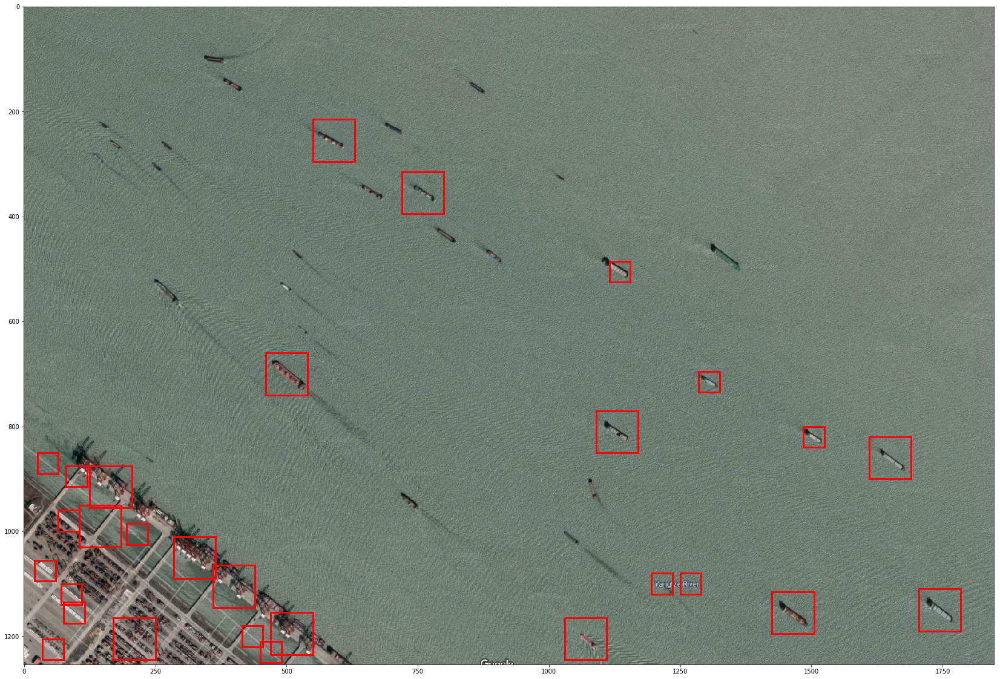

In [169]:
nms_boxes = non_max_suppression(boxes, scores, 0.1)
print(nms_boxes)
# nms_boxes = range(len(nms_boxes))
show_ship(image, boxes, nms_boxes)